### CHARLES PAYET
### PYTHON PROJECT INDIVIDUAL
### TESLA INC. TWEET SENTIMENT ANALYSIS 

### Import Packages

In [12]:
pip install tweepy

Note: you may need to restart the kernel to use updated packages.


In [13]:
pip install TextBlob

Note: you may need to restart the kernel to use updated packages.


In [14]:
# Install yfinance package.
!pip install yfinance

In [47]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import itertools
import collections
import csv
import yfinance as yf
import numpy as np

import tweepy
import nltk
from nltk.corpus import stopwords
import re
import networkx
from textblob import TextBlob
import sys
import warnings
warnings.filterwarnings("ignore")

sns.set(font_scale=1.5)
sns.set_style("whitegrid")

### Initiate Folders Links

In [16]:
sys.path.append("/Users/cpayet/Documents/IESEG/Python_Individual_Twitter/twitter_sentiment_analysis")

In [17]:
directory = "/Users/cpayet/Documents/IESEG/Python_Individual_Twitter/twitter_sentiment_analysis"
inputData = directory + "/data"

### Apply Twitter credentials and export Data

In [18]:
#Twitter credentials for the app
consumer_key = '0yPhVjaVVREHyHAotHTKkP2Bu'
consumer_secret = 'AjdeogFA10mRMd7TJk3AxkXBPERvIm6uBNXeIuAj84nGFsR9PQ'
access_key= '951786147331694593-LpehpmwSidgAITCRL3VqNJ5DxSPBZNG'
access_secret = 'azfMczd8Glzl9FtGw20SdOJ4D9eMeDDs5oFNtVDb9GQ3g'

In [19]:
auth = tweepy.OAuthHandler(consumer_key, consumer_secret)
api = tweepy.API(auth, wait_on_rate_limit=True)

In [20]:
api = tweepy.API(auth, wait_on_rate_limit=True)

# Open/create a file to append data to
csvFile = open(inputData + "/tesla_data.csv","w+")

#Use csv writer
csvWriter = csv.writer(csvFile)

search_term = "Tesla OR TESLA OR tesla -filter:retweets"

for tweet in tweepy.Cursor(api.search,
                           q = search_term,
                           since = "2019-12-01",
                           until = "2020-01-04",
                           lang = "en").items():
    

    # Write a row to the CSV file. I use encode UTF-8
    csvWriter.writerow([tweet.created_at, tweet.text.encode('utf-8')])
    print (tweet.created_at, tweet.text)
  
csvFile.close()

2020-01-03 23:59:58 @MMike2016 @Techgnostik @Tweetermeyer @SavedTesla If you believe every video posted to that account, then you belie… https://t.co/1pDpBuExmP
2020-01-03 23:59:54 @smegolas @ICannot_Enough There is seasonality of demand, I just don’t understand why it would apply to Tesla  if t… https://t.co/Q0G956tANX
2020-01-03 23:59:48 @JenniCurrent @indystar @elonmusk In an earlier video, the officer showed that they were using Stats app for their… https://t.co/B6NRy387oY
2020-01-03 23:59:35 @F150Trucklet @ComedyTslaq Please do not be alarmed by my Friday-Night discussion. We should have a place for discu… https://t.co/lk18jzMZ93
2020-01-03 23:59:32 WHY DO ALL TESLA DRIVERS SUCK AT DRIVING. STOP. BREAKING. EVERY. 2 SECONDS.
2020-01-03 23:59:28 God exists
So does God

Only in this Universe does this happen
And mobile dog grooming... https://t.co/HgNV4kQqYL
2020-01-03 23:59:19 @AhmirHamadi15 @Tesla @elonmusk Or get a good car
2020-01-03 23:59:01 New York City! This place seems like 

2020-01-03 23:53:45 unless you're like idk Tesla or Jordan you're existence is pretty shit not even your mom will remember you after a year
2020-01-03 23:53:40 Winter is finally here and today we are discussing seven (7) Tesla Model 3 Winter Tips and Tricks you should know a… https://t.co/YtkoUm1wtN
2020-01-03 23:53:32 @BongripCapital @lorakolodny @CNBCtech So you think the run rate of SH is 1K per quarter? 

You COULD take the Q's… https://t.co/i6ojczSsfX
2020-01-03 23:53:07 @ex_Tesla @Tesla What about an instantaneous build rate....
2020-01-03 23:53:06 $TSLA NEW ARTICLE : Wedbush's Ives Says Tesla's EV Vision Taking Off, Stock May Hit $600 https://t.co/cjilMdKQmW Ge… https://t.co/bd8IDfMfD0
2020-01-03 23:53:03 This week on Cross Country Checkup, we want to know if new technologies are making your life better or worse. 

Tel… https://t.co/9AwgjMdl5c
2020-01-03 23:52:59 Wedbush's Ives Says Tesla's EV Vision Taking Off, Stock May Hit $600 https://t.co/oYwyXR2wbe via @YouTube
2020-01-03 

2020-01-03 23:44:08 @mayemusk I rented a Tesla when I last visited California. My friend said that’s the  cost of an apartment. I highl… https://t.co/3X5Dh3wuMt
2020-01-03 23:44:07 I’m amazed at the bull run of @Tesla.  I love the company but I don’t get the 100% of market cap in 6m. What am I missing? #Tesla
2020-01-03 23:43:52 @TriTexan Sounds like some weird inverse of the "no true Scotsman" fallacy to me.

Which is fun as it implicitly ac… https://t.co/6NrQSX1TUC
2020-01-03 23:43:52 @sova123k It’s a brilliant idea.  Fans will offer friends and strangers a shot of Teslaquilla to soften them up and sell them a Tesla😆
2020-01-03 23:43:43 Tesla is a lot like apple. My 2 best companies by far.
2020-01-03 23:43:40 @PaulTheJohnson @sbalatan @Tesla Omg do you want to save the world or not
2020-01-03 23:43:31 @Twonius @ATX_fight_club @dohmanbob @davidshepardson Whos paying the €47k it costs for a new Bolt? You can pickup a… https://t.co/eawECPIhYc
2020-01-03 23:43:20 Starting to sell Model 

2020-01-03 23:35:02 Everybody will now start upgrading 2020 Tesla car production and sales estimates. 600k is a conservative number now… https://t.co/z5LNFOmNKt
2020-01-03 23:34:56 On Sunday, a #Tesla Model S sedan left a freeway in Gardena, California, at a high speed, ran a red light and struc… https://t.co/c8QjGNqxwf
2020-01-03 23:34:20 🇺🇲 With #CrudeOil as the primary input for #Energy in #Transportation &amp; #Manufacturing, the incentive to transition… https://t.co/ANk80herTM
2020-01-03 23:34:16 Time to repeat the tweet but change the Year 

What is the best selling premium car in USA in 2019?
Of course it is… https://t.co/pJGMw7VYFw
2020-01-03 23:34:15 @NikniaLaw @Tesla This sounds insane! I am sure there are others who've run into the same issue. Totally not OK!
2020-01-03 23:34:13 Investors need to understand varying convictions in intrinsic value.

From my perspective, it is easier to beat the… https://t.co/vXxKwMM4Q6
2020-01-03 23:34:07 Chevy Bolt sales decline for second st

2020-01-03 23:26:25 @AB_Chi_2020 @ncc926 @AndrewYang And that’s why we need Andrew
2020-01-03 23:26:24 @BLKMDL3 If you had time to wait, something lighter than the OEM would give you a little more performance and you c… https://t.co/XI7kxoE3Aj
2020-01-03 23:26:21 @elonmusk @Tesla Elon, please please make this retrofittable 😆🤘🤘🤘 https://t.co/g5bUpuH44M
2020-01-03 23:26:15 @HayekAndKeynes It's the worlds richest country and they are heavily subsidising this EV agenda with oil money, bas… https://t.co/FQy1UOXLVs
2020-01-03 23:26:03 @jimcramer @MadMoneyOnCNBC Tesla that's all I got to say https://t.co/sylYzyICKS
2020-01-03 23:26:02 @ThinkingLSD @JKCoins Only time will tell 

but tbh I really, really want a Tesla though lmao
2020-01-03 23:25:56 @LateNever2 @markbspiegel Spiegel: Here's what Tesla has to do in order for me to like them. Oh by the way, it's im… https://t.co/MazyZTNN8u
2020-01-03 23:25:55 @lovemesomemusk @Tesla Thanks, Danielle. Appreciate it!
2020-01-03 23:25:49 @lorakolodny 

2020-01-03 23:15:43 @TilmanWinkler @CowenResearch @Tesla where is COwen now?  eating https://t.co/vZqTMoh7lu
2020-01-03 23:15:34 Tesla 2019 sales hit goals, rise over 50% from previous year - Canadian Business https://t.co/FZFYtbRPjp
2020-01-03 23:15:28 Nio, the Tesla of China, is bleeding cash

https://t.co/NCPwKLo5IQ #electricandhybridvehicles #electricvehicles https://t.co/HeKzSNAEVg
2020-01-03 23:15:24 @JimCramer mad money Tesla it's all I got to say https://t.co/1t439BKZ1g
2020-01-03 23:15:22 @nolanolegal @jsterling86 @mitchysuch the highway is alight tonight
obama’s foolin people
as to where it goes
sitti… https://t.co/KDbGO6jPoS
2020-01-03 23:15:07 @davidshepardson To think we fought out the scoop over GM’s “Tesla Fighter”
2020-01-03 23:14:58 Death by Tesla
https://t.co/R4IVE4aiTi
2020-01-03 23:14:32 The tesla that explodes
2020-01-03 23:14:24 Hey #Tesla #ModelS owners, has anyone had issues with their dash screen where it needed replacing? Over the holiday… https://t.co/OETI8Ih

2020-01-03 23:06:47 @Jennerator211 @Tesla @elonmusk Jen, if you find out let me know, it’s 98 miles to Charlotte SC from here.  Thanks
2020-01-03 23:06:41 Tesla defies skeptics and sets a new record for deliveries in 2019 https://t.co/wdSH0SYXR3 https://t.co/0vFvoqcf8E
2020-01-03 23:06:40 WTF?!?! Sorry #nissan, that might be the case for your car - my wife’s a master in our #Tesla #model3.... in the ar… https://t.co/Y2FdrvxV6s
2020-01-03 23:06:39 @thirdrowtesla @Tesla @elonmusk Literally the sky is the limit for Tesla at the his point. We got the sky covered w… https://t.co/UaoUwueRQI
2020-01-03 23:06:33 My boss got his new Tesla and be at work early everyday. I know bro loves driving it 😂
2020-01-03 23:06:29 @ForestgrumpOz @jrmygrdn @HappyPawsTreats @DoctorKarl Not Thorium .. Get with the program .. we won’t need nukes as… https://t.co/cqAX1DcwfE
2020-01-03 23:06:24 @tedstein remember I have rooted ape unit so I can see everything that happens on it including these campaigns (whe… htt

2020-01-03 23:00:07 @TeslaJoy Nice! I guess no more Tesla loaners! On a good note, you don’t ha d to drive.
2020-01-03 23:00:05 #MorningMilk Tesla Met 2019 Delivery Goal With Model 3's Overseas Rollout https://t.co/2ZdOGENvU1
2020-01-03 23:00:04 True. There should be a max or at least a random selection of worldwide referrals now so that everyone gets his or… https://t.co/bDTL6iK6Be
2020-01-03 23:00:03 @b05crypto @DadOf2BoysTx @aHumanityFirst @AndrewYang Late stage abortions need to be banned completely and forever.
2020-01-03 23:00:00 This B.C. metalworker won Christmas by building his son a mini #Tesla Cybertruck. https://t.co/PauTFIRgzC
2020-01-03 23:00:00 Tesla Cybertruck vs. Garage … Dutch EV Sales Explosion … 2012 Model S Still Beats New Non-Tesla EVs — Top 20 CleanT… https://t.co/rExiChRxt2
2020-01-03 22:59:55 @sjyellehS @BlankLaw_Intl @Sunluvr16 @djraygsa @lori69068945 @SpeakerPelosi @POTUS You're a punk. Resist? Read RESI… https://t.co/SsigZjeWJZ
2020-01-03 22:59:53 Check out 

2020-01-03 22:52:35 #Tesla Appears to Turn a Corner, Lifting Valuation to $80 Billion - FORTUNE $TSLA

Everyone is about to have a “com… https://t.co/4UyLQL6fAx
2020-01-03 22:52:33 @_hockeyStuff @bitcoinhudson @SpeakerPelosi Less option in canada ... either Tesla or BMW .. . Smart is crap
2020-01-03 22:51:54 @adater Did you steal the coat from someone dressed as Nikola Tesla?
2020-01-03 22:51:49 The former workers say their time at the Tesla factory was a "scene straight from the Jim Crow era." They say their… https://t.co/ZMpJYQB3Dp
2020-01-03 22:51:44 @ThatYoungkidTED Yes. So which one you getting or you getting a Tesla instead? Lmao jk
2020-01-03 22:51:36 If the next GTA doesn’t have Tesla Cybertruck that I can steal and mod out, I’ll refuse to purchase the game.  The… https://t.co/aSLpIKwWxQ
2020-01-03 22:51:32 Those last moves from the first girl 🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥 https://t.co/BR0kSQTTai
2020-01-03 22:51:31 Ironically https://t.co/rrdhDdgtFT will soon be on the same software platform

2020-01-03 22:43:47 @amancalledscott @Tesla @elonmusk Slightly slower than my hypothetical example of doubling every cycle (year) - but… https://t.co/6n0by80PoW
2020-01-03 22:43:43 An antique Tesla car that makes me want to cough, for 7 long sweet days.
2020-01-03 22:43:42 @SpaceX Why do you refer to rocket fuel as methane of kerosene? Aren’t these fuels, currently sourced as fossil fue… https://t.co/D8fu5k5hR7
2020-01-03 22:43:34 @thenikolapro @BrianSwails @elonmusk @Tesla You got it, hit us up. We would love to be your best supplier!
2020-01-03 22:43:32 @venturecommunis @tobeeatenalive @olejoshieb @randy_badkid @workinclassbird @WorkingPod @marx_knopfler @Falcon87456… https://t.co/qmRJyPPT6G
2020-01-03 22:43:24 @DannyGardner22 Get a @Tesla
2020-01-03 22:43:20 @vaielettrico @_NissanElectric Dear @NissanElectric @_NissanElectric let me show you how easy is for my son to char… https://t.co/pCZMec60TG
2020-01-03 22:43:16 @GrrlAcid @MatchasmMatt I hardly see any reason to cry for Tesla’s 

2020-01-03 22:35:39 @transportevolve Does your Nav system route you through chargers similar to Tesla's?
2020-01-03 22:35:32 @Tesla @elonmusk @ProfRayWills @sunrisemvmt @VarshPrakash 
PLEASE RETWEET AND/OR TALK ABOUT THE OSBORNE EFFECT, AS… https://t.co/hKKfNNUYMB
2020-01-03 22:35:32 @TheCafeEla @elonmusk @Tesla wait whaaaaat
2020-01-03 22:35:27 @ByeonChansoo @elonmusk @Tesla @thirdrowtesla @ValueAnalyst1 @ray4tesla @TeslaPodcast @Gfilche @marc_benton… https://t.co/V03fJqnHPN
2020-01-03 22:35:26 @GrrlAcid @MatchasmMatt It would be different if Tesla were borrowing Debt to make Dividend payments or buy back sh… https://t.co/JjnQGVf2Q9
2020-01-03 22:35:26 @elonmusk @tesla could regen power be used to generate some heat when battery is too cold to accept power? Might im… https://t.co/7YZAJsfh9K
2020-01-03 22:35:20 @librab103 @iamrai @orthereaboot @markbspiegel @Tesla @JimJimroger $TSLA shorts are down $1 billion in 2020 so far. 🤷‍♂️
2020-01-03 22:35:05 @greentheonly Thx! Tesla should cont

2020-01-03 22:27:58 @orthereaboot @JesseDow17 @TeslaHistorian Dont you guys get tired of using the word fraud so repeatedly? The word d… https://t.co/egKP74zK7r
2020-01-03 22:27:50 @CathieDWood Tesla is a top2 bottom #AccountingFraud run by a ceo of a public company whom lies more than 15 times… https://t.co/DK4wsyYedx
2020-01-03 22:27:50 @greentheonly If you want to help other potential Tesla drivers, you can spray paint faint dividing line. It’s not… https://t.co/ueGv2nh0Oa
2020-01-03 22:27:47 @Wheels88Fortune @TilmanWinkler @Commuternyc @Tesla Stock price bro! And headlines!
2020-01-03 22:27:45 @Tesla_Spotter Damn.... you went almost a month without seeing a tesla!!!!
2020-01-03 22:27:44 @DunkenKBliths @Tesla @elonmusk They’d be doing it tough at the moment 😅
2020-01-03 22:27:32 Reading &amp; watching docs about Nikola Tesla &gt;&gt;&gt;&gt;&gt;
2020-01-03 22:27:30 @jenzfc How long is your commute? Maybe something other than an amazing futuristic Tesla is right for you 😆

Nah! J… ht

2020-01-03 22:22:21 Musk defies skeptics, meets Tesla delivery goal; shares hit record https://t.co/2WHwbLc45I
2020-01-03 22:22:16 @PaulMaric @Tesla @elonmusk Quarterly financials will appear mid-next month. I'd expect gross margins to be in the… https://t.co/gq1BD4FjBC
2020-01-03 22:21:57 Sitting at work watching @Tesla videos... so inlove with these cars @elonmusk
2020-01-03 22:21:55 @librab103 @orthereaboot @markbspiegel @Tesla @JimJimroger I just feel sad. Where do you live, what do you do, who… https://t.co/nB07vMVlPx
2020-01-03 22:21:44 Attention @elonmusk. It is confirmed that that a Caja China fits in a @Tesla       Let me know when you’re ready fo… https://t.co/p1XR8UdFVQ
2020-01-03 22:21:40 @joeltelling @FAB_365 @Tesla Is it me, or isn't that your best print ever? ;-)
2020-01-03 22:21:19 New Year, Headlines: What Investors Should Watch in Trade, Tesla and Boeing https://t.co/osptGsQdgc via @YouTube
2020-01-03 22:21:16 @ElectrekCo @14Rob23 BEST EV is a TESLA the car of the dec

2020-01-03 22:15:10 I'll go to the way I they let us pop Tesla's
2020-01-03 22:15:09 Damn @elonmusk , Tesla stock is T H I C C. https://t.co/XbEIhW6BtD
2020-01-03 22:15:06 Shares of electric car maker Tesla Inc. hit a record closing price Friday after the company reported that its globa… https://t.co/Ycdxtw3Ats
2020-01-03 22:15:03 @elonmusk you rollin out that Tesla Tank just in time for World War 3? 👀
2020-01-03 22:14:48 @iamrai @orthereaboot @markbspiegel @Tesla @JimJimroger The problem is Tesla's biggest market, the US, will have po… https://t.co/lflLJxui1F
2020-01-03 22:14:47 @CfTesla @Tesla The motor(s) do some type of vibrating to generate heat that’s transferred through the coolant to t… https://t.co/GTCmLcWvv8
2020-01-03 22:14:38 @dayyanl @flcnhvy @elonmusk @vincent13031925 @Tesla @jsrdctz Pushing the limits, focusing on the mission and enjoyi… https://t.co/wWn6aBncIE
2020-01-03 22:14:37 Have an Expert check your New CHINA TESLA Vehicle:
&lt;24 point CHECK&gt;
Tires
Engine
Radi

2020-01-03 22:07:50 Musk defies sceptics as Tesla meets delivery goal.
 https://t.co/CqJ4jZza9z via @RTENewsNow
2020-01-03 22:07:47 @Ctr4AutoSafety @Tesla @USDOT @NHTSA @APnews_USA @tkrisher NHTSA said it relies on data to make decisions, and if i… https://t.co/ke581Nfuwr
2020-01-03 22:07:40 Of course, Tesla is an Automotive company as well as energy company...@elonmusk @Tesla https://t.co/Cmz27JIRw0
2020-01-03 22:07:31 @BrianSwails @elonmusk @Tesla Just realized you were talking about the Cybertruck haha
2020-01-03 22:07:28 @danahull Finally a positive Tesla article @danahull 👍
2020-01-03 22:07:18 It is beginning of the end !!! https://t.co/sdwXtd0Ain
2020-01-03 22:07:16 @Nixons_Head_ @gwestr We may disagree on Tesla, but I love the gifs you use!
2020-01-03 22:07:12 Speaking of Tesla and Boeing, does anyone have a clip of the new Tesla Roadster hovering with its cold-thrust rocke… https://t.co/sD0e2wjT6N
2020-01-03 22:07:10 Why do #Tesla drivers have to drive 40mph in a crowded Costco

2020-01-03 22:01:01 @peoplesbutler @Tesla Sounds cool. I love saving for things, especially good investments!!!!
2020-01-03 22:01:00 @Gordon_Gekk0 @chrinder @flcnhvy @tesla_china How is the shirt? I’m thinking of getting a few.
2020-01-03 22:00:55 @elonmusk Elon I have one quick Tesla model 3  related question,  In the near future will there be an optional upgr… https://t.co/9hfoIcMofN
2020-01-03 22:00:54 Imagine a 500-mile, $35/40k RAV4 or Outback. It would sell like🥞🥞🥞🥞🥞🥞🥞🥞
https://t.co/xRYs6n5ZWC #Tesla #teslamodel3 #ElonMusk #EVs $TSLA
2020-01-03 22:00:54 Here's what 4 analysts are saying about Tesla after record delivery numbers sent shares climbing https://t.co/xZ9k4J9xdh
2020-01-03 22:00:54 Lithium Ion Electric Vehicle Mass vs Range Debacle (Catch 22)
To increase range means more heavier batteries &amp; thus… https://t.co/h1aFDjMfWI
2020-01-03 22:00:45 Tesla made it again with new all-time highs. Last time was just on December 27th. https://t.co/I9uJCR2lZO
2020-01-03 22:00:39 @i

2020-01-03 21:55:39 @Keith_Andes I will bet any amount you want, held in escrow, that there are no autonomous $tsla robotaxis available… https://t.co/q76pWI1tSy
2020-01-03 21:55:37 @fortherecord_x3 I totally get that. I mean obviously there are always exceptions to the rule, right? I have not me… https://t.co/ocMGaMHCoA
2020-01-03 21:55:37 Hey @elonmusk @Tesla this persons profile links to a referral page for your company. Will you turn over his info to… https://t.co/gHXi1cxbEW
2020-01-03 21:55:25 @Marvel/@MarvelStudios,

My One Friend, Who Works for @SasolSA, Gave me Space, We Call Him X ;

@Tesla @SpaceX… https://t.co/ruQHlGhuHw
2020-01-03 21:55:24 @Sofiaan @thirdrowtesla @vincent13031925 @Kristennetten @elonmusk @flcnhvy @Gfilche So great to see you all togethe… https://t.co/eKnOOrFZvC
2020-01-03 21:55:21 Tesla Is Selling Electric Cars Faster Than Ever, Stock Doubles in 3 Months https://t.co/fxMSF34p2j
2020-01-03 21:55:17 @GrrlAcid @MatchasmMatt - whereas Tesla has a valuation way a

2020-01-03 21:48:30 @iamrai @orthereaboot @markbspiegel @Tesla @JimJimroger Lol. Let me guess stock price, number of cars delivered is all that matters huh?
2020-01-03 21:48:16 Take care of the 🌎 get a Tesla’s or something bitch
2020-01-03 21:48:07 @librab103 @orthereaboot @iamrai @markbspiegel @Tesla @JimJimroger To be fair to them, I don't really know what wou… https://t.co/36JLXjH8Cw
2020-01-03 21:48:04 @CGrantWSJ @followtheh Charley quiet on Tesla deliveries. 🤔
2020-01-03 21:48:03 @AlterViggo Not always, but it can be useful. Can't imagine it's much more dev time than Cuphead in my Tesla
2020-01-03 21:48:02 @mz_nubbie @QkellyL @carmindabrendel @YouTube @EsperDoD @DeptofDefense @USNavy And the stuff that was released was… https://t.co/CUAYSH89P2
2020-01-03 21:47:31 “Ace you sell drugs that’s how you got that tesla.” 

Me : https://t.co/yj0VBvrtk8
2020-01-03 21:47:25 Tesla Supertruck in the middle east #technology https://t.co/4CMuDqANUU | Retweet selected by… https://t.co/f7TvyI5n1t

2020-01-03 21:42:38 @28delayslater @keith_dorschner I would kill to have these windows on my Tesla
2020-01-03 21:42:24 @TeedoubleA @iamrai @librab103 @markbspiegel @Tesla @JimJimroger Sometimes you’re stuck in traffic with road rage to unleash
2020-01-03 21:42:15 @Paul_M_Huettner @BloodsportCap Thanks! Suppose finished goods inventory in 10-k still implies 22k cars: then still… https://t.co/1KyYqrhJqj
2020-01-03 21:42:06 Enough said, congrats @elonmusk and @tesla quite a feat, shame on the non believers. https://t.co/hD6eC1abaU
2020-01-03 21:42:03 Shifting Gears: An international manhunt, Tesla delivers, and … an egg? https://t.co/H9L97zx9ZK
2020-01-03 21:41:53 @mcubaaaa TESLA?! MADISON PLEASE STOP LISTENING TO KEVIN AND YES YOURE HIRED 😂
2020-01-03 21:41:52 @DrowningPenguin @rhensing there's a document at Tesla, you just need to repopulate some pins from a now redundant… https://t.co/hJL7YA5rzT
2020-01-03 21:41:52 @KingSK88 what's going to be special about Tesla once companies such as

2020-01-03 21:36:46 @riaanmanser @elonmusk @Tesla I’m heading there next month, will go do some scouting 😉
2020-01-03 21:36:32 It’s some decent looking guys who work at Tesla 😭
2020-01-03 21:36:28 @MrJamesMay @embaachu @Tesla Do you think you’ll get back together?
2020-01-03 21:36:24 @Keith_Andes Tesla was again on edge of bankruptcy.  Musk claimed 1mm robotaxis by end of year, cash was raised dis… https://t.co/vpikSddQaF
2020-01-03 21:36:23 WELCOME TESLA TO THE SANDBOX! Join us for what can only be described as the BEST WEEK OF YOUR LIFE! Our 4th Annual… https://t.co/e8wXtbEEJ9
2020-01-03 21:36:20 changing pad in the frunk 🚼 #tesla https://t.co/hsbjk1SQA4
2020-01-03 21:36:13 @elonmusk @Tesla anyway we could have a setting to disable the dimming of side mirrors for us owners with tinted windows?
2020-01-03 21:36:06 @badimo Make Tesla truck bullet proof and add Elon musk missions 🤣
2020-01-03 21:35:50 @darth_frog @jimmy19899 A German think-tank, known as IFO, is of the opinion that when

2020-01-03 21:29:14 Should’ve invested in Tesla on that dip they had 😔
2020-01-03 21:29:03 I need that Tesla Truck !!!!!!!
2020-01-03 21:28:46 @StephenPace @MidwestKenny @evchels ICE guy my whole life.
Now have two Tesla Model 3s.
They are awesome.
I drive 1… https://t.co/NntqwnCYSU
2020-01-03 21:28:33 Today I saw a Tesla Model 3 in red (01/03/20).
2020-01-03 21:28:31 @Zomoney03 @Commuternyc Do you not understand english? All we hear from @elonmusk and $tsla bulls is that Tesla can… https://t.co/jh2UpFgmef
2020-01-03 21:28:31 @HogDexter @MikeHudema @teslaP3D @brian4NY @ijustine @SmokeyShorts @lorakolodny @ThePhoenixFlare @tesla_raj… https://t.co/mR9mYMOSEw
2020-01-03 21:28:29 If Tesla engineers are also Chevy racing retards https://t.co/FwYAT7jdC0
2020-01-03 21:28:21 Tesla cuts price of China-made Model 3 cars

https://t.co/KMCl3GZe2G
2020-01-03 21:28:04 @greentheonly @jmtatsch1 @Bfklin I mean, Tesla has already implemented this. You use imitation learned path predict… https://t.co/21x

2020-01-03 21:21:38 Data detailing the performance of automated driving technologies in the seconds before a crash are only accessible… https://t.co/zNQlxR60EB
2020-01-03 21:21:33 @dollarn9ne @BLKMDL3 @IAmKelvinYoung @jgrano305 @Teslatunity I want to see if Tesla would let me pay 4K for FSD but… https://t.co/tTv2HV0kQf
2020-01-03 21:21:29 @StephenPace Most manufacturers have been in EV since long before Tesla existed. Ford has an F150 that is the only… https://t.co/pdzvtIkBhd
2020-01-03 21:21:25 @MatchasmMatt @Trumpery45 @PoetBones It is outrageous that Tesla and its owners are subjecting innocent people to t… https://t.co/RUi3LM0z1N
2020-01-03 21:21:15 Have brand new #merch in my #shop https://t.co/R6GcVb7FYf Check out the sciencey goodness!
#Stem #WomeninStem… https://t.co/xE5JwdZ4MC
2020-01-03 21:21:14 @seanmmitchell You may park your Tesla in your Playroom since it doesn’t have a tail pipe, Music and game Center included
2020-01-03 21:21:05 Study Explores: Electronic Car Market to 

2020-01-03 21:14:46 @PJHORNAK @MediYoga_ax @sensarpensar @Lebeaucarnews Biased?

I show you that Tesla has never covered its cost of ca… https://t.co/VT8oHLrgVw
2020-01-03 21:14:39 Tesla market cap finishes the week just shy of $80 billion $TSLA
2020-01-03 21:14:38 @joeltelling @FAB_365 @Tesla Would make an epic nerdmobile. #2021Goals
2020-01-03 21:14:33 Tesla did this in the 1800s https://t.co/pPtfbYhCWG
2020-01-03 21:14:32 #SpreadTheGoodNews:

Now that's what I call a good start into 2020!

Congratulations!

#BEV 
#TESLA 
#eMobility… https://t.co/ReDgtIdKVa
2020-01-03 21:14:32 @Domenick_Y These analysts are only right some of the time, and tbh when it comes to @tesla they should perhaps ref… https://t.co/8kamppnWid
2020-01-03 21:14:30 @PretzRoland Not at all. It’s super spacious and so comfortable. It’s like sitting in a lazy-boy chair in your own… https://t.co/7nbokxW7Ec
2020-01-03 21:14:27 @BLKMDL3 @IAmKelvinYoung @jgrano305 @Teslatunity I don’t have FSD
2020-01-03 21:14:14 What a 

2020-01-03 21:09:05 Study Explores: Electronic Car Market to Witness Stunning Growth | Tesla, BYD, BMW, Volkswagen, Nissan… https://t.co/ChVQ0nsUtQ
2020-01-03 21:09:05 Tesla Targets Met; Gold and Oil Bets: Friday Four Play: The “You Dropped a Bomb on Me” Edition I know it’s traditio… https://t.co/LsXULLZzWN
2020-01-03 21:09:03 Tesla Beats Estimates With a Record 112,000 Cars Delivered in Fourth Quarter https://t.co/vlxs9cXafl https://t.co/M4xH8H5qeO
2020-01-03 21:08:59 @allrachel @ICC_99 Same honestly. If I could afford a  Tesla, I’d be like SUCK IT PLEBES
2020-01-03 21:08:56 Tesla Q4 results: 
104,891 cars produced;
112,000 total world-wide deliveries;
367,500 total deliveries YTD, ⬆️ 50%… https://t.co/JBnoR2yPK8
2020-01-03 21:08:56 @carsonight @Playful121 In current construction phase 1.5, they are building the battery building. Tesla GF3 may pr… https://t.co/v6bMO8MFQY
2020-01-03 21:08:53 @tesla_china Do it!
2020-01-03 21:08:48 @MatchasmMatt @PoetBones It doesn't stand to reason tha

2020-01-03 21:03:22 @Paul80366952 @ContrarianShort @ghost_scot @TroyTeslike "Tesla's" for the love of Christ. You always embarrass me.
2020-01-03 21:03:15 @DogfatherMike @MarketCurrents Yeah that was more like “stores” owned by Tesla. You can find them at the mall.  Nor… https://t.co/HuBTgirOjx
2020-01-03 21:03:13 @elonmusk @NASA You should talk to Chris Roberts about putting the ship in Star Citizen. I would kill for Tesla content.
2020-01-03 21:03:13 @GrrlAcid @MatchasmMatt @PoetBones The EPA wh/mile number is also - demonstrably - not consistent from EV to EV vs… https://t.co/JO2ORc8E6M
2020-01-03 21:03:13 @agusnox @AnankeE20 @bratanov @CathieDWood Demand is even higher than they thought. Tesla's issue is it can't produ… https://t.co/MDviKFMg5v
2020-01-03 21:03:04 @ParsTheStrange @FAB_365 @Tesla @Zortrax_3D m200 with Z-ULTRAT filament
2020-01-03 21:03:04 @womesy @Tesla @elonmusk A home, otherwise you won't be able to plug your overpriced Ford Escort in
2020-01-03 21:03:03 🤔 It's all

2020-01-03 20:59:02 @gwestr 😂why is your yellow cable 20 meters? Why all the adapters? I only use a 4 meter cable type 2 - The Tesla ca… https://t.co/TDPeRxQ0tR
2020-01-03 20:59:00 58.4 % of all new cars sold in Norway in March were fully electric!

In June it was 57.8%

In October 58.3%

This i… https://t.co/JdfyQv1Wdr
2020-01-03 20:58:47 56% of Norway's new cars had a plug in 2019, Tesla Model 3 overall best-seller https://t.co/tWLkt2cP0k via @electrekco
2020-01-03 20:58:40 @amancalledscott @MarketCurrents Funny... Tesla said they were not going to close down their dealerships

If they h… https://t.co/oZa7naeMfw
2020-01-03 20:58:32 👍 on @YouTube: Nikola Tesla vs Thomas Edison. Epic Rap Battles of History https://t.co/UazM934wcb
2020-01-03 20:58:25 elonmusk Hey Elon. If I helped you sell 100 Tesla's would you reward me with my own Tesla?
2020-01-03 20:58:16 @GerberKawasaki You are going to get shaken out of your 100 shares of Tesla that you own at $380 you dork
2020-01-03 20:57:39 @DM

2020-01-03 20:53:03 My @NissanElectric #LEAF lease is up in November,so I would like to see what kind of lease deal 4 either a LEAF Plu… https://t.co/uUT0YrSwzA
2020-01-03 20:52:54 Tesla's Supercharger V2 fast charging stations are designed the way that two charging stations share one charging r… https://t.co/KnhREfNBn0
2020-01-03 20:52:50 I think Tesla’s are cool, but I’d never buy one. The technology is too flawed and still dangerous to spend that muc… https://t.co/SNYgS2uOTl
2020-01-03 20:52:49 @omg_tesla @NokianTyresNA @NokianTyresCom @goodyear @Pirelli @Michelin True lol
2020-01-03 20:52:48 @alexhorner2002 @thirdrowtesla @JulianCox_F_Hot @DonchoGunchev @greentheonly @ShoaibQ23 I mean, that's because they… https://t.co/p46h8NfNSM
2020-01-03 20:52:45 Thank you @Tesla
2020-01-03 20:52:45 @tesla_addicted Speaking from experience, that's a great kit - your kid will love it!
2020-01-03 20:52:38 @Erwin_Ahlers @Public_Citizen @PlugInFUD @ex_Tesla Yeah! You tell’em Erwin
2020-01-03 20:52:3

2020-01-03 20:47:04 See this heavily damaged Tesla Model S get a shocking repair job https://t.co/Efwjo2JrlZ :Auto pickup by wikyou
2020-01-03 20:47:00 @KurtBusiek It’s like if you asked Da Vinci a question about art or Tesla about electricity. Would you call him an… https://t.co/KqAb8uWpFE
2020-01-03 20:46:49 @HeidiTringe @GreenMtnPower @suncommon @Tesla How was the experience?
2020-01-03 20:46:45 @vandelay1978 @DeanSheikh1 @JohnBender83 @vandelay1234 @markbspiegel A market will compete with Tesla. Who cares if… https://t.co/tQUIG1gxPS
2020-01-03 20:46:43 Tesla has new glass technology for noise reduction, temperature control, and more #tesla #eCar https://t.co/v5lomkekx8
2020-01-03 20:46:42 @HashUrTag What about tesla cuz electric cars are future..
2020-01-03 20:46:29 @jgrano305 @BLKMDL3 @Teslatunity 🥱 don’t even have the option https://t.co/09PayByChc
2020-01-03 20:46:27 @lukascph Weren’t @EFprocycling running @Tesla last season now with new lorry’s in Tesla’s fleet.
2020-01-03 20:4

2020-01-03 20:41:55 1/ Tesla was production constrained in Q4, as it is generally accepted. However, they should still have like 8k in… https://t.co/zAhDWdiXHm
2020-01-03 20:41:52 Tesla has new glass technology for noise reduction, temperature control, and more - Electrek https://t.co/c2NTEJAk1K
2020-01-03 20:41:46 Highlight: “These delivery numbers by no means are bad numbers — these are good numbers...Tesla beat expectations."… https://t.co/n0nd9YMrF0
2020-01-03 20:41:42 @gwestr Getting a trip out of watching some Tesla bulls turn on Greg.

Greg is one good autopilot/fsd release away… https://t.co/xd3hsT0iLI
2020-01-03 20:41:32 Tesla cuts the starting price for its China-made Model 3 vehicles by more than 8,000 yuan to 299,050 yuan (US$42,91… https://t.co/3deIzqjvuZ
2020-01-03 20:41:32 @sueinphilly @LifeVestedGamer Tesla was working on wireless electricity before he got screwed by Edison, the oil co… https://t.co/iXmiIlKdoZ
2020-01-03 20:41:32 “Automation complacency” the new term fo

2020-01-03 20:36:33 Tesla has new glass technology for noise reduction, temperature control, and more: Tesla has applied for a patent o… https://t.co/YjUCkk2Qxv
2020-01-03 20:36:33 Tesla surpasses 2019 goal and delivers 367,500 electric vehicles https://t.co/UdmwWdRup2 https://t.co/dzga6co2GL
2020-01-03 20:36:32 Someone Turned A Tesla Model 3 Into A Dale Earnhardt Tribute Car: Those stickers are actual sponsors, and they paid… https://t.co/cKLyKqcAA3
2020-01-03 20:36:26 #Tesla 🇨🇳 takes holistic approach to maximize production &amp; sales while keeping costs down. https://t.co/OwtCsSDQgs
2020-01-03 20:36:14 @Teslarati I wonder what will happen when @Tesla reveals they have 500,000 preorders for MIC Model 3 at next earnings report?
2020-01-03 20:36:11 False Sales Projections 
(based on investor ROI, not what the automotive industry can bear)
+
Give the Appearance o… https://t.co/H5t2vN0pxD
2020-01-03 20:36:11 @gwestr #tslaq are death.. 😚
#Tesla
2020-01-03 20:35:41 What Happened To Tesla'

2020-01-03 20:29:43 @michael_reid_IT @Tesla @Se_Railway @nationalrailenq Could push for the Model S Performance 😉
2020-01-03 20:29:38 Tesla’s car shipments grew by 50 percent last year – Engadget https://t.co/WhtVNq5qPP
2020-01-03 20:29:38 Tesla Model Y To Ditch 12-Volt Battery, 95% Less Wiring Than Model 3 https://t.co/XUKxhHp8FW
2020-01-03 20:29:32 Tesla surpasses 2019 goal and delivers 367,500 electric vehicles https://t.co/AWLHUBkEuh https://t.co/6lAcJT4ih9
2020-01-03 20:29:26 Musk defies skeptics, meets Tesla delivery goal; shares hit record https://t.co/CaLbD348MI
2020-01-03 20:29:23 @elonmusk stocks are about to crash. Trust is #1.

And I don't trust you. I was about to have all the rappers, stri… https://t.co/YL9O7t4QMO
2020-01-03 20:29:22 trump started ww3 to promote tesla because gas gonna be mad expensive now
2020-01-03 20:29:14 @michael_reid_IT @absolutehype @Tesla @Se_Railway @nationalrailenq I might be interested. Are you in Ashford @absolutehype ?
2020-01-03 20:29:13 @28

2020-01-03 20:23:41 From Discover on Google https://t.co/UajICKhcRo
2020-01-03 20:23:40 Tryna pull up on a Tesla w my feet up
2020-01-03 20:23:37 the tesla truck is so fucking ugly if i ever see one of those shits on the street im throwing a rock at it
2020-01-03 20:23:32 @greentheonly I can't understand why there is no simple bug report feature. Obviously it would be very important.… https://t.co/JoCI3Qwgee
2020-01-03 20:23:25 @samuelbaquera I'm out here ready, like real ready. I want my Tesla. https://t.co/jm3UgGpi2D
2020-01-03 20:23:20 @danahull @ex_Tesla My standard for that is: do you get exactly the same number of kids when you return as you left?
2020-01-03 20:23:04 Tesla says it produced more than 100,000 vehicles in the fourth quarter, a record, putting its yearly deliveries wi… https://t.co/y8C3BczdA4
2020-01-03 20:22:55 @rougemarty she really does although el*n might program a Tesla to hit me for it
2020-01-03 20:22:55 @Gfilche based on those deliveries do you see any vague 

2020-01-03 20:16:58 @ganggangeli And maybe Tesla or George Washington Carver were better examples of genius
2020-01-03 20:16:58 Mark Twain and Joseph Jefferson in Tesla's South Fifth Avenue laborator (blurred image of Tesla between). 1894 https://t.co/GmNPtewOC9
2020-01-03 20:16:55 @TheJacobBrown @mateosfo @sokane1 Globally, yes. Tesla's sales are largely centered in the US, so I only compared t… https://t.co/zZvRUO8Qlx
2020-01-03 20:16:55 @AlterViggo @JoeBiden @Tesla How about not voting for him because he is showing some signs of advanced age.
2020-01-03 20:16:50 Tesla hits all-time high after delivering record number of vehicles last quarter #stock #Tesla #deliveries… https://t.co/o5vqjdnD1X
2020-01-03 20:16:48 @Tesla on 31-12-2019, pickup my new Tesla Model 3 LR AWD I ❤️ MY #Tesla https://t.co/Ipchh2VPuu
2020-01-03 20:16:47 TESLA'S BACK, BABY! Elvis Stojko is guest-starring in this episode as well.
2020-01-03 20:16:40 @ex_Tesla @agusnox @Marshmall0wpeep I think most of those sales 

2020-01-03 20:11:39 That Tesla must be coming early for me good shit always happen when I fall out with people it never fails
2020-01-03 20:11:29 Goodnight to all the rowdy gang @Tesla_Mahesh @yoursdeepika @ChickyPilla @Nishi_Reddy_ @chickendinner95
2020-01-03 20:11:26 Tesla’s car shipments grew by 50 percent last year https://t.co/qsTPmkuHAv
2020-01-03 20:11:23 I should become a $TSLA analyst and just say the opposite of what these guys say! 🤣😂

@Tesla to hit delivery foreca… https://t.co/b3Tig1340u
2020-01-03 20:11:18 @TriTexan In today's world, "market" prices reflect the amount of central bank intervention, benefiting the rich, a… https://t.co/ClGrTgCXlm
2020-01-03 20:11:17 Tesla rally leaves short sellers down $3 billion since 2018 https://t.co/SvrmHBAceg
2020-01-03 20:11:16 @Burgundavia @kyleplans You're suggesting that a tesla may, of its own volition, decide to attack or main a cyclist… https://t.co/xUL9q4Nyp6
2020-01-03 20:11:07 Delivering a total of 367,500 vehicles. https://

2020-01-03 20:04:33 56% of Norway’s new cars had a plug in 2019, Tesla Model 3 overall best-seller: Electric cars continue to dominate… https://t.co/l1xU10WJDv
2020-01-03 20:04:31 Someone buy me a Tesla in 2020
2020-01-03 20:04:30 @Marshmall0wpeep With 80% of the US EV market belonging to Tesla, this reflects that Tesla (which sells every car i… https://t.co/FfH8Ua87WS
2020-01-03 20:04:25 Tesla moves production to China. Will this solve their problems of making money and producing cars? Get Jeff's take… https://t.co/qsu6V1V0XU
2020-01-03 20:04:24 @badimo Can you please fix the “Tesla (and Roadster) goes UFO-mode” glitch? Its really annoying
2020-01-03 20:04:23 56% of Norway's new cars had a plug in 2019, Tesla Model 3 overall best-seller - 
Electric cars continue to dominat… https://t.co/khuxvhcO6s
2020-01-03 20:04:19 @thirdrowtesla @Gfilche @vincent13031925 I expect Tesla to reach a production rate of 15,000 per week in the second… https://t.co/BvgGX0yDMs
2020-01-03 20:04:16 @montana_

2020-01-03 20:00:55 New fatal Tesla crash: US road traffic regulator probes possible Autopilot link https://t.co/Mjkjy9KgG5
2020-01-03 20:00:52 Tesla (TSLA) 4Q 2019 production and delivery numbers https://t.co/AH4u4GoOmT
2020-01-03 20:00:43 Tesla will go bankrupt in the next 2 years as other manufacturers are moving on electric
2020-01-03 20:00:43 Brutal racism is part of California’s legacy. https://t.co/AzSgdCnPgn
2020-01-03 20:00:39 @adrenalyyn @ugheav ofc man lmk if you need to borrow my Tesla next week, gotta save the earth ya know 😳
2020-01-03 20:00:38 Tesla Is Selling Electric Cars Faster Than Ever, Stock Doubles in 3 Months https://t.co/kpk44RJL8C
2020-01-03 20:00:37 Ok 
@elonmusk focus on  this 
https://t.co/4w7UHl5V4B

not strange hyperloops and underground tunnels
2020-01-03 20:00:33 Video while you wait coming to new Tesla cars https://t.co/ZRQM71PJU9 https://t.co/I4w3XdO9f9
2020-01-03 20:00:27 @ex_Tesla No, the 208 is "supermini", the Golf is "Compact/Small Family Car".

4

2020-01-03 19:53:52 Once you show something is better and feasible (economically and intellectually), you unlock a rush of adoption.

T… https://t.co/5Vk5lxGpIy
2020-01-03 19:53:52 Good examples of proving feasibility:

- Tesla with Electric Vehicles vs. ICE
- XPrize with Commercial Space
- Sola… https://t.co/2puaI2TkxA
2020-01-03 19:53:50 It's when Europeans buy cars with cash but they send the physical cash by sailboat around South America to Fremont… https://t.co/1zAhMCSvxc
2020-01-03 19:53:46 “I read a couple of Anita Brookner’s novels this fall. Though 'Hotel du Lac' won her the Booker Prize in 1984, I lo… https://t.co/Y6qs1KPsea
2020-01-03 19:53:38 Preliminary numbers European Tesla Model 3 registrations 2019

Source: https://t.co/CeIFaa4J0W https://t.co/LugwiOEqZy
2020-01-03 19:53:36 @CtrldEntropy @yangisforward @peterdaou @AndrewYang @JoeBiden What about Bernie?
2020-01-03 19:53:29 Since launching the Model S in 2012, Tesla has:

Benefited from $3bn in US federal tax credits
To

2020-01-03 19:48:54 @AlbertsStuff when did you get a tesla 😳
2020-01-03 19:48:50 ⭐️Ride together with your child🤩
Huge Super Sport Porsche style 24V Big Kids Ride On w/ Real Rubber Tires. Styled a… https://t.co/4LBIxbmCmC
2020-01-03 19:48:46 @ValueAnalyst1 To be honest I don’t think it’s only #TeslaEffect but also a general trend in the automotive industr… https://t.co/eKGbPTT5hr
2020-01-03 19:48:42 @badimo @badimo Are you aware that for 600k you can buy a roadster in jailbreak that can fly. Also when is this fea… https://t.co/qwOSLlYIAo
2020-01-03 19:48:37 Dey got da Tesla outside
2020-01-03 19:48:33 @BenSullins @Ford @amazon Wow! I hope so. @Tesla should buy some...
2020-01-03 19:48:32 @wordsbymt @pbreit @mark27883625 @tedstein @FenceTesla @GerberKawasaki @PythiaR @welling_phil @macmover @thijsroes… https://t.co/j5aaNuQy87
2020-01-03 19:48:29 56% of Norway's new cars had a plug in 2019, Tesla Model 3 overall best-seller https://t.co/vkIt8ifg3e
2020-01-03 19:48:28 $TSLA 
Tesla shares 

2020-01-03 19:40:39 #Tesla Ping ponging in action after the latest 40.50.7 update. This is the stretch of road that I test after each u… https://t.co/4QgN1LmyW4
2020-01-03 19:40:37 Guys my urber driver pulled up in a Tesla https://t.co/T27pSPY6jw
2020-01-03 19:40:36 @TeslaMiles @Tesla Can’t scroll past this tweet. Send help
2020-01-03 19:40:28 Tesla destroys expectations, announces record deliveries of 112,000 cars https://t.co/YtYtfSnAvV via @FredericLambert
2020-01-03 19:40:23 @AlterViggo @JoeBiden @Tesla Biden is too old. USA needs fondamental changes. Biden is the past.
2020-01-03 19:40:15 @End_TheFederalR Rulers only listen to their rulers, they don't give 2 shits about the peasants. As they say, shit… https://t.co/DH8mYZfse5
2020-01-03 19:40:13 @Amaryllizs 138, fuck me in a Tesla
2020-01-03 19:40:11 Fuel Cell Electric Vehicles Are The Future Say EV Manufacturers: Tesla Says No https://t.co/gVokEdosVv https://t.co/1Ag0eKgDKC
2020-01-03 19:39:57 Tesla produced 360,000 vehicles in F

2020-01-03 19:34:49 @teslainvernon A Northern and Southern Route through British Columbia, Canada, love it! #Tesla #Supercharger
2020-01-03 19:34:48 @KccClaudia Riding a bike is too much work. Can I buy a Tesla and call it even?
2020-01-03 19:34:42 Wait so who got the Tesla @DavidDobrik
2020-01-03 19:34:38 @NuovaRealta @elonmusk @Tesla Not for long, just wait until the model Y is available!
2020-01-03 19:34:33 @gwestr OK, straw man.

How many combined deliveries do you expect from Tesla China in 2020?
2020-01-03 19:34:20 Automakers are making it ever harder for @InsideEVs to get #EVs #PHEV sales figures, but they aren't giving up! The… https://t.co/VF3U1povyW
2020-01-03 19:34:18 @lorakolodny @MikeWayland @Tesla Yes, there is a "hall of shame" for every "news" group that picked this up and did… https://t.co/ntfzNWuvdO
2020-01-03 19:34:04 Tesla's car shipments grew by 50 percent last year - Engadget https://t.co/3LtLwTdYHP
2020-01-03 19:33:59 For future reference regarding Tesla gaps 
#N

2020-01-03 19:29:27 Which road would you / did you take your Tesla on for its first road trip?

The Old Military Road near Glenshee, Sc… https://t.co/lkEvnjE7ie
2020-01-03 19:29:23 @nicholasCs that way lies madness ... but tesla is STILL a buy .. it is nowhere near it's eventual highs imo ... if… https://t.co/KnPSCUhTsB
2020-01-03 19:29:23 @lorakolodny @MikeWayland @Tesla I expect that if you consistently use #cowenenergy 's info, you should do just the… https://t.co/QT6ORRvnAp
2020-01-03 19:29:20 @teslaincanada @Tesla EV’s have taken every vehicle sector by storm. Demand is incredible. These “professional” ana… https://t.co/dZCgxBC7Vx
2020-01-03 19:29:12 @markbspiegel I'm short Tesla, but I'm not going to always look for the negative. It was a good quarter. Period
2020-01-03 19:29:04 Things That Are True About Tesla Right Now $TSLA $TSLAQ https://t.co/DVrl5JFEfo
2020-01-03 19:28:59 @Teslatunity You can sign into mine and give Tesla some money!! 😜😜😜 https://t.co/0doKhHyKW6
2020-01-03 1

2020-01-03 19:23:51 Hammer slams into Tesla Model 3 windshield in scary dashcam video https://t.co/In5dYCrjEY
2020-01-03 19:23:44 i don’t need david dobrik to give me a tesla i just wanna meet him
2020-01-03 19:23:39 If gas prices rise to $5.00 a gallon, I’m getting a Tesla.
2020-01-03 19:23:30 @jpr007 Yes of course many option open for uphill or downhill. It will be intresting to see how GF3 will apear and… https://t.co/pmSBmsalbB
2020-01-03 19:23:28 @librab103 @orthereaboot @markbspiegel That may be because you have never seen a product like ‘Tesla’ ever. 😆 

Go take a test drive.
2020-01-03 19:23:27 #Tesla remember 5 dec✅ https://t.co/JtZxHNjAIx
2020-01-03 19:23:27 Mom got lil sis hooked on Silicon Valley 😂😂😂
2020-01-03 19:23:22 @Gfilche @ARKInvest How / when will @Tesla jump into the E-planes market? https://t.co/Tga4uo2KDr Maybe team up wit… https://t.co/wEpV4Aaobt
2020-01-03 19:23:22 @tesla_unplugged I got #RumTumTugger in my frunk baby! #FrunkKittyFriday @catsmovie https://t.co/

2020-01-03 19:19:10 I just listed: 'Hot Wheels 2019 Hw Green Speed Tesla Model S, Blue 226/250', for 2.99 via @amazon https://t.co/m2PWEmRxww
2020-01-03 19:19:08 @jakepc94 @you_a_hype @ReggieBush Easy their Tesla..the geopolitical reach of the Pasdaran into IZ by Iran was crea… https://t.co/IGNwXMzT6e
2020-01-03 19:19:02 @freetrade You should sign up to Freetrade! It’s this app you can use to invest for free. Plus, when you sign up, w… https://t.co/09z31RSMWV
2020-01-03 19:19:00 Hell yeah, No. 3 forever: https://t.co/YrfiDctHNz
2020-01-03 19:19:00 Defying skeptics, Tesla meets delivery goal https://t.co/Tu4brY5cKl via @ReutersTV https://t.co/fY1Gz2e6uG
2020-01-03 19:18:33 Heard from a reliable source in a white van that Tesla will be re-rating the Model 3 performance with 20 inch rims… https://t.co/se4C0rgr20
2020-01-03 19:18:31 Test Track should really be sponsored by Tesla
2020-01-03 19:18:21 Enjoying this line from a roundup of 2019 AV stories: 

It’s hard to beat the fun of a hungr

2020-01-03 19:13:13 Tesla hits new high after making 100,000 quarterly deliveries
https://t.co/2esJnlgT5z
2020-01-03 19:13:12 @gwestr 2 and 3, but parts to GF4+, no tariff problems.

Do notice Tesla didn’t invest a dime of USD into GF3.
2020-01-03 19:13:09 Tesla Rises as Record Deliveries Stoke Street Confidence #tesla  https://t.co/h8STuRpVps
2020-01-03 19:13:07 @ValueExpected @maymuskrotinpr1 @lazygetter @montana_skeptic And that is only one company. I'm sure other companies… https://t.co/Uay9cUXNez
2020-01-03 19:13:00 Tesla to start made-in-China Model 3 deliveries to customers on Jan 7 - Electrek https://t.co/IWjpmMEN0U
2020-01-03 19:12:56 @AJ76990535 @leondavibe That is like saying Elon Musk is not relevant to Tesla.
Tesla could as well continue withou… https://t.co/3aPXH5RdVx
2020-01-03 19:12:52 Tesla Shorts Are Still Holding On (For Now) $TSLA $XLK https://t.co/LTRtUcYX15 via @benzinga
2020-01-03 19:12:47 Tesla short-sellers lost a whopping $2.9 billion in 2019 — and the stock’s

2020-01-03 19:09:08 Study Explores: Electronic Car Market to Witness Stunning Growth | Tesla, BYD, BMW, Volkswagen, Nissan… https://t.co/6LXl5xaHiG
2020-01-03 19:09:01 Cybunker is a futuristic shelter concept for off-grid living and the Tesla Cybertruck https://t.co/Qot9TPCs40… https://t.co/3mt264Ni5o
2020-01-03 19:09:01 Tesla's self-driving Autopilot system under scrutiny after 3 deadly crashes
https://t.co/EYsalDUalQ
2020-01-03 19:08:40 @flcnhvy @elonmusk https://t.co/8tGH6N72mN

Buy tesla stock
2020-01-03 19:08:36 @BollywoodHero6 @pedro_quide @bopinion @elonmusk @Tesla A) mini disc wasn't a phase, it was a step, we never went b… https://t.co/XU5QuSoN9m
2020-01-03 19:08:29 I am reworking https://t.co/rrdhDdgtFT and did a PornHub search for "Tesla" as part of an article I am writing.

I… https://t.co/fL1FbhJpcF
2020-01-03 19:08:27 Tesla Model Y Demand is EXPONENTIALLY CRAZY!  https://t.co/r5GzT38wic
2020-01-03 19:08:16 @Jennerator211 @Tesla @elonmusk I was told this can’t be scheduled

2020-01-03 19:03:27 @JeffreeStar you sold your Pink #Tesla so now you HAVE to get the #cybertruck. I’m sorry I dont make the rules
2020-01-03 19:03:23 Tesla just delivered its first China-built cars in Shanghai - https://t.co/sSi8zgMRst #Shanghai #China #上海
2020-01-03 19:03:13 @AOC Climate has never NOT changed....
Without CO2 all vegetatation would die.
ENVIRONMENTAL POLLUTION, UNREGULATED… https://t.co/Ie7lFSjbZG
2020-01-03 19:03:11 @HRishik3shR @STOPsig21314563 @badimo The cybertruck is all electric. It's a tesla.
2020-01-03 19:03:08 #BreakingNews Demand for Tesla is EXPONENTIAL! People are lining up to buy @tesla $TSLA https://t.co/rK94d3x7O0
2020-01-03 19:03:03 Tesla rally leaves short sellers down US$3 billion since 2018 https://t.co/oc2Lj6BT13 https://t.co/4TMxEhYHmi
2020-01-03 19:03:03 @glenntongue @orthereaboot It is the meaningless nonsense Tesla was saying for over a year before they were physica… https://t.co/2hkT7bzcUX
2020-01-03 19:03:01 Coming Soon: Watch Disney+ in a Te

2020-01-03 19:00:07 Twenty tech trends for 2020 https://t.co/Czz5zCsi5H
2020-01-03 19:00:07 Tesla sold more cars in 2019 than the previous two years combined, and its shares are again breaking records https://t.co/9qzqhD9u0u
2020-01-03 19:00:07 ETAuto | After Tesla's record year in Norway, rivals gear up for 2020 https://t.co/rF1xADwlVT
2020-01-03 19:00:06 Tesla Records Q4 Production Of About 105K Vehicles, Deliveries Surge  https://t.co/l4KYmSFccl
2020-01-03 19:00:06 Study Explores: Electronic Car Market to Witness Stunning Growth | Tesla, BYD, BMW, Volkswagen, Nissan… https://t.co/pdNMnLvGee
2020-01-03 19:00:05 What Is In The Future Of Silicon Valley - A Bubble That Bursts Or A Growth That Will Sustain? | The inflation of, a… https://t.co/FK6IhIREoO
2020-01-03 18:59:55 #L3Harris, Tesla, Apache &amp; more now trending on Monkey Viral - https://t.co/3GZCbwlHUy
2020-01-03 18:59:53 Almost faked me out 😂😂😂
2020-01-03 18:59:50 #Teslaq #Tesla  It couldn't happen to a nicer bunch of people. 

2020-01-03 18:54:32 Fatal Tesla crash sparks federal investigation – NEWPAPER24 https://t.co/sxueGBHxbm https://t.co/R6dxxZc5X7
2020-01-03 18:54:25 @model3_tesla @JwLove2befree @AndrewYang I don't think you are Ryan.
2020-01-03 18:54:25 @elonmusk @Tesla Please remove regen braking when in reverse. so much resistance that I feel like I'm running somet… https://t.co/jS5iRwCaQ7
2020-01-03 18:54:24 Impossible for cops to catch a Tesla. They need to upgrade their fleets. https://t.co/KbTICtaJmu
2020-01-03 18:54:17 @TeslaLondon Perhaps when you get a super charger there (this spring) it will be a little more of a Tesla hub.  You… https://t.co/oPbxk8XrlC
2020-01-03 18:54:13 Obumma with that socialism hacking my security cameras driving around Waukegan after flying in THAT airport because… https://t.co/SB03ydNq6R
2020-01-03 18:54:13 Incidentally, multiple people in the same thread report placing an order for V3 solar roof and then being denied by Tesla. $tslaq
2020-01-03 18:54:00 Time to get a

2020-01-03 18:49:35 People who drive Tesla’s are getting drafted first.
2020-01-03 18:49:34 @BloodsportCap @lorakolodny @GerberKawasaki @CNBCtech And in Tesla parlance "just under 1000" could mean two.
2020-01-03 18:49:33 @MatchasmMatt @PoetBones Reconsidering in light of this survey doesn't change my mind.  The point is that Tesla own… https://t.co/MT4GlJFZgK
2020-01-03 18:49:32 Tesla Beats Estimates With a Record 112,000 Cars Delivered in Fourth Quarter https://t.co/cD0Qp6yetX https://t.co/00RFV4ieUP
2020-01-03 18:49:31 @PythiaR @bad_news_barnes @jerrycurlan I take it you did NOT buy #AAPL last year? 😂😂😂 why is Tesla at $420? Why do… https://t.co/He430lYLPt
2020-01-03 18:49:17 Defying skeptics, Tesla meets delivery goal https://t.co/3OlhmNHabG via @circleboom
2020-01-03 18:49:13 Guess what, safe haven https://t.co/4qLM2FP9n9
2020-01-03 18:49:09 @KreekCraft @badimo Ay pls fix roadster even if you have a good pc it flings you off the map like the tesla
2020-01-03 18:48:58 @DisruptResea

2020-01-03 18:43:29 @TeslaMiles @Tesla I CANT LOOK AWAY
2020-01-03 18:43:26 @Lebeaucarnews BMW stopped being the 'ultimate driving machine' since people started test driving @Tesla!
2020-01-03 18:43:26 @GerberKawasaki If gas prices will go up more people will buy electric cars
2020-01-03 18:43:25 @realChaoZhou Would Tesla deliver cars to Korea from China GF? If so, when would start delivering to Korea ? @vincent13031925
2020-01-03 18:43:19 Tesla rally leaves short sellers down $3 billion since 2018 https://t.co/gojTDg1dNy #news #business #social https://t.co/l0T203vkcc
2020-01-03 18:43:10 @elonmusk @tesla

I love you keep making them hurt. 

They took another strong short position high 440's and 50's. https://t.co/PNqO3Ch9oP
2020-01-03 18:42:53 Tesla is desperate to get China started, as evidenced by the multiple announcements about building 1k a week, then… https://t.co/pU42qRbOeV
2020-01-03 18:42:45 @cleantechnica @atj721 @realChaoZhou @elonmusk @vincent13031925 @Sofiaan Just read yo

2020-01-03 18:38:25 @MatchasmMatt @PoetBones Yes, Tesla weenies are extremely enthusiastic about their cars.  But much of love comes fr… https://t.co/rKRasS9Cxc
2020-01-03 18:38:14 @H2oBoyBoucher @Tesla They do sell an 8-pack now.
2020-01-03 18:38:08 @Tesla Q4 Sales c.112,000 &gt; Production c.105,000 AKA Demand  &gt; Supply https://t.co/iuLtmm2Gxc
2020-01-03 18:38:07 @RougeSillery @Marshmall0wpeep Normally my dad sits on his abandoned hobbies for a decade then gives it away or tosses it.
2020-01-03 18:38:04 Highlight: “These delivery numbers by no means are bad numbers — these are good numbers," @MorningBrew Business Edi… https://t.co/wRwC1Gojjv
2020-01-03 18:38:01 @mithunoorath @JordanWells33 @MikeElgan Pushing limits of battery capacity doesn't increase capacity and neither do… https://t.co/UpLgCEdfR4
2020-01-03 18:38:00 @ihors3 If @tesla stays above 450, we can expect an additional 11 million short sales! Bond holders booking profits… https://t.co/rdZAkuxhnm
2020-01-03 18:37:57 @CB

2020-01-03 18:32:52 @PoetBones @GrrlAcid This is one of the things $TSLAQ does not get right. Most people out there still know nothing… https://t.co/9INyIS8nRC
2020-01-03 18:32:51 172 days until I buy my Tesla. Very excited to immediately turn on fart mode for my turn signals.
2020-01-03 18:32:47 @ex_Tesla @Marshmall0wpeep It's about 10k more expensive than base Tesla.

It's definitively more of a competitor t… https://t.co/8dj3petvGC
2020-01-03 18:32:46 @ko_strad @lorakolodny @PlainSite @Tesla That’s clever...I’m going to have to work that into conversation. 😁
2020-01-03 18:32:29 If I trade my model 3 in on a model y can I transfer my full self-driving? @Tesla @elonmusk
2020-01-03 18:32:26 Tesla Will Begin Delivering Made in China Model 3 on January 7
https://t.co/kx6oBmw1ch
#Tesla #TeslaModel3 https://t.co/WBLkwqSZOX
2020-01-03 18:32:23 Ford delivered roughly 6 million vehicles in 2018. With Q4 deliveries, Tesla is already on pace to deliver 1/2 mill… https://t.co/WWaKWNWihk
2020-01-

2020-01-03 18:28:50 @WPipperger @montana_skeptic With such terrible results by Tesla, I supposed you will be backing up the truck to buy these super cheap puts?
2020-01-03 18:28:43 Tesla: record production and deliveries in Q4 2019 https://t.co/RI9S4t1lOn
2020-01-03 18:28:37 @ZonePhysics Plant all the trees here 
This is heartwarming but also very sad. 
Can we plant more trees.… https://t.co/ql3WW8LSC4
2020-01-03 18:28:31 @bznotes @Keith_Wasserman You and @wolfejosh seem to have wildly opposing views on Tesla. Good to see that in colleagues.
2020-01-03 18:28:19 RM
a forward thinking scientist, genius of all times (based on Nikola Tesla). best friend with Hobi. been working o… https://t.co/9kq3gUUjm4
2020-01-03 18:28:17 10/ @elonmusk @tesla @FTC @NHTSAgov @NHTSArecalls 
   What does  @Tesla autopilot mean to you? 
When you are in New… https://t.co/4ScMWpAK5W
2020-01-03 18:28:12 https://t.co/KAM6Kc5w6E "@Tesla short-sellers lost a whopping $2.9 B in 2019..."

Congrats!
@elonmusk let me k

2020-01-03 18:23:11 @elonmusk Hi Elon, Happy New Year,
You do know that oncecivalized humanity have a presence on Mars, Indians will ne… https://t.co/lGAVk5WNCt
2020-01-03 18:23:01 Congratulations @Tesla and @elonmusk !! Electric cars are actually profitable. Now other automakers have no excuses… https://t.co/7KG9UJIhdw
2020-01-03 18:22:59 @WavyBastard @litgenstein @EdwoodsMark @Inevitable_ET Yeah... I studied thermodynamics extensively... The thing is… https://t.co/8ArSfiWpwD
2020-01-03 18:22:53 @Ford Yo @Ford stick with gasoline/diesel cars and leave the EV cars to the real professional 👉 @Tesla 😎⚡💡🔌
2020-01-03 18:22:51 @CBSNews Safety experts that have invested in Tesla short stocks...
2020-01-03 18:22:49 @Teslarati We have it on every Tesla through app. Not necessary to green the all beautiful night sky with stars.
2020-01-03 18:22:46 Tesla Reports Record Output as Elon Musk Achieves Goal https://t.co/GH0wNTFI4V https://t.co/nMBrLl6h2U
2020-01-03 18:22:46 Tesla meets low end of 201

2020-01-03 18:18:09 Dishonest People: Autopilot is so unsafe we need to ban it! Yes i’m short but I’m just so concerned about safety!… https://t.co/R1zBnpWEEL
2020-01-03 18:18:08 @AleksandrUsanov @Beatsolos Them Tesla’s aren’t free
2020-01-03 18:18:08 @BonaireVolt @GrrlAcid Place an order for a new Tesla anywhere in the world today and tell me how long the wait is.… https://t.co/roELa0roS6
2020-01-03 18:18:08 @cazin678 @thehowie @BloodsportCap @elonmusk @Tesla Shit - I meant Wharton. https://t.co/A13Mltf68w
2020-01-03 18:17:58 @cityatlas @dvoryane @kcoplan @nytopinion I agree, we need to reduce. But the first step can be tesla's and net-zer… https://t.co/W7QQmzlgdd
2020-01-03 18:17:53 @TESLA_N_TRUMP @didwyll @valkmer2 @mathiaswhite @BWellsMC @ewarren does include the Senate being formally informed… https://t.co/8MqAsVUbKx
2020-01-03 18:17:53 @BonaireVolt @MatchasmMatt I don't think Tesla HAS written down much inventory yet.

So either they weren't really… https://t.co/Ka29ZIgFad
2020-0

2020-01-03 18:13:03 @Gunhyi1 Tesla or tombstone? 😅
2020-01-03 18:13:02 @CGrantWSJ @ttmygh @Tburrell1001 @markbspiegel @TESLAcharts @CNBC @Tesla Like we said a year ago.... #FordMen
2020-01-03 18:12:59 Might be a good time to cop a Tesla and skip the gas lines 

Use my code 🇺🇸 

https://t.co/V92iVJokU9
2020-01-03 18:12:58 🔴 Roblox GOT the TESLA ROADSTER WITHOUT ROBBING ANY STORES   Jailbreak L... https://t.co/EkGSN5g9TR via @YouTube
2020-01-03 18:12:56 we are also happy with our recent comments on TESLA!
2020-01-03 18:12:53 Actionable news you can use! Stocks making the biggest moves midday: L3Harris, Tesla, Apache &amp; more https://t.co/0CKqarxKfU
2020-01-03 18:12:52 @mcrobr @thehowie @BloodsportCap @elonmusk @Tesla Oh you were serious????  Oh hell, I thought you were mocking Howi… https://t.co/bI3cilyh89
2020-01-03 18:12:47 3 crashes, 3 deaths raise questions about Tesla's Autopilot (from @AP) https://t.co/T66OolwQix
2020-01-03 18:12:45 “It is not just about time. It is simple things

2020-01-03 18:08:52 @AaronHunyady @alex_avoigt And when they do.... what’ll happen to Tesla
2020-01-03 18:08:37 @ValueExpected @lazygetter @montana_skeptic I thought so too but supposedly Ford is only planning 50k total product… https://t.co/6D3yN6tqDa
2020-01-03 18:08:33 Tesla Reports Record Output as Elon Musk Achieves Goal https://t.co/ekgx4MSsdm https://t.co/NyVMyT5Js0
2020-01-03 18:08:30 @elonmusk it is confirmed. A @Tesla can fit a Caja China. Let me know when you want lechon. https://t.co/RbtVaoVaXS
2020-01-03 18:08:25 Tesla's self-driving Autopilot system under scrutiny after 3 deadly crashes
https://t.co/3tiNe5kwx3   How far high… https://t.co/cwhNm86g5n
2020-01-03 18:08:23 @gerrycrossey @elonmusk @Tesla @SEAI_ie @RichardbrutonTD Big fan of your didgeridoo #creativity
2020-01-03 18:08:22 @thehowie @mcrobr @BloodsportCap @elonmusk @Tesla Well gosh, lemme see.... Began in investment banking in 1985,  br… https://t.co/12mlAXeM52
2020-01-03 18:08:17 @jesserpound seriously?  How sh

2020-01-03 18:03:50 @justme_reading @dvoryane @kcoplan @nytopinion 1 - 50 tonnes is high, and is still only the *average* of the top 10… https://t.co/qQ3nkQaTxk
2020-01-03 18:03:25 @tesla_lion Ummm. Can someone buy me food. (Speaking on their behalf)
2020-01-03 18:03:25 @CARandDRIVER @Tesla They need to stop calling it Autopilot. They can explain all they want to their customers when… https://t.co/lLzMLATNbt
2020-01-03 18:03:20 We better roll up with Tesla Trucks to WWIII we’re in the future already wtf and where’s that call of duty ray gun at?
2020-01-03 18:03:19 this mans pulled up to my cul-de-sac in a fucking tesla to drop off his garbage in our dumpster. the dump is across… https://t.co/IVwLYGh0Zo
2020-01-03 18:03:18 @Teslarati It's cool, but little more than a gimmick. My Tesla app tells me all I need to know about state of charg… https://t.co/C0sxkcisKS
2020-01-03 18:03:17 @Teslarati Here in Sweden interest in Tesla is huge, but Tesla is represented  only in 3 locations. I live 

2020-01-03 17:58:09 https://t.co/tFN8orsKuZ Today #LatestNews #Discussions : Tesla beat Wall Street estimates for annual vehicle delive… https://t.co/LcTrZ1kNh2
2020-01-03 17:58:06 I really hope she sees this 🥴🥴🥴 https://t.co/ZFCIbQcDMa
2020-01-03 17:58:03 Breaking Electric Car News: Tesla (NASDAQ: $TSLA) Q4 2019 Vehicle Production &amp; Deliveries: Investor Ideas… https://t.co/aCz7AFppEZ
2020-01-03 17:57:58 #Tesla builds factories and productions today a lot cheaper and faster,
 -  Comparing to #Toyota yesterday.

.… https://t.co/ueJECZoZSN
2020-01-03 17:57:53 @thehowie @BloodsportCap @elonmusk @Tesla I'm not sure any of us thought that they would print anything below 104K.… https://t.co/BWeG71RWoy
2020-01-03 17:57:48 Tesla sold more cars in 2019 than in the previous 2 years combined, thanks to Model 3.

Model 3 is in a class of it… https://t.co/KTXUnTsreI
2020-01-03 17:57:43 3/4

'With today's announcement, we are meeting the deadlines agreed in the Tesla Task Force. Everything is go

2020-01-03 17:52:23 @danahull @Techgnostik Your article implies that demand is a f: of tax credit, which it's not given sequential decl… https://t.co/jscXACaUhX
2020-01-03 17:52:22 Musk defies skeptics, meets Tesla delivery goal; shares hit record https://t.co/BdnG9aNWDj
2020-01-03 17:52:22 @ZTimewaster @thehowie Right now, shorts are not early; they are late.  The golden age (1st half of 2019) of tesla… https://t.co/a2CjPS75DV
2020-01-03 17:52:21 @dunnde Eh I know a crazy number of people getting their first Tesla, which almost always leads to planning the second
2020-01-03 17:52:20 @SherazDaya @elonmusk @Tesla @TeslaOwnersUK @PorscheGB You're full of bull.  If you'd really had it with Elon, you'… https://t.co/f4rPaYhn4S
2020-01-03 17:52:20 @unemon1 @realwillmeade Idk if the Middle East stuff is a negative for Tesla here... *But regardless, and for many… https://t.co/bX9h0iatr9
2020-01-03 17:52:19 @MattWhitaker4TT @davidzhao365 @Ryanth3nerd @elonmusk @SenMarkey you should get in touch

2020-01-03 17:47:56 @tammyharrington @ChelseaRhode @ElectrekCo @BradBerman Tesla chargers are by far the easiest to use.  Tesla has by… https://t.co/Ki8RvUmc9g
2020-01-03 17:47:55 You the one that wants a Tesla https://t.co/PgWYic6kx2
2020-01-03 17:47:54 @BSmithwood @Tesla They really know how to induce demand... too soon?
2020-01-03 17:47:51 @Aissn Hi... No it's not. Only Tesla vehicles with 'phone key' feature are detected. Please have a look at the FAQ https://t.co/k7aQat0Eqf
2020-01-03 17:47:49 @thehowie @mcrobr @BloodsportCap @elonmusk @Tesla Howie, for a guy with supposed credentials, you seem to be pretty… https://t.co/n7leVSGs6t
2020-01-03 17:47:48 Can I just drive someone’s Tesla for 30 minutes
2020-01-03 17:47:48 @TheZiz74 @BloodsportCap @elonmusk @Tesla The last number I heard was a generous 104K. I heard a lot of skepticism… https://t.co/OBC4z0ePt0
2020-01-03 17:47:48 @alexhorner2002 @JulianCox_F_Hot @DonchoGunchev @thirdrowtesla @greentheonly @ShoaibQ23 No, I think fall as

2020-01-03 17:44:32 @elonmusk Wow, @Tesla sold 42.0 cars an hour #420 😉
2020-01-03 17:44:25 112,000 #Tesla vehicles delivered and $TSLA hits new all-time high https://t.co/thFqVymBUn
2020-01-03 17:44:21 @StephenPace There is soooooooo much Tesla news and you have your own Tesla bible blogs.. you don’t need me or my t… https://t.co/UpDPIEUSxW
2020-01-03 17:44:20 To me it is clear @Tesla is way beyond reaching escape velocity and will be a sustainable venture. https://t.co/FLnfjJqBFh
2020-01-03 17:44:19 @TeslaStars @RationalEtienne @Tesla @elonmusk Let's celebrate the news and new ATH
https://t.co/IK8ux3lwhT
2020-01-03 17:44:04 @thehowie @mcrobr @BloodsportCap @elonmusk @Tesla How many valedictorians of finance fawned over Enron?  How many over Worldcom?
2020-01-03 17:44:03 It just keeps giving. Short burn of the century is near... https://t.co/Pr0SvDoge1
2020-01-03 17:43:53 I got so many damn thoughts in my mind and I can't find the time to replace all the space
2020-01-03 17:43:52 @neh

2020-01-03 17:37:53 @johnny_mcarony @mayemusk @Reuters John, you won the Tesla 2019 sales challenge!
DM your ship to address for the PPF mirror kit. 
Cheers!
2020-01-03 17:37:52 My TSLA predictions for 2020...
Tesla will double deliveries again from 2019 to 2020 thanks to gigafactory 3. That'… https://t.co/vutBdZDG2N
2020-01-03 17:37:52 If the Implementation is Hard to Explain, It’s a Bad Idea . 

If the Implementation is Easy to Explain, It May Be a Good Idea .
2020-01-03 17:37:50 Turkey moves from domestic automakers after Tesla https://t.co/B1DPI4O8TX https://t.co/qoFXYsTEa6
2020-01-03 17:37:50 A Quick Look At What Made 2019 A Huge Year For Electric Cars https://t.co/JhW7ptrDnN #electriccar #electriccars… https://t.co/a6D1UOqqsv
2020-01-03 17:37:47 Tesla surpasses 2019 goal and delivers 367,500 electric vehicles – TechCrunch https://t.co/JHhJ9YdUgM https://t.co/3bRnvGatAb
2020-01-03 17:37:46 @vm_one1 @markbspiegel @TESLAcharts @CGrantWSJ I can confirm a few months ago Tesla bulls co

2020-01-03 17:32:19 @elonmusk Retired energy employee, traveling the US teaching leadership and strategic training methods for the Natu… https://t.co/xycGgmL1Ri
2020-01-03 17:32:12 @klharlow @NeilThompson @HelvoirtK @Toyota @Groupe_Renault @GretaThunberg @ExtinctionR @friends_earth @Greenpeace… https://t.co/uKw8WywzDX
2020-01-03 17:32:07 @DavidWelchBN @BloodsportCap Why are you comparing Tesla's worldwide sales numbers to other manufacturers' U.S. sales numbers?
2020-01-03 17:32:03 @Elonmusk please see the email about self charging car technology sent to Corporate Secretary, Tesla. It is a technology breakthrough.
2020-01-03 17:31:50 The Tesla favorites playlist actually hits. #teslagang
2020-01-03 17:31:37 @bonnienorman @LeilaniMunter @Tesla @plugshare Not that I don’t wish it were different. @ElectrifyAm, @evgonetwork,… https://t.co/d7vib95KDG
2020-01-03 17:31:33 Gene (a respectable and conservative analyst) has for the first time asserted that @Tesla is 100% undervalued at cu… https

2020-01-03 17:27:17 @maymuskrotinpr1 @MikeElgan Not perfect for sure, but then no use in complaining because it’s like saying it’s safe… https://t.co/I96JoSZHKp
2020-01-03 17:27:16 @greentheonly Additionally, this article in Fortune showing no-hands city driving has also been around since 2016.… https://t.co/JU2FRG4YV0
2020-01-03 17:27:09 @TheTeslaLife @tesla @elonmusk  should install radiant heat under the asphalt and run hot anti-freeze such as propy… https://t.co/kZ4sAjInVm
2020-01-03 17:27:07 @Tweetermeyer @ewesoff I suppose. But if tesla listened to the experts they wouldn’t exist in the first place. Hard… https://t.co/VcCKCsSce6
2020-01-03 17:27:02 @gwestr Tesla state 350k M3 production capacity at Fremont and this is pretty much what they're doing now (87k x 4… https://t.co/WGB7nN3fFe
2020-01-03 17:26:59 The announcement Friday pushed Tesla's shares up more than 4% to a record high of $449.37. The stock hit a record l… https://t.co/kI3V0DFn6X
2020-01-03 17:26:57 @IheartTesla @th

2020-01-03 17:22:16 I still lol this https://t.co/R1j000ZDxB
2020-01-03 17:22:15 @mcrobr @thehowie @BloodsportCap @elonmusk @Tesla In university I worked at a discount brokerage, just as the dot c… https://t.co/Km7p6EaDB9
2020-01-03 17:22:13 Thanks to Daniella Genovese for including me in her article on FoxBusiness today: https://t.co/O7dK1jiDDv .@FoxBusiness .@DaniellaGeno
2020-01-03 17:22:13 VIDEO: Self-Driving Shootout — Tesla Model 3 vs BMW M850i Gran Coupe https://t.co/4CXoUu2NWG #bmw
2020-01-03 17:22:12 Dolly, lives on Via Paz with 3 horses.

Refers to Tesla Drivers as "exotic".
2020-01-03 17:22:06 Tesla crushes Q4 results with 110k cars delivered, exceeds 2019 guidance with 365k total deliveries… https://t.co/C28vn4oIlZ
2020-01-03 17:22:05 @pulte Hey Bill, I’m 16 and went to be shareholder in tesla, the only problem is i’m a little late
2020-01-03 17:22:03 @maymuskrotinpr1 @JordanWells33 @MikeElgan the whole tv ads on automobiles are useless compared a single man’s twee… https:/

2020-01-03 17:18:37 Tesla Record Pushes Norway’s Share of Electric Car Sales to 42% https://t.co/Onbed8WI7n
2020-01-03 17:18:36 Congratulations to @elonmusk and @Tesla on this milestone.  Now that the federal tax credits have expired, does thi… https://t.co/cJ44dNxmAR
2020-01-03 17:18:34 @Tesla__Mania @TESLAcharts It seems he deleted all tweets.
He is afraid to be sued by $TSLAQ members because of heavy losses?
2020-01-03 17:18:33 So nice! #Tesla has just "recruited" 112,000 new influencers around the world ... guess what, all this influencers… https://t.co/S8KpSGiUsK
2020-01-03 17:18:32 @calIum_M Boutta go order my 3rd tesla brb
2020-01-03 17:18:29 I was contemplating buying tesla in july for 2 B’s I knew that was a super low shit at 4 now 🤷🏾‍♂️
2020-01-03 17:18:27 @TeedoubleA @BloodsportCap @elonmusk @Tesla Because I don't own Tesla stock, I am a bad investor? Do explain that o… https://t.co/UT8Q7F2Nh5
2020-01-03 17:18:23 @KBrodieLFC @elonmusk @Tesla Good things are worth waiting for

2020-01-03 17:13:23 Tesla Motors Inc (TSLA) stock rose by 4.1932%! Currently priced at 448.3016. https://t.co/1Cz33jgYbg
2020-01-03 17:13:14 Every Tesla I see is dirty as fuck lol
2020-01-03 17:13:13 Add Giga 3, Model Y and booming demand into the mix, and Tesla could be looking at 90k+ deliveries for Q1 2020. https://t.co/yr7Ei1jYqH
2020-01-03 17:13:13 @TheSmokingTire @sharoncarty @elonmusk Not a press car. And the story points out that Tesla was slack about fixing… https://t.co/V99y94HIdL
2020-01-03 17:13:12 Who wants to be my first!? You won’t be disappointed. 

Use my referral link to receive 1k free Supercharger miles… https://t.co/pSZuGEhYHb
2020-01-03 17:13:03 Dec 30, a so called news organization had the below headline about Tesla's demand saturation where they quoted a kn… https://t.co/KOkGIEULTF
2020-01-03 17:12:55 Now would be a great time to purchase a @Tesla #oilprice 🤷🏻‍♂️
2020-01-03 17:12:50 Tesla was also able to significantly lower the model 3 sales price in China now 

2020-01-03 17:09:07 Tesla (TSLA) 4Q 2019 production and delivery numbers https://t.co/GkpOh48n8g
2020-01-03 17:09:05 @HelvoirtK @FormulaMoney @Toyota @Groupe_Renault @GretaThunberg @ExtinctionR @friends_earth @Greenpeace @Tesla Poin… https://t.co/qWWpoSQxHK
2020-01-03 17:09:01 @TC1310 @NotJackKemp How A NASCAR Fan Got Sponsors To Buy Him A Tesla Model 3 With A Dale Earnhardt Tribute… https://t.co/j1KccKxdsq
2020-01-03 17:09:01 Tesla delivered 19,450 model x/s - this is very significant as it shows that demand has picked back up for these hi… https://t.co/zBK5pTQyGY
2020-01-03 17:08:56 Tesla Autopilot Challenge #4 - How does Autopilot do in the rain?
https://t.co/iZFjPkNK57
2020-01-03 17:08:50 @MatrixLegacy @Airgead_Maith the same can be said about gold, bitcoin, real estate, tesla stock, Bonds....

...USD.… https://t.co/QCJO490CnC
2020-01-03 17:08:46 Musk declared via Twitter that a pressurized version of Tesla’s Cybertruck would be the “official truck of Mars.” https://t.co/K2CI3nLbIO

2020-01-03 17:04:03 @elonmusk @tesla Hey Now! Thanks for great year. Can you tell the software guys to not mess w/ Regen to Hold featur… https://t.co/EUI6Kyq7Ce
2020-01-03 17:04:02 Check out this Tesla powered 450 kW electric race car https://t.co/wk2vornU2w
2020-01-03 17:04:01 The Tesla Model Y is sized just right, and this will help it stand tall against rivals https://t.co/bzLVSfebIL
2020-01-03 17:04:00 Tesla 2020 Predictions
3. Best year for Tesla energy ever, highest solar and power wall sales ever
#Tesla $TSLA
2020-01-03 17:03:54 Tesla cars - need VACATION mode.  Similar to camp or dog mode. To save battery drain while away for extended periods.  @elonmusk  help!
2020-01-03 17:03:53 @Tesla @elonmusk Please use your highly skilled team to find and permanently disable the AP for this person. https://t.co/4uIHBcMRir
2020-01-03 17:03:52 @jailbroke_tesla Thank you so much!!
2020-01-03 17:03:49 Schedule a test drive in this pre-owned 2018 Tesla Model S 75D - the first edition of #Featu

2020-01-03 16:59:29 @danii What happened to the Tesla?
2020-01-03 16:59:19 🤓🤔👍 #knownews #tech How A NASCAR Fan Got Sponsors To Buy Him A Tesla Model 3 With A Dale Earnhardt Tribute In the https://t.co/lNW6XMdazJ
2020-01-03 16:59:16 @StephenPace Whatever makes you feel better.. until Tesla ups it’s games on build qual, stops promising bullshit FS… https://t.co/B1Hmhoa4lq
2020-01-03 16:59:13 This is the best Tesla short sellers can conjure up. Will give a C for effort. https://t.co/kPzAFEQqD2
2020-01-03 16:59:13 @StefanMolyneux Nikola Tesla wrote a book dealing with this issue he expressed that war, as terrible as it is, is a… https://t.co/WUbBzzOEUX
2020-01-03 16:59:10 Tesla Q4 2019 Vehicle Production and Deliveries https://t.co/1GWnuBtDY7 (https://t.co/ThVOqGj3kR)
2020-01-03 16:59:10 @HollesterS No, and I’ve been watching that show since it came on. Do you mean 322? 369 is a master number of the u… https://t.co/Hn66lDrXeL
2020-01-03 16:59:10 @CNNBusiness Secure the bag, and a Tesla ht

2020-01-03 16:53:35 @thirdrowtesla @elonmusk @Tesla Tesla's greatest asset is it's community.
2020-01-03 16:53:33 @brettphillips15 Tesla’s can still have bum wheels iyam. I stand by my tweet. Strong tweet.
2020-01-03 16:53:32 How A NASCAR Fan Got Sponsors To Buy Him A Tesla Model 3 With A Dale Earnhardt Tribute: In the years since his deat… https://t.co/v4GAIGJNnS
2020-01-03 16:53:32 @Commuternyc @CNBC When the history is being made, some dogs do bark.
We normally ignore

Go $TSLA
2020-01-03 16:53:23 @Sixpoint9 @CNN Explosions in combustion engine vehicles happen everyday. Stop listening to people who are set on betting against Tesla.
2020-01-03 16:53:20 @DeBesteMathijs @SavedTesla @Tesla 😂😂 bruh the vehicle hydroplaned, any vehicle would plus they owner himself knew… https://t.co/5U7DO2R7Mh
2020-01-03 16:53:15 @ValueAnalyst1 Even though it’s obvious, it looks like the media has no clue of the carnage that Tesla is going to be create in 2020
2020-01-03 16:53:10 Check out this Tesla pow

2020-01-03 16:48:44 @PlugInFUD Tesla delivered 63k last year. Even a 10% bump is short of 70k.

No more Netherlands. No more US credit.… https://t.co/5cThtDUgSk
2020-01-03 16:48:42 2020 Tesla Roadster Interior Exterior Presentation https://t.co/cklC6UyL2m via @YouTube
2020-01-03 16:48:40 @Sunnyda04530056 @DineshDSouza I just cashed my check.  Buying a nice Tesla with it.
2020-01-03 16:48:37 Bargersville chief turns heads in Indiana's first Tesla police car https://t.co/XdgaVk87o4 via @indystar @elonmusk
2020-01-03 16:48:37 Tesla defies delivery sceptics sending shares to a record high https://t.co/kRwdahIE6w
2020-01-03 16:48:33 @OmarGoshTV hey Omar if you want a red Tesla for your car white car get a red vinyl rap for it ?
2020-01-03 16:48:32 Tesla Q4 results bring record production and delivery numbers - Roadshow: Elon Musk and Co. beat the Street, delive… https://t.co/1VGtqlI711
2020-01-03 16:48:31 @Ctr4AutoSafety @Tesla @USDOT @NHTSA @APnews_USA @tkrisher Why is it phrased, "Alleged

2020-01-03 16:44:19 @thirdrowtesla @Tesla @elonmusk Love you Elon. Glad to be part of the 2019 deliveries
2020-01-03 16:44:16 Tesla will start delivering the Model 3 cars made in its Shanghai site to customers on Jan. 7. https://t.co/TRzFz5vsQ5
2020-01-03 16:44:12 So I've been using the DeviantArt app for Tesla for two weeks now
2020-01-03 16:44:11 If you need a SIGN from #HEAVEN that your #ANGELS are real - read Tesla from Angel On Board - Real Life Stories… https://t.co/dAPCdwR3dg
2020-01-03 16:44:05 Iran fears cause stocks to sink and oil to surge, Tesla motors higher
https://t.co/Lh1vqIOY3N
$RDSB $BP $TLW $GC $SPX $UKX $TSLA $CL
2020-01-03 16:44:05 @GankPwnt That’s a separate thing and is related to Tesla changing the unique ID for your car (not the VIN).
2020-01-03 16:44:04 @danahull I am so happy that media will no longer be using tax credits as a story line.  I do not believe it is a issue for Tesla.
2020-01-03 16:44:04 More #carcrashes allegedly involving @Tesla #AutoPilot &amp

2020-01-03 16:40:07 Tesla's self-driving Autopilot system under scrutiny after 3 deadly crashes https://t.co/VtlxzaHFRS
2020-01-03 16:40:06 @HyperChangeTV Mark Spiegel must be crying in a fetal position. Tesla at $445 per share!
2020-01-03 16:40:00 Tesla Cybertruck vs. Garage ... Dutch EV Sales Explosion ... 2012 Model S Still Beats New Non-Tesla EVs — Top 20 Cl… https://t.co/ud0pnVS9x3
2020-01-03 16:39:57 Wow the growth is amazing  ♥️ @Tesla https://t.co/zn0xgWbmVt
2020-01-03 16:39:53 @Jennerator211 @Tesla @elonmusk I wouldn't Uber 95 miles! That is going to cost a bomb... Ask them for a loaner and… https://t.co/UVACLL11gw
2020-01-03 16:39:51 #Cars VIDEO: Self-Driving Shootout — Tesla Model 3 vs BMW M850i Gran Coupe https://t.co/n4qPD3dGR6 #Auto #Speed #News
2020-01-03 16:39:45 $tslaq - you were warned

$tsla #tesla https://t.co/nVXOPgKteV
2020-01-03 16:39:45 @globeandmail @kendell_friess @globebusiness Holy! A deadly car cras!?! Well that’s never happened before Tesla.
2020-01-03 16:

2020-01-03 16:34:27 #Tesla is an #innovation powerhouse. It publishes again a fair number of #patents over past months. Including ones… https://t.co/fYQDx1CoUO
2020-01-03 16:34:25 Thanks @Thornham_Deli for the electricity and for the yummy food!! Would highly recommend #tesla #model3 #ev https://t.co/QIrckYRopv
2020-01-03 16:34:24 Here we go.  
 https://t.co/dVoYVr70c8 via @IBDinvestors
2020-01-03 16:34:20 @Teslarati Firstly I thought it was a photo from the ISS rather than Tesla factory 🤣
2020-01-03 16:34:17 @Teslarati My #teslamodel3 is coming in Q2 this year. I felt in love after renting it for 3 days. I love the car. I love @Tesla.
2020-01-03 16:34:14 @ex_Tesla Good point. And Tesla's 18Q1 cash flow was indeed horrible
2020-01-03 16:34:02 @De_Nela Go get him, @Tesla!
2020-01-03 16:33:53 @TeedoubleA @Tweetermeyer Yes. Yes.

He could have maybe put in more thought before the meeting. But probably not.
2020-01-03 16:33:44 Tesla surpasses 2019 goal and delivers 367,500 electric vehicle

2020-01-03 16:30:13 @imispgh @NotThatTesla @jchybow @isaac_schumann @gwestr @damphouse @hpnunya @thirdrowtesla @greentheonly Nothing wr… https://t.co/LTAIMzvKbG
2020-01-03 16:30:11 @JulianCox_F_Hot @alexhorner2002 @DonchoGunchev @thirdrowtesla @greentheonly @ShoaibQ23 If that's true, then Andrej… https://t.co/P0PxZWKfHU
2020-01-03 16:30:11 Tesla sold 112,000 cars last quarter and 367,500 in 2019, the company reported Friday https://t.co/tE2x1SBcBt
2020-01-03 16:30:10 Tesla sold more cars in 2019 than in the previous two years combined https://t.co/5WN3mAlDvN [@Verge]
2020-01-03 16:30:06 Tesla's car shipments grew by 50 percent last year https://t.co/qI9Rls1y50
2020-01-03 16:30:03 "I got a guy for speeding on (Ind.) 37 and all he wanted to talk about was the Tesla," Bargersville Police Chief To… https://t.co/b4JbDLs7lC
2020-01-03 16:30:02 Tesla Beats Wall Street Expectations With 112,000 Fourth Quarter Deliveries https://t.co/w9dCCQxoeM https://t.co/zQ697qWMEl
2020-01-03 16:30:02 @HogDe

2020-01-03 16:26:46 @JeffDOsborne come on jefffff. Way off on Tesla estimates. EXCEEDED EXPECTATIONS
2020-01-03 16:26:41 Tesla’s self-driving Autopilot system under scrutiny after 3 deadly crashes https://t.co/QpzmmsR4t4 https://t.co/UxBjBL3Kdv
2020-01-03 16:26:39 Happy record deliveries day 😈 In 2019, Tesla delivered 367,000 cars — that’s ~42 cars per hour https://t.co/PW6JGQl5Wg
2020-01-03 16:26:20 Day 40 of trying to contact @elonmusk. I saw the @Tesla #Model3 presentation video yesterday, breathtaking
2020-01-03 16:26:18 Tesla's self-driving Autopilot system under scrutiny after 3 deadly crashes https://t.co/omN5pgN2jp https://t.co/hlOA4dBGpn
2020-01-03 16:26:14 2016: the year that people found out that Tesla teleportation had been achieved 50 years ago by DARPA and classified ever since ....
2020-01-03 16:26:09 @xonkd7 @montana_skeptic @eddiemac3356 What if Tesla is "double delivering" the cars that come back in the 7 day return window?
2020-01-03 16:26:08 Something Changed At Tes

2020-01-03 16:22:05 Tesla (TSLA) hits new all-time high of $450+ on impressive delivery numbers: Tesla’s stock (TSLA) is hitting new al… https://t.co/tFTsDxnOSi
2020-01-03 16:22:04 @JacksonStewal @ReformedAnon Yes. Something tells me that a Tesla related Chinese entity "purchased" many model 3s this quarter...
2020-01-03 16:21:47 @CGasparino Gosh!  A FOX guy with positive words for Tesla!!!  Tell the others!
2020-01-03 16:21:46 Tesla Cuts the Starting Price for Model 3 by 9% in China - Yahoo Canada Finance -  https://t.co/UVXlTT1ToH
2020-01-03 16:21:40 @drdabbles @DonchoGunchev @thirdrowtesla @greentheonly @JulianCox_F_Hot @ShoaibQ23 I know other players. If you thi… https://t.co/lzLoK7th6n
2020-01-03 16:21:40 Consumer EV demand is increasing 50% every year, at this rate given how Tesla is doing they could end up owning the… https://t.co/Idvb8Fphgb
2020-01-03 16:21:38 @TheWealthMiner @Tesla I have no doubt that Tesla dresses up its quarter-end cash balance. Still, there's no imminent c

2020-01-03 16:16:51 @ElonsWorld I picked 600K+ I believe #Tesla will do whatever it takes to push the envelope. If they produce anythin… https://t.co/fnGKrQkngI
2020-01-03 16:16:50 @Automotive_News @FiatChrysler_NA Why is Tesla not in this list??
2020-01-03 16:16:45 @Mikel_Jollett Slow clap starts........now!  Oh it’s not needless. Some bully has to take the oil. Look at a map. W… https://t.co/lnXv6PrBA1
2020-01-03 16:16:41 @elonmusk could a following #tesla surrender speed control and pathing to a leading one and #safely reduce followin… https://t.co/0qXRYYMHHN
2020-01-03 16:16:36 @value_invest12 @DeepThroatIPO @CathieDWood The only driver of Tesla share price is speculation.
2020-01-03 16:16:28 Pleased for #Tesla with today's numbers. What all these reports ignore is that the cars are as much about autonomy… https://t.co/Cpr65bTsAQ
2020-01-03 16:16:26 @CA_DMV what is the rules on a drive test with a Tesla? Wondering if my child can test in this vehicle.
2020-01-03 16:16:25 @robinivsk

2020-01-03 16:12:00 @ex_Tesla @robinivski Even with shutting down Fremont?
2020-01-03 16:11:58 @tesla_addicted @mayemusk Via Bluetooth. Selecting your phone as your streaming source.
2020-01-03 16:11:58 @ModelYendofICE @ellec_uk Great article! Indeed, if only half of that comes true, it will be another great year for Tesla. 
@jovanvucetic
2020-01-03 16:11:57 Trump start offering the Tesla model S who you need me to shoot my nigga?
2020-01-03 16:11:56 @Saba_Capital I mean Tesla is causing the entire automotive industry to transition over to EVs. That's disruption Aziz.
2020-01-03 16:11:52 I will only be drafted if I can drive the Tesla truck into battle
2020-01-03 16:11:47 @thirdrowtesla Funny nobody ever questions pro pilot Honda sense or the toyota system or any other but Tesla
2020-01-03 16:11:46 @BenLesh Yeah, it's so annoying. Tesla this Tesla that, btw enjoy this GIF 😆😝 https://t.co/n7bYTscFi0
2020-01-03 16:11:43 Damn @Tesla and @elonmusk , you GOOD https://t.co/M5z8xpNpb5
2020-01

2020-01-03 16:08:04 Drive a Tesla. Get a rebate from the federal government.  Then you can plug your car in, and the fuel burning power… https://t.co/8SlCBDo3By
2020-01-03 16:07:55 @elonmusk @Tesla 
When you you be announcing the design of the AEV's to be used in the @boringcompany tunnels? Will… https://t.co/gYbuSi6MIP
2020-01-03 16:07:38 How do you listen Audiobooks in your Tesla? Vía Bluetooth or there’s any app in the car that allows it? I have 4hs… https://t.co/Q7TG00IMbq
2020-01-03 16:07:35 Nobody wants this grandpa truck anymore after seeing @Tesla #cybertruck design. https://t.co/KjGiPEn4kW
2020-01-03 16:07:30 Tesla cuts price for China-made Model 3 vehicles before delivery - https://t.co/5GFvo7jJ2W https://t.co/BI2wzLKzTT
2020-01-03 16:07:29 @elonmusk Congratulations with a record 112,000 vehicle deliveries in Q4, sending $TSLA to an all-time high of $449… https://t.co/9huzeZrLbI
2020-01-03 16:07:21 @ex_Tesla Lego has been the leading tire manufacturer for decades. Just go leg

2020-01-03 16:03:19 @TheEconomist @ARobertsjourno There r miles of bad neighborhoods
U would be better off best driving thru
fast w/win… https://t.co/tDtcYWm0Vh
2020-01-03 16:03:14 @TeslaJoy @BabyTesla3 Awesome!  I’m not sure if I’ll be there yet (Last minute changes) but if I go I’ll Join you guys for sure!!
2020-01-03 16:03:14 @Elons_Apostle So does Tesla.
2020-01-03 16:03:06 @USMC2Daytrader @RamTrucks @MotorTrend #FirstWorldProblems,  but the solution is Tesla.
2020-01-03 16:03:05 @nekware @Tesla @elonmusk True
2020-01-03 16:03:00 #WorthReading Tesla sold more cars in 2019 than in the previous two years combined https://t.co/mVt91LXeWR
2020-01-03 16:03:00 Tesla surpasses 2019 goal and delivers 367,500 electric vehicles – TechCrunch https://t.co/RBt25n7VSa https://t.co/TKcd5g61CI
2020-01-03 16:02:58 @John_Gardi @verge Many ppl are not paying attention but every year, since 2010, they have increased by 50-100%. Wi… https://t.co/8BBPp3baap
2020-01-03 16:02:54 Why did I sell my tesla sh

2020-01-03 15:59:03 Silicon Valley carmaker delivered approximately 367,500 vehicles during 2019, just meeting the low end of its targe… https://t.co/DUjCmGO4zM
2020-01-03 15:59:00 Can The Karma SC2 Be Cooler Than The Next Tesla Roadster? https://t.co/tsyl7iE0pT
2020-01-03 15:59:00 Tesla Full Self Driving Preview - 2019.40.50.1 First Look - My Tesla Adventure https://t.co/3pZvPaYn4A #ai
2020-01-03 15:59:00 Tesla made-in-China is cheaper!

https://t.co/r4SqJY4ru6
2020-01-03 15:58:57 @SavedTesla What a douch. @elonmusk @Tesla please find this car and disable AP for a month to teach him a lesson.
2020-01-03 15:58:56 @EricPaulDennis @Tweetermeyer These are not quite the signaling power of a Prius, but options ... but this is why T… https://t.co/ZHMMWBUs2V
2020-01-03 15:58:54 @legitpandahedge @vincent13031925 @elonmusk @Tesla @teslacn I am also confused.
2020-01-03 15:58:50 Buy the Tesla stock while still cheap at 430$🙂 https://t.co/gsUWa0TEih
2020-01-03 15:58:50 Tesla surpasses 2019 goal a

2020-01-03 15:54:15 Tesla 2019 sales hit goals, rise over 50% from previous year https://t.co/KBGkF7SPQo
2020-01-03 15:54:11 Great stuff, @Tesla !! 🎊👏🎊 https://t.co/Jkllv4sAzj
2020-01-03 15:54:07 @vincent13031925 @elonmusk Glad I could - even if just “seasonal” - be part of the #Tesla team.
I’ll never buy anot… https://t.co/RhM2nxXAXJ
2020-01-03 15:54:04 In other news, Tesla is trading out of its mind right now, hitting new highs. #tesla #ev #shareholder
2020-01-03 15:53:54 @dunks517 Try a Tesla, unbelievable difference.
2020-01-03 15:53:51 Tesla’s stock spikes into record territory after deliveries top expectations https://t.co/zSwiImTOWZ
2020-01-03 15:53:49 @Daniel80390520 @matthewjsinger @realDonaldTrump Elon Musk laid off 7% of his workforce at Tesla, and 10% of his wo… https://t.co/7KBDFeEMzr
2020-01-03 15:53:45 .Tesla’s stock spikes into record territory after deliveries top expectations 

The stock TSLA, +4.39%  shot up 5.3… https://t.co/reTrX9fG2Z
2020-01-03 15:53:45 Correct, w

2020-01-03 15:49:32 Congratulations, @elonmusk, for delivering more than 100,000 @tesla cars in a quarter!

A true leader in e-mobility… https://t.co/MSVHTFDZ6V
2020-01-03 15:49:31 @ValueAnalyst1 @ericsteiman Imagine the day we all look at Tesla’s balance sheet and see they have NET CASH, while… https://t.co/zkkVo6nN1p
2020-01-03 15:49:30 @greentheonly I really hope someone from Tesla follows you to see that we can now determine any fins thanks to you.
2020-01-03 15:49:29 Tesla Shares Hit All-Time High on Q4 Delivery Beat

#Automotive #FactSet #Gigafactory #technology #Tesla $TSLA… https://t.co/oG5zHsYK16
2020-01-03 15:49:29 @kssairaj @tesla_raj Gotcha, what’s your watts/mile usage? Also are you driving on freeways over 75mph? Those thing… https://t.co/xhipb2T4G5
2020-01-03 15:49:28 @syracusedotcom How many crashes take place in cars without autopilot? Want to ban those too? Statistics would argue Tesla is safer.
2020-01-03 15:49:21 Tesla making tanks for #WWIII https://t.co/qDu30cpQOA

2020-01-03 15:44:49 @tesla_gas Appears "number pumping into a spreadsheet" won this time 😉. No reason to rub it in though as im sure yo… https://t.co/VIJZXU5syt
2020-01-03 15:44:48 @jefffocker @TDANetwork @CBOE @Tesla Lots of ways to skin a cat - always love the MMQB’s that know all AFTER THE FACT
2020-01-03 15:44:41 @vincent13031925 @elonmusk @Tesla @teslacn Just wonder how is it possible that it only produced 1k units so far but… https://t.co/1kZtTkCYSx
2020-01-03 15:44:40 @MidwestKenny @MarekZee @zachary1978 @business Pedestrian noise only happens at slow speed and isn't that noticeabl… https://t.co/xlB1UVN2EL
2020-01-03 15:44:32 Tesla surpasses 2019 goal and delivers 367,500 electric vehicles https://t.co/MuZOmRejje https://t.co/kS9ffXAyYz
2020-01-03 15:44:27 @SablierHQ @LauriLaidna @Lamborghini I'd bet @Tesla gets there first. :)
2020-01-03 15:44:27 @MatchasmMatt How is Shanghai "already paid for"?  There's a whole bunch of debt specific to that plant that gets f… https://t.co/nhJ

2020-01-03 15:39:54 Dawg I really sold my shares in Tesla 😔
2020-01-03 15:39:48 @AnankeE20 @boriquagato This is all versus Q3 2019
2020-01-03 15:39:48 irl ppl from school leave twitter challenge!!!! david doodoo will give u free tesla !!!!!!! https://t.co/clDRiYrd9U
2020-01-03 15:39:47 #Tesla surpasses 2019 goal and delivers 367,500 electric #vehicles https://t.co/sSGWPsAoOv di @techcrunch #Musk… https://t.co/K6LSQekVyU
2020-01-03 15:39:46 @MatchasmMatt 3) At end of day, Tesla offers X amount of value &amp; they can charge for it what the market will bear.… https://t.co/HsXwYKC4SR
2020-01-03 15:39:41 @freshjiva Eh not necessary to always diversify. It’s a good idea but Tesla is in a league of its own. Similar to Amazon
2020-01-03 15:39:36 Scariest thing I’ve ever done is trade Tesla options.
2020-01-03 15:39:35 @WeimersAlex No... this has zero proof it was your car. I think you are a troll trying to make Tesla look somewhat… https://t.co/YpdaJvDrYq
2020-01-03 15:39:34 Trading Ideas: NE

2020-01-03 15:35:26 Tesla stock broke its 52 w high bro FUCK
2020-01-03 15:35:21 Tesla surpasses 2019 goal and delivers 367,500 electric vehicles...
2020-01-03 15:35:21 Tesla surpasses 2019 goal and delivers 367,500 electric vehicles, https://t.co/4Zlvn40dEc
2020-01-03 15:35:19 Elon Musk defies skeptics one again as Q4 deliveries smash estimates, stock climbs. https://t.co/4EB7QffbE3 $TSLA #ElonMusk
2020-01-03 15:35:18 @dcjlegrand @michaelrocky00 I’ve seen you’re in Wales... where EV infrastructure is woefully inadequate so your mil… https://t.co/HimDohqnZq
2020-01-03 15:35:16 Speaking of Electric.... Tesla’s stock was a great investment! https://t.co/wyHIYiaLpP
2020-01-03 15:35:11 Here’s my HR / L&amp;D career story. Filled with bumps, curves, challenges and successes at Gap, Apple and Tesla. What’… https://t.co/EpwUmaWFIN
2020-01-03 15:35:02 @thomedison2 @TeslaPodcast @28delayslater Good observation, we Tesla-centric cultists need to zoom out our views.
2020-01-03 15:35:02 @AnankeE20

2020-01-03 15:30:25 @mithunoorath @JordanWells33 @MikeElgan There are superior systems on other cars that are simply not advertised lik… https://t.co/xorPgFm3dP
2020-01-03 15:30:17 $TSLA stock to $1250 by Feb 1 2020. 

Wait till $TSLAQ finds out whos been buying Tesla these past 3 months - hint… https://t.co/9mKG7ABWSk
2020-01-03 15:30:14 Tesla met its guidence, shorts lose their pants! 

Congratulations @elonmusk &amp; whole @Tesla team https://t.co/krti9kU1I0
2020-01-03 15:30:05 DJ @deadmau5 wants to turn a @Tesla Semi #electric truck into a mobile music studio for his 2021 tour.

Deadmau5 co… https://t.co/lr2DxWbTWe
2020-01-03 15:30:03 @Marcc215 Tesla is too high anyway 😂😂
2020-01-03 15:29:55 @vincent13031925 Can you put together a one pager showing all the Awards Tesla has won?
2020-01-03 15:29:45 @elonmusk I like Tesla, but @PayPal is your biggest L you’ve created for the world. #DeletePaypal
2020-01-03 15:29:28 Tesla sold roughly five times as many Model 3s in the fourth quarter 

2020-01-03 15:25:51 @Bob_WeaverCO Put your money into Tesla
2020-01-03 15:25:50 @vincent13031925 So good morning Tesla people!
2020-01-03 15:25:41 Tesla is significantly overpriced
2020-01-03 15:25:41 Time... time to get a @Tesla or two https://t.co/4wXOI4YZ4j
2020-01-03 15:25:38 Musk defies skeptics, meets Tesla delivery goal; shares hit record $TSLA $GM $F https://t.co/RlAG8YXkjw
2020-01-03 15:25:34 Heroes of humankind

Mandela
Tesla
Marie Curie
Mother Teresa
Dali Lama

I give you Julian Assange. Do people realis… https://t.co/Br1awSZKjz
2020-01-03 15:25:33 @creditcycle2 @SVida90 Me, too, luckily I learn from the Tesla community
2020-01-03 15:25:24 I need to invest in @Tesla @elonmusk
2020-01-03 15:25:16 @jgrano305 Low profile from the start, I have 33,000km with relatively normal driving -it’s a Tesla, right?😄 and th… https://t.co/Od7NSHsVPs
2020-01-03 15:25:09 Tesla 2019 Sales Hit Goals, Rise Over 50% From Previous Year https://t.co/m7QOJOaGay #ShippersMeetCarriers #CarriersMeetShi

2020-01-03 15:21:20 #Video: Self-Driving Shootout -- Tesla Model 3 vs BMW M850i Gran Coupe - https://t.co/YqD45do5xR #Autopilot… https://t.co/gIHLcqzplR
2020-01-03 15:21:16 Tesla crushes Q4 results with 110k cars delivered, exceeds 2019 guidance with 365k total deliveries
$tsla… https://t.co/PgivC9qKR0
2020-01-03 15:21:13 Tesla’s stock spikes into record territory after deliveries top expectations

Shares of Tesla Inc. spiked higher in… https://t.co/i0p6F8qvzo
2020-01-03 15:21:12 @RealTimShady42 @vincent13031925 @elonmusk @Tesla @teslacn Upcoming 2020 guidance will now be viewed as quite credible

$TSLA
2020-01-03 15:21:04 @vincent13031925 @elonmusk @Tesla @teslacn Great! Excelente!
2020-01-03 15:21:04 Tesla’s stock spikes into record territory after deliveries top expectations https://t.co/xP6Td1eXvj https://t.co/R1F0Mu9KKU
2020-01-03 15:21:04 @robertoblake @elonmusk LoL all day !!! @elonmusk ❤️ @Tesla
2020-01-03 15:21:02 @danahull @HannahElliott I went to the Tesla store on 1/1 and h

2020-01-03 15:17:13 What if Donald Trump wants to start a family? What will happen to Tesla if he just gets pregnant and moves off to a rave in Ibiza?
2020-01-03 15:17:10 Tesla delivers its first 'Made in China' cars

https://t.co/KMj6BZ1OPv

#TeamGratton #AI #Innovation #ML #Industry40 https://t.co/DNOeKPAiL4
2020-01-03 15:17:06 @RhinoVesting @BonaireVolt @AnankeE20 @RichardKeppler1 I think it’s called “Tesla Powertrain and Battery Investor D… https://t.co/2OxGUNY8tC
2020-01-03 15:17:06 With 3000 per week from China and 104,891 vehicles in Q4, Tesla is at a 2020 yearly run rate of 563,564 vehicles!
2020-01-03 15:17:05 @freshjiva Tesla is the one basket I don’t mind putting most of my eggs in. Still massive growth ahead.
2020-01-03 15:17:01 Tesla Q4 results bring record production and delivery numbers – Roadshow https://t.co/FJBP1HF5oA https://t.co/IqeN9g7Q7m
2020-01-03 15:17:01 @zerohedge Meanwhile over at Tesla https://t.co/EHqNgr7rF2
2020-01-03 15:17:01 2 months waiting for my @Tesl

2020-01-03 15:13:31 @Tesla Warwick is definitely a different experience than any of the MA locations I have been to.  Now it just needs… https://t.co/1if0v5DPQQ
2020-01-03 15:13:29 Tesla delivered about 112 k cars in Q4 2019. That's more than 1200 cars per day (+23 % YoY).

In 2019 the deliverie… https://t.co/nvfHo3MlIE
2020-01-03 15:13:20 @Lebeaucarnews Tesla will likely be one of a few car companies worldwide by 2030
2020-01-03 15:13:17 @orthereaboot just finished @AaronGreenspan Chartcast where he mentioned Bloomberg is rah-rah as well, &amp; then see t… https://t.co/d1wdqmbqxd
2020-01-03 15:13:14 Tesla: 

-112,000 cars delivered over the last three months.
-367,500 cars delivered last year.
- Stock price hits… https://t.co/e8pmCgsZDF
2020-01-03 15:13:12 Well at least I have Tesla. Up over 100 bucks since I bought it. https://t.co/3x6Mfcxr71
2020-01-03 15:13:09 @DrivingSlate Good enough for you? Or do you need a read on the odometer? It’s no secret that Tesla has quality con… https:

2020-01-03 15:07:26 .@Tesla  delivered a record of about 112,000 vehicles in the fourth quarter and approximately 367,500 for the year.
https://t.co/Hfh4WaBAtK
2020-01-03 15:07:20 @TeslaStars @tesla_truth It’s so sad ... why am I lmfao ?!? 🤣
2020-01-03 15:07:18 FOMO in 2020 is real 🙄🙄🙄 #Tesla https://t.co/uHTJoRvUE8
2020-01-03 15:07:16 @RealTimShady42 @vincent13031925 @elonmusk @Tesla @teslacn This is what I’m holding out for. He has payouts steppin… https://t.co/4pdMsylh40
2020-01-03 15:07:15 Musk defies his skeptics by meeting the low-end of Tesla's own delivery goal and China production ramping up https://t.co/tXCq4J2MAV
2020-01-03 15:07:13 @GerberKawasaki the Roaring 20’s will be used to describe Tesla for this decade 😎
2020-01-03 15:07:08 New post (Tesla 2019 Sales Hit Goals, Rise Over 50% From Previous Year) has been published on Palmer Leasing - https://t.co/rD1h3QQtSE
2020-01-03 15:06:59 Tesla hits big with record 112,000 car deliveries https://t.co/DsgJL7rA9C https://t.co/XTBO

2020-01-03 15:02:23 Tesla Q4 2019 Vehicle Production and Deliveries https://t.co/fM3ph8hKBM
2020-01-03 15:02:22 @greentheonly You are doing great work by exposing any weakness in the software and making sure it gets into public… https://t.co/OVdsF3CEoK
2020-01-03 15:02:21 @KamathRaghuram @DisruptResearch @TilmanWinkler The Tesla Fremont factory closed due to no demand in 2019, what are you even talking about?
2020-01-03 15:02:21 The numbers just don't make sense to me. We can buy and own a @Tesla for the same amount we're throwing each month… https://t.co/fwKkNympQs
2020-01-03 15:02:19 It works out at £47.80/day to carpool with my girlfriend vs £44.40/day to do the same journey by train. Except at t… https://t.co/8lesKhApNZ
2020-01-03 15:02:18 I've run the numbers on a @Tesla Model 3 SR+ over 60 months on HP finance with £4000 down - including parking and e… https://t.co/RAPx65jxPM
2020-01-03 15:02:13 "Tesla hits 2019 sales goal, delivered 50% more cars than last year" via FOX BIZ http

2020-01-03 14:58:52 @GaryTheBot2 @MuskyTheBot @narendramodi @BillGates @Google @NandanNilekani @Tesla @NPCI_NPCI @chitraaum @elonmusk @sundarpichai My Point!
2020-01-03 14:58:51 @TroyTeslike @danahull Keeping in mind the 3+ years of  hand-wringing from all the analysts re: the Tesla top execu… https://t.co/yMF6SZEzuH
2020-01-03 14:58:44 $NIO
Red to green move
if the correction is over that means we may see retest of 5$ area in the upcoming weeks
If 2… https://t.co/UoF7YDKDln
2020-01-03 14:58:38 @88888sAccount @Tesla @elonmusk No, I meant the shaft.
2020-01-03 14:58:33 @Marcopotamus117 @JwLove2befree @AndrewYang I deleted it.
2020-01-03 14:58:27 @nickshanks @Tesla @elonmusk AP1 hardware have only one camera 🎥
2020-01-03 14:58:23 @kdblondie @thirdrowtesla @Tesla No I’m just factoring in tax
2020-01-03 14:58:22 @GerberKawasaki Um, oil.  Tesla is a contrary play on oil.  Watch out for the parabolic unwind if Iran resolves or goes silent....
2020-01-03 14:58:21 Tesla beats estimates with a 

2020-01-03 14:54:32 Tesla Reports Record Quarterly Output, Reaching Year’s Goal https://t.co/xO3AGdGHBD https://t.co/sBDzsH9M0I
2020-01-03 14:54:30 Tesla soars nearly 5%, tops $450 per share
$TSLA #Tesla 
https://t.co/t7IxdRJgJt
2020-01-03 14:54:26 Tesla hits sales goals, reports 367,500 cars delivered in 2019  #automotive #4vto _4VTO_ https://t.co/twfIorhVHC
2020-01-03 14:54:25 Tesla's new dashcam honk feature gets tested with a flying hammer  #automotive #4vto _4VTO_ https://t.co/M2nMw2AWtL
2020-01-03 14:54:23 @ChrisOBXnc @1Ra_EneLor @WhiteHouse @FLOTUS Stolen?  No.. just dismantled.  Tesla’s investor, J.P. Morgan, figured… https://t.co/Mt5EVJ3h6i
2020-01-03 14:54:23 @elonmusk, would you (Tesla) ever consider sponsoring an esports tournament? If so, please get in touch, I would be happy to help.
2020-01-03 14:54:21 @Doranimated @EmeraldRobinson Was it a Tesla? Looks like a gasoline fire mixed in with that hellfire missle.
2020-01-03 14:54:20 @AZdulski @MFrunker @aaronbrighton @TeslaM

2020-01-03 14:49:57 @thomasg_grizzle Tesla deserves/should to go to zero. Estimating when it will happen though at this point is a mone… https://t.co/7wHt7HO2kU
2020-01-03 14:49:56 Tesla has another leg in this rally.
2020-01-03 14:49:54 @MFrunker @aaronbrighton @TeslaMilton @CovelloMassimo @themodel3guy @Model3Owners @TweetSoCrazy @Elbuchoxxx… https://t.co/vIzda48O1O
2020-01-03 14:49:54 Please, $TSLAQ, it is time to capitulate.

@tesla has won, @elonmusk has won.

THIS. IS. THE. SHORTBURN. OF. THE. C… https://t.co/JAm7Mcbedk
2020-01-03 14:49:49 @vincent13031925 @elonmusk @Tesla @teslacn I didn’t think battery production was so far along!
2020-01-03 14:49:49 #Tesla car deliveries per year https://t.co/U9GWx02vqR
2020-01-03 14:49:41 @cbain00 @scotcorrespond @ScottJKyle1 @VisitScotNews @Tesla_Chauffeur @GordonBleuChef @RossetButlers @TheNevisRange… https://t.co/5y50nAvEFp
2020-01-03 14:49:40 Was pretty damn close!! Well done!! https://t.co/2McmVxSfvz
2020-01-03 14:49:38 Tesla cuts price 

2020-01-03 14:46:33 There’s a lot of talk in the markets if Tesla is a brilliant company or Elon Musk a brilliant CEO or the whole thin… https://t.co/Uzg5gsbAO8
2020-01-03 14:46:28 @vincent13031925 @elonmusk @Tesla @teslacn $TSLA market cap is now at $81 billion. Remember: when it hits $100 bill… https://t.co/j5cI5GMFjT
2020-01-03 14:46:27 @vincent13031925 Congrats Long investors, today we reach a point of no return. Scape velocity count down.  Elon and Tesla 🎸
2020-01-03 14:46:27 Tesla now only 7B away from grabbing #2 most valuable automaker spot in the world #Tesla @elonmusk
2020-01-03 14:46:21 @jimcramer @ the opening bell.. the annual coat drive wasannounced..Mr. Cramer you discussed Tesla at that moment.… https://t.co/4tZtD1CL0L
2020-01-03 14:46:18 Oh glorious sweet sweet sweet stock of Tesla! You make my heart sing! 👏👏👏👏😇 https://t.co/SDcEGnCOtZ
2020-01-03 14:46:11 A new ‘Made in America’ electric motorcycle is making its debut #tesla #eCar https://t.co/U87EkR9dCQ
2020-01-03 14:

2020-01-03 14:42:48 @beelee51 @ElectrekCo @FredericLambert Anyway I'm expecting to see Tesla model 3s price below $40.000 or even close… https://t.co/V63GtzzlOx
2020-01-03 14:42:44 Tesla passes 450 after beating Q4 sales forecast 💪🏻💚. Market cap now exceeds $80bn https://t.co/phLEE0vIC3
2020-01-03 14:42:44 Ups! There it is! I feel so sorry for the Tesla shorters https://t.co/ex8YZ4ZK93
2020-01-03 14:42:41 @GuyAdami @karenfinerman @SquawkStreet 

I want to thank everyone on @CNBC for scaring me out of Tesla at 310.

and… https://t.co/tgN0E2656t
2020-01-03 14:42:40 "Tesla is now a great american manufacturer, like Boeing, except that Tesla isn't tainted" - Jim Cramer

$tsla… https://t.co/uL32TYmozy
2020-01-03 14:42:39 Tesla Record Pushes Norway’s Share of Electric Car Sales to 42% https://t.co/E3gCCmTOoG
2020-01-03 14:42:37 Tesla sold more cars in 2019 than in the previous two years combined https://t.co/5r6VHQNyoM #tesla
2020-01-03 14:42:36 Tesla hits sales goals, reports 367,500 cars d

2020-01-03 14:39:40 Hey $TSLAQ how are you today ? https://t.co/38mQb8gDt8
2020-01-03 14:39:30 Tesla Competitors Are Shutting Down Seeing CEO's Jumping Ship $TSLA https://t.co/EM1vWI5Z3k
2020-01-03 14:39:29 @zerohedge Buy more Tesla!!!
2020-01-03 14:39:28 #tesla deliveries beating expectations. 112k actual vs 106k projected.
#tslaq $TSLA #investing #investments #stocks… https://t.co/xHbybYqI4r
2020-01-03 14:39:25 Tesla software's new dashcam honk feature gets tested with a flying hammer: https://t.co/XCYFwTv5lr https://t.co/WXLDu0VqIS
2020-01-03 14:39:23 @vector13 @afrikaka4now @greentheonly While correcting autopilot does not help the car learn in real time, Tesla me… https://t.co/bDOhzXTCaz
2020-01-03 14:39:22 @DialNomics Tesla is being pumped by shorts covering. They are the architect of their own nightmares.
2020-01-03 14:39:17 @LeonBackwardsTV How about a tesla coil then!?!? https://t.co/bBulpSI1K9
2020-01-03 14:39:16 Tesla bruhhhhh I’m dyin
2020-01-03 14:39:09 Tesla delivered a r

2020-01-03 14:35:27 @A_48er @trumpy675 Sorry, I'm working on stuff 2-5 years out. Tesla model X and S big batteries are becoming much more common.
2020-01-03 14:35:19 Welcomed too Dune, and other movie, projects. Please check with Charlize, and invest in Tesla and SpaceX, we are do… https://t.co/Rg1Q023Po1
2020-01-03 14:35:17 Hey @elonmusk are your Tesla Cybertrucks nuke proof? #WWIII
2020-01-03 14:35:16 Today is not a good day to be short Tesla and long *almost anything* else. 

Good luck. 

$tsla $tslaq https://t.co/yFOok9MBOA
2020-01-03 14:35:12 Optimus Mixus v3
2020-01-03 09:35 EST. *Closed/Sold Existing:
$TSLA at $441.80 for 27.36 profit (6.61%). Tesla, Inc… https://t.co/YCNCaVq3Xh
2020-01-03 14:35:11 @ValueAnalyst1 @washingtonpost @PostOpinions Just read the whole thing, just a typical limited view of EVs. They, a… https://t.co/k5yMxB1S7S
2020-01-03 14:35:09 Tesla Reports Record Quarterly Output, Reaching Year’s Goal https://t.co/iLyr8xfgTX
2020-01-03 14:35:07 Tesla hits sales go

2020-01-03 14:31:02 $AMZN $GD $GLD NEW ARTICLE : Mideast Turmoil: Sell Bonds, Hold Gold, Buy Tesla (And Other Names)… https://t.co/VRXv4u69XP
2020-01-03 14:31:00 @rupeshmalpani @GaryTheBot2 @narendramodi @BillGates @Google @NandanNilekani @Tesla @NPCI_NPCI @chitraaum @elonmusk… https://t.co/zSQa3EGaeX
2020-01-03 14:30:57 @Gnanal With 1000 more already built and ready to be delivered! https://t.co/1aDT94Ay75
2020-01-03 14:30:56 #8g2 Tesla gets more of that than any other carmaker, both thanks to the unique and innovative nature of their prod… https://t.co/LLVqbr2elK
2020-01-03 14:30:48 Tesla tops Wall Street estimates with a record 112,000 vehicle deliveries in fourth quarter https://t.co/AMfldM5SRU
2020-01-03 14:30:44 Tesla beats delivery guidance #winning
2020-01-03 14:30:43 @MyRockMixtapes There are three that come to mind.
Raise Your Glasses &amp; 
My Way both by KISS 
Hang Tough-Tesla
2020-01-03 14:30:41 ⁦@CNBC⁩ - You need to be specific in your headlines. This should read: Tesla c

2020-01-03 14:27:26 367,500 vehicles in 2019. Damn! That’s huge. Congrats, @elonmusk @tesla! 👏🏻⚡️👏🏻⚡️👏🏻⚡️ #Tesla
2020-01-03 14:27:15 @elonmusk @tesla Congrats to TESLA and all their employees for all the hard work!!!! https://t.co/Mccm0pfJHS
2020-01-03 14:26:55 Great news!!!
Q4 2019 $TSLA Deliveries 112,000 cars 🎉🎊🎆 https://t.co/lgtX5XN5Kd
2020-01-03 14:26:53 so a company hits bottom end of guidance and that is a victory while missing promised 500k projections from the las… https://t.co/z49HFK2xMR
2020-01-03 14:26:47 Tesla is taking off again!🥂💰
2020-01-03 14:26:45 @ValueAnalyst1 @thirdrowtesla @jpr007 @TeslaPodcast @teslabros @Tesla @elonmusk @ray4tesla The analysts at Wall st… https://t.co/v6ulAvMqZO
2020-01-03 14:26:43 Tesla slashes price of China-made Model 3 $TSLA https://t.co/wtUoeNFicw
2020-01-03 14:26:41 #Tesla ( $TSLA ) crushed it w/112,000 units delivered in Q4. 376,500 vehicles in 2019. Up 50% yr/yr.

Could've been… https://t.co/l4g5kHFO7G
2020-01-03 14:26:21 Tesla hits sale

2020-01-03 14:22:34 Back to back update 🙏 #teslamodel3 https://t.co/8Lnz0EGRzj
2020-01-03 14:22:32 Frackers. Tesla. Greta. Trump. MBS. Energy's past decade seems a mess of contradictory trends. What connects them i… https://t.co/lJKMXs2cOW
2020-01-03 14:22:27 @vincent13031925 @elonmusk It is just a first last laugh! Don’t be so pessimistic!
2020-01-03 14:22:25 Recent Tesla Deadly Crash Now Being Investigated By NHTSA's Special Unit | @scoopit https://t.co/NYZRE8muse
2020-01-03 14:22:10 @MarkBjorge I just put a downpayment on a Tesla truck with what I see as our projected $1 billion valuation. Fingers crossed!
2020-01-03 14:22:05 @000000RE0 Amazon
2020-01-03 14:22:03 Cha cha Ching 🤑 I’m gonna buy a Tesla with this new found wealth
2020-01-03 14:22:01 If we still get to use twitter on Judgement day, it’ll be epic! 😂😂😂
2020-01-03 14:21:56 @EPBResearch At some point in late 2020 Tesla will sell more cars in China and the US than bmw and MB...it gets wor… https://t.co/vfbRSwyo4N
2020-01-03 

2020-01-03 14:17:54 @EWaerness @eyaven @olehelgesen7 EU automaker CO2 targets apply for 2020 and 2021 (and Norway sales count towards t… https://t.co/AF6z2gr0rb
2020-01-03 14:17:48 Best vid if you own early #Tesla #Model3
Today's Model 3 is on a next lvl quality-wise

https://t.co/UatJsavsDv… https://t.co/dJjYNIlrF4
2020-01-03 14:17:33 @AlexRoy144 But...feature complete by end of 2019!   (Happy Tesla owner who did not waste my money on FSD farce).
2020-01-03 14:17:30 Tesla &amp; @elonmusk ( $TSLA ) Get Last Laugh: Full-Year Guidance Met with Over 360k Deliveries, Model 3 Hits New Reco… https://t.co/mEPqWqS8t4
2020-01-03 14:17:30 Crazy how I was really about to buy Tesla stock when it took a crazy dip this year and now to think this shit is almost 4x
2020-01-03 14:17:18 @rupeshmalpani @GaryTheBot2 @narendramodi @BillGates @Google @NandanNilekani @Tesla @NPCI_NPCI @FullStackMarke1… https://t.co/gmLOIiu0S3
2020-01-03 14:17:14 After years of being told legacy automakers are top-notch, they

2020-01-03 14:12:51 @lorakolodny Please don't let Elon off the hook for his fraudulent tweet that Tesla would make 500k cars in 2019, w… https://t.co/rGX9kxcKWK
2020-01-03 14:12:50 @imispgh @Tesla @elonmusk It's not really dumb, when you can out tow an F150 with a ModelX. You'll notice the test… https://t.co/gD1ZJpdG4O
2020-01-03 14:12:43 Why we need multiple destination navigation @elonmusk... Using just Tesla infrastructure, I'd now be stuck at the a… https://t.co/Ra3vZKzNHt
2020-01-03 14:12:31 @AmdeSR @Tesla @elonmusk Yeah, I’m happy for each Tesla that is sold instead of ICE 🚘❤️
2020-01-03 14:12:30 Tesla destroys expectations, announces record deliveries of 112,000 cars https://t.co/zN1Be1Dr3W https://t.co/DsHF1SeZt1
2020-01-03 14:12:19 @Inevitable_ET Found a nice thread on Tesla files FBI from @DaveNYviii 
https://t.co/P6TsDoQNVu
2020-01-03 14:12:12 @elonmusk here's your million dollar t shirt idea. " If you want to see peace in the Middle East, buy a Tesla."  Th… https://t.co/i0q

2020-01-03 14:07:32 Title: Tesla Q4 2019 Vehicle Production and Deliveries

💬: Wow, a lot of the car companies are already working on a… https://t.co/U1mqMpUiKm
2020-01-03 14:07:30 EXPOSE YOUR PHONE GAME

-Easy Vibar :3
-Yeeeesh
-Zam
-Flame Queens 
-Sending Empty Tesla AutoPilot Through Drive Th… https://t.co/kAB0jLwuGt
2020-01-03 14:07:29 50% @Tesla deliveries growth over the previous year, WOW!
https://t.co/k4zwKyPYIV #Tesla
2020-01-03 14:07:27 @nekware @TilmanWinkler @Tesla We will report on the development of #Gigafactory4 regularly on our YouTube channel.… https://t.co/paFg6x31SK
2020-01-03 14:07:25 Tesla delivered 367,500 cars in 2019 - beating its own guidance
 https://t.co/0n0lt5wRUs https://t.co/g9St8AUOaC
2020-01-03 14:07:18 Tesla Q4 2019 Vehicle Production and Deliveries
L: https://t.co/Menkab6vHj
C: https://t.co/f7572rhJTc
2020-01-03 14:07:07 367,500 Tesla’s were sold in 2019; that’s insane!
2020-01-03 14:07:04 It Was A Strangely Unexpected Decade Inside Tesla And The Fledg

2020-01-03 14:02:06 Experts and safety advocates wonder whether drivers have become too reliant on Tesla's technology and whether the c… https://t.co/PnBxQHUUHe
2020-01-03 14:02:03 #Tesla's deliveries hit record in #Q4 

Tesla Inc. revealed that it delivered 112,000 #vehicles in the fourth quart… https://t.co/nmY91tWPff
2020-01-03 14:02:01 Ford's dealership claims 100 orders for Mustang Mach-E in Tesla's backyard - Electrek https://t.co/xIWxU7vkUh
2020-01-03 14:01:57 I wouldn't have to worry about my check engine light right now if I had just won the @DavidDobrik tesla giveaway
2020-01-03 14:01:37 Reminder that #Tesla had a parking lot full of #Model3 ready to sell in 🇨🇳 https://t.co/dwL6yghtOh
2020-01-03 14:01:37 Tesla meets low end of 2019 goal for vehicle deliveries https://t.co/KPXSYnjf0s https://t.co/AcpAYlEba2
2020-01-03 14:01:35 Tesla meets low end of 2019 target for vehicle deliveries https://t.co/TuRyCjKGqz https://t.co/i42COZpyI9
2020-01-03 14:01:29 .@elonmusk sort out @Tesla

2020-01-03 13:57:37 @CapitalObserver Oh.  Thought it was just another Tesla at first glance
2020-01-03 13:57:37 Hahaha When does Tesla discuss revenues profits margins. Don’t get too excited Cowen is spot on $tsla $tslaq https://t.co/u3jHCo0klY
2020-01-03 13:57:36 Cloning Tesla: electric-vehicle wars in China:

https://t.co/Jux7lufFix
2020-01-03 13:57:33 Sales = Facts

Scaling the bells, tipping points ahead.

https://t.co/4q8iK15C3p https://t.co/0WY1Tby5mY
2020-01-03 13:57:26 #10g1 Tesla is using a code of ethics to offer guidelines in grey areas such as environmental sustainability. Tesla… https://t.co/gxR7n1MuaA
2020-01-03 13:57:16 @orthereaboot Ok buddy If you put your money where your yapping is, you'd be beyond in a world of trouble. 

Keep f… https://t.co/zYQet2V5ig
2020-01-03 13:57:05 Tesla destroys expectations, announces record deliveries of 112,000 cars - Electrek https://t.co/xXmom8DPFz
2020-01-03 13:57:03 Tesla destroys expectations, announces record deliveries of 112,000 

2020-01-03 13:53:49 @NiallEco @paul_wolsey @Model3Owners @elonmusk That's a shame. I know Tesla in Leeds were handing over a big number… https://t.co/wsMW3ehlFO
2020-01-03 13:53:48 #Tesla Stock:
#ElonMusk puts Wall Street right!
Will they start to trust you now?
2020-01-03 13:53:47 Now the strait is being blocked.
I should've bought a Tesla
🤦🏿‍♂️
2020-01-03 13:53:40 @ModelYendofICE Total production number for the year 2019 365,194 
Total delivery numbers for the year 2019 367,200
2020-01-03 13:53:40 Tesla sold more cars in 2019 than in the previous two years combined https://t.co/NOpO4GsL2f https://t.co/s7SsbmWg8T
2020-01-03 13:53:39 @c4chaos What's funny is they are probably still shorting. They keep underestimating Tesla the company, and their c… https://t.co/Kbubu4dG4a
2020-01-03 13:53:39 Great job done 👍🏻! Team @Tesla https://t.co/xu9Y6WUHte
2020-01-03 13:53:34 🤓🤔👍 #knownews #tech Tesla sold more cars in 2019 than in the previous two years combined Photo by Sean O’Kane / The https:

2020-01-03 13:49:20 @rupeshmalpani @GaryTheBot2 @narendramodi @BillGates @Google @NandanNilekani @Tesla @NPCI_NPCI @FullStackMarke1… https://t.co/LFuAUHdS9Z
2020-01-03 13:49:12 It’s also important to remember that Tesla doesn’t even have any presence in the following states: Maine, New Hamps… https://t.co/FQG53zlOJT
2020-01-03 13:49:10 $TSLA NEW ARTICLE : Tesla delivered 367,500 vehicles in 2019 https://t.co/HdvsBbzsEe Get all the latest $TSLA relat… https://t.co/35IhpchWsR
2020-01-03 13:49:07 @rupeshmalpani @MuskyTheBot @narendramodi @BillGates @Google @NandanNilekani @Tesla @NPCI_NPCI @FullStackMarke1… https://t.co/OUKKFlzwJA
2020-01-03 13:49:05 Tesla takes on Chinese rivals with new price cuts
https://t.co/bKvcmdWOxk
2020-01-03 13:49:04 jesse_edwards amazon AMD Tesla Facebook Microsoft AlibabaGroup IHSMarkit cbrands BedBathBeyond Walgreens The dates… https://t.co/9c4Ueqd8HV
2020-01-03 13:49:01 @GaryTheBot2 @MuskyTheBot @narendramodi @BillGates @Google @NandanNilekani @Tesla @NPCI_NP

2020-01-03 13:45:15 China-made exports of Ford, Tesla, BMW set to surge as Beijing opens auto industry, government says https://t.co/0HMHePe5C1
2020-01-03 13:45:08 (When everyone found out I just bought the new #Cybertruck) 😂🤣😂 Congrats to @elonmusk for another record breaking y… https://t.co/0pWayTxKn7
2020-01-03 13:45:00 Yeah these people should chill
2020-01-03 13:44:59 @Silversalty @verge stating facts is not getting huffy. u asked whether they sold at profit. they did as recently a… https://t.co/8ZS0KZpq3V
2020-01-03 13:44:57 Sees Tesla. Speeds past us. 
license Plate: “Why use-gas”
2020-01-03 13:44:56 Tesla (TSLA) 4Q 2019 production and delivery numbers ⁦@elonmusk⁩ ⁦@Tesla⁩ ⁦@Teslarati⁩   FANTASTIC NEWS!!  https://t.co/YtcoimQdVU
2020-01-03 13:44:55 Tesla beats estimates with 112,000 vehicle deliveries in fourth quarter @CNBC  https://t.co/IxAvVEHfXi
2020-01-03 13:44:55 They look like the Tesla truck. https://t.co/XUwGCt2pxB
2020-01-03 13:44:54 Tesla delivered 367,500 cars in 201

2020-01-03 13:41:37 #Tesla (TSLA) 4Q 2019 production and delivery numbers https://t.co/05GgugoNtk
2020-01-03 13:41:36 3 crash deaths in same day raise questions about Tesla's Autopilot system https://t.co/AQFhHsyGx8 https://t.co/tb87VhRAXE
2020-01-03 13:41:28 @rupeshmalpani @GaryTheBot2 @narendramodi @BillGates @Google @NandanNilekani @Tesla @NPCI_NPCI @FullStackMarke1 @Ninja Meaning intellect
2020-01-03 13:41:25 Tesla pulled through. Looks like 2020 is my millionaire year $TSLA 😈💵
2020-01-03 13:41:20 Tesla tops Wall Street estimates with 112,000 vehicle deliveries in fourth quarter...#CNBC #Tech https://t.co/vtrTX7Xd34
2020-01-03 13:41:19 3 crash deaths in same day raise questions about Tesla's Autopilot system https://t.co/GpTH5jpxEj https://t.co/vUedMfIIpy
2020-01-03 13:41:19 @GaryTheBot2 @rupeshmalpani @narendramodi @BillGates @Google @NandanNilekani @Tesla @NPCI_NPCI @FullStackMarke1 @Ninja Fascinating
2020-01-03 13:41:18 3 crash deaths in same day raise questions about Tesla's Au

2020-01-03 13:38:56 @Dubsfn Tesla model 3 full upgrade
2020-01-03 13:38:44 Gaaaaaaaawwwwwwwddddd daaaaaaaammmmmmnnnnnn...... Welp @tesla stock will be soaring high as hell... https://t.co/ZW8VXI5hH5
2020-01-03 13:38:41 @robertoblake @elonmusk @joerogan For trading Tesla's great since they're so volatile and I trade off principle tha… https://t.co/LVx4pX1oLq
2020-01-03 13:38:40 $TSLA - Tesla will try and  release a car wash mode in the next software release. https://t.co/92tIgqrE0u
2020-01-03 13:38:39 @Joshuaergle @Tesla I did accept the refund. Weird.
2020-01-03 13:38:38 Tesla +1% after topping Q4 deliveries expectations $TSLA https://t.co/hYf3hTPPAZ
2020-01-03 13:38:37 104,891 vehicles produced and 112,000 vehicles delivered in Q4, both of which are records. What a way to finish 201… https://t.co/0jOUYz28QY
2020-01-03 13:38:30 Tesla tops Wall Street estimates with 112,000 vehicle deliveries in fourth quarter @elonmusk @Tesla https://t.co/YFcj3VCnYd
2020-01-03 13:38:26 It is now!! Your

2020-01-03 13:35:03 We have also demonstrated production run-rate capability of greater than 3,000 units per week, excluding local batt… https://t.co/fluFo5r7ek
2020-01-03 13:34:56 @Gfilche @BenSullins @TeslaInTheUK @Teslarati @TeslaPodcast @tesletter Tesla indicates a China run rate of 156,000 production per year
2020-01-03 13:34:53 @hamids @ericschmidt @Apple @Google @Tesla China is the equivalent
2020-01-03 13:34:51 This “Pro” was off by 11-17k as Tesla hits yearly guidance. 😂
2020-01-03 13:34:49 Wow, if those delivery numbers are true that’s amazing for Tesla.

Wouldn’t be surprised to see the stock hit $450 now.
2020-01-03 13:34:49 @GaryTheBot2 @rupeshmalpani @narendramodi @BillGates @Google @NandanNilekani @Tesla @NPCI_NPCI Something like this
2020-01-03 13:34:47 @Reboticant @jpr007 Ask Tesla charts. He maintains a cumulative running total of excess of production over deliveri… https://t.co/Wcd3sT6ns6
2020-01-03 13:34:46 Tesla +1% after topping Q4 deliveries expectations $TSLA ht

2020-01-03 13:31:18 Tesla destroys expectations, announces record deliveries of 112,000 cars https://t.co/7x73tPuPHt #TeslaMotors
2020-01-03 13:31:16 24 Premium WordPress Tesla Themes + optional HTML Themes – only $25! #wordpress #photoshop #javascript https://t.co/NAsqLcnYYY #deals
2020-01-03 13:31:15 $TSLA NEW ARTICLE : Tesla +1% after topping Q4 deliveries expectations https://t.co/01XA9DjHOl Get all the latest… https://t.co/tZkt5Awhb6
2020-01-03 13:31:13 @ReflexFunds @urdeep Excellent call — much closer than most.
2020-01-03 13:31:12 Tesla $TSLA spikes on Production #'s:  The company produced 17,933 Model S/X and 86,958 Model 3s. "In the fourth qu… https://t.co/Jk4DuL50x6
2020-01-03 13:31:03 💥💥BREAKING💥💥

Tesla GF3 achieved 3000/week production run rate. It's an incredible news.

@ValueAnalyst1… https://t.co/ec3bFbetGU
2020-01-03 13:30:58 $TSLA (+2.0% pre) Tesla just cut the price of Model 3 cars made in China - CNN

https://t.co/2Ntf1SLHHD
2020-01-03 13:30:57 @kimpaquette @Tesla W

2020-01-03 13:27:01 #Tesla tops #WallStreet estimates with 112,000 #vehicle #deliveries in fourth quarter - https://t.co/Sm83gsjwyk
2020-01-03 13:26:49 @13NewsNow Y’all keep playing with these people on that road rage sh!t... unless you in that Tesla CyberTruck, you better calm de fuc down.
2020-01-03 13:26:45 $TSLA  Tesla (TSLA) lowers the price of China-made Model 3 sedans by 16% will they be forced to do so everywhere?  https://t.co/bSVAJQtcP9
2020-01-03 13:26:44 @ValueAnalyst1 Boom! Tesla’s here to stay!
2020-01-03 13:26:44 A Tesla Model 3 hit by a hammer on the highway: the video https://t.co/FldSYTgG1N https://t.co/Qd3gqZzZLF
2020-01-03 13:26:43 @tesla 112k deliveries...

https://t.co/vUJ3vbcpxI
2020-01-03 13:26:41 Perfectly good ramp. Around 8k more than needed to bear guidance. $TSLA / $TSLAQ https://t.co/oPLDuSE1l5
2020-01-03 13:26:36 @Jaelyn_Hope @CylonGalactica @RhondaFurin @fortressfin @brighterthandem @Orcusa1 @Cowboy45wa @mikebdirt… https://t.co/VeDib4Ulcl
2020-01-03 13:2

2020-01-03 13:22:21 [Thunderstorm over here. Calm down Tesla I'll level you when the archer ember daily is here-]
2020-01-03 13:22:13 A.I Tesla Trading on Hypersonic Profits Investor Doubles Account Five Times! $TSLA https://t.co/aP5hvGkQMg
2020-01-03 13:22:08 &gt;Wife this week: "I don't want a #Tesla yet, I like having no payment"
&gt;Wife EVERY day I have no plan to use it: "I… https://t.co/1qnkEp02zs
2020-01-03 13:22:07 4th quarter 112k @Tesla deliveries vs far less expected ... Way to go #Tesla
2020-01-03 13:22:06 @DrMatthewPartri what are we doing about Tesla? Got burned by your last Short!
2020-01-03 13:22:01 Tesla tops Wall Street estimates with 112,000 vehicle deliveries in fourth quarter @CNBC  https://t.co/jUbzP8ddDR
2020-01-03 13:21:57 @wsyx6 There are also other auto manufacturer accidents that similarly use semi-autonomous driver assistance. In mo… https://t.co/snwRF3EhMn
2020-01-03 13:21:57 AWESOME!👏🏼 @Tesla @elonmusk 
#Tesla #ElonMusk https://t.co/wfcOxRPaYE
2020-01-03 

2020-01-03 13:17:37 TESLA INC - IN Q4 DELIVERIES OF APPROXIMATELY 112,000 VEHICLES 
$TSLA
2020-01-03 13:17:26 Here is said Tesla In coshocton @snowboardllama https://t.co/WPHM0vKjvR
2020-01-03 13:17:14 Tesla Record Pushes Norway’s Share of Electric Car Sales to 42% and likely to reach 50% by end of 2020.  https://t.co/o2RJhvf55I
2020-01-03 13:17:10 @gem8mingen @mayemusk @Tesla @elonmusk Happy new year Mr. Gemmingen and thanks for sharing your Tesla adventure with us 😊👍
2020-01-03 13:17:03 What's worse:
 1. Merc with Audi rems? 
2. A big people mover being towed by a what seems to be a Tesla truck toy?… https://t.co/rb98WvcH2o
2020-01-03 13:16:39 @MarcVG @Tesla Yes, the first part is stupid regulations. Max 6m away from car. The second part is usually when pho… https://t.co/7Pzvv52eEW
2020-01-03 13:16:37 of The #NerveDJs Now Playing King Louie     @___king__louie___ - Tesla On @NerveDJsRadio The Music Movaz! Get Your… https://t.co/Sr5d6jdWEP
2020-01-03 13:16:23 The well-endowed Curtiss 

2020-01-03 13:05:43 @GaryMil61532928 @CathieDWood Comparing amazon to tesla has to be the dumbest shit I’ve ever had the displeasure of reading in my life
2020-01-03 13:05:39 @tesla4k What are the 2019 numbers for USA and China for Tesla, Audi, BMW &amp; MB? TABB
2020-01-03 13:05:39 @ValueAnalyst1 Imaging the effect of full internet super fast connectivity from 5G plus start link satellites, what… https://t.co/kHXek4Va7H
2020-01-03 13:05:30 Recent deadly crashes raise new questions about Tesla’s Autopilot
#news #NewsAlert

https://t.co/GHoEJq3EMz
2020-01-03 13:05:26 "And #vandals trying to key some #Tesla’s discovered that the cars were filming them." https://t.co/0TGiy8Z2CX
2020-01-03 13:05:14 @NotThatTesla @elonmusk @karpathy Therefore with the right software, I believe one can go a lot further using camer… https://t.co/4LPa0i4afY
2020-01-03 13:05:13 @SwaggerSouls you getting the Tesla suit and gloves for VR????
2020-01-03 13:05:11 Yikes https://t.co/g9gxKys2sm
2020-01-03 13:04:26 $T

2020-01-03 12:50:55 @paulkelly40 @elonmusk @Tesla @SEAI_ie @RichardbrutonTD Just dont bring it to a drive thru car wash!
2020-01-03 12:50:48 Kuuku shifted news from impeachment to WW3.
2020-01-03 12:50:31 Recent deadly crashes raise new questions about Tesla’s Autopilot https://t.co/axPSKBvvYw @GlobeBusiness
2020-01-03 12:50:30 @tessaaha good morning ur @ makes me think of tesla
2020-01-03 12:50:22 @j04981779 @agusnox @CathieDWood @TESLAcharts Tesla owner don’t think so.
2020-01-03 12:50:15 Model Y can't come quick enough...
https://t.co/GoctuAq1ty
2020-01-03 12:49:56 Buying a McLaren and customer service level that is worse than Opel/Vauxhall. Imagine if it was a @Tesla… https://t.co/vT9bIqaVoR
2020-01-03 12:49:44 @KofiKyei_ Looks like we’re tired of this world, so it’s “what can come, can come” situation now. 😂😂😂
2020-01-03 12:49:28 @flcnhvy @elonmusk How does tesla generate  power of their supercharge stations?
Is it clean resources or fossil fuel..
2020-01-03 12:49:26 @BSA19741 Qui

2020-01-03 12:36:20 @jeremykearney @Official_Rich_H @Model3Owners @Tesla Tried that. Was told no. And since there hasn't been any in in… https://t.co/P3XG6lGkOb
2020-01-03 12:36:17 @riaanmanser @elonmusk @Tesla ...might even join you..after all my wife's maiden surname is Avontuur.😁.
2020-01-03 12:35:56 @mortchad @Tesla Hoping Cadillac comes through.  I feel like they dipped their toes in with the Volt, learned a lot… https://t.co/P4FWQkWG3d
2020-01-03 12:35:42 @raffymartin @Tesla 2/ Twitter can be great help only if you do the basic things. Share your story with screen shot… https://t.co/JIYndJVKdt
2020-01-03 12:35:28 @riaanmanser @elonmusk @Tesla ...might just develop into quite a nice global collaboration.. fuel cells also uses p… https://t.co/fAGZWfaXzR
2020-01-03 12:35:16 @JenkoMatty @MikePalmer217 @Teslarati What’s your point? You keep bringing up other auto makers, they got nothing t… https://t.co/C8nG69R774
2020-01-03 12:34:55 @PixelBloc @kimpaquette @Tesla Please report to @te

2020-01-03 12:23:20 @shivamars @mayemusk @Tesla @elonmusk Couldn’t find one unfortunately so went and went and had one printed, your we… https://t.co/9z0PnhBqa3
2020-01-03 12:22:56 @reducedlight750 @M_xalher @elonmusk @Tesla @vincent13031925 Amazing minus the oil😅
2020-01-03 12:22:44 @Hariraj_Rathod @TeslaClubIN @elonmusk Haha.. Tesla won't be India for long time to come
2020-01-03 12:22:08 @Estherd1986 @DrJenBaker @Gill_Nowell Check Electreks record on reporting about non America EV tech compared  to it… https://t.co/ccnuDOx1Df
2020-01-03 12:22:00 I don’t regret buying a @Tesla. I mean, my @Tesla wasn’t cheap, but worth it. Oh yeah, did I tell you about the battery range for my @Tesla?
2020-01-03 12:21:59 What it would be like driving a @Tesla until I got my @Tesla. My @Tesla basically parks hisself. I don’t have to cl… https://t.co/7OVnmwQMIp
2020-01-03 12:21:59 One time we had a guest in our home make a big production about “letting his @Tesla know it was time to go”... he u… https:

2020-01-03 12:07:56 If you were a REAL G uru youd read:

Dostoyevsky in Russian

Hugo and camus and flaubert and voltaire in French

Ni… https://t.co/IpbYNii0x1
2020-01-03 12:07:47 Tesla Is the Decade's Best-Performing Auto Company ...  https://t.co/IPVfwGSYvA
2020-01-03 12:07:25 Record Year for Tesla Pushes Norway’s Share of Electric Car Sales to 42% https://t.co/qaTopJrpC3
2020-01-03 12:07:23 @Tesla Is there any reason small wind turbines could not be fitted in place of a grill to recharge batteries while… https://t.co/rdPFG5aby6
2020-01-03 12:06:54 Who Got The Tesla Story Right In The 2010s? https://t.co/a6Zd85gl0I
2020-01-03 12:06:47 $TSLA

"Some critics have said it's past time for NHTSA to stop investigating and to take action, such as forcing T… https://t.co/bT9o1kUmlC
2020-01-03 12:05:20 Clean Energy News: Saint John Has A Giant Tesla Battery To Store Clean Energy And Save… https://t.co/p20bBOOxoE
2020-01-03 12:03:47 Will be interesting to see how other countries handle Tesla a

2020-01-03 11:50:29 @BollywoodHero6 @bopinion @elonmusk @Tesla Ah ah ... Is just a phase pushed by many car manufacturers and governmen… https://t.co/OUneKoJ6Tn
2020-01-03 11:50:27 #EVs continue to take over the auto market in Norway 

2019 42% market share
2018 31%
2017 21%

Steady march toward… https://t.co/6EhTylTVp3
2020-01-03 11:50:21 After Tesla`s record year in Norway, rivals gear up for 2020

https://t.co/ToWiWxTyeu
#FeaturedStories @Tesla https://t.co/QQ6tsIevXT
2020-01-03 11:50:01 This Tesla Mod Turns a Model S Into a Mobile 'Surveillance Station' | WIRED https://t.co/WGM1RUwJnQ
2020-01-03 11:49:16 Record year for Tesla in Norway https://t.co/DceAH80vw5 $TSLA
2020-01-03 11:48:38 @elonmusk 1% of your Empire/Debt/Stock, Signed X. Great Deal. Import tariffs should be on par with other imports. P… https://t.co/YmYy2RF9wR
2020-01-03 11:47:56 @wild_ch_ Amazon
2020-01-03 11:47:48 Record year for Tesla in Norway $TSLA https://t.co/NoalEFya39
2020-01-03 11:47:23 @TeslaRickyBobby @walk

2020-01-03 11:33:01 Design Your Model S | Tesla https://t.co/CGV1pn4IMe https://t.co/GPG0MZLzuO
2020-01-03 11:32:51 do you think my next drawing should include Tesla??
2020-01-03 11:32:43 @NiallEco @Model3Owners @elonmusk It’s technically still only the reservation, not yet an order with the option to… https://t.co/ubm1b2iobl
2020-01-03 11:32:37 @elonmusk @tesla How about a "Bunker" lock down mode that would not allow to unlock without first requiring a passw… https://t.co/mQkh6KQVWl
2020-01-03 11:32:17 "3 deaths in rash self-driving Tesla crashes threaten Elon Musk's autopilot ambitions" via FOX BIZ https://t.co/fVXrnrTroD
2020-01-03 11:32:02 Tesla to open supercharger network across northernmost Scandinavia in 2020: The Independent Barents Observer https://t.co/bgn4hXxneR
2020-01-03 11:30:49 @rene_mobile @halvarflake That could change of course, but it will need a push from big integrators and Tesla isn’t one of them
2020-01-03 11:30:25 17 Fun &amp; Useful Tesla Features Added Via So

2020-01-03 11:13:31 After Tesla’s record year in Norway, rivals gear up for 2020 https://t.co/BVznFUo6y7 https://t.co/SGDsddfsZE
2020-01-03 11:13:28 @TS_SCI_MAJIC12 Incorporate 3,6,9 into every aspect of your life.  Tesla walked around his office three times befor… https://t.co/PfEOrZ0JUb
2020-01-03 11:13:10 Made in China: Tesla Model 3 deliveries to Chinese customers to begin January 7 https://t.co/6Xwtu3F0Lh https://t.co/JPKr5kRjuY
2020-01-03 11:13:01 What's your favourite tech product of the decade? #WhatsApp #Apple #iPad #Uber #Instagram #iPhone #Tesla #Oculus… https://t.co/2jV2pMf2lv
2020-01-03 11:12:58 China-made exports of Ford, Tesla, BMW set to surge as Beijing opens auto industry, government says – NEWPAPER24… https://t.co/HhZ0oxyNQV
2020-01-03 11:12:53 @C_Barraud Tesla’s Giga Shanghai will build cars only for the region. Please correct the record.
2020-01-03 11:12:24 @Tesla @elonmusk Can we get audible on our Tesla please? 🙏😄
2020-01-03 11:11:30 What is going on in #Virginia

2020-01-03 10:56:13 Fatal crashes are raising questions about the safety of #Tesla autopilot system and how it is used… https://t.co/AhlYA0zRdl
2020-01-03 10:56:10 $TSLA Arc-suppressing gas blast in pyrotechnic disconnect 
US20170229266A1
Inventor: Jeff CORTES, Jeffrey G. Reichb… https://t.co/Fzqdwiik3K
2020-01-03 10:56:06 After Tesla's record year in Norway, rivals gear up for 2020 https://t.co/LTlz1hkVuN https://t.co/W2ZgFwBU9f
2020-01-03 10:56:04 7 New Tesla Patents https://t.co/Hmgt3JVNeM #Energy https://t.co/joPbSZIP6y
2020-01-03 10:55:23 Tesla cuts price of made-in-China Model 3, now ~$43,000 after incentives https://t.co/DrGmf9YB2v by @fredericlambert
2020-01-03 10:55:03 Tesla must face lawsuit alleging racism, 'n-word' use at Elon Musk's California factory / Boing Boing https://t.co/kquakNJLsb
2020-01-03 10:54:57 🇨🇳 🌎 #China-made exports of Ford, Tesla, BMW set to surge as Beijing opens auto industry, government says - SCMP
https://t.co/6d18ELB1zY
2020-01-03 10:53:59 @28delaysl

2020-01-03 10:36:32 @Sofiaan @mayemusk @Tesla @elonmusk I creeped on your pic! What’s the difference between your “sof on ap” and (pres… https://t.co/ew1PuFyORS
2020-01-03 10:36:15 Battery electric cars account for 42% of new car sales in Norway, up from 31% in 2018 https://t.co/oh6GDwT2FI
2020-01-03 10:35:58 Rav 4 Prime is a better car than Model Y but it will never match the prestige of the Tesla brand ...

many people w… https://t.co/Z79o5b3Fhb
2020-01-03 10:35:49 Tesla cuts price for China-made Model 3 vehicles before delivery  https://t.co/OfIzgDjFtX
2020-01-03 10:35:40 @drdabbles @DonchoGunchev @thirdrowtesla @greentheonly @JulianCox_F_Hot @ShoaibQ23 Really? Zero evidence? What abou… https://t.co/bNBT2ovrMZ
2020-01-03 10:35:38 Why Canaccord Raised Its Tesla Target to $515 $TSLA https://t.co/mWPHs8ZZ6q
2020-01-03 10:35:27 Why Canaccord Raised Its Tesla Target to 15   $TSLA https://t.co/ebM2pEHgBR https://t.co/QVxle8WRLW
2020-01-03 10:35:24 @farflungdung1 @BadBrownBadger1 @pandamag

2020-01-03 10:22:11 I've posted:https://t.co/KiUAhJ0REj Fatal Tesla crash sparks federal investigation at https://t.co/IMVFPobZWO
2020-01-03 10:22:04 @LeilaniMunter @Tesla @elonmusk Interesting that it's Tesla who "has to" keep adding their chargers, while there ar… https://t.co/Bcvr4pF1dJ
2020-01-03 10:21:59 @RandyVegetables @gwestr yep. i'm totally in that camp. Tesla made the right choice by delivering millions of cars… https://t.co/CFdO3oFEjY
2020-01-03 10:21:43 let's see what were all the cars that were supposed to kill Tesla according to Marky Mark ?

Leaf, Bolt, Leaf 2, EQ… https://t.co/5yZ21xGigr
2020-01-03 10:21:42 @riaanmanser @elonmusk @Tesla #truestory... 🥺 #lastshot... I’m brilliant at knock knock jokes and why did the chick… https://t.co/uAG6plxID2
2020-01-03 10:21:32 Besides automotive &amp; software company, Tesla is ofc also an energy company!
2020-01-03 10:21:24 @bthredge @28delayslater @TeslaNY @XAutoWorld100 @elonmusk @Tesla @DougDeMuro @BarkMSmeagol @RationalEtienn

2020-01-03 10:08:45 @fbd_ie do you insure Tesla model 3. If so, how much is it to insure one. I currently have my car policy with you a… https://t.co/EDwCbGBK1G
2020-01-03 10:07:58 @ChiefGreyCloud @JillyBeanTukee @ChrisOBXnc @SayWhenLA Umm it certainly sounds like you are implying Tesla was invo… https://t.co/5cIIxVbiTg
2020-01-03 10:07:57 Here's the thing about Tesla that many critics (including this one)  forget: 

Even if Tesla were to go bankrupt to… https://t.co/d8vUH2f6Bj
2020-01-03 10:07:52 Tesla: Just The Price Charts, None Of The Hype https://t.co/cZaFNB4Iag
2020-01-03 10:07:30 Tesla cuts price of China-made Model 3 cars
https://t.co/clDCtuHMGD
2020-01-03 10:07:28 Exposing @CNBC  Negative Bias Towards Tesla https://t.co/PkPEuFNBVE
2020-01-03 10:07:26 Tesla updates 2020 Supercharger map with new locations  https://t.co/VnTyMzxQ0r
2020-01-03 10:07:24 A new #ConnectedCar fitted with over-the-air smart technology could be hacked and manipulated in minutes. Internet… https://t.co/K

2020-01-03 09:50:41 Made in China: Tesla Model 3 deliveries to Chinese customers to begin January 7 https://t.co/je9vJmdgI0 https://t.co/unHKXx6A1T
2020-01-03 09:50:39 @riaanmanser @elonmusk @Tesla Excellent!!! Will be on the lookout, just saying Antartika already has a great adventure tone to it!
2020-01-03 09:50:35 @greentheonly @JulianCox_F_Hot @ShoaibQ23 Can you specify what you mean? Tesla mentioned multiple times, that disen… https://t.co/Hr9qg90i5t
2020-01-03 09:50:23 The unknown Tesla polarizes Wall Street: either it rises 25% or it sinks 90% https://t.co/nVoVBx1kzn
2020-01-03 09:50:06 After Tesla's record year in Norway, rivals gear up for 2020 https://t.co/j3keWMdcTP https://t.co/2X964r8Lcj
2020-01-03 09:49:56 @AmandiOnAir Wait until the #Trumpanzees have to pay 5 bucks or more a gallon for petrol. So glad I drive an @tesla
2020-01-03 09:49:27 @Trutherbotanyo2 @illyrian598 We are being charged for the use of free energy. 

Water falls, steam, nuclear and Te… https://t.co/8ue7

2020-01-03 09:32:32 The year is 2022. SpaceX’s Starship has landed on Mars w/ a Cybertruck in it's payload. I sell my shares of @Tesla… https://t.co/vhJSFVMAGg
2020-01-03 09:31:52 Called "price butcher" by Chinese analysts, Tesla made big price cuts of its China-built Model 3 down by 15% to RMB… https://t.co/QBF7TMLF3v
2020-01-03 09:31:45 @Ryanth3nerd @thirdrowtesla @DMC_Ryan @tesla_raj @HyperChangeTV @TeslaJoy @Tesmanian_com If you’re in the east bay… https://t.co/v0KfbGMQDN
2020-01-03 09:30:16 Tesla cuts price of China-made Model 3 cars news https://t.co/YEcvpODiNS
2020-01-03 09:30:08 After Tesla's record year in Norway, rivals gear up for 2020 - https://t.co/GCGdO75VZc
2020-01-03 09:30:02 #Tesla code hints Model 3 might get 100kWh battery and Ludicrous Mode — Engadget https://t.co/g1PyHrZ3HJ… https://t.co/zOZPpquXBA
2020-01-03 09:30:00 Dokken, Vanilla Fudge, Tesla, Ted Nugent and Scorpions alumni will also perform at Ronnie Montrose Remembered: https://t.co/WbkEZaanZH
2020-01-03 09:

2020-01-03 09:09:49 @AJ_my_tweets @GoodMarketingHQ Tesla spend huge $ on social.  Traditional advertising went out in the 90s.  It's al… https://t.co/z82RZidHB4
2020-01-03 09:09:33 @jasonmsaidwhat @elonmusk @Tesla Jason.  Your business would know . ...Proof in the pudding we think.
2020-01-03 09:09:31 @spectatorindex How many more innocent souls have to die in retaliation of the no 2 man in Iran killed . Tesla shou… https://t.co/Qo2RsSw5o6
2020-01-03 09:09:09 Canned air, K-Pop and Tesla are on the list of things Masayoshi Son should buy in 2020 https://t.co/kS7RGYqYR7
2020-01-03 09:08:52 @RandyVegetables @dohmanbob @AngelNDevil2 Actively managed funds will never work at Tesla, yet they are actively ma… https://t.co/Q0BqAeKwgZ
2020-01-03 09:08:46 I strongly recommend to have Dr. APJ sir pic in our currency notes.
2020-01-03 09:07:26 @ormondandre @elonmusk @Tesla We do actually.     Only start the applications June / July 2020
2020-01-03 09:07:26 @teslaownersSV @elonmusk Are you able to 

2020-01-03 08:55:18 Wow‼️ Tesla detects ♿️ parking marks on the ground‼️ https://t.co/ZCOLQ9XYBt
2020-01-03 08:55:12 #TNRGold is holding NSR Royalty on the entire #LosAzules project and plugged into Energy #rEVolution with our Coppe… https://t.co/5BPM2ehMrp
2020-01-03 08:55:04 @Hein_The_Slayer @Tesla as a business, you never "pave the way" for another co to take up a segment. you concede a… https://t.co/WrodVjxT8M
2020-01-03 08:54:33 Tesla cuts price for China-made Model 3 vehicles before delivery https://t.co/KTgQhlxXyW
2020-01-03 08:54:26 .@SpaceX has a new Crew Dragon animation out.

...and astronauts arrive launch site in style: With @Tesla Model X.
https://t.co/3wY1tAWVG8
2020-01-03 08:54:09 While I was at the tesla store I asked about the australians having one reversing light and it turns out that the r… https://t.co/GHMn3wn1V2
2020-01-03 08:53:47 Pull up ina Tesla
2020-01-03 08:53:44 Waiting for your response @elonmusk @Tesla #future #FridayFeeling
@Rivian https://t.co/cQ2KkcAl

2020-01-03 08:42:37 @TslaBot Here’s #TESLA 6 months ahead prediction to show the price. https://t.co/0PDG0nsE0I
#TSLA #TSLAQ #Tesla… https://t.co/sP9IwCWobG
2020-01-03 08:42:15 Tesla to start delivering China-made Model 3s on Jan 7 https://t.co/usFYkKCkwv
2020-01-03 08:42:14 Tesla is offering free supercharging for 1000 miles if you use this referral link for purchase. https://t.co/HpcEUTIwj7 #tesla
2020-01-03 08:41:48 @JwLove2befree @model3_tesla @AndrewYang This is how to splinter a campaign. Don't die on this hill. Use more tact. #HumanityFirst
2020-01-03 08:41:34 @value_invest12 @CathieDWood @TESLAcharts LOL

Apple mints money. Apple's earbuds, which are a side project at the… https://t.co/8jn3IdxOKp
2020-01-03 08:41:17 I can’t wait to have a Tesla so I can use the app on my phone🤩🤩
2020-01-03 08:41:17 CHRIS-VINCENT Writes: Why Elon Musk Envies and Needs Kantanka’s Engineless Car’s Technology… https://t.co/86kmMjyL5N
2020-01-03 08:41:12 Did **NOT** realize China was such a huge mar

2020-01-03 08:29:16 Top 10 Tesla Moments of 2019 https://t.co/5JcJVm1RwL #Tesla #EV #ClimateChange #Renewables #RenewableEnergy
2020-01-03 08:29:15 The Largest Passive House In North America: 154 Low-Income Housing Units (46 For Formerly Homeless)… https://t.co/dGRSFqtDfT
2020-01-03 08:29:09 Two people died after a Tesla reportedly passed through a red light and collided with their car. https://t.co/etOOStFAwR
2020-01-03 08:29:02 #RRR #Cobalt @RRR_RedRock #Musonoi
COBALT - ELECTRIFYING DEMAND
❖As EV production gears up - manufacturers worldwid… https://t.co/Afc1pX6d6u
2020-01-03 08:29:02 @Tesla The happy thing that in this big world there are still some nice people. But the sad thing that there are a lot of blind people.
2020-01-03 08:28:54 @TMFStockAdvisor Hey are you guys still short on @Tesla?
2020-01-03 08:28:46 Tesla’s bulletproof cybertruck comes with pop-up camper configuration
https://t.co/kBa6138IjO #thetotalreport… https://t.co/GEIYVvDUYT
2020-01-03 08:28:43 @vincent13031925 

2020-01-03 08:13:39 Tesla cuts starting price for China-made Model 3 vehicles - https://t.co/AeVK0SC1Vv
2020-01-03 08:13:32 @greentheonly @greentheonly "Glad" you can experience what's been an issue since HW3 day one in April, 2019. Tesla… https://t.co/P8QeHrojbv
2020-01-03 08:13:18 Did Tesla meet guidance of 360k delivering vehicles in 2019? Weirdly it seems it difficult to actually tell, howeve… https://t.co/6KYCAllC7e
2020-01-03 08:12:24 Tesla cuts price for China-made Model 3 vehicles before delivery https://t.co/HcOGQwCRlj #funding
2020-01-03 08:12:18 Feds will investigate deadly Tesla crash in California: https://t.co/UBGpp5QrT3
2020-01-03 08:12:16 #Tesla has shaved nearly $8,000 off the starting price of its Chinese-built #Model3 after securing government subsi… https://t.co/xRFHE2gzhK
2020-01-03 08:11:44 @remwurld Me showing up in a Tesla becuase I decided to splurge before I died
2020-01-03 08:11:42 @NBulmon @erudiite @elonmusk @Tesla @teslaownersSV Yeah yeah , but I suppose i

2020-01-03 07:55:31 @econoar So you put .eth and are in the upper echelon of Twitter? eth is Netflix, then what is tesla I want the equ… https://t.co/rx9md5cyHK
2020-01-03 07:55:17 Tesla cuts price for China-made Model 3 vehicles before delivery | Article [AMP] | Reuters https://t.co/ZhjkTuOSJG
2020-01-03 07:54:32 @CathieDWood People who think Amazon is an online retailer mainly selling books are likely the same that think that… https://t.co/eIXwS9ssU7
2020-01-03 07:54:19 Here are some of the companies with shares expected to trade actively in Thursday’s session https://t.co/ExrlaELGP4 via @WSJ
2020-01-03 07:54:14 @TeslaMiles @Tesla Make it stop. MAKE IT STOP!!!
2020-01-03 07:53:47 Twitter really making me feel like I signed up for a death sentence 😂😭 I just wanted a Tesla now I gotta fight Iran 👋🏽👨🏽‍🦼💨
2020-01-03 07:53:14 A Tesla tried to race me after work today. I knew i would get killed at the light so I waited till the light turned… https://t.co/iPiqk2eKoA
2020-01-03 07:53:11 @M87

2020-01-03 07:35:16 Has Jeff Besos gained weight? If he doesn’t respect himself, how can we expect him to respect Tesla?
2020-01-03 07:35:03 @Tesla @Teslarati @elonmusk will we ever get Surround view in our Teslas? My Porsche which I replaced by a Model S… https://t.co/m7c428lOfT
2020-01-03 07:34:50 Dirty Red Tesla Model Y at Fairfield, CA Supercharger!
Credits: u/tuttle123 https://t.co/yX22EIpDhP
2020-01-03 07:34:08 @_Pokedex_Facts At that time, he was known as Elon Tesla.
2020-01-03 07:33:13 @TonyTesla4Life @Tesla @OCTeslaClub No room to fit the #Cybertruck in the driveway with the other vehicles there too. 😁🔌⚡🔋🚗
2020-01-03 07:33:06 JACKBOYS - GANG GANG feat. Sheck Wes, Don Toliver, Luxury Tax 50 &amp; Cactu... https://t.co/1QQ18MBM5B @YouTube tesla
2020-01-03 07:33:02 @techtimawa Or you can just view it as a “rumor” at this point cuz things go fast for Tesla in China.
2020-01-03 07:32:51 JESUS CHRIST IS THE ONLY WAY!!!!

"Reuters
Tesla says will start delivering China-made Model 3s 

2020-01-03 07:13:01 @LeilaniMunter @Tesla @elonmusk Stop free supercharging. So local owners don’t occupy the Chargers
2020-01-03 07:12:57 Have you read the Stanphyl Capital Dec 2019 letter?

Of the total 16 pages, pages 7 through 16 are dedicated to Tes… https://t.co/KHqgfwtcoC
2020-01-03 07:12:44 @d_envers @anonfmresident @jacquelinemet @Alberta_UCP @Tesla Awe the retard thinks he's smart lol https://t.co/ANcEujQuM7
2020-01-03 07:12:23 Played around with Trax in my @tesla for the first time. Couldn't resist :P https://t.co/koGaCr7Xsz
2020-01-03 07:12:08 Tesla delivers its first Model 3 cars made in Shanghai factory  #Tesla #Model3cars #Shanghaifactory #china https://t.co/3u4ojpe1RM
2020-01-03 07:12:05 Too good to pass up this sunset!!! #tesla #sunset #fog #tehachapi #iPhone11ProMax #TeslaModel3 #MatteBlue @Tesla… https://t.co/RrtXmJTB5z
2020-01-03 07:11:50 shits boutta be outrageous, need that Tesla ASAP @elonmusk
2020-01-03 07:11:47 @riaanmanser @elonmusk @Tesla You need company? Ha

2020-01-03 06:55:23 .@Tesla's Gigafactory 3 in Shanghai is aimed at strengthening its presence in the world's biggest auto market and m… https://t.co/JryTRvRW0J
2020-01-03 06:55:02 6 Years of CNBC’s “Top” Tesla Coverage https://t.co/ykaWlTmMIf #Energy https://t.co/Q7GM0lr9ld
2020-01-03 06:54:37 Your electrical bill by taking reasonable steps in avoiding energy waste.
-
Contact us for an energy audit 📞 +23490… https://t.co/ZN189FGLEq
2020-01-03 06:54:20 @elonmusk They need to be gps elevator pod systems.  Monitored by the U.S. DEPARTMENT OF JUSTICE AND HOMELAND SECUR… https://t.co/w4vG1FHQGT
2020-01-03 06:54:08 @TeslaMiles @Tesla Gives me a headache https://t.co/3ziq5EeGXb
2020-01-03 06:53:50 @flcnhvy @elonmusk Cc: @JonBryant421 this is the heart of a visionary. Even when Tesla was at its infancy, Elon set… https://t.co/8cMWHmRc7o
2020-01-03 06:53:43 @FrownyBastard @forduk I have seen it. I think it looks pretty cool but would still prefer a Tesla model 3 🤠
2020-01-03 06:53:42 @DaftScho

2020-01-03 06:34:04 Tesla cuts price for China-made Model 3 vehicles before delivery: U.S. electric vehicle maker Tesla Inc cut the sta… https://t.co/xbfKYAYWae
2020-01-03 06:33:57 @Tesla It’s now a new year, I presume a new sales quarter and, now 4+ months since I purchased my Model 3.
The Las… https://t.co/9mBy48OGLW
2020-01-03 06:33:22 I need a Tesla 😭🤤 https://t.co/vxEbVT9Dtw
2020-01-03 06:33:12 @deepman_k @gwestr I’m not bagging on Tesla, it’s incredible engineering, but it’s also running into highway divide… https://t.co/CptA14IOWc
2020-01-03 06:32:49 @SpeaksWMajority @may_tesla @colwade5 @DaRocq @katmp35 @ChaseHoffnam @CharlesFinch @JeRrY_MnZ The leaves aren't coc… https://t.co/6ZF11oY68a
2020-01-03 06:32:18 @FelonElon @TiffanyPhoto1 @Tesla @elonmusk You sound like a mental case lol.  I would love to see you in person.  T… https://t.co/SucPEMAZAK
2020-01-03 06:32:01 @ray4tesla Tesla Model 3 with FSD and multi-coat red paint
2020-01-03 06:32:01 Made in China: Tesla Model 3 delive

2020-01-03 06:19:12 @SENSEIKURT @JimFish56837379 @HughAcheson @tan123 @GretaThunberg @Tesla @BernieSanders You dont believe in climate… https://t.co/A7wMoOpZHB
2020-01-03 06:19:12 Supercharging Trans-Canada 2020
https://t.co/LuntKlGDRJ

Media Video &amp; Radio Interviews:
https://t.co/l7Y0zzmM0m… https://t.co/hVbkjV8cfx
2020-01-03 06:19:12 @Hollowman7717 @Tesla Not as of Jan 1.
2020-01-03 06:18:58 @MarketWatch Car companies stock: 😳😳
Tesla stock: 🤡🤡🤡
2020-01-03 06:18:58 $TSLA - Ross is gonna trigger some folks with this non Tesla talk https://t.co/gGNJfs0l58
2020-01-03 06:18:46 @JohnLaStrange @blueorigin @clubforfuture You dont know what what people are capable of achieving ,Hero of Alexandr… https://t.co/gv6IVfMpyZ
2020-01-03 06:18:37 @FelonElon @TiffanyPhoto1 @Tesla @elonmusk You really are a sad soul hahha.  What a sad little life you must have.… https://t.co/DUmSW5XPjk
2020-01-03 06:18:21 @SENSEIKURT @JimFish56837379 @HughAcheson @tan123 @GretaThunberg @Tesla Sensei you live in Cal

2020-01-03 06:02:45 @business Tesla stock goin up tom
2020-01-03 06:02:42 @tarunsmehta atleast 1 million km lasting battery similar to Tesla, @atherenergy doesn't have long life nor long te… https://t.co/e3KsQ0u6ok
2020-01-03 06:02:35 @NareshThinker No I am not. 

I failed in Interview. For https://t.co/Q4VeKm6EF8 Admission. Through GATE.
2020-01-03 06:02:33 I look like a whole clown for wanting to get a fricking Tesla for free😔 @elonmusk is still more than welcome to get… https://t.co/eA928QgJns
2020-01-03 06:02:32 @isaac_schumann @IanConaway @gwestr @Results_Daniel Real question is are cars with AP getting into more accidents t… https://t.co/etBvRq25EG
2020-01-03 06:02:16 me pulling up to the battlefield in my free tesla from david dobrik #WWIII https://t.co/Aa3BLh08VZ
2020-01-03 06:02:03 Tesla cuts price for China-made Model 3 vehicles before delivery
 https://t.co/5kNwKROPhG
2020-01-03 06:01:55 Tesla owner embeds car control chip in his hand - https://t.co/kMGp1Mj7pI (Subscribe to 

2020-01-03 05:51:24 6 Years of CNBC’s “Top” Tesla Coverage https://t.co/RWTeqquLbO
2020-01-03 05:50:47 If you love Tesla and free energy and time travel this is a very fun thread! Oh and add in quantum physics! https://t.co/CXGnGkBtLA
2020-01-03 05:50:35 Elon Musk has a fucking Tesla roadster orbiting the sun with Starman by David Bowie on repeat for the next 30 years… https://t.co/175asEAhsa
2020-01-03 05:50:29 @DirtyTesla @Gfilche @elonmusk Check out Joby Aviation. They are the only ones apart from Tesla who I think would give this a good shot.
2020-01-03 05:50:00 2021 Chevy Tahoe and Suburban, Tesla keeps on Cybertruckin' and more: Roadshow's week in review - Roadshow: #ai #ml… https://t.co/tF9a41VjWB
2020-01-03 05:49:44 @TriTexan There is plenty of room on the market to allow Tesla to grow and have some competition 🌱
2020-01-03 05:49:36 #SatishDhawan
On his death anniversary, we pay a heartfelt tribute to the visionary scientist to whom India owes an… https://t.co/vWIsvrHVeK
2020-0

2020-01-03 05:37:14 Anyone have a Tesla or know someone with a Tesla? 👀📸
2020-01-03 05:37:14 Will be great for the first Tesla Supercharger network underway.
2020-01-03 05:36:51 U men have fun out there. My queens and I r gonna be hard at work in Elon Musk's Tesla tank factory
2020-01-03 05:36:45 @ScottWarner18 @BamBamsBBQ @amazon Tesla 100k sedan is my guess.
2020-01-03 05:36:34 Drove a Tesla Model 3 for the first time the other day. Different from any car I’ve ever driven, mostly good. https://t.co/Kvuwx4fPhM
2020-01-03 05:36:27 Imma rent a Tesla or i8 for gasperilla day jus watch
2020-01-03 05:36:06 Fuck err thang else i wanted, i need that Tesla ‼️
2020-01-03 05:35:59 @itsxjul @Tesla $499 for the frunk and $649 for the tailgate. https://t.co/OjmjNKXZkC
2020-01-03 05:35:40 @PerseidRocks @Reuters @Tesla Chinese. Over a billion people.  They’re not all poor.
2020-01-03 05:35:31 @SuDixit13 Fuel is consumed in comparison.
Look at electric vehicles... and success of Tesla. Buyers check r

2020-01-03 05:25:45 Tesla figured it out. He figured out a way to harness it. Tesla’s papers went to MIT professor John Trump- DJT uncl… https://t.co/FkEQdDz8kS
2020-01-03 05:25:31 IAM Platform Curated Tweet:

A game-changing electric vehicle is set to take off in 2020 — and it’s not from Tesla… https://t.co/4QakqtTZ9E
2020-01-03 05:25:20 @FuturisticIoT @Tesla @elonmusk Beautiful view
2020-01-03 05:25:01 2020 birthdays 🎂🎂

Lyft: 8
Snapchat: 9
Instagram: 10
Uber: 11
Twitter: 14
Reddit: 15
YouTube: 15
Facebook: 16
Tesla… https://t.co/Q1M0jxiZDS
2020-01-03 05:24:59 @StacyLPK @YouTube The same families who destroyed Tesla are the very same today. 

We must either end the Federal… https://t.co/pJHXh64Tmx
2020-01-03 05:24:57 @teslaxspacex @TriTexan Tks man!!
2020-01-03 05:24:56 @kimpaquette @Tesla Is everyone’s Tesla still on premium in the physical car?
2020-01-03 05:24:55 That space issue is the thing that encourages me to mention it. While Tesla are still planning their design. Might… htt

2020-01-03 05:15:07 @TeslaForThe_Win @GasOff2 @Tesla @elonmusk Sometimes working hard enables you to have fun things 😊👍
2020-01-03 05:14:35 Tesla : Cuts Price of China-Made Model 3 Cars by 10% #Tesla #Stock #MarketScreener https://t.co/gaJfqRl6PO https://t.co/vOxG1C6pvU
2020-01-03 05:14:22 @LeilaniMunter @Tesla @elonmusk Savannah was my first wait as well.
2020-01-03 05:14:05 Is it true that @realDonaldTrump  is blocking the expansion of Tax credit for Electric Vehicles? I want an EV but w… https://t.co/IGXxHsmuLP
2020-01-03 05:14:05 Check out what I just added to my closet on Poshmark: TESLA Motors Authentic Grey Polo Shirt.… https://t.co/ymeDivKBxp
2020-01-03 05:14:04 Tesla cuts price for China-made Model 3 vehicles before delivery - Reuters  https://t.co/ftiwHoQg3c
2020-01-03 05:14:03 Can’t decide about which car I want next. Bmw , Mercedes or get a Tesla from the dealership. I usually like to pay… https://t.co/hVzkVtK8pJ
2020-01-03 05:13:59 @damage_orb You’re not Hoshizora, you’re 

2020-01-03 05:04:42 Interesting Take on @Tesla via Bloomberg

#Tesla
#Q4Deliveries https://t.co/KKL4orLns4
2020-01-03 05:04:33 @USArmy @WhiteHouse @realDonaldTrump @MELANIATRUMP @VP @SecPompeo @IvankaTrump @DonaldJTrumpJr @USAmbIndia… https://t.co/hVl4RnOvpg
2020-01-03 05:04:29 @QTRResearch Did he put a diaper on the goat and let it drive his Tesla for him?
2020-01-03 05:04:17 Made in China: Tesla Model 3 deliveries to Chinese customers to begin January 7 https://t.co/H85abFHkBG via… https://t.co/G4X1OVQdz9
2020-01-03 05:04:16 @DrWilmerLeonRx Bolivian Pres overthrown by US/CIA/NGO Regime Change Coup after he WON 47% of Bolivia's votes. US f… https://t.co/zFyMAjcL0s
2020-01-03 05:04:06 @WarrenBuffett should allow @Apple to buy out @Tesla.

It'll provide another stream of income and give another larg… https://t.co/HtKOAKucNt
2020-01-03 05:03:43 @gwestr @WinstonTuskhill It’s not going to happen overnight.

If you bought a car from Waymo you’d be much more dis… https://t.co/qNkCHOYXln
2020

2020-01-03 04:53:13 @DonnyCrypto Buy a fucking #Tesla cheapo. It will drive for you.
2020-01-03 04:53:13 @MrManderly @vincent13031925 Confirmed. This is based on Tesla China's website.
2020-01-03 04:52:47 @groovefunktion lol no that Tesla's mom
2020-01-03 04:52:23 @RyanCrowley @alanamkelley @elonmusk The state was duped by Tesla, the company signed a contract and didn’t uphold… https://t.co/VBGrcMtzN4
2020-01-03 04:52:19 The truth is that U.S/Western investors are ignorant about what goes on in Asia. The truth is if Vechain came out a… https://t.co/6gxloU7saE
2020-01-03 04:52:19 Actually that won’t work for me I want a Tesla
2020-01-03 04:52:17 @Kharrii1 Pls share the Tesla w me ♥️
2020-01-03 04:51:58 @iiconic_X @HogDexter @Tesla Seeing the Roadster in that kind of condition just kills me inside 😩
2020-01-03 04:51:46 Tesla cuts price for China-made Model 3 vehicles before delivery https://t.co/YbfTjgz16L #Technology
2020-01-03 04:51:40 anyways let’s remember that Kim Possible had a Tes

2020-01-03 04:42:02 This app 😭😭😭😭😭
2020-01-03 04:42:01 "Gonna put an old school drive-in, roller skates &amp; rock restaurant at one of the new Tesla Supercharger locations i… https://t.co/vuyCI39Blk
2020-01-03 04:41:59 @tesla_up1 This worked for me : 

https://t.co/TyUB3t0RVm

I rashed two of STELA3's rims on the first week.

Had so… https://t.co/jQGtrgDmcQ
2020-01-03 04:41:58 so i've began in the car community on the internet more or less as a tesla enthusiast and i keep seeing people comp… https://t.co/K03WeH07fY
2020-01-03 04:41:57 @Jennerator211 @Tesla @elonmusk Supposed to take about 2 hours if the tech is good 🤙🏽
2020-01-03 04:41:54 *iran general thinks about going to war with us for one second* *pulls up to home, a tesla truck is sitting there*… https://t.co/mrLuPmllvd
2020-01-03 04:41:54 @luisbaram @Canberroo Lets make a bet:  If Tesla if worth more than $700/share in 4 years then I win, otherwise I l… https://t.co/2eWOyz9Ygx
2020-01-03 04:41:38 @GretaThunberg Quit complaining

2020-01-03 04:35:32 @Paul_T32 @greentheonly @Joshuaergle As with everything Tesla, $$$ undoubtedly.  Supposedly better pedestrian capab… https://t.co/0uIX1Ll6Zh
2020-01-03 04:35:29 Tesla cuts price for China-made Model 3 vehicles before delivery https://t.co/7Fgt2sTsB5
2020-01-03 04:35:28 @Commuternyc Flexible? They set up the terms so that they can take over the factory. They win either way:

1) Tesla… https://t.co/DC3Z4ZD0aG
2020-01-03 04:35:24 @TeedoubleA @starman8888 What makes it better?
2020-01-03 04:35:18 @cdcoy7 Ahhhhhhhhhhhhhhhhhhhh... Tesla 🤘 Yes!!!! Love em' ❤❤❤
2020-01-03 04:35:15 @Reuters @Tesla Put solar panels on hod and trunk and top of car . Cut down on paint and save money for electric. O… https://t.co/uwRuj4aKHd
2020-01-03 04:35:08 @starman8888 Why are all their markets losing volume QoQ and YoY?
2020-01-03 04:35:06 Me sitting here thinking if a lot of people were to Venmo me $1 I could buy a Tesla...
Venmo: josephflanders1 lol
2020-01-03 04:35:03 Uh, so either Chine

2020-01-03 04:25:17 @luisbaram @Canberroo I have a Model 3, and sleep just fine.  So maybe "sleep quality" is not a good measure.

Shou… https://t.co/og0wgMsWyz
2020-01-03 04:25:16 @sbalatan @KingPickleRick1 https://t.co/XBFWgQ5C7m

Other side of the same coin. Can't piss off owners and create a problem for the govt
2020-01-03 04:25:06 I need a Tesla ASAP I’m tired of gas 😢
2020-01-03 04:25:05 @ONEPLANETparty @JimFish56837379 @HughAcheson @tan123 @GretaThunberg @Tesla There are heaps of koalas left- you are… https://t.co/u6jZScysUC
2020-01-03 04:24:56 Didn’t I JUST say these rich folks getting ready for war with this new Tesla car that dropped?!!?!?!
2020-01-03 04:24:55 @JonBryant421 @sklippitt @mattiebbb @tslaqpodcast @pbreit @cppinvest @m40dotcom @ValueAnalyst1 @bradsferguson… https://t.co/IAhhUBNXew
2020-01-03 04:24:43 If the WWIII draft comes with a Tesla Truck as a signing bonus i might consider
2020-01-03 04:24:27 @Hipster_Trader Kind of like the opposite of Tesla whose product s

2020-01-03 04:14:42 Is White Claw’s dominance just a fleeting, meme-happy moment that managed to beat booze’s typical end-of-summer slu… https://t.co/jjMuNaYZSP
2020-01-03 04:14:33 @Keubiko I saw a goat driving a FSD Tesla earlier today... Related story?
2020-01-03 04:14:26 @NareshThinker @Tesla_Mahesh @ChickyPilla @Nishi_Reddy_ @chickendinner95 Good Morning Jumanji's
2020-01-03 04:14:23 Quick, get in that Tesla with Biodefense mode. https://t.co/GvIIKvZf3Q
2020-01-03 04:14:18 Tesla cuts starting price for China-made Model 3 vehicles https://t.co/f630FLAOmk #news
2020-01-03 04:14:18 @tesla @elonmusk can you make a tesla autonomous/full self driving luggage like this one ? ☝🏽
2020-01-03 04:14:17 @bopinion Amazon doesn't solve a problem. Tesla does. No comparison.
2020-01-03 04:14:17 As if more proof was needed, but this Tweet right here shows how logical his thought is on anything Tesla, especial… https://t.co/XHS0XJc9ni
2020-01-03 04:14:08 @Jacstar26 @IndieWire Yeah, you and me can enj

2020-01-03 04:05:35 @leftistthot420 Im stealing all of edisons work and changing my name to tesla
2020-01-03 04:05:31 @Vinesintime @carsonight @greentheonly The Euro NCAP tests were for vehicles driving with adaptive cruise control.… https://t.co/s03Y7pW6g4
2020-01-03 04:05:28 @LiloAuntie @TeslaForThe_Win Same! And my point is that even though Apple is at the top, some people still prefer S… https://t.co/IkJQjKb0A4
2020-01-03 04:05:26 @Tesla Glamorous Glennis https://t.co/5TZxtAnlwO
2020-01-03 04:05:12 @liepa @TSLAFanMtl @CathieDWood @TESLAcharts That's a factor, but Tesla has already gotten investment for the Model… https://t.co/pHsCwiqfnT
2020-01-03 04:05:09 Tesla cuts the starting price on its made-in-China Model 3 to $42,900, or 9% https://t.co/fbhLdYgpCf
2020-01-03 04:04:59 @Inevitable_ET @Duxgirl27 Is Gravity a concept agreed upon?
You can't see it !
Maybe gravity is misnamed magnetism.… https://t.co/2ZjAOlR3R9
2020-01-03 04:04:56 @TitoElBandito @Tesla Basically the 2,500 I paid 

2020-01-03 03:57:45 @elonmusk Gone Baby Gone.........like a whisp of smoke.....or like a Tesla 🏁
2020-01-03 03:57:39 @MidwestKenny @JimJone44327059 @scott89_ian @washingtonpost And thx for the questions. I’ve learned so much on this… https://t.co/T574eQM0QF
2020-01-03 03:57:37 @elonmusk Mr Musk we have confused address and it is this:
https://t.co/5J5mUx9IRl
Under the title of: Unlimited po… https://t.co/m6MhppbEeC
2020-01-03 03:57:31 Tesla adjusts China-Made Model 3 price below 300,000RMB (w/ incentive) psychological barrier. 

Approx. $42,900… https://t.co/rinHypgm5e
2020-01-03 03:57:27 @starman8888 Lol. Literally zero of what you said helps demand.
2020-01-03 03:57:23 @Micko3 @Tesla @elonmusk price includes gas savings and hedonic adjustment for the value of cult membership
2020-01-03 03:57:21 Hmm... @Tesla &amp; @elonmusk, Are you guys providing #Model3 for free? If it does, I’d like to say Thank You. https://t.co/zXSuETH2nN
2020-01-03 03:57:19 @CARandDRIVER @BloodsportCap @Tesla I

2020-01-03 03:47:41 @gwestr Greg the illogic in your statement is revealed if you ask yourself what happens in poor weather. If your sy… https://t.co/kQayAZGz7t
2020-01-03 03:47:32 I feel like if Yeezus was a vehicle, it would be a Tesla cyber truck https://t.co/HHaVFH2vql
2020-01-03 03:47:26 @tesla_unplugged I guess San Diego cars all got it at the same time
2020-01-03 03:47:16 Hey @GerberKawasaki, how do you like the news of Tesla lowering China Model 3 pricing?
2020-01-03 03:47:03 @ryannickmitchel @LeilaniMunter @StrykerAce007 @Tesla @elonmusk My cousins were evacuating from Irma in SWFL and th… https://t.co/jKGDvCXEnn
2020-01-03 03:46:51 @JoeSilverman7 I wasn’t with you until you said Tesla. A Tesla will keep you warm at night. https://t.co/juKRysBC1b
2020-01-03 03:46:40 @OmarGoshTV Hi Omar just i line from south australia, My wife and I love your show, ILoved your Tesla 
We think you… https://t.co/7UqBBFgdZJ
2020-01-03 03:45:44 @bopinion Mark Spiegel tried shorting Amazon in 2014,

2020-01-03 03:36:09 @EVAutonomy @Tesla @SpaceX @elonmusk Missions and Achievements
2020-01-03 03:36:02 this is it.... i am moving to mars @Tesla help me https://t.co/9AzwAyo9MY
2020-01-03 03:35:53 @LivermoreOps Tesla's backyard? You mean entire US, Canada, Europe,  China &amp; Australia right?
2020-01-03 03:35:50 @craigk81010004 @NedronPaladin @Dodge @Tesla Thanks.  So, when Mustang owners harp, or RX-7 dudes yell 'rotary!!' t… https://t.co/ecpco7AOYc
2020-01-03 03:35:50 JC-ADR8003
Carbon Fiber Side Skirts for Audi R8 V8 V10 GT Base Coupe 2-Doo
#BMW #Mercedesbenz #Audi #Volkswagen … https://t.co/Lk7N6wL3Dc
2020-01-03 03:35:47 @FreedricksonRio @Teslarati @Tesla And I can tell you don’t drive a tesla because if you did you’d know that the su… https://t.co/kqCeMAmlCs
2020-01-03 03:35:46 @JCOviedo6 $TSLA Flashback: Elon said prices would rise in January in China back on December 11th. 

https://t.co/ACuAnbMuSh
2020-01-03 03:35:30 WTF, @Nissan ... you say EV technology is not as “friendly” 

2020-01-03 03:25:11 @VentureCoinist @DonnyCrypto Ever since I got a Tesla, I love driving lol. Self driving makes it stress free.
2020-01-03 03:25:00 @solarb10 @RoadandTrack @Tesla Yeah yeah, like Etron was reported as having Elegant Acceleration 😁
2020-01-03 03:24:45 I almost got ran over by a Tesla today when I was crossing the road and honestly that’d be the best way to go
2020-01-03 03:24:17 Tesla 2020 annual revenues will beat Porsche by a wide margin

Porsche Rev in 2018: 27B (I est 30B for 2019)
Tesla… https://t.co/AG5qVHqNBw
2020-01-03 03:24:16 @DonnyCrypto get tesla sir, let elon handle it for you
2020-01-03 03:24:14 @CARandDRIVER @Tesla Nice hit job piece by news organization that consistently puts down a company. 👃🐟
2020-01-03 03:24:14 This literally never gets old. Thank you, @Tesla #HappyNewYear!!! https://t.co/ytRoMWNvBU
2020-01-03 03:24:05 @3liz @Tesla @elonmusk Why do you hate yourself?
2020-01-03 03:24:00 @wadeanderson @Tesla No but maybe we should ask him 😉@28delaysla

2020-01-03 03:11:03 @SaskiaFairfull HAving driven home overnight in our Tesla, through smoke and fear of being stuck in evacuation traf… https://t.co/XYL5MPNDCd
2020-01-03 03:10:55 Yeehaw 600hp 992lb Tesla powered Race Car Build •  https://t.co/eKelHSFe7X
2020-01-03 03:10:53 I can't go to Iran. I'm not able-bodied. I'm just going to sit on Twitter and control the narrative. Mother Russia?… https://t.co/9rv00hGx4t
2020-01-03 03:10:43 I can’t stop watching #Tesla videos I need one
2020-01-03 03:10:35 @zshahan3 @spotted_model @tesla_addicted @TeslaForThe_Win @Tesla @elonmusk You should see the Live Photo. The snow is so sparkly
2020-01-03 03:10:34 2 Porsche Taycan in the wild at Westminster Mall charging station..
 @porsche #taycan #tesla https://t.co/QcPeCjHXSN
2020-01-03 03:10:20 @Nissan Really? Really!?!?

Now, I'm even happier I bought a Tesla instead of a Leaf. At least Tesla respects women… https://t.co/ouWutxJi1R
2020-01-03 03:10:06 @elonmusk An efficient way to double @Tesla shipm

2020-01-03 02:58:31 @p_r The obvious answer is both. If you buy $TSLA first THEN buy a Tesla, it’s like you are buying it from yourself and it is free!
2020-01-03 02:58:12 The Inventors That Are Following In Nikola Tesla's Footsteps | Tesla's C... https://t.co/RSdLV7zGp9 via @YouTube… https://t.co/gBR0jx6WiU
2020-01-03 02:58:07 @mortchad @Tesla sorry it that too much of an Earlish type of tweet
2020-01-03 02:58:05 @dc10023 @teslacn @Tesla The original price is 355,800RMB before the EV subsidies.
2020-01-03 02:57:57 “Weird how were both at o’Niels and I’ve never been in a Tesla” I say to man in Tesla
2020-01-03 02:57:33 I want a Tesla the suv kind 🤩
2020-01-03 02:57:15 This will pop up as a upgrade menu (a la carte) on the #Tesla app 💪😉🔥👊

Amazing $Tsla simply

@teslaownersSV… https://t.co/izar6xFIqS
2020-01-03 02:57:15 @SavedTesla Great AP ! https://t.co/6YleTpicA1
2020-01-03 02:56:55 Rising oil prices are historically bullish for solar stocks ($TAN etf, $FSLR, $VSLR) and Tesla $TSLA.


2020-01-03 02:47:44 If y’all see me at Tesla just kno I’m in my bag
2020-01-03 02:47:42 @kieran_30 @F4HSuperGT Seriously? You would chose BMW over Tesla?
2020-01-03 02:47:26 @ex_Tesla Lol got it. I just saw MSI, all I could make out in pic. Oops! Congrats on MB then.
2020-01-03 02:47:01 #8 Clean tech grows even more, especially electric vehicles

Top Sustainability Stories of 2019

Featuring @Tesla,… https://t.co/oMcDMcFavb
2020-01-03 02:47:00 Cloning Tesla: electric-vehicle wars in China from @TheEconomist  https://t.co/Qi5eU0O4A2
2020-01-03 02:46:26 Did a Nissan exec really just say that EV charging is too difficult for women? #tesla #eCar https://t.co/71NgTKiOPQ
2020-01-03 02:46:25 @Tesla @elonmusk after the recent 40.50.1 release, every time I exit before the car gets locked automatically it ma… https://t.co/rtQfwfuySZ
2020-01-03 02:46:20 @gwestr You've done this before Greg - when you first got your Tesla.  Weren't in AP and complained about it.   Her… https://t.co/tsemvJzN6C
2020

2020-01-03 02:37:03 @TslaCybertruck @elonmusk @Tesla Informative! Thanks
2020-01-03 02:37:00 @Powerserious And Tesla !!!
2020-01-03 02:36:58 @AndreTongue Yessir that’s what’s I need to hear ! And we still copping the Tesla ?
2020-01-03 02:36:21 @tillmantweets @GilChoi2 @Zen_Zinger @Bev_Rat @ImmanuelWilson7 @DailyCaller @realDonaldTrump @AndrewYang @TomPerez… https://t.co/9bXKFRD4sd
2020-01-03 02:36:19 @rhensing AP1 is also possible, but you need to adjust the harness (There's a documented Tesla procedure for doing it)
2020-01-03 02:36:16 Hey @DavidDobrik where’s my Tesla? 
Follow my tik tok: ty.cxc
2020-01-03 02:35:48 @teslaownersSV @TonyCrisostomo As far as I know, nothing has been offered by Tesla to those folks who were given fa… https://t.co/pRrFUn4YxV
2020-01-03 02:35:42 @mortchad @Tesla wade34296
2020-01-03 02:35:40 Should have installed Tesla Powerwalls in all Oz households &amp; connected them up into a virtual power plant. This pr… https://t.co/MjfMg99fpY
2020-01-03 02:35:37 C

2020-01-03 02:27:07 @Sofiaan @mayemusk @Tesla @elonmusk No way! You can download audio books?!? 😲
2020-01-03 02:27:05 When Hammers Fly: Watch Tesla Model 3 Get Struck By Flying Hammer https://t.co/yC0hAo3f8Y via @insideevs.com
2020-01-03 02:27:01 Tesla Solar: Could 2020 Be the Year of the Solar Roof? https://t.co/ksCa3OGYMn via @Market Realist
2020-01-03 02:27:00 @LeilaniMunter @Tesla @elonmusk Savannah is an awkward and unreliable location it needs another just on the other s… https://t.co/7bHmWnziyR
2020-01-03 02:26:53 @ex_Tesla Bigger surprise will be Q2.  Q2 will be about the same as Q1, unless they start delivering Model Y - whic… https://t.co/cJDLTOx08Y
2020-01-03 02:26:29 @EVAutonomy @Tesla @SpaceX @elonmusk Rapid Iterative Design.
2020-01-03 02:26:24 @phibetakitten Very true!  Works great like that 😀

I’m just elated myself because where I work employs 7000+ and t… https://t.co/0wHu5Ovx4M
2020-01-03 02:26:22 @RationalEtienne @Tesla @elonmusk @slye @BLKMDL3 @mayemusk @cleantechn

2020-01-03 02:17:58 @greentheonly Tesla must know this would happen having the same harness.
2020-01-03 02:17:56 @CathieDWood Totally agree! I think the level of disruption between the 2 are parallel. Tesla is this decades amazon!
2020-01-03 02:17:52 @parscale @RubyMagnolia1 Plus...

Maybe we could keep them charged with a Tesla Tower! https://t.co/k10VG93N9E
2020-01-03 02:17:45 @ray4tesla Tesla pulling all the right levers in China. Masterful.
2020-01-03 02:17:37 @nycmimo @JooNeve25482012 @Justinaklein @VirtualG_UK @Gfilche @elonmusk There’s a lot of money to be lost if Tesla… https://t.co/hbb8DFGR7L
2020-01-03 02:17:32 @sigh_bored @_AbeJL Business is BOOMING! Apple has no ceilings. Tesla is performing well too, I’m upset I didn’t bu… https://t.co/0oPVvZrgkZ
2020-01-03 02:17:28 @teslaregular @TeslaForThe_Win I’ll buy Tesla when I can afford it.
2020-01-03 02:17:28 @electricfuture5 @ProstheticAIM @TeslaStraya @AhillfromOZ @AusTeslaOwners @elonmusk @Tesla You are the one who is r… https

2020-01-03 02:09:18 @tslaqpodcast @TroyTeslike @PTBarnu88732123 I think 70k is very hard to attain in Q1.

EU has all the established m… https://t.co/5zzy51tcS1
2020-01-03 02:09:16 @Changingit2 Not officially announced by Tesla yet. This is leaked info.
2020-01-03 02:09:13 Tesla's free Autopilot battles BMW's best driver-assist tech 🚘🤖👨‍✈️ “What #Tesla's doing is the iPhone, it is a who… https://t.co/fkzPXkaGK7
2020-01-03 02:09:12 @gwestr Are you a programmer for a Tesla competitor?
2020-01-03 02:09:10 @GasOff2 It was mass released around 4pm https://t.co/E84EdOYfBk
2020-01-03 02:09:06 Getting My Brand New Car! (2020 Tesla Model 3 Performance Delivery) https://t.co/YaoTT1Xhqy via @YouTube
2020-01-03 02:09:02 Tesla Cybertruck hits US – but what does the land of pickup trucks think about it? https://t.co/tsoqNw4OiS https://t.co/z1OkpAhl1I
2020-01-03 02:08:53 @mattchillin55 @Tesla @elonmusk @tiktok_us Thank you! 58 seconds is the longest time of TikTok music. Usual TikTok… https://t.co/7e

2020-01-03 02:00:23 Our Tesla Model 3 Is Up and Running Again after Getting a New Rear-Motor Assembly - Car and Driver https://t.co/7i7ba7YYNM
2020-01-03 02:00:08 New Tesla superchargers coming to locations along Yellowhead Highway https://t.co/DmWYgkFgFV
2020-01-03 02:00:04 2020.  Happy New Year! #Tesla #softwareUpdate https://t.co/3v0BAHX4jt
2020-01-03 02:00:04 Another successful Tesla wall connector installation!!

📧 service@electricconnection.com⠀⠀⠀⠀⠀⠀⠀
☎️ (818) 446-0888⠀⠀… https://t.co/QijTPm9OBY
2020-01-03 02:00:01 @spickett84 @thenikolapro @elonmusk @Tesla Have my kids in here helping for areas where tiny hands will prove to be… https://t.co/Iv3AK2FAzy
2020-01-03 01:59:42 @tesla_addicted @TeslaForThe_Win @spotted_model @Tesla Exactly.
2020-01-03 01:59:39 @CBCOntMorning Why yes, I have...a few of my neighbours are now driving $135,000 Tesla autos no more than 300 km be… https://t.co/RbJ3g9SVHM
2020-01-03 01:59:24 @McJuggerNuggets @Wawa @Tesla While yer there can u grab me a coffe

2020-01-03 01:51:21 @Depth64 @Tesla @elonmusk I’d buy cyber SUV for sure!
2020-01-03 01:51:09 @Sofiaan @Tesla I always cringe when I see a pic like that, but I know you said it was safe 😓😅⚡⚡ https://t.co/t38OXfAWHS
2020-01-03 01:51:07 Dear @Tesla, I LOVE my new 3P but feel a little like #ThePrincessAndThePea due to the rough ride of the 20" wheels.… https://t.co/t02p4r8TOE
2020-01-03 01:51:03 @HenryWilliams74 @gwestr @mr_calico Okay Henry, riddle me this. How many auto manufacturers were making EVs before… https://t.co/eWw1ORxKu9
2020-01-03 01:51:00 Bust the Scientific established paradigm!  The rest will drop like a house of cards.. 
Tesla told us that Einstein… https://t.co/9PWHai9IXY
2020-01-03 01:50:59 . INSANE

SELF DRIVING VEHICLES MUST BE RESTRICTED TO STRICTLY DEFINED SITUATIONS

LONG HAUL TRUCKING

ROUTINE POLI… https://t.co/DrqC1rp2Qv
2020-01-03 01:50:57 Get over 2020 &amp; 2030 &amp; start addressing ethical concerns over gene-editing &amp; their long term consequences. Abou

2020-01-03 01:40:10 @thirdrowtesla Yes! Ordered the same with white interior! Reservation holder since day 1, 2020 they finally will de… https://t.co/tiRkabKnJ9
2020-01-03 01:40:07 2020 GOALS 

TIK TOK - 1 Mill - 98k 
TWITTER - 100k - 12.6k  
INSTAGRAM - 40k - 4.7k
TWITCH - 50k - 0 

•Oh and I’m… https://t.co/kHtyF2wG3W
2020-01-03 01:40:04 Very good read on @ElectrifyAm 
Makes me hopeful I might use the, with my Tesla one day... https://t.co/ZkjCLGLl4C
2020-01-03 01:39:51 Waymo is all over the same Bay Area highways that Tesla is. Difference is, no phantom braking. https://t.co/hQPwIlSiq7
2020-01-03 01:39:46 Got off work today and found this beauty parked next to me!  So awesome because 1) another Tesla in the parking lot… https://t.co/CiGcLvFvlV
2020-01-03 01:39:45 Model Y Will Make Tesla Billions https://t.co/deazDhWNFL via @YouTube
2020-01-03 01:39:27 @agusnox @alexmd2 Furthermore, what you just said completely invalidates your argument that the onky reason Tesla g… https://t.co/g3g

2020-01-03 01:31:57 Conclusion? Decent, but not as good as the 12/2018 blowout. The lack of inventory also implies that #Tesla has accu… https://t.co/4lGiM18em1
2020-01-03 01:31:55 @Nik0la__Tesla You don’t get a student discount?
2020-01-03 01:31:48 Tesla fusses at his balls. You know, those jingle bell balls they make for kittens. Yeah he meows at them.
2020-01-03 01:31:31 @scott89_ian @washingtonpost You still can. Use my referral code for free Supercharger miles! https://t.co/Ey2RBKzD39
2020-01-03 01:31:24 @gwestr They post safety stats every quarter. https://t.co/kHAVDmY4nG
2020-01-03 01:31:20 @joe_obrien5858 @Tesla Soon. Probably tomorrow now before market opens.
2020-01-03 01:30:56 @JohannaE5 @kamfujii @Tesla Consider contacting local media about your story. I believe they would be interested in reporting on it.
2020-01-03 01:30:34 Hey @tesla @elonmusk. How come my referral link doesn’t work for Model Y?

If I can customize the Y on… https://t.co/syuJrxzdmr
2020-01-03 01:30:34 @e

2020-01-03 01:22:11 @ValueAnalyst1 What if Apple is at 2 Trillion and Tesla is at 1.5 Trillion?
2020-01-03 01:22:02 2020 aniversários
Snapchat: 9
Instagram: 10
Uber: 11
Twitter: 14
YouTube: 15
Facebook: 16
Tesla: 17
Google: 22
Mozi… https://t.co/U5TSf5H6jl
2020-01-03 01:21:55 Tesla's free Autopilot battles BMW's best driver-assist tech in head-to-head test https://t.co/9IVuHtC2KV #TeslaMotors
2020-01-03 01:21:52 @PsychoticWolfie @greentheonly Service centers don't touch app. Refered to contact tesla....lol
2020-01-03 01:21:36 @gwestr @UFrer @cambrotherston Needless to say, Greg is absolutely right here.  The data Tesla is releasing doesn't… https://t.co/d7ahLeAzJc
2020-01-03 01:21:32 @Avron_p @Tesla I did reboot first. But when I saw it in my My Tesla I thought it was a problem in their billing
2020-01-03 01:21:30 @RamTrucks Tesla owners looking at this atm display from 1996 like https://t.co/oyC5TmkZ3k
2020-01-03 01:21:23 @thirdrowtesla Explosion of @tesla cars in Florida! I find myse

2020-01-03 01:13:11 @Jon4Lakers @Tesla I like your matte black rims better though. 😍
2020-01-03 01:12:54 My townhouse neighbor is oblivious to the fact that deadlifting rattles the entire building. He also drives a Prius… https://t.co/bKj3itmnMg
2020-01-03 01:12:39 Trynna pull up in a Tesla with my feet up
2020-01-03 01:12:38 @Bfklin @Pete_Clay @PlainSite Tesla coated their anode with that. My concern is that there's no 3rd party validatio… https://t.co/rc2t2Wu9Wj
2020-01-03 01:12:24 @elonmusk hey Elon! Would there be any issue with having to park on Tesla Model 3 outside ~5 times a week? I have a… https://t.co/vrQQvFAKRy
2020-01-03 01:12:07 @MelaynaLokosky @SenMarkey @TheJusticeDept @USDOT @NHTSAgov @FTC @Keubiko In my opinion this is entirely the driver… https://t.co/1uGsPoY9bW
2020-01-03 01:11:53 Other than maybe half a dozen Tesla destination charge points &amp; a couple of non-networked ones at hotels &amp; leisure… https://t.co/mIKkvmwIhD
2020-01-03 01:11:45 Tesla cultists are ma

2020-01-03 01:00:33 The Tesla Model Y is sized just right, and this will help it stand tall against rivals https://t.co/Khuc49RcWT https://t.co/Qv5LLQcnNL
2020-01-03 01:00:33 I don’t get why #Tesla owners are so obsessed. It’s ugly glossy or matte. It doesn’t look sporty or hi-tech.
2020-01-03 01:00:25 Tesla updates 2020 Supercharger map with new locations https://t.co/Lljtur5Bd2
2020-01-03 01:00:23 @itsbobby_k wait till Elon musk brings out the Tesla Blimp 🤞🏻🙄💯
2020-01-03 01:00:03 NIO's (a swanky Chinese EV maker) revenues at around $1.2bn for 2019, are dwarfed by the $24bn projected for Tesla.… https://t.co/vCmoZ4B0HD
2020-01-03 00:59:59 @mydoghasagun @RichardKeppler1 @Latrilife @OrganizingPower @TheAdaptedMind @Danstringer74 As different as our polit… https://t.co/OTpjT1C24M
2020-01-03 00:59:58 @EVRider77 Hewlett Packard with merge with Tesla and Underwriter's Laboratory to become TuPac
2020-01-03 00:59:55 @MalFiBore @SavedTesla @Tesla Regardless to this, the driver shall Never depe

2020-01-03 00:49:55 @tripp419 @lori_bauckman @CDNEnergyCentre Well then I guess we've got some work to do. Tesla says the world needs 1… https://t.co/KTK1bVpbWE
2020-01-03 00:49:48 @Joshuaergle @greentheonly Not saying customer support can’t have its crappy moments, but I don’t think it’s Tesla in particular.
2020-01-03 00:49:45 @gwestr @Bfklin @ModelYendofICE If eye tracking were implemented in Tesla, you would have Autopilot disengaging 0.8… https://t.co/qxRNxWH9YS
2020-01-03 00:49:24 🚨 Problem Reported - Yorktown Heights, NY #Supercharger

Charging speed was super LOW, just over 30kW instead of cl… https://t.co/UWIlGR38i1
2020-01-03 00:49:11 @Joshuaergle @greentheonly more good Tesla customer support stories than bad, the bad ones mostly being from the se… https://t.co/raiQINLol2
2020-01-03 00:49:04 @JeanMax_Jr @TESLA_N_TRUMP @TrumpWarRoom @JoeBiden Did trump tell you who he is or did the media play the edited cl… https://t.co/eMzYeAJYc1
2020-01-03 00:49:01 @randy7fx @Tesla @elonmus

2020-01-03 00:41:23 @kimpaquette @Tesla They better credit me back $0.33 per day I don’t have connectivity! Lol
2020-01-03 00:41:14 @Eurosnob_ @Benhameen76 @Tesla @elonmusk Nope, just a normal Tesla high powered wall connector. A supercharger in t… https://t.co/zQLT2W4GFc
2020-01-03 00:41:12 @teslaincanada @Tesla Oops...replaced!
2020-01-03 00:41:05 not sure if #Tesla involved in this https://t.co/7tN9fCcODT
2020-01-03 00:40:50 Tesla patents new longer lasting battery with better performance and cheaper cost - Electrek https://t.co/Wy94IjjNpq
2020-01-03 00:40:25 Amazing what I have achieved in 10 years. Started with a Grand Prix. Then another, then a Honda Civic, then a Focus… https://t.co/v2zbBfsW0J
2020-01-03 00:40:19 @ProstheticAIM @TeslaJoy @TeslaStraya @AhillfromOZ @AusTeslaOwners @elonmusk @Tesla 🙄 you rebooted the MCU not the car.
2020-01-03 00:40:18 @Joshuaergle @greentheonly As for whether or not they have a number, I’d have to have a Tesla account to find that so
2020-01-03 0

2020-01-03 00:32:09 Tesla Model 3 floodgates open in China next week - Roadshow https://t.co/PJqRPVQbu2
2020-01-03 00:31:42 China Focus: Tesla's Shanghai delivery highlights China's full-speed opening-up - Xinhua | https://t.co/MapDPg4kpB https://t.co/H9bdbj7KCz
2020-01-03 00:31:31 This will probably be my first car. Or the Tesla truck
2020-01-03 00:31:23 Only 23%? https://t.co/dxrlTWH6Nf
2020-01-03 00:30:52 Tesla (TSLA) rises amid Canaccord's $515 price target, GF3's mass Model 3 deliveries https://t.co/oxlMbci6oY
2020-01-03 00:30:43 plainrock124 I like to flex off my Tesla!
2020-01-03 00:30:41 Thank you, "Natural" state, for penalizing me. #Arkansas #Tesla https://t.co/UP8ZMHXl5t
2020-01-03 00:30:33 Imagine pulling out of the Chanel parking lot in your Tesla https://t.co/WVZjTGoHZ6
2020-01-03 00:30:08 How the Porsche Taycan's two-speed transmission makes it quicker than the Tesla Model S. https://t.co/Ugd1aLgyIX https://t.co/QiDKbe7xiw
2020-01-03 00:30:08 Elon Musk Makes Weed Joke Af

2020-01-03 00:21:22 @gwestr @WinstonTuskhill Says you, because it doesn’t fit your narrative. 

I’m not going to sit here and say AP is… https://t.co/bf0PJ4C4iu
2020-01-03 00:21:22 Who Got The Tesla Story Right In The 2010s? | CleanTechnica https://t.co/rmOPyxq7WB
2020-01-03 00:21:13 @Model3Owners I’m with you on this but… isn’t it interesting how we’re conditioned to negotiate on some things and… https://t.co/U1pvgFBZHr
2020-01-03 00:20:34 @agusnox @Bfklin @PlainSite On my 11.4kw retrofit system with 3 Powerwalls, I could see Tesla making $5-7k profit a… https://t.co/PCze4BdoOg
2020-01-03 00:20:29 @Goldfiinger77 @GoodNPlenty333 @jpr007 @ModelYendofICE Capacitors are required in AC/DC power inverters. Tesla make… https://t.co/PICXDrn604
2020-01-03 00:20:28 Eskom pushing SA over cliff edge; Jozi crime; Tesla tipped to shine, Boeing not; Home Delivery food fight - https://t.co/5NuCFdG7zy
2020-01-03 00:20:28 #Tesla Slated To Make Its FIRST #Chinese-made, #Model3 Deliveries By Early Next W

2020-01-03 00:12:11 @mayemusk So do you drive a tesla?
2020-01-03 00:12:08 Made in China: Tesla Model 3 deliveries to Chinese customers to begin January 7 https://t.co/gBCjeucd3U #tech… https://t.co/wMCDmpxoVM
2020-01-03 00:11:58 Third worst pickup line overheard at an airport bar:  "My neighbor has a Tesla.  I drive it all the time."
2020-01-03 00:11:54 @konrad_jeff @Muskie721 @sensarpensar @Lebeaucarnews This idiot who has been short Tesla for 7 years? @markbspiegel
2020-01-03 00:11:53 Tesla Powerpoint Presentation https://t.co/oFVoetxWoU #powerpoint #presentation #minimalist #graphicdesign #tesla… https://t.co/LvPoGyBaLE
2020-01-03 00:11:51 Torque will not wear out tires if you drive like a sane person. What will wear out tires more is excessive weight..… https://t.co/24oVAcsUn9
2020-01-03 00:11:47 @TheTeslaLife Maybe Canadian @Tesla's just need to come with complimentary snow shovels eh?
2020-01-03 00:11:43 @Pete_Clay @Bfklin @PlainSite But what you’re saying is that the Tesla mode

2020-01-03 00:04:06 And yet we must try
$tslaq $tsla #Tesla #SpaceX https://t.co/NQVVUAt3TL https://t.co/z6r71bYpRf
2020-01-03 00:04:01 @macun81 @i1Tesla I think he’s referring to the asshole that parked in the handicap spot without a handicap placard… https://t.co/IQ1QhX75sW
2020-01-03 00:03:59 @LeilaniMunter @Tesla @elonmusk Yes, I'd like to see the transition of gas stations to charging stations. From what… https://t.co/O9iHvYXG2y
2020-01-03 00:03:59 @Deligracy I know I'm still a newcomer to Australia but honestly I'm so saddened by the response and action taken b… https://t.co/MvlJzkdoKL
2020-01-03 00:03:50 Tesla to start made-in-China Model 3 deliveries to customers on Jan 7 https://t.co/iSQXvYO1c1 via @FredericLambert
2020-01-03 00:03:50 👍 Tesla short-sellers have lost almost $8 billion during the stock's rally to a record high! https://t.co/H4scoJmCZ9
2020-01-03 00:03:40 @laphroaiganddew That was last year. Probably happened again this year.
2020-01-03 00:03:38 She drove mine an

2020-01-02 23:58:14 If you aren’t smart, good looking, funny and created Tesla. Then swipe left on me. https://t.co/lsD4wAm1nR
2020-01-02 23:58:13 There's a new biggest Tesla bull on Wall Street — and he expects the stock to surge 23% in 2020 #SupplyChain #Tesla… https://t.co/yGxYFsARQz
2020-01-02 23:58:12 Uhhh Tesla is going back in time😂😂😂 https://t.co/J2CPYPRssr
2020-01-02 23:58:08 just saw a Tesla w/ the license plate FOOTS.
2020-01-02 23:57:51 @biblicalboyd how many bitches can we fit in the tesla
2020-01-02 23:57:48 @jpr007 Very curious to see how Tesla plans to use ultra capacitors. Obvious uses for regen braking, but it seems l… https://t.co/veoIvCOttA
2020-01-02 23:57:44 The @Tesla update said it was complete- but then we got in the car and it showed this. Guess it’s not done?!? Did a… https://t.co/914rzCOKt6
2020-01-02 23:57:33 @RealYappy @biblicalboyd in the tesla*
2020-01-02 23:57:32 @PlugInFUD @AlmingtonCap @ex_Tesla @brodieferguson Read “dark money” - it’s the long game
2

2020-01-02 23:49:40 Can we say Hammer time!
@MCHammer Looks like better glass then the Tesla truck ;)  @elonmusk https://t.co/F650ob90Jf
2020-01-02 23:49:40 @blovereviews @ElectrifiedSzn @Tesla @elonmusk @slye @BLKMDL3 @mayemusk @cleantechnica @Sunnysun1022 @Timebombb77… https://t.co/hIIqMUw0lW
2020-01-02 23:49:33 EV maker Nio struggles to grow as Tesla delivers first China-made cars https://t.co/N2t1oAqBA1 https://t.co/fKKf5BcgN5
2020-01-02 23:49:17 Buyer beware! Tesla has the worst customer service. And misinformation by way of omission. I will post more. Crappy company.
2020-01-02 23:49:17 Tesla may have been on Autopilot in California crash which killed two

January 2020

#tesla #AutonomousVehicles… https://t.co/cWp3dbnzva
2020-01-02 23:49:15 @Pete_Clay @tesla4k Rivian bought a used factory too. Currently building out production lines. Tesla still has huge… https://t.co/hgFz4G9ic4
2020-01-02 23:49:07 @ValueAnalyst1 @mikedegroot98 Yea I think Tesla was way too conservative to say 50

2020-01-02 23:42:17 @IheartTesla @Tesla Bro, so true. Lol.
2020-01-02 23:42:14 @thirdrowtesla @elonmusk @Tesla Makes you wonder why (most/all) ICE motorcycles have only 5 digits on their odomete… https://t.co/pKAa92aX8N
2020-01-02 23:42:14 @Teslarati Here’s to hoping that Tesla takes cold weather performance serious and expands their network north of 60… https://t.co/mwyL1hbYpD
2020-01-02 23:42:12 @F150Trucklet Fluffy article. Tesla podcasts offer better coverage.
2020-01-02 23:42:01 Tesla must face lawsuit alleging racism, 'n-word' use at Elon Musk's California factory
 https://t.co/ZjAdCB32rF
2020-01-02 23:42:00 $TSLA Canaccord Raises Its Tesla Target via https://t.co/dU2ohMsCEH
2020-01-02 23:41:58 @ex_Tesla Elon curbed his enthusiasm...
2020-01-02 23:41:51 Looks like it's @Tesla Xmas all year round ❤🎁🎊 #OTA 🛰
📡2019.40.50.7 https://t.co/Yx2bTuQ1pL
2020-01-02 23:41:46 @hpnunya @ValueAnalyst1 She doesn't explain why but it surpassing apple is not at all hard to imagine: solar, energ… h

2020-01-02 23:34:43 @HashUrTag And I hate myself on seeking $Tesla few days back 😭
2020-01-02 23:34:43 @elonmusk ,    Please add one more safety feature to awesome Tesla - 'Prevent driver to drive if drunk'.  I believe… https://t.co/CJTw98MGZY
2020-01-02 23:34:41 @MFrunker @elrealhomz @ShortingIsFun @Tesla @elonmusk Lol, I have no position!
Just an observer
You $tsla bulls are so funny!
2020-01-02 23:34:39 @ModelYendofICE @Goldfiinger77 @tesla_explodes I didn't say that.

Please, just stick to what I said.
2020-01-02 23:34:14 @Reuters Tesla built base in Shanghai means possible casualty of 3 Gorges Dam collapse
2020-01-02 23:34:10 I love the new Tesla so much...
2020-01-02 23:34:05 Tesla updates 2020 Supercharger map with new locations https://t.co/DWTfglJWhc via @FredericLambert
2020-01-02 23:33:57 @elonisourhero @Jason @thirdrowtesla @Uber Disagree. Tesla's are still expensive and a premium ride. In the long ru… https://t.co/X4thHTqwpB
2020-01-02 23:33:55 Dear Influencers: If @ElonMu

2020-01-02 23:25:46 @DRIVETRIBE The McLaren looks like it has cybertruck lines!! Who's the first with this design?!!
McLaren or Tesla??… https://t.co/F8GzSFOUOy
2020-01-02 23:25:41 @gabsmashh If you do a tesla the $TSLAQ will be excited 😆, and Elon fan boys will start hounding you but would real… https://t.co/1sFsnmoqdL
2020-01-02 23:25:21 @RiskReversal this highlights the OTA point i shared.  Autopilot is indispensable for me.  SELF-DRIVING TEST: Tesla… https://t.co/s7XsOAlIHh
2020-01-02 23:25:16 @Avron_p @Tesla It’s not the app - standard connectivity is reflected in my My Tesla despite my having upgraded and… https://t.co/b7dn2gOIhs
2020-01-02 23:25:14 @ValueAnalyst1 @Goldfiinger77 @tesla_explodes the dividend gave him away 

the worst thing you can do is divident a… https://t.co/6DlEyuzFnr
2020-01-02 23:25:02 @FamousKJStyles @passthebeano They are contractors so minimum wage doesn't apply, and they are Mexican, so the enti… https://t.co/xQzOwunCHq
2020-01-02 23:24:47 @chrislowndes 

2020-01-02 23:17:38 @Blueberrypanc17 @TiresmokeP @jvgraz "Aspiring Tesla owners" lmao
2020-01-02 23:17:35 @ModelYendofICE @ValueAnalyst1 @tesla_explodes Which is why whatever you are thinking @ValueAnalyst1 you can now double it. 😀
2020-01-02 23:17:34 @Justinaklein @VirtualG_UK @Gfilche @elonmusk I see what you are saying, I’m sure there are things he could do in h… https://t.co/rYyariU1dY
2020-01-02 23:17:27 Watch this story... are we adding a couple more lives to the #Tesla body-count?
https://t.co/FShDw7mJgv
2020-01-02 23:17:24 @tesla_up1 Buy a new one. Probably cheaper , no  ??? Or do you have to buy 4 pieces?
2020-01-02 23:17:20 @rstormsf @elonmusk @Tesla Thankfully people aren't expecting me to carry them 80 MPH down a highway.
2020-01-02 23:17:14 @elonmusk @tesla will we ever see Teslas be able to receive amber alert notifications and use the cameras to scan o… https://t.co/cZYxMcRugw
2020-01-02 23:17:12 @model3_tesla Right because we’ve exhausted all the scientific avenues for 

2020-01-02 23:12:01 Tesla Creative Minimalist Powerpoint Presentation https://t.co/oFVoetxWoU #powerpoint #presentation #minimalist… https://t.co/1xNmdoPjii
2020-01-02 23:11:58 @Goldfiinger77 @ValueAnalyst1 @tesla_explodes it will because of SaaS they have via apps 

only competitor is neura… https://t.co/bT8AZa0VaF
2020-01-02 23:11:57 MADE IN CHINA: Tesla just delivered its very first China-built car in its Shanghai gigafactory. Deliveries will sta… https://t.co/qNSlGDGoDW
2020-01-02 23:11:57 @kimpaquette @Tesla You posted a pic with digits of your card. Might want to blur &amp; repost
2020-01-02 23:11:54 @gwestr Tesla does give stats for accidents per miles driven by a Tesla with/without AP. However, none of the other… https://t.co/DI7VipHPPz
2020-01-02 23:11:26 @benloveday @Tesla @elonmusk Nice arrival. https://t.co/jqsKzSr8Xz
2020-01-02 23:11:25 @fionnualaAnjoo Amen. It's unrealistic to expect individuals to change their lifestyle without the system changing… https://t.co/4TjDW1Z8Z

2020-01-02 23:02:39 @CharatanMusk Actually, Tesla is mentioned. You just didn't read far enough. ;D
2020-01-02 23:02:32 @Sofiaan @mayemusk @Tesla @elonmusk How many chapters?
2020-01-02 23:02:29 Tesla Falls, NIO Jumps as Electric Cars Heat Up
https://t.co/TXDK9UwlD3

 $EIX $PEG $NIO $SRE $AEP $PPL $GEVO $DTE… https://t.co/0VCrsswm7h
2020-01-02 23:02:25 @Freshfuel1 @NickyTaleb Nice cherry-picking.
https://t.co/Vn28RjvgpY
2020-01-02 23:02:02 I find there is a correlation between complaining about not getting the OTA update from @Tesla and receiving the OT… https://t.co/myqiT52MtP
2020-01-02 23:01:53 Tesla powered 450 kW  (603 hp) electric race car 
#tesla #electriccar #racecar https://t.co/yWqBahZddm
2020-01-02 23:01:50 Tesla interior colours costing the horseless carriage division 10's of millions of federal reserve notes per quarte… https://t.co/jnSra7prYv
2020-01-02 23:01:46 @HarryIsLate Driving across the Alps watching it in my Tesla
2020-01-02 23:01:44 @ev_truths They can.....howeve

2020-01-02 22:53:11 The greatest and most appreciated quality of a good government is their ability to anticipate the... https://t.co/UQTs0INTDw
2020-01-02 22:53:09 FBI releases Nikola Tesla documents that were seized and hidden for decades
https://t.co/SIdjRqa3wF
2020-01-02 22:53:03 @CEinChiIL @Toyota @CES They said they will but right now they are not seeing a big enough demand from their custom… https://t.co/jFmOUwJw5X
2020-01-02 22:53:00 @badimo @KreekCraft @MyUsernamesThis 

Tesla Motors: Will take 1 min  to completely fill your Tesla. It will last f… https://t.co/KJfSGpQEAM
2020-01-02 22:52:51 @vcdxnz001 @Tesla @elonmusk Nice, the kids will love it mate. Have fun!
2020-01-02 22:52:49 @thirdrowtesla Tesla needs more time to count all those cars...🤫
2020-01-02 22:52:15 my friend drove me home in a Tesla
i mean
yas
2020-01-02 22:52:14 @trips_tesla @ebw417 @Gfilche Then you are contradicting yourself.
2020-01-02 22:51:59 Lmao hey a Tesla from a brave souls ticket 👏🏻👌🏻
2020-01-02 22:5

2020-01-02 22:45:02 Stanphyl Capital results
2017: Fund is down.Mark blames Tesla short position.
2018: Fund is down.Mark blames Tesla… https://t.co/T8abjzW9Uk
2020-01-02 22:45:01 Tesla’s New Lithium-Ion Patent Brings Company Closer to Promised 1 Million-Mile Battery https://t.co/P4LwDJFM7o
2020-01-02 22:44:56 2019.40.50.7! Happening now!

#tesla #updates https://t.co/NSVKaPkpkb
2020-01-02 22:44:55 @alder_riley Yea but he is not Diamandis-he bought the name founder and barred the original founders of Tesla from… https://t.co/WOvp5sJCo8
2020-01-02 22:44:39 @agusnox You are witnessing the exponential growth of #Tesla...
2020-01-02 22:44:38 @antares_B27 @DaveHamlin2 @BSA19741 “Not our problem” - Tesla
2020-01-02 22:44:32 Business Talk #1-trends,ink cartridge,p-earning ratio,stocks,nio tesla,t... https://t.co/9nuAT0qqaM via @YouTube… https://t.co/QhsdqxjFm7
2020-01-02 22:44:31 THEY GOT FUCKING STARDEW VALLEY ON THIS TESLA https://t.co/EGaHp6rRwr
2020-01-02 22:44:26 @LeilaniMunter @StrykerA

2020-01-02 22:36:29 Canton CT; the land of the couples driving Tesla’s with Louie Vuitton purses who put all their products back becaus… https://t.co/PxRZ9kScp0
2020-01-02 22:36:26 @MistyCascade @KaylaPerrin4 @AndrewYang Thanks for your input
2020-01-02 22:36:25 Tesla Says Will Start Delivering China-Made Model 3s To Public On January 7 https://t.co/nYucY71SrV https://t.co/QTlza7c26D
2020-01-02 22:36:18 @TESLAcharts Crazy simple roof too.  Also, the solar tile accentuate any unevenness in the underlayment.  Check out… https://t.co/qO24FHq23i
2020-01-02 22:36:14 Tesla must face lawsuit claiming racism at Calif. factory, judge rules https://t.co/BMbGxtn7KY via @Automotive_News
2020-01-02 22:36:08 @PsychoticWolfie Anyways, be careful with some of these people online. Some of them are very unhinged and have been… https://t.co/6ADRhcZJEZ
2020-01-02 22:36:03 Tesla says, coming in 2020 Tesla Theater (with video) will be in all it's cars. https://t.co/eDFXyjqTOj
2020-01-02 22:35:57 Nikola Tesl

2020-01-02 22:27:47 I find it unique that Elon Musk the man that owns Tesla also owns Space X. This shows that the quality and attentio… https://t.co/gQmo2AAl3G
2020-01-02 22:27:45 i just want a tesla :(
2020-01-02 22:27:37 @Shalxxx1 So happy he makes buying Tesla affordable for the rest of us!
2020-01-02 22:27:36 But still, this is the best kind of dumb xD Ive been wanting to do a tesla cart for years, I think these guys are the first Ive seen do it
2020-01-02 22:27:17 @WinterOakPress Concerned environmentalist "I ended up with a Tesla because there is literally no other car like it on the market"
2020-01-02 22:27:16 @ValueAnalyst1 @NYCballer1234 @elonmusk @Tesla Interesting that q4 2018 came in as a record but stocks at one point… https://t.co/HoqkyWPnYj
2020-01-02 22:27:02 @LicensePlateGuy He had 8 sacks and 31 tackles.
Golden , bud dupree, and dante fowler all had more tackles and sacks
2020-01-02 22:27:02 @ChrisDungeon @elonmusk @Tesla ⭐️Rockstar⭐️
2020-01-02 22:26:54 @alex_avoigt

2020-01-02 22:20:39 Diamonds 🔥🔥🔥
2020-01-02 22:20:39 @paulkelly40 @elonmusk @Tesla @SEAI_ie @RichardbrutonTD Looking forward to Easter, you bring the Tesla, I’ll bring the didgeridoo!
2020-01-02 22:20:32 Reddit:  SCCA Reclassifies Tesla Model 3–All the Way to the Top Rung https://t.co/CZaQKXF06C
2020-01-02 22:20:25 Great sesh 💪
2020-01-02 22:20:24 @Jason @Uber I would too. And leave a tip if @Tesla :)
2020-01-02 22:20:18 @MFrunker @Tesla It’s been several hours calling different department but no luck all circles around to the app but… https://t.co/ocPw7EPPje
2020-01-02 22:19:56 @tesla_raj @JRamirezDenyse @vincent13031925 @elonmusk Great experience! Great car!! Enjoy😊
2020-01-02 22:19:55 @CovelloMassimo @mortchad @Tesla @SeasonedTech @GarageMoss I plan on swapping out my air filters and cleaning the v… https://t.co/hDgdEhoBB5
2020-01-02 22:19:44 @mayemusk @Tesla @elonmusk Happy New Year from the western part of North Carolina! I know Elon is very busy. Please… https://t.co/sVJxMdl98U
2

2020-01-02 22:12:06 @gwestr My Tesla is the drivers edition no how to autopilot  no nothing.   my auto pilot took over when I fall asle… https://t.co/H7Ujo9i7YH
2020-01-02 22:11:56 @CovelloMassimo @SeasonedTech @Tesla There’s other tweets bro / filters were sooooo dirty! Yuck
2020-01-02 22:11:56 Couple of years out from getting my @Tesla #Cybertruck, but this will have to hold me over. 3D Printed! Come on… https://t.co/VcCL3mRxv1
2020-01-02 22:11:54 @kidd_tesla it’s a joke? behave
2020-01-02 22:11:54 Tesla Creative Minimalist Powerpoint Presentation https://t.co/oFVoetxWoU #powerpoint #presentation #minimalist… https://t.co/pEcgX3rBQG
2020-01-02 22:11:51 @TeslaHistorian @markbspiegel Oh dear, Spiegel gets it wrong, again https://t.co/uBp8GCO2X6
2020-01-02 22:11:47 @asimo3089 @fakedustpixels @asimo3089  I bought the Tesla roadster and when I attempt to drive it, it bounces aroun… https://t.co/J8ZKlRY9oE
2020-01-02 22:11:46 https://t.co/xOz3FXh4po or rephrased "I don't want to be driving

2020-01-02 22:04:23 Mark Spiegel is cutting his Tesla short position in half after his fund got obliterated in Q4 2019. Read the update… https://t.co/HsVhJMyjPf
2020-01-02 22:04:12 Is it me or is the MTBP (mean time between Pumps) for Tesla decreasing?

Two announcements related to China?

Befor… https://t.co/F8uqQnUeWa
2020-01-02 22:04:10 @F150Trucklet @ModelYendofICE The unknown is the cost Tesla are installing the megapacks for - assumed $300/kWh 

A… https://t.co/tuc2sqSsYa
2020-01-02 22:04:07 @bebi_lovely @KaylaPerrin4 @AndrewYang Can you share with us the interview(s) you're referring to?
2020-01-02 22:04:05 @TeslaForThe_Win @Amy_Sober @spotted_model @Tesla @elonmusk Amazing pic 😊😊 now you need to upload a video doing some  🍩 in the snow 😉
2020-01-02 22:04:02 My dad and I made a secret agreement. If we can convince my mom to let him get the 2020 Panamera GTS, he’ll let me… https://t.co/frK6gVfrua
2020-01-02 22:03:42 i need a tesla, paying for gas is the new ghetto
2020-01-02 22:0

2020-01-02 21:57:17 @Tesla how’s that military discount on that cyber truck looking🤔
2020-01-02 21:57:17 Tesla's Cybertruck Aerodynamics Do Flow Smoothly, as per a CFD Analysis https://t.co/cPmmA7htu3  @IntEngineering #cybertruck
2020-01-02 21:56:56 @LeilaniMunter @Tesla @elonmusk Have always skipped Savannah (Santee-Kingsland works for me), but I agree.  There i… https://t.co/MX0cHrD0c1
2020-01-02 21:56:54 Elon Musk showing off at the Tesla deliveries on New Years! https://t.co/OTIoJenwXx
2020-01-02 21:56:32 @Justxntw @Tesla Thnx bro
2020-01-02 21:56:28 After Nikola #Tesla died, electrical engineer and military technology researcher professor John G. Trump (MIT) — Pr… https://t.co/laHMrcaK4U
2020-01-02 21:56:22 @tesla4k Different time in the market. The car market in 2009 was skeptical on EV. Tesla biggest feat is that it ma… https://t.co/Kkso9395Yv
2020-01-02 21:56:20 @HogDexter @TeslaPhx @TeslaStars @trevlan006 @vincent13031925 @teslaquadcities @Teslatunity @allenrescue… https://t.c

2020-01-02 21:49:20 My good friend @SeasonedTech at the house taking care of air filter swap for me. Ugh!!! Filthy!! Vids coming soon!… https://t.co/Y7xNUpBO5H
2020-01-02 21:49:20 @LadiSpeaks You mean i could literally get a @Tesla for a kidney??!! 🤔
2020-01-02 21:48:59 @model3_tesla @AndrewYang Because states with full men congressmen have tried to pass law to prevent it, and many women got killed by it.
2020-01-02 21:48:55 @agusnox Tesla short-sellers have lost almost $8 billion during the stock's rally to a record high
2020-01-02 21:48:31 @imthebrownguy @flcnhvy @Tesla @elonmusk Tesloop can prob help with the SD to LA portion of that.. @tesloop
2020-01-02 21:48:24 @LeilaniMunter @Tesla @elonmusk Higher mileage range will reduce frequency of supercharging, ultimately resulting i… https://t.co/ze7LVC8G4z
2020-01-02 21:48:18 @NotThatTesla You forgot Tesla Semi (I thought they said they would start production in small numbers this year, or… https://t.co/63PihaCFuy
2020-01-02 21:48:14 Te

2020-01-02 21:40:59 Per https://t.co/sVvKbmUWZ4, inventory of used @Tesla vehicles with HW2.5 or 3 &lt; 100
2020-01-02 21:40:51 @JuanMiami @BLKMDL3 @omg_tesla I’ve use chop sticks. Real talk
2020-01-02 21:40:45 Tesla Driver Films His Own Car Crash While While In Auto Pilot #tesla #auto  https://t.co/GjWKQJ5yHs via @ebaumsworld
2020-01-02 21:40:28 Just found out the oil industry has been rigging LA on purpose to create traffic daily...... for about 100 years no… https://t.co/1MAXLfRlC3
2020-01-02 21:40:24 2020 is the year @Tesla’s supposed killers will realize their hubris. 

And hopefully get back to work (i.e., the d… https://t.co/Wg9p459xZ9
2020-01-02 21:40:23 @Ad_Inifinitum @PistolVanBuren some say the other two were cast into space along with the tesla roadster
2020-01-02 21:40:18 @MMAmusicTesla @Tesla @teslaownersSV @TesLatino @Teslatunity @TeslaJoy @kimpaquette @bonnienorman @tesla_raj… https://t.co/jVqfuBwHTM
2020-01-02 21:40:07 @SpiegelsMom @danahull @TeslaOwnersNM Solar powere

2020-01-02 21:34:32 @model3_tesla @AndrewYang Is inside another's life. And it's not yours. And yes I am pro life as you.
2020-01-02 21:34:31 @youngYongTales I would get a phone, make my home smart, buy a Tesla, and give the rest to charity (after getting a 🐕)
2020-01-02 21:34:27 @tedstein I'm assuming yau have heard the Gourds cover of Gin and Juice.
2020-01-02 21:34:26 @_shogunASSassin I know, I was actually planning to buy Tesla stock a month before they announced the truck and now I wish I did.
2020-01-02 21:34:07 @RoofTopSmash @delusionalcons Why do you believe brine wells are an issue? "Oh my God they use water" Creating a Te… https://t.co/rV39dtsSlZ
2020-01-02 21:34:04 Don’t get me wrong I am a huge Tesla fanboy but let’s get one thing straight electric cars will not help reduce pol… https://t.co/3kxIvD3tpr
2020-01-02 21:34:02 Canaccord raises price target for Tesla https://t.co/5eiIkD05yA https://t.co/zDFMmRpkcA https://t.co/uLDJ5D2E73
2020-01-02 21:33:50 I'm grateful for #Elon

2020-01-02 21:26:30 Elon Musk is betting big on China. https://t.co/1fscPMHSSw
made in china Tesla hybrid electric cars production plan… https://t.co/FwfAbHTnyq
2020-01-02 21:26:23 @JeffBezos 1950 next 👀👀👀
2020-01-02 21:26:20 @marchenprinz_ How much is Tesla again????
2020-01-02 21:26:11 @CarolineGee8 @elonmusk @Tesla @teslaownersSV @TeslaOwnersEBay How can you take your phone out in a moment like thi… https://t.co/EnrjfW38c8
2020-01-02 21:26:11 @ScottMcLeod_NM @RamTrucks 600  miles hauling 45,000 lbs. Tesla electric semi. 30 min recharge. 400 miles more. 65M… https://t.co/R4olFihvUY
2020-01-02 21:26:08 @JRamirezDenyse @elonmusk Awesome. Welcome to the Tesla family. And you are sooo lucky to meet Elon Musk. Legend!!
2020-01-02 21:25:36 @model3_tesla @AndrewYang Have you looked at the number and understand why women choose to abort?
2020-01-02 21:25:32 @SophistUnpaid @PJHORNAK @Lebeaucarnews The question is how profitable each is. Tesla has had significant governmen… https://t.co/rTtv8B

2020-01-02 21:19:29 @BMW Model 3 saves $300k over 1M miles

Gas: 1M mi ÷ 30 mpg x $3/g = $100k
Marginal cost of solar power = $0

ICE m… https://t.co/CS3ohNXTBt
2020-01-02 21:19:21 @Asphaltech @therealautoblog Why don’t I just remind you that at *this exact moment* TSLA (Tesla stock is at $430 p… https://t.co/8CT9D7wBru
2020-01-02 21:19:11 @mojosusan @tesla_unplugged @OfficialABQ @28delayslater Likes watching Big Bird https://t.co/1OOrRGkfFn
2020-01-02 21:19:11 More convinced than ever that public markets are the biggest accidental decentralized Ponzi scheme ever. https://t.co/qtCJxjunVA
2020-01-02 21:19:02 @Pete_Clay 😂 

They were testing all that in CA

GF2 is dead, as told by NY state and employees. Even Elon never me… https://t.co/eAANM1RhkP
2020-01-02 21:19:00 @megangale @vincent13031925 @Tesla @elonmusk Do you use any additional lens for your S10? And what do you use for editing your pictures?
2020-01-02 21:18:47 [...] abusing Tesla's Algorithm, we can show [...]
2020-01-02 21:18

2020-01-02 21:13:27 I WANT A TESLA SO BAD
2020-01-02 21:13:27 @m_aoto @ghost_scot @Tesla @elonmusk You've been #Musked https://t.co/jcG4gaXv9J
2020-01-02 21:13:25 @annettehunter77 Hey reply griefer: Rich own the electric cars and you do not cite any data.
https://t.co/v8pAafkQon
2020-01-02 21:13:10 @DennisWRonan @MikayesFiona Tell me about Tesla opening up a new plant in China.
2020-01-02 21:13:04 @TMZ @TooFab Proto type Tesla submarine
2020-01-02 21:12:55 Reload reload reload 
https://t.co/PqWl3522oM
2020-01-02 21:12:48 God is good 🙏🙌
Got my dream car 🚗💯
My Tesla looks so good w my fit 🥰💕 https://t.co/mnMERJIR7y
2020-01-02 21:12:36 $TSLA - Tesla Billionaire hits 3 year old.  Child is okay but the Tesla is towed away.  $TSLAQ https://t.co/gNlvihD8qb
2020-01-02 21:12:32 Ford’s dealership claims 100 orders for Mustang Mach-E in Tesla’s backyard https://t.co/eHcDS8z1tH https://t.co/5FlL6QiAQK
2020-01-02 21:12:32 @LibertyRPF @SuperMugatu @tobi @harleyf @jmwind Or.... they are losing money 

2020-01-02 21:05:41 @geedayola206 @AlhajiKryptoFX @ozeebaby @Gidi_Traffic I kinda prefer trading stocks(Google, amazon, Facebook, tesla… https://t.co/MXv2AdUcPB
2020-01-02 21:05:23 Hey $tslaq

Did you hear? Tesla HAS 4 enourmous factories

😆 

GF2 a#- NY state marked down by 92%

Germany - they… https://t.co/BMujvUpAWV
2020-01-02 21:05:21 @CalenGray @blackmore_s @thirdrowtesla @elonmusk @Tesla Omg it looks like a dick, I LOVE it
2020-01-02 21:05:06 Don't bet against Elon or #Bitcoin or you won't end up brushing with a Braun Oral-B.
$BTC #TSLA

https://t.co/j6U9uZYAA0
2020-01-02 21:04:45 BBC News - Fatal Tesla crash sparks federal investigation https://t.co/t8NU2tdzWd
2020-01-02 21:04:37 @RampCapitalLLC Tesla and Apple were big surprises to me
2020-01-02 21:04:32 @CybrOwl I am with you, I am all in in tesla shorts
2020-01-02 21:04:30 @librab103 @elonmusk @JohnnaCrider1 Your account of what happened is not accurate. Tesla marketed their home batter… https://t.co/ghR9cyyd7g
2020-01-02 21:

2020-01-02 20:58:38 @MFrunker @mortchad @Tesla @ray4tesla @tesletter For the fine work you do sir!
2020-01-02 20:58:26 @agusnox If that were true, shorts would be doubling and tripling down, but instead went all in with the stock at l… https://t.co/zDNsaux1fg
2020-01-02 20:58:10 @edudzi_ @readJerome @Amegaxi @QABoahene @kea_hga Ohhh. Yeah. 
But I think in relation to the Hummer, the Cybertruc… https://t.co/5JqecInzZu
2020-01-02 20:58:07 @Tesla 2. My car's problem was with battery contacts, which means it could have a "car not drivable" outcome if not… https://t.co/tCE67sw4B1
2020-01-02 20:58:01 I saw my first Tesla in the wild today! 

It was atop a tow truck.
2020-01-02 20:57:55 Handsfree Hate: Judge Rejects Tesla’s Plea To Dismiss Racism Lawsuit By 2 “N-Word” Employees https://t.co/CaHsqK8gwX https://t.co/AYx6apM4qx
2020-01-02 20:57:47 @elonmusk here we go! Lay those numbers on us, @Tesla
2020-01-02 20:57:36 I regret not purchasing shares of Tesla when it was being shorted
2020-01-02

2020-01-02 20:52:04 Ford Dealer Near Tesla Factory Gets Influx Of Mustang Mach-E Orders https://t.co/CMkTR3YCCe https://t.co/6trvFEarfT
2020-01-02 20:52:00 @heikki_anttila @rnascaritas @WPipperger @ClarkDennisM Tesla couldn't build a gearbox for the original roadster. They kept breaking.
2020-01-02 20:52:00 New Year's Day 1899, Dr Sage visits Nicola Tesla to settle a wager about electricity 
https://t.co/IM9CaLDS55… https://t.co/z7wimPi3ur
2020-01-02 20:51:45 @GreatPaulSmith @elonmusk @Tesla @teslaownersSV @TeslaOwnersEBay He is tall and handsome. Maybe 6’3”? Idk, just my guess.
2020-01-02 20:51:36 Electric shootout in the car industry. ⁦@VW⁩ @tesla and #weltmeister @TheEconomist #EV #electrification https://t.co/I0cOn8ve6x
2020-01-02 20:51:36 @Stealthwater But could it be with Tesla? Looks like Toyota had learned it’s lesson with pedal placement. In stop a… https://t.co/WTTHkFMC8m
2020-01-02 20:51:34 @DavidDxBx @MyronVernis @2Fast2Finkel @elonmusk @Tesla That's what they say!
Why do t

2020-01-02 20:43:55 @carwowuk Tesla Model 3 Performance. Nothing comes close.
2020-01-02 20:43:42 @InSpaceXItrust @LaurieStJames1 @Tesla @elonmusk Works for me....that’s the side I’d wanna to shift to...in that situation 😂😂🤣🤡
2020-01-02 20:43:38 Wall Street starts seeing the light💡

In a note to clients, Canaccord Genuity analyst Jed Dorsheimer says that 2020… https://t.co/tNZCHmLnsM
2020-01-02 20:43:38 Norwegian Billionaire Fred Olsen hits 3 year old boy with his Tesla in tragic accident. Car is towed for investigat… https://t.co/XkVAwRCt1Z
2020-01-02 20:43:38 @GreatPaulSmith @elonmusk @Tesla @teslaownersSV @TeslaOwnersEBay I didn’t get a chance but he photobombed my selfie… https://t.co/bJUpvqquqe
2020-01-02 20:43:14 @ex_Tesla I think it’s that they say it over and over and over again until the lie is believable to small minded (r… https://t.co/DaGTIPn6Z5
2020-01-02 20:43:09 A Tesla car sent a message to the company that it needs a new battery. It did this without the owner knowing i

2020-01-02 20:34:40 Fuck it. Tesla it is 🤷🏻‍♂️
2020-01-02 20:34:34 @tedbrassfield @MatthewJshow @realDonaldTrump Have you paid attention to Barr? He's not ruling out charges. He said… https://t.co/7P782Q856M
2020-01-02 20:34:22 @Sofiaan @Tesla Tesla Justice  League!
2020-01-02 20:34:20 @elrealhomz @MFrunker @Tesla "I hope Tesla learns"

You think it is just something that they need to learn to do be… https://t.co/dXN4umuBng
2020-01-02 20:34:15 Read on to see what you missed over Xmas/ny... Thanks @tesla_unplugged!! https://t.co/Jzjt33rLZH
2020-01-02 20:34:04 BUZZ-U.S. STOCKS ON THE MOVE-Hexo, Tesla, Alibaba - Nasdaq https://t.co/EersIzRi4G https://t.co/56a4mfAO2P
2020-01-02 20:34:04 The Tesla Model Y is sized just right, and this will help it stand tall against rivals: Tesla’s much-awaited Model… https://t.co/k3YowTZ3Lh
2020-01-02 20:33:45 @SourDeez5 It's all about modification and the car they prefer to hook up.. I mean it's bad ass to be like, hey I g… https://t.co/7XhF2STi1C
2020-01

2020-01-02 20:26:25 @CNBC @janetonthemoney @acorns This advice from a company which can’t see the strength of a Tesla!
Come on!
2020-01-02 20:26:21 Just supercharging my #Tesla fast and fixed another charger with the broken piece inside at Thousand Oaks. Free up… https://t.co/lwoYNPXAJg
2020-01-02 20:26:21 @ex_Tesla BETTER CALL SAUL!!! https://t.co/j0FCOR240a
2020-01-02 20:26:20 @elonmusk  is there a date when @Tesla  superchargers will be ready in Iceland?
2020-01-02 20:26:19 I don’t actually know Nikki Minaj’s real name but upon realizing this my very first thought was “Nikkolia Tesla”
2020-01-02 20:26:11 Life update GRWM: I ran my third Tesla truck into my pool while eating 24k gold sushi in Paris. NOT CLICKBAIT :/ https://t.co/mVXG90tbYq
2020-01-02 20:26:09 @EVHQ2 @IheartTesla @Tesla Does it attract the luxury car tax?
2020-01-02 20:25:43 If you follow and retweet this, you may or may not be entered in a $tsla Model X giveaway.... $spy $nvda $djia #Giveaways #tesla
2020-01-02 20:25

2020-01-02 20:18:21 @megangale @Tesla @elonmusk This one looks good for Calendar 2021
2020-01-02 20:18:12 @elonmusk you should play in a walt Disney cars movie as a tesla. 
It would be and funny and awesome cameo.
2020-01-02 20:18:06 @tesla4k Noticeably faster than the @AUDI we gave up when we got our @Tesla Model 3. And silent acceleration impres… https://t.co/ZbSVBvsmGg
2020-01-02 20:18:06 @elonmusk @Tesla @elon @elonmusk @Tesla 
12b. Easy on a phone because we have solid grip, but difficult in car beca… https://t.co/cXZWQVfAyB
2020-01-02 20:18:04 Tesla Legend Discusses Coming Earnings Report @tesla $TSLA https://t.co/Kup2sZfwAQ
2020-01-02 20:17:52 I’m mad as fuck I didn’t keep Tesla
2020-01-02 20:17:52 @elonmusk @Tesla @elon 12. Swipe/trace based UI for touchscreen vehicle controls (namely climate). Discrete precise… https://t.co/VjQeEgNf2l
2020-01-02 20:17:47 I think the way Tesla succeeds in making people believe the FSD fairy tale is they constantly downplay the capabili… https:/

2020-01-02 20:09:42 @GerberKawasaki Hey Ross would you wait for a pull back to put more into Tesla or just dive in now?
2020-01-02 20:09:35 Someone wanna buy me a Tesla?
2020-01-02 20:09:31 Can @elonmusk bless me with a Tesla 🙏🏼 it’s all I ever talk about 😩
2020-01-02 20:09:27 Made in China: Tesla Model 3 deliveries to Chinese customers to begin January 7 https://t.co/84oKSO45VO
2020-01-02 20:09:27 Exploiting Wi-Fi Stack on Tesla Model S | Keen Security Lab Blog https://t.co/oYO3vaAWMa
2020-01-02 20:09:19 @elonmusk @Tesla 2. "Roll all Windows up?" popup when car parks and windows are detected open. Or app notification… https://t.co/tiCu0R0LAU
2020-01-02 20:08:57 @TESLA_N_TRUMP @aking4democracy @YouKeepUsingTW @TrumpWarRoom @JoeBiden I can't decide which video I like better fo… https://t.co/s2zgZdHJmR
2020-01-02 20:08:55 I see more Tesla’s now than Toyota Prius
2020-01-02 20:08:24 When the man @elonmusk arrived at the @tesla Fremont Delivery Ctr. His aura &amp; presence lights up the ro

2020-01-02 19:59:47 @Wheels88Fortune @ghost_scot @Tesla Let’s see what happens. I’m sick of relying on Mideast oil. I Gave Tesla a shot… https://t.co/d6bBSiyxwQ
2020-01-02 19:59:47 @kingmike2005 @SoloDoloAllen04 red bull &amp; a tesla 😂
2020-01-02 19:59:45 @GerberKawasaki Where can Tesla go now that 420 is taken?
2020-01-02 19:59:18 There is a lot more to Tesla than the electric car.  The real innovation will be in the energy storage systems that… https://t.co/qglZe8md36
2020-01-02 19:59:14 @Freshfuel1 Honestly this car was a beast in the snow. One of the best I've ever driven. But the pedals placement a… https://t.co/XAO5XK5grE
2020-01-02 19:59:05 Guys and girls will flaunt their money, make their Tesla their profile pic, mention their financial advisor and sec… https://t.co/uX7QDjPXMh
2020-01-02 19:58:55 @JoeSilverman7 You would literally pay not to drive a Tesla.
2020-01-02 19:58:48 @SpockNC @gwestr No according to multiple governments testing tests, they are pretty much the safest 

2020-01-02 19:51:02 @TomasHearty @Wheels88Fortune Haven’t analyzed it in a while. Just setup for Tesla action
2020-01-02 19:51:01 New #fatal #TeslaCrash: 

US road traffic #regulator probes possible #Autopilot link 

https://t.co/6u2VozukaP… https://t.co/wDe8RF7AQ0
2020-01-02 19:50:48 @Teslatunity @jeremyjudkins Weird Tesla flex but ok
2020-01-02 19:50:42 Edmunds recognizes the #Tesla #Cybertruck and #Model3 as industry highlights of 2019 https://t.co/Iitd1cb064 https://t.co/PEbhwD2dXp
2020-01-02 19:50:28 Tesla (TSLA) rises amid Canaccord's $100 price target hike, GF3's mass Model 3 deliveries https://t.co/fW9uIahy9M..… https://t.co/NtmHNmbC7X
2020-01-02 19:50:24 @JoeSilverman7 Owning Tesla is a basic human right as is pizza in Time's Square in New Year's Eve
2020-01-02 19:50:23 Post: statement- this is going to happen.                                               
Comments: oh I meant this… https://t.co/ECnonvk4nr
2020-01-02 19:50:10 @Geoflausa @Cadillac @Tesla Charging 15 minutes ge

2020-01-02 19:43:19 @ex_Tesla boxes of dimms man, we had 512K ones.
2020-01-02 19:42:59 Help!!!!  My Tesla is making me feel Stupid! You don't know! #Tesla #Model3 https://t.co/7iahBwvbzG via @YouTube
2020-01-02 19:42:41 Schumpeter: Cloning Tesla: electric-vehicle wars in China https://t.co/2WFUaDCwaW via @TheEconomist
2020-01-02 19:42:37 Made in China: Tesla Model 3 deliveries to Chinese customers to begin January 7 https://t.co/VxagEysqo7 #Asia… https://t.co/uxY9PFbviL
2020-01-02 19:42:35 @mitch_mozingo @acevonjohnson @laguns @LimelightNI It’s a great venue, I’ve seen WASP, TESLA, RATT and a few others… https://t.co/qSqi4QhPI1
2020-01-02 19:42:25 @LeilaniMunter @Tesla @elonmusk How do you all feel about 3rd party chargers?  @ChargePointnet has some nice DC cha… https://t.co/9EKHZMS6JH
2020-01-02 19:42:24 @env200adventure @Grahame_Case We need to do the sums. Is it best value if you stay in non Disney hotels or Disney?… https://t.co/EcRgsOztZU
2020-01-02 19:42:06 @elonmusk @Tesla Can 

2020-01-02 19:33:55 @humanproject2_0 @NASA @NASA_Astronauts How can you prove that pic from the Tesla was taken from that distance? "It… https://t.co/WMSFaVnjoZ
2020-01-02 19:33:34 @sandracraven1 @Femi_Sorry Do you do forecasts for your budget or sales figures? The Civil service does them too, w… https://t.co/5gFJbpesxm
2020-01-02 19:33:27 @LeilaniMunter @Tesla @elonmusk Having my own charger at home has made needing to wait in line minimal for me. It w… https://t.co/cus2WQ1T9H
2020-01-02 19:33:25 @LeilaniMunter @Tesla @elonmusk Interesting metric: of all cars Tesla has sold, 2019 counted for 40%!!!
2020-01-02 19:33:21 @mreichbach1 @ghost_scot @Tesla $TSLA can’t fix its problems.  Your problems now.  fElon got your money
2020-01-02 19:33:10 Tesla Model S gets 'Car of the Decade' Award 🎉🎊

Congrats @elonmusk &amp; @Tesla team!

https://t.co/MiMn4QArZ9
2020-01-02 19:33:08 @star95011 @mayemusk @Tesla @elonmusk Yup! On kindle and audible!
2020-01-02 19:33:01 Tesla fast charge on the way #V

2020-01-02 19:27:32 Who Got The Tesla Story Right In The 2010s? https://t.co/I2FHhbD9Sg https://t.co/N685KQeHmJ
2020-01-02 19:27:29 @boriquagato I'd probably set the line at 112,500 "deliveries".
2020-01-02 19:27:24 Local Orange County News - Feds will investigate deadly Tesla crash in Gardena https://t.co/kEMj4vRFMD
2020-01-02 19:27:20 There is no other autonomous drive systems company reporting a roadmap, timeline, regular progress report and perio… https://t.co/xH5wCUAk9K
2020-01-02 19:27:17 Wish there was a way to see progress or eta on new supercharger locations. Really hate not being able to take my… https://t.co/452VAfN6jA
2020-01-02 19:27:16 @IheartTesla @teslectrics @Tesla FYI most people I know can’t afford a 35k car. I am buying the cybertruck and it’s… https://t.co/jVXmzONxHC
2020-01-02 19:26:54 Asked my mom to look for the new #Tesla Semi matchbox and she found it within 3 hours https://t.co/ijlLVPYL6a
2020-01-02 19:26:50 why is tiktok recommending me things about Tesla

i

2020-01-02 19:21:07 @Tesla__Mania @teslectrics Good call 👍
2020-01-02 19:21:03 @jpr007 This is a copy of Transport&amp;Environment's 2017 chart. Tesla's are much better than 73% - more like 80-83% e… https://t.co/7eqWJ4rzQm
2020-01-02 19:20:59 @mvollmer1 @Merck You forgot Tesla, SpaceX and pretty much any move Musk makes that changes the rules of the game
2020-01-02 19:20:55 Took and edited this today #photography #instafashion #instaphotography                               Model adeze_1… https://t.co/WLuUxtnOJm
2020-01-02 19:20:50 This #invention by @MarkRober needs to be on ALL production cars by 2025:
https://t.co/Ol0w0AGz3k
I'm looking at yo… https://t.co/QXLvGDRmmF
2020-01-02 19:20:49 Feds will investigate deadly Tesla crash in Gardena https://t.co/3uS7cb9MlQ
2020-01-02 19:20:44 @LindaBellamy3 @guti56455 @cvpayne Can you Boomers all get on a cruise ship to GITMO so we can get to the socialism?
2020-01-02 19:20:39 Tesla Autopilot Saves Wildlife: Brakes For Mountain Lion In Montana

2020-01-02 19:13:30 @subtweetgio Would you settle for snorting coke off the trunk of a Tesla?
2020-01-02 19:13:30 Tesla was another one I slacked on
2020-01-02 19:13:19 Tubbytaj makes a good point and asks a valid question and the TheDoktor decides to put on his tinfoil hat. 
Guess i… https://t.co/qH1DFmdL3V
2020-01-02 19:13:18 @StockShaman I want a tesla 😫😫😫
2020-01-02 19:13:17 @MFrunker @marykingsley11 @elrealhomz @Tesla @elonmusk Customer support for repairs has never been a priority for… https://t.co/Not79bEMem
2020-01-02 19:13:06 Haven't heard much about the Tesla Semi lately. Odd...

$TSLA $TSLAQ https://t.co/SfDLbGcZzc
2020-01-02 19:13:01 @wardleymaps I was mostly referring to your 2nd criterion here. He's stated (recently, if I recall correctly) that… https://t.co/QPhwAbFZED
2020-01-02 19:12:47 Tesla Model 3 floodgates open in China next week - https://t.co/pnnIQrU1p9 #Shanghai #China #上海
2020-01-02 19:12:47 @Sharkyl @gwestr It's hard to do comparisons, plus Tesla's system is c

2020-01-02 19:06:21 #Tesla #tsla share rises https://t.co/ZQSHDDblTm
2020-01-02 19:06:14 I could never own a Tesla I don’t even charge my damn phone you really think I’m gonna charge a car💀😂
2020-01-02 19:06:01 Court orders Tesla to face lawsuit claiming racism at California factory

https://t.co/2wJivZRya8 https://t.co/lMG0gNlj4U
2020-01-02 19:05:54 Another reason why @Tesla is kicking ass...
https://t.co/AiV0tyqmNG
2020-01-02 19:05:51 Tesla setting up new R&amp;D office in ISRAEL  https://t.co/rWfdSyEJDl
2020-01-02 19:05:45 @spcohn @Sigalow Even so, if Tesla became the new (old) General Electric and created revolutionary solar panels and… https://t.co/mQcWcQTp98
2020-01-02 19:05:39 @vcdxnz001 @Tesla @elonmusk Have a good trip mate, safe travels!
2020-01-02 19:05:36 @spectatorindex Tesla sucks
2020-01-02 19:05:23 @Educate2Sustain @Tesla @Rivian No Rivian or Model Y mentioned? WTF New York Times? Falling down on the job again...
2020-01-02 19:05:07 @JonErlichman @davidtayar5 You’re for

2020-01-02 18:58:47 @miguelrazoc @Tesla @elonmusk Welcome! If you have any questions reach out. Hopefully you love yours as much as I love mine.
2020-01-02 18:58:28 I love driving a model 3, but the whiplash from the headrest is unsettling. Anyone solve this problem? #Tesla @tesla
2020-01-02 18:58:18 Made in China: Tesla Model 3 deliveries to Chinese customers to begin January 7 https://t.co/Qvt1mPe3XZ

The first… https://t.co/JpTD1ZhBKp
2020-01-02 18:58:17 They have special Tesla parking. https://t.co/pmfUkt2hCM
2020-01-02 18:58:09 @bradsferguson @TeslaNY I think it's great what Tesla is doing. Both my brother and my brother-in-law own one. But,… https://t.co/LCZvQEDcY2
2020-01-02 18:58:08 @marykingsley11 @elrealhomz @ShortingIsFun @Tesla @elonmusk But shorts going to short 🤷‍♂️
2020-01-02 18:58:02 #History &amp; #Egypt.  Nikola Tesla's esoteric beliefs about the pyramids... https://t.co/wiitA7hA9N https://t.co/PLLPjBvjEx
2020-01-02 18:57:57 @gwestr @mr_calico Tell the whole story. Yo

2020-01-02 18:50:33 This Tesla Mod Turns a Model S Into a Mobile 'Surveillance Station' https://t.co/F05NKK7WNF
2020-01-02 18:50:26 @EVAutonomy @Tesla @SpaceX @elonmusk All of the above! And for the memes. 😀
2020-01-02 18:50:23 Gardena, CA - Fatal Crash Involving Tesla Investigated by NHTSA - https://t.co/hbnmUJgMMQ
2020-01-02 18:50:16 @badimo Will the Tesla cyber truck be added too?? Or no
2020-01-02 18:50:12 @drdabbles @RubenKelevra @crayonresearch @Joshuaergle I dunno, really. it's not like there are Tesla dealerships in North Korea or Iran.
2020-01-02 18:50:08 Made in China: #tesla Model 3 deliveries to Chinese customers to begin January 7 https://t.co/xzqrT629jM https://t.co/t88RvoaXV4
2020-01-02 18:50:04 Stocks making the biggest moves midday: Tesla, AMD, Peloton Interactive, United Airlines more (CNBC: Top News) https://t.co/QbXHUJht2O
2020-01-02 18:50:01 Made in China: Tesla Model 3 deliveries to Chinese customers to begin January 7

#TecBlog #TecOfertas… https://t.co/QVAyioxLM

2020-01-02 18:42:57 @ideasforEM @Tesla Cybertruck will need a method / manual reference to adding roof rack for carrying ladders pipe or camping gear #CYBRTRK
2020-01-02 18:42:49 @Nevada_Veteran Tesla model 3 literally outsold the entire BMW fleet. Like that’s amazing one car outsold the entir… https://t.co/g7wJnaIxzD
2020-01-02 18:42:23 @EVAutonomy @Tesla @SpaceX @elonmusk It started practical. I needed a car. Insurance payout from my previous car al… https://t.co/VSG2onZqus
2020-01-02 18:42:19 Tesla Model 3 deliveries to Chinese customers to begin January 7 – TechCrunch https://t.co/m0lEfRe3Yu https://t.co/P4R6mk5nhj
2020-01-02 18:42:18 Crocs and a Tesla. If you see me like this please dear God shoot me.
2020-01-02 18:42:03 Tesla faces investigation into fatal crash and racism lawsuit after stock rally  https://t.co/3wiMqShkDw
2020-01-02 18:42:00 @ag_trader @realwillmeade @Tesla @elonmusk I’m sure they a hedged some way.
2020-01-02 18:41:49 @greentheonly @crayonresearch @Joshuaergle 

2020-01-02 18:36:03 SteveNahm : In for service at Tesla in San Francisco, and the showroom looks like they had a going out of business… https://t.co/24h5DFm97U
2020-01-02 18:36:01 After seeing the @Tesla CyberTruck I'm confident that @elonmusk is the only one who can build a real Iron Man Suit. 😆
2020-01-02 18:35:54 Couldn't be more proud of the Tesla community.  Well done @tesla_raj, @teslaownersSV, and @MinimalDuck https://t.co/8k9C2Ie3Hn
2020-01-02 18:35:49 @Sublux8tor @MMike2016 @tesla4k @TilmanWinkler @fly4dat You don’t get the point because the comparison is nonsense.… https://t.co/ZSTfRQBOeO
2020-01-02 18:35:45 Made in China: Tesla Model 3 deliveries to Chinese customers to begin January 7 https://t.co/kfn0Mvlmpn https://t.co/PxLsPvrnHl
2020-01-02 18:35:44 @mgeorge @Tesla @elonmusk If you want $tsla to service your car reasonably fast/quick . I suggest you become famous… https://t.co/e0wGGsxQdq
2020-01-02 18:35:26 Made in China: Tesla Model 3 deliveries to Chinese customers to b

2020-01-02 18:28:52 What’s ahead for Tesla in 2020? [Video] | EVANNEX Aftermarket Tesla Accessories https://t.co/aojN1gHRt4
2020-01-02 18:28:50 @AfMusk @elonmusk Mainstream media who make Zero dollars from Tesla and $Billions PA from legacy Auto. 

Luddites w… https://t.co/1WwU8kBZBF
2020-01-02 18:28:47 @Zungi @Tesla I find most people who complain about @tesla “Autopilot” don't own a Tesla and have never even driven one.
2020-01-02 18:28:40 @chengkima Fomo has been real with #Tesla lol
2020-01-02 18:28:35 @RampCapitalLLC easy. tesla
2020-01-02 18:28:32 @lizpeek @Tesla What exactly is a full term abortion?
2020-01-02 18:28:20 UPDATE: Car And Driver's Long-Term Tesla Model Had 3-Way Failure While Parked https://t.co/iZ1JcknyC6 via @insideevs.com
2020-01-02 18:28:19 @ex_Tesla AMD AMD AMD AMD AMD AMD AMD
2020-01-02 18:28:16 @CGrantWSJ Seriously, are you a journalist or just a WSJ employee pundit hack. Theres literally no way any journali… https://t.co/esxvqptLEs
2020-01-02 18:28:05 @sycho

2020-01-02 18:22:08 Not boomer old. But really old. https://t.co/Lwrbl76pxs
2020-01-02 18:22:06 @TESLA_N_TRUMP @TrumpWarRoom staged.
2020-01-02 18:22:02 Electric vehicles face an uncertain policy landscape in 2020 https://t.co/mijtTHLuIb https://t.co/OfFLewwlIJ
2020-01-02 18:21:57 @PiGuy19 @Tesla Yes, you're right. My apologies.

#1 is my preference in the shorter term until SP corrects to a le… https://t.co/kqtJy42BF3
2020-01-02 18:21:48 @Teslatunity @tesla_unplugged I’m waiting for the voice command fix and the AP ping ponging in lanes.
2020-01-02 18:21:45 @Gf4Tesla it's very similar one country further south. that's why sales are only down 5%. think about what will hap… https://t.co/3AOf03t2tE
2020-01-02 18:21:40 @ex_Tesla Why exactly do you need that many monitors ?
2020-01-02 18:21:31 $TSLA forecast raised to $515/share on strong EV growth.

https://t.co/r1eT8p9B3g
2020-01-02 18:21:14 @NYYScoreKeep @Teslarati Better deals, basically the only time to get a deal on a Tesla. I picked

2020-01-02 18:16:08 @hpnunya @AngelNDevil2 @ValueAnalyst1 @1stPrincipleInv This seems like a joke but I will respond anyway but no more… https://t.co/fJlYL72rv7
2020-01-02 18:16:05 @Got2Strand @RockstarGames It’s 2 million. I’d say Tesla would be for the broke people
2020-01-02 18:16:01 Tesla meets deadline; to begin deliveries of China-made Model 3 cars to public on January 7 https://t.co/ldp3hiup7z
2020-01-02 18:15:57 New Article: Stocks making the biggest moves midday: Tesla, AMD, Peloton Interactive, United Airlines &amp; more… https://t.co/InBjYYU70g
2020-01-02 18:15:46 @cyber_wolf35 This is what the Headline looks like, when you use the button on the Guardian page:

Tesla may have b… https://t.co/3ety0oaoc0
2020-01-02 18:15:28 Pretty awesome. Looking forward to seeing it on the track @Tesla @elonmusk https://t.co/pkqL6MekB4
2020-01-02 18:15:07 Tesla says will start delivering China-made Model 3s to public on Jan. 7 https://t.co/VVGVE8GVGa https://t.co/gTJ3OoCCbO
2020-01-02 18:15:

2020-01-02 18:08:59 I bet Netflix will have more competition than Tesla
2020-01-02 18:08:45 2010: Drop out for poker, watch StarCraftBW vods w/ @fortunatedaniel til SCII
'11: Gov't kills online pkr. School a… https://t.co/BJgfWMYG0C
2020-01-02 18:08:45 Jon Hemperley,  Hey, Jon, this analyst is really hot on Tesla.  23% would be an incredible hit, wouldin't it?  Wow! https://t.co/lOfzpDpI7v
2020-01-02 18:08:34 Tesla Cybertruck and Model 3 recognized by Edmunds as auto industry highlights of 2019: The past year saw a number… https://t.co/Wi24P11DEJ
2020-01-02 18:08:34 #theblowfm10 #freshnew #artiste feature on theblowfmradio and you can listen to it on theblowfmradio #clickplay… https://t.co/rQwSketC5g
2020-01-02 18:08:33 Tesla Cybertruck and Model 3 recognized by Edmunds as auto industry highlights of 2019: The past year saw a number… https://t.co/dvuKzrgzgM
2020-01-02 18:08:33 Check out this Tesla powered 450 kW electric race car: What would happen if you took the power of a Tesla moto

2020-01-02 18:02:04 @TeslaOwnerAT But you must not forget that the German is very loyal to brands, so it will be difficult an Audi driv… https://t.co/WLwrYGoqIB
2020-01-02 18:02:04 With the highest *customer satisfaction* rate of any car company in the world....it’s only going to get better when… https://t.co/aAZOrWJ8PF
2020-01-02 18:01:46 @elonmusk 2020 the year of the @Tesla  motorcycle? #INeedIt
2020-01-02 18:01:36 @elonmusk I'm a fan of @Tesla, so I ordered a PowerWall for a small cabin I have over a yr ago.

Called to see the… https://t.co/bJaFS9VB9u
2020-01-02 18:01:24 Tesla Stock Gains As China Production Becomes Important Driver For 2020 https://t.co/VQMXpIuOhs $TSLA #China #Model3 #stocks #tesla
2020-01-02 18:01:20 Do you believe that there should be further testing on self-driving cars? Let us know in the comments down below!… https://t.co/Fx3kFx20lC
2020-01-02 18:01:15 Porsche fans. Please checkout the latest... The Porsche Taycan Is Quicker Than A Tesla Model S And Science 

2020-01-02 17:55:43 The brokerage's new, $515 price target makes it the biggest #Tesla bull of the major brokerages on Wall Street .… https://t.co/rHC3dNxpgr
2020-01-02 17:55:42 Dude driving a Tesla with the license plate “z3rogas” okay dickhead.
2020-01-02 17:55:37 @tesla have 2919.49.2.5 but no new voice commands. Again no idea whether I am missing them because of HW2.0 or bein… https://t.co/45S34GxJjd
2020-01-02 17:55:35 Stocks making the biggest moves midday: Tesla, AMD, Peloton Interactive, United Airlines &amp; more -… https://t.co/1qH41dC52J
2020-01-02 17:55:26 Why have the paths to the Tesla walking path and the South Dam Path been locked since New Year’s Day? 

If you can’… https://t.co/brFDxq1pmP
2020-01-02 17:55:13 @0ll135 @ceciljamesbaker @DirtyTesla @Tesla @elonmusk usually cleaning the bugs off the windshield my friend
2020-01-02 17:55:02 @M8728205808 @28delayslater Did Tesla sell 280 in the same time period?
2020-01-02 17:54:41 Watch out here come Tesla finna steal bruh 

2020-01-02 17:48:25 @ValueAnalyst1 @Tesla Oops I forgot not only the huge recall there and worldwide, S Korea actually BANNED many BMW… https://t.co/AFZ5tIWrpu
2020-01-02 17:48:24 #Medical procedures, scientific studies and holographic images. These are all applications for #laser use. And, if… https://t.co/XzE5DBllze
2020-01-02 17:48:22 I’m inna Honda it push like a Tesla~@Claytoowavy
2020-01-02 17:48:22 @jujo28 Tell Moscow Mitch a Tesla EV beat a Ford truck in a tug of war and beats Ferraris on speed.
2020-01-02 17:48:20 @treybritt42 @TrumpWarRoom No it doesn't. You know this BS happens. Plenty of these videos on YouTube of the fascis… https://t.co/YwQcSodeIq
2020-01-02 17:48:14 Hey @elonmusk Backgammon in @Tesla cars, another great idea. But is it genuinely random dice and fair?? Unlike ever… https://t.co/pOgWOeZ19o
2020-01-02 17:48:09 @gwestr Has anyone done a true comparison of deaths / accidents of Tesla’s versus other new luxury vehicles? @ValueAnalyst1
2020-01-02 17:48:07 @Opti

2020-01-02 17:42:29 "The automaker will make the delvrs at a Jan. 7 event at its Shanghai factory, a Tesla representative said Thursday… https://t.co/vmDcsQ62mx
2020-01-02 17:42:24 @MarkMe60 @vincent13031925 Not Tesla’s fault stuff is more expensive in Canada. Doesn’t change the fact that the av… https://t.co/IsBHNHQSrF
2020-01-02 17:42:17 One of my faves from back in the day ❤️🎶 Tesla - Love Song (Official Music Video) https://t.co/CmZI0r6R75 via @YouTube
2020-01-02 17:42:16 Handsfree Hate: Judge Rejects Tesla’s Plea To Dismiss Racism Lawsuit By 2 “N-Word” Employees https://t.co/7qFAmfWlVC https://t.co/JrtgXijmwF
2020-01-02 17:41:52 @EbonyGorilla @Greybeardstart1 @merryterry1 @WhiteHouse This impeachment farce is a bigger "threat to our Democracy… https://t.co/oS9RdtlBvh
2020-01-02 17:41:51 @ray4tesla @chrinder @flcnhvy @tesla_china Hey @chrinder - Can you provide an update please?
2020-01-02 17:41:46 @GarethDennis @kobusv19xx @Inelonwetrust__ @PermanentRail What start up cash. Elon h

2020-01-02 17:38:04 @Houstonteslafan @CGrantWSJ The Federal EV tax incentive expired that night for Tesla. They promised all those peop… https://t.co/kAegNjeRWO
2020-01-02 17:37:58 @XpengMotors You guys literally stole Tesla’s code and copy pasted it to yours. Disgusting act
2020-01-02 17:37:57 @elonmusk next tesla improvement is an electric boat car this is not negotiable https://t.co/voE7tjIbFD
2020-01-02 17:37:39 @ManUtdTobbe @Darcymason Is Bobby Brink the Tesla truck of hockey players? https://t.co/4r6WEB5hTp
2020-01-02 17:37:28 Tesla News: Manufacturing cars in China in Bold Leap, Electric Car Giant-Industry Global News24… https://t.co/QQseLrqnUg
2020-01-02 17:37:22 Tesla Inc is now $426.23 (1.89%) 💹
#TSLA #TSLAQ #Tesla #TeslaMotors #NASDAQ #EV #Automotive
2020-01-02 17:37:05 In for service at @Tesla in San Francisco, and the showroom looks like they had a going out of business sale on the… https://t.co/AmxM7f1Qh1
2020-01-02 17:37:02 @CGasparino @CGrantWSJ please. basic rehashing 

2020-01-02 17:29:49 @PollsTesla I’m married to Tesla
2020-01-02 17:29:31 #VR #socialmedia #Tesla #Apple 
The 10 Tech Products That Defined This Decade https://t.co/qV6jOhhtQq via @wired
2020-01-02 17:29:29 Throw them on a Tesla https://t.co/7WJNgkETKX
2020-01-02 17:29:26 @HogDexter @TeslaWolfen @Teslaaaa__ @Teslaaa_West @teslamaylynnnn @BabeSpeed @Teslaaaaaaaaaa_ @InsaneMonkPosse… https://t.co/7fZiOzMdes
2020-01-02 17:29:15 IN THE NEWS -
There's a new biggest Tesla bull on Wall Street — and he expects the stock to surge 23% in 2020… https://t.co/58Kmr8tHiL
2020-01-02 17:29:13 Handsfree Hate: Judge Rejects Tesla’s Plea To Dismiss Racism Lawsuit By 2 “N-Word” Employees: Tesla To Face Racism… https://t.co/XHA42mMXBs
2020-01-02 17:29:07 @JonBryant421 @ValueAnalyst1 @1stPrincipleInv Investors are seeing where Tesla will be at in 2030!
2020-01-02 17:28:55 @elonmusk @Tesla I have held a Model 3 reservation for just over 3 years now. Super loyal to Tesla and will hold on… https://t.co/AXz0ON28

2020-01-02 17:22:10 Tesla gains thousands of new supporters and future influencers with end-of year deliveries https://t.co/U0Uwx8YbB5 https://t.co/Z5Msi0woRc
2020-01-02 17:22:01 About 65 companies, including @Tesla, @TuSimpleAI, @Honda and @Ford, have valid permits to test autonomous vehicles… https://t.co/CAcSKSk1m3
2020-01-02 17:22:00 @ray4tesla @chrinder @flcnhvy @tesla_china Just realized that I didn’t get an email receipt from Shopify.  Can you share an update?
2020-01-02 17:21:52 @HogDexter @skaboooshka @teslaquadcities @teslaquartet @BabeSpeed @TeslaYo39007947 @TeslaArmy @teslaartwork @AfMusk… https://t.co/ugq6cBzH2n
2020-01-02 17:21:50 Full disclosure, I’ve bought a small put position in $TSLA expiring next week. I’m anticipating a deliveries miss (… https://t.co/saHsZWroMC
2020-01-02 17:21:36 Tesla’s lookin real nice in my future
2020-01-02 17:21:17 @sashclements @ghost_scot @Tesla Just wait yesterday and today were some issues
2020-01-02 17:21:13 @xenomorpher1 @CGrantWSJ Ame

2020-01-02 17:12:45 i keep seeing this tesla every where i go. so i made it my wallpaper because why not?
2020-01-02 17:12:34 @AlexTruck6 @ValueAnalyst1 @Tesla That said i think that GF3 will run at capacity for China alone for a long time.
2020-01-02 17:12:33 There's a new biggest Tesla bull on Wall Street — and they expect the stock to surge 23% in 2020… https://t.co/mlr2olEBtb
2020-01-02 17:12:23 Books read/re-read in December

1. The player of games
2. Competing against time
3. The Autobiography of Nikola Tes… https://t.co/hVShmKjUOX
2020-01-02 17:12:22 @TeslaLisa @Rec1pr0city cheap lies and FUD. Tesla using radar and cameras. Radar judges distance. Tesla software be… https://t.co/yDIRRmivLL
2020-01-02 17:12:14 @Street_Insider You make news now, @ex_Tesla 
😁
2020-01-02 17:11:58 @AlexTruck6 @ValueAnalyst1 @Tesla India and Australia are not in the same trade block, you still have steep import… https://t.co/MANCoZYdmu
2020-01-02 17:11:48 @TLCplMax Tesla drivers are the new BMW drivers

2020-01-02 17:04:44 @fraudamental #Tesla Model 3 outperforms every competitor and so will Model Y.  I was at an Infiniti dealership rec… https://t.co/inX0mZXX65
2020-01-02 17:04:37 Tesla Model 3 NL sales may be the convenient #EV story of the day, but watch how Model S and Model X got crushed by… https://t.co/jEaeCXr8RM
2020-01-02 17:04:30 @elonmusk This is the best!— ( at December 31th)like people standing in line for bread! Great job Elon.   I’m from… https://t.co/vKs8j8zfB7
2020-01-02 17:04:13 Loading up #Shadowfax my #TeslaModel3 for his first road trip to Las Vegas and the new V3 supercharger! Going to do… https://t.co/El6ZqOsExa
2020-01-02 17:04:11 @BenSullins @greentheonly Hopefully coming soon in another update. Also hope they include a way to temporarily shar… https://t.co/YXHPr434GT
2020-01-02 17:04:06 Tesla Competitors Are Shutting Down Seeing CEO's Jumping Ship https://t.co/EM1vWI5Z3k
2020-01-02 17:04:05 Day 2 of 2020!! Wootwoot going for a drive in my amazing Tesla X. Hey 

2020-01-02 16:57:15 @grantstern @glennkirschner2 Asset. His uncle was also a nuclear physicist who handled Tesla’s work after Tesla’s death.
2020-01-02 16:57:13 Tesla is working to open R&amp;D office in Israel, report says - Electrek

- sounds like a delicate line to walk . . .
 https://t.co/kcM17VcVbQ
2020-01-02 16:57:11 @elonmusk  can I have a Tesla. Even a used one 🥺?
2020-01-02 16:57:06 @BLKMDL3 @MercedesBenzUSA @Tesla @Qantas Thanks bro. Also, is the plane engines turned on or somet?
2020-01-02 16:57:03 Generation Y &amp; Z, don’t sleep , @Apple @Square @nvidia @Tesla @PayPal @Bitcoin . If you aren’t imagining yourself o… https://t.co/nh6L5B92YX
2020-01-02 16:57:02 @psidart @jamescranecpa @wintonARK Tesla doesn't do gifts, everyone has to buy at full purchase price. It was only… https://t.co/IrQGxusgj1
2020-01-02 16:57:01 @DavidBeckler1 @veckansglitter @RedWizza @paulmasonnews If we had a more interventionist industrial policy we could… https://t.co/JBzwReO2Qz
2020-01-02 16:56:56

2020-01-02 16:49:51 "I looked over by my oscilloscopes," said my dad. "Near the Tesla coils, past the arc welder, and even in the corne… https://t.co/2kJUYeEtQZ
2020-01-02 16:49:43 @rahrdes @CGrantWSJ A great hit piece.  Charley and the other shorts like to game the data.  40% of all Tesla vehic… https://t.co/QWujZjkOjo
2020-01-02 16:49:10 #TeslaServiceIssues #ServiceHell $tsla $tslaq
"THIS WAS THE WORST CUSTOMER SERVICE EXPERIENCE I'VE EVER HAD IN MY E… https://t.co/9iKHpNdg6i
2020-01-02 16:49:06 @stickycactusink Tesla is building one in the sky.
2020-01-02 16:49:02 $TSLA NEW ARTICLE : Tesla to deliver second batch of cars made in China: Report https://t.co/27FDezlDRf Get all the… https://t.co/JsLkFRhN3X
2020-01-02 16:48:43 How slow is Chill Mode? 
Faster than a lot of legacy mass market ICE cars.

Tesla Model 3 Chill Mode 0-60 mph - 7.6… https://t.co/hWi75VmvVO
2020-01-02 16:48:30 @mayemusk @Tesla 👽 You are on the right track. ////
2020-01-02 16:48:28 Tesla paint repair kit before an

2020-01-02 16:41:02 @byunsdeux tesla cars are so sexy
2020-01-02 16:40:47 @BarelyStreetabl @Hayden01082509 @MikeElgan Most of the cars does not recognise nor signals nor stop lights but Tes… https://t.co/B7vDkU34DB
2020-01-02 16:40:44 @RevShark because aaple is going to 400 and Tesla to 500. lol
2020-01-02 16:40:36 @99ykhs oomf a tesla owner , period
2020-01-02 16:40:34 Years ago I told people about how @Tesla will add Supercharger b/c it needs to in order to stay strong in its marke… https://t.co/dJzVl9psZu
2020-01-02 16:40:31 Tesla to start made-in-China Model 3 deliveries to customers on Jan 7 https://t.co/9hrMyk9mpa by @fredericlambert
2020-01-02 16:40:27 @DavidDobrik did you give the Tesla away?
2020-01-02 16:40:19 @99ykhs u have a tesla omg
2020-01-02 16:40:13 "Tesla says will start delivering China-made Model 3s to public on Jan. 7" via FOX BIZ https://t.co/acvbHpDc54 https://t.co/2ROILZaexc
2020-01-02 16:40:02 @greentheonly @S_Padival @TESLAcharts Being in insurance claims I wi

2020-01-02 16:31:26 @MMike2016 @ajtourville @fly4dat Have seen people go electric and back. I drove a Tesla for a few days and still drive ICE now.
2020-01-02 16:31:26 @Jon4Lakers @Tesla Looks sick.
2020-01-02 16:31:21 Tesla sales and deliveries surge in US 🇺🇸, China 🇨🇳 and Europe
🇪🇺 https://t.co/PWwfhwAybL
2020-01-02 16:31:19 @dive_monkey @PaulOckenden @cybergibbons Tesla is able to do the OTA updates because the car has its data link to s… https://t.co/fvsG63odsd
2020-01-02 16:31:13 @JNgl77 Tesla drives itself in the big city going slow or fast and changing lanes by itself then turning corners fr… https://t.co/e8MBIBjsUm
2020-01-02 16:31:11 @Sky_Armada @elonmusk @Tesla I feel that all the effort has gone into “make an appointment” which to be fair has go… https://t.co/da2hloUaqJ
2020-01-02 16:31:10 Has Tesla hired a new General Counsel yet?

cc @SF_SEC @SEC_Enforcement @SECEnfDirectors 

$TSLA $TSLAQ
2020-01-02 16:31:04 @yoursdeepika +12

advance congrats. 

inko video create chesind

2020-01-02 16:21:50 @ModelYendofICE @jpr007 Market did not expect Tesla to hit 360k. Only recently it started to warm up to the idea
2020-01-02 16:21:49 @Tesla @TechCU We finally have buyer that hasn't been spooked by the solar and may lose them because @TechCU is dra… https://t.co/83fyXQNd1I
2020-01-02 16:21:44 @ponarona @SpillerLarry @Jon4Lakers @Tesla Can’t find any used Tesla near me under 30k
2020-01-02 16:21:41 Suit fits given Model 3 better at accelerating to speed and sustaining it, turning gently than changing direction o… https://t.co/Hx99Pmpr1l
2020-01-02 16:21:36 Maybe some stream for Belgrade (Serbia) Airport "Nikola Tesla" ??  👋
@liveatc
2020-01-02 16:21:28 @ProgrammableTx The criticisms of tesla are mostly fact-based. The criticisms of bitcoin are mostly based on emotion
2020-01-02 16:21:22 New venture- Executive Tesla Travel
Airport transfers
Golf outings
Taxi services
2020-01-02 16:21:19 @model3_tesla That was what I did in 2016 I didn't vote for the first time ever
20

2020-01-02 16:13:05 @merryterry1 @TESLA_N_TRUMP @EbonyGorilla @WhiteHouse Executive branch implants the laws passed by the Legislative… https://t.co/OpE32ZkUin
2020-01-02 16:13:04 $TSLA NEW ARTICLE : Wedbush Says Tesla Poised For Q4 Delivery Upside On Model 3 Demand, European Strength… https://t.co/MqhLz19OYk
2020-01-02 16:13:04 @BillKohl4 Yes it is possible. Order on https://t.co/yDaQkPebRH and then service will Install it
2020-01-02 16:13:04 @SJAMcBride Clever marketing ploy 👀 like Elon breaking the Tesla window and getting all the publicity resulting in… https://t.co/2wOFhvMCT7
2020-01-02 16:13:00 From the Tesla Cybertruck "armoured" glass to Nissan Infiniti QX SUV goof-up. Here are some top car fails of 2019.… https://t.co/EgZrpfEpwo
2020-01-02 16:12:48 @SamLehmann83 @Teslarati Tesla had to focus on opportunities in distant markets (esp the Netherlands) and still try… https://t.co/FfNknL7GK4
2020-01-02 16:12:47 @Yorkie71 @TiltTechMichael @ThoseEVGuys @EVMaps My 10% was based on wha

2020-01-02 16:07:04 @TESLA_N_TRUMP @LauraLtravosi @WhiteHouse Well, thank you. That's an endearing trait.
2020-01-02 16:06:47 @AngelaShelbyCo @mikethebadger @ByMattStevens @corinaknoll @AndrewYang And the Tesla thing...If Elon Musk’s endorse… https://t.co/2dHzagSZ2i
2020-01-02 16:06:46 @TESLA_N_TRUMP @DBMillerIMO @YouKeepUsingTW @TrumpWarRoom @JoeBiden So is trump.
2020-01-02 16:06:44 @NadiaSutherland @forduk Not holding our hope for good range. They're only a decade behind Tesla and the gap is widening.
2020-01-02 16:06:44 #law #Lawyers #lawTwitter
#Tesla #rebate #subsidy

Is this even legal?
Can you backdate paperwork to receive subsid… https://t.co/61zeGjO35a
2020-01-02 16:06:37 @SpillerLarry @Jon4Lakers @Tesla This car looks Amazing. I drive maybe 30 miles a day I think a leaf would work out excellent for me
2020-01-02 16:06:31 @mailboxmoney6 @FenceTesla @Street_Insider I've worked there. Seen Elon's work firsthand. I'm pretty sure this is w… https://t.co/B1zNlB6CAN
2020-01-02 16:0

2020-01-02 16:00:01 Another fatal crash involving a Tesla vehicle is being investigated by US authorities: https://t.co/Fy85Z4vBRh https://t.co/4PgJmFykRZ
2020-01-02 15:59:58 @ex_Tesla @Street_Insider Ok. You know *a lot* more than most ppl on Tesla's inner workings, so obviously I'll defe… https://t.co/Hj5DeyOCeF
2020-01-02 15:59:53 @zhaphod @Teslarati And yes I know, Tesla isn't God-like!😂

That's my whole point! Try telling that to Cupertino cult followers though..
2020-01-02 15:59:49 @ifkoparan Do it with a @Tesla
2020-01-02 15:59:46 US-based electric carmaker #Tesla is setting up an R&amp;D office in #Israel with plans to focus on scouting for local… https://t.co/zxQXfJ0q5r
2020-01-02 15:59:44 @ClarkDennisM Those are coming! Battery density cost and production by Tesla and other leading tech manufacturers w… https://t.co/S2yIrTxRPn
2020-01-02 15:59:35 @gwestr I just unblocked you and first thing I see is this bullshit. Dude just admit you sold your Tesla and went s… https://t.co/K

2020-01-02 15:50:01 @PeriwinkleChuk1 Ah. Now the reason that @Nnedi wants a charging port becomes clear. The Tesla is merely camouflage… https://t.co/O5PbHkhCnp
2020-01-02 15:49:56 @idlehands If he does believe it, what does that say about his state of mind? Or what does it say about the reporti… https://t.co/hVEd4v7um0
2020-01-02 15:49:56 @asimo3089 can you fix tesla?
2020-01-02 15:49:51 @ValueAnalyst1 @AntonioJovancev @hpnunya @1stPrincipleInv @Philipp_Schaerf @jpr007 @mortenlund89 Tesla has been rel… https://t.co/3jciSellLb
2020-01-02 15:49:45 @FenceTesla @Street_Insider But Elon thinks there will only be maybe 10 or so people in line after midnight. And he… https://t.co/Y1jQWKbaN9
2020-01-02 15:49:35 Top 5 All-Electric Pickup Trucks Will Challenge Tesla Cybertruck https://t.co/QYvPbLMTtZ via @YouTube
2020-01-02 15:49:33 Yeah, we're long Tesla...
We said it was a buy when Elon was in trouble with the SEC...

Guess what...

We raised o… https://t.co/DiaJIkyUb7
2020-01-02 15:49:26 @uk

2020-01-02 15:42:40 @elonmusk can you make it so in a Tesla you can turn an option on and every time a journey has reached 69 miles it… https://t.co/UuoXz9tq0F
2020-01-02 15:42:40 🐻👇🐻 hey @OwenComedy - that mad scientist LEGEND Tesla was 100% on to something...

🤯🤯🤯

🐻👇🐻
https://t.co/xKEX8LlHGV
2020-01-02 15:42:37 Anyone want  to guess the aprox date that Tesla cuts US Model 3 prices?

$TSLA $TSLAQ https://t.co/5G5sJ8Iugy
2020-01-02 15:42:29 @soareyousure @Tesla @SpaceX @elonmusk That’s when you comment
2020-01-02 15:42:25 @AntonioJovancev @hpnunya @1stPrincipleInv @jjhanna2 @Philipp_Schaerf @jpr007 @mortenlund89 What if Tesla doesn't a… https://t.co/WABitwXHV2
2020-01-02 15:42:23 @andersulvan @Tesla Only had it 2 weeks
2020-01-02 15:42:21 @Zheega123 @PlugInFUD I know. When I say I want free healthcare, food, and higher education (like EVERY OTHER RICH… https://t.co/IZBMO6JLbB
2020-01-02 15:42:18 It's like the Mercedes and BMW sales centre 😆😎 https://t.co/ykfItVFn7z
2020-01-02 15:42:18

2020-01-02 15:32:39 @PlugInFUD Trumps got us on short road to Venezuela @PlugInFUD

No worries mate.
2020-01-02 15:32:34 Tesla stock $TSLA price target raised to $515 from $375 at Canaccord Genuity https://t.co/4mdVsQd0t1
2020-01-02 15:32:33 @AlterViggo @Tesla One day after waiting for flat batteries to charge people wont care how expensive their gas is.… https://t.co/dyjdVijS78
2020-01-02 15:32:32 Tesla delivers first Chinese-built Model 3s in just under a year https://t.co/3N8VLfddhi https://t.co/anvruq6sl7
2020-01-02 15:32:17 Tesla stock price target raised to $515 from $375 at Canaccord Genuity https://t.co/dliksBDvIb
2020-01-02 15:32:04 Exploiting the WiFi stack on the Tesla:

https://t.co/EwBxaWMdii
2020-01-02 15:31:59 Special crash investigation team to inspect Tesla Model S which killed two     
#ARYNews

https://t.co/W4XiKqOMWU
2020-01-02 15:31:50 @TeslaNY @XAutoWorld100 @elonmusk @Tesla Agree so much 🥰 https://t.co/x8wEccywte
2020-01-02 15:31:02 Inductive charging - Tesla’s v

2020-01-02 15:23:54 $TSLA sales in the Netherlands to fall 90%??  Seems possible https://t.co/rPswEYKrbt
2020-01-02 15:23:39 @sensarpensar @PJHORNAK @Lebeaucarnews The fact that you question Porsche's survival displays a staggering ignoranc… https://t.co/FHrCNPBGSl
2020-01-02 15:23:36 @yoongioop I just got laid and I'm planning on buying a new car. Life couldn't be greater #Tesla
2020-01-02 15:23:02 Tesla’s share price hit a record high at the end of 2019, but the electric car company continues to face public scr… https://t.co/3JF1dDko9z
2020-01-02 15:23:01 @Negativecarbon @ConsumerReports @elonmusk @Tesla They used to constantly recommend the hell out of new cars from C… https://t.co/dk3FMavwHm
2020-01-02 15:22:50 @ElliottwaveForecast so you are missing the up move in Tesla today?
2020-01-02 15:22:38 @NickStalburg @Aisopos_ @carwowuk no i believe mr aisopos is correct

nothing against tesla bossman, its undeniable they're advanced
2020-01-02 15:22:06 $AUDVF $POAHF $POAHY NEW ARTICLE :

2020-01-02 15:14:06 Tesla price target raised to $515 from $375 at Canaccord 🏣📈🎯 https://t.co/urD8KJjyLs $TSLA #Tesla #EV https://t.co/Ir42sHdgXJ
2020-01-02 15:13:54 Tesla Stock Could Shake Out Complacent Bulls

Tesla shares have rallied an astounding 125% in the past seven months… https://t.co/1sniZ54Boe
2020-01-02 15:13:50 Tiny $10M Mkt Cap $PBX.v $PWWBF owns 60% of MUSA Auto Finance an industry leading new &amp; used vehicle leasing platfo… https://t.co/GrZdhcJyHD
2020-01-02 15:13:48 UFO information at best is Nikola Tesla invented them
and they are just a bunch of wires

If you believe you are ri… https://t.co/OkGDlcP836
2020-01-02 15:13:48 @Seth_Supercell Log bait with tesla😍
2020-01-02 15:13:38 Tesla (TSLA) jumps when analyst hikes price to $515 https://t.co/SekN5WnEod #TeslaMotors
2020-01-02 15:13:33 I’m gonna change my approach to how I advocate getting a Tesla to the people I’ll meet. I won’t even mention AP nor FSD.
2020-01-02 15:13:28 @simranjot1983 @SameeraKhan That's the r

2020-01-02 15:04:30 Staggering when you think about it

#Tesla built that Shanghai plant in one year.  They're delivering cars now.

Be… https://t.co/R4wxGhYLKu
2020-01-02 15:04:11 Tesla Faces Racism Lawsuit In California - https://t.co/356AwJMVhS https://t.co/N1GBmpXIBd
2020-01-02 15:04:03 Tesla Rallies as Canaccord Lifts Target on EV Growth https://t.co/dJOEsXVl7h @porinju @RakJhun https://t.co/RO4EzhJ7LQ
2020-01-02 15:04:01 Twitter Tesla shills are pretty obvious.

 Compare them with the actual owners who admit the pros and cons of the c… https://t.co/AM5VHjhnLq
2020-01-02 15:03:44 @crescendo_cap I think Tesla will deliver way more than 110k, anyway; I'm just teasing you.
2020-01-02 15:03:01 @liImattyy eh diam la i langgar with my tesla then uk
2020-01-02 15:02:56 this video represents Tesla so well!! https://t.co/FPKajpWoAW
2020-01-02 15:02:49 Here are Thursday's biggest analyst calls of the day: Tesla, Ford, Wells Fargo, Advanced Micro Devices &amp; more https://t.co/nrKCDYngG3
20

2020-01-02 14:54:07 New fatal Tesla crash: US road traffic regulator probes possible Autopilot link https://t.co/9ra7SIfBbt
2020-01-02 14:53:42 Do you wanted to know when something @elonmusk promised will be actually released?
Here is a Math function that wil… https://t.co/crMRh5tquT
2020-01-02 14:53:41 @ElonBachman @Tesla @karpathy @NHTSAgov There are not many here, but I think I will know about it if it happens. En… https://t.co/bj3VKDwYTK
2020-01-02 14:53:35 @dylancohen6 @JeffSaxtonVlogs @McJuggerNuggets @Wawa @Tesla Ik I’m messing around
2020-01-02 14:53:13 Uniquely gifted! 👨‍🍳 

#funny #funnymemes #funnymeme #truestory #amirightoramiright #amiright #tesla #teslatruck… https://t.co/gGyPpV9Qt0
2020-01-02 14:52:41 @McJuggerNuggets @Wawa @Tesla Dumb question: How long to Teslas usually take to fully charge?
2020-01-02 14:52:35 @CatholicLady10 @RaeAnon @USAShopper @OrtaineDevian @Bluepopcorn8 @ChristinePolon1 @ROCKINGANGELBMI @sjorolan… https://t.co/dXlNkioCKc
2020-01-02 14:52:21 @elon

2020-01-02 14:42:09 @CGrantWSJ So Tesla skeptics aren't dumb. Just Charley?
2020-01-02 14:42:08 Stocks making the biggest moves premarket: Ford, Boeing, Tesla and more https://t.co/Ur1Y1HJdys https://t.co/ldcYeroI5f
2020-01-02 14:42:06 @bigreputatien Once you do can you buy me the Tesla model X of my dreams
2020-01-02 14:41:39 Will hit $450 if Tesla reports a good delivery number later today. $tsla
2020-01-02 14:41:34 @Zungi @marc_benton @gwestr @teslaownersSV @mortchad But that’s what we’re talking about here - people who ask me w… https://t.co/ZJgQZ1BRE0
2020-01-02 14:41:28 @sashclements @ghost_scot @Tesla Everything that's Tesla in just one tweet. Enjoy your new car!
2020-01-02 14:41:00 @MikeElgan Far worse than this---- Tesla is exposing Autonomous Vehicle Industry’s avoidably Dangerous and Impossib… https://t.co/d4AN7qC2Pe
2020-01-02 14:40:56 InsideEVs: Watch Mini Tesla Cybertruck Win In Tug-Of-War Against Mercedes R-Class.
https://t.co/xack2aJNRz

via @GoogleNews
2020-01-02 14:40

2020-01-02 14:31:40 Tesla must face lawsuit claiming racism at California factory https://t.co/On28vrXIdv
2020-01-02 14:31:34 @ClausMller17 @TantraCowgirl @ghost_scot Even if Tesla were to fold, you'd still probably be able to get repairs, i… https://t.co/WONvFM81sB
2020-01-02 14:31:17 @NickyTaleb Great thread. This is why I actively hate Tesla even though I have no skin in the game. The cars made t… https://t.co/XBJhZ0ixYp
2020-01-02 14:31:10 @runthejoule @marc_benton @gwestr @teslaownersSV @mortchad Dude Tesla isn’t saying anything about what AP can do to… https://t.co/3KeXdVm3cx
2020-01-02 14:31:02 @BrigadeIf @RegistryReport The next pope gets a ring made by Tesla
2020-01-02 14:30:28 @AtlasAlphaTrade @Gfilche Damn straight. I am a rep, but drive a Tesla, is that a oxymoron? They love oil.
2020-01-02 14:30:25 @dietotaku @JasonOverstreet @ewarren Oh how radical. All those different colored fists.
2020-01-02 14:30:20 5 things #Tesla is bringing to market in 2020 - Electrek  https://t.c

2020-01-02 14:22:25 We need to have a conversation about the Mustang Mach E. Working on a video comparing it to Tesla Model Y and X. No… https://t.co/7pXKMCcfVr
2020-01-02 14:22:24 Tesla To Begin Delivery Of China-Made Model 3s To Public On Jan. 7 https://t.co/ZrEFbiQ1DG https://t.co/3s1TzJbO7c
2020-01-02 14:22:23 @therealautoblog Do they even care that the tires don't touch the ground?  is this a 'buy a Chrysler, it won't go a… https://t.co/YtftRBXhJn
2020-01-02 14:22:15 Tesla To Begin Delivery Of China-Made Model 3s To Public On Jan. 7 - https://t.co/myLw6CD9IZ https://t.co/UDP0neM27H
2020-01-02 14:22:15 @BernieSanders Next, no millionaires. I won't stop 'till we all make the same mediocre salary from an almighty government.
2020-01-02 14:22:14 @vincent13031925 You should buy a Tesla and $tsla.
2020-01-02 14:22:10 @takeitev @EvYorkshire No brainer for me. Tesla referral if you need one! 😉
2020-01-02 14:22:07 .@Tesla and @ElonMusk make an appearance in GoldenEye! https://t.co/DSnWLrq7

2020-01-02 14:14:48 Tesla updates 2020 Supercharger map with new locations - Electrek https://t.co/zzrCIm8ZPM
2020-01-02 14:14:44 @evebitdap @TESLAcharts So he only follows 12 stocks, and yet doesn't know what's going on with Tesla????  How the… https://t.co/eR4n7Vt9mc
2020-01-02 14:14:42 @EVBite @Tesla It's a demand cliff. Everything is static like manufacturing lead of ICE manufacturer's, EV users, c… https://t.co/HQCfzThGJR
2020-01-02 14:14:35 BREAKING! Alex Vieira Discusses Tesla Coming Earnings @tesla $TSLA https://t.co/g9BUkEVzco
2020-01-02 14:14:29 @ElonsBrain @Tesla Beautiful!!

All it needs now is an Ecowallbed to 
“Save More Space” https://t.co/rrYOmWcXs2
2020-01-02 14:14:25 Tesla Stock Is Climbing on News of Imminent Production in Shanghai https://t.co/E79L8s2Bs6
2020-01-02 14:14:23 @andendall I think the key difference is that when most people buy a Camry, the dealership takes their trade-in as… https://t.co/SZbzIC38rl
2020-01-02 14:14:15 Did you know that @Tesla car has a 

2020-01-02 14:04:59 @ElectrekCo @FredericLambert The baddest idea from tesla.
2020-01-02 14:04:56 “I’m advocating on behalf of generations of black cooks. We’ve carried along this mythology that African-Americans… https://t.co/rRfhsBuKCg
2020-01-02 14:04:48 This is some good stuff.... Tencent's writeup on exploiting the WiFi stack in a Tesla Model S...

https://t.co/JJZaFeqHcE
2020-01-02 14:04:48 @fluelimat @teslaownersSV @Tesla @elonmusk Your wealth privilege is showing 🙄
2020-01-02 14:04:33 @wheatus @Tesla I saw Tesla in 1987. They opened for David Lee Roth on the Eat Em and Smile tour. Great show.
2020-01-02 14:04:30 A list of FRENCH voice commands would be useful. Keep guessing, but quite often the literal translation from Englis… https://t.co/TWTMHf14Gw
2020-01-02 14:04:25 @elonmusk @Tesla Could you please add an option for "Flash lights disabled" in Sentry Mode as our neighbors are get… https://t.co/QmnUvP8dUD
2020-01-02 14:04:02 @JacksonChen666 @plainrocktweets Yeah but Tesla li

2020-01-02 13:59:17 Canaccord analyst sees Tesla’s stock rallying more than 20% from its current price of around $418 to $515

Happy Ne… https://t.co/Jl5oyV5Fy3
2020-01-02 13:59:03 I'm logging in to @Flirt4Free at 8:58am EST. I know you want to join me! https://t.co/myVokQ5AWZ https://t.co/eQJogUuV1I
2020-01-02 13:58:54 Doug DeMuro awards Tesla Model 3 Performance car of the year 2019 https://t.co/AvSljAsSKZ
2020-01-02 13:58:52 @jpnyafbk @reg1776 They threw the words "Renewable Energy" on there.  Likely getting taxpayer money somewhere down the line like Tesla
2020-01-02 13:58:31 US Pre market movers Apple up +1.06%, Facebook up +0.9%, Tesla up +2.13%, Nvidia up +1.66%, Roku up +2.13%, AMD up… https://t.co/tzTvfA3LBS
2020-01-02 13:58:27 Fatal Tesla crash in California investigated by feds https://t.co/2UzIxobyVD
2020-01-02 13:58:16 @elonmusk @tesla Got iced at the superchargers last night. https://t.co/iMo3b2Ahxh
2020-01-02 13:58:05 $TSLA
Canaccord Genuity maintains Tesla with a Buy an

2020-01-02 13:48:37 @elonmusk Can we have a new tesla model x please? Our tesla is breaking at everything, when we accelerate (not full… https://t.co/0JEczROCqq
2020-01-02 13:48:34 @hamids @Tesla The power management systems in a Tesla alone are dizzying. Your iPhone has a single or dual cell ch… https://t.co/t1w9lUzTqO
2020-01-02 13:48:33 @DubFireBrigade It could have been so much better! @tesla

https://t.co/V45RiR9lyx https://t.co/MMUvOxf8Dv
2020-01-02 13:48:33 Dow futures jump 160 points as Wall Street's monster 2019 rally extends into the new year - CNBC: * Dow futures jum… https://t.co/vQtgdmf7fZ
2020-01-02 13:48:32 @Giants call bill callahan !!! We need our offensive line to block as a unit
2020-01-02 13:48:27 @mayemusk @Reuters Rather than spreading the good news of a wonderful electric car company that @Tesla is, these sh… https://t.co/LfyUzb3OqF
2020-01-02 13:48:08 @phoebesaid @Ford @freep @freepautos @cargroup @FordMustang @Tesla @AirResources @MaryNicholsCA @GavinNewsom Nic

2020-01-02 13:35:59 https://t.co/Slwplnvmqm Electric Vehicles This Week: EV Sales Report; China-Built Tesla And More https://t.co/K1eavM9mqr
2020-01-02 13:35:33 @gambit_1 @Tesla @elonmusk aren't you gonna say "love the car tho"?
2020-01-02 13:35:33 @mayemusk @Tesla @elonmusk Tell your Mom we said thank you for such a GREAT SON !!!
2020-01-02 13:35:19 @LaurenDesLeroux Tesla would be nice but I would rather just be your backup singer. You can put me offstage where n… https://t.co/60ukpDZlZp
2020-01-02 13:35:11 National Highway Traffic Safety Administration is investigating a Tesla crash that killed 2 people
https://t.co/wtB5adDnC5
2020-01-02 13:35:08 Stocks making the biggest moves premarket: Ford, Boeing, Tesla and more https://t.co/JISTrn8QZM https://t.co/jjKdwWpoZe
2020-01-02 13:35:06 Video of Tesla Model Y prototype cruising down a Washington highway surfaces online https://t.co/NFBgxgbRhf
2020-01-02 13:35:05 Watch Mini Tesla Cybertruck Win In Tug-Of-War Against Mercedes R-Class http

2020-01-02 13:25:55 So, you would like to know where you would charge your @Tesla if you were to get one. Well, besides at a house or a… https://t.co/wzYj5A16qB
2020-01-02 13:25:32 Tesla setting up Israel R&amp;D office https://t.co/FndJt56LIS
2020-01-02 13:25:05 @fly4dat @markbspiegel compiled a nice list of charging networks. More chargers mean that it is easier to use Tesla… https://t.co/AOFTrQFACk
2020-01-02 13:25:05 Canaccord Genuity fires off Street-high PT on Tesla $TSLA https://t.co/eeWGLSruov
2020-01-02 13:24:57 @roomieofficial That isn't tesla thats peugeot
2020-01-02 13:24:45 @Freshfuel1 @NickyTaleb These "successful" car companies are unable to transition to EV. They only know how to do h… https://t.co/szzW0uQVBL
2020-01-02 13:24:27 @Jon4Lakers @Tesla How is the Model 3 as a daily with 3 kids? Done any roadtrips with kids, wife, skis, luggage etc?
2020-01-02 13:24:26 @jpr007 @ModelYendofICE @sejongkimesq Criss-crossed the Western sun loaded US states (CA, NV, UT, NM) an the

2020-01-02 13:14:56 @WeldPond Unless the buried lede here is that a Tesla will automatically connect to an open-authentication AP, or a… https://t.co/SAzQpiy8jm
2020-01-02 13:14:51 @mayemusk @Tesla Happy new year Maye!  You look great! And Tesla is just going to get better! 🥳🥳
2020-01-02 13:14:14 @IheartTesla @Tesla I have clients ask me all the time. They have no clue the model 3 is very affordable.
2020-01-02 13:14:11 Way back on November 11, I tweeted my Q4 $TSLA forecast, including Model 3 deliveries I estimated at a new record ~… https://t.co/CuLQpcdJHO
2020-01-02 13:14:06 @allincapital Are you saying you’re going to buy a Tesla?
2020-01-02 13:13:58 So what happens if @Tesla ends up owning the car world the way many of us speculate WILL happen?

Thoughts?

3/3
2020-01-02 13:13:53 There’s nobody to rip off @Tesla’s software, make it open source and free, the way Google did with Android. Even th… https://t.co/Q7xpLtONL9
2020-01-02 13:13:51 Tesla was on Autopilot in California crash 

2020-01-02 13:03:03 Insane Cybertruck-Inspired Cyberhouse Wouldn't Look Out Of Place In Area 51

https://t.co/1nsfRLdYUi
#motortrade… https://t.co/GJenR2EmCU
2020-01-02 13:03:02 Tesla says will start delivering China-made Model 3s to public on... https://t.co/mRyMKP2vCQ
2020-01-02 13:03:02 @mdvex @GuruAnaerobic Well, I've bought some bogus things, this have also taught me. Tesla is fun to drive, I'd buy… https://t.co/mjqgu738MG
2020-01-02 13:02:44 @attilabarcsik @MinorToNoThreat @fly4dat @BagholderQuotes @Tesla True. I’ll think about it until the weekend.
2020-01-02 13:02:20 3 of 10 superchargers are NOT functioning at an already busy supercharger in LONE TREE Colorado, is there any way t… https://t.co/sg6HWklsin
2020-01-02 13:02:18 Great writeup on Marvell Wi-Fi exploitation in a Tesla, including escalation over SDIO to the host. Many techniques… https://t.co/oC0lYXxuyq
2020-01-02 13:02:17 Tesla $TSLA PT Raised to $515 at Canaccord Genuity

On other news- $TSLA shorts https://t.co/csQ

2020-01-02 12:52:34 I’m still wondering why the iPhone 8 is trending lmao ignore the tags below 
•
•
•
•
•
•
•
•
•
•
•
•
•
•
•
•
•
•
•… https://t.co/7i17h2woUq
2020-01-02 12:52:30 $TSLA(418.33) up 6
Tesla target raised to $515 from $375 at Canaccord Genuity
2020-01-02 12:52:28 @GeochemOz @elonmusk "While Elon Musk is not alone in going after government dollars, he certainly has gotten some… https://t.co/VMrizlGi6t
2020-01-02 12:52:26 ok no i am not repressing this anymore. y'all could've told me who nikola tesla was instead of making fun of me !!… https://t.co/l1ls6FviBP
2020-01-02 12:52:04 @kimpaquette Could someone please explain how "more chargers" is bad for Tesla? https://t.co/pXU3E9XVPv
2020-01-02 12:52:03 @SEC_Enforcement Looking forward to incorporating @SEC_Enforcement correspondence with Chang re: @elonmusk around t… https://t.co/vTeqAbJZdU
2020-01-02 12:51:53 #Tesla Says Will Start Delivering #China-Made Model 3s To Public On January 7 | read: https://t.co/Slv9WvZpw9 |… http

2020-01-02 12:37:25 Tesla crushes other electric car makers in the Netherlands to end 2019 https://t.co/PxITRSL43V https://t.co/ZzOSwtMpV8
2020-01-02 12:37:24 @mortchad @PM013 @Tesla What vac r u using?
2020-01-02 12:37:17 Mark my words, one day I will buy @iamloganhibbard a Tesla
2020-01-02 12:37:15 And there’s the Tesla upgrade. Entirely predictable. https://t.co/sfRwA7TaSB
2020-01-02 12:36:55 Tesla’s price target was raised by more than $100 at Canaccord Genuity, which predicts the electric vehicles trend… https://t.co/7Yd2fn1280
2020-01-02 12:36:36 $TSLA upgrade to $515 | Tesla Rises Early as Canaccord Lifts Target on 2020 EV Growth https://t.co/mI3dHdo4zm
2020-01-02 12:36:20 2016: the year that people found out that Tesla teleportation had been achieved 50 years ago by DARPA and classified ever since ......
2020-01-02 12:35:56 @mayemusk @Tesla Is this elon musk's mom?
2020-01-02 12:35:48 There’s a new biggest bull on Tesla and he thinks the stock is going to $515
https://t.co/YJ9H

2020-01-02 12:20:08 The Netherlands adoption rate of Pure EV as represented by Tesla - impressive at all levels. 
@grantshapps… https://t.co/RTMBx5f69V
2020-01-02 12:20:07 Our Tesla Model 3 Suffered a Catastrophic Failure While Parked https://t.co/mtWehlpf4x via @Yahoo
2020-01-02 12:20:07 @jadair_nutanix @Tesla If you're buying a Tesla for it's smarts get FSD...  FOMO...  Lots of intangibles in the ROI… https://t.co/Z2a4bxOsez
2020-01-02 12:20:05 Tesla 'killers' that failed miserably https://t.co/hlHH4pl9UF
2020-01-02 12:20:00 @tarunsmehta Reverse charging to eliminate the home invertor..will subsume huge cost of invertor &amp; effective price… https://t.co/W5Gz35eN6N
2020-01-02 12:19:53 @elonmusk @Tesla 
I see what you did there https://t.co/Y9zHV9iNGv
2020-01-02 12:19:30 Tesla listened! If you touch the indicator lane control is off! Yes!!
2020-01-02 12:19:27 $TSLA (+1.1% #premarket) says will start delivering China-made Model 3s to public on... https://t.co/Y4hYadNUbY #stocks #tradi

2020-01-02 12:11:54 @BertelSchmitt @InsideEVs Their whole article is to say driver has 100% culpability &amp; Tesla has zero.  So no big surprise here.
2020-01-02 12:11:38 @UndecidedMF @elonmusk This is the main reason I love Tesla and buy their cars and cyber truck. Elon Musk is going… https://t.co/ceX5IjHrbh
2020-01-02 12:11:01 Tesla’s price target was raised by more than $100 at Canaccord Genuity, which predicts the electric vehicles trend… https://t.co/ZXBFXrvT5u
2020-01-02 12:10:32 @rfl_kt The two are not mutually exclusive.
Buying beans etc on Amazon takes about 15 minutes.

That leaves you the… https://t.co/fgpIAuJZkH
2020-01-02 12:10:13 Tesla Rises Early as Canaccord Lifts Target on 2020 EV Growth $TSLA https://t.co/fvxGurTWjS
2020-01-02 12:10:09 Just my luck that the loaner I’m given from Tesla has a broken heater. Now i have the ranger out fixing it :) - that’s service for ya!
2020-01-02 12:10:03 Could Musk be trying his hand at increasing poker popularity in China?

✍ @RoyTh

2020-01-02 11:56:55 Reactions to the 2020 Tesla Model 3 Performance Acceleration! Hilarious! https://t.co/hIx4BUDg3i via @YouTube
2020-01-02 11:56:29 @dburkland @tesletter Smart summon and EVERYTHING ELSE !!!
2020-01-02 11:56:24 My Tesla 2020 prediction
- Model Y starts in March
- Battery Investor Day delay at Q3 to keep demand high
- Roadste… https://t.co/Vs8iHVVTk3
2020-01-02 11:56:22 Only do range no Tesla!
2020-01-02 11:56:06 Our $TSLA Model 3 Suffered a Catastrophic Failure While Parked https://t.co/fDZTZ6s7nl
2020-01-02 11:56:02 @fly4dat Ionity is rapidly building out infrastructure. But Tesla still has literally 10 X the superchargers in e.g… https://t.co/nn46gxHLep
2020-01-02 11:55:29 I mean let's forget our differences for a while. This is impressive. Standing in line for hours to give $tsla $50K.… https://t.co/yJXtjXyMMR
2020-01-02 11:55:28 @timsoret @elonmusk It would have been cool if Tesla worked with him to design a few more electric vehicles.
2020-01-02 11:55:27 @RandyVe

2020-01-02 11:38:52 IRS Will Stop Handing Out Subsidies To Tesla Buyers In 2020 | The Daily Caller https://t.co/R6tI2sfUId
2020-01-02 11:38:50 @davidmholtom @ericgar62 @EmreKelly @SpaceX @LEGO_Group The Starship should have at least one Tesla Cybertruck inside.
2020-01-02 11:38:42 $TSLA #PREDICTIONS2020 for #Tesla. None it's in buy on our system &amp; we won't turn bearish until a close below $210.… https://t.co/LoB7zGpklt
2020-01-02 11:38:38 New temp #superchargeur station in Sallanches (French Alps) . Thanks #tesla https://t.co/LEidkdUDP1
2020-01-02 11:38:35 @damondamore @elonmusk @Tesla And how many died in a Corrola?
2020-01-02 11:38:19 January the 7th is the day! #teslachina $tsla https://t.co/pH1Wcsrqza
2020-01-02 11:38:19 @wirtzfeld @mmrusso57 @Tesla Thanks Hubert‼️ 🙏🏻
2020-01-02 11:38:13 Tesla $TSLA says will start delivering China-made Model 3s to public on Jan. 7 https://t.co/udLe613p63
2020-01-02 11:38:07 Elon Musk Owes His Success to This Accelerated Learning Process Used b

2020-01-02 11:23:40 Elon Musk’s master plan: the promises that Tesla has already fulfilled and those that come https://t.co/Vw95NAynju https://t.co/jra7n2tu5C
2020-01-02 11:23:33 @Doctor_Bacteria @tiquetaki The National Highway Traffic Safety Administration is investigating a crash involving a… https://t.co/l6uzM1bOlT
2020-01-02 11:23:26 @iliketeslas Those tweets won’t matter, Tesla is NOT a house of cards, collapsing any moment.
Tesla is based on har… https://t.co/NaBTmQ5nag
2020-01-02 11:23:17 @orangie @nCaustic_ Dude I forgot to say thanks for giving me a ride in your Tesla it was really fun!
2020-01-02 11:23:16 The cost of Running a vehicle!

Tesla Autonomy Day https://t.co/Ba6kMKNNrf via @YouTube
2020-01-02 11:23:13 @GamesXplosioN Honda E
Tesla Cybertruck
Ford Mustang bullit
2020-01-02 11:23:11 @iBusinessTrends The National Highway Traffic Safety Administration is investigating a crash involving a Tesla in C… https://t.co/SKJs9KE3bO
2020-01-02 11:23:02 @vm_one1 @megangale I’m real

2020-01-02 11:05:49 Hey @elonmusk this Youtuber @emNikhil from India made this vlog regarding Tesla. And he loved it, and plans to own… https://t.co/SOHozHi2Bw
2020-01-02 11:05:47 @EconomicTimes 2/2 I will bet with u. If before 2025 Tesla gets overtaken by any car co I will buy 20 year subscrip… https://t.co/wJJZirgUg9
2020-01-02 11:05:27 @EconomicTimes 1/2 I have been following Tesla since 2006 when they published their 1st master plan. If I had a rup… https://t.co/o2r8P2ngEg
2020-01-02 11:05:02 #Tesla owners to get a “Nap Mode” feature that will allow them to sleep in the car. #TeslaNapMode #NapMode. @Tesla 
https://t.co/4ZdfRoXu2z
2020-01-02 11:04:54 #Citrix Summit 2020, with just over a week to go what are you all looking forward too?
I'll be there, if you would… https://t.co/Xm7rOtqBPQ
2020-01-02 11:04:35 Win a Tesla mode 3, AIT Smart One or iPhone 11 Pro https://t.co/50FSJrITMd
2020-01-02 11:04:33 @chipbayers @KBAndersen The biggest current sellers in Scandinavia are still Volvos

2020-01-02 10:45:44 Elon Musk may be spending New Year's Eve at a Tesla factory helping with vehicle deliveries, but SpaceX and The Bor… https://t.co/WC01ldTCbo
2020-01-02 10:45:13 @PeteOSullivanPT @GregLehman @BJSM_BMJ @jpcaneiro @kieranosull @bunzli_s @KWernliPhysio @MaryOKeeffe007 @ekstokes… https://t.co/tQkvJNu1jR
2020-01-02 10:44:42 Imma need a full years worth of good karma, or a Tesla, for tonight lololol https://t.co/zvIlH1eygF
2020-01-02 10:44:20 @jpr007 @ClausMller17 @asteroix @KimGabaJensen @Paul80366952 @Tesla @Teslarati *Claus
2020-01-02 10:44:07 Robo-Taxi market crossed 1,600 units mark in 2018 and is expected to grow at a CAGR of 124.6% during the forecast p… https://t.co/4f1TLQDF2v
2020-01-02 10:43:33 Hello @elonmusk 
Any plans for a tesla conversion kit so I can have this beauty forever?🙏🙏🤘 https://t.co/7aU9lq9w9G
2020-01-02 10:43:22 @jpr007 @ClausMller17 @asteroix @KimGabaJensen @Paul80366952 @Tesla @Teslarati I would not know why @ClausMller17 blocked you....
2020-01

2020-01-02 10:25:33 Interesting lawsuit filed against Apple, Google, Dell, Microsoft, Tesla for #childlabour in supply chains. Feels si… https://t.co/s8Pfc1uUMA
2020-01-02 10:25:12 @smarty @BloodsportCap @Tesla @elonmusk $tslaq Model Y is too late. There are so many (much better) SUVs to choose… https://t.co/v0LIkqUnwn
2020-01-02 10:25:00 @CarolY90902108 @sandeshr @Tesla @elonmusk @7pm So you joined twitter just to share this experience with everyone ? :D
2020-01-02 10:24:38 @ebw417 @trips_tesla @Gfilche Pollution is a problem, and is usually "generally" combated in individual units by ra… https://t.co/8imcUXHrWz
2020-01-02 10:24:33 Tesla says will start delivering China-made Model 3s to public on January 7 https://t.co/ZtK5JgPUgj via @Reuters https://t.co/3fqSxscPnZ
2020-01-02 10:24:33 Tesla says will start delivering China-made Model 3s to public on January 7 https://t.co/H4GUwSxE6G #topNews… https://t.co/38jPXfRTs5
2020-01-02 10:23:46 Tesla..What Can You Say!! #tesla #tsla #stock #s

2020-01-02 10:06:35 @ClausMller17 @Tweetermeyer @TESLAcharts @Tesla Maybe. My first issue is it seems like this data was provided to a… https://t.co/8ir631wNJe
2020-01-02 10:06:35 @ebw417 So when you sent your original message, I figured that it was directed at the Tesla Team and Elon Musk . .… https://t.co/kZx74DiqeT
2020-01-02 10:06:30 @McJuggerNuggets @Wawa @Tesla Man, this makes me miss jersey, Wawa is amazing
2020-01-02 10:06:27 @elonmusk Is it safe to order a new Tesla today or within a few months, if the million-mile battery will start shipping this year?
2020-01-02 10:05:56 @JordanDHeath @sydney_ev @TeslaStraya @ValueAnalyst1 @_TeslaTom @spotted_model @TeslaJoy This would be so cool. Tes… https://t.co/oPErjUB86f
2020-01-02 10:05:50 @_TeslaTom @Tesla @elonmusk Well good morning @_TeslaTom
2020-01-02 10:05:32 User Acceptance Testing.
 https://t.co/a3jCR3VjH1
2020-01-02 10:05:23 @fly4dat The Tesla site doesnt show if they registered the cars 2019. Without 2019 registration they wi

2020-01-02 09:48:00 @sr_edy @Tesla Zero votes for silver!!!  TBH, the cheapest colour and then wrapped
2020-01-02 09:47:38 @jasemurphy @brendanh_au @elonmusk @Tesla 👍🏼 okay fair point, but I’m not in the fires
2020-01-02 09:47:18 WOW. A 2.3 TRILLION Dollar Lawsuit against the Totalitarian Social-Media Cartel FAGDT - Fakebook, Apple, Google, De… https://t.co/X8Q4GYm7rV
2020-01-02 09:47:09 Why Porsche Taycan Is Faster Than Tesla https://t.co/RvsNCjcxkc via @YouTube
2020-01-02 09:46:46 Turn your CAR into a TESLA - BEST 2DIN 10.2 Android 9 CAR Stereo 2020! https://t.co/hmqfpYdDms via @YouTube
2020-01-02 09:46:35 @ProAudio_GA Was set to take delivery 12/19 before our vacation, two hours before delivery appt I get a call about… https://t.co/XosLeXoNq1
2020-01-02 09:46:08 $TSLAQ $TSLA Let me get this straight: Tesla put motor speed sensors to the same integrated circuit with the pedal… https://t.co/naMTaEkfhr
2020-01-02 09:46:02 Watch: Segway electric motorcycle concept takes hot laps on the 

2020-01-02 09:26:07 Big Battery Storage Finally Has a Case for Itself in India , with Western Rajasthan Reporting Surplus production fr… https://t.co/Ls0jVw5gEy
2020-01-02 09:26:04 When holding my new Tesla with dealer Dan.
2020-01-02 09:25:51 @gem8mingen @mayemusk @Tesla @elonmusk 1.020.022 mi in two years, I guess.
2020-01-02 09:25:42 @Prof_Kalkyl @stockvirke @tekniknisse @Smabolagsrakete @SelanderSavings Every company with a renewable energy tilte… https://t.co/VRal71rj7a
2020-01-02 09:25:40 Tesla delivers first cars produced in new factory in China https://t.co/x6mUEoNeZY
2020-01-02 09:25:28 $TSLA's in Uptrend: Moving Average Convergence Divergence (MACD) Histogram crosses above signal line. View odds for… https://t.co/uS2Pn2ZRzF
2020-01-02 09:24:59 #EricDollard - Longitudinal Energy (Scalar Waves - Mutual Induction - Wireless Transmission of DC)
 https://t.co/H63cOB4FCB
2020-01-02 09:24:57 Wise folk... Currently with @bulbenergy but now have 4kW PV and a @Tesla Powerwall. What's t

2020-01-02 09:03:01 Tesla’s record stock price shows its investment in energy storage is finally paying off https://t.co/Czi0GgduFa… https://t.co/bRdXb72X2w
2020-01-02 09:03:00 @tesla_raj Thanks for putting in your time to help out Jose new customers ! We love the Tesla community!
2020-01-02 09:02:33 Tesla crash that killed 2 people investigated https://t.co/RcQLKfhsQA https://t.co/D8S4HMgpF6
2020-01-02 09:02:28 @TeslaGong @Tesla @elonmusk Well, not exactly in house. DSI Panels is an independent business but obviously has arrangements with Tesla.
2020-01-02 09:02:09 @teslaownersSV @elonmusk Why did so many customers have to wait 4-5 hours? I love everything Tesla but come on you… https://t.co/ZnkmxAARzl
2020-01-02 09:02:08 @mrkylefield Tesla is still holding my deposit. No car in sight. There’s more detail, which I’m happy to share. As… https://t.co/gd9mvAHpmB
2020-01-02 09:01:47 When @Tesla And @elonmusk Invent this.  I've lived a good life. https://t.co/vnMRsrgY5X
2020-01-02 09:01:28

2020-01-02 08:46:22 @TomasHearty @Tesla My impression is that the information is available to look up in a public database like in Norw… https://t.co/YozODclrqa
2020-01-02 08:46:20 For Con Law I students: classic example of an executive branch agency being given investigatory power by Congress. https://t.co/fs923J14R0
2020-01-02 08:46:14 (All Tesla designs are legendary)
2020-01-02 08:45:36 Tesla says will deliver second batch of China-made Model 3s on January 7 https://t.co/afJ7WAKkkS https://t.co/TQpDteVtF5
2020-01-02 08:45:34 @Tesla Are you coming to Kenya?
Here we have got everything you need for Tesla products, production and sales acros… https://t.co/ig8xwuqBYT
2020-01-02 08:45:32 Who Got The Tesla Story Right In The 2010s? https://t.co/4rXvMk7hMO https://t.co/rlb6mObZC9
2020-01-02 08:45:29 @JonBryant421 @Bfklin @fly4dat @JasonBourneAxis @JCOviedo6 @ValueExpected @JuddVollbrecht @CadgerGreg @BradMunchen… https://t.co/CCd5prJTfY
2020-01-02 08:45:14 https://t.co/WfZiD6R5az point in

2020-01-02 08:29:56 Tesla says will deliver second batch of China-made Model 3s on January 7 $TSLA #Lithium #ElectricVehicles | Article… https://t.co/ZpRo2OG1Nv
2020-01-02 08:29:38 Lawsuit against Tesla about a racist work environment could go... #whatistech #todaytechnews #latestech… https://t.co/co2lwklpqB
2020-01-02 08:28:44 @ClausMller17 @asteroix @jpr007 @KimGabaJensen @Paul80366952 @Tesla @Teslarati Great - ok then 😃
2020-01-02 08:28:24 @JigarShahDC @EVAdoptionTweet @markburgerenerg Laws that forbid Tesla from direct selling to consumers are the bigg… https://t.co/J2aTstQc2W
2020-01-02 08:28:10 Stock Market Erases Early Losses, Ending Best Year Since 2013; Tesla, Pennymac Show Strength https://t.co/wwSrs8qeuN #TCOT #MAGA
2020-01-02 08:28:07 Tesla crash that killed 2 people investigated https://t.co/RcWPOHivSC https://t.co/adAJ4BJF3d
2020-01-02 08:28:01 Dow Jones Futures Signal Stock Market Rally Gains: Tesla Deliveries Loom For Tesla Stock; Google, Disney Test Suppo… https://t.co

2020-01-02 08:11:14 Hey @elonmusk could you get @Tesla to develop a high tech fireproof firetruck for us down here in Australia? Becaus… https://t.co/1ySGd2FIwu
2020-01-02 08:11:05 20 Reasons Why 2019 Gave Us Climate Hope https://t.co/AAKXwFEtAw #Tesla #EV #ClimateChange #Renewables #RenewableEnergy
2020-01-02 08:11:05 In Mississippi, The Costs Of Coastal Flooding Are Adding Up (VIDEO) https://t.co/rLEA1etQYX #Tesla #EV… https://t.co/NbuFH7ARSs
2020-01-02 08:11:04 A Guide To Disaster Preparedness — Part Two https://t.co/U8dKWtiVxY #Tesla #EV #ClimateChange #Renewables #RenewableEnergy
2020-01-02 08:11:04 Enel Will Bring Almost 1 Gigawatt Of Clean Electricity Online In US During 2020 https://t.co/H2gHNhxKJ2 #Tesla #EV… https://t.co/1Bjvm9VpXn
2020-01-02 08:11:03 2019 From The View Of Tesla Road Trips https://t.co/TzJin2oQWM #Tesla #EV #ClimateChange #Renewables #RenewableEnergy
2020-01-02 08:11:03 Tesla 2019 Highlights &amp; Lowlights — Sustainable Energy https://t.co/YkTGOwxe9G #Tesla 

2020-01-02 08:05:06 @Jennerator211 @elonfantommy also: regen is not 100% efficient (I think it's about 60% for Tesla), so it's better n… https://t.co/vTcwL7tDgh
2020-01-02 08:05:05 Tesla Set to Deliver First China-Built Car in Milestone for Musk. https://t.co/dGOHYR3kH3 https://t.co/MrLktubZYg
2020-01-02 08:05:04 @ParadiseTrader3 @3liz @Tesla Has it ever been performed successfully with a living creature?
2020-01-02 08:04:33 ☑ Tesla delivers first China-made Model 3 sedans in just under a year #BreakingNews #Reuters ➡… https://t.co/UYLTO9bMkR
2020-01-02 08:04:15 @fly4dat @Bfklin Judging by the numerous accounts on twitter - seems like a miserable time had by all.  Unless you… https://t.co/ERNa6oPbgW
2020-01-02 08:04:10 Thanks to Energy #rEVolution, we all do not have to be hostages of this bloody side of oil business any more. The t… https://t.co/727M5vUx1x
2020-01-02 08:04:04 fuck it, jailbreak the tesla
2020-01-02 08:03:41 @mysticl @fly4dat @damphouse @ElectrifyAm The supercharger ne

2020-01-02 07:48:31 New Article: Tesla says will deliver second batch of China-made Model 3s on January 7 

https://t.co/NQCmeSF9uM… https://t.co/hPdBx2iTju
2020-01-02 07:47:39 @moodvintage Yeaaaaaaa.....Tesla, as in Nikola Tesla was a genius and far superior to edison
2020-01-02 07:47:16 @megangale @Tesla @elonmusk Happy New Year!
2020-01-02 07:46:54 @Robertxvargas @DannyDuncan69 He was in his Tesla 😂
2020-01-02 07:46:53 New #EnterpriserSuite story: US traffic safety agency launches probe of fatal Tesla Model S https://t.co/hX2vxDKT9B #news #videos #stuff
2020-01-02 07:46:43 And this doesn't take into account the first-mover disadvantage that Tesla would've had to endure.

The cost to cre… https://t.co/p26HQyovTM
2020-01-02 07:46:35 @Drae_Tesla Congratulations! Enjoy your new ride!
2020-01-02 07:46:23 @engineers_feed This would not have happened with a #tesla #Cybertruck 😂
2020-01-02 07:46:05 @JosephVVallace 2) companies steal IP. I would tell him that a poor reason not to invest in a

2020-01-02 07:30:46 @MBuhari @OfficialAPCNg @APCUKingdom @NERCNG @realREANigeria A country with economic outlook and opportunities like… https://t.co/4fBiPxgtO8
2020-01-02 07:30:45 Elon Musk says first ever underground tunnel by Boring Company will open in 2020 !!!!!
https://t.co/Wr4HTfuDSy
#BoringCompany #Tesla
2020-01-02 07:30:29 Tesla says will deliver second batch of China-made Model 3s on January 7 https://t.co/Sgeguhz03q
2020-01-02 07:30:26 @TeslaPhx @flcnhvy @vincent13031925 @Sofiaan @DMC_Ryan @Inelonwetrust__ @ray4tesla @nate_mccomb Hi there! That is o… https://t.co/5ubeZuqMxG
2020-01-02 07:30:00 12 Days of #Installs 💃
This Tesla Powerwall #ProperJob makes us want to dance! What about you? 🤩… https://t.co/imw9V7pte0
2020-01-02 07:29:47 Tesla says will deliver second batch of China-made Model 3s on January 7 - https://t.co/m23fUBcjtC #Shanghai #China #上海
2020-01-02 07:29:28 Best selling EV's of december 2019 in the Netherlands. Looks like @Tesla is crushing it!
#ElectricVehicles

2020-01-02 07:15:51 @3liz @Tesla Imagine not seeing the messiah in Elron. What would you do then? Would you continue to praise your leader?
2020-01-02 07:15:50 New Year in the Horizon! Who’s ready for 2020? #thefutureiselectric #tesla #model3 #latesladriveclub @Tesla https://t.co/zYwY7Q3DMJ
2020-01-02 07:15:23 @ParksCanada @Tesla Happy New Year! Has one or more charging stations been installed at Pacific Rim National Reserve (Long Beach unit)?
2020-01-02 07:15:18 Tesla is expanding its 'world's largest battery' project by 50% https://t.co/StV5hQFnB9 via @FredericLambert
2020-01-02 07:15:06 Tesla says will deliver second batch of China-made Model 3s on January 7 - https://t.co/CN64mhmqjs
2020-01-02 07:15:06 National Highway Traffic Safety Administration is investing a Tesla crash that killed 2 people – CNN https://t.co/Rx5DIvvOZH
2020-01-02 07:14:24 Tesla says will deliver second batch of China-made Model 3s on January 7 https://t.co/dDbLA2sSct #news
2020-01-02 07:14:16 @DaddieHack @Tes

2020-01-02 06:55:53 @DavidDobrik have you given away that Tesla yet? My sisters asking
2020-01-02 06:55:50 @johnleremainer @vincent13031925 That's actually an excellent starting point. Make sure everyone working there gets a Tesla, start at home.
2020-01-02 06:55:29 #WhyDontTheyJust @Erdayastronaut: Why can't @Tesla have these holographic speedometer installed on the top of their… https://t.co/9WbPifh1zM
2020-01-02 06:55:06 @megangale @Tesla @elonmusk Wow, such beauty!
2020-01-02 06:54:59 Tesla mega structure
2020-01-02 06:54:58 @S_Padival @rrosenbl @talkingtesla Surprised there hasn't been any @DollarShaveClub ads on talking tesla :p
2020-01-02 06:54:29 @tesletter @Tesla You rock Tesla letter! 🤘
2020-01-02 06:54:21 Did Tesla Reach Its Guidance Of More Than 360,000 Vehicles Delivered In 2019? https://t.co/xMmA2eXwuk
2020-01-02 06:54:15 @Lincolnmitchel6 @_TeslaTom As you know Tesla does not believe in Model years.They make iterative improvements in o… https://t.co/mMfvKXhrDx
2020-01-02 

2020-01-02 06:41:16 Can't wait to get a Tesla after school is done and a successful job/venture begins. Maybe it'll happen during 🤔. if… https://t.co/c7QD0SCFFW
2020-01-02 06:41:10 @RationalEtienne @Tesla @elonmusk @slye @BLKMDL3 @mayemusk @cleantechnica @Sunnysun1022 @Timebombb77 @Sofiaan… https://t.co/a4F18DTpmC
2020-01-02 06:41:03 Famous Desperate Housewives actress Eva Longoria getting in her Tesla Model S   🤟😎🤟 https://t.co/ZTb0ws7EI4
2020-01-02 06:40:09 @nickwhoward Apart from lights my only other issue in 2 years has been a motor mount failure. No complaints with Te… https://t.co/eyJrlfIQwn
2020-01-02 06:40:07 @europeinatesla @ElectrekCo @FredericLambert @Tesla @ecotricity I didn't buy a Tesla so I could spend hours at an ecotricity charger.
2020-01-02 06:40:05 Interesting, Tencent blocks Facebook previews now but not Twitter. Anyways, Keen Team just pwned the Tesla Marvell… https://t.co/PEK29BWRdm
2020-01-02 06:39:56 Watch Mini Tesla Cybertruck Win In Tug-Of-War Against Mercede

2020-01-02 06:25:06 Famous actress Jennifer Lawrence and her badass Tesla 🤟😎🤟 https://t.co/Nva0y2oF73
2020-01-02 06:24:59 I have no idea why anyone in their right mind would agree to subject themselves to this type of abuse in the first… https://t.co/OPH76kJSL5
2020-01-02 06:24:26 @Tesmanian_com @elonmusk &amp; @mayemusk making sure the lucky owners of @Tesla model 3s get cars for New Years!💕🚘🎉🙌🏻
2020-01-02 06:24:18 @Vinderbox one of these days ill give him a different name lol.
this is tru! amd omg antenna would be cute tbh (plu… https://t.co/rdpHC4ol1z
2020-01-02 06:24:12 @mortchad @MFrunker @Tesla Is that an iPhone app?
2020-01-02 06:24:12 @NicolasWaisman @MFrunker @mortchad @WeBackTesla @Tesla @wadeanderson @aaronbrighton @DirtyTesla @MCarbon we truly… https://t.co/QGAFO580FR
2020-01-02 06:24:10 How tesla electricity can create wireless power | The Economist https://t.co/OrFWXUGVIK via @YouTube
2020-01-02 06:23:57 @USArmy @75thFA_BDE @USArmy + @USNavy 
U$Army + U$  1+1+( Army Navy 

2020-01-02 06:12:37 @mortchad @Tesla @MFrunker @wadeanderson @aaronbrighton @DirtyTesla @MCarbon @NicolasWaisman And then there was one… https://t.co/SiUDw3T0gr
2020-01-02 06:11:47 @McJuggerNuggets @Wawa @Tesla You gotta get the juggie plate on the Tesla
2020-01-02 06:11:35 Wish I had a Tesla so I could play my Nintendo switch more
2020-01-02 06:11:35 @elonmusk @Tesla it would be amazing to have the option to activate autopilot on a subscription based model instead… https://t.co/YeTc9PKHhg
2020-01-02 06:11:17 @mayemusk @Tesla @elonmusk Great. We have fun everyday in our beautiful Tesla.
2020-01-02 06:11:09 Tesla deliveries for Q4 should be around 108k. This will exceed 360k yearly estimate by at least 4k. I can already… https://t.co/hpRfe9szjZ
2020-01-02 06:10:47 @Lite2Luv @Bluepopcorn8 @HB04920973 @RaeAnon @OrtaineDevian @ModificationNo @USAShopper @ChristinePolon1… https://t.co/IzPPfzZzmp
2020-01-02 06:10:36 @RationalEtienne @Tesla @elonmusk @slye @BLKMDL3 @mayemusk @cleantechnica @S

2020-01-02 05:57:10 @Jon4Lakers @Tesla This is just fresh.... how did that “delete” cost you? No worries if you can’t say!
2020-01-02 05:57:03 Tesla: Just The Price Charts, None Of The Hype https://t.co/Hqz5wAsiEp
2020-01-02 05:57:03 Tesla China to Deploy MIC Model 3 Delivery Staff Soon, Says VP Grace Tao https://t.co/N64XA4Iafa https://t.co/1zIgUua3Qu
2020-01-02 05:56:57 For the Piper Archer, ADS-B In is the only data source for regional traffic/weather (commercial jets have radar and… https://t.co/yYVuwSe09v
2020-01-02 05:56:54 @pmnordkvist @Joshuaergle no, there's a bunch of home-grown (and often changing) formats. NIH runs very strong with Tesla.
2020-01-02 05:56:53 @mortchad @MFrunker @Tesla It's cool, but the app is in my eyes to expensive for the looks and options this far to… https://t.co/PmbsymNOYS
2020-01-02 05:56:52 @mortchad @vincent13031925 @Tesla Closing the frunk when you’re telling it to open but it already is. Is it drunk?
2020-01-02 05:56:52 National Highway Traffic S

2020-01-02 05:43:26 @AlterViggo @Tesla I rarely drove for the love of driving when I had an ICE vehicle. Now, it's tough to keep me out… https://t.co/4LiTFXp0hV
2020-01-02 05:43:18 @ClarkDennisM @ex_Tesla @tslaqpodcast @Google But at Tesla, you can get volunteers to entertain you in the parking… https://t.co/aGZ2W1ubRG
2020-01-02 05:43:15 @greentheonly Not an attack on Tesla. I pushed the limits in mine because it was funand novel.   Just sayin ,,,,, j… https://t.co/AsLS6EvN84
2020-01-02 05:43:05 @Deonte_Dyse @DanScavino Happy New Year Elon &amp; Tesla! The sky 🌌 roof is still my favorite part of my Model 3. Thank you 💓
2020-01-02 05:42:58 @teslaownersSV @vincent13031925 @elonmusk this video inspires me a lot... people who believe that Elon Musk only wa… https://t.co/rYMGqPi3KW
2020-01-02 05:42:54 Wait so did David dobrik ever give away that Tesla LMAO
2020-01-02 05:42:43 @trevlan006 @StatsTeslaApp @TesLatino @Tesla Do it - I’m trying rn but struggling. Idc - all family bro
2020-01-02 

2020-01-02 05:26:07 i just saw people fuckin in a tesla... must be nice
2020-01-02 05:25:59 @Tesla what will they aus prices for the model y be?
2020-01-02 05:25:38 @BloodsportCap @montana_skeptic @lorakolodny Even if AP was engaged, Tesla owners willfully accept driver being res… https://t.co/vm04kapCsG
2020-01-02 05:25:12 Why Porsche Taycan Is Faster Than Tesla https://t.co/KYw4K3Y3zJ
2020-01-02 05:25:05 @AltRickandMorty @RegionRat14 @Boomerbabe3 @ScottAdamsSays @PeteButtigieg Tesla is a great example.  He'd be bankru… https://t.co/VsBqRrQoYF
2020-01-02 05:25:04 @mbrucem Definitely need pics.
2020-01-02 05:24:47 I'm liking WTI...I think oil stocks will have a good run in 2020 #tesla #OOTT #TwentyTwenty
2020-01-02 05:24:42 🎁Amazon Quiz Contest Answers Today 2nd January : Answer and get a chance to win Rs ₹10,000

1. Basketball

2. Rafta… https://t.co/BiuvpfFVuk
2020-01-02 05:24:38 @elonmusk did I just see a @Tesla parked in @YouNetflix https://t.co/IzJgKUvoHR
2020-01-02 05:24:29 i wou

2020-01-02 05:11:09 @tslaqpodcast It’s one way Tesla is very much like a regular car company. Delivery fees are tacked on no matter wha… https://t.co/P9skyeUv15
2020-01-02 05:11:05 A day late, but here’s my 2019 #TopNine. French Laundry, Jasper’s #SpartanRace, a new #Tesla, 🇲🇽, 🇦🇺, and so much o… https://t.co/1ZNVlhF72I
2020-01-02 05:10:56 THE MAN BEHIND ADVANCEMENT IN ELECTRICAL &amp; WIRELESS COMMUNICATION   :-) :-)

SIR NIKOLA TESLA  :-) https://t.co/kjn7Tc26U5
2020-01-02 05:10:44 @AlguireTim @rocobasilisk @Tesla What’s your VIN series? Mine is 34k. Asking bc looks like you have the full rainbow back window too.
2020-01-02 05:10:38 @CarolineGee8 @Tesla @elonmusk Very well done!
2020-01-02 05:10:34 @BonaireVolt @CarolY90902108 @ShortingIsFun @sandeshr @Tesla @elonmusk @7pm Except they are actually missing out on… https://t.co/QXXIEsL6Ol
2020-01-02 05:10:06 IAM Platform Curated Tweet:

Chinese Tesla Wannabe Needs a Financial Recharge 

https://t.co/23OXmgo6eL

#business… https://t.co/

2020-01-02 04:58:42 @darransimon “investing” a Tesla crash?  Proofread your articles or get a competent editor.
2020-01-02 04:58:37 @McJuggerNuggets @Wawa @Tesla Fancy lol
2020-01-02 04:58:34 @TeslaStraya @electricfuture5 @elonmusk @Tesla Reset the computer? Although from my understanding the infotainment… https://t.co/Zwusx9u1Rr
2020-01-02 04:58:33 Tesla's Q4 Delivery Numbers: Shorts Predict Tesla's Yearly Goal Will Be Met https://t.co/5ll2CLGFoH https://t.co/qB91rSkJCQ
2020-01-02 04:58:17 Looking back at 2019 Tesla articles and this one was one of my favorites. It confirms a few things. Tesla is a stor… https://t.co/TOAWLMXD67
2020-01-02 04:58:10 @model3_tesla @_Zathereth_ @RevolutionOfRe2 @Mr_Yeet445 @AndrewYang That could be part of it, but there is no denyi… https://t.co/x7zwjhjoAD
2020-01-02 04:58:07 @tillmantweets @Zen_Zinger @Bev_Rat @ImmanuelWilson7 @DailyCaller @realDonaldTrump @AndrewYang Thanks for your word… https://t.co/putbwrRsXC
2020-01-02 04:58:01 One test-drive in a T

2020-01-02 04:49:02 the #tesla model 3 is, by far,  the best winter car ever made.  If @elonmusk had any marketing budget, no one would… https://t.co/QURuYKjndV
2020-01-02 04:48:56 🚨 TESLA Q4 DELIVERY NUMBERS ARE ON THE WAY 🚨

See the estimates from the bulls and the bears. It looks like all are… https://t.co/Z3DM1k4zhP
2020-01-02 04:48:32 @Jason Premise is flawed on account of any implementation of either hypothetical being creepy as fuck.
2020-01-02 04:48:15 Tesla Model S fatal crash prompts NHTSA investigation – Roadshow https://t.co/HQZpbN37tO https://t.co/9ABYNOMNv1
2020-01-02 04:48:10 Is the 2020 Audi E-Tron better than a Tesla? | Everyone's a Critic Ep. 2 https://t.co/StmL4amRCx via @YouTube
2020-01-02 04:48:09 Elon Musk has faced the same skepticism as Jeff Bezos did during Amazon's first 10 years as a public company https://t.co/3p3n26ZBlY
2020-01-02 04:48:01 @EVBite @jgrano305 @Tesla Test drives should resume tomorrow. Call first.
2020-01-02 04:47:57 @alexmd2 @mwgjerde @Gfilc

2020-01-02 04:35:56 I’m finally sold on the idea of getting a Tesla. https://t.co/VOc1nMEYTV
2020-01-02 04:35:55 @greentheonly @almostmyacc @AusTeslaOwners Where does this video come from, is it from the Tesla’s dashcam?  So the… https://t.co/MUCcs8EPDp
2020-01-02 04:35:46 Hey! @elonmusk We are already in 2020. Any plans to bring Tesla to Argentina ?? That’s my dream!
2020-01-02 04:35:34 @S_Padival @TESLAcharts Tesla (esp. S/X) being more expensive cars meaning young people connot typically afford the… https://t.co/keKxhMyzqj
2020-01-02 04:35:19 @mortchad @Tesla Product link please!
2020-01-02 04:35:17 @gwestr @ArtisanLoaf Yeah. I went with my trusty friend André. https://t.co/bmMWqmzDJn
2020-01-02 04:35:16 .@elonmusk is human* so not perfect, but imagine the last decades without him: comfortable co’s &amp; govts would have… https://t.co/rI2lVmOIzx
2020-01-02 04:35:03 What if Quentin Tarantino wants to start a family? What will happen to Tesla if he just gets pregnant and moves off to 

2020-01-02 04:24:10 What if Jeff Besos wants to start a family? What will happen to Tesla if he just gets pregnant and moves off to an OBGYN office?
2020-01-02 04:24:03 Tesla Cybertruck can’t wait till that mf come in
2020-01-02 04:24:01 tesla owners are so smug with their dumb fucking license plates but what they don't know is I could ram them with m… https://t.co/o3HyETNQyf
2020-01-02 04:23:13 @raphy_martinez @Tesla Good thing she was not riding in a MS or a MX.
2020-01-02 04:23:07 Omfg we are in a Tesla my dream come true
2020-01-02 04:23:00 @StatsTeslaApp @TesLatino @mortchad @Tesla But this is Chads tweet so I won’t shamelessly plug it.
2020-01-02 04:22:58 @elonmusk Hi, I would like to work for one of your companies SpaceX or Tesla, any one of them would be a great care… https://t.co/3jUskiIxoE
2020-01-02 04:22:56 Tesla is good!! Change my mind!!
2020-01-02 04:22:55 Drinking tesla battery acid 🥂@elonmusk https://t.co/LZgXGbZU2d
2020-01-02 04:22:47 @tesla_master @BLKMDL3 No problem

2020-01-02 04:12:19 @brendanh_au @elonmusk @Tesla Bloody clever stuff Brendan. You're an inspiration mate. C'mon @elonmusk
2020-01-02 04:12:05 @nwowilly @TweeterTweaker @pawel69843927 @teslaownersSV @Tesla @elonmusk “A Tesla will be worth $150,000 to $250,00… https://t.co/eYMT8Qb2IU
2020-01-02 04:12:03 @PluginAlberta @elonmusk @Tesla @Tesla_Canada Ya planning on a M3 in the spring. Do large trips a couple times a mo… https://t.co/i5iZK20ou0
2020-01-02 04:11:56 @AfMusk @elonmusk people who have never driven a Tesla S. (or any Tesla)
2020-01-02 04:11:42 @InsideEVs Imagine how many cars would have flipped at those speeds going off the road.
2020-01-02 04:11:17 @WilliamSingourd And a Tesla
2020-01-02 04:11:14 @brendanh_au @elonmusk @Tesla If only an Aussie billionaire could help... #packer oh wait ... 100k over 5 years
2020-01-02 04:11:12 @cnn 
“Administration is investing a Tesla crash that killed 2 people”
Investing? https://t.co/tcyAknc1Ez
2020-01-02 04:10:59 When you step out of a frie

2020-01-02 04:00:39 @TZ_210 @Tesla Nope!!! There also this .... https://t.co/Q6AcZy9u1j https://t.co/NideeIj6FZ
2020-01-02 04:00:37 #model3au evacuating from NSW South coast. #bushfiresAustralia #tesla #Bega https://t.co/82vUdKy9zp
2020-01-02 04:00:34 Tesla's Model 3 delivery in Shanghai shows that China's opening-up is in full gear https://t.co/W8qQB3h75u https://t.co/E5fydo4mHJ
2020-01-02 04:00:25 @teslascience My Hero Tesla If He Only Knew That I Finished A Nothebook The Kind Of Squares Instead Of Lines With 3… https://t.co/rc0qYuZ65i
2020-01-02 04:00:16 @grfmountain CCP has squeezed IP they seek out of companies and resold some companies to recover cash.

Tesla bough… https://t.co/PtgUv8ebGY
2020-01-02 04:00:15 @Jon4Lakers @Tesla What percent did you go on the tint?
2020-01-02 04:00:08 🤔 Did you know in 2018, as part of "Made in China 2018" and also in attempts to reduce #pollution 🌱 levels, the gov… https://t.co/3GtfhDfJpU
2020-01-02 04:00:04 Check out my book - 'Reach for the Sky

2020-01-02 03:50:30 @bgrahamdisciple @orthereaboot @DeanSheikh1 @fly4dat @Polixenes13 @montana_skeptic Wait so losing the derivatives c… https://t.co/CpNfxj4E4F
2020-01-02 03:50:09 Tesla coil music. Sail by Awolnation https://t.co/UpTvJNT2ch via @YouTube @flowerb0mb27 perhaps the best way to start 2020 😳
2020-01-02 03:50:07 @IWPCHI @llewopffej @elonmusk @Joe__Wakefield @austinbarnard45 @tjq1190 @tyger_cyber @fawfulfan @_Mikemo @Tesla… https://t.co/Zl57boCnBI
2020-01-02 03:50:01 @phibetakitten @ElonAccessories @Tesla It’s the best product
2020-01-02 03:50:00 @MFrunker @mortchad @TeslaJoy @sfteslaclub @teslatomorrow 100% Was talking to a guy at the front about all things T… https://t.co/MtLc1nemYT
2020-01-02 03:49:39 @Drae_Tesla Everyone loves @Tesla 🚘
2020-01-02 03:49:20 1.1.20
Can Tesla Hold Its Charge?
https://t.co/1MVj3tfSJY
#WSJ #WSJPuns
2020-01-02 03:49:05 @daverandLA @Tesla Brand strength?   I didn’t know exploding shitwagon was a brand https://t.co/IC8KZJVwKr
2020-01-02 03:49:00 

2020-01-02 03:39:43 @elonmusk could you please give us an option to set the sensitivity of the #SentryMode because in Vancouver is alwa… https://t.co/9tNVEwwM4d
2020-01-02 03:39:41 @StatsTeslaApp @trevlan006 @Tesla It’s all good - it works great!!!
2020-01-02 03:39:35 @mortchad @Tesla This is so cool bro
2020-01-02 03:39:29 @CCTSSAB @Tesla @elonmusk So how can we support building these giga-factories?
2020-01-02 03:39:18 U.S. auto safety agency to investigate fatal Tesla crash in California https://t.co/l9NeDqyq4h
2020-01-02 03:39:03 @ReggieLedan @gerilucchese I told him to buy my niece a vehicle for when she drives (maybe a Tesla).. he said, “Wit… https://t.co/Ay2kHsX0g6
2020-01-02 03:38:55 @trevlan006 @mortchad @Tesla Can you close the frunk (with the after market thing) by tapping on the open frunk ico… https://t.co/Qv8PsrTBsk
2020-01-02 03:38:53 @IWPCHI @llewopffej @elonmusk @Joe__Wakefield @austinbarnard45 @tjq1190 @tyger_cyber @fawfulfan @_Mikemo @Tesla… https://t.co/RSWilrq902
2

2020-01-02 03:30:21 Am I the only one who thinks the Tesla cybertruck reminds them of the little robot things in Black Mirror that kill… https://t.co/ePv5MYPdUJ
2020-01-02 03:30:21 started the year off with the nash family &amp; getting one step closer to getting a tesla from @DavidDobrik !!!… https://t.co/oBVbxQmWSj
2020-01-02 03:30:20 That Tesla Roadster is sexy as folk.
2020-01-02 03:30:19 @3liz @Tesla You asked for it
2020-01-02 03:30:14 @mortchad @Tesla Did I hear you say open the frunk to close it?? I love the speed of how they open, perfect buddy!!!!
2020-01-02 03:30:05 @elonmusk Congratulations @elonmusk. Is there a way Tesla is going to compensate its loyal customers who did not ge… https://t.co/HaxGfpUf1T
2020-01-02 03:30:00 Tesla's new Solar Roof costs less than a new roof plus solar panels: https://t.co/wV2VVlrZWp https://t.co/1rXhWF9vsu
2020-01-02 03:30:00 @elonmusk Could we see a Tesla on Indian roads this Decade? #tesla #modelS #Cybertruck
2020-01-02 03:29:46 @CHAUDERSON

2020-01-02 03:17:30 @elonmusk I hope you’ve been able to relax and enjoy New Year’s Day- esp. after such a busy New Year’s Eve helping… https://t.co/ZayjQBxWZx
2020-01-02 03:17:15 @ShortingIsFun Could this just be an indication that Tesla is about to open a bunch of new service centres?  Not sa… https://t.co/UHGWAcFMJN
2020-01-02 03:16:55 @Joshuaergle Well, the most robust way to get it is to contact Tesla, of course. then after some prolonged court fi… https://t.co/bhR9OS6Ogo
2020-01-02 03:16:43 Tesla setting up Israel R&amp;D office: https://t.co/j7NytjhETX | via @GlobesEnglish  2020 is off to a strong start with the  #BDS fails
2020-01-02 03:16:38 @DeepThroatIPO @CGrantWSJ Hilarious but also sad.  I personally know of serious injuries caused when the driver let… https://t.co/fT8QQsoS2F
2020-01-02 03:16:36 Decided im getting a tesla fa sho today....my bruhs talked me into it
2020-01-02 03:16:34 @deskjob3 @FairDinkumCap @mydoghasagun @ex_Tesla @WSJ the healthcare debate is a complicat

2020-01-02 03:04:45 @susanwiggs @Tesla Destination chargers aren't superchargers. And they're usually reserved for customers if the destination. Unfathomable.
2020-01-02 03:04:43 Driving A Tesla Model S
https://t.co/urxOJGlGp1
2020-01-02 03:04:40 @not_bs91 @MelaynaLokosky 3."As Tesla and Singapore exchange words about the best solution for the 280-square-mile… https://t.co/FjylbuefgM
2020-01-02 03:04:34 OPINION: Sorry, but your Tesla won't end climate change.
https://t.co/GW2MZx5ya1
2020-01-02 03:04:28 Elon Musk is spending New Year's Eve at Tesla's California factory to help deliver vehicles in the final hours of 2… https://t.co/gCoRf0MDwK
2020-01-02 03:04:09 NHTSA's Special Crash Investigations Unit To Review Fatal Tesla Crash In Los Angeles https://t.co/Bsgt3JrRcI https://t.co/h6YK823EHS
2020-01-02 03:03:56 Sooo did David dobrik give any of y’all a Tesla? 🥴
2020-01-02 03:03:50 @tokyompower @jperla @elonmusk I'm referencing Tesla's AP crash safety report from Q3 2019.  If you want I 

2020-01-02 02:54:35 @SlidingDoorDad @NHTSAgov 15 deaths “linked to the Takata airbags in US”
Consumer Report Mar 29,2019

As to… https://t.co/aTWtf0poj4
2020-01-02 02:54:12 @greentheonly Tesla? And what actually happened in plain english please!
2020-01-02 02:54:11 @teslaownersSV Car at Tesla getting HW3 retrofit. Picking up tomorrow!
2020-01-02 02:54:05 @Drae_Tesla Your mouth will hurt from smiling
2020-01-02 02:54:05 @PollsTesla Is it #tesla Q4 vs #teslaq ? 😂
2020-01-02 02:53:54 https://t.co/FhrzAEpiKL

Gimme #tesla #daw #producerlife
2020-01-02 02:53:42 @hardensarrow @EdwardWellence @truthserum4all @THEFLY_63 @Stonekeeper3 @astragal @ingersnaps @Txarmadilla… https://t.co/nhdbVKyidi
2020-01-02 02:53:37 Impressed with The Macadamia Castle’s renewable energy, 45kW solar panel car shade, 6 Tesla charge parks. Need more… https://t.co/vZNWNiGS1e
2020-01-02 02:53:22 NHTSA’s Special Crash Investigations Unit To Review Fatal Tesla Crash In Los Angeles https://t.co/dVoDQNOyKD https://t.co/bQd

2020-01-02 02:44:58 @IWPCHI @elonmusk @Joe__Wakefield @austinbarnard45 @tjq1190 @tyger_cyber @fawfulfan @_Mikemo @Tesla @SpaceX… https://t.co/KxYvQJUSSp
2020-01-02 02:44:54 @elonmusk @teslaownersSV @rhoehn @elonmusk could we plz have an option to downgrade software to last stable? All .5… https://t.co/dgliCNrLTV
2020-01-02 02:44:48 Alright! Three new @Tesla Superchargers coming to Ohio in 2020! (Four if you include the greater Cincinnati metro area!)
2020-01-02 02:44:42 in 2020 i’ll kill the day after a long time it would have not opposed a half a year and a half with a year ago in a… https://t.co/qYRhESPeEZ
2020-01-02 02:44:35 Damn what if tesla model 3(made in China) cost only ฿1m that’s a game changer for those Jap brand
2020-01-02 02:44:29 @ESCapResearch @naus__ @elonmusk @Tesla I wish but i just love the tesla since i own model 3 2months ago me and my… https://t.co/H4GwDM5TSE
2020-01-02 02:44:26 @4x4_trucks_rule @Wheels88Fortune @smarty @BloodsportCap @Tesla @elonmusk They are too

2020-01-02 02:34:26 @KillaSarg @AerialEng @Tesla Yes - so siri will work. But Tesla app doesn’t have to be open. You do need the… https://t.co/SIcjNCTsgI
2020-01-02 02:34:12 @AusTeslaOwners @S_Padival @annerajb @Tesla @_TeslaTom I’ll eat nowhere else then. Might get a franchise for Wollon… https://t.co/i74YnKg59u
2020-01-02 02:34:01 @PluginAlberta It looks like Tesla has hard time supercharging Banff and Jasper
2020-01-02 02:33:53 @nowthisnews @Tesla should make some of those.
2020-01-02 02:33:51 Day 2: All i want before 2020 ends is a @Tesla model S @elonmusk
2020-01-02 02:33:50 @teslaownersSV @elonmusk @rhoehn Not really a dealership. No deals are made. No middle man. Pay directly to Tesla.… https://t.co/yFRuRYLnNA
2020-01-02 02:33:49 @zerohedge Tesla seems to be immune from reality
2020-01-02 02:33:38 Tesla has a 'great opportunity,' says Constellation Research - CNBC https://t.co/lTBpIIEvZ2
2020-01-02 02:33:30 @smarty @BloodsportCap @Tesla @elonmusk Actually, that’s probably accura

2020-01-02 02:24:05 @IWPCHI @tennsand @elonmusk @Joe__Wakefield @austinbarnard45 @tjq1190 @tyger_cyber @fawfulfan @_Mikemo @Tesla… https://t.co/gdRNYMvDDb
2020-01-02 02:23:54 ... Is a direct competitor to Tesla When the model 3 has been stealing market share from the likes of BMW, Mercedes… https://t.co/6dPXm2wKKg
2020-01-02 02:23:51 @SteveHamel16 @elonmusk @karpathy @Tesla Just @boringcompany tunnels of course
2020-01-02 02:23:44 @DavidDobrik hasn’t given away a Tesla yet this year??? @SeatGeek make it happen!!!
2020-01-02 02:23:35 Tesla “skeptics” don’t comprehend what feature complete means. Hence why they are #DumDums

🥴🤡 $TSLAQ 🤡🥴 https://t.co/mSZyOhmsPh
2020-01-02 02:23:28 @carsonight @markbspiegel Much of his thesis is absurd, but my favorite is that ICE auto makers can better absorb l… https://t.co/n98SAd5Esr
2020-01-02 02:22:56 @elonmusk @kimbal When do I get my Tesla to try before I kick the bucket🙏🏼
2020-01-02 02:22:48 Joke to start a new decade. I might actually have that i

2020-01-02 02:13:34 @siv_brth @Juanjo7rc @on_tesla @anthonyleisner @elonmusk trading is now free btw
2020-01-02 02:13:34 @noimmigrants69 @frankiemacd Quite. His cerebral capabilities with regards to invention are perhaps only rivalled by the late Nikola Tesla
2020-01-02 02:13:32 I checked to see how @Tesla stock did for 2019.  It opened at 310.12 and closed at 418.33.  For 2019, Tesla was up… https://t.co/BMqqcNLdVX
2020-01-02 02:13:19 @SummerBatte @elonmusk @Tesla You'll buy one anyway, so that's just lost money for them.
2020-01-02 02:13:12 @ElectrekCo @FredericLambert @tesla the south west of the UK is a holiday destination for many and is void of a sup… https://t.co/uQ6RxBNLQY
2020-01-02 02:12:57 Does Tesla still claim that they don’t pay for advertising? What about product placement?
2020-01-02 02:12:55 “Damn his brother has a TESLA?!” https://t.co/hMilCJFRaF
2020-01-02 02:12:53 @TeslaDiehardFan @Tesla You should consider some call options. There are some significant Catalysts in 

2020-01-02 02:04:32 Video of Tesla Model Y prototype cruising down a Washington highway surfaces online - https://t.co/Kou76SeWdG https://t.co/mqB3TjWAff
2020-01-02 02:04:30 @gwestr Doesn’t look like you are un-bias or Scientific enough for your testing to be valid in anyway shape or form… https://t.co/SGhskdb9UC
2020-01-02 02:04:17 @markbspiegel @caughtonsentry There's a lot more to battery longevity than just battery reserve (for instance, ther… https://t.co/f487cwrv8j
2020-01-02 02:04:02 Tesla Roadster charging inside Marriott hotel parking garage Normal IL  https://t.co/gYqvfXyfaz
2020-01-02 02:03:45 Oops....

Our Tesla Model 3 Suffered a Catastrophic Failure While Parked https://t.co/XBSWmYLXFI
2020-01-02 02:03:35 @salrach @sbalatan @rhoshimi @Tesla Return within 7 day period for full refund.
2020-01-02 02:03:31 Imagine having to use precious cash to sponsor the year 2020 instead of copying @Tesla’s full self driving strategy… https://t.co/HfKBygwCPM
2020-01-02 02:03:12 @BarkMSmea

2020-01-02 01:54:02 Tesla Roadster in 2020??!! plz @elonmusk https://t.co/elB38xjkjy
2020-01-02 01:53:55 Video: New 1,100hp Karma SC2 EV - see why it's way cooler than a Tesla Roadster! - #Karma… https://t.co/Q8ivh2Ss7f
2020-01-02 01:53:43 @PFTbot @GaryTheBot2 @batburt @BanHoax @58_kateann @Blacshinigami @joshfann43 @TruuuuuIsMyQB @Ranmzoxe_Core… https://t.co/0nzXIbJkSP
2020-01-02 01:53:30 The post that keeps on giving.  Now two people are driving in Teslas that Tesla says belongs to someone else, car w… https://t.co/zeEfSXST2i
2020-01-02 01:53:20 @OtisKnight3 @elonmusk @Tesla Noun... or verb?
2020-01-02 01:53:18 @mayemusk @Tesla good night, I have a project to open a NGO here in my city, in Brazil with your name, you authorize us?
2020-01-02 01:53:05 @shoe0nhead Invest in Tesla
2020-01-02 01:52:33 @KingPickleRick1 What’s your forecast for Tesla 2020 GAAP earnings, Rick?
2020-01-02 01:52:31 @SummerBatte @ShortingIsFun "Hoping you value your customers"

FFS Tesla is a scummy company pro

2020-01-02 01:41:38 after watching this i know whoever has to clean up after @DavidDobrik be pissed tf off...he prolly buys them a Tesl… https://t.co/ibqEMLIMza
2020-01-02 01:41:12 I wanna bit a Tesla one day scratch that I am and I will buy a Tesla one day
2020-01-02 01:41:02 Thanks for my Tesla! It’s everything and more! 👍🏻 https://t.co/YnJsm2h3YV
2020-01-02 01:40:47 If Tesla is running its OWN Supercharger Network, then a halcyon days´staple of our daily lives might just has been… https://t.co/cYxwsxdnUp
2020-01-02 01:40:26 @salrach @ShortingIsFun @rhoshimi @Tesla Return it and move on
2020-01-02 01:40:08 @baptainmorgan gimme ur tesla then we’ll talk
2020-01-02 01:39:45 @lilsasquatch66 It was the least you could do given he gave you a Tesla
2020-01-02 01:39:44 2020 is starting off with a lie. https://t.co/0JewX3wP1I
2020-01-02 01:39:32 @AusTeslaOwners @S_Padival @annerajb @Tesla @_TeslaTom The comments to that tweet were incredible 😂 
Best was Fish… https://t.co/mUCSz4u1kH
2020-01-0

2020-01-02 01:29:25 Tesla unveils futuristic pickup truck - but fans claim it 'must be a joke' https://t.co/zRJsTcjNta
2020-01-02 01:29:18 It’s always nice seeing 2 Tesla’s in the same area 🔋🔋🔋 https://t.co/2F4xkJs6hu
2020-01-02 01:29:15 Elon Musk: 150,000 orders for Tesla cybertruck despite disastrous launch | Technology https://t.co/TnzcSfzmcC
2020-01-02 01:29:14 @BanHoax @GaryTheBot2 @Blacshinigami @PFTbot @joshfann43 @TruuuuuIsMyQB @58_kateann @Ranmzoxe_Core @theryanmhall… https://t.co/oYega1USLC
2020-01-02 01:29:13 @TeslaOwnersWW @dennis_p @elonmusk @Tesla Amazing
2020-01-02 01:29:01 @Ben26782167 @3liz @funnymonkey Tesla will not take a $1875 cost hit.
2020-01-02 01:28:48 You can either save the climate or ride around in a @Tesla. You can’t do both. #micromobility https://t.co/C5FoDGwFQI
2020-01-02 01:28:46 @JohnEMack4 @rhoehn @TeslaRiders @teslaownersSV @elonmusk About that sales number, it is actually the low end of a… https://t.co/xVpqI9H8AY
2020-01-02 01:28:36 @style_and_steel

2020-01-02 01:21:10 @badimo Every robbery has a getaway vehicle is it spawn at airport or tesla charger?
2020-01-02 01:20:45 @HisandHersTesla @ValueAnalyst1 Did you buy 3rd party or from Tesla? One more, are the updates still available?
2020-01-02 01:20:42 @annerajb @Tesla Australia 🇦🇺 Tesla website doesn’t have a store 😳

@TeslaGong @_TeslaTom
2020-01-02 01:20:39 Plasma Ball Light Lot of 3 Plasma Ball Tesla Dolphin Plasma Ball Edison Light  #BALL https://t.co/Kue6gbr9Sr via @eBay
2020-01-02 01:20:18 Tesla updates 2020 Supercharger map with new locations https://t.co/sb1KfPMc6m by @fredericlambert
2020-01-02 01:20:04 @DanielCMarvin1 @ElonAccessories @Tesla Eh, it’s ok.
2020-01-02 01:20:03 I cannot fucking STAND Tesla drivers. Within the last week I’ve almost gotten in a car accident with 3 different Te… https://t.co/qggTCnPaml
2020-01-02 01:20:00 @DraftTulsi Free Julian assange and all truth tellers 

Jail all the war criminals, corrupt bankers and politicians… https://t.co/1ggq3wJyJq


2020-01-02 01:10:40 @lorakolodny Lora, do you actually get this type of bile from Tesla shorts / disbelievers / TSLAQ? I’m the latter b… https://t.co/2wI4sOnHfb
2020-01-02 01:10:39 I’m now drunk driving in a Tesla wow that dream came true 😂
2020-01-02 01:10:34 @Craig_Trover @JonBryant421 @JCOviedo6 @Bfklin @ValueExpected @JasonBourneAxis @fly4dat @JuddVollbrecht… https://t.co/In6U1cELqs
2020-01-02 01:10:29 @gwestr I don’t get near curbs anymore with my Tesla. I see you bumped right up against that one.
2020-01-02 01:10:23 Stock in Tesla so s/o 2 my nikka  @elonmusk #2020
2020-01-02 01:10:10 @jneveu74 Fair concerns about charging taycan, but I think electrify america has ramped up quite a bit in 2019, 350… https://t.co/Nvm2mHvETS
2020-01-02 01:09:58 @KadhimAlhuri @Tesla That's where I want to be lol
2020-01-02 01:09:47 @elonmusk Tesla should come out with its own 6pack of drink and call it the Nikola. @tesla #drinks #colas #softdrinks
2020-01-02 01:09:47 @Tesla @elonmusk how many rts fo

2020-01-02 01:01:05 @F150Trucklet @MrRobCapewell Yes, the $TSLAQ crowd can dream up any madness!😂
But Channel Stuffing is actually a co… https://t.co/cskCDWXH9J
2020-01-02 01:00:53 Tesla: Just The Price Charts, None Of The Hype https://t.co/8KWhbFNRUy
2020-01-02 01:00:50 @3liz @Tesla @elonmusk its ok if you accept it.
2020-01-02 01:00:47 I had the opportunity to sit in my good friend's @Tesla last year. One of the very few in Malaysia. Damn that car i… https://t.co/teycOJOUy1
2020-01-02 01:00:24 I love stuff like this.
Science and math(s) meets social engineering.

In a roundabout way, it's advocating Tesla s… https://t.co/7iHZnP3rt8
2020-01-02 01:00:16 @fitter_knitter We have got to get our smartest people working on this shit. I have no idea why people are going to… https://t.co/yEBRyuCzFy
2020-01-02 01:00:11 @SteveHamel16 @28delayslater @Tesla 3 times #RiseOfTheSkywalker I may have a problem that requires professional help
2020-01-02 01:00:08 @Jurjen @KiwiEV Dated by couple years; b

2020-01-02 00:50:11 @CasonRiley15 Never got a chance to say Thanks for lending me your Tesla truck for the weekend! The meeting with… https://t.co/dL9sknkuHp
2020-01-02 00:50:00 @MFrunker @biogirl09 Is this newly changed? Many months ago while on the phone with Tesla service, they told me hol… https://t.co/Wf3JxIJpaM
2020-01-02 00:49:55 @StatsTeslaApp @Model3Owners @Tesla Will try that. Thanks
2020-01-02 00:49:43 UPDATE :I was informed that it will be at least March before my car is made. I ordered it on Nov 14 and they said 4-6 wks. @Tesla @elonmusk
2020-01-02 00:49:34 Famous car enthusiast and YouTuber with 3.8 million subscribers ‘Doug Demuro’, out of more than 100 exotic, perform… https://t.co/wOjwLMChQx
2020-01-02 00:49:19 @drunktweetn If that car is a Tesla, musk designed it to dance. There are secret files to make the car dance. He ta… https://t.co/aMSF4AQeoi
2020-01-02 00:49:17 I hereby declare, through the power vested in me (which is highly limited), the following:

After Q4 

2020-01-02 00:39:35 @Beard_cula @amiedoubleD I was just saying, I expected more from Tesla lol
2020-01-02 00:39:29 @dps5400 @TweeterTweaker @TESLAcharts Without being knowledgeable about what the Tesla pedals and logs read as inpu… https://t.co/gNDea3ejgM
2020-01-02 00:39:24 Tesla Just Delivered Its First China-Built Cars in Shanghai - https://t.co/zZIohodrGm #Shanghai #China #上海
2020-01-02 00:39:19 Seeing someone driving a Tesla is like seeing someone using a Segway
2020-01-02 00:39:18 I told my husband I wanted a new knife for x-mas. But that he needed to buy it from the @KnifeNerd - because he pay… https://t.co/n5ut0z9NTS
2020-01-02 00:39:16 @lukascph Didn't @EFprocycling use Tesla a couple of years ago at something like Flanders?
2020-01-02 00:38:38 Tesla Meets Output Goal for Its Model 3s in China - https://t.co/4mHabzOtBq #Shanghai #China #上海
2020-01-02 00:38:29 @SteveHamel16 @Tesla They are outnumbered more than anyone knows.
2020-01-02 00:38:26 Crashed the McLaren bought me a t

2020-01-02 00:28:27 @runoneaglewings Happy New Year! After waiting 10 long weeks we finally got our @Tesla cars right before Christmas. Soooooo happy!!!
2020-01-02 00:28:05 @mortchad @Tesla Way to rub salt in @Dyson #ev wounds
2020-01-02 00:27:53 @DavidDobrik Can I have a Tesla
2020-01-02 00:27:47 @agusnox @Hollowman7717 @Durandal93 @Paul80366952 Cold temps? No problem. Already done trips in peak of winter to O… https://t.co/GGAAD27I4F
2020-01-02 00:27:40 How 1 Rockets Resident Is Documenting The Tesla, Inc. will miss Kyrie Irving'
2020-01-02 00:27:35 @BLKMDL3 @Tesla Lol I think they'd use mine but thanks
2020-01-02 00:27:33 @SteveHamel16 @Tesla If they can ask the question they should know the answer, surely?? https://t.co/AB93nwneuK
2020-01-02 00:27:27 Mazda 6 Flips Onto Its Roof After Hitting A Parked Tesla Model 3 https://t.co/O4vgQdqtTx via @insideevs.com
2020-01-02 00:27:06 Watch Tesla On Autopilot Crash While Driver Captures It On Camera Phone https://t.co/ppnH64stsL https://t.c

2020-01-02 00:17:01 If airplains run on jet fuel could tesla make a airplane that is electric @elonmusk could we make this happen?
2020-01-02 00:16:54 @mortchad @Tesla That shits awesome. Gonna get one.
2020-01-02 00:16:52 If you find my latest app for viewing Sentry videos useful, I appreciate a quick review. It’s strange that people w… https://t.co/zD1Wxt57co
2020-01-02 00:16:50 @mortchad @Tesla I could never get in there. Awesome
2020-01-02 00:16:47 Now THIS is what i expected a Tesla to look like https://t.co/fPCKcGS8qt
2020-01-02 00:16:34 @Numenor33 @BramdeHaas @kimpaquette We are in 2020 many will stop buying a new fossil cars, the equipment is not wo… https://t.co/8YN85eH15E
2020-01-02 00:16:33 Now Hiring: Senior Counsel, Energy Products, Legal at Tesla (Fremont, CA) https://t.co/z0XhB8OQzj #lawyers… https://t.co/YqJXLGiaDR
2020-01-02 00:16:21 @HenryWilliams74 @Waymo @Tesla @Forbes https://t.co/IPC9Zb1ZiF

This is the extended version bud
2020-01-02 00:16:20 @vincent13031925 @No

2020-01-02 00:08:02 Make beats in the whip.. https://t.co/JWDF9ltP1L
2020-01-02 00:07:51 #NowPlaying "Solution" by TESLA on album "Bust A Nut"
2020-01-02 00:07:42 @3liz @Tesla @elonmusk 😂 Tesla customers cry about this stuff every single day. As if they failed to do ANY researc… https://t.co/5JpnEUhpfJ
2020-01-02 00:07:23 @DMCtooTM3p @tesla_raj @tryroadie @getjeda I hear you
2020-01-02 00:06:57 TESLA MODEL Y - Spotted on I-5 in Washington State - Dual Motor Performance https://t.co/BYkR01ayw0 via @YouTube… https://t.co/ATFPcNQiEV
2020-01-02 00:06:51 @tillmantweets @model3_tesla @Zen_Zinger @Bev_Rat @DailyCaller @realDonaldTrump @AndrewYang Could you explain why it’s stupid?
2020-01-02 00:06:25 There is only ONE @Tesla supercharger in all of Seattle, and it is in a pay-to-park downtown garage? Can that be right?
2020-01-02 00:06:16 @JonnGrey Gotta do that in the Tesla lol
2020-01-02 00:06:16 @Nik0la__Tesla lol nah this one de3 high key
2020-01-02 00:05:33 Hauʻoli Makahiki Hou! Best wish

2020-01-01 23:57:38 @Rjdlandscapes @elonmusk @Tesla What a catastrophe!
2020-01-01 23:57:38 @CyrilRamaphosa {Important} Collisions, fatal car, minibus, truck, pedestrian incidences cut by 90%, with Tesla's.… https://t.co/AVI6is5CFW
2020-01-01 23:57:33 Did tesla hit their Q4 delivery production guidance?
2020-01-01 23:57:18 @pawel69843927 @Keubiko @Tesla @elonmusk At least you didn't spend nearly 6 hours (with an expectation of 15 minute… https://t.co/kynNzOQg6q
2020-01-01 23:57:13 Within the Tesla community that is the golden ticket https://t.co/9hMfdC9mtp
2020-01-01 23:57:13 @badimo 

Car #2: Dodge Ram 1500
Cost: $125,000
Speed: Slower than Lamborghini, faster than Tesla Model 3
Accelerat… https://t.co/9id7qTVSSQ
2020-01-01 23:57:04 Zacks: Brokerages Expect Tesla Inc $TSLA Will Post Quarterly Sales of $6.97 Billion https://t.co/vBg6wu4MBB
2020-01-01 23:57:04 @EWatts78 Kinda like a Tesla, yeah?
2020-01-01 23:57:01 Was getting in n out of Tesla realm a lot 🧐 so thought let me share this

2020-01-01 23:47:13 The Link Between China’s 1 Child Policy &amp; The Tesla Model 3’s Rise https://t.co/BBT2xArImr
2020-01-01 23:46:52 @GeromeGutierre4 I like EVs as well, and if tesla werent pushing FSD so hard, if they used the cameras as a safety… https://t.co/FXESQcGTy8
2020-01-01 23:46:39 @MrNeffels @TiffanyPhoto1 @Tesla @10News @CBS8 @latimes @russ1mitchell @elonmusk Ah and there you have it. Total BULLSHIT
2020-01-01 23:46:28 @chrismodelsperf @jasonfenske13 @TeslaRacing True. What I maybe wasnt clear about is that the acceleration of the T… https://t.co/r9MyBq9UUB
2020-01-01 23:46:17 Tesla adds more Arctic Circle superchargers in 2020 #tesla #eCar https://t.co/HFv8A2kbKF
2020-01-01 23:46:09 @vincent13031925 I have an article coming out about China and Tesla.
2020-01-01 23:46:06 I told my uncle I was gonna cop the Tesla and he told me talk is cheap that just made me wanna flex on his entire existence
2020-01-01 23:46:04 @JCOviedo6 @elonmusk yes - 10K easy. most of that in H2. tax

2020-01-01 23:33:42 @Dark_Tesla To some people I may not be
2020-01-01 23:33:33 Dear ⁦@JoeBiden⁩ ⁦@DNC⁩ et al: Your no fossil fuel dream could face epic challenges. How will ambulances reach peop… https://t.co/XYSigqLV05
2020-01-01 23:33:20 @elonmusk @Tesla Happy new year! What are the plans for semi and roadster this year? Will we see either go on sale by end of the year?
2020-01-01 23:33:11 @mortchad @BLKMDL3 @omg_tesla Can u send me the link where u got it? I might wanna try it, spelling aside lol
2020-01-01 23:33:01 @elonmusk where do I send you Ideas for Tesla?
2020-01-01 23:32:58 Tesla adds more Arctic Circle superchargers in 2020 - in Norway, Sweden &amp; Finland https://t.co/eRZp7luhec
2020-01-01 23:32:50 Tesla 2019 Highlights &amp; Lowlights — Electric Vehicles https://t.co/0BpgzvfUbv #evs #electricvehicles #cleanenergy @digiURI
2020-01-01 23:32:48 Me on those Tesla’s last night 🤪😂 https://t.co/x6xQPTQI5P
2020-01-01 23:32:37 Tesla fam, is being able to use the voice commands b

2020-01-01 23:22:06 Damn I’m in the future. https://t.co/T79FL9993E
2020-01-01 23:22:00 @Zapaman @JonnyPolitics @Tesla @TangoCars @arcimoto A dirty bus or train still is not owning up to those continuing… https://t.co/HEXwaL0EG7
2020-01-01 23:21:57 @EOSHD Sticking with the same SL battery considering how much more the SL2 has and is doing (particularly in video… https://t.co/Uostz1K7h2
2020-01-01 23:21:50 #Tesla setting up #Israel R&amp;D office: https://t.co/5wHqxIw5fY | via @GlobesEnglish
2020-01-01 23:21:40 Look inside our new @Tesla - it's just so wild to even think about how this car works haha! https://t.co/dOcQdZtNrf
2020-01-01 23:21:38 @canuck2usa Bullish tesla longterm but bearish short term as over extended. Over 100 percent within 12 months is to… https://t.co/PbFH3ymgEE
2020-01-01 23:21:33 Ford Challenges Tesla to a Truck Tug of War https://t.co/DLKeYQHLYU
2020-01-01 23:21:18 @iliketeslas Eh, I'm looking for an opportunity to get Tesla shares at a better price anyway. The o

2020-01-01 23:10:41 @Teeparker8 @_Zathereth_ @RevolutionOfRe2 @Mr_Yeet445 @AndrewYang I suggest you don’t put so much weight into polli… https://t.co/kq324CCEHU
2020-01-01 23:10:28 @Teeparker8 @model3_tesla @RevolutionOfRe2 @Mr_Yeet445 @AndrewYang You can see when polls are landline-only because… https://t.co/0FeXGLNbDd
2020-01-01 23:10:27 Any other car CEOs care this much about customers that both he and his mom show up to help with deliveries? 

Anyon… https://t.co/y3ZRD7SLTk
2020-01-01 23:10:27 @jtispoindexter @28delayslater @elonmusk I wonder if @elonmusk and Tesla only unlocked 50% of the range to let the… https://t.co/rQYqggpguj
2020-01-01 23:10:25 @MFrunker @mayemusk @Tesla Now I know how and when to apply makeup :-)
2020-01-01 23:10:07 @Brett_Swanson7 @MMike2016 @fly4dat @Ryanth3nerd @elonmusk Do you not see an issue here?
You want to invest in more… https://t.co/dOPMo7WSoV
2020-01-01 23:09:47 @AlguireTim @Tesla I'll see what I can do. 
@TOCPacificNW
2020-01-01 23:09:44 $TSLA T

2020-01-01 23:00:33 @KirkWolak @RegionRat14 @Boomerbabe3 @ScottAdamsSays @PeteButtigieg Calling trump “self made” is indefensible.  App… https://t.co/6n1Tx7RaxO
2020-01-01 23:00:14 @vincent13031925 @SteveHamel16 Chinese hurry to employ Chinese people in tesla GF3... mean pushing build new assemb… https://t.co/JDfFyywZT2
2020-01-01 23:00:12 Tesla adds more Arctic Circle superchargers in 2020 https://t.co/c7Bb5qVQJg by @michelle0728
2020-01-01 23:00:00 Is Tesla changing the #roofing industry? Yes, that Tesla: https://t.co/Lj4UJe7vU3 https://t.co/2Qub99USpm
2020-01-01 22:59:52 @brian_heide @PluginAlberta @RicardoSobral1 @Tesla @Dodge as a future @tesla owner, Im wondering what your range is in -20c?
2020-01-01 22:59:48 @tomwarren @librab103 Well it already worked for Google crippling YouTube under the old engine (Firefox too) that Microsoft abandoned it.
2020-01-01 22:59:46 @elonmusk is Tesla ever going to use dynamic blinker lights on one of it's cars?
2020-01-01 22:59:45 @Texas_MAGA_ Ha

2020-01-01 22:50:58 It’s 2020 get a @Tesla nerds 🐎 https://t.co/vHBZ47LPD1
2020-01-01 22:50:35 @elonmusk Tesla muffins
2020-01-01 22:50:33 @MKBHD Tesla FSD will be an important one for the future
2020-01-01 22:50:30 @Tesla Can’t wait for the model y https://t.co/nh2d2ui5rZ
2020-01-01 22:50:09 @cppinvest 1) i didn't truly appreciate what zealots they are. a couple days in the briar patch illuminated me. no… https://t.co/lYGh01ALoc
2020-01-01 22:50:07 Watch This BMW SUV Cut Off And Brake Check A Tesla https://t.co/4wmXGyHa3d via @insideevs.com
2020-01-01 22:50:07 @kidd_tesla LOOOOOL DID NOT EVEN REALISE THE RESULTS CHANGED😭😭😭😭😭😭😭😭😭
2020-01-01 22:49:56 @NewsBreaking How strange. Tesla weather ? Could it be.
2020-01-01 22:49:38 @jessicaamsss Mothers ur getting ur ppl to vote mids 🤬🤬🤬🤬😂😂🙈🙈
2020-01-01 22:49:23 @freckledmalek omg when she buys you a tesla😍😍
2020-01-01 22:49:21 @tuckerfanclubb @liv_cowherd Thanks for letting me borrow the Tesla again bro! Don’t know how else I’d get around w… 

2020-01-01 22:40:07 Driving a Tesla reminds me of when I got the original iPhone. Such a leap forward, like living in the future.
2020-01-01 22:40:02 The Tesla Model S was recently recognized as “Car of the Decade” by a sustainable transportation media outlet, and… https://t.co/MfbG7f8uMz
2020-01-01 22:39:58 @PeterFaberSP @elonmusk The Teslas are also very expensive for me, but this profile and the future blog we will lau… https://t.co/DRf1DNGuPq
2020-01-01 22:39:50 #Tesla updates Supercharger map for Pittsburgh area, adds locations near Robinson Twp and Washington, PA. Also new… https://t.co/qEgVdfOMi9
2020-01-01 22:39:48 @brian_heide @Tesla @Dodge Not a fan of the cyber truck but looking into the rivian R1T but probably out of my price range
2020-01-01 22:39:46 Coffee while my car is in the shop 👌🏻
#Tesla #Model3 #Model3Au https://t.co/wvbsVLxzcA
2020-01-01 22:39:45 When Tesla was small, nearly everyone interested wanted Tesla to win. Shareholders, customers, employees, managemen… ht

2020-01-01 22:27:25 @style_and_steel @WPipperger The growth of Tesla is unprecedented, a very good indicator imo. They are around a ~60 CAGR atm
2020-01-01 22:27:02 @RagingGayCons 5. adam schiff
6. nancy pelosi
7. maxine waters
9. kamala harris
10. The new tesla truck
2020-01-01 22:27:00 @TeslaPodcast @lhansen0 @Tesla Still waiting for the RWD version...
2020-01-01 22:26:40 @Tweetermeyer If you combine it with the fact that Tesla allows the user to turn off creep mode. At low speeds and… https://t.co/7YgnLkMdnp
2020-01-01 22:26:40 @vincent13031925 They get historical numbers from others and project them into Tesla’s growth (not math)
2020-01-01 22:26:33 @elonmusk Looking forward to Tesla expansion in China 2020 onwards - Great work Elon!
2020-01-01 22:26:28 @sensarpensar @Tesla Same. People are underestimating this I think. Either that or margins.
2020-01-01 22:26:17 @Teeparker8 @_Zathereth_ @RevolutionOfRe2 @Mr_Yeet445 @AndrewYang Polling data is a farce.  The only people I know… http

2020-01-01 22:16:15 Tesla was the definition of Too Cool For School https://t.co/LFfhAPUFw6
2020-01-01 22:16:04 @danielwhelan @lihimsidhe @Mr_Yeet445 @AndrewYang @Zach_Graumann I love Yang’s plan.
2020-01-01 22:15:58 @trader51 @Tesla Enough that it's starting to brick cars because the data logging is filling up on board storage 😂
2020-01-01 22:15:40 @Sublux8tor @Drae_Tesla @AngelNDevil2 What are we seeing here and why is it happening today or yesterday?
2020-01-01 22:15:23 @Tesla @elonmusk Thank you for your commitment to creating a better future for us all. #SpreadLove
2020-01-01 22:15:17 @JeniMillard Where's that Tesla roadster these days?
2020-01-01 22:15:11 @spotted_model @Tesla My M3 LR DM FAP is most awesome...we are buying an MX soon.
2020-01-01 22:15:04 Doug DeMuro awards Tesla Model 3 Performance car of the year 2019 🚘🔋🏆 “It’s gotten to the point where you almost ca… https://t.co/sqPDysdgn6
2020-01-01 22:14:41 @pick291 @baaa_bye @JimmyFalk5 I recently saw that Tesla owners wer

2020-01-01 22:06:42 @AlexSibila @Tesla Happy new year
2020-01-01 22:06:42 Did Rich Rebuilds meet his match when he bought a salvaged #Tesla #ModelX to fix like he did to his current #ModelS… https://t.co/tTE8Ml7Gp6
2020-01-01 22:06:37 @WPipperger @cyber_wolf35 The $TSLA bulls always wants to remind everyone the past deeds of Tesla's peers, as if th… https://t.co/nRq3X4HE22
2020-01-01 22:06:10 I forgot to post this, but my new years resolution was to get a brand new Tesla. I posted it in a discord server so… https://t.co/ulqK3rbgul
2020-01-01 22:06:03 @WeBackTesla @Tesla I hope your waist is less than 40 inches.  :)
2020-01-01 22:05:44 European Parliament, UNECE and Tesla: Tesla's Full Self Driving in EU and autonomous driving in the European transp… https://t.co/1pWKJkPXDN
2020-01-01 22:05:09 Don't hworry i will send more tesla employees to ze guillotines to incentivise zem to hwork harder, ze cars will dr… https://t.co/3zWgRydxk2
2020-01-01 22:05:00 @VEDIC_CYBERGOD This is what Tesla 

2020-01-01 21:55:18 $TSLA - The Tesla FanBois are telling me that Tunnels are the future. https://t.co/sKQeJAuiXg
2020-01-01 21:55:14 @shoe0nhead Put money in bitcoin and Tesla
2020-01-01 21:54:43 I looked over by my oscilloscopes," said my dad. "Near the Tesla coils, past the arc welder, and even in the corner… https://t.co/FRH2bLPHTg
2020-01-01 21:54:41 @bruce_dahlgren SP is at ATH so yes.  But an easy trap to fall into.  This is not Q1 '19.  Tesla has the wind in it… https://t.co/3RsD1cbY20
2020-01-01 21:54:34 I would think they would struggle to find new customers because the idea of Tesla has yet to really cross the ”midd… https://t.co/nybEw92fSx
2020-01-01 21:54:23 @Grey105 Masa leave me alone 😢
2020-01-01 21:54:23 @mayemusk @Tesla @elonmusk Your moto jacket is the bomb.
2020-01-01 21:54:20 @mayemusk @vincent13031925 @Tesla @elonmusk What an awesome picture!  Congratulations to both of you - Happy New Year!!
2020-01-01 21:54:18 @Hollowman7717 @CarolineGee8 @Tesla @elonmusk @tesla

2020-01-01 21:45:12 @bbartbean The unruly teens
Have stolen my new Tesla
One's dating Elon
2020-01-01 21:45:03 @kylaschwaberow @3liz @Tesla @elonmusk untill you meet the service hell! 😂🤣

#TeslaServiceIssues… https://t.co/NxuVsZPiuN
2020-01-01 21:45:02 @dalfry @tesla_raj @Tesla @elonmusk So nice
2020-01-01 21:45:01 I heard yesterday that the fellow who built the electric plane in Washington decided to do it after getting a tesla. Nice.
2020-01-01 21:45:00 The National Transportation Safety Board is criticizing Tesla’s Autopilot. https://t.co/qZNvA2bL0b
2020-01-01 21:44:43 @LittleVodkaOwl Were you reading the book about Tesla?
2020-01-01 21:44:32 @teslaownersSV @tesla_raj Thought you were off today? 🤣
2020-01-01 21:44:31 @Photaculous @ABC Tesla's objective is to shove a.i. down your throat in every possible way. I don't think they are… https://t.co/buC8eibhCq
2020-01-01 21:44:29 @trips_tesla Youve done a lot of miles for a new car.
2020-01-01 21:44:24 @BradHuston Why Tesla $600 when the

2020-01-01 21:34:22 #vid 《 https://t.co/m1udQ5Futh 》 Elon Musk takes Tesla to China : #dbLabs #WebSurfing #watching : #MayaLink+ #HyperLink • @YouTube
2020-01-01 21:34:19 @HendriksenGolf Well in his latest WITB for 2020 video, it would appear he is driving a Tesla?!!
2020-01-01 21:34:19 @elonmusk do u reckon heads up display may come to a Tesla in the future ? Or do u think FSD is full steam ahead an… https://t.co/bhyyaSyh1v
2020-01-01 21:34:17 @JaimeSmedes @Tesla The voice command was accepted as valid from the software in the model 3, however the steering… https://t.co/8Oo0KTgsKv
2020-01-01 21:34:16 @elonmusk 30min of recording for security is not enough, why don’t @Tesla use the cloud to store for 1 or 2 days be… https://t.co/bvNoANaf2y
2020-01-01 21:34:01 @flabellina212 @CarolineGee8 @Tesla @elonmusk @teslaownersSV @TeslaOwnersEBay But Tesla’s have been available all y… https://t.co/9a3xKdgQSh
2020-01-01 21:33:48 @ThatOnePoes dude. your private jet? out of this world. i’m just kind

2020-01-01 21:23:35 @remzilla_ hey thanks again for paying off my tuition, student loans and tesla😫 a real one ☝🏽
2020-01-01 21:23:29 @tesla_raj Well done @tesla_raj 👌
2020-01-01 21:23:26 @FullyChargedDan It’s game on and Tesla might be last man standing.
2020-01-01 21:23:10 @AlfonzoCortez4 I always believed he was the prop-up replacement after they destroyed Tesla and stole his patents.… https://t.co/AhBbusoOxw
2020-01-01 21:23:06 It Was A Strangely Unexpected Decade Inside Tesla And The Fledgling #California #EV Industry https://t.co/DFcSpsaxr3
2020-01-01 21:22:21 @Tweetermeyer Relatively new to Tesla Twitter myself, I was surprised to see how quickly I got blocked.  What draws… https://t.co/ZMTEfLyAF3
2020-01-01 21:22:17 IAM Platform Curated Tweet:

Tesla patents data pipeline and deep learning system for autonomous driving – Electrek… https://t.co/tsAvkvPWrL
2020-01-01 21:22:02 Tolga, lives on Westmont Drive with lots of parrots.

Calls the police anytime they see Tesla Drivers on 

2020-01-01 21:11:58 First 10k people to follow me are getting entered to win a new Tesla! Every retweet is an extra entry! #follow… https://t.co/dMaTMHnuM7
2020-01-01 21:11:57 WHAT ABOUT THE FEDERAL LAWSUIT THAT INVOLVES CHINESE &amp; AMERICAN  TORTURED &amp; MURDERED &amp; TRAFFICKED PEOPLE &amp; ORGANS A… https://t.co/ggzMPvVFuH
2020-01-01 21:11:40 @NumericanPresi @ABC No need to ban Tesla, just need to ban Autopilot in its current unsafe form.
2020-01-01 21:11:30 @badimo Can you atleast Fix the Tesla
2020-01-01 21:11:19 @jadair_nutanix @Tesla Purchased mine in Dec 2018 and received EAP. Having NoA is a game changer and in my case, ho… https://t.co/ijIt6QFLr3
2020-01-01 21:11:10 @jnadeau :) Exactly why I haven’t taken a test drive in a Tesla or other nice car.  Too risky!

When I’ve decided t… https://t.co/nARoRKkc7P
2020-01-01 21:11:05 @Naughtep @SebGorka Must be nice has your dad ever told you about the patent company! How many inventions that woul… https://t.co/DKE0WXpubz
2020-01-

2020-01-01 21:00:37 Carbon Fiber Door Handle Vinyl done! https://t.co/dWOJgYxWM7
2020-01-01 21:00:31 @RandyVegetables Give it time, you have barely owned a Tesla.  Within months of buying mine they were “good deals”… https://t.co/0D3AYZzoML
2020-01-01 21:00:28 @Wilkins_82 1. Poczytaj chociażby o projekcie Philadelfia 2. „When Albert Einstein was asked how it felt to be the… https://t.co/RBVxHypkEv
2020-01-01 21:00:18 Travis Scott reveals he's an Elon Musk fanboy in new video featuring Tesla Cybertruck and Cyberquad… https://t.co/lvhF6Nyv0C
2020-01-01 21:00:10 @4golfonline excited about the bag change bruh. Really interesting clubs. Always fancied some Cleveland gear. Lovin… https://t.co/dFin5giTkE
2020-01-01 21:00:07 Currently trying to convince my grandma to buy a Tesla, @elonmusk please weigh in.
2020-01-01 21:00:04 Elon Musk #limits meetings at #Tesla to only 6 people — and says #employees should 'walk out' if nothing's getting… https://t.co/FH9ierH0sx
2020-01-01 21:00:00 As 2020 be

2020-01-01 20:51:48 @nighttr37778537 😊 your welcome
2020-01-01 20:51:42 @Mwirigi All thing equal which would you have if offered for free? BMW M3 Performance or Tesla Model 3 Performance
2020-01-01 20:51:33 Feds will investigate deadly Tesla crash in California https://t.co/lRKijVMFzC via https://t.co/HuyVTZqpOU
2020-01-01 20:51:30 Carbon Fiber Turn Signal done! https://t.co/smyIP52ieK
2020-01-01 20:51:26 Ok @elonmusk this is your 4th present this week 🤣 #tesla https://t.co/KtgRofpZVH
2020-01-01 20:51:25 @kimpaquette If you come across a similarly comprehensive resource that illustrates Tesla's potential I'd love to r… https://t.co/SiWiSfCHXd
2020-01-01 20:51:18 "But for everything Elon Musk and Tesla got right, for much of the decade it has felt like a company perpetually on… https://t.co/c6zfZyfZpe
2020-01-01 20:51:18 $TSLA: Tesla has the data to prove that Autopilot is safer than human driving but will they release it? | Aug 2019

https://t.co/JZ8YduNoUh
2020-01-01 20:51:11 Tesla Mo

2020-01-01 20:41:50 @ABOwarrior Apparently the break away society that, tomorow land  was made to depict. Tesla and the world fairs and all that
2020-01-01 20:41:50 #stockmarket
NIO ( $NIO) $4.02 /per share, Tesla ( $TSLA) $418.33 per share . China-based electric-vehicle maker re… https://t.co/7sKSyBSvbS
2020-01-01 20:41:46 TECNKTO reveal coming soon...
@VossenWheels @XPEL @Tesla https://t.co/uAOAZQP49J
2020-01-01 20:41:41 @elonmusk Elon Musk what do you say you convince @tesla to drop one off at my house because I can’t afford it?
2020-01-01 20:41:39 I don’t want a Tesla I just want to meet the squad. @DavidDobrik
2020-01-01 20:41:36 @mwgjerde @sandeshr @Tesla @elonmusk Exactly! "California is a saturated market for Tesla". LOL #SMH
2020-01-01 20:41:32 @Drae_Tesla @AngelNDevil2 It’s a few hours out of your life to own a great car.  Millions go to amusement parks eve… https://t.co/X8OqAG5J0q
2020-01-01 20:41:27 Finally will get that Tesla ❤️❤️❤️
2020-01-01 20:41:25 @Bfklin @JasonBourne

2020-01-01 20:32:49 What a turn
2020-01-01 20:32:46 That Mustang Mach-E type hard even though they lightweight jacked the Tesla X
2020-01-01 20:32:44 @kkbmanoa The big hotel/casino here, the Tinian Dynasty, shuttered in recent years after it was slapped w a record-… https://t.co/36ttl9dFBI
2020-01-01 20:32:32 @phibetakitten @Tesla Clarinet concerto is better.
2020-01-01 20:32:09 @fly4dat @KBAL_Ent They do separate the code for driving systems and entertainment. And all the issues you listed e… https://t.co/WlnJVnpdHg
2020-01-01 20:31:48 Tesla Model S fatal crash prompts NHTSA investigation     - Roadshow https://t.co/fpt76zHSjN
2020-01-01 20:31:33 One cannot speak about electric cars, without speaking about #Tesla.. This is how a product/brand should be!!
2020-01-01 20:31:21 @elonmusk oh it’s tesla year for me baby
2020-01-01 20:31:10 What are your 2020 ambitions? 

Here are mine:

1) Waist less time
2) Convince more people to back @Tesla. This is… https://t.co/0rGyMle3as
2020-01-01 20

2020-01-01 20:21:19 @LVonwhitt @coffeemaestro_ @elonmusk Ok fine here’s his FULL name Elon Tesla SpaceX Solar City Boring Hyperloop Pay… https://t.co/oLh8BvHva3
2020-01-01 20:21:07 https://t.co/xfivGbsYYV

Go listen to our latest episode! Or not. #podcast #youngpodcaster #podcaster #Elonmusk… https://t.co/zXzu7isoaV
2020-01-01 20:20:50 @cppinvest @ghost_scot @Tesla @elonmusk No, these things matter. I do understand that this is a relatively new vent… https://t.co/cite81e30A
2020-01-01 20:20:46 @SchrottyGrega @Tesla @karpathy @NHTSAgov Thanks for this. Any other Tesla deaths in Slavic search results that we are missing?
2020-01-01 20:20:44 @PlugInFUD @costa11235 I'm a Rattata/Raticate guy myself... https://t.co/O7JmvxsIvF
2020-01-01 20:20:34 @JordanWells33 @montana_skeptic Tesla isn't leading in anything. For certain not in autonomous driving. https://t.co/L3z0WyJ5Wz
2020-01-01 20:20:15 Good practical Model 3 tips #model3au #model3nz https://t.co/H6RkZcSKTh
2020-01-01 20:20:11 @kittydog

2020-01-01 20:14:19 @lecontewealth Yep -- and I'm guessing Illinois and New Jersey will be the leaders in negative population growth. C… https://t.co/VNbaroXsAg
2020-01-01 20:14:17 @RandyVegetables @AngelNDevil2 @vm_one1 @mugenx86 @SteveHamel16 And having cut his Tesla percentage to 10%, he has… https://t.co/NKpZSLdimq
2020-01-01 20:14:11 @vincent13031925 @EvaFoxU @Tesmanian_com Smart move by Tesla
2020-01-01 20:14:10 #Tesla has made a lot of #battery moves this year and it is closing the year by filing a #patent on a new… https://t.co/OvIc6AZjyo
2020-01-01 20:14:04 Tesla Model S fatal crash prompts NHTSA investigation - Roadshow
https://t.co/nhYiwwz81A
2020-01-01 20:13:58 @wan_tesla @OfficialFPL I'm hurt
2020-01-01 20:13:52 @RandyVegetables @Tesla Really wish they would add basic cruise control for when AP/TACC is unavailable
2020-01-01 20:13:50 @ColoradosMark @CNBC Haha. „German EV“ you worded it like that because you couldn’t name any, right? The only good… https://t.co/kduWbLXTBT
2

2020-01-01 20:05:54 @Mr_Yeet445 @AndrewYang @AndrewYang a man today was talking about automation and the future.  I pitched you.  Then… https://t.co/aDPa5Do3Wl
2020-01-01 20:05:51 The feds once again are looking into a crash involving a Tesla https://t.co/yYeS6Hx4pV via @Roadshow
2020-01-01 20:05:51 European Parliament, UNECE and Tesla: Tesla's Full Self Driving in EU and autonomous driving in the European transp… https://t.co/E36fh8gG9Y
2020-01-01 20:05:39 Tesla's decade of survival.
https://t.co/3pi9NUjV1H https://t.co/QU2SwyidcW
2020-01-01 20:05:34 Federal authorities launch investigation into deadly Tesla crash after Model S skips a red ... https://t.co/nzbjIEUukj via @MailOnline
2020-01-01 20:05:16 @MCarbon @Drae_Tesla No, I was like day 6 or 8.
2020-01-01 20:05:15 Have you noticed that a Tesla crash is always national news? Why is that?
2020-01-01 20:05:13 Tesla's Decade Of Survival - Photo: AP ImagesIn June of 2008, the very-wealthy co-creator of PayPal, Elon Musk, and… https://

2020-01-01 19:58:27 @randalljlea @vincent13031925 @Tesla 😂   If they smarten up that’s exactly what they should do.  It’s actually not too late.
2020-01-01 19:58:11 @Stealthwater @gwestr @damphouse @isaac_schumann @NotThatTesla @hpnunya @thirdrowtesla Your personal driving condit… https://t.co/798XGia5hd
2020-01-01 19:58:10 In 2017 I said @tesla $tsla would become a massive company because of their batteries, AI, etc... To all the shorts… https://t.co/tmnhFEbeWa
2020-01-01 19:58:00 “The vlogger is holding a camera about to talk about the Model 3, and an alarm sound starts blaring. Next thing you… https://t.co/sWrFvEVnK5
2020-01-01 19:57:59 Amazing teamwork and community with Tesla year end deliveries. Great way to celebrate the new year. https://t.co/9dgpUOBSRS
2020-01-01 19:57:57 @MBuhari @OfficialAPCNg @PowerMinNigeria @NERCNG @realREANigeria A country with economic outlook and opportunities… https://t.co/VAqhuojePK
2020-01-01 19:57:54 Watch Sketchy Drug Deal Go Down: Caught On Tesla

2020-01-01 19:52:12 @imispgh @bobjouy @Model3Owners @Tesla @vincent13031925 @Teslarati @LikeTeslaKim @tesletter @elonmusk Wait and see
2020-01-01 19:52:09 @Tesla can we get self driving jet ski’s to pull ourselves around a lake? Maybe a self summon feature for when we wipe out? Big ideas 2020
2020-01-01 19:52:08 @ManUtd don’t fuck up
2020-01-01 19:52:05 The info on https://t.co/fPn9C1i0UJ made me decide to order an SR+ on Dec 3 to get the $1850 federal tax credit. Ne… https://t.co/UQFnSI1Y5J
2020-01-01 19:52:02 Feds will investigate deadly Tesla crash in California https://t.co/GrAfCRnb1N via @MailOnline
2020-01-01 19:51:58 @3liz @Tesla @elonmusk Did you do one iota of research before you bought this car?
2020-01-01 19:51:57 Tesla Model S fatal crash prompts NHTSA investigation – Roadshow https://t.co/Fty5ZR46cN
2020-01-01 19:51:47 Tesla Mini Delivering Cars to Customers,how cool is their TRUCK? https://t.co/5symP7hUSM via @YouTubeTV
2020-01-01 19:51:29 @Kadorito @Tesla Yep. Exactly th

2020-01-01 19:43:55 Tesla’s New Lithium-Ion Patent Brings Company Closer to Promised 1 Million-Mile Battery https://t.co/dCVF9GKycq #SmartNews
2020-01-01 19:43:54 @IrishCycle @IpaziaCheyenne @DubFireBrigade @williamhboney1 @Luas My preference would be direct service public tran… https://t.co/LepgbN6ZQ0
2020-01-01 19:43:50 @AndygivesCandy @DeeJ722 @GerberKawasaki I didn't notice. I just think Elon/Tesla thrive on theatrics. The guy who… https://t.co/Ec6iYqIFMo
2020-01-01 19:43:38 Lawsuit against Tesla about a racist work environment could go to trial  #automotive #4vto _4VTO_ https://t.co/e4lGJKxuqz
2020-01-01 19:43:36 @will2coo1 @RealTimBlack Yes! #YangGang will massively and willingly step down of their 2020 Tesla model S and trad… https://t.co/Kak46xonxj
2020-01-01 19:43:26 @SpikyHyena Our second attempt they got Tesla coils and wiped us on rainstorm
2020-01-01 19:43:26 @CarBuzzcom @Tesla Junk
2020-01-01 19:43:13 @John011235 @Zungi @teslaownersSV @elonmusk @CarolineGee8 Yes I have no

2020-01-01 19:33:56 @caughtonsentry @markbspiegel I did some research after someone told me the 15 Tesla fires to date were something t… https://t.co/qB5ZzbvGUj
2020-01-01 19:33:54 What's with @Tesla fans trolling @Dodge ??
2020-01-01 19:33:49 This year will be full of  #Tesla decisions like this. Which one would you go with  since they will be at same price point?
2020-01-01 19:33:48 TESLA CHINA FACTORY DELIVERY, GIGA 4 UPDATE, FSD BY END 2020 https://t.co/HpyynFhlex via @YouTube
2020-01-01 19:33:19 @TweeterTweaker @NewPositivism @ElonBachman @Tesla @karpathy @NHTSAgov @fiandola @elonmusk You mean in q2 2019. Q2… https://t.co/icw1N06KJa
2020-01-01 19:33:18 Mating Call of the Tesla Bull
@Commuternyc https://t.co/gJzFR4kKmY
2020-01-01 19:33:17 @rupeshmalpani @GaryTheBot2 @SpaceX @Me @elonmusk @mayemusk Yeah but these are the existential threats against humanity that Tesla is facing
2020-01-01 19:33:05 @justanyone @Dodge @Tesla Then... Get a Tesla.
2020-01-01 19:32:56 @gwestr @jchybow @N

2020-01-01 19:25:26 Love to know Tesla owners top 3.

Cheap to fuel
SAFEST
Low depreciation
Fast / smooth drive
SUPERCHARGERS
Fun
Looks… https://t.co/BoxDUlFRoB
2020-01-01 19:25:22 Btw if you take a close up of the roof of your #model3 during rain, you will get the most epic surreal #background… https://t.co/RaqtbvXf2M
2020-01-01 19:25:20 Nikola Tesla seem to obsessed with 432Hz and numbers 3, 6 and 9. Why Nikola Tesla was one of the successful Scienti… https://t.co/IkL01XJqhi
2020-01-01 19:25:03 Pressurized @Tesla Cybertruck To Be Official Pickup Truck Of Mars https://t.co/SUXJ4Zf49w via @insideevs.com
2020-01-01 19:24:59 tesla cybertruck https://t.co/SqS39wbL60
2020-01-01 19:24:55 isn't this an interesting little find!
i have done some reading on Trump/Tesla ...but no one has ever given me the… https://t.co/HZpFVEM0uL
2020-01-01 19:24:46 @Elonmusk @Tesla Would be awesome if we could download car software updates on our phones and later offload it to o… https://t.co/E0Fo59sg3C
2020-01

2020-01-01 19:15:50 Tesla Model 3 Proves Its Unbelievable Crash Safety In Multi-Car Pileup https://t.co/LbMgsH46wP

#YORKSHIREIS… https://t.co/IAJHpsoApj
2020-01-01 19:15:38 @mayemusk @Tesla Color of your jacket 🤩🤩

Would look so dope on a Tesla... call it "Maye signature orange"

Happy New Year! 😀
2020-01-01 19:15:36 2016: the year that people found out that Tesla #teleportation had been achieved 50 years ago by DARPA and classified ever since .
2020-01-01 19:15:27 played teejayx6 in the tesla and now it's driving weird...

should i be worried?
2020-01-01 19:15:24 @TicTocTick So.. $tesla will buy a automatic car technology company to get in quickly?
2020-01-01 19:15:08 @dodiewill2 @Timcast If we started with Tesla cars being banned I might be ok with that 😂😂😂😋😁😁😉😉
2020-01-01 19:15:03 @Lebeaucarnews @markbspiegel Tesla sucks.
2020-01-01 19:15:00 Lawsuit against Tesla about a racist work environment could go to trial: https://t.co/9JKNJIc2Oa https://t.co/t0UfS8B3mB
2020-01-01 19:15:00 L

2020-01-01 19:09:19 @hawkinshouseo2 @paullewismoney I drove a Tesla a few months back. I didn't turn the wheel for about 1 hour. It dro… https://t.co/XGmtcc5Fy6
2020-01-01 19:09:17 It’s @tesla road trip day again.  I’m looking at our 5 year old in the back seat and thinking of how good she has i… https://t.co/Cf40sfNFZl
2020-01-01 19:08:56 @MelaynaLokosky Totaled.
2020-01-01 19:08:53 @TomasCNelson @Model3Owners Can’t wait for the Great Lakes loop - suggestions to fill gaps so we can explore:

MN:… https://t.co/upgqJQQvPQ
2020-01-01 19:08:48 And as we encourage the mass adoption of #EV's, we should keep an eye on all the byzantine ways that car companies… https://t.co/ST2jvwNSrJ
2020-01-01 19:08:33 @tesla_raj @tryroadie @getjeda Still waiting for mine!
2020-01-01 19:08:26 NHTSA to investigate fatal #Tesla crash in California
https://t.co/m16wFznDl9
2020-01-01 19:08:21 @LudPisapia Exactly.  Elon/Tesla are doing this … https://t.co/4aW3uC7FgK
2020-01-01 19:08:20 @badimo Not too much cash 

2020-01-01 19:00:30 @MartyHobratschk @ghost_scot @Tesla @elonmusk 7 day clock is ticking bro! 

#teslaqualityissues
#teslaserviceissues
2020-01-01 19:00:25 Happy New Year! As we enter a new decade, see how technology has changed in the past 10 years by checking out The V… https://t.co/lh61EAu2pj
2020-01-01 19:00:24 A prime example of this is the fact youd be burned at the stake for facetime someone bc they'd think you were trapp… https://t.co/xmv0e0XRrH
2020-01-01 19:00:22 @montana_skeptic Thanks for reading. Context: I queried NTSB, LAPD and NHTSA Mon. NHTSA replied Tue. around 4:30 pm… https://t.co/VNVnTwE0Hf
2020-01-01 19:00:18 @mayemusk @Tesla I just watched this again. That coat you have on is great! panning around the room , your style is… https://t.co/db3OouhG7g
2020-01-01 19:00:15 @elonmusk @Tesla make an E-bike!
2020-01-01 19:00:11 Reuters: In November 2017, Jim Chanos Said Elon Musk Would Leave Tesla By 2020 — That’s Within 1 Day… https://t.co/pqZwOJ6EtO
2020-01-01 18:59:43 I

2020-01-01 18:51:27 @badimo OMGOMG ANOTHER TESLA!!!! will it be faster than the model 3?
2020-01-01 18:51:17 Car and Driver: Our Tesla Model 3 Suffered 'Catastrophic Failure' - While Parked Car and Driver reports that a Tesl… https://t.co/YQ6yyhzFDb
2020-01-01 18:51:09 Why Porsche Taycan Is Faster Than Tesla https://t.co/49V3GJFkDv @elonmusk  a must watch. Need you to verify the math
2020-01-01 18:51:09 Someone smart enough to want a Tesla, but not smart enough to realise ive cubes float... https://t.co/iU8aRj95ZN
2020-01-01 18:51:09 @DougDeMuro Hi Doug why I can't find a video of you on the Tesla model S?
2020-01-01 18:50:36 @comradebernout @MartinA36300942 @Craver_Crave @MarketWatch Good for musk he started successful companies with prod… https://t.co/cEnaTknUM4
2020-01-01 18:50:34 @isabelzawtun It’s a $2000 Tesla flashlight she bought in the future, that’s all I got so far. I’ll be back on this thread later
2020-01-01 18:50:27 @JordanFariaLima @Tesla Apocalipse ?
2020-01-01 18:50:25

2020-01-01 18:42:39 And now Tesla is out with automatic driving option https://t.co/nHGa4T7RM1
2020-01-01 18:42:38 ⁦@Tesla⁩ is becoming the company of choice for next-generation auto workers 😎✌️ https://t.co/NmpF4AJYre
2020-01-01 18:42:35 @Inevitable_ET 99% would need Hospitalization when they LEARN everything was PURPOSELY taught to them Wrong or back… https://t.co/gCqsvoRfQt
2020-01-01 18:42:35 @pbreit @JffryMe @teslaownersSV @elonmusk @CarolineGee8 Doesn’t matter how it comes off as. It’s stuff that needs t… https://t.co/OpPJM2vV5c
2020-01-01 18:42:26 Feds will investigate deadly Tesla crash in California
 https://t.co/OAH1DO7tqL
2020-01-01 18:42:24 @toyor_pr @Reddishwine3 Tesla cyber truck 😔😔😔
2020-01-01 18:42:20 @elonmusk This T-Bone steak 🥩 sort of looks like @Tesla logo?
2020-01-01 18:42:17 @Super70sSports Pretty sure that’s the new Tesla
2020-01-01 18:41:57 Tesla Earnings In 2019 &amp; 2020 — What Can We Learn? Plus, Happy New Year! $tsla https://t.co/fZ0cFZ8i8P
2020-01-01 18:4

2020-01-01 18:35:02 First year an electric car was the best selling model in the Netherlands, 2019: 
1. Tesla 3: 29,922 sold = 6.7% of… https://t.co/FjNhjbqWHw
2020-01-01 18:34:55 .@elonmusk I live 1 mile from my local airport and I can’t wait for the day I can summon my .@Tesla .@Model3Owners… https://t.co/wD0ZwRU513
2020-01-01 18:34:46 @Lungelo_dlam I’m saying “Tesla Model x” bro😭😭
2020-01-01 18:34:42 @EvaFoxU @vincent13031925 @Tesla @elonmusk Happy new year Everyone🎊🎉🎆
2020-01-01 18:34:39 @CarolineGee8 @teslaownersSV @TeslaOwnersEBay @elonmusk @Tesla Love my  @Tesla I was one of them last year.
2020-01-01 18:34:25 I'm still on my first new car, a 1991 Mazda F. 
@Tesla Will be my first #ElectricVehicle and the last car I'll be b… https://t.co/9VKnqakgSO
2020-01-01 18:34:17 @badimo Tesla x Jailbreak When?
@elonmusk 🧐
2020-01-01 18:34:14 @badimo Bruh another tesla?
2020-01-01 18:34:09 @asimo3089 I see why one of the tesla pic was deleted
2020-01-01 18:33:55 @fly4dat I do not believe th

2020-01-01 18:26:42 @sevencornerscap 3/ As for Tesla, its market share is falling, not increasing. Surprised you could miss that fact.… https://t.co/3bgWeiLGpF
2020-01-01 18:26:38 Interesting new gadget for those Tesla owners out there (if it materializes). No more waiting for that charging sta… https://t.co/bK41Sms8qb
2020-01-01 18:26:35 TBH I think it’s only @elonmusk and Team @tesla that can pull this kinda crowd for picking up cars...

I mean somew… https://t.co/Y8GC1o1NFP
2020-01-01 18:26:30 tesla is just an expensive gaming console🤍#changemymind☕️
2020-01-01 18:26:29 2020 birthdays. Thank you members, via @EPro #happynewyear2020 

Global Chamber: 5
Lyft: 8
Snapchat: 9
Instagram: 1… https://t.co/sQeSTPvM5n
2020-01-01 18:26:15 🎉 Happy New Year to all the new Tesla owners. Welcome to the community and thank you for taking a lot of polluting… https://t.co/uzmqAh89fH
2020-01-01 18:25:59 @guspastore_PVTL @terabeitz @jadair_nutanix @Tesla @vcdxnz001 You can always get it later, but it i

2020-01-01 18:20:05 Or should I buy a Tesla....  hm
2020-01-01 18:20:04 @Reboticant @ex_Tesla Aren’t we forgetting the one KEY variable in this equation ? 

That Tesla vehicles are equipp… https://t.co/58klBrRMrE
2020-01-01 18:20:03 @jeremysliew Same job, but always new challenge, right? Which new car u get? Tesla?
2020-01-01 18:19:42 @pogform it's like the Tesla (the company) of video games, as I understand it
2020-01-01 18:19:30 Tesla Cybertruck
https://t.co/8PCuGfsZSO
#autocad #teslacybertruck #dwg #cadblock https://t.co/VM0lqk4qdU
2020-01-01 18:19:27 @elonmusk So, we called Tesla’s “emergency roadside assistance” near a small town in the middle of nowhere because… https://t.co/XBuUA4RnXz
2020-01-01 18:19:27 My #Tesla Model S in the UK just got the Smart Summon feature, but due to EU regulations its pretty much pointless… https://t.co/0husaGETCY
2020-01-01 18:19:19 Whether the Tesla was on autopilot or not, its driver will be arrested on two counts of manslaughter.

NHTSA invest… ht

2020-01-01 18:10:53 “OH MY GOD” – Tesla Driver On Autopilot Films Own Crash During Rainstorm https://t.co/2P9yDv15MP via @AnonHQ
2020-01-01 18:10:52 @florindoc2003 @mayemusk @Tesla IDK, this one guy (seen from behind) is Elon Musk. ;-)
2020-01-01 18:10:19 @italianmaster @RossSheingold Waymo’s system, to date, has been death proof, but then again we’re talking about a c… https://t.co/aktrd5zdsA
2020-01-01 18:10:13 @lynnette2002 @Mike_Pence Happy New Year Elon, @tesla team &amp; @SpaceX
 team! May you all have a prosperous and healthy 2020❤️
2020-01-01 18:10:09 @Mariferina @dodzy33 @ABC The main reason for self-driving cars is safety. There's some other benefits, but that is… https://t.co/dM6HgcgGe8
2020-01-01 18:10:03 Tesla may have been on Autopilot in California crash which killed two https://t.co/kFRhGHQzrW
2020-01-01 18:10:03 @EcoSenseNow They’ll have to drop Tesla from the suit. They get their cobalt from the Phillipines.
2020-01-01 18:09:54 Stop the #EU from stifling modern self d

2020-01-01 18:04:38 Tesla may have been on Autopilot in California crash which killed two #driving #news https://t.co/nWzTtvwSCS
2020-01-01 18:04:38 @mark27883625 @TiffanyPhoto1 @elonmusk @italianstallion Look around, Mark. Tesla is booming. Its problem is it's pr… https://t.co/HdyrJ2PTeo
2020-01-01 18:04:31 No cap! Tesla the police. They knew we was ridin dirty. Whole car shut down on 95🤦🏾‍♂️ https://t.co/CgotuHpdE8
2020-01-01 18:04:29 2017 Tesla Motors Others https://t.co/5g9nQJxfN2 #usedcar #vehicle #tradecarview
2020-01-01 18:04:23 Tesla M3 top selling car in the Netherlands over 2019. How much did this cost taxpayers?
2020-01-01 18:04:12 Beautiful https://t.co/cCe9Y44VUm
2020-01-01 18:04:09 I shoulda shot my 9 off in the Tesla parking lot so i feel at home w the boys 🤣
2020-01-01 18:04:08 @italianmaster @Bar2lucci I’ve been harassed &amp; threatened all due to exposing the Major Damages caused SOLELY by Te… https://t.co/sRxkDUU25B
2020-01-01 18:04:08 @Wheels88Fortune @HannahElliot

2020-01-01 17:57:01 We are now prisoners of the petrochemical industry https://t.co/QmePMsbTDI
2020-01-01 17:56:58 @sandeshr @Tesla @elonmusk What is the reason for this? Is there incentive change for 2020?
2020-01-01 17:56:49 @SteveHamel16 @Monaco_Trader @kimpaquette Don’t trip bro - Q has already lost $8 billion. They’re freaking out. To… https://t.co/tQGDij5C5s
2020-01-01 17:56:46 @mayemusk @Tesla @elonmusk Looking sharp! Love that jacket
2020-01-01 17:56:28 #IWokeUpOnJanuary1stAnd we STILL dont have flying cars or robots to do house chores. @Tesla Plz hurry it up, we are… https://t.co/eKSuiDePOa
2020-01-01 17:56:00 @TeslaPodcast @Tesla But when are you buying the full scale model? 😜
2020-01-01 17:55:53 @Tesla @TeslaOpinion Remembed the 1st gen with flat sheet metal covers..
2020-01-01 17:55:41 Calling a fund manager or any fund manager an idiot  does nothing for the investment thesis. Well there isn’t any B… https://t.co/pZ9dKG8IgS
2020-01-01 17:55:25 @ValueAnalyst1 If there was a 

2020-01-01 17:48:53 @michaelhodapp_ @CarolineGee8 @teslaownersSV @TeslaOwnersEBay @elonmusk @Tesla that seems morally wrong, but if Tes… https://t.co/oAAMpbPiGC
2020-01-01 17:48:28 @USATODAY Buy an electric vehicle and never worry about gas prices. #tesla #bolt #leaf #kona #mustang
2020-01-01 17:48:27 @TiffanyPhoto1 Not at all. Tesla has tried negotiation with you. It is YOU that is harassing all the time. End of story.
2020-01-01 17:48:23 #\RoseParade, presented by #Honda.... Maybe they should've put that EXTRA money into makin da #honda vehicle more s… https://t.co/AbWOG2CACG
2020-01-01 17:48:18 @28delayslater @giridamerla @elonmusk @Tesla ok now I'm confused ...
2020-01-01 17:47:51 Tesla 2019 Highlights &amp; Lowlights — Electric Vehicles https://t.co/QX4lKHOR9a #ElectricCar #electriccars… https://t.co/6NwIrUUnMX
2020-01-01 17:47:36 @TeslaJoy Well this is toxic thread, if you knew me at all you wouldn’t impugn my intelligence or motives.  I’ve be… https://t.co/oKLAkOgYs7
2020-01-01 

2020-01-01 17:41:24 @italianmaster Thank you for your concern, Tesla’s Targeted Harassment is not ok!

$TSLA $TSLAQ https://t.co/xqM8bIKOfy
2020-01-01 17:41:20 @MalwareJake Tesla.  Drive by Wire.  Over the Air.
2020-01-01 17:41:02 @style_tesla @elonmusk They sell Teslas in Brazil I believe. But the prices are ridiculous. A model S that's $71K i… https://t.co/8cCPTUDrtF
2020-01-01 17:40:48 @montana_skeptic That may all be true, but perception alters behavior. If the *perceived* cost of owning a Tesla is… https://t.co/5uRUTRAAWm
2020-01-01 17:40:44 10). Amazon market cap at around $5 trillion 11). Shopify market cap right around there too 12). Tesla taken privat… https://t.co/xvEGVQs2oO
2020-01-01 17:40:33 @Wheels88Fortune @HannahElliott @Tesla Who’s the liar. Because my predictions are 100% correct. Not sure abt yours… https://t.co/LhiZJBXdct
2020-01-01 17:40:27 @adrianachavira @RoseParade @Honda Get a Tesla you won’t regret it ever
2020-01-01 17:39:54 @VeD_DeV Hey...all i know is..TESL

2020-01-01 17:31:39 Are you seriously posting this because you think it means Tesla could go bankrupt $tslaq??? How would that work? Te… https://t.co/xmXHQPLqTf
2020-01-01 17:31:34 Falcon Heavy holds the title for the most powerful rocket in the world. https://t.co/uVWmOSIyxb
2020-01-01 17:31:23 Is @Tesla-envy a thing? I guess it is. https://t.co/CUuNeBtfU6
2020-01-01 17:31:15 @Tweetermeyer @TESLAcharts The sudden acceleration thing is made difficult by the long history of litigation in oth… https://t.co/6d9nEigkDA
2020-01-01 17:30:48 #Tesla demonstration of driving through underground #loops

#ElectricVehicle #autonomousdriving #autonomousvehicle… https://t.co/ei37ogJSFP
2020-01-01 17:30:33 Design Your Model S | Tesla https://t.co/ScyrS0vyC7 https://t.co/6cFUdpsNL7
2020-01-01 17:30:27 In 2018 I made so much $ I bought my Giraffe a Tesla. Thanks #Twitch #Mixer #YouTube #GoodVibes #Tesla #Gamers… https://t.co/E80TtTZ3cC
2020-01-01 17:30:21 @elonmusk sir when Tesla will come in India? Qu

2020-01-01 17:20:55 That’s serious numbers @elonmusk https://t.co/7Qt7n38sVq
2020-01-01 17:20:54 @Teslatunity @tesla_raj @tryroadie @getjeda It’s never in stock ergo I never buy it. Kinda confusing why it’s even… https://t.co/sJSamEiIw5
2020-01-01 17:20:52 Why Did Ford Choose An Electric Mustang SUV To Compete With Tesla? https://t.co/zDWMTfTeKR https://t.co/1ubcA1wQK0
2020-01-01 17:20:31 @NuovaRealta @Tesla What other car owners start their day in their car with excitement and wonder...🚗❤🎶
2020-01-01 17:20:28 IOW: "I love Tesla, but cant get delivery even after 3yrs....and bait and switch...." when will these consumers rea… https://t.co/S5TCf8JEdf
2020-01-01 17:20:27 @ItsJustRaleigh I am a Tesla owner and after a year and a half I still look forward to any charging session ... the… https://t.co/cAIu1Q7a8C
2020-01-01 17:20:26 @Hollowman7717 @Teslatunity @Model3Owners You lack the perspective of Tesla being a fraud and using these people in… https://t.co/Oo9p6S8gO6
2020-01-01 17:20:23 F

2020-01-01 17:09:12 @Tesladriver3 @evmanuk Or just wait til you get home to plug in. Ymmv, but most of my public charges are opportunis… https://t.co/XGksVvF46J
2020-01-01 17:08:48 @havsenergiman @vm_one1 @SteveHamel16 I'd say 90% of his followers only care about Tesla
2020-01-01 17:08:34 Tesla’s Massive Month of Dutch Demand Buoys Model 3 Deliveries https://t.co/jJXnQSileR https://t.co/zRe0DjMHpA
2020-01-01 17:08:31 Anything I usually just be fired and cares deeply about probing Uranus *laugh track* Any male in a mega-thread of t… https://t.co/urYmTWYOpa
2020-01-01 17:08:29 @NtsikeleloCanga @MrumaDrive @MercedesBenz @BMW_SA @VolvoCar_SA @BentleyMotors @VolkswagenSA @HyundaiSA @Tesla… https://t.co/DQidrkiEn6
2020-01-01 17:08:18 @ValueAnalyst1 To be fair, my X is basically new. 3 months old and 10k KM. There is a 2 month waiting period for Mo… https://t.co/eYNBobjAGo
2020-01-01 17:08:12 @abhishikhaa what did Tesla say about the tax credit that expired at midnight? Did you still get it o

2020-01-01 17:00:15 I got a Uber and it was a Tesla, I didn’t even know how to open the door, how embarrassing
2020-01-01 17:00:14 @model3_tesla @PDXorax Yang’s approach to the drug crisis too 👍 https://t.co/PXPo4Uhbiw
2020-01-01 17:00:11 @VoicelessFan @Tesla @elonmusk get her a free tesla of her choice
2020-01-01 17:00:07 $TSLA Stock Price Surges as Musk Cuts Costs #Tesla #ElonMusk #electric #electricvehicle #fuel #stock #investment… https://t.co/OkeUZvuvjG
2020-01-01 17:00:07 @ex_Tesla @Keubiko That's funny.  As if violating the law has ever been a governor here.
2020-01-01 17:00:05 Model S - GCR Car of the Decade https://t.co/c8JXOjPH3v
2020-01-01 17:00:03 An agency spokesman wouldn't say Tuesday if the driver was using the Autopilot system, which is designed to change… https://t.co/8RUTxpUF2c
2020-01-01 17:00:03 @elonmusk  how about this design for the tesla cyberbike😋
#tesladesign
#teslacybertruck 
#ElonMusk 
@elonmusk… https://t.co/3SQRjZROoO
2020-01-01 17:00:01 .@Tesla has undou

2020-01-01 16:51:32 maybe i’ll use the tesla, smh
2020-01-01 16:51:03 @DougDeMuro just gave the @Tesla #Model3Performance￼ the #DougOfTheYear award!
Congratulations @elonmusk for making… https://t.co/wjf7pZ2omn
2020-01-01 16:50:54 Very good comparison on #BEV vs #FCEV vehicles... Let's hope FCEV's will dominate the market one day… https://t.co/G8pP4WS5TY
2020-01-01 16:50:53 TESLA is thinking about cooking up some homegrown greens for the New Year (with the help of his KCC sitter Olivia… https://t.co/JlGaSn2Gqg
2020-01-01 16:50:52 Uhhh  #Tesla  #1Ocak2020  #TOGG though  #YerliOtomobil #yerliaraba  get 1 20 for free @ Tesco 😆🤗 https://t.co/VAxmVuPgFT
2020-01-01 16:50:51 @jadair_nutanix @guspastore_PVTL @Tesla @vcdxnz001 want to help out my SE manager here? ☝️☝️
2020-01-01 16:50:51 Tesla may have been on Autopilot in California crash which killed two https://t.co/m4Lf3EY9Q1
2020-01-01 16:50:32 @sue_pfh @PoisonBadwolf @MuMofaBITCH1 Do you read anything at all, because u need to read histor

2020-01-01 16:43:19 @DirtyTesla @Tesla @elonmusk @thirdrowtesla Me too 🙂
2020-01-01 16:43:13 @ICuRaRook @Teslarati @Tesla @TeslaRoadTrip @teslaownersSV @TeslaMotorsClub @elonmusk @BenDeach @Model3Owners @TeslaratiApp @DougDeMuro Blue
2020-01-01 16:43:13 @Jennife41316974 @SayWhenLA Long planning Or the q team is using time shift technology to their advantage. I am int… https://t.co/URjbcD3eWL
2020-01-01 16:43:04 Yes,Zeta get a Tesla Car to India.
Have you listened to my CALL Transcript.
2020-01-01 16:43:00 @PDXorax Would you want to write an article about your experience?
2020-01-01 16:42:57 @DrexWhiddon @Tesla @elonmusk Got me too 😕
2020-01-01 16:42:56 @MikeFos88218598 @BarkMSmeagol @S_Padival @SsPaperclip @NotThatTesla @PJHORNAK @timseymour @elonmusk @CNBC… https://t.co/fZqHvxqnG6
2020-01-01 16:42:33 Just backed up into a Tesla. Happy New Year lol
2020-01-01 16:42:31 Tesla quality is EXCELLENT but in your case ~IRRELEVANT. Every car could be a POS but they’re all sold with good ma… ht

2020-01-01 16:33:18 Why's this legal in Calif? 

"An NHTSA statement said the agency has assigned its special crash investigation team… https://t.co/hhk2ZkuL65
2020-01-01 16:33:16 Happy New Year! @elonmusk, I hope you're prepared for 366 tweets this year for that tesla! My bio says my New Year Resolution
2020-01-01 16:33:12 @1101100100 @gwestr @ghost_scot The data is extremely misleading-Data on driver disengagements to avoid accidents a… https://t.co/RwQqBzqADZ
2020-01-01 16:32:37 @jockey_desk @jiffywild Unlike a Tesla plane, I suspect your joke went over a lot of peoples heads cc @TeslaJokes
2020-01-01 16:32:36 Firefly visits @Tesla Leeds. It was closed but there were lots of Model 3s parked outside a few Model S and a Model… https://t.co/yI5qMNmOrx
2020-01-01 16:32:35 @ICuRaRook @Teslarati @Tesla @TeslaRoadTrip @teslaownersSV @TeslaMotorsClub @elonmusk @BenDeach @Model3Owners… https://t.co/wZmNqispIc
2020-01-01 16:32:33 @elonmusk where can I find a reliable source of factory certifi

2020-01-01 16:25:32 Hi I'm having trouble signing into my Tesla account... even with the correct password. Anyone else?
2020-01-01 16:25:30 @tslaqpodcast Could be software. But given the turnover, managerial chaos, and general level of competence at tesla… https://t.co/BKhAU2KGGJ
2020-01-01 16:25:21 Hey @Tesla when can we get a 1:18 CyberTruck die-cast?
2020-01-01 16:25:19 Tesla 2019 Highlights &amp; Lowlights — Sustainable Energy - https://t.co/ERp3i0K1Aj #GoogleAlerts
2020-01-01 16:25:17 @veronnembhard im a highly disappointed future tesla/space x client &amp; i want a refund
2020-01-01 16:25:12 @ex_Tesla Cool! Looking forward to your Mach-E info share about the buying process/ect 👍🤙.. its a solid 1st Ford EV
2020-01-01 16:25:05 A good combination of stories on #emotionalintelligence - the positives and abuses. https://t.co/QQ9LzqjGSN
2020-01-01 16:24:57 Happy New Year!! I love you all at @Tesla, keep doing the planet's work. #SpreadLove
2020-01-01 16:24:51 @mayemusk @Tesla Wow. How 

2020-01-01 16:16:42 @RoadsideMum Has he been watching Nicolai Tesla vids on YouTube?
2020-01-01 16:16:41 Based off of concepts of wireless control discovered by none other than Tesla https://t.co/BdMIpzs059
2020-01-01 16:16:39 But did they also pass on Tesla’s sensitive and highly technical information to the Germans? A bit of conjecture he… https://t.co/IoE27suT1l
2020-01-01 16:16:38 Curiously Scherff Sr (Prescott) was the last person to see Tesla alive on Jan 3 1943. The backstory of their family… https://t.co/pAk7pa096Q
2020-01-01 16:16:38 @ElectricBowman @TfL Congratulations Mark. Personally, I would snatch that offer from the Tesla Owners Group UK Pre… https://t.co/8qrp4vuj9P
2020-01-01 16:16:38 To back up his claims, Otto had a shoebox full of photos of he and his fellow Nazis after WW2 getting together in p… https://t.co/us1RNnIeYo
2020-01-01 16:16:37 Hey Alexa how many bitches can we fit in the Tesla
2020-01-01 16:16:36 @askrmnk 1. That's hero optima
2. Its crime comparing Athe

2020-01-01 16:12:47 @Kebabahabaninja @IGN It’s a tesla
2020-01-01 16:12:33 @elonmusk Happy new year to TESLA for your skyrocketing stock price 👍🏻
2020-01-01 16:12:15 The early bird gets all of the Superchargers;) @ Tesla Supercharger Petaluma https://t.co/UnABtK3IZ5
2020-01-01 16:12:08 @naus__ @elonmusk @Tesla I had same issue at burbank ordered oct22 promise before cleanair rebate dec3 nothing so i… https://t.co/K2mH5owyeZ
2020-01-01 16:12:05 NHTSA investigating fatal California Tesla crash | Fox News https://t.co/cIJ9fDYi1a
2020-01-01 16:11:48 @InsideEVs @Tesla It is xero. Zilch. Nadda.... no more tax credits for Tesla buyers.
2020-01-01 16:11:30 @elonmusk congratulations. For the first time in the Netherlands an electric vehicle is the most sold car in a year… https://t.co/pGQcCTpdE1
2020-01-01 16:11:27 Tesla deadly crash after Model S skips a red light slams into a Honda killing two Read More https://t.co/VzhqT3lK4Q… https://t.co/Tm79ZuKxGy
2020-01-01 16:11:07 @elonmusk Happy New y

2020-01-01 16:03:41 A promising way to start the new decade 💚🌎💚 #economiks #wepowerourfuture #cleanenergy

https://t.co/VEX63FFiRO
2020-01-01 16:03:37 @john__rosevear @FenceTesla @Tweetermeyer @TESLAcharts Had a very smart real estate professor in b-school tell us t… https://t.co/3HbKdtyvDY
2020-01-01 16:03:31 @ex_Tesla One guy is standing outside of the line and it says “Tour” on his back.
Was this really just a factory tour?
2020-01-01 16:03:30 @MFrunker @TeslaJoy I just know &lt;ctrl &gt; &lt;alt&gt; &lt;del&gt; 

IS DIFFERENT THAN 

&lt;ctrl &gt; &lt;alt&gt; &lt;shift&gt; &lt;del&gt; 

Someone tol… https://t.co/wObqbqEmyf
2020-01-01 16:03:22 Too bad we lost #Tesla last year. 2020 would’ve been epic. Darn shorts were right. Oh well. Was fun while the party… https://t.co/KRRfbBUWto
2020-01-01 16:03:02 @PollsTesla @Stealthwater Most of those people supposedly ordered their car in November. And Tesla promised 2019 de… https://t.co/foj9Sl4ZJT
2020-01-01 16:02:50 @EgbertDijkstra @jpr007 

2020-01-01 15:52:33 @ShortingIsFun But Tesla is changing the Stealership model you’re in and out in 15 mins
2020-01-01 15:52:27 @mayemusk @Tesla @elonmusk A beautiful picture ♡♡
2020-01-01 15:52:16 @elonmusk how accurate is this? #Cybertruck #tesla https://t.co/HNuS4mjEKd
2020-01-01 15:52:06 @trips_tesla Yes I did! At around 11:45pm! I was to excited when I got the car that I forgot to Tweet.
2020-01-01 15:51:58 "Full self-driving" fraud has been recycled @Tesla. It continues to be sold for $7k, while the ability to "Recogniz… https://t.co/1pZpN9ZBk1
2020-01-01 15:51:56 @28delayslater Yep... so sad. I miss Tesla and SpaceX.... they really were doing great things!

Oh?!... wait!.. 🤣
2020-01-01 15:51:35 From all the features that Tesla released in 2019 and that didn’t exist before, which one is your favorite? 

In ca… https://t.co/OofQMBkEgf
2020-01-01 15:51:19 Very popular among the history of Nikola Tesla
we are allowed to print is the failed free energy
transmission Tesla… https://t.c

2020-01-01 15:43:20 BBC News - Tesla delivers its first 'Made in China' cars https://t.co/SEAqb2lqco
2020-01-01 15:43:19 @kylekinane Tweets about Tesla vanity plates are the equivalent of vanity plates.  Just as smarmy, unhelpful and si… https://t.co/ZkuiZYo5I2
2020-01-01 15:43:07 That's the Tesla magic👏👏👏👏😇 https://t.co/eJoByYq84H
2020-01-01 15:43:01 $TSLA - Interesting leak in this Tesla. The car seems to be missing multiple seals.  This one is a Tent Special.… https://t.co/e58RGDXb49
2020-01-01 15:42:58 @TeslaForThe_Win I'm already like can I pick my #Cybertruck up on New Year's 2022 ...actually Christmas or Bday May… https://t.co/y4DouW7Far
2020-01-01 15:42:46 "Tesla will have over 1 million robotaxis on the road next year"
-Elon Musk, 22 Apr 2019

Days elapsed: 254 (41.0%)… https://t.co/UG4Cq2vbk4
2020-01-01 15:42:44 @mayemusk @vincent13031925 @Tesla @elonmusk Happy new year, Elon's Mom.
2020-01-01 15:42:37 @AustinLieb @Tesla Real test now is whether they did enough to meet their 

2020-01-01 15:34:40 $tsla
@CGrantWSJ

Can Tesla Hold Its Charge? https://t.co/KJkkZjIwxn
2020-01-01 15:34:39 @mayemusk @Tesla @elonmusk You are an amazing woman and an inspiration. I am honored to listen to your story. You'v… https://t.co/ljsnOEFqQR
2020-01-01 15:34:32 @Carpornpicx Wooow, Tesla looks so amazing 😍😍😍
2020-01-01 15:34:27 @mayemusk @Tesla @elonmusk No matter what a mother will ALWAYS support their children. ALWAYS! Congratulations… https://t.co/OMjf1mPMgD
2020-01-01 15:34:21 @Model3Owners Just added a bit of grey hair. 

Now he's more intelligent and likely commands a high paycheck.

Tesla 

Always
2020-01-01 15:34:18 @GerberKawasaki Yes because in previous years there was no guardian angels at all...??
Stick to Tesla
2020-01-01 15:34:13 Elon Musk delivers New Year's Teslas with help from his mom - 
In a heartwarming and impressive scene, Elon Musk, h… https://t.co/K7ee7iup7b
2020-01-01 15:34:09 @tslaqpodcast Remember when @VW was fooling people with their Diesel cars? Tha

2020-01-01 15:26:57 @tesla_knight Same, I’m on my last lease and then it’s Cybertruck and EV’s from there on out
2020-01-01 15:26:53 Elon and his mother, along with many current #Tesla owners, help deliver cars on New Years Eve at Fremont Sales Cen… https://t.co/iAHYAvN7nG
2020-01-01 15:26:44 @omg_tesla Stunning
2020-01-01 15:26:33 Hypermiling Ruined My Relationship With One Of My Cars | CleanTechnica https://t.co/OcbgsC30ZU #tesla
2020-01-01 15:26:22 5 things Tesla is bringing to market in 2020
#tesla #happynewyear2020 https://t.co/ymcjfYachk https://t.co/VcfX0QnEWq
2020-01-01 15:25:40 @mortenlund89 @jpr007 @PBRStreetGang7 @TroyTeslike @teslawelt @ArmandVervaeck @TeslaOwnersNL @OwnersNl @Alpsoy66… https://t.co/msalw0JhYc
2020-01-01 15:25:35 @on_tesla Not to say it's a bad deal but $80 vs $35. Your paying $45 for convenience. But I like the control I have… https://t.co/3qq1OuOnr2
2020-01-01 15:25:33 @Deestroying I don't know, I thought my Tesla was the best money I ever spent too... un

2020-01-01 15:16:13 Elon Musk delivers New Year’s Teslas with help from his proud mom #tesla #eCar https://t.co/AUuFVVU0cs
2020-01-01 15:16:13 UK royals William and Kate launch the Earthshot Prize ‘to repair the Earth’ #tesla #eCar https://t.co/aYWZY4GwrX
2020-01-01 15:16:12 @mayemusk @Tesla Fremont is ran by Tesla - even the police officers drive Tesla’s.
2020-01-01 15:16:10 @tslaqpodcast “Where did you spend the new decade at?”

“Nowhere”

“You helped that fraud, Tesla, didn’t you?”
2020-01-01 15:16:08 Back to the grindstone. Feeling fresh and ready for whatever this year will throw at me 💪🏻💪🏻 #Tesla #hardwork… https://t.co/VKaFKgpJHU
2020-01-01 15:16:02 @TeslaJoy That’s weird, because even Tesla says to do it when you call them
2020-01-01 15:16:00 The Quickest Production Cars MotorTrend Tested in 2019 https://t.co/SHmgAX0Hgk.    Guess #1?  Tesla Model S Raven!
2020-01-01 15:15:53 @BanfieldLife @Banfield @Starbucks @PetSmart @Tesla @RenownKids @harrahsreno This will be an ALL Corpora

2020-01-01 15:07:46 Back home. Happy New Year, everyone! Charging my i3 (left it on 70%) and getting acquainted with my dear car again.… https://t.co/NLGmJU2hB7
2020-01-01 15:07:36 I wonder at what stage will @Tesla become or be recognised as the next (r)evolution after TPS (Toyota production system)?
2020-01-01 15:07:02 @mmahoooooit @tedstein 😂 🤣 😂 🤣 😂 🤣 😂 🤣 😂 🤣

"If you thought Prius drivers were smug, you’ll have to come up with a… https://t.co/6lb3yyfY09
2020-01-01 15:06:57 @mayemusk @Tesla @elonmusk Happy New Year Mother Musk and Elon :D
2020-01-01 15:06:48 @ValueAnalyst1 @SamTalksTesla @edmunds @elonmusk The FUD will stop as to stay relevant and credible you need to LOV… https://t.co/oFUqBvmMtb
2020-01-01 15:06:36 @AndrewYang U will be president this year and support tesla and space y i hope ;)
2020-01-01 15:06:35 @PeytonSins @DoktorEvilGamer Tesla, Amazon, even MS. Most of the big resources stocks. Lots of biomed stuff too.
2020-01-01 15:06:32 Carbon-free transportation and effi

2020-01-01 14:56:00 2019.40.50.7 incoming over my phone's hotspot. Thank you, @Tesla. I hope this improves my voice commands. The have… https://t.co/hQ36jmRNkZ
2020-01-01 14:55:58 @JCOviedo6 @librab103 @TESLAcharts That is not channel stuffing by any definition. Why would leasing companies buy… https://t.co/eLWhoFptvL
2020-01-01 14:55:46 @MCarbon @cleantechnica @wadeanderson I bought my Model 3 exactly 98 days ago with 15miles on it and now I’m at 20,… https://t.co/USaBhWmGUu
2020-01-01 14:55:37 Highly recommend anyone interested in car #automation listen to this important podcast 👇

#Tesla #ElectricVehicles… https://t.co/deRmtk7GD4
2020-01-01 14:55:34 @OnThisDayPIRA @Shining09807978 Tesla, Owl Peddles Bad News 2 Curb Your Enthusiasm. Tic TOC Organs Don't Break 

🐇🐇… https://t.co/dTUC5A4Z4f
2020-01-01 14:55:34 Tesla may have been on Autopilot in California crash which killed two https://t.co/yInb07lCmY
2020-01-01 14:55:14 Been seeing so many Tesla's on the road lately
2020-01-01 14:55:

2020-01-01 14:47:41 Meet the #Tesla #eMobility #Gamechanger #ModelY this car will beat #Model3 as the bestseller.
Forget other #SUV https://t.co/87vGI4A2rt
2020-01-01 14:47:40 @AHavrilla @mayemusk @Tesla @elonmusk You will love it! I could not leave it till the end. Enjoy!
2020-01-01 14:47:38 @subaru_usa This is the auto company that's truly looking out for the future of our planet as well as human health… https://t.co/Q7hO8nePux
2020-01-01 14:47:35 13 TESLA crashes on Auto Driving! And the government wants to allow AUTO PILOT 18 WHEELERS!!! ....NO WAY!

NHTSA in… https://t.co/MJmD7OuDCt
2020-01-01 14:47:25 @pepetideo @dmitriyTM3 @ray4tesla @lopezlinette @cyfoxcat @elonmusk Dude give it a break. I’m a huge Tesla fan. Why so serious?
2020-01-01 14:47:19 @DirtyTesla @Tesla @elonmusk @thirdrowtesla Probably the 40.50.7 update was “cleared” from internal testing and the… https://t.co/wlhorN8ccE
2020-01-01 14:47:18 Tesla Model 3 information day in Belgium 🇧🇪. https://t.co/NiMXajtnCc
2020-01

2020-01-01 14:34:45 @BMW or @Audi never had me pick up a car at midnight, what kind of lemmings are these people #tesla #teslaq https://t.co/LcMi0PkXsa
2020-01-01 14:34:45 @elonmusk happy new year Elon. FYI if you’re going to take premium connectivity away from everyone your crew should… https://t.co/0Ql2uKMq6L
2020-01-01 14:34:38 @themotleyfool I bought Tesla for $245 sold the thirteen share for $219 now it’s over $400 don’t sell should be enf… https://t.co/Aprf5fd1kQ
2020-01-01 14:34:29 Top 10 Tesla Moments of 2019 https://t.co/oVLuRwUHcU
2020-01-01 14:34:24 @nate_mccomb @bombero1394 @Tesla @elonmusk Correction it is now
2020-01-01 14:34:09 @libskim @Stevebility @Tesla It's called bait and switch. I reccomend running away while you still can. This will n… https://t.co/3A8vVt96CJ
2020-01-01 14:33:48 There have already been proposals to build the rendering in real life. https://t.co/mKPVFPp53W
2020-01-01 14:33:33 Tesla Delivers More Than 12K Model 3s In Netherlands In December https://

2020-01-01 14:22:56 @cazin678 @sandeshr @Tesla @elonmusk Backdating?  So...tax fraud.
2020-01-01 14:22:55 @ValueAnalyst1 @28delayslater I have been thought all my life you can only lose owning cars and that Tesla is a Aut… https://t.co/k8dZCUgTUS
2020-01-01 14:22:49 Cowen Still Bearish On Tesla, Says Chinese And Dutch Help Isn't Enough https://t.co/HGpvFQbTq7
#YahooFinance… https://t.co/QSnVHM0Cqc
2020-01-01 14:22:38 @bombero1394 @Tesla @elonmusk My solar app is working
2020-01-01 14:22:29 If this was Tesla we would be getting articles about how autopilot is trying to get you drunk so it can crash and k… https://t.co/lFBR0Das5R
2020-01-01 14:22:26 Watch Rivian's "Tank Turn" Feature Spin Its R1T Electric Pickup Like a Top - Tesla isn't the only maker of electric… https://t.co/KNhC6VoaqI
2020-01-01 14:22:23 Can A Soccer Ball Break A Tesla Window? Can It Dent The Door? https://t.co/ql3iQ04It6 via @insideevs.com
2020-01-01 14:22:09 @mayemusk @Tesla @elonmusk Awww mom🤣😍
2020-01-01 14:21:59 

2020-01-01 14:10:17 @28delayslater @jack please give us our Tesla truth back.
2020-01-01 14:10:15 @justpaulinelol @elonmusk @engineers_feed @physicsJ Everyone else gets older when you drive a Tesla.
2020-01-01 14:10:10 What incentive does your country offer to buy an #ElectricVehicle? @wef
#Tax #EVs #Tesla #environment

@ylecun… https://t.co/4K3eUjlwJs
2020-01-01 14:10:02 @bombero1394 @Jennerator211 @Tesla @elonmusk I logged out, wouldn’t log back in, then just worked. Crash it out and try again
2020-01-01 14:10:01 @seanmmitchell Picking up my first Tesla ranks right up there. However getting married to the lovely Ms. Stacey is number one.
2020-01-01 14:09:38 @ICannot_Enough Excellent to see Tesla doing so well in multiple countries and reaching the top in The Netherlands!
2020-01-01 14:08:53 @robertvg @Tesla So I screwed up even more...
2020-01-01 14:08:53 Charging in Tesla heaven. 😊
Free Supercharging is still enabled for the Model 3. https://t.co/JxuF8tx83e
2020-01-01 14:08:41 Harle

2020-01-01 14:00:49 I almost can ignore split verbs, but The Guardian online headline writers must adhere to Strunk &amp; White’s “which/th… https://t.co/aiehbzsJnr
2020-01-01 14:00:47 #TNRGold is holding NSR Royalty on the entire #LosAzules project and plugged into Energy #rEVolution with our Coppe… https://t.co/mnjdwr1lrG
2020-01-01 14:00:42 @ElonBachman @TESLAcharts @Tesla @karpathy @NHTSAgov How are the insurance companies coping with this?
2020-01-01 14:00:38 @engineers_feed So this is what that new Tesla was designed to survive.  No other logical explanation for its design.
2020-01-01 14:00:31 @bombero1394 @Tesla @elonmusk 😂 yeah I “accidentally” logged out but thankfully got logged back in. It’s just sketc… https://t.co/lE0TxSmz0W
2020-01-01 14:00:13 @drgitlin They also ignore the quality issues and honesty believe the “no maintenance” myth. My buddy has had sever… https://t.co/bSu7hIGSxC
2020-01-01 14:00:00 Russian architects created a concept home that pairs perfectly with Elo

2020-01-01 13:48:25 @shoe0nhead Invest in Tesla

Avoid my ex like the plague.

Go to the hospital and tell them to check on my lung.

*… https://t.co/6Bza0qPQqJ
2020-01-01 13:48:13 A few things that didn’t exist at the beginning of the last decade: 

Instagram
TikTok
iPad
Lyft
Uber UK
AirDrop
Al… https://t.co/8FntawtHMB
2020-01-01 13:48:12 Check out Lot Of 8 Hot Wheels Green Speed: Tesla Model S - Blue #HotWheels #Tesla https://t.co/QS12Ib1xgJ via @eBay
2020-01-01 13:47:17 #NowPlaying Modern Day Cowboy by Tesla
//Request a song now @ https://t.co/9M2OcN0v5i #metal https://t.co/9fwvwzqqCE
2020-01-01 13:47:03 Tesla Crash Kills 2 https://t.co/49WrLw9Gp4 https://t.co/cgGDlCez3B
2020-01-01 13:46:59 @Captn_Hype @Teslarati @elonmusk @Tesla Same to you sir!
2020-01-01 13:46:51 New #EnterpriserSuite story: Tesla Shanghai reportedly making 1,000 cars per week https://t.co/6pBajKWcKj #news #videos #stuff
2020-01-01 13:46:29 @SpikyHyena up there with the worst items the enemy can get next to tesla

2020-01-01 13:30:24 @OGBTC @Tesla Do you know why I'm never get into one or those?

Someone might see me getting out! 🤮
2020-01-01 13:30:19 Design Your Model Y | Tesla https://t.co/zGJi9eTUsQ https://t.co/P7YzhjrHQ6
2020-01-01 13:30:18 @lorakolodny, Strange, this New Year's Day piece of #FUD about $TSLA is not in your feed or CNBC's for fair comment… https://t.co/ksxq8wvsUy
2020-01-01 13:30:06 @Drae_Tesla I got my mini Model 3 in Cleveland, OH back in July 2018 and didn't wait at all. They just had it in th… https://t.co/ntiaZPvJQU
2020-01-01 13:29:50 @alpha_gambit @libskim @OxbowRodeo @Tesla @elonmusk I'm already seeing a few people around the 'net who are being d… https://t.co/sIur37MLry
2020-01-01 13:29:02 @mayemusk @Tesla Why does Elon’s stance hittin different 😟
2020-01-01 13:29:00 @libskim @LRarey @SScalpings @Tesla @elonmusk Finally! A sensible person and I applaud you for doing so.
2020-01-01 13:28:58 Happy New Year @elonmusk! Does your #Teslaapp work this morning?! ...because 

2020-01-01 13:13:28 @sydney_ev @Tesla @elonmusk @DMC_Ryan @BjornNyland @_TeslaTom @TeslaGong @TeslaStraya @BenSullins @YouTube Great wo… https://t.co/Eg9I4gQ8Dm
2020-01-01 13:13:03 @joeantxx Jailbreak the tesla
2020-01-01 13:12:53 Feds will investigate deadly Tesla crash in California - ABC News - https://t.co/4JNyPGEjgM via @ABC
2020-01-01 13:12:52 @TeslaratiApp @Teslarati @Tesla Do they have the european light system? (Yellow turn signal in the tail lights and rear fog light)
2020-01-01 13:12:51 2020 Audi E-Tron: Worse than a Tesla? | Everyone's a Critic video - Roadshow https://t.co/UopAUTkHoE
2020-01-01 13:12:36 Tesla Model S gets another 'Car of the Decade' Award: 'Nothing Else Comes Close' https://t.co/eVLeyWhbR5
2020-01-01 13:12:36 @Abujamal1989 @Tesla @elonmusk Same
2020-01-01 13:12:31 A total of 29.958 #Tesla #model3 delivered in 2019 in The Netherlands. Awesome! https://t.co/DtR8JsM4Jn… https://t.co/o7z1rug23D
2020-01-01 13:12:29 @elonmusk will there be audio recording with s

2020-01-01 13:00:42 Construction is moments away pending bureaucratic approval and if given the 10 months time from ground breaking to… https://t.co/4yBXMcZE6X
2020-01-01 13:00:20 Teslarati declares Tesla model S car of the decade!
Elon Musk fan boys are so weird. https://t.co/P5FPD6mMRp
2020-01-01 13:00:16 @NuovaRealta @Tesla Happy New Year!!! 🥂🍀💕🎉🍾
2020-01-01 13:00:02 #todayinhistory Nikola Tesla, the last photo ever of the famous scientist, 1st Jan 1943 https://t.co/KbiaWXA5dX https://t.co/0GOi8FQ2mR
2020-01-01 13:00:00 Tesla must face lawsuit claiming racism at California factory https://t.co/aXIsreusao https://t.co/zxKwq8rFwk
2020-01-01 12:59:37 Happy New Year! Great surprise to wake up to! @Tesla https://t.co/qg2RYRF7lW
2020-01-01 12:59:20 @mayemusk @Tesla @elonmusk Wishing you a happy and healthy New Year! 🤗
Your book is great, listened to it all night… https://t.co/gTNWs4Imw9
2020-01-01 12:59:17 @BLKMDL3 @28delayslater @elonmusk @jgrano305 @teslaphotografr @ColbernsI @teslaowne

2020-01-01 12:43:08 @libskim @OxbowRodeo @Tesla @elonmusk Nothing practical about Tesla because of the skyrocketing insurance prices du… https://t.co/PNs1sP7tyH
2020-01-01 12:43:06 @sandeshr @Tesla @elonmusk JFC, worst car company ever
2020-01-01 12:42:21 U.S. auto safety agency to investigate fatal Tesla crash in California | Article [AMP] | Reuters https://t.co/8DRzEdPBEI
2020-01-01 12:42:15 @sandeshr @Tesla @elonmusk Name ANY other company that does this
2020-01-01 12:42:01 "Build vertical take off and landing electric jets pending regulator approval. To save the earth."

#Tesla $tsla $tslaq
2020-01-01 12:41:20 I WILL BE A OWNER OF A TESLA THIS YEAR!!!!
2020-01-01 12:40:43 @RobertCollings_ @Facebook @YouTube @SpaceX @Tesla @Snapchat @Airbnb_uk @WeWork @Uber @Bitcoin It'll be around. It'… https://t.co/cr5702kjQu
2020-01-01 12:40:34 Feds will investigate deadly Tesla crash in California
 https://t.co/aBFJfq8Umm
2020-01-01 12:40:02 #BMW Trolls #Tesla #Cybertruck After Selling 500,000 E

2020-01-01 12:18:39 @sammyshiney @mayemusk @Tesla Just drove across switzerland and enjoyed a nice break at one of teslas superchargers… https://t.co/06JEVSHjrf
2020-01-01 12:18:38 @twomad Pls buy bigboybao most popular and entertaining horse song of 2019 #bigboybao #tesla #spacex
2020-01-01 12:18:34 @mayemusk @Tesla @elonmusk Proudest lady!
2020-01-01 12:18:34 @Tesla Cool
2020-01-01 12:18:12 @MrDevilAdvocate @teslaownersSV @tesla_raj @elonmusk I want to have the first review video out. You already know no… https://t.co/M6NB0MEYR2
2020-01-01 12:17:39 @elonmusk there will be war ..for every word against tesla.and @elonmusk https://t.co/x9l651wFeE
2020-01-01 12:17:35 @mayemusk @Tesla @elonmusk I love this picture
2020-01-01 12:17:18 Nissan LEAF Driver Kicks A Tesla At EVgo Charging Station https://t.co/z6rkv4bdHI https://t.co/unUwqQj5HK
2020-01-01 12:17:07 @TSLAQQQ @sandeshr @Tesla @elonmusk No wonder shorts get burned so often, don't know how to Google.
https://t.co/YCDVwWAxJf
2020-01-0

2020-01-01 11:53:52 @dealer_of_happy @Kosmatos @TesLatino @RoadAtlanta @ChinTrackDays I want 2 document the car's true ability, explain… https://t.co/zBopnEWjoD
2020-01-01 11:53:34 @elonmusk Glad to hear Tesla is now profitable.
2020-01-01 11:53:30 $TSLA: Long queues reported at Tesla Fremont factory on the last day of 2019 as customers await delivery | Dec 2019

https://t.co/Zuh1VCHucC
2020-01-01 11:53:23 @ElonBachman @TESLAcharts @Tesla @karpathy @NHTSAgov Is 47 deaths a lot?  How many people died in Ford F150s last y… https://t.co/8kNxAEk5r7
2020-01-01 11:53:22 Having to moderate the @WheelsAustralia social media pages as part of my job, I can safely say that Tesla Cultists… https://t.co/rvSVaaQbXH
2020-01-01 11:53:11 E1013: Decade Wrap-Up Roundtable! Garry Tan, Initialized Capital &amp; Zach Coelius, Coelius Capital on the biggest hit… https://t.co/8xA95mkFTO
2020-01-01 11:53:09 @teslaownersSV @elonmusk @CarolineGee8 But you guys were awesome for everything you did tonight. Saw @te

2020-01-01 11:35:18 Feds will investigate deadly Tesla crash in California https://t.co/GkVjR6QcJ7
2020-01-01 11:35:05 @elonmusk Perfect timing for Tesla to buy Nissan?
2020-01-01 11:35:03 Feds will investigate deadly Tesla crash in California https://t.co/Q5wYKygcmh
2020-01-01 11:34:57 @evthankyou @Tesla @NissanEV_UK @RenaultUKPR @BMWi @BenSullins Great work Charlotte and dad, hope you find many mor… https://t.co/VGmWrBhNek
2020-01-01 11:34:49 am*rican environmentalism is so tragically entwined with capitalism that the best way they can imagine being eco-fr… https://t.co/wk0YA748R0
2020-01-01 11:34:47 A Tesla ? Smh in Gardena ? Niggas gotta stop Renting these expensive cars https://t.co/usJYBfUU0j
2020-01-01 11:34:18 InsideEVs: Tesla Model Y Dual Motor Performance Spotted: Video #Tesla #TeslaModelY #ModelY https://t.co/aZ2xYziWZB
2020-01-01 11:34:17 Tesla Motors Club: Tesla Already Producing 1,000 Cars a Week in China #Tesla #TeslaModelY #ModelY https://t.co/deVu4IyqEh
2020-01-01 11:3

2020-01-01 11:14:34 @libskim @LRarey @SScalpings @Tesla @elonmusk Great, now you can get a better car for half the price.
2020-01-01 11:14:28 @n30hrg Bags a shot of your Tesla.
2020-01-01 11:14:03 Feds will investigate deadly Tesla crash in California https://t.co/R2k1iUe0Jj
2020-01-01 11:13:00 @lovemesomemusk @EliBurton_ @Sofiaan @vincent13031925 @flcnhvy @Gfilche @teslaphotografr can you tell me more about Tesla?
2020-01-01 11:12:58 10 Electric Vehicles to Watch https://t.co/2u0R9xrJV5 @ElonMusk #EV #electricvehicles #electriccar #Tesla… https://t.co/BIlCowknIq
2020-01-01 11:12:51 @elonmusk Please, buy BER and save us from more tax-vasting! https://t.co/9F6lWJnQ1g
2020-01-01 11:12:45 @DavidDobrik where my mf Tesla
2020-01-01 11:12:33 New 1,100hp Karma SC2 EV - see why it's way cooler than a Tesla Roadster! https://t.co/5nIBBnSbbR https://t.co/7HScHJrzlE
2020-01-01 11:11:48 If #Tesla sells 5 shares worth $2000 with each car (as a package) the ~400'000 cars would be delivered with 2 mi

2020-01-01 10:55:17 **517** Tesla cars registered on the very last day of 2019 in the Netherlands 🇳🇱🚘🇳🇱

31st Dec.🗓
Total: 517
M3: 500… https://t.co/wzx9CIMwm9
2020-01-01 10:54:46 NHTSA will probe fatal Tesla Model S crash https://t.co/qy3zfMRmjb https://t.co/TaKbKx2GRi
2020-01-01 10:54:42 @elonmusk 2020 and no Tesla dealership. When are we going to see Tesla in SA Elon?

https://t.co/JrkW0Nvuq4
2020-01-01 10:53:58 @Nerdrotics Why did you quit Tesla?
2020-01-01 10:53:45 This is worse then when I picked up mine! A YEAR ago!! #nodemand @tesla https://t.co/aW30Bo9IDA
2020-01-01 10:53:40 @mayemusk @Tesla Damn, what diet is Elon on? Powered by Tesla Batteries 😂
2020-01-01 10:53:23 Last-Minute Tesla Deliveries in 2012 vs. 2019 | CleanTechnica https://t.co/TkwAWI0DKP
2020-01-01 10:53:19 "OH MY GOD" - Tesla Driver On Autopilot Films Own Crash | Zero Hedge https://t.co/aUPj87zyVY
2020-01-01 10:53:08 US traffic safety agency launches probe of fatal Tesla Model S crash https://t.co/rItlbeQDGC
202

2020-01-01 10:32:39 @tesla  we can say everything against China, but to set up and produce in 357 days is simply fantastic...
2020-01-01 10:32:32 #Tesla this week loses a U.S. tax credit that effectively lowered the price of its vehicles and helped build intere… https://t.co/LlBJ67X3NQ
2020-01-01 10:32:28 Tesla, Inc. (TSLA) surprised the market with Q3 result. Bain capital changed the rating to Outperform, as Tesla, In… https://t.co/djRbBySFiC
2020-01-01 10:31:55 The National Highway Traffic Safety Administration is investigating the crash of a speeding Tesla that killed two p… https://t.co/sNFM4DqTmW
2020-01-01 10:31:16 5 things Tesla is bringing to market in 2020 - Electrek https://t.co/Up3mmiw8NG
2020-01-01 10:30:43 Feds will investigate deadly Tesla crash in California https://t.co/8WfhSCvkDM https://t.co/2ZHBu25BcI
2020-01-01 10:30:32 @nose_puppy I mean you might be right.  I got people who turn the simplest shit into drama.  Like me jokingly sayin… https://t.co/O7BmV0y30C
2020-01

2020-01-01 10:10:50 Tesla Cybertruck: Elon Musk pays year-end tribute to Blade Runner artist that inspired it all https://t.co/OtCPBrvQyl
2020-01-01 10:10:00 US traffic safety agency launches probe of fatal Tesla Model S crash...#CNBC #Tech https://t.co/SZynL7RjSO
2020-01-01 10:09:33 Elon Musk Is Now Driving Around In The New Tesla Cybertruck &amp; Is Crashing Into Things https://t.co/enTT6RnUwT
2020-01-01 10:09:32 Surprised this is going to trial "Tesla is not sending a message that this kind of conduct in the workplace is not… https://t.co/wryY1W8HhZ
2020-01-01 10:09:18 @Tesla Make it in the US or @realDonaldTrump will slap a big tariff on it as he should do.
2020-01-01 10:09:10 Tesla is becoming the company of choice for next-generation auto workers https://t.co/ht23vKA54S
2020-01-01 10:09:05 @business @mathijsbouman It is a tax thing. Leasecar owners will have to pay twice as much tax from 2020. Thats why… https://t.co/rSWLVKqPS5
2020-01-01 10:09:02 Comparison of our 5.7kWp @SolarE

2020-01-01 09:57:15 @bizjournals Wow this article just repeats one analysts guesses about Tesla deliveries without any scrutiny or noti… https://t.co/m5EPRpAewI
2020-01-01 09:57:10 @mayemusk @Tesla @elonmusk Happy New Year 2020! Chillin’ in downtown San Francisco for a little dancing and a champagne toast!
2020-01-01 09:57:03 $TSLA NEW ARTICLE : US traffic safety agency launches probe of fatal Tesla Model S crash https://t.co/5YUUIasWSZ Ge… https://t.co/nVhDgWvXuq
2020-01-01 09:57:01 @MediYoga_ax @jpr007 @BridieEV Tesla is changing the landscape, VW is thinking like a legacy car maker, where every… https://t.co/ifpLmpBMHp
2020-01-01 09:56:49 @alkulaib @Tesla Yeah about that one in “space”.. have u seen the video? Or just watched the PR press?
2020-01-01 09:56:27 @mayemusk @Tesla @elonmusk I want  your jacket @mayemusk  ♥️
2020-01-01 09:56:24 @mayemusk @Tesla @elonmusk Precious picture of you and your genius son. Amazing mother and fascinating lady!    Hap… https://t.co/zd0cGKc68Y
2020-

2020-01-01 09:44:20 @elijahdaniel ain’t she also break david’s tesla
2020-01-01 09:43:50 @buzzandhum The husband said there’s a guy who does Uber in his Tesla for the heck of it.
2020-01-01 09:43:49 @HitlerIIIX @adde_asiwaju @C_RealMC 😂😂😂 are you asking me what did Elon musk invent? Are you that ignorant 😂😂😂 plea… https://t.co/967vFHJnts
2020-01-01 09:43:41 .@VWGroup spent $15.8bn on R&amp;D, is the 3rd largest R&amp;D spender, but isn’t a top 10 innovator. 

@Tesla spent $1.5bn… https://t.co/bxO91YcJ4h
2020-01-01 09:43:25 Does Germany’s Vaunted Car Industry Have Long to Live? https://t.co/4NX8gZQExN
2020-01-01 09:42:44 @mayemusk @Tesla So disappointing not to see a jet-pack, FFS it's 2020 already and I want my jet-pack...................
2020-01-01 09:42:37 The wait continues @Tesla Fremont Delivery Site. #tesla https://t.co/OFSolFbnNL
2020-01-01 09:42:28 @elonmusk would you give me a model 3 tesla?
2020-01-01 09:41:36 @carsonight @AnozieUdemezue @TeslaHistorian Tesla had to learn how

2020-01-01 09:22:45 @SamTalksTesla @Tesla I’m holding my breath with anticipation. It would do me good to start the decade off with something so special❤️🇺🇸💁‍♀️
2020-01-01 09:22:23 @cmpatco88 @TheSmokingTire Tesla fambois must accept the superiority of #Rimac🙅🏽‍♂️
2020-01-01 09:22:18 By pure luck, in Q1 2019, I started to use my 2010 tweeter account to follow news on Tesla. It is here I started to… https://t.co/vJXbssQ5i7
2020-01-01 09:21:58 I realized that fundamentals were completely wrong and that my gut feeling during years was justified. It gave me e… https://t.co/VeFSHCX9dn
2020-01-01 09:21:57 @libskim @Stevebility @Tesla But you bought the more expensive one, right?
2020-01-01 09:21:31 It has already begun, and so it will continue ....
Tesla cites Brexit as Germany chosen over UK for European plant https://t.co/5g5WZkT9dh
2020-01-01 09:21:12 @elonmusk Tesla’s Impressive Developments From 2019 Lead To A Strong 2020 
https://t.co/Ot09oHV0wD
2020-01-01 09:21:09 I bet @Tesla struggl

2020-01-01 09:05:00 Happy New #Year 2020! #Happy #New #Decade #202x !!!
In the last Decade, we witnessed so many innovations from… https://t.co/XZI8ZqIr6C
2020-01-01 09:04:53 @TeslaForThe_Win And when all the satellite’s are up and every Tesla vehicle is connected you have a mega giga supe… https://t.co/GuWL8Kf6W4
2020-01-01 09:04:17 @enn_nafnlaus Tesla finished Q3 with 15k Model 3 inventory &amp; 7.5k S/X, so how much inventory they have cleared is a… https://t.co/Qmhn4dhGbA
2020-01-01 09:04:13 How bout tesla in this situation @elonmusk ? https://t.co/wphYRm8K33
2020-01-01 09:04:05 Does Donald Trump think dressing like that makes people respect him? This is Tesla not a New Jersey mall!
2020-01-01 09:03:37 How close is it ?
Can Tesla do it this year?
What are the legal hurdles? https://t.co/25bGHcIC1K
2020-01-01 09:02:40 @d0tslash Snip
The video begins with the following notice:
“The person in the driver’s seat is only there for legal… https://t.co/2TXLLRGZTx
2020-01-01 09:02:16 What I

2020-01-01 08:45:05 Soooo.. my brother and I just got uber’d home from bars in Knoxville in a TESLA.. that drove itself 🔥😭#happyNYE
2020-01-01 08:44:25 This is not just a new year, it's a new decade! Welcome to the 20's of 20! Where are the flying cars? Must be happe… https://t.co/lu5DtuZCgG
2020-01-01 08:44:13 @Tesla_girls @juanita_is_in vibing
2020-01-01 08:43:52 Tesla should just make a plane with ludicrous mode https://t.co/O0nfbGBZKZ
2020-01-01 08:43:34 Last-Minute Tesla Deliveries in 2012 vs. 2019 https://t.co/pdDOpUpRmg https://t.co/7mqHrFUXjz
2020-01-01 08:42:47 Federal agency to probe fatal Tesla crash in Los Angeles: report | TheHill https://t.co/JoSOaXE6Cg https://t.co/uGVo3FYmhZ
2020-01-01 08:42:40 Tesla (TSLA) Doubled Since 2017 Despite Warnings. This Time Is No Different https://t.co/vjsgvyK056 https://t.co/EZjDwcRPAl
2020-01-01 08:42:08 @CarolineGee8 @Tesla @elonmusk @teslaownersSV @TeslaOwnersEBay 12.40am and people still waiting for their cars https://t.co/4xkxG2cUkm
2

2020-01-01 08:30:02 Quick, someone invent an ebook reader device/app that can utilize this as a feature. Maybe @elonmusk and his *minio… https://t.co/HJvVBF6cFo
2020-01-01 08:29:54 @justtradin @CarolineGee8 @Stocktrader @Tesla @elonmusk @teslaownersSV @SEC_Enforcement @zachkirkhorn @kimbal @TSLA… https://t.co/BKvpubJvgS
2020-01-01 08:29:45 @mayemusk @Tesla It’s amazing what your son is doing ! So proud for you! and him 2020 is going to be a game changer… https://t.co/JYLCDEGCcU
2020-01-01 08:29:39 @DAHCanuck @ShortingIsFun @elonmusk @Tesla Surely it can only go up and to the right, from here...
2020-01-01 08:29:35 @mayemusk @Tesla @elonmusk It was good- saw a lot of crazy stuff... very crazy stuff - but it was good. 🤣🤣🤣
2020-01-01 08:29:30 How Much Does It Really Cost To Own A Tesla Model 3 Over Time? https://t.co/LCOv21sKq8 via @insideevs.com
2020-01-01 08:29:21 Good morning 2020! Software update 2019.50.7 @vincent13031925 @tesla_raj https://t.co/vdINphXNxp
2020-01-01 08:29:18 @Caroli

2020-01-01 08:17:48 Feds Investigate Deadly Gardena Crash Involving Tesla – KTLA Los Angeles https://t.co/Jv2SRFxFPg
2020-01-01 08:17:35 @mayemusk @Tesla Happy New Years Maye!!! Congratulations on your new book! I can’t wait to read it!
2020-01-01 08:17:15 Lol. So true! “The future is already here – it's just not evenly distributed“ - Tesla is already best selling car i… https://t.co/i5SKm3EMpg
2020-01-01 08:16:37 @DrinkyBear deal I'm gonna aim for the tesla tho so my parents can blame Elon musk
2020-01-01 08:16:31 @BloodsportCap @BradMunchen @ex_Tesla Irony of this statement is that Elon’s drones likely have the same conviction… https://t.co/CfYAtroCQx
2020-01-01 08:16:18 25 yr old who lives at home magically became a baller (When he asked for a ride to work I asked about his Tesla and… https://t.co/KekiQyyE4d
2020-01-01 08:16:18 "2019 Top Stories: Elon Musk Sent Tesla Employees an Email at 1:20 in the Morning and It Taught a Major Lesson in E… https://t.co/YI8VP5lrXr
2020-01-01 08:15

2020-01-01 08:07:27 Tesla Model 3 With 'Acceleration Boost' Vs Tesla Model 3 Without https://t.co/LIi1IS3Hge #ElectricVehicles #Tesla… https://t.co/M5uCly3ckU
2020-01-01 08:07:27 Watch Subaru WRX Cut Off And Nearly Sideswipe A Tesla Model 3 https://t.co/P43mys2YeD #ElectricVehicles #Tesla #EV… https://t.co/2Cem7JVKGa
2020-01-01 08:07:26 Pick Up The New Peugeot 2008 For £20k, Or £8k More For Electric Version https://t.co/D2UncqX1zJ #ElectricVehicles… https://t.co/dlvZb4boBJ
2020-01-01 08:07:26 Which Car Wins More States In The US: Porsche Taycan Or Tesla Model S? https://t.co/HcE3wATFyy #ElectricVehicles… https://t.co/pJNUTrjA0r
2020-01-01 08:07:25 Ford Mustang Ticketed &amp; Towed For Blocking Tesla Supercharger https://t.co/ok29IN95lP #ElectricVehicles #Tesla #EV… https://t.co/9TTAyqDT9F
2020-01-01 08:07:25 Watch Ram Pickup Truck Coal Roll A Tesla Model 3 https://t.co/zFi8TxmTnB #ElectricVehicles #Tesla #EV #Renewables… https://t.co/S2JKZRQWLd
2020-01-01 08:07:25 Watch BMW SUV Slam In

2020-01-01 08:00:32 Happy Nee Year, Tesla and SpaceX FamJam ❤️🤘🏽🎉 🚀 🚗
2020-01-01 08:00:20 Opinion | Does Germany’s Vaunted Car Industry Have Long to Live? https://t.co/WMBM4u1eK8
2020-01-01 08:00:17 Universal peace as a result of cumulative effort through centuries past might come into existence quickly — not unl… https://t.co/gzegG8bOc6
2020-01-01 08:00:13 @DavidDobrik Wait you were giving away a Tesla? Omg I wish, that would have been a dream car for my family and myself.
2020-01-01 08:00:00 Apple, Google, Dell, Tesla &amp; Microsoft face massive lawsuit over child deaths in DRC Cobalt mines

Here is the enti… https://t.co/B5nGhzrGuO
2020-01-01 08:00:00 122 documented cases of sudden unintended acceleration with various Tesla cars.

And the analysis that compares the… https://t.co/Vb2dpQMCRf
2020-01-01 07:59:47 @flcnhvy @elonmusk @Tesla Picked up our 3 tonight from Marina Del Rey - just in the nick of time thanks to your har… https://t.co/AwgMls9QMv
2020-01-01 07:59:46 2019 was very 

2020-01-01 07:46:40 I can pull random numbers out of my ass too, does that make me an expert at something? :D https://t.co/kcvfXnZgl7
2020-01-01 07:46:20 @sammysandhu0 @Tesla @elonmusk Ya end of year rush is crazy, too many cars to sell not enough sales people.  How ma… https://t.co/me08HHg8dK
2020-01-01 07:45:18 @mayemusk @Tesla @elonmusk Mine was very quiet and peaceful. Happy New Year 2020!
2020-01-01 07:45:15 @SpikedCloud It looks like you're a fan of Tesla. If you like Tesla innovating the way they are and bringing costs… https://t.co/f4SXfZ0jbf
2020-01-01 07:45:05 @elonmusk Send me some cash , and I'll make sure Tesla spaceX never goes bankrupt.
2020-01-01 07:45:04 US Auto Safety Agency to Investigate Fatal Tesla Crash in California https://t.co/OL585ycZfI https://t.co/dFyaMLNHoC
2020-01-01 07:44:59 2020 Let's go #ElonMusk #tesla #SpaceX https://t.co/gfwOlEXWJx
2020-01-01 07:44:54 New video, talking about the boost. A review, some feedback! Next videos will be about something els

2020-01-01 07:33:55 @TheTorontoSun Would have prefers the mush needed Tesla Electric Car Ford canceled costing us 400 million. The new… https://t.co/yoHQu2t2G5
2020-01-01 07:33:49 @elonmusk Congrats SpaceX and Tesla on a truly incredible 2019!!
2020-01-01 07:33:40 @mayemusk @Tesla @elonmusk You get all those cars out?
2020-01-01 07:33:37 @mayemusk @Tesla @elonmusk Looking great you two 🤍
2020-01-01 07:33:26 @Amy_Sober Oh ok ok I didn’t get it and I tought I was so drunk to understand 🤣
2020-01-01 07:33:15 @mayemusk @Tesla @elonmusk Pretty much a warzone of fireworks, I couldn't even see the model 3 on the other side of the road...
2020-01-01 07:33:01 @MelaynaLokosky I wonder how many of those people are employed by Tesla.
2020-01-01 07:32:58 yangyang would own a tesla
2020-01-01 07:32:57 @elonmusk Thanks for the selfie today!!! Wishing you a VERY HAPPY NEW YEAR! 2020s gonna be SO exciting for @Tesla a… https://t.co/oAiyjycLo3
2020-01-01 07:32:51 @CarolineGee8 @Tesla @elonmusk How's the

2020-01-01 07:19:27 During my last stint at @Tesla I realized just how magical the opportunity of having college paid off was for me. I… https://t.co/Ptmj9zR8wz
2020-01-01 07:19:26 College allowed me to live every dream I could imagine. From interning at @Boeing for three summers, @Tesla twice,… https://t.co/OjsBXZ6B80
2020-01-01 07:18:52 Tesla confessions: The Model Y is looking better and better the closer it is to production https://t.co/AnBs53pWmH
2020-01-01 07:18:32 U.S. auto safety agency to investigate fatal Tesla crash in California – Reuters https://t.co/Fa9nOIkeJM
2020-01-01 07:18:12 i just fucked up my rim/tire. i hate it here i wanna tesla
2020-01-01 07:18:00 Think imma buy the Tesla suv in 2020
2020-01-01 07:17:31 Mereknya : Boiled Noodles wt sausage and orange torpedo with pinky tesla
2020-01-01 07:17:18 @TOC_Fremont @MyTeslaAdventur @tesla_raj @Tesla @elonmusk Duhh. I totally didn't get that. You are a stud making that happen for 3 weeks.
2020-01-01 07:16:45 New tesla ow

2020-01-01 07:04:07 Tesla must face lawsuit claiming racism at California factory https://t.co/v12Y7l2NE7 World News https://t.co/wDdijlEMxK
2020-01-01 07:03:46 Elon Musk spending NYE at Tesla factory to help deliver vehicles https://t.co/gp3NHLYkpz
2020-01-01 07:03:17 Heard on the Street: Chinese electric-vehicle maker NIO had a flashy finish to a grim year—and the future remains d… https://t.co/uetFpgAtbN
2020-01-01 07:03:03 Top 10 Tesla Moments of 2019 https://t.co/q3mpn90q5G https://t.co/bNS9B28u03
2020-01-01 07:02:55 While Nissan’s ex CEO flees Japan. Elon was helped with the delivery of new Tesla’s ♥️ https://t.co/mhcZEKCMKH
2020-01-01 07:02:50 Tesla this week loses a U.S. tax credit that effectively lowered the price of its vehicles and helped build interes… https://t.co/Nu4udPipTr
2020-01-01 07:02:45 My goal for this year is buy my mama the house she always wanted and get me a Tesla 🙏🏾
2020-01-01 07:02:42 The National Highway Traffic Safety Administration is investigating the c

2020-01-01 06:56:01 sis actually had the audacity to break his tesla and laugh about it. he ain’t even amused and it’s david. https://t.co/O5o5zq206t
2020-01-01 06:55:52 @elonmusk Such a long thread! Bet I still missed *a lot* of stuff. Feeling very humbled that we’re all able to witn… https://t.co/MnwkggmjJ7
2020-01-01 06:55:38 @Wheels88Fortune Hmmmmmm. Guess you wrong about that one, Tesla is stronger than ever. https://t.co/O0LNUe2WtC
2020-01-01 06:55:32 @elonmusk Thank You Sir, I am honored to work at Tesla Factory in Fremont.
2020-01-01 06:55:31 @Tesla dominates the auto industry in the 20’s https://t.co/rMwwVgzzlR
2020-01-01 06:55:20 @elonmusk Happy New Year @elonmusk, @Tesla, and @SpaceX! Can't wait to see what happens in 2020! If 2019 was any in… https://t.co/9czjuCxvrg
2020-01-01 06:55:16 NOT A GOOD DAY: Well that's awkward — watch this steel ball break two windows of Tesla's 'bulletproof' Cybertruck https://t.co/8YLEaKG4Yj
2020-01-01 06:55:12 @elonmusk When can we drive @Tesl

2020-01-01 06:50:10 @elonmusk Please get @Tesla in India already
2020-01-01 06:50:06 Congratulations Tesla &amp; SpaceX on great 2019! You rock!! Looking forward to epic 2020 ♥️🚀🛰🚘☀️
2020-01-01 06:50:03 @elonmusk "You win a new Tesla Model 3!!!" or nah?
2020-01-01 06:50:00 Johnson claims Brexit will "release a pent up tidal wave of investment" as Tesla announce they will be choosing Ger… https://t.co/xK40aON7tS
2020-01-01 06:49:45 @houmanhemmati @tesletter @Tesla @elonmusk This applies where there is an existing employer-employee relationship.… https://t.co/fVcvnPkcR9
2020-01-01 06:49:33 Seen my trainer at the bar just as drunk as i was..... tesla is all the same people.
2020-01-01 06:49:24 @TeslaOwnersEBay I’m guessing something along the lines of “Tesla delivery service so bad people have to wait in li… https://t.co/4W08Cip1Ko
2020-01-01 06:48:29 Leaving the rave in a Tesla it's 2020 bitch
2020-01-01 06:48:26 $tsla #PSA - Tesla will sell you a car in January.  No seriously, they aren

2020-01-01 06:35:47 @elonmusk @elonmusk Rich Kubi is patiently awaiting his Tesla Y. In the meantime, everyone please enjoy this throwb… https://t.co/0VOD9lFFVL
2020-01-01 06:35:27 I think the best part of my 2019 is when i started the year with my Tesla Fam and end it with my Lilac fam. My firs… https://t.co/PHAnAs5DdC
2020-01-01 06:35:10 We buying @Tesla’s in 2020
2020-01-01 06:35:00 @elonmusk ..until you get into a tesla.
2020-01-01 06:34:41 @tesla_gas @Matt_E_Baumann Buffet and samsung are major investors.  BYD inked deal w VW.  They make bus and fleets… https://t.co/Gm0AfueCSY
2020-01-01 06:34:38 @PixelDuet @Tesla @elonmusk One of the worst logistical nightmares I’ve experienced. I was a few folks ahead of you… https://t.co/UGggwR7VDR
2020-01-01 06:34:26 @mayemusk @Tesla sort his collar mum x
2020-01-01 06:33:56 @ex_Tesla @cppinvest @AlmingtonCap @TESLAcharts @Badger24 I'm reminded of otto getting squirted in the eyes by the juice.
2020-01-01 06:33:51 @AndrewYang The Yang2020 fund

2020-01-01 06:24:45 Tesla delivers its first China-built cars in Shanghai - https://t.co/FcQfelZ5We #Shanghai #China #上海
2020-01-01 06:24:41 @xhiddenhills wait deadass don't make me get in the tesla to reply
2020-01-01 06:23:43 In all seriousness though, if I could spend my working hours organizing events for the Tesla community and being St… https://t.co/E0fK1cvUP8
2020-01-01 06:23:23 @flcnhvy @elonmusk @Tesla Meanwhile other car CEOs... https://t.co/KCj3liNW2u
2020-01-01 06:23:12 NIKOLA TESLA'S thoughts on The MOON, The SUN! 🧲 (Mirrored from Jack Dunphy on YT) @tomlacovara @RachelDTobias… https://t.co/mt1Xhymqcy
2020-01-01 06:23:09 For every Tesla, there is a Ford. For every Amazon, a J.C. Penney. There are winners and losers in the disruption e… https://t.co/AaTRTSg3Ap
2020-01-01 06:23:06 New release! The Tesla Secret, a "What-if?" type action-adventure novel:  the discovery of a secret lab notebook th… https://t.co/IIYQYS9d1v
2020-01-01 06:23:04 Tesla Delivers First China-Made Mode

2020-01-01 06:11:50 Tesla must face lawsuit claiming racism at California factory | Money https://t.co/9TAqQqiOly https://t.co/UniWby8Fl7
2020-01-01 06:11:34 @BCBrownell @Billsocalif @Jalopnik Don’t try to reason with Tesla Bros. They have worms in the brain.
2020-01-01 06:11:19 @ghost_scot @markbspiegel I'm looking forward to the model y. Will be my first tesla.
2020-01-01 06:11:18 @droid_tesla @ReutersGMF @WallStCynic Chanos aka @WallStCynic won't do anything. He has no shame.
2020-01-01 06:11:13 @chrismodelsperf @Tesla Speak it into existence
2020-01-01 06:11:11 He don’t stank, he got a Tesla.
2020-01-01 06:11:01 #Giuliani Delivers New Years Eve Fireworks https://t.co/8rFWttY4XA via @YouTube
2020-01-01 06:10:59 @kassvndrra @chromesyde You should of said how many bitches can I fit in the Tesla
2020-01-01 06:10:54 #fategrandorder #FateGOUSA #FateGO  on the gssr banner got np 2 tesla and np3 karna ... even so i wanted sherlock H… https://t.co/lMKbffklEI
2020-01-01 06:10:37 @mayemusk @T

2020-01-01 05:57:33 Heading into 2020 -- open your heart to loving those people around you who need it. We have all failed at being our… https://t.co/zE1uk78IaS
2020-01-01 05:57:29 @mayemusk @Tesla So cool to see you 
Maye
Also Elon
&amp; those beautiful Teslas

How did you celebrate New Years &amp; Whe… https://t.co/gZFNc4iNYW
2020-01-01 05:57:21 British Motor Oil @YouLikeCarsUK @AutomotiveAsset @CarKeys_UK @screamingcars @Gandalfwasme @AVC_Leasing @JA_Autos… https://t.co/AvDMJ3bsCV
2020-01-01 05:57:10 @smitsmit_ @FaZeSway @NotRazorX No it’s a Tesla
2020-01-01 05:57:06 '...investigation into a 12th Tesla crash that may be tied to the vehicle’s advanced Autopilot driver assistance sy… https://t.co/MlYGpMvj0m
2020-01-01 05:57:01 @eli_schiff Not true, Tesla aparently subscribed to r/retrofuturism
2020-01-01 05:56:55 @jjburner2 Lol I drove an '06 Monte Carlo before the Tesla and a '98 Lumina before that.
2020-01-01 05:56:53 @GorillaToyz @elonmusk @Tesla So its coming close to ten years of

2020-01-01 05:48:16 Thread: #Tesla's Sudden Unexpected Acceleration
A company that's proven beyond ANY doubt to:
- Conning customers ov… https://t.co/zNE7w7dm6N
2020-01-01 05:48:09 Elon Musk spending NYE at Tesla factory to help deliver vehicles https://t.co/pujmil4oxW
2020-01-01 05:47:59 @paulg Tesla came first to my mind.
2020-01-01 05:47:56 Tesla had a lot of big and unexpected moments in 2019. Those moments shock the world and we'd love to take you thro… https://t.co/qGkn5xf6Ck
2020-01-01 05:47:50 Some people just don’t get it... @Tesla @elonmusk https://t.co/r2TzrkBEMx
2020-01-01 05:47:46 @elonmusk To all the Tesla employees around the world,  Happy New Years and thank you for your hard work and dedica… https://t.co/WaJvEgxo2k
2020-01-01 05:47:32 US Auto Safety Agency to Investigate Fatal Tesla Crash in California https://t.co/L0NdGiDuWx
2020-01-01 05:46:49 US Auto Safety Agency to Investigate Fatal Tesla Crash in California https://t.co/7AjwCUk0YD
2020-01-01 05:46:36 @ErinShoupp 

2020-01-01 05:37:21 Tesla Model 3 takes over the Netherlands with more than 11,000 deliveries this month https://t.co/BoBFpWr0Ux via @FredericLambert
2020-01-01 05:37:19 #Tesla cars are road trip machines! Thank you @JohnnaCrider1 for mentioning my #NovaScotia road trip here. ❤️… https://t.co/1BaM40rsWj
2020-01-01 05:37:18 @gwestr It’s not just Tesla that get stuck. Jeez dude, even your explorer can get stuck, don’t matter if you have AWD or not.
2020-01-01 05:37:12 @Braixic @DrBrixy *The birds were out of range of the Tesla. The bird Ivory shot had been slowed, and began to retr… https://t.co/SVx2SD57Up
2020-01-01 05:37:09 @GorillaToyz @elonmusk @Tesla Dang inventory looks good!
2020-01-01 05:37:04 U.S. auto safety agency to investigate fatal Tesla crash in California https://t.co/wFvgCzjUaN
2020-01-01 05:36:54 #Tesla teslamotors spotify #RUNNITUPYALL 👏🏾♥️🙌🏾 God Bless #NewYear #NewDecade #2020 #LESSGO #ClearVision #NewMusic… https://t.co/JvfgScThLF
2020-01-01 05:36:52 @elonmusk can i 

2020-01-01 05:28:00 Insane rush for @tesla year end deliveries. https://t.co/7jUKAbX3XV
2020-01-01 05:27:41 Tesla announces Gigafactory 3 is already producing ‘more than 1,000 Model 3/week’ - Electrek https://t.co/Dj9jRm942o 來自 @GoogleNews
2020-01-01 05:27:41 Ait Desks Tesla Model 3 Giveaway – Win Tesla model 3 And iPhone 11 https://t.co/rhpLWx3qbL https://t.co/UVaqYglruz
2020-01-01 05:27:40 “ a Tesla exited a freeway, ran a red light and slammed into a Honda Civic, an NBC News affiliate in Los Angeles re… https://t.co/oTof9h3eln
2020-01-01 05:27:36 it was a chill but good new years so i’m thankful for that 🥰
2020-01-01 05:27:29 @emando888 @Tesla @elonmusk @TeslaOwnersEBay I have no idea where you are driving from. But thousands of teslas dri… https://t.co/hHKQyA7Y6u
2020-01-01 05:27:27 2016: the year that people found out that Tesla teleportation had been achieved 50 years ago by DARPA and classified ever since ....
2020-01-01 05:27:17 @mayemusk @Tesla @elonmusk is standing like reall

2020-01-01 05:15:49 @DougDeMuro Car of the Year: Tesla Model 3!
2020-01-01 05:15:40 @NotRazorX Tesla Truck
2020-01-01 05:15:38 @iSpotYouDrop Set your tesla to auto pilot and let it drive in circles
2020-01-01 05:15:37 @elonmusk can I have a free Tesla for 2020, it can be an used one I won't care I promise.
2020-01-01 05:15:28 @mayemusk @Tesla Such a great Family ! ☺️🙌
2020-01-01 05:15:13 @mayemusk @Tesla Happy New Year!!! @mayemusk @elonmusk @Tesla 
Keep making dreams come true!! #Tesla  #Fremont @_MrsKD
2020-01-01 05:15:05 Tesla China will launch 10 new Tesla super charging stations again. The addresses are Beijing Red Star Macalline, S… https://t.co/E1EWOaOgDp
2020-01-01 05:15:03 Why this investor believes Tesla will become a trillion dollar company
https://t.co/UQprPtaxED by @Ajshaps https://t.co/GA7wJaMWPE
2020-01-01 05:15:02 35 Inspirational Nikola Tesla Quotes On Success https://t.co/nkSLQnCpMb https://t.co/f9WXN2OkCf
2020-01-01 05:15:02 @Tesla you should refund the delivery fee.

2020-01-01 05:03:33 TESLA BOYS. 2020.🤭
2020-01-01 05:03:24 I’m going to Suppercuts- y’all want anything? Krambet fade? Tesla curls? Permanitions?
2020-01-01 05:03:24 I mean Tesla’s car they drive by themselves or whatever ... but they be crashing and shit lmao
2020-01-01 05:03:22 @tesla_raj @Tesla @teslaownersSV @elonmusk The man. The myth. The legend.
2020-01-01 05:03:07 Tesla releases massive new update with text message reading, Autopilot, and more - Electrek https://t.co/x0sHXHgAx4
2020-01-01 05:03:02 Our Post-Racial Society:  Tesla must face lawsuit claiming racism at California factory - Reuters… https://t.co/EOWyyzEw2o
2020-01-01 05:02:58 It’s really 2020.. oh who 15 years ago you didn’t thing cars would be flying by now.. all we got is Tesla’s ..
2020-01-01 05:02:51 As we ponder a new decade in front of us, let us first remember the inconveniences we had to endure. Like our wiper… https://t.co/DQtO2WWMaK
2020-01-01 05:02:40 @Sofiaan @Tesla Happy New Year to you and your family!

2020-01-01 04:51:43 @jpr007 "But with his impulsive nature and itchy Twitter finger, the test remains whether he’s the best person to r… https://t.co/wkFHPbOeow
2020-01-01 04:51:36 @pinoy @Eric714 @Tesla Confirmed. Big fixes. My hope for #2020 is that @tesla @elonmusk will have a more consistent… https://t.co/96Qegtft3y
2020-01-01 04:51:27 @KimKardashian Thought I saw a Tesla truck
2020-01-01 04:51:18 @narendramodi TESLA  has New Maruti Size Plant in Shanghai ,China ,Cars started cuming out of Plant in 9 Months of… https://t.co/JPXHJqLtPq
2020-01-01 04:50:47 From Frank of our old So. Sac. neighborhood area who became a member of a band I was once in before his arrival, an… https://t.co/D09JUm3iZC
2020-01-01 04:50:47 @trips_tesla I’ve been waiting in line for 2 hours now, and the line is still getting longer.
2020-01-01 04:50:42 To all my east coast peeps this tweet is from 2019 😳 hope you're enjoying  2020 
Video: IG tesla.tastic https://t.co/Ds70qITVgi
2020-01-01 04:50:27 @Barnacules 

2020-01-01 04:40:32 Tesla must face lawsuit claiming racism at California factory https://t.co/3YZgjHpOaQ https://t.co/4ynsw3HXNe
2020-01-01 04:40:32 Tesla must face lawsuit claiming racism at California factory https://t.co/js6SolwHxb
2020-01-01 04:40:18 @doggie_poo @mymodl3 @elonmusk @spotted_model @TeslaTested @ChargePointnet @tesla_raj @Tesla Happy New Year. T-20 for east coast
2020-01-01 04:40:15 U.S. auto safety agency to investigate fatal Tesla crash in California The fatal Dec. 29 crash of a Tesla Inc vehic… https://t.co/l4tdG1aPDm
2020-01-01 04:40:12 @stayconsistent3 Nigga that them @Tesla cybertrucks
2020-01-01 04:39:40 @ex_Tesla Did $TSLA release NOT-AN-IPHONE?
2020-01-01 04:39:40 @Sofiaan @Tesla Happy New Year guys! To a greater year, 2020! 😃
2020-01-01 04:39:35 someone in my building owns a freaking TESLA
2020-01-01 04:39:33 Feds will investigate deadly Tesla crash in California https://t.co/jKgoYLYkIC https://t.co/FBBX82GbHo
2020-01-01 04:39:32 U.S. auto safety agency to 

2020-01-01 04:29:30 ● 30-Dec-2019 -- #USA: "Elon Musk [CEO of SpaceX and Tesla] says he had about $100,000 in #student #debt after coll… https://t.co/lq8AUWqBbC
2020-01-01 04:29:26 @Dana_TFSJ @JereCTN @dohmanbob @JoeSilverman7 @four4thefire @jaeuighoeuhg @Navi_Nistar @Redtowel4 I found a guy on… https://t.co/yxzXEe3QIj
2020-01-01 04:29:09 @TheRealCody85 @carlyincontro Of course! If you want another Tesla just let me know anytime!!
2020-01-01 04:29:04 @CarolineGee8 @Tesla @elonmusk @teslaownersSV @TeslaOwnersEBay Why so many scheduled for absolute last day!
2020-01-01 04:29:04 @MCarbon @CodingMark We’re going there in next May. Any recommendations for our Tesla charging?
2020-01-01 04:28:59 @CarolineGee8 @TonyCrisostomo @Tesla @elonmusk @teslaownersSV @TeslaOwnersEBay Just like every GM and Toyota dealer… https://t.co/vEyEEQdhXQ
2020-01-01 04:28:49 Happy New Year, friends. Whether you follow me for video game stuff, Tesla stuff, or both, it’s going to be a REALL… https://t.co/Y1OBawK7mS

2020-01-01 04:19:03 Through the Tesla community, I've met and made so many friends. Too many people to tag, but happy New Year everyone… https://t.co/T0KXHKiuBK
2020-01-01 04:19:00 @MattWhitaker4TT What makes you think that Tesla will be in the S&amp;P 500 next year?   $TSLA
2020-01-01 04:18:50 TESLA - IT'S GAME OVER [ELON MUSK]
https://t.co/l5gO9nG8jU
2020-01-01 04:18:39 @cppinvest @AlmingtonCap @TESLAcharts @Badger24 Nope. And no investigation ever turned up a software flaw.

It was… https://t.co/oSxwb8zibg
2020-01-01 04:18:29 There are thousands of batshit people at the Tesla plant tonight. https://t.co/VH49zCdqyf
2020-01-01 04:18:13 @Nishi_Reddy_ Welcome. 😊

.
.

Thank you sister. 🙏
2020-01-01 04:18:09 @adjacent @floaksie It was really nice of you when you let me borrow the Tesla last weekend! And for paying for my flat tire!
2020-01-01 04:17:56 @CarolineGee8 @Tesla @elonmusk @teslaownersSV @TeslaOwnersEBay Wow, so great to see such robust demand. 2020 here we come!
2020-01-01 04:1

2020-01-01 04:06:23 @elonmusk @engineers_feed @physicsJ Hey @elonmusk can you send Tesla roadster to compete in the 2020 LeMans, it wou… https://t.co/uoAbfCuUqG
2020-01-01 04:06:04 It’s 8pm.  😱 People still coming in,  checking in and lining up to pick up their car . #Nodemand @tesla . @elonmusk… https://t.co/WWmJSLxcJL
2020-01-01 04:05:59 @JohnnaCrider1 @elonmusk If @elonmusk steps down and it is not on his own accord, I will cancel my CyberTruck order. He is Tesla!
2020-01-01 04:05:48 45. On the subject of Traditions changing, CRISPR Is revolutionary and is currently changing the way the world work… https://t.co/Em6darIR3B
2020-01-01 04:05:42 @Ariesgirl401 @mayemusk @Tesla Hell yeah! Maye is quite the badass!
2020-01-01 04:05:31 @RationalEtienne @elonmusk @Tesla @karpathy I TRUST ELON MUSK ❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️
2020-01-01 04:05:26 @pkwmu1979 @heatherjones333 @Baba9773 5) the natural gas power plants that run all night to charge all those precio… https://t.co/X0RrkX0L3Z
2020-01-01 

2020-01-01 03:57:10 @DirtyTesla @elonmusk @Tesla A lot of people have their doubts on autopilot but it keeps proving its ground!!! Love it!!!
2020-01-01 03:56:59 Tesla is becoming the company of choice for next-generation auto workers | TESLARATI https://t.co/6MQ977fcrq
2020-01-01 03:56:57 @elonmusk #cybrtrk #Cybertruck @Tesla

Dude. Elon. Is that 310S stainless on the Cybertruck? If so, are you secretl… https://t.co/AWG3v023jQ
2020-01-01 03:56:55 If Elon Musk wouldn't be a Bel Air Jew and Tesla wouldn't have a Harvard Jew CFO, Jim Cramer would not give a damn… https://t.co/DMqCVvTkV2
2020-01-01 03:56:43 @buckwheatjohn78 @OttaRoland @Floejisan If you genuinely own a Tesla &amp; you genuinely get to pick up women, dont wor… https://t.co/XxVZPF5OEe
2020-01-01 03:56:43 @mayemusk @Tesla New year, new feels, new chances! Same dreams, fresh starts!!
This is the beginning of anything yo… https://t.co/0xFQGAMJWM
2020-01-01 03:56:27 @trsla @spotted_model @tesla_addicted @TeslaForThe_Win just pu

2020-01-01 03:45:56 @teslaownersSV Absolutely. It is all of you that are making this work as well as the hard working @tesla crew! x ha… https://t.co/2la9Myt67y
2020-01-01 03:45:33 @seanolive @Tesla Wow.
Assume they are as disappointed (in losing a customer) as you are in canceling the order. Ro… https://t.co/WBnf6FAYb8
2020-01-01 03:45:03 Great night at @flatironsquare_ with @DJTrevorNelson PLEASE HELP ME FIND MY LOST KEYS! TESLA LANYARD AND UNSW KEYRI… https://t.co/UX1a9iS9gX
2020-01-01 03:44:58 @Canyonaro @ETeletubby @ex_Tesla @RossSheingold @brodieferguson Omg get them for their sneakers too, probably made with oil!  Go!
2020-01-01 03:44:57 @TeslaOwnersEBay @MyTeslaAdventur @EliBurton_ @Tesla Thanks for the laugh
2020-01-01 03:44:56 @CarolineGee8 @teslaownersSV @Tesla @elonmusk You glorious bastards!! Great job! $TSLA
2020-01-01 03:44:52 @mayemusk @Tesla So many Tesla’s! My New Years resolution is to meet you and @elonmusk some time this decade! 2020… https://t.co/RQVkSymBkX
2020-0

2020-01-01 03:34:00 @mayemusk @Tesla I love Tesla.  I was one of the first in Dallas to have many many years ago.  Bravo Elon !
2020-01-01 03:33:58 @ebw417 @FullyChargedShw @seanmmitchell @Carpervert @Tesla Happy New Year!
2020-01-01 03:33:46 @DirtyTesla @Tesla @elonmusk @thirdrowtesla Kinda… I got 2019.40.50.5
2020-01-01 03:33:30 @JoeSilverman7  Telsa - while parked.  Get one while you can. 

https://t.co/BWgT3QT35E
2020-01-01 03:33:28 @mayemusk @Tesla Oh boy, are they going  to "process" all those people? Gonna be a long night.. Gonna feel like the… https://t.co/mucxdXm6p9
2020-01-01 03:33:26 All respect ✊ to Tesla Team China Family 🇨🇳 you guys  have made 2019 such an exciting chapter in the Tesla  story!!… https://t.co/IPZHwAvHrx
2020-01-01 03:33:20 If you picked up your Tesla today you had the chance to meet Elon! https://t.co/OWB7uBs0Nz
2020-01-01 03:33:19 An early prototype and the final production model of the @Tesla #ModelY @elonmusk https://t.co/JVdWOyknkI
2020-01-01 03:33:14 

2020-01-01 03:23:07 What are we hearing across the country!   Any Tesla’s left in showrooms.  Other than Fremont !  It roll call time.
2020-01-01 03:22:57 @mayemusk @indiealexh @Tesla So cool! 😎🤟
2020-01-01 03:22:54 @TeslaPodcast @Tesla Only $1?! $20+ here in Canada 😒
2020-01-01 03:22:52 @seanmmitchell @Tesla @MinimalDuck bro you rocking a new hairdo?
2020-01-01 03:22:39 @AsshatTrading Fortunately, the US FIT credit for Tesla is over in another 280 minutes (400 for Hawaii, I guess)
2020-01-01 03:22:37 @llsethj Hello I'm a Tesla/Elon fan. I own some TSLA shares and have some calls I had planned to sell until that ja… https://t.co/wK3TylhZ93
2020-01-01 03:22:35 @teslaownersSV @JohnnaCrider1 @MinimalDuck @tesla_raj @elonmusk What car company has this much dedication and HAPPY CUSTOMERS to boot.
2020-01-01 03:22:32 @Christopher_Odd Happy new yeat Chris! I wish you best xcom experience and a Tesla in your garage :)
2020-01-01 03:22:15 @XarXarBinx @mayemusk @Tesla Agreed! I’m on Chapter 6 of

2020-01-01 03:12:54 @mayemusk @Tesla TSLAQ need to watch this video!!! You have the CEO of multi billion company helping deliver vehicl… https://t.co/88EN9f62Cf
2020-01-01 03:12:46 @StreamTesla @Tesla We have a Performance. The range is pretty accurate. Once you understand how it varies with wea… https://t.co/LJv9Oa0z8P
2020-01-01 03:12:45 @PaulMaric @ozajo @AussiMike @Tesla I wonder if new update 2019.40.50.7 rolling out today addresses some of these i… https://t.co/ljhiYmEn8S
2020-01-01 03:12:43 I’m thinking of Yanging Tesla drivers here in the Bay Area. There are so many of them and tons of Tesla charging lo… https://t.co/HjP2WgOr2w
2020-01-01 03:12:09 @mydoghasagun @TESLAcharts @GrainSurgeon That's the fundamental difference compared to Toyota's issue. Tesla is bui… https://t.co/VdM8SCBsuv
2020-01-01 03:12:03 @mayemusk @Tesla Momma riding high on her sons success. Too bad I’m not riding @elonmusk ‘s — Cybertruck yet 😜
2020-01-01 03:12:02 Check out 'Tesla Keynote Presentation' on #E

2020-01-01 03:03:12 U.S. auto safety agency to investigate fatal Tesla crash in California https://t.co/tvj41nLpuU
2020-01-01 03:02:56 @TOC_Fremont @tesla_raj @teslaownersSV @Tesla @elonmusk Most talking day of the year for you. Great job by all the… https://t.co/pBBUH15t0T
2020-01-01 03:02:53 @facts_tesla @BarkMSmeagol @zshahan3 @WallStCynic Jim Chanos is a 🤡 one hit wonder
2020-01-01 03:02:53 @LyndonRosser @PranMan @busybee_75 They export most of their fossils. https://t.co/vNI0QRnQci
2020-01-01 03:02:50 Need a Tesla https://t.co/xi3nEiyKV4
2020-01-01 03:02:44 @thirdrowtesla One day, you'll get in @Tesla and it will tell you "you're drunk human, I'm driving you  home"
2020-01-01 03:02:39 @CadgerGreg and?
Do you know how big Blockbuster was before Netflix started. GM will soon be history. The winner ta… https://t.co/22pKBntORn
2020-01-01 03:02:31 @kylaschwaberow @Tesla I hope so.. bc it’s 7pm 12/31 and I have no car
2020-01-01 03:02:21 @mayemusk @Tesla Happy New Year 2020! 🎊🎁✨
2020-01

2020-01-01 02:53:33 U.S. auto safety agency to investigate fatal Tesla crash in California https://t.co/Gd2r7rpwb2 https://t.co/eyGRlZFc2P
2020-01-01 02:53:33 U.S. auto safety agency to investigate fatal Tesla crash in California https://t.co/PBI1ciCV3l
2020-01-01 02:53:32 @SWreckonize @Tesla Thanks you too buddy
2020-01-01 02:53:27 Forbes: Tesla’s New Lithium-Ion Patent Brings Company Closer to Promised 1 Million-Mile Battery.
https://t.co/DnIHcJ995Q
2020-01-01 02:53:27 @asimo3089 is a tesla cyber truck coming this update pls reply yes or no
2020-01-01 02:53:09 Tesla Expected to Hit Israeli Roads, Launching in 2020 https://t.co/i18l7gcCjM via @JewishPress
2020-01-01 02:53:05 @thirdrowtesla You can replace a Tesla. You can’t replace someone’s life b
2020-01-01 02:52:43 @mayemusk @vincent13031925 @Tesla Look, mom is here.

😂😂🤣🤣

Happy New Year.
2020-01-01 02:52:40 @chevrolet Is that exhaust pollution swirling up from the car? Needs a tune up! I’d wait for Tesla Model Y. No poll… https:/

2020-01-01 02:44:09 Thank god this Tesla drive itself for tonight
2020-01-01 02:44:06 Travis Scott reveals he's an Elon Musk fanboy in new video featuring Tesla Cybertruck and Cyberquad… https://t.co/2sP9LVIyxP
2020-01-01 02:43:55 I hate the new Tesla so much...
2020-01-01 02:43:51 @TeslaMilton @Tesla I think they may have rushed that XMas release.
2020-01-01 02:43:49 Does Mark Zuckerberg think dressing like that makes people respect him? This is Tesla not an OBGYN office!
2020-01-01 02:43:44 Here’s a very interesting tweet about an acct (probably a bot) that joined this month w/ 15 followers &amp; hails the a… https://t.co/K51alxutL7
2020-01-01 02:43:36 @cuulcatt LMAO 😂 them Tesla’s are no joke Chan I done told you
2020-01-01 02:43:13 @CarterCenter @CarterLibrary @cartalk @jayleno @LenosGarage @CityofBarstow @POTUS @FLOTUS @SanBernardinoNF… https://t.co/bhUNwNvRE7
2020-01-01 02:42:50 @ex_Tesla @PlugInFUD Coffing
2020-01-01 02:42:49 @InSpaceXItrust @FullyChargedShw @seanmmitchell @Carp

2020-01-01 02:32:20 This better not be another @tesla truck https://t.co/1N9o24NT6H
2020-01-01 02:32:12 Great video for a Happy New Year for Tesla followers/owners.

Tesla battery tech and predictions for battery invest… https://t.co/0j4qETkWSq
2020-01-01 02:31:52 @elonmusk @Tesla Please do better on trade ins for peeps looking to make the move to your vehicles. KBB value doesn… https://t.co/vmy7Ird8M8
2020-01-01 02:31:50 @InSpaceXItrust @FullyChargedShw @seanmmitchell @Carpervert @Tesla Drive for sure if you have the time
2020-01-01 02:31:46 @ValueAnalyst1 @Tesla I hope it is before Friday so I can make the most of my call that expire!
2020-01-01 02:30:33 CEO and Mom working on NYE! Happy New Year my Tesla friends! https://t.co/sklSL9PSr6
2020-01-01 02:30:33 @lovemesomemusk @mayemusk @Tesla I like how many people are clueless of who’s right next to them
2020-01-01 02:30:29 Software update 2019.40.50.7 available for my Tesla Model 3 in Germany. Also Bugfix only. #Model3 #Tesla
2020-01-

2020-01-01 02:22:04 @KawasakiKR11 @ex_Tesla @PlugInFUD Reynolds as Pikachu, and the cgi Pikachu was great, literally everything else sucked. Disappointed.
2020-01-01 02:21:58 Dad always grounded me from my social media growing up &amp; now look at all these influencers making $$$ and getting f… https://t.co/hYPoSYpe7M
2020-01-01 02:21:54 @mayemusk @Tesla Nice
2020-01-01 02:21:53 New wood shop just in time for build!
#987highrollers  #firstroboticscompetition #firstroboticsnevada #omgrobots… https://t.co/5i1WvrJGrx
2020-01-01 02:21:52 "OH MY GOD" - Tesla Driver On Autopilot Films Own Crash | Zero Hedge https://t.co/X7fazpwkB1
2020-01-01 02:21:36 Stop Taking X pills And Tesla’s they had me tweaking 😩🤕
2020-01-01 02:21:27 Thank you and a Happy New Year to this guy: @StatsTeslaApp for making some great apps, supporting them excellently,… https://t.co/5Uo9C2rMOo
2020-01-01 02:21:15 My life goals is to hook up with a guy in a Tesla
2020-01-01 02:21:00 @Tweetermeyer Is it possible that cars w

2020-01-01 02:11:37 @mayemusk @Tesla Maye is stuntin’! 😎😎👍🏾
2020-01-01 02:11:34 @mayemusk @Tesla Happy New Year! Break out the champagne at midnight. You look fabulous by the way.
2020-01-01 02:11:33 @TwtCarReviews @WhlBrngsCast @mitsucars @RamTrucks @Lexus @VW @Tesla I saw you in an interview on yahoo and had a q… https://t.co/kV6ykcuvJ2
2020-01-01 02:11:23 @TMFSymington @Tesla Pretty cool
2020-01-01 02:11:19 @mayemusk @Tesla Maye, you look incredible. That colour just pops on you.
2020-01-01 02:11:05 @LaziRedhead @dan_azzi @AhmadMejid U alwas want to bash tesla guy bcz u will never be tesla guy. Self esteem issues basically
2020-01-01 02:11:03 @RealSwimburger @uselessjoel @elonmusk @SpaceX @AndrewYang Didn’t notice the Tesla, now it’s the coolest campaign donation page
2020-01-01 02:10:57 @ChelseyEastman1 mitch actually threatened to hit me with his tesla once :(
2020-01-01 02:10:50 i’m preordering my tesla truck tomorrow gonna start 2020 big
2020-01-01 02:10:48 A write-up I did on a

2020-01-01 02:04:32 via @PerilofAfrica Fatal Tesla Crash Near Los Angeles Being Investigated by NHTSA https://t.co/JMmEcICsUf
2020-01-01 02:04:32 Fatal Tesla Crash Near Los Angeles Being Investigated by NHTSA https://t.co/7spp7zch2p
2020-01-01 02:04:32 Fatal Tesla Crash Near Los Angeles Being Investigated by NHTSA https://t.co/VABTpS9FWx
2020-01-01 02:04:32 Fatal Tesla Crash Near Los Angeles Being Investigated by NHTSA https://t.co/74R5KyFbfR
2020-01-01 02:04:32 Fatal Tesla Crash Near Los Angeles Being Investigated by NHTSA https://t.co/mllE5qhhHW
2020-01-01 02:04:31 Fatal Tesla Crash Near Los Angeles Being Investigated by NHTSA https://t.co/mlQ7k0mamk
2020-01-01 02:04:30 Insane Cybertruck-Inspired Cyberhouse Wouldn't Look Out Of Place In Area 51 | Carscoops #carscoops https://t.co/xonk42JW4e
2020-01-01 02:04:19 @silviavary do you believe Tesla will hit their quarterly goal of 105k deliveries? I understand this isn’t financia… https://t.co/RLszmeABFx
2020-01-01 02:04:15 Tesla Holiday S

2020-01-01 01:55:59 Off the Tesla tonight fuck it
2020-01-01 01:55:57 We hit $3.5 million! New goal: $4 million. If we hit it, will Mini Yang climb into the Tesla? We have 3 hours to fi… https://t.co/OOiY4Jp36q
2020-01-01 01:55:50 @tesla_raj @teslaownersSV @Tesla @elonmusk A great sacrifice for a superb effort. The new owners certainly appreciate it.
2020-01-01 01:55:45 All I want for 2020 is a Tesla 😆✌🏽😂 @elonmusk
2020-01-01 01:55:39 Fantastic to see...Tesla Model 3 takes over the Netherlands with more than 11,000 deliveries this month

Thoughts:… https://t.co/qkTFtgAlQW
2020-01-01 01:55:35 Thanks for the stellar Tesla update 2019.40 @elonmusk, one bit of feedback though: Release notes are really hard to… https://t.co/wqmpHK6hNh
2020-01-01 01:55:25 @MrPodunkian @ConcernedApe Underside is going to be ready for Tesla vehicle too, right?
2020-01-01 01:55:05 I don't care about the new Tesla so much...
2020-01-01 01:55:05 So did anyone win the Tesla give away ? 😂
2020-01-01 01:54:59 @shuad

2020-01-01 01:44:07 As a local reporter, I broke the story that the Fremont Police Dept. was the first police agency in the nation to m… https://t.co/zWsJc8mbah
2020-01-01 01:43:58 Tesla must face lawsuit claiming racism at California factory
https://t.co/cu3XCezgCY Pedo guy might be Teflon, but Tesla isn’t?
2020-01-01 01:43:42 @SciNimr Sounds just like us!😳😥. One tire with nail, had to replace two at Tesla then when the last two tires were… https://t.co/GvTxL1U2E7
2020-01-01 01:43:42 That was quick, looks like @tesla OS v10.2 2019.40.50.7 is going wide $tsla #tsla https://t.co/feQWo31cL4
2020-01-01 01:43:41 @DRIVETRIBE McLaren 675LT. People who say it is a Tesla can sod off! https://t.co/UaXkAY5ZTG
2020-01-01 01:43:40 @eddiemac3356 @Paul91701736 That would be a grave error. Ed is one of the best journalists covering Tesla, and prob… https://t.co/jjqXxqfeWq
2020-01-01 01:43:25 #smartsummon by @tesla is crippled by wierd europe regulations. ”Come to me” feature is limited to max 6 meter

2020-01-01 01:33:45 Neither side of the game board is going to release the Tesla technology to the public. (Unless it is used to kill u… https://t.co/Yhi7ePbguC
2020-01-01 01:33:39 @mayemusk @Tesla I am the 400th to like this video... -_-‘
2020-01-01 01:33:33 Y’all I’m screaming. They really put the @Tesla Roadster up there 🤣

Wait for it. https://t.co/ytewCsZpAa
2020-01-01 01:33:11 @eddiemac3356 @TESLAcharts I haven't seen the interview but the notion that because Toyota was falsely accused by s… https://t.co/6YzRX71lM7
2020-01-01 01:33:11 @MFrunker @kevingilmore3 @aaronbrighton @StatsTeslaApp @ecoen @NolanT @GetNOutside Guys and gals. This can’t end well 😂🤣
2020-01-01 01:33:04 Tesla: There’s None So Blind As Those Who Will Not See… https://t.co/IEmu4seYZO https://t.co/HQZ73CDa1M
2020-01-01 01:32:48 @nyhugsan @jay2420 @leo_glickert @GAMINNORWEGIAN @Rivian Electric F-150 slated to be released in 2021, cyber truck… https://t.co/9D4bZkAGQW
2020-01-01 01:32:47 (▰˘◡˘▰)✰♬♪✨ ╟╢ᎯƤƤᎽ Tueday ɱU

2020-01-01 01:24:15 @Tweetermeyer @TESLAcharts Toyota and Audi are very, very different from Tesla. We already know definitively of und… https://t.co/vRcN1O3dFz
2020-01-01 01:24:12 @vm_one1 @MatchasmMatt @TilmanWinkler @PaikinDK @ValueAnalyst1 @NotThatTesla @thirdrowtesla @rocketL49 @gwestr… https://t.co/mDoG6zK7MW
2020-01-01 01:24:02 Tesla must face lawsuit claiming racism at California factory: A federal judge rejected Tesla Inc's effort to dismi… https://t.co/qApbNM5Fn7
2020-01-01 01:23:59 "OH MY GOD" - Tesla Driver On Autopilot Films Own Crash https://t.co/ttiM9mUuMf
2020-01-01 01:23:46 @mortchad @Tesla @elonmusk Tesla is an advanced technology company.
2020-01-01 01:23:43 "OH MY GOD" - Tesla Driver On Autopilot Films Own Crash | Zero Hedge https://t.co/9Ktxkc37hX
2020-01-01 01:23:19 @teslaownersSV @Model3Owners @elonmusk @MinimalDuck Happy new Tesla year . Elon how many  cars you sell today :) ? https://t.co/0BjBV5kXfA
2020-01-01 01:23:02 @DirtyTesla @Tesla @elonmusk @thirdrowtesl

2020-01-01 01:14:29 @mayemusk @Tesla Please tell me you rolled up in the Cybertruck?!?!
2020-01-01 01:14:29 U.S. auto safety agency to investigate fatal Tesla crash in California https://t.co/TvLRQc9EGB #news
2020-01-01 01:14:28 AAPL: Better Buy: Apple, Tesla or Facebook? https://t.co/IIQrz45Y0z https://t.co/qzXv9hJvf2
2020-01-01 01:14:25 @kkramer1990 @BLKMDL3 Zack might help with that. https://t.co/lLclKDsTf4 https://t.co/HrkLMrKP1A
2020-01-01 01:14:19 @scottdomianus @Shinobi_Madero @BretWeinstein Exactly, very difficult to go green when a beat up car cost around $5… https://t.co/GozvvBDD5H
2020-01-01 01:14:18 Musk Seemingly Confirmed Another Exciting Feature Coming To Tesla Vehicles  https://t.co/y6GE86lmng
2020-01-01 01:14:17 @Janiaapaula4 @mayemusk @Tesla @elonmusk @kimbal @ToscaMusk @christianawyly @Grimezsz like I said no one cares ... including me
2020-01-01 01:14:16 @BertelSchmitt Happy New Year from Tesla, Fremont.

https://t.co/JiGDAe8lk3
2020-01-01 01:14:04 Road tripping aro

2020-01-01 01:08:38 @schristakos Here are the three options...

https://t.co/JMvAZK6sbt
2020-01-01 01:08:36 U.S. auto safety agency to investigate fatal Tesla crash in California – NEWPAPER24 https://t.co/S3IkGuBJJi
2020-01-01 01:08:28 @trade_crunch So does this mean Tesla could be broke and not have to tell it's investors? If true, just doesn't seem right.
2020-01-01 01:08:27 @VarsityGamingTV Just do more legos and buy more Tesla ez subs anyway that’s all we are really here for
2020-01-01 01:08:22 @DirtyTesla @Tesla @elonmusk @thirdrowtesla Getting it in the UK now
2020-01-01 01:08:22 @PittifulFan @TeslaBand @Tesla Have you ever listened to Tesla while driving one?
2020-01-01 01:08:22 @elonmusk @Tesla good luck as a Tesla shareholder and as a believer in your cause, hope you guys nail the deliverie… https://t.co/4K2UvD2JZ2
2020-01-01 01:08:19 no matter the year, tesla is constant.. hello 2020 https://t.co/bzs6AIZ2yh
2020-01-01 01:08:13 @agusnox Free labor is bullish. They’re idiots fo

2020-01-01 01:01:55 Tesla Gathers Speed With The Official Launch Of Model 3 In China - https://t.co/DdzNh6GjN5 #Shanghai #China #上海
2020-01-01 01:01:34 @morganisawizard Selling my Tesla stock
2020-01-01 01:01:19 @CNBC @MarketWatch @TheEconomist @WIRED @Gizmodo @WSJ  

Tesla Turns to China With U.S. Tax Credit Ending
Silicon V… https://t.co/AGfwwuAn0M
2020-01-01 01:01:14 @PollsTesla Am considering analyzing Tesla fundamentals at $420. Fudding secured.
2020-01-01 01:01:05 We are waiting for the New Year's fireworks to start in the best car ever. It is warm, comfy, and very entertaining… https://t.co/ly1KvnD8fH
2020-01-01 01:01:03 Im getting a tesla in 2020 🤗
2020-01-01 01:00:51 @DirtyTesla @Tesla @elonmusk @thirdrowtesla Getting it for my Model 3 too, but my Model X is still on 40.50.1
2020-01-01 01:00:49 my life goal is to get a tesla and then get a license plate that says "ew gas"
2020-01-01 01:00:47 @CNBC If the automatic safety systems were engaged it would not run into another vehic

2020-01-01 00:54:44 @d0tslash The problem is that Tesla promotes their system as "Full Self Driving" and "Autopilot" and Elon routinely… https://t.co/Gy7a0XYCXt
2020-01-01 00:54:42 Amidst myriad discussion of statistical significance of 1 possible issue w/ Tesla vehicles, let us not forget a dif… https://t.co/BbWaaZxOQX
2020-01-01 00:54:41 @thirdrowtesla And we know he and Tesla are lazy so they won't push themselves. So number of deliveries this quarte… https://t.co/NSxI0jU8f5
2020-01-01 00:54:36 @elonmusk Dear Mr. Musk, You probably won’t read this. Bought mom a Tesla for Xmas. Got the pickup text, got in lin… https://t.co/QjjopFiILn
2020-01-01 00:54:31 @MyRockMixtapes My last song of the decade to go through my #Spotify playlist was Cover Queen by Tesla, that’s a tr… https://t.co/G9Trnt9Vyf
2020-01-01 00:54:19 2019 has been so great to me! Im surrounded by loving family and friends. I survived a scary car accident. I have a… https://t.co/k41F3v6gle
2020-01-01 00:54:13 @NuovaRealta @

2020-01-01 00:46:17 @txnuke17 You’re British at heart
2020-01-01 00:46:14 @fernielitasf619 Thanks for letting me borrow your Tesla and taking it to your cabin up north
2020-01-01 00:46:07 @Caligirl4Yang @trumpwarrior45 @elonmusk @AndrewYang I think tesla
2020-01-01 00:45:59 @Tweetermeyer Exactly, we should just prove Tesla drivers are statistically more error prone than other drivers and… https://t.co/OZZj6mjTjt
2020-01-01 00:45:51 @elonmusk Why, when I have rolled down one back window (to not muss my hair) of any car I have owned, it reverberat… https://t.co/xRU0oB5bTS
2020-01-01 00:45:17 @JoeSilverman7 Actually heard someone say that limited travel range is being sold as "we all need a break from driv… https://t.co/bc3aOqMpMw
2020-01-01 00:44:54 @sevencornerscap 1st, it's wrong to compare $tsla price using claimed fuel savings (&amp; omitting delivery fee) to Aud… https://t.co/hf3H32Awfd
2020-01-01 00:44:46 I signed up for a green power program at the DWP years ago. For every kWh tha

2020-01-01 00:37:07 @UndecidedMF Considering the fact that Tesla Open Sources their patents, the way they license their tech to other c… https://t.co/iJY7OLdhuQ
2020-01-01 00:37:06 US auto safety agency to probe fatal Tesla crash in Los Angeles https://t.co/xgkBDodJfv https://t.co/lXxPvgbqSt
2020-01-01 00:37:02 $TSLA NEW ARTICLE : US auto safety agency to probe fatal Tesla crash in Los Angeles https://t.co/IiG2Ee2mO2 Get all… https://t.co/PWGFUB24pP
2020-01-01 00:36:55 @Albi_SideArms Bruh.    ......
I think you need a hoddy. Or a second Tesla.
2020-01-01 00:36:39 @Bennysnyds @watzzlukezz @shottaLucas @fckeveryword and if u have tesla solar panels it will cover the daily energy usage of the car
2020-01-01 00:36:35 Tesla CEO Elon Musk says he was 'raised by books' https://t.co/CDbC5G0XZe
2020-01-01 00:36:35 @agusnox @sklippitt Tesla has done more solar installs than likely most companies and failure rates are very low! D… https://t.co/tCVGsO7PBE
2020-01-01 00:36:35 Tesla Must Face Lawsui

2020-01-01 00:30:27 @btsparks I couldn’t care less if Tesla succeeded and became the most valuable company on the planet, what I don’t… https://t.co/WU5hyFJsRV
2020-01-01 00:30:10 @mayemusk @Reuters Short sellers are going to lose a lot of money in 2020...and beyond, and it will be such a beaut… https://t.co/031iyAS6eL
2020-01-01 00:30:10 @RossSheingold @elonmusk @Tesla Oh boohoo a man used a bad word to describe Autopilot.
2020-01-01 00:30:06 @HumanityForYang Paging @Tesla and @elonmusk
2020-01-01 00:30:01 So got a lift on Bournemouth and Poole form Poole to boscombe. My man turns up in a rams new Tesla. Steady start to the new year!
2020-01-01 00:29:56 @ElectroCar @RossSheingold @brodieferguson TSLAQ "preying" on people? Other than some short the stock (like me), th… https://t.co/CJM9DZrtJr
2020-01-01 00:29:54 New Article: U.S. auto safety agency to probe fatal Tesla crash in Los Angeles 

https://t.co/24ftWc0xtt 

#businessNews December 31, 2019
2020-01-01 00:29:50 @Lazarbeam Is the

2020-01-01 00:23:38 @justlin927 @trumpwarrior45 @elonmusk @AndrewYang Tesla Easteregg in the fundraising space area
2020-01-01 00:23:34 @cleantechnica @RossSheingold What pattern?  Evidence?

I'm pro Tesla, not a troll, and confused about the Climate… https://t.co/3VMu0R5sdk
2020-01-01 00:23:33 $TSLA from 1/1/2019 - 12/31/2019. 

2019 has been one heck of a year! 
Congrats to all Tesla longs and believers!… https://t.co/c5gRIvIhWi
2020-01-01 00:23:33 @elonmusk @JaneidyEve I would love to work at either Tesla or SpaceX
2020-01-01 00:23:19 Tesla volunteers are awesome. They deserve a special shout-out. https://t.co/IXJxPVSo7J
2020-01-01 00:23:11 With more than 11,000 Model 3 deliveries just in the Netherlands this month and Tesla’s brand new Gigafactory 3 in… https://t.co/Fqlrja2PNM
2020-01-01 00:23:05 Hahahaha yes, @AndrewYang is about to meet the Tesla @SpaceX launched earlier this year. We can totally make… https://t.co/oqnakKUSIT
2020-01-01 00:22:59 @VRKamzee Yea bro Thank you so you

2020-01-01 00:14:24 Great segment on #Tesla from @Gfilche ! https://t.co/GeQyIq4s5R
2020-01-01 00:14:23 Hehe, gotta love Elons roadster passing by! @AndrewYang @elonmusk @Tesla https://t.co/skhma0ivuT
2020-01-01 00:14:20 @BomberTrans the tesla truck but good
2020-01-01 00:14:09 @elonmusk Everyone at Tesla promised my new Model X would be delivered before year’s end so I get the $1875 tax cre… https://t.co/khEd5aGYSa
2020-01-01 00:13:44 What happens if you try to drive a Tesla Model X with the Falcon Wing Doors up? Let's find out: https://t.co/j3mflaxrYi
2020-01-01 00:13:37 Last video of 2019🔬🔋⚙️

My theory about $TSLA's upcoming Battery &amp; Powertrain investor day in 2020

Tesla will unve… https://t.co/RgK3cd3tJC
2020-01-01 00:13:36 @ozajo @AussiMike @PaulMaric @Tesla In terms of range of voice commands yes but lacking in execution, don’t you thi… https://t.co/8wNVNNQSPY
2020-01-01 00:12:58 @ElectroCar @RossSheingold @brodieferguson Nobody is being "conned" into subscribing to that b

2020-01-01 00:02:12 @glptbollinger @Tesla Oh that’s the perfect reply!!
2020-01-01 00:01:42 He seriously doesn't look old enough to drive; and, the text linked to video falsely claims "Autopilot saves lives.… https://t.co/q5RLean8T1
2020-01-01 00:01:41 @goatr25 Yeah bro and thank you for the ride in your Tesla Model X with Full Self Driving capability, and the 13’ M… https://t.co/Wwy8HjWBeo
2020-01-01 00:01:37 @Commuternyc Tesla #s pulled from unlimited data sources. All other brands from single data source.

Would you agre… https://t.co/MBJ2IOt5fx
2020-01-01 00:01:34 @EAfrikaaner Typical. Comparing a new Tesla to an 18 year old car. Every car today comes with USB ports. @Paul91701736
2020-01-01 00:01:32 but the tesla model 3 and X are sexy🥺🥺 https://t.co/w0k35TW53c
2020-01-01 00:01:03 @TheDoktor16 He’s using the full number of SUA reports but pretending Tesla has never had a 2012, 2013, or 2019 Mod… https://t.co/SJF65Fd7nM
2020-01-01 00:01:03 And I still don’t have a tesla smh https:/

2019-12-31 23:52:35 @Cowmix @thirdrowtesla @Sofiaan @vincent13031925 @flcnhvy @EvaFoxU @Kristennetten @Tesla @elonmusk It’s okay!!! We don’t mind sharing 😋🥳
2019-12-31 23:52:32 this tesla in front of me just rolled coal
2019-12-31 23:52:26 @teslaownersSV @Tesla @elonmusk Oh rich people.
2019-12-31 23:52:18 @ICuRaRook The Tesla will be great!
2019-12-31 23:52:12 Tell ya what Snapchat just dropped a Blue Tesla
2019-12-31 23:52:08 @EvaFoxU @Sofiaan @vincent13031925 @flcnhvy @Kristennetten @thirdrowtesla @Tesla @elonmusk Thank you so much 🥳💚
2019-12-31 23:51:59 @dohmanbob @four4thefire @JoeSilverman7 @jaeuighoeuhg @Navi_Nistar @Redtowel4 Have to admit that was a great typo for a Tesla post.
2019-12-31 23:51:58 @jpr007 Decent article except for 'Tesla has competition all around the spectrum'.  Let's just say there other EV's… https://t.co/xWiaKwQJCa
2019-12-31 23:51:51 @AllICanDo_ @TheTeslaShow @Tesla Thanks for sharing ! Enjoy the new whip im jealous
2019-12-31 23:51:40 @ICuRaRook @Teslara

2019-12-31 23:44:41 @just_Gordan @Sofiaan @vincent13031925 @flcnhvy @EvaFoxU @Kristennetten @thirdrowtesla @Tesla @elonmusk Hahha this… https://t.co/8ZQvoDQiXH
2019-12-31 23:44:35 @ICuRaRook @Teslarati @Tesla @TeslaRoadTrip @teslaownersSV @TeslaMotorsClub @elonmusk @BenDeach @Model3Owners… https://t.co/HBRMz2zEWv
2019-12-31 23:44:30 Tesla #Shanghai reportedly making 1,000 cars per week https://t.co/efrKGmaGG3 #EV
2019-12-31 23:44:26 @elonmusk happy New Year, do your cars have hands free calling? Saw this fella near Space X McGregor today in a Tes… https://t.co/JsYzyx1siy
2019-12-31 23:44:19 Tesla China-Made Model 3 has reached over 1,500/week production level https://t.co/oGNLadri3y
2019-12-31 23:44:16 Ended this decade with a Lexus, ending the next one with a Tesla no doubt.
2019-12-31 23:44:14 sylvain: [using a sword to draw a dick on rodrigue's tesla] babe check this out
felix, crying while lounging with a… https://t.co/CAinP5lxIE
2019-12-31 23:44:13 @TheDoktor16 The info you are se

2019-12-31 23:37:17 @russotalks To see the tesla semi truck
2019-12-31 23:37:13 Here’s to another successful year with this amazing company and group of people. #Tesla https://t.co/QGT0iEJCTV
2019-12-31 23:37:04 @ICuRaRook @Teslarati @Tesla @TeslaRoadTrip @teslaownersSV @TeslaMotorsClub @elonmusk @BenDeach @Model3Owners @TeslaratiApp @DougDeMuro blue
2019-12-31 23:36:55 Don't let $TSLAQ con you into believing people don't want to work for @Tesla. https://t.co/1ERHAVJBmN
2019-12-31 23:36:39 @ICuRaRook @Teslarati @Tesla @TeslaRoadTrip @teslaownersSV @TeslaMotorsClub @elonmusk @BenDeach @Model3Owners… https://t.co/jnrxLgAPNm
2019-12-31 23:36:13 This is a good article but it doesn’t even talk about any SpaceX accomplishments. SpaceX arguably accomplished more… https://t.co/tHRpLC9xvd
2019-12-31 23:36:10 @ICuRaRook @Teslarati @Tesla @TeslaRoadTrip @teslaownersSV @TeslaMotorsClub @elonmusk @BenDeach @Model3Owners @TeslaratiApp @DougDeMuro Blue
2019-12-31 23:36:06 @ICuRaRook @Teslarati @Tesla

2019-12-31 23:29:28 Oh that is why Tesla is SO SO profitable! That what “I DON’T UNDERSTAND” “THE 16 YEARS OF 10ks WERE WRONG” OH WHEN… https://t.co/ElDIN5lMfO
2019-12-31 23:29:26 I want one of them tesla dirt bikes. Musk mobile.
2019-12-31 23:29:23 @elonmusk What is the capability to build solar sensors into a Tesla such that the sun can be used to recharge the… https://t.co/2wXnxHif7R
2019-12-31 23:29:19 @pulte Congrats on the kid 😁😁 Think I could get some Tesla stocks to start the new year 🤔
2019-12-31 23:29:16 "OH MY GOD" - Tesla Driver On Autopilot Films Own Crash | Zero Hedge https://t.co/ATwr9pn6go
2019-12-31 23:29:14 @ips_alex @tesla_truth So this reporting is basically saying @tesla was lying when they opened the GF3 factory and… https://t.co/SzYUgzs5ot
2019-12-31 23:29:12 European Parliament, UNECE and Tesla: Tesla's Full Self Driving in EU and autonomous driving in the European transp… https://t.co/ZlEchTgERv
2019-12-31 23:28:53 2 Chainz will compare anything to a Tesla.
201

2019-12-31 23:18:37 @teslaincanada Hopefully 2020 will be the year criminals will learn to avoid Tesla cars, unless they want to be famous!
2019-12-31 23:18:37 @PaulMaric @Tesla I suspect there is some voice control data that gets updated in the background separately from th… https://t.co/si12kaXlAZ
2019-12-31 23:18:36 @flcnhvy @elonmusk Nah they seem like the stuffs Tesla got confused with
2019-12-31 23:18:32 @otchi_ @blve_wolf Awwww we love you more Otchi❤️. Chris is asleep but when he wakes up he will say some😹😹😹. I hope… https://t.co/Op0o5OOTvW
2019-12-31 23:18:30 Entering the new year with more power ⚡️💪🏻⚡️#accelerationboost #tesla #Model3 #awd+ https://t.co/Cdr6evTfVX
2019-12-31 23:18:18 @TmarTn Or buy a tesla
2019-12-31 23:18:17 @Alandbru @CarlosCuezva @mayemusk @elonmusk @Tesla @tesla_china @europe_tesla @Teslarati @TeslaClubMA @greentheonly… https://t.co/ww469mEhhh
2019-12-31 23:18:02 @VelocastJohn @elonmusk Plus Tesla’s have a lot of issues and not enough infrastructure.
2019

2019-12-31 23:06:56 Tesla Boom!!!🔥 No INVENTORY  left.  All NEW cars SOLD ... Happy 2020 to even Larger  scale!! #tesla #CharlotteNC… https://t.co/a3PTFlniso
2019-12-31 23:06:50 @dave7846 @Danstringer74 @ShortingIsFun Highly likely given Tesla
2019-12-31 23:06:40 XPeng Believes P7 Electric Sedan Is The Smarter Tesla Alternative #startup #China #investors #ElectricCars #tech… https://t.co/x12Qa4NnVn
2019-12-31 23:06:39 @flcnhvy @vincent13031925 @elonmusk @Tesla Can't believe he'll be here https://t.co/U51ryDd64e
2019-12-31 23:06:29 Tesla 2019 Highlights &amp; Lowlights — Sustainable Energy https://t.co/bXzHHrRSVo https://t.co/ODZ1a6y7NI
2019-12-31 23:06:23 Tesla 2019 Highlights &amp; Lowlights — Sustainable Energy https://t.co/IdUZfgymdj https://t.co/6A5OP7JLmy
2019-12-31 23:06:22 @agusnox My boy you need some help.

Go spend some time doing one of your favorite hobbies...your shit posting isn’… https://t.co/lmfjhrOXkM
2019-12-31 23:06:20 Tesla customers are beta testers for SpaceX's Ma

2019-12-31 23:00:10 @DaleJr We Have a flying tesla. That's about it
2019-12-31 23:00:09 Happy new year! It´s @Tesla ´s year this year! Sent automatically from arduino!
2019-12-31 23:00:02 #MorningMilk Tesla must face lawsuit claiming racism at California factory https://t.co/SS4JIh7UEV https://t.co/U0PytJRTb8
2019-12-31 23:00:00 "OH MY GOD" - Tesla Driver On Autopilot Films Own Crash https://t.co/5WAMpm32Im
2019-12-31 22:59:55 @Harty_uk @elonmusk @Tesla @Twitch Yeah buts it's super slow in desktop mode
2019-12-31 22:59:53 @NanciGuestRDPhD @elonmusk @iam_preethi @Tesla 70 million annually? You meant daily right?
2019-12-31 22:59:52 Tesla Factory 2019 New Year's Eve Delivery Event Twitch Livestream ~ 8 pm | Tesla Motors Club https://t.co/iY6xtgChfF
2019-12-31 22:59:48 @agusnox I love how Tesla owners are so passionate about their cars. It’s the best car I’ve ever owned ...by a long shot.
2019-12-31 22:59:31 Tesla Model S P100D vs Mercedes-AMG GT 63 4-Door Drag Race https://t.co/BvFUQ3Fks

2019-12-31 22:53:08 @BoldUlysses @DougDeMuro I think Porsche may be coming closest with the new Taycan, it's expensive but in terms of… https://t.co/Lb6RmAWSsH
2019-12-31 22:53:07 @RealMattCouch What the hell is a pd doing with Tesla's. Free to them but taxes are easy to spend. Ridiculous
2019-12-31 22:53:06 Folks get grumpy because we volunteer our time to @tesla, because we believe in the mission, identify with the valu… https://t.co/9nKDodCKVE
2019-12-31 22:52:38 @jiten_joash Tesla's are coming mate
2019-12-31 22:52:37 @Jimmmyz169 @ex_Tesla @RossSheingold @brodieferguson Oh I see, the fallacious Whataboutism argument. Just cause you… https://t.co/SATxdhCgwb
2019-12-31 22:52:32 @TeslaAraven @Antjinn @JRPGKeon @oooevanc @AHalfNickel @Zallanzz @TheVictorVieira @BekenshiWrath @DiamondDogKaz… https://t.co/xdWrky8rQl
2019-12-31 22:52:16 Tesla delivers China built cars. What’s your thoughts??? https://t.co/AINvQ8BLie
2019-12-31 22:52:14 Really fun watching all these new @Tesla owners show 

2019-12-31 22:46:05 @BadEmpanada related:
https://t.co/RfLuuC2B1b
2019-12-31 22:45:56 Top 10 @Tesla Moments of 2019 — really great video of @EliBurton_ Too 10 - worth a look for sure!! https://t.co/IHgfRns74F
2019-12-31 22:45:53 Is the Stock Market Open Today? Here Are the Hours for New Year’s Eve and Day. https://t.co/yPwi7NTkQN Open #Social… https://t.co/fjVg5sF4wh
2019-12-31 22:45:48 Looks like the U.K. is getting swindled a bit when it comes to @Tesla Autopilot features. 

Great for a £5,800 feat… https://t.co/fnAli2H7Jq
2019-12-31 22:45:46 @NPustovoi @_TeslaTom @DirtyTesla @tesla_raj Kudos to the road line painting people that’s the best marked roundabout I’ve ever seen!!
2019-12-31 22:45:42 @GerberKawasaki @ev_truths @marc_benton @ValueAnalyst1 @bryanMackSC @pmoconne @jpr007 @teslaownersSV @TesLatino… https://t.co/FCwNFt2O7C
2019-12-31 22:45:21 @ex_Tesla @PlugInFUD @tedstein Ratbert would fit the bill. https://t.co/vmt5FCqUQQ
2019-12-31 22:44:57 @elonmusk @Tesla This is one of th

2019-12-31 22:40:06 @agusnox @sklippitt You mean Fraud like Dieselgate &amp; German Collusion. Fraud like Nissan CEO? Fraud like Ford not p… https://t.co/zsXUzuAELQ
2019-12-31 22:40:02 Redesigning @Tesla Supercharging UX in comic book format https://t.co/joDrKIvXHk https://t.co/T2UnkuhGyK
2019-12-31 22:39:51 @tesla_gas Exactly. So if you were the boss and you had 5000 cars sold in China in a parking lot would you sell the… https://t.co/UdQb2hri03
2019-12-31 22:39:42 a tesla took my spot in the ross parking lot
2019-12-31 22:39:40 @FCOPalomaFuiza @KamVTV @realDonaldTrump Elon. Is there a way I could earn a base model Tesla? I lost my shoulder 3… https://t.co/GPG7gnHZgg
2019-12-31 22:39:38 @Dylan91826600 @BLKMDL3 @Tesla Love it, want it but we have an older Model S P85 and a Model 3 and have a dillema o… https://t.co/Klzf8b2GW9
2019-12-31 22:39:36 @SonofMartha2 To say he gets “paid” in stock makes the assumption that he receives compensation on an annual basis.… https://t.co/jKjfL77REg
2

2019-12-31 22:34:09 Hey @elonmusk, let me give "you" some free advice. Apparently aero disks and bag holders on my Tesla are optional.… https://t.co/o5ikXUiAPf
2019-12-31 22:33:55 They try to put Elon Musk &amp; Tesla’s achievements down at every point - but it’s getting harder...

...Love my… https://t.co/wUVKHWp20N
2019-12-31 22:33:49 @agusnox Yeah, will be the perfect size for my family. Really looking forward to it. Will be my first tesla.
2019-12-31 22:33:38 Uuuuuuggghhhh. How am I supposed to convince my wife to let me buy one now?? 😫 https://t.co/bCmREXqEi9
2019-12-31 22:33:37 @StreamTesla @Tesla Love it! My wife and I really enjoy driving it and I love the updates that come through (well..… https://t.co/cSsqXytb4J
2019-12-31 22:33:36 @FerLoveTesla @Tesla @elonmusk @Model3Owners Thanks
2019-12-31 22:33:26 @Simmo_63 @AlochaiAswell @FCOPalomaFuiza @KamVTV @realDonaldTrump @Twitter Right? Not even a confirmation of report… https://t.co/Os5j6cpUkI
2019-12-31 22:33:23 @CooksAutoRepai

2019-12-31 22:27:07 Catch the Livestream For Tesla's Cybertruck Unveiling
https://t.co/StrJ55H6ap
2019-12-31 22:26:38 @tesletter @teslaownersSV @MinimalDuck @tesla_raj @elonmusk Awesome on so many levels.  I have to admit I do get en… https://t.co/15NlWZEOyI
2019-12-31 22:26:36 Tesla’s are currently hurting the environment more than they’re helping
2019-12-31 22:26:02 @TeslaMilton @CovelloMassimo @MFrunker @themodel3guy @Model3Owners @aaronbrighton @TweetSoCrazy @Elbuchoxxx… https://t.co/DXSfsLZjRA
2019-12-31 22:26:00 @teslaownersSV @tesla_raj @elonmusk You guys are awesome! Proud to be part of the TesFam
2019-12-31 22:25:09 @Path_Trading @Bob_Iaccino @ir_tesla Technical analysis is hindsight 20/200.  What you want is predictive ability t… https://t.co/Vq7GN7oMxM
2019-12-31 22:24:56 @Mirr24 @dealer_of_happy @Tesla @elonmusk for when you get rear ended. safer
2019-12-31 22:24:50 @AmandaRafkin This was the first time I had seen a Tesla up close, and I was more than a little surprised at 

2019-12-31 22:16:33 @teslaphotografr @Tesla @elonmusk Nice vid bro
2019-12-31 22:16:28 Happy New Year!!

It's they year of @ex_Tesla!! https://t.co/k0PIY8DquK
2019-12-31 22:16:25 @markjdouglas I wish Tesla would cause sometimes my app won’t connect to my car
2019-12-31 22:16:22 @Lynn20183 @leodunson Amazing that people still don't seem to realize that Tesla has solved the hydrocarbon consump… https://t.co/POL7gDUS71
2019-12-31 22:16:01 @tedstein @OzStomper @CoverDrive12 @ex_Tesla @boren_tanner @passthebeano @elonmusk Don't put words in my mouth
Ever… https://t.co/DPdZhSiZD5
2019-12-31 22:16:00 @DougDeMuro I completely agree with your assessment of the Tesla Model 3 in your latest video. I don't own one (yet… https://t.co/3bnLwt8EBD
2019-12-31 22:15:58 My new book reveals the conspiracy by the Russians to put @realDonaldTrump into the White House... read more here!… https://t.co/1bcT0sfpzV
2019-12-31 22:15:50 @jessicaamsss Let’s chop 🤝😔
2019-12-31 22:15:42 @dwfan89 @LisaMarieBeech2 @SHU

2019-12-31 22:09:05 @ValueAnalyst1 @Tesla They sure are, but I don’t want to miss a 40 point move over night, either.  Always have to p… https://t.co/lY9gnXJbdw
2019-12-31 22:09:03 @flcnhvy @elonmusk @Tesla Happy New Year and Thank you all. I am so excited for 2020.
2019-12-31 22:08:57 @Runew0lf @Tesla But it's all backwards Roon...
2019-12-31 22:08:56 @skorusARK dude get off the sauce, It's embarrassing. When thousands of workers are building at once, 18-20 hr a da… https://t.co/GTls937sLX
2019-12-31 22:08:47 i would be much more receptive to my mom's pity party lectures if she wasn't actively paying for disney+, amazon pr… https://t.co/W8XOadruHQ
2019-12-31 22:08:17 @stllwll Yep - B2B is definitely the most logical path, hardware is definitely possible too. 

I think Nest was mor… https://t.co/snrDpJnxPW
2019-12-31 22:07:58 via barronsonline: Tesla Stock Went on a Wild Ride This Year. It’s Got a Bumpy Road Ahead. https://t.co/h3adpNMgds $tsla
2019-12-31 22:07:53 Tesla Stock Went on a

2019-12-31 22:01:13 Regardless of your views of Elon Musk, or Tesla, this is an inspiring video...thx @ValaAfshar https://t.co/1T3cmY5tOu
2019-12-31 22:01:13 @UpUpUp24223983 @ValueAnalyst1 @Tesla Was that the one time where it went up? I keep track of things pretty closely… https://t.co/hWtl2pfaOt
2019-12-31 22:01:05 Anyone else use #Kartra in their @Tesla !? 😅 Make sure to follow us on IG to stay connected there too! https://t.co/7aIL7XIUUs
2019-12-31 22:01:01 Judge allows lawsuit alleging racism at Tesla factory to move forward https://t.co/dus4N5PCpe
2019-12-31 22:00:57 Tesla is known for their revolutionary technology, but have you explored their revolutionary way of using social me… https://t.co/13M9Ujr4GQ
2019-12-31 22:00:50 @fckeveryword well that just sounds like saying tesla with extra step
2019-12-31 22:00:46 @Bot80Truther @idoNotComply @Revaluation144 side note : i know ya knew sara8smiles. she was my understudy early thi… https://t.co/QypM6B0lze
2019-12-31 22:00:40 @Rose_Um

2019-12-31 21:55:52 The man in the Tesla behind me is on FaceTime should I slam on my brakes
2019-12-31 21:55:42 @VeteransAlways_ @GenFlynn @POTUS @realDonaldTrump @WhiteHouse @FLOTUS Mr Tesla passed away a  long time ago, and w… https://t.co/HcZXwToMcu
2019-12-31 21:55:33 @weird_sci Prime=harmonics No wonder Nikola Tesla liked them so much🤷 with 1 wavelength being the fundemental https://t.co/3UonPFageH
2019-12-31 21:55:21 Tesla batteries help power new solar water desalination plant in Africa - Electrek https://t.co/cW2C97molC
2019-12-31 21:55:18 @jpr007 @FreedricksonRio If Tesla can reach that, great but I think it will reach half of that. Same for all the ye… https://t.co/SrgMt3e3el
2019-12-31 21:55:11 Nice to see that tslaq hasn't given up on making false complaints to the NHTSA about @Tesla . I don't get how peopl… https://t.co/yQEIpCZcKD
2019-12-31 21:55:07 One of my best from 2019: Fronted by #Worcester-area singer, rock band #BadMarriage embarks on mini-tour with #Tesla
https:

2019-12-31 21:47:40 Don't know why some people really like Tesla's.
2019-12-31 21:47:37 @Reuters Now Big Anti-Racism is attacking Tesla!
2019-12-31 21:47:30 if i close 2020 by rolling nikola tesla in fgo tonight... so help me god
2019-12-31 21:47:17 @teslamodel3fan @Tesla @elonmusk That would be great! Maybe something I would actually use voice for
2019-12-31 21:47:16 @vincent13031925 @Exit721 @Tesla @Gfilche Happy new year! 2020 is going to be great.
2019-12-31 21:47:16 A recession will trigger explosive collapses of zombie companies like Tesla, Uber and others... it could also see c… https://t.co/44G4eNupQD
2019-12-31 21:47:09 @MFrunker @StatsTeslaApp @Tesla_Habib @kevingilmore3 @ecoen @NolanT @GetNOutside We’ll get you eventually...it’s a… https://t.co/JZyhONZGvw
2019-12-31 21:47:08 1/2

january: furry media controversy
february: planking returns
march: science discovers smelling trees cures canc… https://t.co/Ecs74gRJLM
2019-12-31 21:47:03 English translation from German = Bad acci

2019-12-31 21:39:04 @harrycarti @ImKnotTheOne It would be that way, had Nikola Tesla’s vision for the free energy work come to fruition… https://t.co/R4ky36ZkIj
2019-12-31 21:39:01 @elonmusk @Tesla day 53 of asking for a tesla
2019-12-31 21:38:47 @elonmusk @engineers_feed @physicsJ Focus. Don’t you have cars to deliver?
2019-12-31 21:38:46 @elonmusk I have a #request well more of an idea! A new product, called the Tesla-Dura! (In Italian testa Dura mean… https://t.co/H3AKylfWGX
2019-12-31 21:38:44 Tesla must face lawsuit claiming racism at California factory https://t.co/RDygm8owA6 https://t.co/KTAeZY96Wv
2019-12-31 21:38:42 @TeslaTimes @Saba_Capital Rank and file of Tesla short seller community is filled with EV haters. This is the way. Mossad knows 😜
2019-12-31 21:38:27 @Coyoteblog OK boomer.
2019-12-31 21:38:27 @elonmusk congratulations on an amazing year dedication,determination,hard work and an awesome Tesla workforce all… https://t.co/Dur43wveqn
2019-12-31 21:38:26 @TeslaJoy @_Te

2019-12-31 21:30:41 Tesla isn't the only carmaker with a flair for dramatic stunts. Rivian has a new feature that helps its R1T pickup… https://t.co/f6WS0oUead
2019-12-31 21:30:22 @ex_Tesla Or, he knows he won't be removed from office if the US is at war. So let's pick a fight with Iran....
2019-12-31 21:30:22 Tesla’s New Lithium-Ion Patent Brings Company Closer to Promised 1 Million-Mile Battery via @forbes https://t.co/lzJ0IoaVK2
2019-12-31 21:30:19 @agusnox I’m actually greatfull someone showed me this technology.  Badass tech. Now I save gas.  It’s all good hom… https://t.co/wGYYPifr2G
2019-12-31 21:30:16 @JackManiaci when i get a tesla 👌🏽
2019-12-31 21:30:08 I want a Tesla roadster
2019-12-31 21:30:07 @StatsTeslaApp @Tesla_Habib @kevingilmore3 @ecoen @NolanT @GetNOutside 100% my plan. No worries. Will be used and I greatly appreciate it
2019-12-31 21:30:04 Wow, Tesla Factory is 4 times faster to market! https://t.co/Bt295OBfZP
2019-12-31 21:30:00 Ait Desks Tesla Model 3 Giveaway h

2019-12-31 21:23:24 This is the energy I want in 2020 https://t.co/PmY06tsScZ
2019-12-31 21:23:19 @vincent13031925 @HyperChangeTV @Gfilche Gali needs to be the voice of Tesla.
2019-12-31 21:23:15 🔱 Examination of #Tesla, it’s #business in #china and what it means for the #future. #ai #artificalintelligence… https://t.co/SzQSlSiFQM
2019-12-31 21:23:14 @Drae_Tesla We who pilot Tesla’s salute you. https://t.co/N2lj0SACvg
2019-12-31 21:23:07 @on_tesla @TesLatino @teslaquadcities Tech rebooted himself and it didn’t solve the issue.
2019-12-31 21:23:02 @Model3Owners Q1 is usually not so good. But with GF3, it is possible that Tesla Q1 of 2020 will be awesome.
2019-12-31 21:22:59 @OppayahTwitR I’ve had issues in twitter before so I need to pass. Nobody gets any of my info. Especially those inv… https://t.co/l1JdrfQCya
2019-12-31 21:22:56 I just convinced my boss to buy a Tesla...oops
2019-12-31 21:22:53 @BBCArchive Most things weren't that far off in 1990. But how are those power pads suppose

2019-12-31 21:15:40 Congrats to @elonmusk and the @Tesla team for getting the “Doug Award” for car of the year with the Performance Mod… https://t.co/IbIi4xt8Pd
2019-12-31 21:15:30 Happy New Year Tesla Family 🚗
2019-12-31 21:15:28 @elonmusk hi elon I'm supposed to get my Tesla today at freemont, can I meet you and get a fat discount for my birthday coming up soon? ❤️
2019-12-31 21:15:27 An advantage that's rarely explored. Tesla is becoming the company of choice for the next generation of auto workers
https://t.co/oEhdZWbUTP
2019-12-31 21:15:26 @quirkyllama @RossSheingold @ex_Tesla @ShortingIsFun @elonmusk @Tesla You and @GlenMeyerowitz are making the same a… https://t.co/g7RUm8wnoY
2019-12-31 21:15:21 @doogiekidd @ElectroCar @TESLAcharts @Tesla @elonmusk As to "default" and  China taking over, that won't age well.… https://t.co/pHdGUkYyfL
2019-12-31 21:15:21 BEAST!!! 🔥🔥🔥 https://t.co/mkDQA2RXWX
2019-12-31 21:15:02 @lukeherrington @herringtonblake I had a few minor paint issues on deli

2019-12-31 21:07:37 @AanthanurDC @glinch72 @craigthomler @HuntinHippy @JamesRider3 @ZombiePiano @doom37455413 @AgtRigor @Bitakarma… https://t.co/QzcQNAQMWG
2019-12-31 21:07:22 Tesla Inc closed at $418.33 (0.88%) 💹 Market Cap is now $75.402B
#TSLA #TSLAQ #Tesla #TeslaMotors #NASDAQ #EV #Automotive
2019-12-31 21:07:08 @BVBTC @Tesla @elonmusk "People who live in Cyberhouses shouldn't throw steel balls."
2019-12-31 21:07:03 @V2Trucks One of my coworkers told me he put a deposit down just yesterday. The future is bright for @tesla and the CyberTruck!
2019-12-31 21:07:02 @Exit721 @TeslaPodcast @Tesla Happy New Year 🎊
2019-12-31 21:07:00 TESLA'S NEXT BIG THING WILL BE SELLING THE MARK OF THE BEAST.... https://t.co/rjp1ikmxUi
2019-12-31 21:06:47 Our club rallying new owners on if they want an orientation. @MinimalDuck @tesla_raj @elonmusk https://t.co/Quha3q1p6h
2019-12-31 21:06:41 Does anyone else say “Tesla” when they see one...just as if you saw horses and say “horses”???
2019-12-31 21:06:3

2019-12-31 21:00:49 @softIysweet i don’t have a tesla but i got a honda civic 2010...
2019-12-31 21:00:46 @jpr007 Back in 2016, Elon said Fremont might be able to hit 1 mil: https://t.co/U9HH3IUhae.  Fremont already has s… https://t.co/v2qi8c5Lgu
2019-12-31 21:00:36 @WhatTheFrunk4 @CovelloMassimo @MFrunker @themodel3guy @Model3Owners @aaronbrighton @TweetSoCrazy @Elbuchoxxx… https://t.co/xXtTofc9Lv
2019-12-31 21:00:32 @teslaownersSV @elonmusk #srsly: the heartiest #congrats to @Tesla &amp; team I can possibly offer for this kinda sht t… https://t.co/sdHjNbIiMy
2019-12-31 21:00:28 my brother when we saw a tesla earlier https://t.co/v1pDHwyCtI
2019-12-31 21:00:27 @Tesla’s New Lithium-Ion Patent Brings Company Closer to Promised 1 Million-Mile Battery. (Forbes) 3EV… https://t.co/2dfnJNOVDd
2019-12-31 21:00:26 Elliott Wave View: $TSLA Tesla Starts Impulse Rally https://t.co/uv9dUUwMsk #elliottwave #trading https://t.co/7ii5Dikwgb
2019-12-31 21:00:19 Last 6 Deliveries today in 2019 in Charl

2019-12-31 20:54:13 This coming decade is the decade where I save up and buy a Tesla Model S - you heard it here first
2019-12-31 20:54:01 Thanks to @Anijel222, just finished uploading all the photos Tesla asked for. https://t.co/RDghkPNXWJ
2019-12-31 20:53:52 I would like to take this time and wish everyone in the #tesla community and all my followers a Happy New Year!!!!… https://t.co/isSAN5mlO2
2019-12-31 20:53:52 @_SoccerThoughts @WSJ But it happened and continues to happen. Why does oil &amp; gas need money? 
Meanwhile, the $1875… https://t.co/r1aUDxkCHO
2019-12-31 20:53:47 Is there a learning period for the sensors on a new @Tesla #Model3? because mine is having a hard time merging righ… https://t.co/WjppxTV5jJ
2019-12-31 20:53:13 OIL (&amp; natural gas). 

Cars and trucks are the main users of oil, which Tesla vehicles don’t use. 

The oil industr… https://t.co/TAkmGiB5qy
2019-12-31 20:53:06 "#WorldNews Story: Tesla Must Face Lawsuit Claiming Racism at California Factory #News":

2019-12-31 20:45:49 OPUS 202 #Fake Holy Men and Quack Shrink https://t.co/LJenhSk9SI via @YouTube
2019-12-31 20:45:46 @teslaownersSV @Tesla @elonmusk Let's goooo! Team Tesla ❤❤❤❤
2019-12-31 20:45:43 @themotleyfool Noob here... most foolish🤔got to be the Penny stocks. #NeverAgain🤣

Boeing is currently a loser, but… https://t.co/zvfOgkYUlL
2019-12-31 20:45:28 Went around this dude dropping a girl off in a Tesla in the parking lot bc don’t park in the middle of the lot and… https://t.co/ldooddpH64
2019-12-31 20:45:27 From Apple’s iPhone to the Amazon Echo, which tech devices made the biggest difference in the 2010s? Here’s our ran… https://t.co/xGCJjc9chS
2019-12-31 20:45:11 @tedstein @ex_Tesla @ShortingIsFun @elonmusk @Tesla I have no idea - I was making an observation based on one exper… https://t.co/hUeO7Mrj8I
2019-12-31 20:45:05 @havsenergiman The debt they have is different than Tesla, as much of it is financing.

They can service the debt. Tesla can't
2019-12-31 20:44:54 @GerberKawa

2019-12-31 20:38:18 When I’m off the tesla pill feel like I’m incredible
2019-12-31 20:38:06 @BernieSanders Have u seen this @SenSanders 

https://t.co/YaeBPRvFj1
2019-12-31 20:38:04 Tesla adds Lane Departure Avoidance that works when Autopilot is off https://t.co/3X4sUKTZBt https://t.co/tsvP88Yokx
2019-12-31 20:37:57 @GerberKawasaki @Fibonacciqueen @aztecs99 @mvno4 @oliviabvoz @marketminute @G_krupins you TOTALLY KILLED it 2019 an… https://t.co/JLtfwbvB5P
2019-12-31 20:37:55 @RichardNC @Tesla @elonmusk What features can't currently be used that are available with HW3?
2019-12-31 20:37:51 2019 was a pretty good year for me, hit a few goals. Bought a house, got a Tesla, promotion at my job. Here’s to more growth in 2020.
2019-12-31 20:37:46 @teslaownersSV What a great idea it is to give orientation to new @Tesla owners. I know when I picked up my Tesla h… https://t.co/dGqvDuUVnF
2019-12-31 20:37:41 Saw @trans_siberian yesterday in #Toronto and they had a flaming double Tesla coil!! So i

2019-12-31 20:30:05 @elonmusk 
What can you say about after sale services of Tesla’s cyber truck in Saudi Arabia ?
2019-12-31 20:30:04 Tesla this week loses a U.S. tax credit that effectively lowered the price of its vehicles and helped build interes… https://t.co/oRhf4IFAYs
2019-12-31 20:30:02 Great overview of how Tesla is leveraging #data it collects on cars, to price its insurance product, and how it wil… https://t.co/NTHdAOHWwj
2019-12-31 20:30:00 Tesla's a dreamy idea. A cult-like status among investors and customers. A megalomaniac for a leader who eschews au… https://t.co/Zlj3PK4KTG
2019-12-31 20:29:51 @flubshot @phonezawphyo @mortchad @Tesla @elonmusk By all means call them out. But tell them to stick it where it h… https://t.co/aotpJEPyaA
2019-12-31 20:29:40 @elonmusk @JaneidyEve @elonmusk what are the numbers guiding the next country where tesla will be present?  S3XY re… https://t.co/s3yQdrIZme
2019-12-31 20:29:22 Design Your Model S | Tesla https://t.co/GnfNrXJluT https://

2019-12-31 20:23:08 So I got my wisdom teeth out today. I have no memory of this but I guess I always have my priorities straight 😂… https://t.co/BDuxJimqv0
2019-12-31 20:23:06 @sports_univers3 @NeilcLin @ValueAnalyst1 @vincent13031925 @elonmusk @Tesla I should add that as a reporter in NY,… https://t.co/Mhp4vLzrYW
2019-12-31 20:23:01 Tesla delivers first China-made Model 3s to its own workers
https://t.co/2qXDe9dd8M
2019-12-31 20:22:52 @ElectrekCo @BradBerman Don’t give priority on the roads based on high or low income
2019-12-31 20:22:43 @agusnox Will this ever end? I'm a first responder and I dont need your fake outrage. You are trying to make money… https://t.co/uqFAjq0kbq
2019-12-31 20:22:41 Well of course anything that would destroy the Tesla narrative( as per the Bulls) is flawed. Afraid NOT $tsla $tslaq https://t.co/6AP1FCO7wN
2019-12-31 20:22:38 With a single OTA software update, @Tesla vehicles just became the most voice-friendly cars on the road (IMO). Next… https://t.co/8o5

2019-12-31 20:17:23 @TeslaPodcast @Tesla That’s a steal! I’m buying as many as I can fit in the garage!
2019-12-31 20:17:22 man at popeyes just looks at my nails and goes “what is that? midnight black?” and I was like uh I guess? and he go… https://t.co/JLKMcxTsd9
2019-12-31 20:17:21 @Keubiko @TESLAcharts @NHTSAgov @SenMarkey @MelaynaLokosky "The driver of the Tesla is being charged with negligent… https://t.co/NkC3ruHwIW
2019-12-31 20:17:16 @dwurry @cyfoxcat @elonmusk @Tesla @teslacn @vincent13031925 Just reflection
2019-12-31 20:17:06 @mattferrell @Tesla Fully earned and well deserved.

Happy New Year.
2019-12-31 20:17:03 @RobThomas0_o @ShortingIsFun @elonmusk @Tesla Sorry but the car sounds like it's not worth the money you paid
You c… https://t.co/DoVa39AchS
2019-12-31 20:17:01 Tesla Owners of Houston [https://t.co/5jiKe8SV9I]
2019-12-31 20:16:59 @Erdayastronaut @Tesla @elonmusk One step closer to my Knight Ryder 😍😍
2019-12-31 20:16:51 @xstahlm @Tesla @elonmusk Happy New Year! Feel

2019-12-31 20:10:53 @TeslaPodcast @Tesla I put down a reservation for the regular size, but I'd buy the Hotwheels version outright.
2019-12-31 20:10:42 @calgarybourbon1 I think it’s better to say $TSLA will not see $300 per share in 2020. I will bet this Tesla jacket… https://t.co/MAMpJHWhwM
2019-12-31 20:10:41 Since everyone is doing a decade review, here is mine! Founded company, grew it to 45 people and 2 offices, met wom… https://t.co/xLKzng8RyY
2019-12-31 20:10:39 @MeredithOrlando @Tesla I’m really sorry ur going through that they should fix this
2019-12-31 20:10:38 @TeslaPodcast @Tesla I would LOVE to know how much Tesla earns per unit. Seriously.
2019-12-31 20:10:37 It will be quite funny .
And quite some money.
to end the year.
$420 Tesla share .
2019-12-31 20:10:26 @Angolhapsi @Tesla__Mania @Tesla @elonmusk It didn’t say what city the accident was in it only stated the province(state)
2019-12-31 20:10:19 I think @Tesla Makes some pretty safe cars! #teslafor2020 https://t.co/oU

2019-12-31 20:05:42 What a nice little surprise to find at the grocery store today, and only $1! Glad to take delivery before quarter-e… https://t.co/WpI05RL0kF
2019-12-31 20:05:41 @heidsup @may_tesla @georgebuzzjeans @nationalpost Yes, he acknowledged it, it’s an accident. I’m sure that you always drive perfectly.
2019-12-31 20:05:35 China is the biggest auto and EV market of the world and they will become the largest economy of the planet. They a… https://t.co/RDbF6MrRNQ
2019-12-31 20:05:33 Tesla must face lawsuit claiming racism at California factory By Reuters https://t.co/99VB7FLy5u https://t.co/Upahnt6cXI
2019-12-31 20:05:27 @RossSheingold @brodieferguson Yeah that's it. Couldn't be that Tesla is a shit company top to bottom and people ar… https://t.co/8nZukHKbIk
2019-12-31 20:05:25 Starting in 2020, California low-income drivers get carpool-lane access via used EVs #tesla #eCar https://t.co/ogEjdUUCTU
2019-12-31 20:05:24 "Tesla, WeWork CEOs top winners &amp; losers of 2019" via 

2019-12-31 20:00:29 How many more people need to die or be seriously injured?

@SenMarkey @NHTSAgov @NHTSArecalls #tesla #autopilot… https://t.co/wF5OSSaN3M
2019-12-31 20:00:26 Building beats on the road may not be the best idea, but Tesla has built a DAW for its cars anyway.

https://t.co/rQXwKiKQin
2019-12-31 20:00:26 Tesla 2019 Highlights &amp; Lowlights — Electric Vehicles https://t.co/WvJ3WE9f0g
2019-12-31 20:00:21 Segway To Launch Two Electric Dirt Bikes In Early 2020 https://t.co/zPBw6Ablmf #TeamElon $TSLA #Tesla
2019-12-31 20:00:20 @thirdrowtesla Tesla is coming out with a new vehicle line; the car is named the fraud and the truck is named the f… https://t.co/QPDGR2PGab
2019-12-31 20:00:19 @TeslaratiApp @Tesla Haha / thnx. But on the car! 😉
2019-12-31 20:00:19 Tesla must face lawsuit claiming racism at California factory https://t.co/0ABVXXkanc
2019-12-31 20:00:18 @vincent13031925 @Gfilche @HyperChangeTV Just imagine what hyperfactory could do.
2019-12-31 20:00:15 Install N. Te

2019-12-31 19:53:45 @vm_one1 @elonmusk @Tesla It's illegal under Federal law for Tesla to accept volunteer labor from you.
2019-12-31 19:53:33 @TeslaratiApp @Tesla I want Chinese badging
2019-12-31 19:53:32 @droid_tesla @Gfilche @HyperChangeTV 50K only for babyfactory, not GigaFactory
2019-12-31 19:53:31 Here is an intv from Friday w @Bloomberg's "Balance of Power" program on the "Christmas gift"/year-end deadline US'… https://t.co/4DVxPrlu8S
2019-12-31 19:53:22 On the way back from my parents yesterday stopped off in Paris for lunch with my family. Thanks @Tesla and… https://t.co/DRHrDS2NOx
2019-12-31 19:53:16 Tesla’s Massive Month of Dutch Demand Buoys Model 3 Deliveries https://t.co/leeFNB5BDB
2019-12-31 19:53:13 @vincent13031925 @Gfilche @HyperChangeTV I think it’s gonna be a lil more but we will see . China Tesla generates m… https://t.co/wJUgzhFHDn
2019-12-31 19:53:12 @Tm3Betty @Tesla Yours definitely need replacing.  Vent is block and not letting moisture out.  Weird how they ar

2019-12-31 19:46:56 @PaulMeisel @ex_Tesla @CollinMeisel @johnnacolleen Well, now we need a space academy.
2019-12-31 19:46:47 @tesla_raj @williamtech814 @Tesla @elonmusk This is extremely inspiring. Super humble guy. Currently sitting in hig… https://t.co/Cqa5bRf26w
2019-12-31 19:46:44 @Dylan91826600 @BLKMDL3 @Tesla Want one!
2019-12-31 19:46:37 @TeslaMilton @CovelloMassimo @MFrunker @Model3Owners @aaronbrighton @TweetSoCrazy @Elbuchoxxx @TesLatino… https://t.co/y7xZ8LnxXV
2019-12-31 19:46:35 @tesla_raj @teslaownersSV @Tesla Model X: the Fabergé of cars

Can't spell anything S3XY without an X
2019-12-31 19:46:32 I’ll take that ugly Tesla truck if no one wants it
2019-12-31 19:46:29 Just bought this stock.. hoping I get half of what Tesla is worth.  Lol. Time shall tell https://t.co/sig2jZNkeD
2019-12-31 19:46:28 @wrgallagher10 @elonmusk @Tesla He already said he would bring Disney+ to Tesla Theater... https://t.co/QEouLRPnYV
2019-12-31 19:46:27 @RossSheingold @ShortingIsFun @elonmusk @

2019-12-31 19:41:04 Australia Is Burning &amp; Tesla Owners Are Trying To Help | CleanTechnica https://t.co/jYRrHv6erq
2019-12-31 19:40:56 @vincent13031925 @TeslaHistorian That is an incredible picture and demonstrates clearly and unequivocally why Tesla… https://t.co/WPTwVvJfW1
2019-12-31 19:40:52 @kvlly Congrats!!  And you’re so modest too as you didn’t list the Elon/Tesla feature request, or the number of bus… https://t.co/OPP7EMs2qV
2019-12-31 19:40:48 @AndrewSoHangry @RenSpidell @tesla_super @elonmusk @iam_preethi Your ignorance amuses me lmao
2019-12-31 19:40:36 To close out 2019, can you close out the remnants of the old #referralprogram by giving us our rewards and putting… https://t.co/DtCsaxiwwX
2019-12-31 19:40:26 @Drae_Tesla Fresh off the press
2019-12-31 19:40:26 All these drill news channels are own by Asians gara, good content tho ( minus that one black guy) https://t.co/3wev6xABPm
2019-12-31 19:40:22 @ToddWRandall @CrimesElon @ghost_scot @elonmusk @Tesla That hashtag wa

2019-12-31 19:34:38 @BudgetsAreSexy @johnloza7 @Tesla You can also check out the Teslanomics videos by Tesla data fanatic @BenSullins s… https://t.co/uYGS11dIq2
2019-12-31 19:34:33 Tesla must face lawsuit claiming racism at Calif. factory, judge rules: The plaintiffs in the case said they were s… https://t.co/6Cl2ija8lX
2019-12-31 19:34:04 @MeredithOrlando @Tesla @elonmusk That happened to my sister it took longer than it should and meanwhile she had to… https://t.co/rt2sOkYVMR
2019-12-31 19:34:03 @alex_avoigt @elonmusk @JaneidyEve There are many companies structured as badly as Tesla where the CEO should be fo… https://t.co/keppDHEnjY
2019-12-31 19:34:00 New Tesla owners - some helpful info here and check out Tesletter! https://t.co/QqyXC70AlU
2019-12-31 19:33:59 Ever thought you'd have to "hard reboot" your car?

#TeslaOTAUpdateIssues

Have a Tesla over-the-air update disaste… https://t.co/BWqzj4mqEk
2019-12-31 19:33:54 @vincent13031925 @elonmusk @Tesla Bit of a misleading picture si

2019-12-31 19:29:35 @Bito_Roberto @Teslarati “A car (or automobile) is a wheeled motor vehicle used for transportation. Most definition… https://t.co/hfkGUnzgSN
2019-12-31 19:29:32 @thirdrowtesla Tesla incentized to get this done.  They should have assigned a "fair value" to this obligation an d… https://t.co/kxATceTceg
2019-12-31 19:29:20 Design Your Model Y | Tesla https://t.co/8irNtDsbUg https://t.co/G5u4KXsmat
2019-12-31 19:29:11 As much as I despise Tesla, really just their cult following and iffy quality control, I think my next car is gonna… https://t.co/OtW6qQOma9
2019-12-31 19:29:05 Tesla’s Impressive Developments From 2019 Lead To A Strong 2020

A recap of the major #Tesla developments from Jan-… https://t.co/9qAWMTVSVy
2019-12-31 19:29:05 @Teslarati @elonmusk My wife loves this car, but I'm not sure when she will be able to get one maybe when flying ca… https://t.co/a0zwSQzaCW
2019-12-31 19:29:03 Looking at Dana's engagement lately, I think I'm winning.  Let's show her:

"Te

2019-12-31 19:22:43 @bombero1394 @BMW @Tesla you are using Telsa batteries? Leaf batteries might fit better  and weigh less, no?
2019-12-31 19:22:37 I am coming home in an uber, which is a Tesla Model 3, where the driver asked me if I speak Persian (I don’t) and proceeded to put on U2
2019-12-31 19:22:26 @Erdayastronaut @Tesla @elonmusk Xbox been doing this for years about time to see it in Tesla
2019-12-31 19:22:12 Paisley and Tesla joy joy https://t.co/XIvFfUyp5E
2019-12-31 19:22:10 Fremont is on fire with Tesla orders https://t.co/uXB3JFzSHk
2019-12-31 19:22:09 @sara_quiroz91 @Tesla @Jeep @BrandetoPhoto You got this!!!! Take a deep breath, and then laugh at how people are so… https://t.co/tE8lioRull
2019-12-31 19:22:02 What’s up with @tesla stock and @elonmusk?  Check out @martinsoong @cnbc @rwang0 on where #EV is going, why china i… https://t.co/LMrIfwppGw
2019-12-31 19:21:30 Tesla Says Shanghai Gigafactory Already Producing 1,000 Model 3s Per Week | CleanTechnica https://t.co/kNnk

2019-12-31 19:15:31 @tesla_unplugged @dennis_p 😬😬😬 hope that doesn't happen!
2019-12-31 19:15:31 @ClaudioSaleta @ValueAnalyst1 If stock dilution was a problem all Tesla stock comp would be a bigger problem. Conve… https://t.co/i0re24M1am
2019-12-31 19:15:27 @DemolitionRanch Tesla truck
2019-12-31 19:15:15 @imispgh @AlexRoy144 There are plenty of us normal Tesla owners who are auto enthusiasts who simply love interestin… https://t.co/5pZQLQMX6Q
2019-12-31 19:15:01 Being at the #Tesla Cybertruck launch was definitely a highlight of 2019! 🔥🚙🔥 Watch our fav moments from the year!… https://t.co/aJQujcBqYB
2019-12-31 19:15:00 New Patent Reveals @Tesla Aiming For Quicker Autonomous Driving Improvements. (IBT) #AV #AutoIndustry… https://t.co/ldc6yQfdtH
2019-12-31 19:14:48 @TheHibikiTMD I wanna be a famous bitcoin rapper. So i need a tesla
2019-12-31 19:14:43 @BoringLoopLV Ok.. maybe you can tell that to that to the angry shareholders who are literally suing the comapny ov… https://t.co/7GWuuUo

2019-12-31 19:10:37 Tesla Cybertruck carbon crushes Ford F-150
2019-12-31 19:10:33 @thinkingtesla @Teslatunity @TeslaJoy We bought ours 18 months ago. Got EAP at purchase. Bought FSD during fire sal… https://t.co/w5jtnQTHI3
2019-12-31 19:10:32 Armormax Bulletproof Tesla Cybertruck…And The Windows Too! https://t.co/vOq4OK3srv https://t.co/UVsrUvldOf
2019-12-31 19:10:26 @prattdbz @atexan57570 True though.. would av been another romantic movie 😊
2019-12-31 19:10:24 Tesla Model S gets another 'Car of the Decade' Award: 'Nothing Else Comes Close'.
https://t.co/iZIEoTVO2m
2019-12-31 19:10:07 "A trooper from the Middleboro barracks had a 2007 Lexus SUV pulled over on Route 24 in West Bridgewater. He was al… https://t.co/BuyVHwCFlF
2019-12-31 19:10:02 @elonmusk  can i have a free Tesla? I’ll give you 5 pounds of the best rice you could ever have, guaranteed or earn your Tesla back
2019-12-31 19:09:56 @TheHookRocks @bigwreckmusic Here's 5 I enjoyed from '19...
Queensryche - The Verdict
Tesla - 

2019-12-31 19:04:31 Can someone give me a tesla for the edit i just made? No?,ok
2019-12-31 19:04:25 Tesla - TIL THAT DAY
2019-12-31 19:04:21 Tesla success story - is it holding back EV competition? https://t.co/kPN02XhbK9 via @YouTube
2019-12-31 19:04:21 @kimpaquette That’s the smile of someone driving a Tesla
2019-12-31 19:04:09 Not sure I'd be comfortable fly on an automated flight after seeing what happened with tesla 

https://t.co/PVNoP4Q9RM
2019-12-31 19:04:09 Tesla must face lawsuit claiming racism at Calif. factory, judge rules https://t.co/goRycxnLrF #usedcar #vehicle #tradecarview
2019-12-31 19:04:09 Tesla must face lawsuit claiming racism at Calif. factory, judge rules https://t.co/FqQ7rMFuYo https://t.co/8lmz8ORbwU
2019-12-31 19:04:09 @May7ven @DJAbrantee @Jin_Akanishi @kesty_tetteh @LuxzyIke @Afrobeat_World @kennin_blazE Tell Drake part 😂 they’re… https://t.co/IGld4022yK
2019-12-31 19:03:58 Or commission an armour-plated TESLA #cleanair https://t.co/FoJ4DuNgmU
2019-12-31 

2019-12-31 18:57:00 via GerberKawasaki: So apropos for Tesla to close the year at $420. Let’s do it! $tsla $tsla
2019-12-31 18:56:59 having a tesla is not a personality trait, please get that through your heads
2019-12-31 18:56:50 @brian4NY @NeilcLin @ValueAnalyst1 @vincent13031925 @elonmusk @Tesla Sold out in Tyson’s Corner VA too.… https://t.co/wKsp7N2MFT
2019-12-31 18:56:49 @VEDIC_CYBERGOD i'll sit on it, i'm on a tesla/electric universe/enlightenment mechanics trip and it doesn't strike me as obviously false
2019-12-31 18:56:48 @ModelYendofICE @alex_avoigt @elonmusk @JaneidyEve A startup worth $75 billion with several large scale factories a… https://t.co/eIcJkyBUtB
2019-12-31 18:56:46 @frankiem_30 @TaintedMemory13 I crunched some numbers and a Tesla is def not affordable. 😔 A used STI is tho.
2019-12-31 18:56:41 Electric vehicles have high-voltage cables that run through them and a high-powered battery. 

Piercing either one… https://t.co/etZ76HYBeR
2019-12-31 18:56:33 @Teslatunit

2019-12-31 18:49:00 @may_tesla @agarcv @CTVNews LOL, keep trusting the govt, sunshine...they'll look out for you.:)
2019-12-31 18:48:57 @Mgwill @KamathRaghuram Tesla said in their Q3 report they were "highly confident in exceeding 360,000 deliveries"… https://t.co/o84tCsDPdf
2019-12-31 18:48:49 @elonmusk @tesla Volunteering at the Scottsdale Delivery center this am. #beststory. This couple went to Scottsdale… https://t.co/qHvJMJBOS9
2019-12-31 18:48:47 @GerberKawasaki @CNNBusiness @elonmusk @Tesla @teslacn @vincent13031925 @Gfilche @Sofiaan Ross, thank you! Excellen… https://t.co/VNOBN4aHsm
2019-12-31 18:48:45 @CLewandowski_ @realDonaldTrump 😂 The decision was made for you but good try. That polling data didn’t look good hu… https://t.co/BL3h7Vz7Yy
2019-12-31 18:48:36 Tesla delivers its first China-built cars in Shanghai - https://t.co/pw7X8ZyPll #Shanghai #China #上海
2019-12-31 18:48:33 Tesla must face lawsuit claiming racism at California factory: A federal judge rejected Tesla Inc's 

2019-12-31 18:42:01 @yungmal__15 On a Tesla or the addy 🤔🦖
2019-12-31 18:41:56 @SilenceDogood4U @agarcv @CTVNews Nope. You are the foolish one. First you said it was industry, now government. Wh… https://t.co/znsUejqlXx
2019-12-31 18:41:53 @Tm3Betty @Tesla I’ll shoot you a photo of mine they do that all the time🤷🏽‍♂️
2019-12-31 18:41:38 @SteveFowler @Tesla @Ford @AutoExpress @CarbuyerUK @DrivingEVs Wonder if ten years from now hydroelectric cars have taken off
2019-12-31 18:41:23 Tesla Code Secrets - Brand New For... - https://t.co/cWp9elW3ov #personaldevelopment #personalgrowth… https://t.co/ZGk2NZ45mf
2019-12-31 18:41:14 @Jesse_S_T @DougDeMuro It's all, but they're all pretty close to each other, and Tesla is trying to get them all up to 25%.
2019-12-31 18:41:10 Tesla must face lawsuit claiming racism at California factory https://t.co/yV8qGDib5y
2019-12-31 18:41:06 @Matt_E_Baumann I held NIO last year, made a small return and luckily got out before the crash.

At the end of the… htt

2019-12-31 18:35:48 @william_tesla @nighttr37778537 That video nailed it!!
2019-12-31 18:35:46 "Crashed the car - car can’t drive, how to get repair?" https://t.co/vyYpeZBlWg
SEE EXCERPT BELOW...
#Tesla 
$TSLA… https://t.co/EJ9wqzGQt9
2019-12-31 18:35:41 @PlugInFUD If Bobby Hill bought a Tesla
2019-12-31 18:35:36 @goddersbloom Just for shits n giggles, measure the WHOLE environmental impact of a Ferrari (you chose the model) a… https://t.co/7qTFyVIbbt
2019-12-31 18:35:31 Tesla must face lawsuit claiming racism at California factory https://t.co/RD4mGwdjTj
2019-12-31 18:35:29 @ng0___ @Tesla I haven’t been in the office in 2 weeks — I’m back Thursday
2019-12-31 18:35:25 Even 10 years after the roadster launched, car companies with a combined 700 years of automotive experience were no… https://t.co/cPEGu3Bqt6
2019-12-31 18:35:16 @Tesla_Mahesh @newsmint18 Thank u sir ✊
2019-12-31 18:35:15 @realDonaldTrump can you buy me a Tesla truck
2019-12-31 18:35:14 Pick up four 150W equivalent dimmabl

2019-12-31 18:30:44 @hannahmluca @urirlmom I respect white people. You guys created roads, colosseum, university,  steam engines, teles… https://t.co/9VzowJTU2g
2019-12-31 18:30:43 @Taurec42 @Erdayastronaut @Tesla @elonmusk Works ok with French in Canada.
2019-12-31 18:30:38 @emzdoesnttweet I held puts overnight. Got out near bottom on the flush. Can't believe that bounce tho.. I should h… https://t.co/Tto9NczOdA
2019-12-31 18:30:26 @nukem384 @TacosandTeslas @Tesla @elonmusk Squaw
2019-12-31 18:30:24 @elonmusk @tesla can we please get the ability to sign in and chat on @Twitch in the @tesla please? @Twitch without… https://t.co/zhOEuBpJZz
2019-12-31 18:30:22 @GGRChar @ElemiFuentes @OWingsgirl However I suspect foul play at work here.. Tesla knew that Space is not a "Thing… https://t.co/0vpIQkor8W
2019-12-31 18:30:17 tesla’s love pulling up to the fire lane
2019-12-31 18:30:07 @Sublux8tor @Tesla @elonmusk Biggest difference in your headrest.
Yours is adjustable and more of a vertical po

2019-12-31 18:24:29 @V2Trucks @LosAngelesTesla @28delayslater @IheartTesla @elonfantommy @GCustom @DonchoGunchev @cybrtrkguy @tesla_raj… https://t.co/HNtH02oRxv
2019-12-31 18:24:24 @teslaownersSV @TonyTesla4Life @Sofiaan @mayemusk @Reuters Print some of these and hand them to new owners… https://t.co/rENjByyWFj
2019-12-31 18:24:00 @Reuters PS: in the US if a monkey sheeets on a piece of paper and somebody properly files it at the court house, y… https://t.co/sZYIJ2lEw6
2019-12-31 18:24:00 @Tm3Betty @Tesla Agreed! I'm still in awe over @phibetakitten's experience in Houston.
https://t.co/Jd2i0dqWTN
2019-12-31 18:23:53 From what I’m seeing it looks like it was the Tesla &amp; then the google assistants and shit. But both of those I thin… https://t.co/XyGitasZzl
2019-12-31 18:23:51 #2020NewYear Happy New Year to the world and beyond @ISRO @NASA @narendramodi @BorisJohnson @realDonaldTrump… https://t.co/3GP6EZ0Avu
2019-12-31 18:23:43 @agusnox @lklundin As a consumer, Tesla cannot take my m

2019-12-31 18:17:16 @CodingMark @Tesla Thanks mate 👍😍🇦🇺
2019-12-31 18:17:11 @hacker_donny @mirpaix @Stevebility @elonmusk @SenMarkey You should probably buy another Tesla because you love it… https://t.co/XXgSHF29Hr
2019-12-31 18:17:08 @PublicRadioPunk @st_vincent @tfs_theband @Japandroids @TheStruts @superchunk @Jbrekkie @wolfalicemusic… https://t.co/KF3HrgIZYX
2019-12-31 18:16:58 Finally after the full day of back and forth with Tesla Delivery we were able to find the car but with compromise o… https://t.co/rgQEoMNGtf
2019-12-31 18:16:51 @TeslaJoy @jgrano305 @TesLatino @Teslatunity Wow 😳 same day service! Here in the Northern Virginia area there’s abo… https://t.co/jhpBV5XcTA
2019-12-31 18:16:49 @lovemesomemusk @elonmusk @Tesla You're funny!
2019-12-31 18:16:48 At least 122 complaints filed over sudden acceleration events is astoundingly high given this is only for US, not t… https://t.co/yfIy6Fnr3r
2019-12-31 18:16:47 @ValueAnalyst1 @Tsutsaev_Ruslan Current investors seem to value c

2019-12-31 18:11:20 @TeslaGong @elonmusk So your telling me the tesla can become big boy DJ car
2019-12-31 18:11:19 Tesla must face lawsuit claiming racism at California factory https://t.co/JVqRqQvNIB https://t.co/VLa3akoY1g
2019-12-31 18:11:12 Why not release Tesla’s and make electricity free?

Can I win all 50 prizes for that? https://t.co/Rbt8JWHXe1
2019-12-31 18:11:08 @scottmelker Dude u are pro. I missed to buy Tesla u told me in July.
2019-12-31 18:11:04 @Bfklin Plenty of cars have 5 star crash safety rating.

Tesla sells cars claiming their technology in car avoidance is 10x safer.

It's not
2019-12-31 18:11:04 #cattax 'o' the day ... and for the record, one of the most hilariously awkward moments of Tesla's life; trying to… https://t.co/P4DncGhrEF
2019-12-31 18:11:02 @GatorInvestor @georgia_orwell_ @Tesla @DOJPH @SEC_Enforcement all sleeping in one bed and keeping Each other costly
2019-12-31 18:10:57 @tesla @durov @AnatomicTherapy @DhammaTalks 
@telegram @LBRYio @OpenSourceOr

2019-12-31 18:05:56 @getwired Good thing tesla makes car seats
2019-12-31 18:05:49 @KeithMalinak @jedimastrmartin @Tesla Whoa whoa now, let’s not get ahead of ourselves!!!! I’ll give Martin a ride t… https://t.co/alsiKGSg2f
2019-12-31 18:05:45 @nunoacosta @Tesla @elonmusk Running on Solar Power, the kid obviously
2019-12-31 18:05:33 Tesla Model 3 takes over the Netherlands with more than 11,000 deliveries this month #tesla #eCar https://t.co/ifrjAe3nDq
2019-12-31 18:05:32 @georgia_orwell_ Link to 2013 10k filed in Feb. 2014, page 135, exhibit 10.35A, amendment to Panasonic supply agree… https://t.co/5fopvExpfH
2019-12-31 18:05:29 Its unfair to compare $TSLA to $NIO but Chinese can't afford Tesla that is fact, #Tesla stockholders are building a… https://t.co/k23ivSQWfj
2019-12-31 18:05:11 With the lastest software update to my car, I can now make beats in the car. 

Welcome to Tesla Apollo Studios. https://t.co/IPzWURHksE
2019-12-31 18:05:08 @Drae_Tesla All seriousness the car is painte

2019-12-31 18:00:11 StartNext Plans Massive Direct Democracy Event In Berlin On June 12, 2020 https://t.co/9PzxxglX1p #TeamElon $TSLA #Tesla
2019-12-31 18:00:06 New CT Order #tesla $tsla #sec https://t.co/ofiDlM1eia
2019-12-31 18:00:05 Build a Mini RC Cybertruck with lights &amp; solar roof! :) #teslamotors #tesla video→ https://t.co/qnjELUaNCk https://t.co/tCNNokH2uD
2019-12-31 18:00:00 Tesla delivered its first batch of China-made cars less than a year after the electric vehicle company started cons… https://t.co/WDYN9TUicA
2019-12-31 18:00:00 Tesla's First "Made In China" Cars Delivered
The first Tesla cars manufactured in China have been delivered to thei… https://t.co/GgLoVpWj6T
2019-12-31 17:59:52 @CrclOfConfusion @grescoe I 100% believe in man made climate change, but oceans rising sounds like a scare tactic,… https://t.co/g83ANdGvHq
2019-12-31 17:59:50 2019 Favorite Tech of the Year

1) @Apple AirPods Pro
2) @NintendoAmerica Switch Lite
3) Apple Mac Pro
4) Apple Pro… https://t.

2019-12-31 17:53:35 @redlikejungle @XTinaTaft @queenbpip @faylovesflowers @MzzMerlin7891 @RaidersMera @realamberheard @Google… https://t.co/8FYDtunOsy
2019-12-31 17:53:25 SHANGHAI: Tesla started delivering its first Chinese-made Model 3 Sedans in less than a year!   [3 Min Read]… https://t.co/4HfOZgqT3h
2019-12-31 17:53:18 If you rode this Tesla insanity up to 440 and you're still in... you might want to get out before everyone sells next week. $TSLA
2019-12-31 17:53:04 @tesla_addicted @thirdrowtesla It's just a $2k upgrade. . . .
2019-12-31 17:53:02 @jeffalawless @DirtyTesla @StatsTeslaApp @Tesla @elonmusk I miss v9 AP
2019-12-31 17:52:54 @tslamaniac @btsparks @lazygetter you don't seem to be aware that the nhtsa has been running cover for tesla for several years.
2019-12-31 17:52:48 So I'm thinking just going with the auto pilot for a Tesla and saving the money from full self driving.
2019-12-31 17:52:48 At these rates, in 2025 Volkswagen will still be trying to play catch-up to Tesl

2019-12-31 17:47:21 @SerenaEGolden I mean, these days I'm mostly reading @rachelswan on this https://t.co/EtQQm6eU8M ⚡️⚡️⚡️
2019-12-31 17:47:13 (Continued rewards)
#4: @Tesla Model 3 (Arcade game)
#3: KIA K900 (guage blinds pot camera)
#2: @McLarenAuto Senna… https://t.co/hyprru1gJL
2019-12-31 17:47:08 @patorrezlaw Please talk about the right-to-repair. Do we stand a chance of being able to repair our iPhones📱, Tesl… https://t.co/kjSNxQxT6E
2019-12-31 17:47:04 You are cordially invited to my chatroom for a red-hot party show! The time? 12:46pm EST The place? @Flirt4Free!… https://t.co/HyqtNQmvEm
2019-12-31 17:47:01 @KB2465815821 @ray4tesla @lopezlinette @cyfoxcat @Tesla In this day and age of social media, IF @Tesla delivered mo… https://t.co/AhF1CQPOzM
2019-12-31 17:46:52 $TSLA Tesla, Inc.  SEC Filing: Form CT ORDER https://t.co/XPcSdx0feO
2019-12-31 17:46:46 @vitaliyk Interesting, but you still don't think Tesla is a good investment.
2019-12-31 17:46:45 my new tesla model z cyber mic

2019-12-31 17:41:31 Shoutout to the Tesla owner with the license plate “WATTNOW” I saw today 😂. #ChallengeAccepted
2019-12-31 17:41:21 @TojoTheThief @elonmusk Waiting to see the first "Tesla commissions" offers appear
2019-12-31 17:41:19 @jesshatesleon sup. have a tesla for me? https://t.co/8nlY3xwQFd
2019-12-31 17:41:18 @Tm3Betty @Tesla Are they going to replace it? 🤔
2019-12-31 17:41:08 Happy New Year 2020 Everyone ! This new year will be the year of #Tesla ✨🚀🍾 @elonmusk https://t.co/9HIRmsdSrZ
2019-12-31 17:41:06 Next year will be even better for Tesla than this one $TSLA
2019-12-31 17:41:00 This video is a year old where it shows a Tesla employee in a marked company car asleep at the wheel, presumably on… https://t.co/pcxmsViHI1
2019-12-31 17:40:58 @united I was diagnosed with the flu 2 days ago and am flying tomorrow. Do you let people rebook if they're sick?
2019-12-31 17:40:48 @SaladbarD @Tesla @elonmusk Normal, Build in a tent https://t.co/hUUzZn3QrW
2019-12-31 17:40:36 @Karlif

2019-12-31 17:34:31 @winningguy @Tesla @elonmusk That was the whole reason to share it for TSLAQ community, Masters of fake news spreading
2019-12-31 17:34:30 @RozayGG Remember your musketeer has some distance and if placed right can shoot xbow and not aggro Tesla
2019-12-31 17:34:28 @TeslaJoy @TesLatino @Teslatunity Jay! And Happy New Tesla Year!🍾💫😊
2019-12-31 17:34:28 @_acm_69_ @octopus_energy @SpectrumGeeks @FullyChargedShw @johntisbury @jojusolar @Tesla @KonaElectric @EmmJackman… https://t.co/9riW6ksFaC
2019-12-31 17:34:22 Why this investor believes Tesla will become a trillion dollar company - Yahoo Finance | To the moon, baby... https://t.co/KB3x139tPT
2019-12-31 17:34:12 @anithaachyutha @Tesla @elonmusk That was the absolute peak of your customer service experience with Tesla. It's al… https://t.co/pPQiNCuxez
2019-12-31 17:34:05 Tesla won exemption from a 10% purchase tax for its China-built Model 3 sedans, a potential boon for Elon Musk’s co… https://t.co/owIcsd5H0V
2019-12-31 

2019-12-31 17:28:49 My friend @kagaikinyua asked FB so I'm asking  Twitter. What did you start the decade driving &amp; how did you end the… https://t.co/jtktjtX9oF
2019-12-31 17:28:41 In term of stock performance, $NIO will never be Tesla because Elon is a superb marketer and the capital market lov… https://t.co/dRRn1TOdrw
2019-12-31 17:28:35 @SLC316 @Tesla Hmm wonder who influenced you do the switch to P????
2019-12-31 17:28:33 Tesla lowering the price of their cars&gt;&gt;&gt;
2019-12-31 17:28:30 7/ Here's the link to the Higgins article. He is among the many reasons I would not be without my subscription to… https://t.co/1bFulVKmOq
2019-12-31 17:28:29 6/ ... the figure on the Tesla web site fails to mention the $1,200 delivery fee. Add that in and you are at $41,19… https://t.co/8CkGU2GmED
2019-12-31 17:27:57 @ajtourville @thirdrowtesla Come out of your dictionary &amp; into reality. Tesla has critics, they are fueled by misse… https://t.co/WdJgJ6AM4o
2019-12-31 17:27:57 @MeredithO

2019-12-31 17:20:42 @reallygoodwine @TeslaOwnersEBay @mithunoorath @Tesla I tested those safety features. AP tried to kill me a few tim… https://t.co/Bjv8VO0mwt
2019-12-31 17:20:42 Tesla 4 wheeler?? I need it @elonmusk https://t.co/mz3UB1xxwd
2019-12-31 17:20:30 @tesla_gas Great job! I had a 92% return this year. $TSLA and $APPL I reckon others had better returns than I.
2019-12-31 17:20:16 @BTsan_andreas @NefCanuck @CARandDRIVER @Tesla And people are still apologists for them. Lol
2019-12-31 17:20:14 There goes Tesla
2019-12-31 17:20:11 @yoursdeepika Oh!  Great. 👏👏👍
2019-12-31 17:20:05 #2020 will be a good year.  I will get my #Tesla #ModelY Thanks so mutch @elonmusk and @Tesla https://t.co/F9zu5pNmvd
2019-12-31 17:20:04 @BTsan_andreas @NefCanuck @CARandDRIVER @Tesla I’m taking about icefall build quality. Multiple persistent issues.… https://t.co/4yJX0lcNne
2019-12-31 17:19:59 apparently Tesla Q4 sales are so bad Elon Musk had to start delivering cars himself 

Nobody bought any of t

2019-12-31 17:13:23 All I wanna do is smoke and joke and forcibly seize power and resources from the Tesla having class
2019-12-31 17:13:21 @JoeSilverman7 Oh dear...another poor misguided soul that has been brainwashed by Big Oil. 

A team has been dispat… https://t.co/N9NAFK1qjb
2019-12-31 17:13:20 On the writing/researching side of things: just got an early delivery of a biographical book on Nikola Tesla. 2020'… https://t.co/Nwm6gkzG8A
2019-12-31 17:13:13 @Alandbru @mayemusk @elonmusk @Tesla @tesla_china @europe_tesla @Teslarati @TeslaClubMA @khalilamar @greentheonly… https://t.co/2tlRtzpfp7
2019-12-31 17:13:13 @Grassmaster_ @ghost_scot @PlugInFUD Tesla stock is the most schizophrenic. I have ever seen. we get great news, go… https://t.co/mmSormxL6O
2019-12-31 17:13:13 When internal goes external. https://t.co/1KAkhnEhew
2019-12-31 17:13:13 @Eddystone506 @JohnSteed160672 As @Robotbeat indicated (I believe, might have been someone else), the fact that you… https://t.co/L54LEkntGr
2019

2019-12-31 17:07:47 Based on 2 data points, my highly-inaccurate HW3 Upgrade Tracker says everyone w/ HW2.5 who bought FSD should get c… https://t.co/gf9zLByhrx
2019-12-31 17:07:41 @elonmusk could you make a Tesla lightning tower, so we can learn more about plasma conversion for a Dyson sphere?
2019-12-31 17:07:40 @Gf4Tesla @realBlackMatrix @elonmusk @Tesla Dude, please make sure you don’t incinerate the forest before Elron’s lumberjacks arrive ...
2019-12-31 17:07:33 @tesla_gas Nice, congrats for the returns 💪
I really hope the market continues this way, but somehow I have a uneas… https://t.co/yj0hKMbY15
2019-12-31 17:07:29 Happy New Year to our friends on the other side of the world...
@tesla_wa @teslaownersau @teslaownersnz… https://t.co/3WaRJH5BdY
2019-12-31 17:07:28 @cleantechnica @elonmusk New factory in Peru for central and South America, strategically located, no more in Brazi… https://t.co/NvNXjpiZu4
2019-12-31 17:07:24 where does this number come from?

Tesla said it was “ve

2019-12-31 17:00:56 @sean_martin @caseyjohnellis @RSAsecurity @Tesla @appsec @Bugcrowd @Ford @FordMustang Interesting point,… https://t.co/hZxgKGLWzM
2019-12-31 17:00:48 New NIO EC6 electric SUV launched with up to 382 miles of range 
 News

30 Dec, 2019

The NIO EC6 is a compact coup… https://t.co/O00VsbHjD7
2019-12-31 17:00:42 @tonythearena @ex_Tesla @Jonathankrier1 @montana_skeptic @TroyTeslike Def not 100% margin.  It goes into float with… https://t.co/KDgNeOdRrN
2019-12-31 17:00:42 @BTsan_andreas @NefCanuck @CARandDRIVER @Tesla Break
2019-12-31 17:00:40 @agusnox @TeslaOwnersEBay @mithunoorath @Tesla I feel sorry for you.

Feel like an engineer should know better.
2019-12-31 17:00:39 @NESTA_US @physicsJ @IRIS_EPO @NSF Earth is a realm, it is not a planet.
Nikola Tesla. https://t.co/E9OsQYXbm2
2019-12-31 17:00:38 Tesla could end up breaking its own vehicle delivery records this quarter, and it still might not be enough. https://t.co/CXbShTOflA
2019-12-31 17:00:38 Tesla set the bar f

2019-12-31 16:54:45 That “Religious Cleric” couldn’t break the window on a Tesla Cybertruck! https://t.co/62SDJFfDlO
2019-12-31 16:54:43 @dohmanbob @four4thefire @jaeuighoeuhg @Navi_Nistar @Redtowel4 @JoeSilverman7 Oh, but Tesla says you'd save $243 on… https://t.co/THS5oSrMxF
2019-12-31 16:54:43 @Mtass7 Good thing magnanimous Tesla will fix this as a goodwill repair.
2019-12-31 16:54:40 2019 in review:

🚘Tesla
🐡Fish-rot
🇳🇦Elections
🇻🇪Venezuela
🇭🇰Hong Kong
📈Heat records
🐴Old Town Road
🚒Notre Dame
⚫️Bl… https://t.co/ZPJgkNO3hG
2019-12-31 16:54:37 @mithunoorath @Tesla No it’s not
2019-12-31 16:54:25 @Floejisan can't help thinking about how many bitches can i fit in a Tesla and it's all your fault XD
2019-12-31 16:54:12 @TweeterTweaker @ex_Tesla @Marshmall0wpeep yep. i think production observers were surprised they waited so long to… https://t.co/YLqzqAO3Gy
2019-12-31 16:54:07 @BTsan_andreas @NefCanuck @CARandDRIVER @Tesla Warranties and service departments are for things that brake, not 

2019-12-31 16:46:57 Getting the sense that a lot of the higher delivery expectations (114+) are contingent on the 22k of inventory Tesl… https://t.co/kvIG1rwCtQ
2019-12-31 16:46:28 @JeffBezos aye bro, I know you’re not sleeping. Send help
2019-12-31 16:46:22 Our Tesla Model 3 Suffered a Catastrophic Failure While Parked #tesla  https://t.co/475ipBT3n3
2019-12-31 16:46:10 Second time using smart summon today. Same parking lot, same route. 

First time, car took a really wide right turn… https://t.co/ehhlOu3iQ0
2019-12-31 16:46:10 @tedstein @laphroaiganddew @ex_Tesla @buffalosystems And it feels like a shameless plug because they're just down t… https://t.co/eFfr8htEin
2019-12-31 16:46:02 @elonmusk @cyrusposting How many electric bikes can you make with  the batteries of one Tesla model s ?
2019-12-31 16:46:00 @Blamblas @28delayslater @NYKChannel @elonmusk @Tesla Pluto!
2019-12-31 16:45:57 Tesla Shanghai reportedly making 1,000 cars per week https://t.co/H0mvfmuUN5 https://t.co/zSx9IGKll

2019-12-31 16:39:27 @ChuckLane1

@Tesla M3LR range=322 miles. For the battery to last, use 70-80% of its capacity or 250 miles. Which i… https://t.co/GRTp7VAHMl
2019-12-31 16:39:13 @MyOwnHedgeFund @PlugInFUD Lol. You can get top down cameras like that on sub $30k Kias nowadays.
2019-12-31 16:38:57 i think the dumb bitch part is NOT posting it. i mean, it’s a FREE TESLA https://t.co/HkkH6ioIhs
2019-12-31 16:38:51 Reality check: b/c of embodied carbon + battery production, electric car only starts saving emissions after 40,000… https://t.co/ckl2VJp3go
2019-12-31 16:38:50 @YCalenge Tesla is a cult masquerading as a stock. It’s a bit like NXIVM, except it doesn’t have former Smallville… https://t.co/RgtyabCvOF
2019-12-31 16:38:50 $TSLA I don't have any doubt the convertibles issue from May 2019 can be converted, and 2 other converts as well.… https://t.co/JqXoHxUvlb
2019-12-31 16:38:35 @ghost_scot @Tesla @elonmusk I am still quite satisfied with my Model 3, overall; this service issue is f

2019-12-31 16:32:50 @exxonmobil I drive Tesla, don’t use fossil fuels, solar panels + powerwalls.
2019-12-31 16:32:37 @sehnclet @elonmusk @Erdayastronaut I thought as much.
Switching to switched reluctance motors was a brilliant move… https://t.co/tArMcz1NLA
2019-12-31 16:32:25 Many politicians embrace electric cars as a techno-optimist solution to our problems with climate change. But tradi… https://t.co/d5AgQIf1ds
2019-12-31 16:32:20 What were your top free OTA software updates from #Tesla in 2019? Here's our list.
https://t.co/jmEOVh734Q
2019-12-31 16:32:18 20 cosas que no existían hace 20 años:

1. iPhone
2. Android
3. YouTube
4. Gmail
5. WhatsApp
6. Instagram
7. Facebo… https://t.co/ek5H9lwjs4
2019-12-31 16:32:17 Rounding out the top 10 men were presidential candidate *Sen. Bernie Sanders*, Tesla CEO Elon Musk, Microsoft Found… https://t.co/Kvl6KOqGSt
2019-12-31 16:32:13 Can’t wait for the #Tesla #Cybertruck? Build your own! 😆 #makers #CES2020 #maker #DIY #TeslaCyberTruck #teslatr

2019-12-31 16:25:59 i need a tesla
2019-12-31 16:25:58 @AlexRoy144 is a luddite.

@PAVECampaign lobbied the @NHTSAgov for Tesla to get @SAEIntl Level 5 Full Self Driving… https://t.co/IuN9E5YDZl
2019-12-31 16:25:54 @teslaownersSV I don't think he is a short seller. He's just one of the many people paid to sit on Twitter 24/7 and… https://t.co/FeRPiSOi9c
2019-12-31 16:25:53 @BogleRip @laphroaiganddew @ex_Tesla @buffalosystems Are you connected w Buffalo Systems?
2019-12-31 16:25:35 @gio_losi @JoshuaKessler1 @vincent13031925 I agree. I don’t see why this wouldn’t be the case for all Tesla factories in the longer term.
2019-12-31 16:25:32 interesting Tesla's Cybertruck, an Aston Martin SUV, and More Car News This Week https://t.co/dIfPcnKpbn https://t.co/aCZaelG2Lr
2019-12-31 16:25:29 @PlugInFUD Precisely. Just as I thought at the time, the "Order by this date to receive your car by Dec, 31st" was… https://t.co/5kowkXn6pN
2019-12-31 16:25:27 Tesla delivers first China-made electric cars h

2019-12-31 16:19:23 @Navi_Nistar @dohmanbob @four4thefire @jaeuighoeuhg @Redtowel4 Weirdly the users on the Tesla forum deport 30-40% r… https://t.co/Eay5eBZic5
2019-12-31 16:19:11 @tanthallas @YahooFinance @BloodsportCap @AaronGreenspan Panasonic produces proprietary cells to Tesla's specificat… https://t.co/tAZsAu5Rek
2019-12-31 16:19:09 @PaulMaric @ShortingIsFun @Tesla Tesla:  “What is this ‘Testing’ that you speak of?”
2019-12-31 16:19:04 Watch Tesla Model Y Performance road test on the highway - Electrek https://t.co/WnPiKkkR7j
2019-12-31 16:18:59 @Tesla summon needs to have a "holding pattern" feature where it just keeps circling a small area in the city to av… https://t.co/8SlvvF5069
2019-12-31 16:18:55 @cheerlollypop someone juss rolled past on a tesla unicycle
2019-12-31 16:18:40 @thirdrowtesla Yeah especially a Tesla SUV. Lousy cars man. We should all stick with petrol.
2019-12-31 16:18:33 $TSLAQ 12.76 Million New Reasons To Sell Tesla Shares $TSLA https://t.co/TxIW2eJeAs
201

2019-12-31 16:11:01 The more people we can get to ride in a Tesla the more who see the light, thus...the 8 seat Telsa is the next front… https://t.co/vauc3Fnlwi
2019-12-31 16:10:53 @DrLupo Idk but if there are they definitely have a @Tesla badge ;)
2019-12-31 16:10:49 @DamenToomey @thirdrowtesla @elonmusk @Tesla @TalkTesla2Me @vincent13031925 @pulte Got to frame this one
2019-12-31 16:10:43 @pbreit @Scargoes @lorakolodny So she points out that since Tesla is not rolling out thousands of cars a week now -… https://t.co/y3KkhmfWbK
2019-12-31 16:10:31 @thirdrowtesla @elonmusk @Tesla Who’s your go-to for expected delivery numbers?
2019-12-31 16:10:22 @Model3Owners TESLA TRUTH. We miss him :-). Also if you have a small or unknown you tube channel, tag yourself here. We all want to know.
2019-12-31 16:10:20 @JoeSilverman7 No thanks.  https://t.co/7QGi3DzyqI
2019-12-31 16:10:19 @Savolainen_J @librab103 @elonmusk @JohnnaCrider1 @Tesla @greentheonly Only about 120 satellites are up yet. Not en…

2019-12-31 16:05:39 @JPUConn Haha I’ll keep that in mind!
2019-12-31 16:05:39 @Tesla @elonmusk Just noticed updates to the "coming soon" SuC map for the northern part of Sweden. I'm amazed by t… https://t.co/KPzwH5qLMG
2019-12-31 16:05:31 @Tesla I am a Model S owner and loud critic of all of #Tesla’s faults and self-inflicted wounds. The quickest way t… https://t.co/xHkI3hbFeW
2019-12-31 16:05:27 Of course. No doubt. 

#Tesla is the only car worthy of your money. Buy one and enjoy it like never before… https://t.co/u450PHprwW
2019-12-31 16:05:26 @Keubiko @robmahrt That seems like it should be something investigators should have the ability to access without m… https://t.co/efz68GJ5Ns
2019-12-31 16:05:18 Awesome article about Tesla Shanghai gigafactory progress for the whole year 💪💪💪 https://t.co/Jvcv5aVaxT. 

By:… https://t.co/apFj5bg4Lg
2019-12-31 16:05:11 We took some time to recharge our batteries (and the Tesla’s) before running full speed into the New Year. We reste… https://t.co/

2019-12-31 15:59:25 @mwgjerde Cowen Jeff Osborne.  He's a clown.  Perpetually negative on Tesla.  He's a broken clock, a hack, a "gimp" for Big Oil and Big ICE.
2019-12-31 15:58:58 We had to drop off the Tesla to get a new windshield. Was about to get a loaner Model S when this wife of mine ment… https://t.co/wS1V2NVB5k
2019-12-31 15:58:43 Its funny  @CowenResearch and Mr Osborne frm Cowen hv been consistantly wrong about #tsla and its price yet his lat… https://t.co/shvbzUnLY3
2019-12-31 15:58:28 @ex_Tesla @Jonathankrier1 @montana_skeptic @TroyTeslike A couple of things:  20% more deliveries makes up for a som… https://t.co/sfDq4hhwx0
2019-12-31 15:58:21 @TeslaOwnersEBay @MyTeslaAdventur @EliBurton_ @Tesla I would take it off their hands. As these cars were limited pr… https://t.co/PUedXNoMDh
2019-12-31 15:58:13 Got to drive a Tesla and dang they're fast. 0 to 60mph in 3 seconds. Never have gotten to drive something so quick!
2019-12-31 15:58:13 Nothing to see here.  Move along. 

The

2019-12-31 15:52:26 @TeslaGong @elonmusk @JohnnaCrider1 I got you @TeslaGong!
2019-12-31 15:52:10 @ICannot_Enough @Tesla @elonmusk Wow rap today is weird... I never checked in for 10 years. Now I know "the old day… https://t.co/ES2w3PUD1n
2019-12-31 15:52:02 Thoughts? San Francisco :: Why Elon Musk is working on New Year's Eve, and how that relates to Tesla's latest stock… https://t.co/dNJqH2VPVb
2019-12-31 15:51:45 Why this investor believes Tesla will become a trillion dollar company - Yahoo Finance 😱 https://t.co/bLJISNkxxJ
2019-12-31 15:51:35 Flash:YOY Tesla deliveries may increase only 42% and not the 44% predicted last year....😳😳😳😳from an analyst who is… https://t.co/MMI9fkhN65
2019-12-31 15:51:24 Tesla has a 'great opportunity,' says Constellation Research - CNBC https://t.co/DTeig0cykl
2019-12-31 15:51:17 Now that they’re working, these Tesla natural language  voice commands are pretty cool.
2019-12-31 15:51:15 Anyone experiencing lag between phone and Tesla after 40.50.5? My c

2019-12-31 15:45:06 @thirdrowtesla @elonmusk @Tesla Maybe I’ll get it after Q4 numbers come out?
2019-12-31 15:45:05 @ThePooflessPro @danielbigham That's never been the argument, at any point, in this thread.

In what way did I argu… https://t.co/1vp21XPYC3
2019-12-31 15:45:01 From incredible NASA missions and SpaceX’s reusable rockets to the rise of China as a space-power, and massive inte… https://t.co/zDa7N4m5Z5
2019-12-31 15:44:47 @bartmanpsu @ShortingIsFun @elonmusk @Tesla Cancel it. Get an ETron (they are offering pretty good deals) or Niro E… https://t.co/InGyR6C6lg
2019-12-31 15:44:47 @MattSkas @elonmusk Tesla knew all along that you wouldn't get your car on that date. They're just stringing you al… https://t.co/GhL5ddfqgR
2019-12-31 15:44:46 @Kevin_McCashion @NYGovCuomo But it’s all Trump’s fault!  It’s all because of SALT!  It’s got nothing to do with my… https://t.co/cUNcSqrrPM
2019-12-31 15:44:36 Lora is desperately trying to dig up dirt and blow it up - "Why only 15 cars? 

2019-12-31 15:37:02 Watch Tesla Model Y Performance road test on the highway: Tesla appears to be ramping up its Model Y test program a… https://t.co/aPMnp9nwoD
2019-12-31 15:37:02 Watch Tesla Model Y Performance road test on the highway https://t.co/pKmA50hzMI https://t.co/9ulDar7urM
2019-12-31 15:37:00 @BijanDMD9 @Tesla @elonmusk Lol. I don’t have that kind of power ☀️ 🌞 yet. Eventually.
2019-12-31 15:36:51 @tslaqpodcast @tonythearena @Jonathankrier1 @TroyTeslike Whatever profit number Tesla can manufacture in Q4, it won… https://t.co/eQ21UEmEVp
2019-12-31 15:36:39 @Shorty44444 @Drae_Tesla Either way, for either model with FSD you are looking at 50 for standard range and 60 for long range.
2019-12-31 15:36:37 Range Anxiety is not Boring

#BoringTunnel #Tesla $tsla $tslaq https://t.co/0BEM67hGwX
2019-12-31 15:36:23 Proposal scene shows on Tesla's delivery of China-made Model 3. https://t.co/YMtTJ3BWId
2019-12-31 15:36:19 @tedstein @ex_Tesla @TesLatino @BenSullins @LikeTeslaKim @Tesla 

2019-12-31 15:30:09 man if elon musk wasn’t already the most annoying thing about Tesla, it would be the people who own Teslas https://t.co/2fTiZyXGtx
2019-12-31 15:30:00 3 details about the Tesla #Cybertruck that are particularly strange: https://t.co/3FcMJJbtis https://t.co/cIlKGbHJwr
2019-12-31 15:29:57 Aero Wheels is the most efficient 
@Tesla @elonmusk https://t.co/y6GKiAtejA
2019-12-31 15:29:57 @elonmusk Hello!! Big fan since forever. Have you ever thought of making a motorbike with a system just like Tesla.… https://t.co/G9uw1W9XbO
2019-12-31 15:29:55 @teslapin @vincent13031925 @Sofiaan @flcnhvy @EvaFoxU @Kristennetten @thirdrowtesla @Tesla @elonmusk wow so cool!!… https://t.co/YH3aHnRBjR
2019-12-31 15:29:55 Similar to a chef that tastes their own concoctions, investment newsletter advisors should be required to invest in… https://t.co/lcEPBO5RVM
2019-12-31 15:29:55 @John_Gardi @elonmusk @Erdayastronaut Steppers are in the sub 1kW range. This here is way above that. Tesla M3 use

2019-12-31 15:22:50 Interesting, highest priced vehicle Tesla sells https://t.co/qVzqgfKqXL
2019-12-31 15:22:48 @SDFD @BenSullins Hey Ben! I’m in San Diego with my family.  Having a great time and loving the city.  Many more Te… https://t.co/TS0qfL0JAi
2019-12-31 15:22:33 Watch the Tesla Cybertruck's closest rival execute full 360-degree turns from a standstill https://t.co/OXDBXrg4Hj
2019-12-31 15:22:30 @jessica_kirsh @Tesla Beautiful!
2019-12-31 15:22:25 @four4thefire @dohmanbob @jaeuighoeuhg @Navi_Nistar @Redtowel4 As I’ve said many times before, I won’t even conside… https://t.co/ksMT95Wp2P
2019-12-31 15:22:22 @tedmcgavran @F3HarrisburgPA @F3Philly @F3Nation @F3MustardSeeds @F3ValleyForge @F3LehighValley @F3Princeton… https://t.co/5ssfgo2HjE
2019-12-31 15:22:15 Interesting Tesla visualization auto pilot note: the visualization engine doesn’t recognize the reversing red arrow… https://t.co/EOMJLOsnc3
2019-12-31 15:22:12 @incentives101 @elonmusk @Tesla You know, I hadn’t considered t

2019-12-31 15:13:40 Yo Big E. Best of wishes as we wrap up a great year for @Tesla! I love Watching YouTube in my car!  Would it be pos… https://t.co/6TLbWG2eac
2019-12-31 15:13:34 @TeslaLondon @CARandDRIVER @Tesla I’ve owned many cars and aside from one used vehicle, it never suffered a total “… https://t.co/VHnLq8vOYc
2019-12-31 15:13:19 @Tesla_Mahesh ascii characters end by 255...answer may be 265 or (265 modulo 255)
2019-12-31 15:13:06 I am still amazed with the #Tesla #Model3 every day, 45k miles in the books.  This year, it received 29 updates to… https://t.co/YDh3CYUIUF
2019-12-31 15:13:04 @realDonaldTrump China gets Tesla assembly plant and the creation of its on supply chain in a year. Everything made… https://t.co/e3Qx35BoT5
2019-12-31 15:12:54 @computerbux Thursday /Friday Q4-19 Tesla delivery reporting  (Today , however, its a tug- o- war between year-end… https://t.co/6CZGIZIoyz
2019-12-31 15:12:53 @maybe_robots @esaagar @Franks_Spanks yeah you knew tesla CA factory has 60

2019-12-31 15:05:12 @flubshot @_Russelll_ @mortchad @Tesla @elonmusk Next q: where r these pre-stamped, welded &amp; painted chassis, panel… https://t.co/51plXqD4XN
2019-12-31 15:05:08 @dosaki @kierannnnnnJ @Tesla It just doesn’t like you to miss out on our fun
2019-12-31 15:05:04 @hulkswag85 The Tesla
2019-12-31 15:05:00 Tesla's #Cybertruck pre-order list just keeps growing TY @mashable via @enricomolinari 

#AI #IoT #fintech… https://t.co/Mp0r5fDJsT
2019-12-31 15:04:58 @mortchad @Tesla Ha. Rad!
2019-12-31 15:04:39 @RedskullPro @Tesla @elonmusk Just watched this!! Very good, I get the same reaction out of people 🤪
It’s funny how… https://t.co/Y2eYurTlhb
2019-12-31 15:04:32 @jackklok @johnstretch @NaomiOhReally Very weak answer. Tesla is a market product, another technological offer. Do… https://t.co/YOeI8EFrB4
2019-12-31 15:04:27 No matter what the reason, Tesla is NOT A GROWTH COMPANY $tsla $tslaq https://t.co/ujLLgqdFJW
2019-12-31 15:04:23 @elonmusk @newscientist @elonmusk we demand

2019-12-31 14:56:56 @MFrunker Having personally spoke with you on occasion, I can say without a shadow of a doubt that you not only pro… https://t.co/8xmvpo8sBo
2019-12-31 14:56:45 @stenrynning @motomatters 🤔 So GM, VW and Toyota are the Empire and @Tesla is the Rebelion

Who does that make… https://t.co/QLOPGgLyHs
2019-12-31 14:56:34 Hey @jack @TwitterSupport @twittersecurity:

Why are you suppressing news of sudden unintended acceleration events… https://t.co/Vl7QFftcgT
2019-12-31 14:56:32 Jim Chanos Once Said Elon Musk Would Step down from Tesla by 2020, Seems Unlikely Now https://t.co/1W5OWuNITm https://t.co/FqYmmLytbu
2019-12-31 14:56:32 @ValueAnalyst1 So many catalysts in 2020! Should be a great year for $TSLA
2019-12-31 14:56:17 @elonmusk @JaneidyEve Here is to an incredible and amazing Tesla 2020.
Let’s break all records this year ‼️😎👍🏻
2019-12-31 14:56:09 @realDonaldTrump While you’re visiting China you should arrange for a tour of Tesla’s new gigafactory in Shanghai.… https:/

2019-12-31 14:48:11 @MFrunker Done! HaHa yEs 😏
2019-12-31 14:47:59 @RinnFalconer @hmacbe @StephenPunwasi @kid_prairie @macrurdn With a Tesla?
2019-12-31 14:47:54 Shop for an EV that has active cooling.

#cooling #battery #driving
Image crédit: Tesla https://t.co/1VzCyEiDKD
2019-12-31 14:47:50 @Drae_Tesla Congrats, you’ll love it. Planning to continue to drive mine the entire decade and more.
2019-12-31 14:47:46 @Erdayastronaut @Tesla @elonmusk "Open the pod bay doors, please"
2019-12-31 14:47:33 Tesla Churning Out Cars in China https://t.co/7Anke0ldA1 https://t.co/bF7XRJ8MEI
2019-12-31 14:47:32 @AlexRoy144 Entire news organizations follow Tesla for the sole purpose of complaining
2019-12-31 14:47:30 @sports_univers3 @AlfaRomeoUSA I own both Tesla &amp; Giulia QV. Tesla is stop 2 stop fast. I drive responsibly in the… https://t.co/rh8yNWP1or
2019-12-31 14:47:27 @TrevDon 👨🏼‍🏫.  I’ve been to Switzerland and Austria. Tesla please. 🛴🏍🚙
2019-12-31 14:47:23 Top Analyst Upgrades and Downgrades

2019-12-31 14:41:38 Apple, Roku, Tesla: Technology Stocks Dominated TradeStation’s Activity in 2019
  https://t.co/CXp6VqvqIE
2019-12-31 14:41:29 175 days until I order my tesla.
2019-12-31 14:41:06 @Erdayastronaut @Tesla @elonmusk I want so bad!
2019-12-31 14:40:48 I’m going long with Tesla for atleast 5  years, not selling a single share! #TSLA
2019-12-31 14:40:43 Tesla is selling every car they car make this quarter. Showrooms Empty. Inventory sparse to non existent. Second ha… https://t.co/k4sYIUWCLL
2019-12-31 14:40:39 @ecfix You are absolutely correct. I am tired of getting bodies and articles of stupid people who have crashed thei… https://t.co/k1y5TLTpBn
2019-12-31 14:40:30 @hilaryagro @elonmusk Not to mention the man earns minimum wage most of his money is do to his ownership of Tesla a… https://t.co/tYx5LB9kOw
2019-12-31 14:40:18 @goodwoodrevival Just give the man a Tesla Truck!
2019-12-31 14:40:09 @alamba78 @iam_preethi If we rely on the government for top down change, not m

2019-12-31 14:31:56 @sethia_b @prasad_perla @shytigress @SUPERINDIANIST @AnkushD65021363 @AjitsinhJagirda @jyotsnavarma9… https://t.co/CGCOaVbjIb
2019-12-31 14:31:51 Involved a @Tesla; if on auto-pilot are these confused by funeral processions and other similar vehicle through-pri… https://t.co/wwUkNsEIlb
2019-12-31 14:31:50 @Freshfuel1 @elonmusk @BrianGilbert_ @Tesla @AusTeslaOwners A guy seriously injured on the turnpike because he fell… https://t.co/v4bQEzGDoh
2019-12-31 14:31:36 @vincent13031925 @elonmusk @Tesla 87,360 on a 6 day work week
2019-12-31 14:31:35 @CodingMark @thirdrowtesla @Tesla Thanks! 🍻
2019-12-31 14:31:35 @paulglavin @craig100 After April my company will buy a Tesla 3, so I’ll sell the S. I may buy the defender from th… https://t.co/cUWD2cyNI4
2019-12-31 14:31:33 @agusnox @TeslaOwnersEBay @mithunoorath @Tesla Distort and short, it’s a crowd sourced fraud.
2019-12-31 14:31:33 Tesla Will Begin Selling Cars In Israel In January https://t.co/LmiGXqPtZn https://t.co/PRi

2019-12-31 14:24:07 @SamTalksTesla The Google Car, it drives itself, small, easy to charge and not as flashy as a Tesla, however I don’… https://t.co/ZBNIIGhM6i
2019-12-31 14:24:06 @EcoHeliGuy @ICannot_Enough @Tesla @elonmusk There are reports of General Assembly reorganisation in January when a… https://t.co/wSmYfSnP6B
2019-12-31 14:23:54 I had a dream of my tesla...... 😇
2019-12-31 14:23:46 @elonmusk @elonmusk why you use drupal for tesla &amp; spacex websites? any reason?
2019-12-31 14:23:44 @elonmusk @Tesla and we would expect a togg comparison @mguercankarakas @TOGG2022 
I want you to try when you're co… https://t.co/Vm7vPLFZrB
2019-12-31 14:23:39 @nb_Snowgoose And stupidly quiet. Tesla's make more noise.
2019-12-31 14:23:31 @RichardMeyerDC Tesla is basically the only ever manufacturer in the US. 80%+ BEV share
2019-12-31 14:23:25 @SilenceDogood4U @agarcv @CTVNews False. A basic understanding of biology says otherwise.
2019-12-31 14:23:20 @dburkland @Tesla You can see in my video 

2019-12-31 14:15:04 @WeekndLasVegas_ @Tesla For sure. The cars are everywhere. It’s amazing to see from two years ago. None.
2019-12-31 14:15:01 @PollsTesla A sign dollar that two people that voted, so far, owns a Tesla
2019-12-31 14:14:56 Tesla Model S everywhere Tesla Motors Chicago store service center  https://t.co/pOERya17fM
2019-12-31 14:14:50 Tesla Model S X Roadster Superchargers Store locations videos photos articles  https://t.co/Az5L8DYuFn
2019-12-31 14:14:43 There are even options if you don’t like the way solar panels look.
(Disclosure: I own 17 shares of TSLA.)… https://t.co/1WZDMXRDxa
2019-12-31 14:14:37 @bostonlovinlife @luisquebec @skywizardfox @thirdrowtesla @Sofiaan @elonmusk Owned three EVs ( one Tesla). GAS cars… https://t.co/9X6kbN2Mxq
2019-12-31 14:14:33 @ChrisDungeon @Tesla @Audi @elonmusk I was quoted around $1600 for 12 months in NJ for a SR+. Liberty Mutual.
2019-12-31 14:14:24 @tesla @elonmusk  In the last software you choosed to display a charge percentage 

2019-12-31 14:02:45 @xDreamCoding @John_Gardi @Erdayastronaut @Tesla @elonmusk Did that say “eject passenger seat?”😯
2019-12-31 14:02:44 @Nigel__DSouza @elonmusk @Tesla Same dream can come true in 2020. Buy Tata motor at 185 and after one year buy cars… https://t.co/GEqKDhm2os
2019-12-31 14:02:42 Congrats to @Tesla 
   For reaching your Q4 and 2019 goals

More and better to come in 2020!

“Tesla delays some US… https://t.co/VygP2a9CKc
2019-12-31 14:02:30 @JayinShanghai I’m thinking this is the Co. that recruited a Tesla employee to copy data and bring it over when he… https://t.co/MpmjqVmHMG
2019-12-31 14:01:44 Chinese electric-vehicle maker NIO had a flashy finish to a grim year—and the future remains dim     https://t.co/CrBjSFGTGT via @WSJ
2019-12-31 14:01:42 Clean in this case does not refer to the paint or the interior of the vehicle, but to the ecological aspects of the… https://t.co/2L0pcNPssF
2019-12-31 14:01:28 #Tesla #Model3 parked won't start that's what happened eventually 

2019-12-31 13:52:02 Top 5 All-Electric Pickup Trucks Will Challenge Tesla Cybertruck by Future Lab https://t.co/1lQT2lnisr
2019-12-31 13:51:54 Whoa! Look at this photo of HW3 at its prime ~ from ⁦@Teslarati⁩ @Tesla and ⁦@elonmusk⁩ can’t wait for what else is… https://t.co/pi9JpLkW9v
2019-12-31 13:51:50 @cristian_miuta @Tesla If cars can fly.. sure. You could allow human with augmented Terran cars (auto pilot when da… https://t.co/nA5E7J4ol2
2019-12-31 13:51:13 I have got like 10 software updates to my TM3 since march. Still Spotify is spelled wrong :)
#Elonmusk #Tesla https://t.co/sCXaOnl04R
2019-12-31 13:51:03 @tintdepot @28delayslater @BLKMDL3 @JohnnaCrider1 @vincent13031925 @flcnhvy @Gfilche @zshahan3 @KiwiEV @ChananBos 361,512, obviously.
2019-12-31 13:50:56 $NIO Stock Soars, $TSLA Tesla Slips and the Dow Is Dropping Again come trade with Mojo Free Pass 🎟 Click Here = https://t.co/JJaqDPZzRj
2019-12-31 13:50:43 @MarkEakin My @Tesla #Model3 is nearly fully powered by #solar/net mete

2019-12-31 13:40:58 https://t.co/YcYMcUj0DL

Check this out https://t.co/YcYMcUj0DL
2019-12-31 13:40:52 @ThemeTeamWP @evileconboy @TeslaTunnel @TESLAcharts NOT HIS Hard Work! That’s NOT done by your Almighty Musk!
His a… https://t.co/L23F01ou1M
2019-12-31 13:40:52 Tesla CEO Elon Musk to join volunteers in end-of-year deliveries at Fremont | TESLARATI https://t.co/2ttk0gpXpA
2019-12-31 13:40:50 I bought some Tesla running tights. They're lost in transit. May be on Jupiter.... https://t.co/IriWjWjlqT
2019-12-31 13:40:48 @PaulMaric @Tesla @PaulMaric how do you rate your Model3 over all now that you’ve had it for a while.
2019-12-31 13:40:42 @elonmusk Hi Elon, With my model X90D born in 2017, I can only travel 180 km (111.84 miles) (from 90% -8%).  New it… https://t.co/cDvlZKeZqc
2019-12-31 13:39:59 Hypersonic Profits Investing in Tesla and NIO. Happy New Year 2020! @nio @tesla $TSLA $NIO https://t.co/XmQ8aN7a6p
2019-12-31 13:39:47 Tesla files patent for new battery design that may bring t

2019-12-31 13:29:01 Insightful analysis on what is going to hit Germany with very hard

Does Germany’s Vaunted Car Industry Have Long t… https://t.co/7hT7fVha6b
2019-12-31 13:29:01 Elon Musk Opened Tesla’s Shanghai Gigafactory in Just 168 Days - Bloomberg https://t.co/Qzbg0EI0WG
2019-12-31 13:28:59 Design Your Model Y | Tesla https://t.co/Pd2hvIt9qF https://t.co/56Sr1FPIYq
2019-12-31 13:28:52 @TeslaOwnersEBay @Tesla Now go to an ICE dealership
2019-12-31 13:28:45 EU Regulations Make Tesla Smart Summon "Nearly Useless" | CleanTechnica https://t.co/lF9xXaL1St, see more https://t.co/B0xLotMy5g
2019-12-31 13:28:45 Our Tesla Model 3 Suffered a Catastrophic Failure While Parked $tsla https://t.co/ZYdtyZ4laq
2019-12-31 13:28:25 Tesla's stock falls 1.5% premarket, after shedding 3.6% on Monday
2019-12-31 13:28:22 I want a Tesla P100D so bad. Any want to donate me one? @elonmusk
2019-12-31 13:27:58 @TopGear_BBCA Raced the Tesla S PL+ against the Porsche Taycan. But they "forgot" to put the Tesl

2019-12-31 13:15:20 IAM Platform Curated Tweet:

Elon Musk is spending New Year’s Eve at Tesla’s California factory to help deliver veh… https://t.co/V7PGcnXZPo
2019-12-31 13:15:11 Tesla announces Gigafactory 3 is already producing ‘more than 1,000 Model 3/week’  https://t.co/O9YCsjSz5l
2019-12-31 13:14:57 As 2019 comes to a close, my #Tesla #YouTube channel is closing in on 1,000,000 views and 4,000,000 watch minutes.… https://t.co/0ilFkirlzw
2019-12-31 13:14:34 @Tesla_Mahesh Thanks for your cooperation and wait for my next tweet
2019-12-31 13:14:32 9. Elon Musk: Tesla, SpaceX, and the Quest for a Fantastic Future

And when I'm too tired to be inspired, listening… https://t.co/HOpjJBlECy
2019-12-31 13:14:31 The (broken) #Supercharger network: because nothing screams luxury like sleeping in your car. #Tesla #TeslaServiceIssues #Elonmusk
2019-12-31 13:14:25 Had a dream I bought a @Tesla , but the MindLink system failed, and the car didn’t understand what I wanted, causin… https://t.co/G

2019-12-31 13:04:35 @CadgerGreg Same about Amazon an analyst told me in 1999. Even if Amazon is selling ALL the books combined in the w… https://t.co/bXtYbq4ick
2019-12-31 13:04:33 @vppiirainen Haha I see. Both great brands. Except, I purposefully focused on their 8-year old platform/architectur… https://t.co/dzgIj9efq6
2019-12-31 13:04:17 @Teslarati @elonmusk @tesla_raj Hey Elon, what about the Polish language? If you need some good stuff to implement… https://t.co/CQXVUmlESO
2019-12-31 13:03:34 @Dah_meh_lee @teannjayne Low it what about tyga and kylie
2019-12-31 13:03:11 this never ceases to fascinate! &amp; it reminds me of the nikola tesla quote, “if you want to find the secrets of the… https://t.co/z27sds8vSz
2019-12-31 13:02:56 @MeechyDarko_ @wtffell Thanks for loaning me your Tesla, I know you have a dozen of them but it still meant a lot x
2019-12-31 13:02:43 Tesla Meets Output Goal for Its Model 3s in China 
 Electric-car maker Tesla says it has hit its early production t… htt

2019-12-31 12:49:59 Syd Mead, Inspiration Source For The Tesla Cybertruck, Leaves Us At 86 https://t.co/Wbf79FajkP via @insideevs.com
2019-12-31 12:49:45 ...@Tesla's Heaven
https://t.co/FlN3QFF45X
2019-12-31 12:49:26 @automovilonline 2 Tesla Cybertruck
2019-12-31 12:49:16 @elonmusk there is HUGE demand for Tesla Solar, so pls consider rapid expansion of manufacturing and installation,… https://t.co/y4XmNwKl4H
2019-12-31 12:49:05 The Rivian R1T Just Put the Tesla Cybertruck to Shame With Tank Turn Capability https://t.co/Y2S7K4keD6 https://t.co/ZI5Tejmue6
2019-12-31 12:48:55 @Blamblas @NYKChannel @elonmusk @Tesla @28delayslater Hank
2019-12-31 12:48:19 It funny 😂 @Tesla driver say o China uses face recognition  . O yup your car follows you 24/7 😂 😉
2019-12-31 12:48:08 @SilenceDogood4U @may_tesla @CTVNews I'm a dairy farmer, and yes we have our own on farm test for antibiotics. And… https://t.co/wivGlP5Sah
2019-12-31 12:47:56 Where’s No Guidance???  Yeah, list is mid https://t.co/PmBOxsh

2019-12-31 12:32:41 Tesla, Inc. (TSLA) surprised the market with Q2 result. Deutsche bank changed the rating to Buy, as Tesla, Inc. (TS… https://t.co/LTAfl9N4LS
2019-12-31 12:32:31 $TSLA $TSLAQ End of year figures part five.

The Q4 2019 guesstimate. After 94% of profit in Q3 equivalent to reg.… https://t.co/VefCzA55PU
2019-12-31 12:32:00 @OneTabletDaily @JohnRad15 @PaperFolderMan @happyjack1981 It isn’t a myth. Jeff Bezos built amazon in front of your… https://t.co/240voDFauv
2019-12-31 12:31:48 @JOR_ID Tesla Wester #ReclameStars
2019-12-31 12:31:38 Wow, I have 154.834 follower... 
will I make it to 500k till the year is over...? 😆
#Tesla #model3 #question4afriend #AusGruenden
2019-12-31 12:31:18 @RandyVegetables Used to adapt EU to American plug on a Tesla
2019-12-31 12:31:03 Jesus Christ Christian Bible Prophecy News: Illuminati globalist elites use Tesla's old 1800s free energy from air… https://t.co/wQqKwVWE7K
2019-12-31 12:30:50 @TeslaTested @elonmusk @Tesla @DMC_Ryan @Model3Owne

2019-12-31 12:16:15 @Wheels88Fortune China has 10x more demand for EVs, and guess who has the best product on the market by a decade? T… https://t.co/YV9g42hMig
2019-12-31 12:16:14 @rstintegrity1 @CNNBusiness There's a HUGE difference between MOVING to China and having factory in China to satisf… https://t.co/Ze7HMtlhXX
2019-12-31 12:16:08 @BonaireVolt @DeanSheikh1 @phoennix10 It’s because the terms of the deal favor CCP immensely, China fronts capital… https://t.co/11LID2nIYt
2019-12-31 12:15:54 Tesla Shanghai reportedly making 1,000 cars per week https://t.co/Z7j6icihZZ
2019-12-31 12:15:12 @HanFliesCasual @transportevolve @TheTripeCo @FullyChargedDan @Tesla @NYKChannel @BenSullins @answerswithjoe @jag35… https://t.co/PaawexEid1
2019-12-31 12:15:09 The first Model 3 sedans assembled at the Tesla factory in Shanghai have been delivered. https://t.co/FyC0H8GocG https://t.co/MSS0faLPx4
2019-12-31 12:15:07 Take a tour inside the Nevada Tesla Gigafactory https://t.co/UgRD0ONcgU Elon Musk c

2019-12-31 12:05:33 Tesla's Cybertruck Found Its Way Into a Travis Scott Music Video https://t.co/qRXAxQHTZD https://t.co/4Z2Otfy071
2019-12-31 12:05:28 @AusTeslaOwners @jonathankirk89 @james_evy @elonmusk @BrianGilbert_ @Tesla Tsla doesn’t take any responsibility or… https://t.co/gU7mq4p8OY
2019-12-31 12:05:20 @karldeboois @lucasvanlierop @EgbertDijkstra @_J8 @Tesla Runaway dus.
2019-12-31 12:05:12 Another idiot giving Tesla’s tech a bad name! 🤡🤛🏻 https://t.co/GC5U8ZUbOk
2019-12-31 12:04:35 Tesla on itcopilot crashed into a police car #autonomousvehicles #AIethics https://t.co/UCHETQwvM9
2019-12-31 12:04:28 @cnbc Breathless headline Tesla makes a “Huge” push into the worlds “largest” market. Real headline should read Tes… https://t.co/kSjZRcyTpb
2019-12-31 12:04:20 Tesla service manager admits that new locations, specifically the one that screwed my car worse than it was, are no… https://t.co/pRlNmqfVOw
2019-12-31 12:04:15 @MrNikolaTsla Yes Mr. Tesla 👏👏👏👏
2019-12-31 12:04:06 @AndersRy

2019-12-31 11:47:08 10 Things To Know. Elon Musk is spending New Year's Eve at Tesla's California factory to help deliver vehicles in t… https://t.co/Ze0sT0j39e
2019-12-31 11:46:55 @NefCanuck @JustTito4 @CARandDRIVER @Tesla Any vehicle that the 12v battery with a shorted cell will not run or boost.
2019-12-31 11:46:48 2019 top 10

BAD:
1. Premier Jason Kenney
2. Global warming at new record.
3. CDNS still detained in China.
4. Dimi… https://t.co/0ciphvPTKy
2019-12-31 11:46:46 @joernebberg @Henkvancalker @BoschGlobal @CES Any idea when we will see this technology in the market ? 

Will it b… https://t.co/8QbamIskOK
2019-12-31 11:46:36 @lemketron @erudiite @elonmusk @Tesla @teslaownersSV Rear armored windows? Then they crash big windows or back window... far worse.
2019-12-31 11:46:22 @Drae_Tesla Congrats!
2019-12-31 11:46:19 Start of Decade, End of Decade #Flex #Tesla https://t.co/oiCOFsn5IO
2019-12-31 11:46:09 @elonmusk i hve one point for u,  make next Tesla model with solar roof that

2019-12-31 11:34:06 Elon Musk spending NYE at Tesla factory to help deliver vehicles – Business Insider https://t.co/id2lYgwbwz #UK #TodayUK #WeekUK
2019-12-31 11:33:53 @staycozyboyy ur name is really tesla bull and u tweet this too. fuck it. $420.69 BABYYYYYYY
2019-12-31 11:33:45 Combine this with a Cyber Y and the Tesla Robotaxi is here. https://t.co/sCve0DLgrh
2019-12-31 11:33:09 @voilakevin @Tweetermeyer Actually i3. The Tesla formula is as backwards thinking as the SUV. i3 is the future, now… https://t.co/td70zHMvL4
2019-12-31 11:32:51 @realDonaldTrump @GretaThunberg 
Tesla runs on electricity generated by coal and gas generated electricity. This gu… https://t.co/VyjuTh0tNq
2019-12-31 11:32:18 @GretaThunberg Would you buy Tesla model S or Mercedes-benz G63?
2019-12-31 11:32:01 Tesla Autopilot design combined with driver inattention caused crash, NTSB says https://t.co/75b9SHRSwJ #tesla https://t.co/pyZBSafuzr
2019-12-31 11:31:57 Feel Like David Dobrik Way I Hand Out Tesla’s 🤨
2019

2019-12-31 11:18:07 @GerberKawasaki @CNNBusiness @elonmusk @Tesla @teslacn @vincent13031925 @Gfilche @Sofiaan wait till they are doing… https://t.co/X2P2w7U1QX
2019-12-31 11:17:43 Tesla announces Gigafactory 3 is already producing 'more than 1,000 Model 3/week' https://t.co/1WSDBAVgck via @FredericLambert
2019-12-31 11:17:33 @Nigel__DSouza @elonmusk @Tesla Congratulations👌👌
2019-12-31 11:17:31 New wheels 👍 but which one should I buy? 
@McLarenF1 @LewisHamilton #Senna
@Tesla @elonmusk https://t.co/aAVWGiYBAW
2019-12-31 11:17:12 @BadEmpanada A lot of my students, at the beginning of the year, were telling me HOW COOL TESLA IS.

I've just been… https://t.co/XrFTc70heB
2019-12-31 11:17:06 What do you think of Greta Thunberg's plastic garbage filled Tesla? | Ke... https://t.co/58nig6Saok via @YouTube
2019-12-31 11:15:57 @ClausMller17 @CARandDRIVER @Tesla 1. You've now repeatedly said that Tesla is well positioned for the Euro car mar… https://t.co/A6EoJlhru5
2019-12-31 11:15:53 TOGG instead

2019-12-31 11:02:05 #SpaceX borrows #Tesla's tent factory strategy for new Starship production HQ https://t.co/Io8C5HjWjk
2019-12-31 11:02:04 Tesla announces Gigafactory 3 is already producing ‘more than 1,000 Model 3/week’: Tesla executives have confirmed… https://t.co/2tSORMYiUu
2019-12-31 11:02:04 @techAU What about your Tesla? Does it recognise the alerts?
2019-12-31 11:02:03 Tesla announces Gigafactory 3 is already producing ‘more than 1,000 Model 3/week’ https://t.co/MIkQtinwLt https://t.co/Cmv538wuFF
2019-12-31 11:01:53 @WPipperger @SteveHamel16 @TeslaHistorian It's a big wonderful world, and Tesla has only begun meeting demand. Nice… https://t.co/663gIReeVg
2019-12-31 11:01:52 @malventano @wk057 @elonmusk Both yes an no, according to the datasheet for the eMMC chip, it relies more on the OS… https://t.co/PEAexsjMDg
2019-12-31 11:01:50 @khalilamar Hope having a Tesla too, I just can't afford one right now.
Can you please share with us the purshase v… https://t.co/R4VIPUkTwk
2019

2019-12-31 10:49:34 @mattiebbb @bonnienorman @MattMillerCubed @Tesla You are starting to worry me. I seriously hope you understand the… https://t.co/Ypde46oRM8
2019-12-31 10:49:23 @elonmusk cant believe I've been waiting 5 weeks for my used Tesla which has been available all this time, but Tesl… https://t.co/cRbKYTZNyL
2019-12-31 10:49:03 @ModelYendofICE I did 3 in the last days and its always fun to see what is already normal for me is so astounding f… https://t.co/xsbAEgecZV
2019-12-31 10:48:54 @Beavis103 @ex_Tesla How is it unusual that the chief engineer oversee the assembly of a new design?
2019-12-31 10:48:26 Your figure is my dream bod huhu (oo hanggang dream lang kasi im lazy af and hab no discipline grr). I hope to meet… https://t.co/Kc1XJscrdy
2019-12-31 10:48:10 https://t.co/wRWksTlh4K

This Tesla thesis is for everybody who is tired of the way Wall Street analysts cover… https://t.co/AdAdQ35BpI
2019-12-31 10:48:06 @rmattila74 @mortenlund89 @jpr007 @PBRStreetGang7 @TroyTesli

2019-12-31 10:35:17 @spotted_model Wish TESLA sold these 20s, I shoulda just bought full performance model lol
2019-12-31 10:35:00 @CillDar But Tesla plan on opening up a Supercharger in Lithuania in 2020, and I can see a number of SCs opening in… https://t.co/xdgJMoZek3
2019-12-31 10:34:04 @CillDar There is no Supercharger in Lithuania. One of the main reasons I went for a US spec Tesla instead of EU. T… https://t.co/wBkyMZtLOY
2019-12-31 10:34:00 @DirtyTesla @Tesla @elonmusk thank god for more buying opportunities
2019-12-31 10:32:52 Tesla Shanghai reportedly making 1,000 cars per week https://t.co/y1boQBNLoP via @flipboard
2019-12-31 10:32:19 @plugincarguy @Tesla @ESBGroup @elonmusk Just watched a video of a guy in the states complaining cause it dropped below 100 !
2019-12-31 10:31:41 @jpr007 So these analysts make up numbers of what THEY think should be produced, and if @tesla miss these made up n… https://t.co/I1jEi1L53r
2019-12-31 10:31:05 EU Regulations Make Tesla Smart Summon 

2019-12-31 10:09:39 This is why Tesla drivers need to keep their hands on the wheel on Autopilot - Electrek https://t.co/4huAHHFuta via @GoogleNews
2019-12-31 10:09:35 @mysticl Also, in comparison to petrol and diesel cars of the time, electric was comparable. Multiple companies sta… https://t.co/JZg8qT8n6z
2019-12-31 10:09:16 Tesla Shanghai factory is reportedly making 1,000 Model 3s per week https://t.co/t166cPdvSC https://t.co/U4Lym6KlUU
2019-12-31 10:09:06 @RandyVegetables Are you planning to take your Tesla to Europe?
2019-12-31 10:08:41 @NeillWatson @RobertHayden @Tesla Yep, prices definitely need to come down a bit for used buyers. I think if you’re… https://t.co/OwfdiOqWwm
2019-12-31 10:08:38 @DodgeRamOwner @carsonight @elonmusk @vincent13031925 @Tesla @jsrdctz 😂

Absolutely !

Enjoy the Knowledge anyway… https://t.co/AdmIzQB8Lb
2019-12-31 10:07:54 @ctvregina Awesome! Tesla Model 3 owner Kevin Belanger is already doing a spontanious 6100 km roadtrip from Victori… https://t.co/H

2019-12-31 09:52:48 @KamathRaghuram @elonmusk Like Waze -&gt; just use Waze since your info could be useful for non Tesla drivers also...u… https://t.co/Y8N1FqHU3P
2019-12-31 09:52:45 @edloa3 @flcnhvy @trvisXX @elonmusk @QuavoStuntin 😂 damn Tesla got them connections
2019-12-31 09:52:33 @nickreeves9876 It's not as if Tesla and electric cars an infra structure are the future or anything, we'll be fine… https://t.co/ey1jO3T7Pf
2019-12-31 09:52:31 Tesla delivers its first ‘Made in China’ cars https://t.co/G6yYfnPVGf https://t.co/kcUeEVpAhQ
2019-12-31 09:52:29 Tesla delivers its first ‘Made in China’ cars https://t.co/dLoWX7bbbt https://t.co/RtgIER8sPf
2019-12-31 09:52:28 Tesla delivers its first ‘Made in China’ cars https://t.co/XhAYIxnqwX https://t.co/ombMucAsg7
2019-12-31 09:52:18 @elonmusk @NASA Respect, but I hope the range prediction is better than in the Tesla model 3 (or that it is communi… https://t.co/nVOTn4DM28
2019-12-31 09:52:16 EU Regulations Make Tesla Smart Summon “Nearly U

2019-12-31 09:33:17 EU Regulations Make Tesla Smart Summon “Nearly Useless” https://t.co/2zCbfjSbVJ https://t.co/gFiPsTYlbV
2019-12-31 09:33:15 Man implants Tesla key into hand to unlock car with 1 swipe | WFLA ⁦@RP_RP_RP⁩ going a bit far for convenience?… https://t.co/MYkpoTnQao
2019-12-31 09:33:15 First Tesla Model 3 deliveries begin in China     – Roadshow
https://t.co/kbhXVXBNfE Follow on Instagram:… https://t.co/3Fu56xNGM7
2019-12-31 09:32:59 @t3amel0n @ElonsWorld @vincent13031925 245K is a significant bump up from the 150k that Tesla say they will h ave f… https://t.co/OmwO21ZHgG
2019-12-31 09:32:56 @rRockxter @vincent13031925 @elonmusk @Tesla I get 28×24h×6days×50weeks = 200'000

Maybe, the rate can also be high… https://t.co/EqzlBEwRgv
2019-12-31 09:32:36 @IamRyanONan my liege I never knew Superman had a Supermobile. Is it like the Tesla truck? 😂🤣 https://t.co/c3nylZHw1N
2019-12-31 09:32:34 Fuck JP Morgan, Edison, Ford, y’all fucked up Tesla-Topia and the betterment for Mankind

2019-12-31 09:14:44 @CARandDRIVER @Tesla It is a catastrophic failure to read your pro-fossil fuel articles.
2019-12-31 09:14:35 @SEXYCARS_TESLA @msamyARK 3) He claims that there are no off-target effects in the single cell sequencing he perfor… https://t.co/YIzwHFnwLf
2019-12-31 09:14:28 Tesla delivers first Model 3 cars ‘made in China’ https://t.co/JFyNDt3HVP https://t.co/9ZlfjCfU7G
2019-12-31 09:14:26 Tesla confessions: The Model Y is looking better and better the closer it is to production | TESLARATI… https://t.co/XSGwK3YnUL
2019-12-31 09:14:26 Tesla delivers first Model 3 cars ‘made in China’ https://t.co/HtJh0vvlAy https://t.co/Uom8w68C4m
2019-12-31 09:14:07 A Dialogue From Plato Describing Quantum Physics in 400 BC – Just Like Nikola Tesla Did - https://t.co/HeIJKxcNAw
I… https://t.co/cQsDADPyKn
2019-12-31 09:12:55 This link appears briefly on @CNBC when I refresh the, before disappearing hen fully loaded. Obviously way too posi… https://t.co/4T9T2kWRRj
2019-12-31 09:12:53 Give

2019-12-31 08:57:05 Tesla Shanghai producing 1,000 cars a week $TSLA
Where can i find the actual demand vs producing? 
⁦@gwestr⁩ ⁦… https://t.co/uMVdWIut6B
2019-12-31 08:56:56 @agusnox They didn’t make the cars to be dangerous. To be fair they are safer than regular cars and they keep impro… https://t.co/H2NtDMINu4
2019-12-31 08:56:54 💥Today is the last day to get a Tesla with the tax incentive!!💥 

Tesla rescheduled our delivery to 12/31. We’re ge… https://t.co/G3SfGaL4lW
2019-12-31 08:56:43 Tesla buyers face deadline to qualify for federal tax credit https://t.co/ZdSlFbz9eJ via @abc7
2019-12-31 08:56:40 @ToddWRandall @elonmusk @Tesla LOL, Why do you need to scheduleservice for a brand new car? Perhaps cos it's a POS?
2019-12-31 08:56:39 After a wild 2019, #Tesla is finally making cars in #China. Anbound's view about what lead Tesla to this decision.… https://t.co/rsXULAoAF5
2019-12-31 08:56:20 When @7didane buys his first @Tesla https://t.co/nGC8rl5VQO
2019-12-31 08:56:06 @Dmerr01 @l

2019-12-31 08:46:26 @nicc_ap @HaptainC @Phrontrowalpine @Tesla Your colours are nailed too firmly to the top of the mast.

If you love… https://t.co/OTqiPk9xGg
2019-12-31 08:46:24 @thirdrowtesla Andy: the acceleration in that Tesla was so fast my face looked like it was deforming from the g-for… https://t.co/Q5HeGWsfTY
2019-12-31 08:46:15 Tesla Shanghai Gigafactory Factory Is Now Producing 1,000 Model 3 Vehicles a Week, Report Says https://t.co/MohLJnElH5
2019-12-31 08:46:13 @ClarkDennisM Tesla lemmings cheering for huge batteries from everyone to advance "the mission" again? 🤦‍♂️🤣

Elon… https://t.co/Im3dI804t8
2019-12-31 08:46:12 Entrepreneur: Tesla's Cybertruck Found Its Way Into a Travis Scott Music Video https://t.co/Dg3DSncbBf
2019-12-31 08:45:53 @BlueyBot Ok. I just want to say thank you for the @Tesla Model S and for all the work you've put in this space. Ca… https://t.co/fqhcC21BMM
2019-12-31 08:45:44 @DevduttShenoi @rustlang @Google @Tesla !RemindMe 10 years

Oh wait, this is

2019-12-31 08:29:55 @memegodmel Np man u can borrow the tesla if u need to too
2019-12-31 08:29:40 @elonmusk now that the China Factory is in full swing. What will the possibility be that South Africa can import th… https://t.co/5sETlXMN3e
2019-12-31 08:29:36 Tesla to launch operations in Israel https://t.co/AIzzYRvjj7
2019-12-31 08:29:33 @Erdayastronaut @Tesla @elonmusk Omg this button on the steering wheel is ridiculous
2019-12-31 08:29:19 Tesla Security Camera Captures Miami-Dade Thief in the Act in HD, let’s find him Tesla community  https://t.co/8vhuHdn7bh
2019-12-31 08:28:47 @nickmccarty @plex @Tesla One can only hope.
2019-12-31 08:28:42 Design Your Model S | Tesla https://t.co/AE3Kh3CXqv https://t.co/MT6dWnDIql
2019-12-31 08:28:22 @thirdrowtesla I hand delivered my 2017 VW  and told rep I got my self Tesla. I could barely hold smile on my face.… https://t.co/1iZDtHBOPT
2019-12-31 08:28:06 @reisada @ValueAnalyst1 @elonmusk @Tesla Yes this is highly speculative, we need battery d

2019-12-31 08:19:08 I don't care how fast you think your Tesla is @TitusNation 
I got somethin faster right here.
I just clocked my cat… https://t.co/ZQfm0A13if
2019-12-31 08:18:58 @tommolog @InsideEVs @NIOGlobal @Tesla You are yoking right ? Recheck the specs!
2019-12-31 08:18:44 Tesla delivered their first cars from their new Chinese “Gigafactory.” The factory took a little year over to be bu… https://t.co/IxRcMstshv
2019-12-31 08:18:44 Can someone please make a "Start of the decade, end of the decade" post about Tesla's stocks? @elonmusk deserves it https://t.co/JnPf5P72d1
2019-12-31 08:18:41 @mithunoorath @agusnox @TeslaJess @TeslaOwnersEBay @Tesla No need in arguing or trying to educate this dude, if you… https://t.co/ZdESi1cGaw
2019-12-31 08:18:17 @BertelSchmitt But Tesla makes the car with love
2019-12-31 08:17:52 @ForestAnonymous @elonmusk True but I was referring to people investing in Tesla and the trouble he was in with the SEC
2019-12-31 08:17:52 @agusnox @TeslaJess @TeslaO

2019-12-31 08:09:22 Coming soon to a Tesla near you. @Tesla https://t.co/qMKLlYrKWX
2019-12-31 08:09:22 A nice tweet by Elon elonmusk: EverydayTesla Yeah, engineering is ~90% of my time at SpaceX &amp; about ~60% at Tesla
2019-12-31 08:09:19 Nio Stock Soars As 'Chinese Tesla' Beats Q3 Views, Unveils New Electric SUV - Investor's Business Daily https://t.co/gKebV1FY2g
2019-12-31 08:08:59 @TeslaOwnersEBay @Tesla Looks like a hive of activity.
2019-12-31 08:08:55 Tesla's Shanghai factory is producing more than 1,000 Model 3s a week, a report says. Yet stock is down @MindaZetlin https://t.co/Tr1b8zoVnI
2019-12-31 08:08:52 @yoursdeepika where is that video ....
2019-12-31 08:08:49 @TacosandTeslas @TeslaJess @TeslaOwnersEBay @mithunoorath @Tesla Sure, she rides in a Tesla so she knows about the… https://t.co/gaP5AQsQMo
2019-12-31 08:08:37 chenle having a tesla reminds me of the time i didn’t hear my neighbor driving down the road (he owns a tesla) and… https://t.co/pWjoeLsH68
2019-12-31 08:0

2019-12-31 08:01:23 🔥5 things Tesla is bringing to market in 2020⚡️https://t.co/BLHx5E0f0v🚀 know more about SocialMedia_Car gameChanger… https://t.co/zSimzeP6sB
2019-12-31 08:01:22 🔥Tesla Cybertruck makes music video debut with Cyberquad co-star in new Travis Scott visual⚡️… https://t.co/SblpkD50gL
2019-12-31 08:01:20 🔥Tesla patents data pipeline and deep learning system for autonomous driving⚡️https://t.co/kTgIaaTBjG🚀 know more ab… https://t.co/ABlxHGGAuo
2019-12-31 08:01:20 @librab103 @EgbertDijkstra @ShortingIsFun @InsideEVs @Tesla @Teslarati More cars sold, the more people see the car… https://t.co/8fK1uePbg9
2019-12-31 08:01:19 🔥Tesla Model 3 cars are overflowing in Gigafactory 3 parking lot⚡️https://t.co/zSfxR9Phvv🚀 know more about SocialMe… https://t.co/KuCtMEY9J8
2019-12-31 08:01:18 🔥Podcast: Tesla Holiday Update, Self-Driving ‘Sneak Preview’, Rivian news, and more⚡️https://t.co/pG5Yxm47Ju🚀 know… https://t.co/IR55mXi3ty
2019-12-31 08:01:18 🔥Tesla announces start of made-in-Chin

2019-12-31 07:50:00 The company delivered 15 vehicles at its Gigafactory 3 plant in Shanghai and plans to ramp up deliveries in January… https://t.co/Ibg5KqSSEi
2019-12-31 07:49:59 @mithunoorath @TeslaJess @TeslaOwnersEBay @Tesla It was a recent story and yes was a girl from what I remember. It was a Tesla
2019-12-31 07:49:55 These analysts do like some one who usually beat the forecast, so tesla should slightly under forecast the guidance… https://t.co/eOsvsQF0yI
2019-12-31 07:49:49 If you want to find the secrets of the universe, think in terms of ENERGY, FREQUENCY and VIBRATION.
‌ ‌
“Nicola Tes… https://t.co/WSlhobFvFh
2019-12-31 07:49:46 @agusnox @TeslaJess @TeslaOwnersEBay @Tesla If that was a Tesla they could have unlocked it via the phone or even s… https://t.co/UkjyURhcB8
2019-12-31 07:49:13 @Seth_Horwitz @Keubiko @markbspiegel question 1 to driver:
sir, how much tesla stock do you own?
2019-12-31 07:49:07 @Insertnameplea Halloween again? Lol jk you look great 😜
2019-12-31 07:4

2019-12-31 07:35:02 Random Dumber Generator: Tesla China Goes From Green Field To Producing 1,000 Cars A Week In Less Than A Year -- https://t.co/W3OmKFZBrh…
2019-12-31 07:34:59 #Tesla delivers first #China-made Model 3 sedans in just under a year https://t.co/6khx0xRR5o
2019-12-31 07:34:32 Tesla CEO Elon Musk to join volunteers in end-of-year deliveries at Fremont: Tesla CEO Elon Musk is committed to en… https://t.co/JNyYemRdkZ
2019-12-31 07:34:27 @teslaownersSV @elonmusk @rhoehn On my way to Amsterdam to help the https://t.co/8dyp3xCCD5 delivering the last Mod… https://t.co/yKtr0sN89V
2019-12-31 07:34:02 @IheartTesla @Tesla Thanks for the Tesla love!
2019-12-31 07:33:44 Reuters: In 2017, Jim Chanos Said Elon Musk Would Leave Tesla By 2020 — That’s Within 1 Day https://t.co/AFomobh5EB https://t.co/XtJtSN3jNp
2019-12-31 07:33:39 This is why Tesla drivers need to keep their hands on the wheel on Autopilot - Electrek - https://t.co/hue2MklMvc
2019-12-31 07:33:26 @premeesaurus House, but 

2019-12-31 07:22:51 @elonmusk I was “this” close to opting for the $7k for self-driving feature on my 1st Tesla lease.  Then I found ou… https://t.co/Jm3iHTOc2W
2019-12-31 07:22:26 @pulte Are you doing that via @RobinhoodApp? Because I've always wanted Tesla stock!
2019-12-31 07:22:20 @ModularBanana @AdrianaGalayda @elonmusk @JohnnaCrider1 Tesla will die if it becomes structurally unprofitable. And… https://t.co/wlTVKxDVjo
2019-12-31 07:22:02 @Erdayastronaut @Tesla @elonmusk But do you really have to speak to it like you're speaking to a child? It does it… https://t.co/VnkN6avNwr
2019-12-31 07:22:01 @vincent13031925 @elonmusk @Tesla @jsrdctz So “Elon time” is equal to real time...
2019-12-31 07:21:57 @CrystalsLady @AndrewYang https://t.co/DofKsFT8hH 
We need our roads underground
2019-12-31 07:21:09 Reuters: In 2017, Jim Chanos Said Elon Musk Would Leave Tesla By 2020 — That’s Within 1 Day https://t.co/ZWcCWkmtdU
2019-12-31 07:20:37 @Aryanwarlord Tesla rolled out within 14 months from 

2019-12-31 07:06:34 #Tesla Model Y is looking better and better the closer it is to production...
#TeslaModelY #modely 
https://t.co/6Vo8kwcBeQ
2019-12-31 07:06:22 @alanjames @AnozieUdemezue @Erdayastronaut @Tesla @elonmusk No You have to sound exactly like him. 😂
2019-12-31 07:06:20 Commented on $TSLA - Tesla:?sht=q3d7qj&amp;shu=ttfcc Q4 Expectations Surge. https://t.co/Dog77a60Al
2019-12-31 07:06:10 Tesla Shanghai reportedly making 1,000 cars per week https://t.co/wgDXRVNLsW
2019-12-31 07:06:05 Tesla’s Chinese factory just delivered its first cars https://t.co/DWP1klDn4s via @Verge
2019-12-31 07:05:51 @degardEspen @Tesla You can by pass the 6m rule by leaving a second device on the car connected to Bluetooth. But t… https://t.co/uKBNILxQvE
2019-12-31 07:05:48 @agusnox @TeslaJess @TeslaOwnersEBay @Tesla In tesla world, car reports the issue to tesla, Tesla team extracts dat… https://t.co/jqcleoUrA0
2019-12-31 07:05:36 This is Elon Musk’s key to Tesla’s future https://t.co/Xhr8gfIoqM
2

2019-12-31 06:54:41 @elonmusk mr Tesla can I pls have a Nintendo switch
2019-12-31 06:54:13 What if Donald Trump wants to start a family? What will happen to Tesla if he just gets pregnant and moves off to K… https://t.co/94VTPpKuvX
2019-12-31 06:54:10 @thirdrowtesla Or in my case: the one I traded in when I got my Tesla. #facts #TrueStory
2019-12-31 06:53:56 Hey @elonmusk, is there a sensor missing? As an "idiot driver" sensor ?
@tesla #tesla https://t.co/brrlwia7nm
2019-12-31 06:53:36 @Erdayastronaut @Tesla @elonmusk That’s awesome 😎
2019-12-31 06:53:34 @WiredUK @WIRED another embarrassing article making out Tesla isn’t at the fore front of this technological disrupt… https://t.co/j4HJ3Mr8II
2019-12-31 06:53:33 @agusnox @TeslaJess @TeslaOwnersEBay @Tesla Either recall or not, experienced car manufacturers are putting people… https://t.co/FWwJPkJ1BH
2019-12-31 06:53:32 Ya'all ready for New Year's Eve 2019?

All the essentials packed in the Tesla's frunk for a good time tonight... 👌… h

2019-12-31 06:39:48 That's it. Legacy OEMs could easily have built EVs (and they have). But profit is a concern. ICE vehicles remain th… https://t.co/KIIU4exWPE
2019-12-31 06:39:33 @FuturamaKing The port on the right looks pretty much exactly like a Type 2 connector, but apparently it's slightly… https://t.co/HEmCm4MYgz
2019-12-31 06:39:15 @Cym62346961 @Oblivious010 @Clergy4Y Sent.
2019-12-31 06:38:56 @ChickyPilla @NareshThinker @Nishi_Reddy_ @Tesla_Mahesh Good morning
2019-12-31 06:38:46 @rondel305 @elonmusk @Tesla Oh wow
2019-12-31 06:38:45 @Nishi_Reddy_ @NareshThinker @ChickyPilla @Tesla_Mahesh Good morning
2019-12-31 06:38:30 @DJ4JG I wonder if he’s serious?  It’s a cool futuristic looking all electric truck by Tesla! 😊
2019-12-31 06:38:17 @AmbCuiTiankai The Chinese employees have already stolen trade secrets and send it to the Chinese competitor. Next… https://t.co/XTPQRX1Piu
2019-12-31 06:38:09 @elonmusk @teslaownersSV @rhoehn This is how change happens, nothing can replace
 - em

2019-12-31 06:25:22 @DodgeRamOwner @LipingGuan @vincent13031925 @elonmusk @Tesla @teslacn I’m not a bot. There are 12 total. Are there… https://t.co/xAS547q22X
2019-12-31 06:25:19 @mymodl3 @BLKMDL3 @Tesla Yup. Agree.
2019-12-31 06:25:12 @elonmusk This gentleman thinks we are 30 to 50 years away from commercial fully electric jets. Can we not move fas… https://t.co/pz6oXZKC0A
2019-12-31 06:24:54 @LeeHolly81 @realDonaldTrump Lol took a peek in her Tesla at all the climate contraband and plastic trash. She's an… https://t.co/Mw116jhRAL
2019-12-31 06:24:52 demand saturation!!! What is  @CowenResearch smoking!
#teslademandsaturation

#TeslaModel3
#tesla
#Model3 https://t.co/h3OSKLoufG
2019-12-31 06:24:48 Tesla delivers its first China-built cars in Shanghai - https://t.co/i8LzMPzfZM #Shanghai #China #上海
2019-12-31 06:24:39 @finding_meru Between the Tesla papers that came out a couple days ago &amp; this imma be a busy girl digging rabbit holes 4 a lil while...
2019-12-31 06:24:38 @doogiekid

2019-12-31 06:13:08 i suspect this account is fake

we had a fake jew in our nazi community

and a fake tesla owner in the tesla short… https://t.co/rZH8gEloMZ
2019-12-31 06:13:03 @RationalEtienne @Tesla @elonmusk @thirdrowtesla @ElonsBrain @MKBHD @EvaFoxU @Sofiaan @Kristennetten @28delayslater… https://t.co/maxdPUpErP
2019-12-31 06:12:45 @MikeTemplar1 That's not Tesla😅😅
2019-12-31 06:12:44 FUCKK BRO, IT MUST BE NICE TO DRIVE THAT TESLA ATV AND THE TESLA CYBERTRUCK!! https://t.co/psxII9n3WO
2019-12-31 06:12:21 @Asphaltech @bennerus Not exactly...Tesla has been approached by 7 different nations in the last 90 days not includ… https://t.co/jqphs1lJll
2019-12-31 06:12:10 Elon Musk takes Tesla to China https://t.co/fowO6jj7Te
2019-12-31 06:12:00 @alihobbalah @GS_CapSF Nothing on the horizion that i can see that has a chance to replace lithium.   The next Gen… https://t.co/BnyP2vSD2R
2019-12-31 06:11:35 @ajtourville @Tesla @elonmusk @thirdrowtesla @ElonsBrain @MKBHD @EvaFoxU @Sofiaan @Krist

2019-12-31 05:58:28 @fieldo85 @MikeCarlton01 @phbarratt So fighting fire is fighting climate change?? Well, I recycle, rarely use plast… https://t.co/bgir9k0KgP
2019-12-31 05:58:20 Tesla’s stock drops sharply after a weak sales forecast https://t.co/eZba4LO31w https://t.co/v49T4a8v4B
2019-12-31 05:58:18 Tesla’s stock drops sharply after a weak sales forecast https://t.co/4VSATLKoRk https://t.co/Rhj73tQW3M
2019-12-31 05:58:17 @Floejisan Everyone that I know with a Tesla really likes it.
2019-12-31 05:58:15 Tesla’s stock drops sharply after a weak sales forecast https://t.co/gyJ4hV4KNU https://t.co/lp7RFyaUOA
2019-12-31 05:58:13 @teslaownersSV @elonmusk @rhoehn @Tesla @TOC_Fremont Amazing. Free labor.
2019-12-31 05:58:10 Tesla’s stock drops sharply after a weak sales forecast https://t.co/1rRlC0OD8q https://t.co/xn9Rn57Dyt
2019-12-31 05:57:52 @jessica_kirsh @whe3998 @Tesla I just took delivery in Scottsdale last week. Saw so many cars waiting for delivery
2019-12-31 05:57:52 @globaltimes

2019-12-31 05:48:32 Tesla delivers its first 'Made in China' cars  https://t.co/kxeiKBQQE4
2019-12-31 05:48:20 @Derek_Hanekom @MbalulaFikile Does our minister if trade &amp; industry work along those lines too?
https://t.co/jxI5WHqkgT
2019-12-31 05:48:11 @dwightneptune @vincent13031925 @Aztiredude @CNBC I just Dm’d this to you. You changed your avatar and I didn’t rec… https://t.co/vfbrEiReMp
2019-12-31 05:48:06 @SafeSelfDrive Now do Tesla.
2019-12-31 05:47:47 @iamchapman @syanne77 @xojessicv Chapy can I have a Tesla if you are giving out cars
2019-12-31 05:47:43 @sarahgalore A Tesla from god.
2019-12-31 05:47:21 @OmenSulk @NHTSAgov I assume (without evidence) that with a 500+ hp equivalent Tesla, NHTSA automatically attribute… https://t.co/CHNaxTtPqV
2019-12-31 05:47:10 @elonmusk @kulpability @cleantechnica JavaScript imo. Maybe that's why I haven't been hired at Tesla!!
2019-12-31 05:47:03 Water Desalination Plant in Africa Uses Tesla Batteries &amp; #Solar Power: W&amp;WD https://t.

2019-12-31 05:36:00 @DirtyTesla @Erdayastronaut @elonmusk See if you can spot the new Tesla(s) in this music video!😂
https://t.co/MYpHaFSPhA
2019-12-31 05:35:59 Come rent out my #Model3! *retweet to get more people to try out a Tesla!* 

https://t.co/Mzc2sFg4yZ https://t.co/vYXiGc4LnW
2019-12-31 05:35:46 As JP Morgan once said to Tesla when he ripped him off
Thats the way Americans do business https://t.co/WoAca9Jh2r
2019-12-31 05:35:44 Am I the only one who thinks Tesla’s are annoying
2019-12-31 05:35:19 60,000 $ Mac Pro?! Wtf I’d rather get that Tesla truck tf you mean 😂
2019-12-31 05:35:18 @inkmixerYYC @elonmusk @Tesla Looks like they planned for the advancement of distracted driving.
2019-12-31 05:35:04 Has Elon Musk gained weight? If he doesn’t respect himself, how can we expect him to respect Tesla?
2019-12-31 05:35:02 Random Dumber Generator: Tesla China Goes From Green Field To Producing 1,000 Cars A Week In Less Than A Year... https://t.co/W3OmKFZBrh…
2019-12-31 05:35:01 This 

2019-12-31 05:23:27 was discussing Tesla's auto pilot with my dad, he said:

... aur agar computer ka dimaag kharab ho gaya to Kya Kar loge aap?
2019-12-31 05:22:59 worst thing about tesla is that all the reviews on it are extremely biased
2019-12-31 05:22:36 in 2020 i’ll own a tesla truck n be married to jaden smith https://t.co/pdmLhLULly
2019-12-31 05:22:23 @elonmusk my first Tesla, 1 day old , model 3P broke down the day after delivery. But it will raise again! Keep the pressure on brother !
2019-12-31 05:22:07 So cancel that tweet earlier about the Tesla and me just existing. My wife clearly didn’t approve and said I just e… https://t.co/5m38XPsLo4
2019-12-31 05:21:24 #NowPlaying Gettin' Better by Tesla
2019-12-31 05:21:24 @agusnox @mithunoorath @TeslaOwnersEBay @Tesla Have your seen all the other cars on the road doing dangerous shit?
2019-12-31 05:21:08 at the tesla store in chicago, they switch the real cars out for these at night. catch me slipping at the end https://t.co/slvG

2019-12-31 05:10:02 Tesla China Goes From Green Field To Producing 1,000 Cars A Week In Less Than A Year https://t.co/25opgVmPts
2019-12-31 05:10:01 Tesla CEO Elon Musk jokingly revives Teslaquila idea, hears suggestions for Boring Candy https://t.co/GbfvRrzP5v
2019-12-31 05:09:50 @ex_Tesla @JChengWSJ @BloodsportCap @janieyyj1 @raffaelehuang Tesla’s wording is purposefully vague. They likely bu… https://t.co/zNilQQkCLA
2019-12-31 05:09:49 Elon Musk hints a new push on Teslaquila, a merchandise drink of Tesla brand in patent issues and resistance from M… https://t.co/hrtY5g200C
2019-12-31 05:09:42 I’m tryna ride real ignorant in da tesla pickup 💨 https://t.co/2h4bDy8sKG
2019-12-31 05:09:34 @elonmusk @teslaownersSV @rhoehn Went to a Tesla store here in Buena Park CA to check out a model 3 and I couldn’t… https://t.co/Sysl9lCsj6
2019-12-31 05:09:30 @ByeonChansoo @28delayslater @thirdrowtesla @Model3Owners @Tesla @TeslaPodcast @marc_benton @teslabros @DMC_Ryan… https://t.co/PlObbfvAzG
2019

2019-12-31 04:59:18 @RenSpidell @tesla_super @elonmusk @iam_preethi LMAO Plants don't have estrogen. You know what actually have estrog… https://t.co/yqLlycEc79
2019-12-31 04:59:12 I've been told that I don't provide any value to the Tesla community. I'm here just to sell t-shirts. So might as w… https://t.co/fSUtyFZ24I
2019-12-31 04:59:09 @ryan_gem @ex_Tesla @elonmusk @BloodsportCap @teslaownersSV @rhoehn $TSLA does not abide by laws, laws are beneath them.
2019-12-31 04:58:59 If I have to go to #CES2020 I might as well host a #cyberpunk themed party. Also I would be ok if someone photoshop… https://t.co/l61ZhRHRv7
2019-12-31 04:58:55 @cryptosmartie @awesom_o The chinese version of Tesla. An electric vehicle company.

https://t.co/Q88uQY3lKW
2019-12-31 04:58:48 Black on black thats the Tesla
2019-12-31 04:58:41 Yo can’t believe Tesla is still about 😭 throwback https://t.co/rlkyzSLzPh
2019-12-31 04:58:34 Tesla stock to the fuckin moon on Friday! 📈🐐
2019-12-31 04:58:23 Hey Mumbai, whate

2019-12-31 04:48:07 randomdumber: Tesla China Goes From Green Field To Producing 1,000 Cars A Week In Less Than A Year https://t.co/lheyMSMVLX
2019-12-31 04:48:03 Tesla - Little Suzi (with intro) https://t.co/wdXPvGJota via @YouTube
2019-12-31 04:47:58 A Tesla Model 3 new owner (Tesla China employee) proposed at the launch ceremony ! 👩‍❤️‍👨
Video… https://t.co/mQUX14rr3e
2019-12-31 04:47:26 One year, From ground breaking to production, Tesla’s Shanghai plant sets a world record. India needs to set this p… https://t.co/puVjDebqZC
2019-12-31 04:47:20 "Shares soar as Tesla-rival Nio's loss narrows on higher EV sales"

https://t.co/11ZWc9OWS3
2019-12-31 04:47:16 @agusnox @TeslaOwnersEBay @Tesla All kind of stuffs. Trust me, if that’s the case, even the current owners won’t ev… https://t.co/FpUmsf1NSr
2019-12-31 04:47:10 @ssb168 @feel_the_flame @bearishbullz I'm getting that your a tesla bull lol i'm sorry to announced you that they'l… https://t.co/RWSxtgg8Y9
2019-12-31 04:46:43 @JohnEMack4

2019-12-31 04:37:52 @FairDinkumCap @ex_Tesla No wonder I always felt those "frunk puppies" were rather creepy. At least get a goat or s… https://t.co/zaLHQoUnRx
2019-12-31 04:37:50 @NatalCicuto @BradZarnett Tesla's meteoric rise from startup to the world's third most  valuable automobile manufac… https://t.co/J3Zf68bytF
2019-12-31 04:37:50 @gwestr What’s a ‘Tesla community’?  Fanboys?
2019-12-31 04:37:43 @Solarchainsaw @CARandDRIVER @Tesla A battery related issue to a car that strictly runs on batteries sounds pretty major.
2019-12-31 04:37:40 Who here plans on buying a #tesla in 2020? Or an additional Tesla in my case. 😆 @teslaownersSV @Model3Owners
2019-12-31 04:36:53 Listen to TE$LA by Big Que #np on #SoundCloud 💕 https://t.co/VFErEczaia
2019-12-31 04:36:49 @Tesla @elonmusk it would be appreciated if you could unlock any spare battery capacity for Australians to escape t… https://t.co/fN5PABaDAC
2019-12-31 04:36:27 Scandinavians can hack your Fighter Jets, Scandinavians can hack you

2019-12-31 04:29:21 GREAT INSIGHTS - Elon Musk – CEO of Tesla Motors and SpaceX talks about Entrepreneurship with Sal Khan. CLICK TO WA… https://t.co/2tBBzMVgeo
2019-12-31 04:29:19 @DirtyTesla @Spoonjamin_ @Tesla Any limits on how fast you'll drive? 😂
2019-12-31 04:28:59 Tesla Vale Explained With Fire
https://t.co/yhuNcjYSRo
2019-12-31 04:28:47 @TeslaDiehardFan @Tesla @ValueAnalyst1 @vincent13031925 @TroyTeslike @jjhanna2 @loky080659 In my opinion all your f… https://t.co/c57Fv4mizx
2019-12-31 04:28:40 Wow, impressive. Tesla made good business decisions obviously.##Tesla Shanghai reportedly making 1,000 cars per wee… https://t.co/KTt6dOwQzq
2019-12-31 04:28:34 @Tesla Awesome
2019-12-31 04:28:29 Design Your Model Y | Tesla https://t.co/zPFObzM1iK https://t.co/mQ62QV37hj
2019-12-31 04:28:14 @CatherinePaiz Your new Tesla that you bought is coz of the money that was generated by US - the viewers and subscr… https://t.co/9NJ6f0mcs4
2019-12-31 04:28:08 @MFrunker @RationalEtienne @elonmusk @t

2019-12-31 04:19:34 @Tweetermeyer what about export markets? you might think tesla would use this capacity to enter new markets where t… https://t.co/lDT9cBAJeW
2019-12-31 04:19:30 @Tweetermeyer Do you get tired of being wrong about @Tesla? How many years have you been singing the no demand song?
2019-12-31 04:19:28 @damphouse @Tesla None. Bend is a nice place to live.
2019-12-31 04:19:26 @iWasBornA_Queen @tesla_bruh @RayBeenImmortal Weakest of the weakest links. A debilitated link if you May..
2019-12-31 04:19:01 Harleys always over priced for tech involved. Bling junk.
https://t.co/LC1j6uVUUz
2019-12-31 04:18:58 @nickmccarty @plex @Tesla oh nice, thanks!
2019-12-31 04:18:57 @MMike2016 @SamTalksTesla @Tesla I can live happily for $4000. Although @elonmusk should consider doing a 1to10 sto… https://t.co/TlsYNVHBhP
2019-12-31 04:18:40 @FairDinkumCap @ex_Tesla Is that what "frunk" is for?
2019-12-31 04:18:28 PENULTIMATE day of trade in 2019! #Stockmarket Within striking distance of BEST 

2019-12-31 04:08:20 @Ford I didn't think it was possible to see an uglier vehicle than Tesla's new truck, and then I saw a commercial f… https://t.co/OzvwrzROvY
2019-12-31 04:08:00 @marc_benton @Jon4Lakers @AtlisMV Never say never😜LOL. Unless Tesla comes out with another more traditional design,… https://t.co/vBpc1lfjtZ
2019-12-31 04:07:54 @MichaelJFell @griswol98788246 Biden traveling in his no Marlarky Huge bus should be in a Tesla
2019-12-31 04:07:49 @omg_tesla @BLKMDL3 @DirtyTesla Bummer?
2019-12-31 04:07:44 @elonmusk You mean like a subway but only for those who can afford a Tesla. If course, the costs (financial and env… https://t.co/yTXo3HL3MA
2019-12-31 04:07:43 Tesla delivers first China-made Model 3 sedans https://t.co/thkx0LVPoA
2019-12-31 04:07:28 @StruharXd @RationalEtienne @elonmusk @thirdrowtesla @JohnnaCrider1 @28delayslater @cyber_wolf35 @Tesla @TeslaStars… https://t.co/JM2YElplzH
2019-12-31 04:07:20 Hey @elonmusk any chance you want to give a teacher a @Tesla or at a 

2019-12-31 03:59:23 @TESLAcharts Dear @tesla owners. Non @tesla owners would like you to turn the “random acceleration selection switch” to off
2019-12-31 03:58:46 @MarkAllerton @jpr007 @Tweetermeyer China’s luxury auto market is larger than US.  Building The gigafactory in Chin… https://t.co/KJ1s3ci63v
2019-12-31 03:58:38 @MarcFernandez @deloreanmotorco You bought a Delorean? Honestly Tesla should buy the Delorean name and release a li… https://t.co/ka2YZnjibu
2019-12-31 03:58:31 @Integza__ - how the HECK do you not have more followers?

Just watched your Tesla Pulsejet Engine video - fantastic!
2019-12-31 03:58:28 @BLKMDL3 @DirtyTesla I go back to work tmr
2019-12-31 03:58:27 @ex_Tesla Incels think of inflatable dolls as women
2019-12-31 03:58:17 @SmritiAttri @ghost_scot @Tesla @MadhviKhetrapal Lol it’s a Tesla what did you expect
2019-12-31 03:58:11 Uhm mom i need a tesla. stardew https://t.co/OCDpbCGAYs
2019-12-31 03:58:09 @BillM_HB @agusnox @TeslaOwnersEBay @mithunoorath @Tesla we

2019-12-31 03:48:52 @Tesla Yes please, finally a different looking truck!!!
2019-12-31 03:48:39 Tesla delivers first batch of China-made cars https://t.co/imsxf4iXN4
2019-12-31 03:48:24 NIO Stock just EXPLODED on earnings!! - New Tesla Model Y Competitor Inc... https://t.co/yCv0UMhoSJ via @YouTube $nio $tsla
2019-12-31 03:48:12 After my first year working with my masters I’m getting my Tesla
2019-12-31 03:48:02 These are the highest paid CEOs and executives in 2018. Tesla billionaire Elon Musk topped the list of male chiefs… https://t.co/HxCfTzXHro
2019-12-31 03:47:58 1st Batch of China-Produced Tesla Cars Delivered in Shanghai (Xinhua)  https://t.co/X9EogI3UHq
2019-12-31 03:47:49 Tesla Shanghai reportedly making 1,000 cars per week https://t.co/jGUB9cEgd1
2019-12-31 03:47:44 @ZOOMBAKCUSTOMER @mortchad @Tesla I thought the same thing!
2019-12-31 03:47:42 Tesla Shanghai reportedly making 1,000 cars per week https://t.co/rc24pJ0bqi https://t.co/aWjRo3lBYu
2019-12-31 03:47:41 i cant wait 

2019-12-31 03:38:03 @ValueAnalyst1 “In addition to consumer vehicles, there are two other types of electric vehicle needed: heavy-duty… https://t.co/AuXTvM2CHw
2019-12-31 03:37:52 @Lexi_lluv Well if its purely financial then Best: Tesla and worst: Corporate Cannibis. I need weed to become legal… https://t.co/HAaXySJvZB
2019-12-31 03:37:42 @Erdayastronaut @TReeven @elonmusk @John_Gardi Does direct drive using tesla plaid motors means no hydraulic fluids… https://t.co/krvLRYlTd5
2019-12-31 03:37:36 Tesla partners with EVgo to deploy Tesla connectors on their nationwide charging network https://t.co/BqybmMvKXX
2019-12-31 03:37:18 Tesla China-Made Model 3 has reached over 1,500/week production level https://t.co/1vsM2c3ZTZ https://t.co/IgteKXZos3
2019-12-31 03:36:53 @elonmusk is Tesla Cybertruck in @CyberpunkGame?
2019-12-31 03:36:34 @careblais @ZackSlater54 Wow talking a world class oxymoron.
The Tesla 3! https://t.co/prsWXNyDnj
2019-12-31 03:36:05 @peskyspoll @ex_Tesla @elonmusk Literall

2019-12-31 03:29:18 Tesla's success in space is more difficult than what they face with electric cars.  It will be a walk in the park.
2019-12-31 03:29:16 #tesla - I know @megangale does Tesla mouse pads and calendar. Who else does accessories for Tesla/SpaceX? Few of u… https://t.co/yxqcyyj2eS
2019-12-31 03:29:14 @Nigel__DSouza @elonmusk @Tesla Is this yours and the investor is you?
2019-12-31 03:29:12 @MarkAllerton @Tweetermeyer Exactly! Look at the luxury ICE car sales in China! It’s a huge market! Tesla is going to eat their lunch!
2019-12-31 03:29:10 @ZaidJilani Access to healthcare? I have access to a new Tesla, I can't afford one  but I have access.  Healthcare is a human right.
2019-12-31 03:29:07 @Tesla HELLO TESLA! CHECK OUT @MeredithOrlando TWEET THANKIU
2019-12-31 03:29:05 @mortchad @Tesla Sounds suspiciously suspicious. https://t.co/gEVQJ6XlmM
2019-12-31 03:29:02 @jpr007 Nice to see panasonic and tesla in bed with each other again.
2019-12-31 03:28:50 @SilenceDogood4U @CTV

2019-12-31 03:18:03 When a #Tesla short blocks you - loser. #teslaq @Tesla @TeslaPodcast @TheTeslaShow @elonmusk https://t.co/FRQw6Gepbi
2019-12-31 03:17:59 @Meistermeis What about tesla smh
2019-12-31 03:17:42 @Rubiks1 Nice new command! The Tesla Community will love it
2019-12-31 03:17:33 If you show up at David Dobriks house, the Tesla gods will smite you
2019-12-31 03:17:32 @nealboudette @bonnienorman @Tesla Not some conspiracy theory, btw. @PlainSite put up some powerful evidence. When… https://t.co/YbXjMSGYti
2019-12-31 03:17:28 Me unfollowing D*vid D*brik after not winning the Tesla
2019-12-31 03:17:10 @TeslaMiles @Tesla When I bought my Tesla there were 6 stalls in this map area. Incredible progress!
2019-12-31 03:17:08 @CARandDRIVER @Tesla This happened to me.  My motor had to be replaced
2019-12-31 03:17:03 Tesla's new #Cybertruck makes appearance in a @trvisXX music video https://t.co/at6QFJToaF https://t.co/iVVZVCYoGw
2019-12-31 03:16:46 @mortchad OMG. The Tesla E-peen is so

2019-12-31 03:08:14 @model3_tesla @Californalovers @TheDemocrats Latest market has Biden drifting slight out to $3.20 and Sanders tight… https://t.co/mZmKG1IHn5
2019-12-31 03:08:09 @elonmusk @tesla 

Wanted to share autopilot users' experience. It's really true, turns an otherwise daily stressfu… https://t.co/6UoiAs8bv7
2019-12-31 03:08:02 Wow. Shanghai Model 3s in Shanghai, Y's are to be delivered in Q1 of 2020(!), and the stock just hit $420. What a w… https://t.co/02bn42Xirv
2019-12-31 03:07:56 @vm_one1 @CKoomet @TilmanWinkler I think this Tesla Charts guy is actually mentally ill.  Like, he might actually be struggling
2019-12-31 03:07:47 @TeslaTunnel @hilinetrail @Tesla @elonmusk I love love this car. I’ve only ever praised the car itself. Everyone th… https://t.co/wPMmcQA8GB
2019-12-31 03:07:35 @amanda_devik @coinkit_ @OhMyQueen2 @render73 @NintendoGeek64 @edward_teamseja @DTime13 @Taybrison @lweitzer3… https://t.co/a5pI0XbXGS
2019-12-31 03:07:35 I would like to purchase 250,000 

2019-12-31 02:59:57 @Nigel__DSouza @elonmusk @Tesla Hope you have a fleet of Tesla cars at your disposal...Godspeed! :-)
2019-12-31 02:59:48 This fucking sucks and the worst part is they’re gonna replace this with an Equinox or or a Tesla dealership or som… https://t.co/QJaQldZ5Nm
2019-12-31 02:59:42 Tesla Shanghai reportedly making 1,000 cars per week https://t.co/aL4BF1sjix
2019-12-31 02:59:37 If a car company like @MazdaUSA
Can't compete with a company like @Tesla they move to deception... https://t.co/ZIlHWFI8gS
2019-12-31 02:59:07 Cyber security for autos will be a trip over next decade. MF in Moscow or Kiev take control over your Tesla in LA/N… https://t.co/3HrQwpQ01a
2019-12-31 02:59:02 @DeBoezelaere Thanks. From my experience with Tesla CSR who knows? Every event involved an extraordinary level of b… https://t.co/31t7k2sHV1
2019-12-31 02:58:49 @4xRevenue @fly4dat @CowenResearch Tesla likely produced ~104k cars in the Q (8,000 cars per week.)Tesla has delaye… https://t.co/8rHEdE

2019-12-31 02:51:31 Yes. We are all one( vibrating particle energy in some sense). I fully understand what Nikola Tesla means. https://t.co/T6v4fJ4pdF
2019-12-31 02:51:17 @GerberKawasaki @CNNBusiness @elonmusk @Tesla @teslacn @vincent13031925 @Gfilche @Sofiaan Hit the ball out of the P… https://t.co/I0x1Ow64Hj
2019-12-31 02:51:02 @niasimonexo I have a share in Tesla, it hasn’t gone down on me yet
2019-12-31 02:50:47 @keytsman_ @Guyhoneymoon @darthblade2 @DarrenPlymouth https://t.co/i4IhoS4oR7

Here you go, here's something that happened fairly recently.
2019-12-31 02:50:37 @Nigel__DSouza @elonmusk @Tesla Hope u buy this dream car soon :)
Good day!
2019-12-31 02:50:31 Tesla China-Made Model 3 has reached over 1,500/week production level https://t.co/uqkKdE53tG #TeslaMotors
2019-12-31 02:50:22 @PhilCharon @CTVNews Your disinformation isn’t fooling anyone but yourself.
2019-12-31 02:50:22 @bablobiggins @TeamYangBang broh; you dunno the real benefits of crypto though

You can offer actual 

2019-12-31 02:41:09 New post: China-based NIO’s shares skyrocket as the Tesla rival beats investor expectations https://t.co/zcessZrWtT
2019-12-31 02:41:03 @agusnox @TeslaOwnersEBay @mithunoorath @Tesla Your fellow shorts are not very good liars.
Most of these “reports”… https://t.co/hMPt0XlpRL
2019-12-31 02:40:55 Cars break down, that’s nothing new. The real story here in my mind is that the #Tesla self diagnosed itself and wa… https://t.co/MMhz1sgFvX
2019-12-31 02:40:30 teslaownersSV rhoehn Thanks all Tesla club members for helping out! Looking forward to seeing you there tomorrow. ❤️
2019-12-31 02:40:16 Tesla's 2020 (the year ahead) https://t.co/FgSJlnsuYi
2019-12-31 02:40:07 @pulte Omg I’ve been messing with Robinhood the app, and it would be so much to have stock in Microsoft or McDonald… https://t.co/gMAGs8AuUg
2019-12-31 02:40:05 Many looked at the #Cybertruck and saw #tesla preparing for a doomsday scenario where governments fail. "It looks l… https://t.co/QcnmUDXyA1
2019-12-31

2019-12-31 02:32:39 Who puts a spoiler on a Tesla?
2019-12-31 02:32:31 @mbwassaby @joshuatopolsky Clearly you’ve never owned/driven a Tesla. If you had, you’d know that rarely, if ever, happens.
2019-12-31 02:32:06 @ckeewm @nationalpost It is the governments perogative to specify minimum training, which jet and the company met.
2019-12-31 02:32:05 Jovan got his Tesla from Seatgeek
2019-12-31 02:31:56 @ryankhayes Literally Anything But a Death Star. Current working idea is a rogue Tesla but we're accepting alternatives
2019-12-31 02:31:54 Why settle for a Cybunker when you can have a Cyberhouse? | Autoblog #SmartNews  https://t.co/JkDaNWznzF
2019-12-31 02:31:36 @elonmusk @teslaownersSV @rhoehn TESLA Number 3 on my block. My neighbor got the second one. Hooray for the best ca… https://t.co/lQYfhAx0wk
2019-12-31 02:31:35 Tesla’s Cybertruck Found Its Way Into a Travis Scott Music Video https://t.co/Zi4jRhqZvP
2019-12-31 02:31:34 @Braixic @DrBrixy @InGawain @MaidenofAura You can make a robo

2019-12-31 02:25:05 Tesla Shanghai reportedly making 1,000 cars per week https://t.co/jOcRnTHjiO https://t.co/mGoWzZtbFJ
2019-12-31 02:24:56 Tesla’s vision is just a part of the picture
2019-12-31 02:24:47 @Teslatunity @Tesla Yes I did.  None of the 3 phones are working.
2019-12-31 02:24:47 "Morgan Stanley's team estimates that Tesla's Shanghai facility should be able to produce 35,000 to 40,000 vehicles… https://t.co/P79e0svCEu
2019-12-31 02:24:46 @CristinaPrinner @Teslarati Just to be clear, I don’t own a @Tesla yet, but what I’ve heard and read some reports t… https://t.co/09JTzsdg2O
2019-12-31 02:24:45 I saw a Tesla for the first time a few weeks ago 
I thought the logo was an IUD
2019-12-31 02:24:37 Will #Starship take a #Tesla #Cybertruck to Mars on one of its flights? Elon responds to the question with an emoji… https://t.co/KElbxC65aC
2019-12-31 02:24:26 @orthereaboot @Lguetschow @ghost_scot @Tesla @elonmusk I can say as someone who’s got 200k+ mikes under my belt and… https://

2019-12-31 02:17:48 Hey @elonmusk @Tesla there isn’t a voice command that’ll have the car show you memes. We need more memes!
2019-12-31 02:17:47 @hobby_tj @Tesla @elonmusk I'm intrigued.
2019-12-31 02:17:45 @elonmusk @tesla Is there a design limitation to build a sedan such as model 3 with the material of cybertruck? con… https://t.co/EzHnYBzyqL
2019-12-31 02:17:43 @spotted_model @elonmusk ⚡ Their nonsense just proves Tesla is kicking a$$. ⚡ https://t.co/r2COlhxZDJ
2019-12-31 02:17:41 @may_tesla @CTVNews Nope, are you going to die without it?
2019-12-31 02:17:37 First batch China-produced #Tesla vehicles delivered in #Shanghai.
https://t.co/uR5PyrVMV3 https://t.co/321R39WHCI
2019-12-31 02:17:32 @Tesla So by Friday the Chinese will be offering cloned copies of your car and selling them for half.
2019-12-31 02:17:23 @kkramer1990 @teslaunivrse @amazon @Tesla I don’t know that this solution works with apps, but it’s cost effective… https://t.co/EfIYycKb9V
2019-12-31 02:17:20 @Teslatunity 

2019-12-31 02:11:25 @Erdayastronaut @Tesla @elonmusk That's just awesome!!!
2019-12-31 02:11:25 The #MGReadathon officially ends today, but I’m still trying to work through some half-finished hard copies. Just f… https://t.co/r5iIOozaiP
2019-12-31 02:11:07 @elonmusk when your bored of doing same ole same ole, rockets(old news) electric cars, played with them as a kid on… https://t.co/HKAxONkPbu
2019-12-31 02:10:52 @MeredithOrlando @Tesla wow that’s crazy what the heck :( sorry y’all had to go through that. they should rlly fix their service
2019-12-31 02:10:51 Came across this gem on Google photos... My daughter showing her moves at a Tesla Supercharger in Montreal. Gotta h… https://t.co/tIm9ppD7jm
2019-12-31 02:10:48 @MeredithOrlando @Tesla that sucks
2019-12-31 02:10:35 Tesla's 'Bioweapon Defense Mode' is proving invaluable once more amid CA's wildfires https://t.co/avKz35qR0o
2019-12-31 02:10:35 #NowPlaying on KDUB Radio: Tesla - What You Give

https://t.co/39RYKqeCjj
2019-12-31 02:

2019-12-31 02:02:37 @GerberKawasaki @vincent13031925 @CNNBusiness @elonmusk @Tesla @teslacn @Gfilche @Sofiaan Nicely stated, glad you a… https://t.co/BOBkZQgIR3
2019-12-31 02:02:36 The Tesla Model 3, reviewed (finally) https://t.co/VIBSiW4Qud
2019-12-31 02:02:32 I wonder if that's the number of battery packs CCP is allowing Tesla to import from GF1 in the first year of produc… https://t.co/8SmLaAQqgd
2019-12-31 02:02:22 Best thing in 2019?
Delivery of my #Tesla #Model3. And I didn't wait for it for 3 years. I just ordered it out of a… https://t.co/XbxL0CnLee
2019-12-31 02:01:53 Hey Alexa, how many bitches can we fit in the Tesla?
2019-12-31 02:01:51 Just test drove a Tesla. Somebody Venmo me $45,500 please 😩
2019-12-31 02:01:41 @jhfgamble @Shalxxx1 @SamGichuru @BloodsportCap @elonmusk Would disagree that our predictions were incorrect. It's… https://t.co/b3DSqov219
2019-12-31 02:01:32 China-based NIO’s shares skyrocket as the Tesla rival beats investor expectations https://t.co/iYf5Ul5

2019-12-31 01:51:26 @tricknole @CARandDRIVER @Tesla @jwakefieldbeer You're in a bar, having some drinks, and tweeting.  The win here is… https://t.co/v8pYPw1pIV
2019-12-31 01:51:16 Reality, meet Tesla. https://t.co/mFnci5jxkU
2019-12-31 01:51:06 @MelbTeslaMatt @StatsTeslaApp @Tesla 12V battery, not the high voltage battery pack. Odd, though. Do you use any af… https://t.co/LFSSmbdnLn
2019-12-31 01:51:04 @Blamblas @NYKChannel @elonmusk @Tesla @28delayslater gordon
2019-12-31 01:51:04 China-based NIO’s shares skyrocket as the Tesla rival beats investor expectations https://t.co/9lM9DNcXHk https://t.co/8JfKPZJYNS
2019-12-31 01:50:45 @ApolloFolf Jeez I can't even afford to rent a Tesla lmao
2019-12-31 01:50:40 @TweeterTweaker @CARandDRIVER @Tesla @jwakefieldbeer I hope you're a paid Russian troll or some garbage like that
2019-12-31 01:50:11 In 2020 I’m going to 
-Get a complete sleeve done plus some
-Get a new car Audi R8, BMW 3 series, Infiniti Q50, mig… https://t.co/56w7TkTRkK
2019-12-3

2019-12-31 01:41:29 Gerber: We are looking for Tesla to drop to buy more

Also Gerber: We are selling at around $200 because stock as d… https://t.co/mXPpYjpZBj
2019-12-31 01:41:19 @RinnFalconer @North_Resists @StephenPunwasi Tesla batteries have tested at 500K miles, bench tested at 1 million m… https://t.co/iYOCINRXBJ
2019-12-31 01:41:18 To further ⬆️ demand by ~500,000 cars, $Tsla only needs to spend ~$250 million on mass advertising.

Tesla currentl… https://t.co/YN6jxEVLiX
2019-12-31 01:41:18 @BrianRoemmele Yes and they stand on other giants a d people who inspired them, if we did things based in education… https://t.co/k06jS8zxrk
2019-12-31 01:41:08 @Teslatunity @Tesla Did any one, have Bluetooth problems after update?
2019-12-31 01:40:58 @ErronWatts Didnt tesla pollute pictures of the night sky with hideous streaks with those satellites.
2019-12-31 01:40:58 @Meast36 I want your fellow Tesla owners to be able to share in your cost savings. Don't you?
2019-12-31 01:40:51 DC fast c

2019-12-31 01:31:33 @Dark_Tesla Uh... they kinda resemble like alien? Idk 😭
2019-12-31 01:31:14 @TheProSpecTer Lmao, my god.
2019-12-31 01:31:09 @daniel_a_g86 @Tesla Agree..comm need to be better. I think that's a big thing for them 2020
2019-12-31 01:30:45 The first batch of Model 3 produced by U.S. electric carmaker Tesla Inc.'s Shanghai mega factory has been delivered… https://t.co/y0hIo100LB
2019-12-31 01:30:45 The first batch of Model 3 produced by U.S. electric carmaker Tesla Inc.'s Shanghai mega factory has been delivered… https://t.co/bLSkSV7TWK
2019-12-31 01:30:32 This will probably upset a few of my tesla bull friends but it's not ever going to be a viable manufacturing compan… https://t.co/advLVGSyf5
2019-12-31 01:30:21 @Model3Owners These aren’t on TESLA Canada site?   Are they special order?   Thx
2019-12-31 01:30:14 @RogueNotary @Popehat And when he does, unlike this time, he won’t be fired. Or face any actual consequences. Will… https://t.co/uv7sce7gQ0
2019-12-31 01:30:1

2019-12-31 01:21:24 Tesla signed Berlin/Brandenburg GF4 purchase contract today. Tesla board still has to approve it. https://t.co/zODZ0EAQQB
2019-12-31 01:21:17 @blocksurfing @juliankoh @nic__carter I look forward to seeing that finished Tesla and its consumers.
2019-12-31 01:21:16 Got a sick new pager to use in 2020!!!! Elon musk is quivering at my tech!!! Tesla could never!!! https://t.co/2RGsbk06Md
2019-12-31 01:21:16 Just a little reminder: the $TSLA bulls are clueless idiots who have no idea what they’re getting into. $TSLAQ pict… https://t.co/XxXTJCBwLo
2019-12-31 01:21:15 @JamesCerulo @303SnowWolf Heck yeah. That’s why I don’t like high end cars like Ferrari Lamborghini Tesla and the o… https://t.co/8mU6hxasLI
2019-12-31 01:21:14 @fly4dat Was looking at a short term short of Tesla, but no stocks to short. 

But I think model Y will do very wel… https://t.co/Hm93bTKp9S
2019-12-31 01:21:06 @TheEdogXpress I generally only review new models or significant older models. The Model S 

2019-12-31 01:13:51 New Video is up. #Tesla #Ford https://t.co/c6e08CDKqw
2019-12-31 01:13:40 @PeterTrader99 More importantly list cost basis so we can see how your doing...like I was short Tesla today...yeah… https://t.co/pjALF49PSt
2019-12-31 01:13:37 @Blamblas @28delayslater @NYKChannel @elonmusk @Tesla Bubbles
2019-12-31 01:13:29 Missed you today @carolmassar ! But always glad to talk with @jasonkellynews about the most pressing matters - like… https://t.co/jLCfINnO70
2019-12-31 01:13:25 @galgitron @lawmaster @JoelKatz @mdudas @CharlieShrem @Ripple Where the critic of Tesla in the early day. They said… https://t.co/x3VvJ4nUQ1
2019-12-31 01:13:23 @phibetakitten I'm in Denver right now.
BUT, our Tesla is in California.
So, my ass is cold. 🤣
2019-12-31 01:13:23 @seanmmitchell Buying a Tesla. And this community. So amazing.
2019-12-31 01:13:17 @arundeepyeg Could be. The rate they've been through cash seems stupid and a needless. They are going to have a har… https://t.co/97P8BM18oi
201

2019-12-31 01:04:53 @mikeelmasry @Tesla Mike, for real, keep trying. You'll love the car. You'll get a personal service from Elon Himse… https://t.co/oEXLEfzEkP
2019-12-31 01:04:52 Elon Musk: 150,000 orders for Tesla cybertruck despite disastrous launch | Technology https://t.co/TnzcSfzmcC
2019-12-31 01:04:51 We need at least tank turn like a bobcat skid steer but a steerable rear axle on the #Cybertruck would one up… https://t.co/zBvW4eSQet
2019-12-31 01:04:28 @atreyu1021 @elonmusk @Tesla Interesting strategy, lemme know how it works out 😐 https://t.co/BUFCNyBVfM
2019-12-31 01:04:19 A @Tesla hydroplanes on #autopilot.  The driver is completely to blame, but at least he had the guts to share with… https://t.co/tSBT6ihxUF
2019-12-31 01:04:19 @WolfCinic @guaranyan_realm @ArizonaReloaded @DoraDoramas @ELGATOBill1 @VigiL180 @Nightmare_TesLa @Yamnaissance… https://t.co/jKOe0Xdb7D
2019-12-31 01:04:03 Shares soar as Tesla-rival Nio's loss narrows on higher EV sales https://t.co/h7K3T0gnpR htt

2019-12-31 00:56:20 @blucasts About damn time lmao. Tesla coming soon? 👀
2019-12-31 00:56:16 @flyerandyp That’s why Tesla is so amazing! Care for the people the customers
2019-12-31 00:56:08 Thank you @Tesla @elonmusk for keeping me safe &amp; sound,

while carrying SAFE’n’SOUND,

and listening to Safe and So… https://t.co/oCmUshf1I3
2019-12-31 00:55:52 @Teslaconomics @elonmusk @ShaneAppleton7 @Erdayastronaut Since when has Tesla been profitable?
2019-12-31 00:55:52 @Danneilwsj1 @beleslie @PGE4Me @Tesla It's from the movie "CHRISTMAS VACATION" but by all means include it in an ar… https://t.co/Ci3SWXWzTp
2019-12-31 00:55:51 @BMW @Tesla Model S... wrecked your US market share bigly $TSLA
2019-12-31 00:55:50 @cassmoney02 Nikola Tesla, Thomas Edison, artist Leonardo da Vinci was an engineer, Henry Ford, Wright Brothers, Ar… https://t.co/wzTnebkowS
2019-12-31 00:55:38 Tesla Charging Options for Australia

https://t.co/J9ZHjKxekI
2019-12-31 00:55:34 Tesla to miss delivery forecast and stock

2019-12-31 00:47:46 @Camiloreyesq @SteveManUnivers @MyTsla @TESLAcharts Not necessarily. But claim above was that Tesla decreased the p… https://t.co/oSoVhVu450
2019-12-31 00:46:55 @dollarsanddata Tesla stocks after @elonmusk smoked on @joerogan
2019-12-31 00:46:52 @Zekiel_SC @Dark_Tesla Thanks! :&gt;
2019-12-31 00:46:40 @fly4dat @SteveManUnivers @MyTsla @TESLAcharts Who else can do this right now?
No one. Only @tesla.
2019-12-31 00:46:38 @jessica_kirsh @Tesla And you don’t have one... yet. We will get one very soon dear. 😉
2019-12-31 00:46:29 @BrokennewsB She has a Tesla already. and it's full of snack food wrappers .
2019-12-31 00:46:28 @keith__johnston Some companies are leaders and some are followers. What they dont understand is that because… https://t.co/CABrhI1e9g
2019-12-31 00:46:18 @Bradford_C_S When I examined Nikola Tesla's papers after his death, I didn't find any new sound, workable principl… https://t.co/yjkXSWvbEL
2019-12-31 00:46:11 @teslaunivrse @amazon @Tesla @Teslatu

2019-12-31 00:40:54 @bearishbullz @Mikoo1968 it’s not easy to create a new car company, $tsla has been working on EV tech for 16 years… https://t.co/LeBjbhDduJ
2019-12-31 00:40:51 If Tesla offered the option to make payments on FSD upgrade with a 0% interest loan, would you be more inclined to… https://t.co/UTzV9r4zgl
2019-12-31 00:40:48 Congratulations #Tesla  Building a Trans continent infrastructure network is not something that comes easy.  160 km… https://t.co/PYtAHs5HTm
2019-12-31 00:40:46 @CatherinePaiz girl you got you mf tesla!!!! Yasss babe!!!! Such GOALS you two are @AustinMcbroom @CatherinePaiz
2019-12-31 00:40:40 This is why I will never buy a Tesla. @elonmusk is a #NIMBY who doesn't get the basic concepts of urban mobility an… https://t.co/frhSWihoRd
2019-12-31 00:40:38 @RandyVegetables Hope it’s is not Standard Type2 Plug, but a modified Tesla variant with longer pins, so you can us… https://t.co/tNVFhpVtGH
2019-12-31 00:40:25 @mvejvoda @macmover Just imagine how well th

2019-12-31 00:31:37 @ex_Tesla Was the sexy snake charger thing real or cgi?
2019-12-31 00:31:36 @seanmmitchell If we talk about @tesla then cybertruck unveil.  
If in general then a euro trip in our model X. It was extraordinary
2019-12-31 00:31:31 THELUSONAUTA a  SPOT4US: The Inventor's That Are Following In Nikola Tesla'... https://t.co/pRju5bA6gP
2019-12-31 00:31:20 @Erdayastronaut @Tesla @elonmusk Elon. Can you change how the music cancels out the web browser? I don’t want to cl… https://t.co/XlyM5qvjpc
2019-12-31 00:30:58 @abledoc @vincent13031925 @FullyChargedDan @elonmusk @Tesla @jsrdctz Excellent cant wait
2019-12-31 00:30:47 Does Germany’s Vaunted Car Industry Have Long to Live? #mobility

https://t.co/rzbkJ59p3v via @NYTOpinion
2019-12-31 00:30:34 @fuck_tvitter @rabauer6 @ghost_scot @Tesla @elonmusk But is there really a mission or are tesla buyers just infatua… https://t.co/brCkPJUL0m
2019-12-31 00:30:30 @teslaagirl @Tesla No doubt!!! Safety is increasing! I have only AP 1. 

2019-12-31 00:25:31 @Growth_Lean &gt;&gt; Tesla just delivered its first 15 China-built cars in Shanghai https://t.co/VHmpn3H91O #lean https://t.co/fRrps5GphU
2019-12-31 00:25:29 Tesla Just Delivered Its First China-Built Cars in Shanghai - https://t.co/m8Lus6CQaF #Shanghai #China #上海
2019-12-31 00:25:28 @elonmusk When do you take Tesla to Thailand?
2019-12-31 00:25:19 https://t.co/lOweKsZvc2

Hummer Might Come Back as an EV Brand: What Would That Look Like?

We have a go at renderi… https://t.co/uDgSdyyQMT
2019-12-31 00:25:15 @passthebeano Why Tesla cars allowed to be on the road?????
2019-12-31 00:25:11 @MelbTeslaMatt @Tesla Awesome to hear! I can't imagine 4 weeks without my car.
2019-12-31 00:25:06 Tech giants including Tesla and Apple sued after Congolese children die in cobalt mines https://t.co/UAnvbMbXch
2019-12-31 00:25:05 @The_real_colin This isn't EV specific. In Tesla's case, the level of software integration is very high, hence huge… https://t.co/T38GIRWM0g
2019-12-31 00:2

2019-12-31 00:18:34 Elon Musk’s ‘Teslaquila’ may still be coming, after undergoing a few tweaks: Tesla CEO Elon Musk brought back to li… https://t.co/88is4drIxb
2019-12-31 00:18:33 Tesla just delivered its first 15 China-built cars in Shanghai https://t.co/v4W9X2ExNb https://t.co/WPhIr1d3OH
2019-12-31 00:18:31 @TeslaHistorian @Blamblas @NYKChannel @elonmusk @Tesla @28delayslater I don’t deserve you https://t.co/0pXbuOj2VZ
2019-12-31 00:18:30 Actual car park queues leaving the Dutch delivery center for @tesla #model3 December... https://t.co/77wzRD8z9H
2019-12-31 00:18:29 https://t.co/y3GW0km9Vb
Tesla delivers its first 'Made in China' cars
2019-12-31 00:18:28 @Erdayastronaut @Tesla @elonmusk More lies for attention
2019-12-31 00:18:24 @stoopidlogan @im__rylee logan i jus wanna reach out and say thank you so much for letting me come to your beach ho… https://t.co/5YbM0ndFDy
2019-12-31 00:18:24 This is the type of founder / CEO you want to invest in!

Getting his hands dirty and going in

2019-12-31 00:11:18 Tesla vehicles are now being produced in China, illustrating how shite the great USA is, led by a corrupt shite cre… https://t.co/KJfPJqP7op
2019-12-31 00:11:17 @TwitchSupport Tesla app is scuffed, can't see while typing, bottom is cropped, no bttv emotes @Tesla
@elonmusk https://t.co/R22DnBc7l3
2019-12-31 00:11:12 @Jurjen @Tesla Yes, multiple. Seems like the shadows of those cause these phantom brake events.
2019-12-31 00:11:10 @LosAngelesTesla @Tesla You are the expert compared to me for sure, no arguments here 🙏🏾...the extras aren’t compar… https://t.co/p9Y8I8XYme
2019-12-31 00:11:09 @elonmusk @JaneidyEve Should I stop by and say "hi" to you?
2019-12-31 00:10:57 For those looking for some more details on the Toyota UA, which would likely have a lot in common with Tesla as far… https://t.co/fd93CmWo0B
2019-12-31 00:10:45 @Stefan_Wilhelmy @FUDlife420 @elonmusk Tesla has gone to shit. Share price, though!
2019-12-31 00:10:40 @Model3Owners BMW is upset that they don'

2019-12-31 00:04:10 @Real_John_D @vincent13031925 I just received 2019.40.50.5 right now!   Looks like only bug fixes.
2019-12-31 00:03:58 @ke7zum @jdf1188 @CTVNews Don’t abuse children.
2019-12-31 00:03:46 Just sucked dick in a Tesla https://t.co/QZkBVZdU3K
2019-12-31 00:03:44 Tesla cites Brexit as Germany chosen over UK for European plant https://t.co/WDdU4gJ3sa
2019-12-31 00:03:44 @isawbluejays Mr Headphone your Tesla comin soon. Hopefully SeatGeek hmu soon
2019-12-31 00:03:38 @Michael01996367 @Tesla Can't wait until they start installing in New York!!!! Put the deposit down but there is no date in sight yet...😢
2019-12-31 00:03:36 #Tesla delivered the first of its China-made Model 3 electric cars less than a year after starting construction of… https://t.co/AJYclOgbvC
2019-12-31 00:03:35 @passthebeano @elonmusk SpaceX != Tesla so what’s with the tags?
2019-12-31 00:03:33 Delivery day for Tesla’s multibillion-dollar China move, as Shanghai factory employees take first cars home -… h

2019-12-30 23:57:48 @Phrontrowalpine @nicc_ap @Tesla Not short TSLA, never have been and never will be. Actually have a miniscule porti… https://t.co/W0VBYNlOXr
2019-12-30 23:57:38 @SFattiey @rhoseigh @ollie_turrell @elonmusk @cFidd Tesla gets their lithium from Canada. You make a good mainstream media puppet. 🤣
2019-12-30 23:57:34 Cash bail is so the affluent can escape justice, and poor people must plead guilty. https://t.co/tEueqWeMif
2019-12-30 23:57:28 @Dmoody6240 @gwestr Tesla has record customer satisfaction - 98% will buy Tesla again.
2019-12-30 23:57:27 @elonmusk will you ever sell tesla here in the Philippines? 
Just wondering.
2019-12-30 23:57:15 My manager said that the ‘22 Tesla is so ugly that it’s fye 😂😂😂😭😭😭 wtf
2019-12-30 23:57:12 @Tesla coming soon 2 EVERYWHERE?? https://t.co/zccnKZOSAS
2019-12-30 23:57:02 @JustinTrudeau Yeah but you weren’t home for the holidays were you? Or is that why you took 2 jets on multiple roun… https://t.co/IVASUSX7Or
2019-12-30 23:56:42 @Erd

2019-12-30 23:50:03 Tesla's Cybertruck found its way into a Travis Scott music video https://t.co/G7Yayk0h9L https://t.co/DwEI1qupny
2019-12-30 23:50:02 Disney+ is coming to Tesla cars soon, says Elon Musk https://t.co/82GcPSuP2g https://t.co/RYJz95seLt
2019-12-30 23:50:01 @sydney_ev @elonmusk @Tesla Suspected this hubby @elonmusk
2019-12-30 23:49:59 Tesla delivers its first ‘Made in China’ cars https://t.co/K0M5JRD5wD https://t.co/HRdNPvYN6Q
2019-12-30 23:49:53 @kimpaquette @WPipperger Not only that, but Cowans is predicting Tesla will. It’s delivery targets by less than 1.5… https://t.co/RvumMX6gNk
2019-12-30 23:49:52 Bitch crazy starting to think that she’s mental!
Last night she showed me that she’s special!
Head smart like she d… https://t.co/PARIsMx4Ek
2019-12-30 23:49:40 Tesla delivers first Model 3 cars built at #China Gigafactory https://t.co/BOTZKondGI #EV
2019-12-30 23:49:36 Tesla Meets Output Goal for Its Model 3s in China..

Tesla’s Gigafactory in Shanghai attains its earl

2019-12-30 23:43:23 @jchybow @elonmusk @Tesla For those occasional "ohhhhh shiiiiiiittttt" situations.
2019-12-30 23:43:17 Elon Musk takes Tesla to China https://t.co/kijvbB5zy4 via @YouTube
2019-12-30 23:43:16 @JordanWells33 that they've never had a long term test car break down is an unfortunate milestone for Tesla. But th… https://t.co/uT5rq7cuto
2019-12-30 23:43:16 Just finished tryna race a tesla in my 06 civic.. i had to humble myself
2019-12-30 23:43:11 Today in the news: Tesla’s New Lithium-Ion Patent Brings Company Closer to Promised 1 Million-Mile Battery… https://t.co/QYP2Li0GhV
2019-12-30 23:43:10 @CarterCenter @CarterLibrary @cartalk @jayleno @LenosGarage @CityofBarstow @POTUS @FLOTUS @SanBernardinoNF… https://t.co/9Vp44CWq94
2019-12-30 23:42:59 Long-term test Model 3 suffers catastrophic failure https://t.co/MjgXfQx503
2019-12-30 23:42:57 Our son's favorite &amp; dream car is a Tesla. My heart smiles, melts, weeps, &amp; is honored. Bigger love than could ever imagine. Ou

2019-12-30 23:38:03 Shares soar as Tesla-rival Nio's loss narrows on higher EV sales https://t.co/uYgIN3rieH
2019-12-30 23:37:53 @RowlandBrexitSE Greta on TV tonight, and David Attenborough

Tesla on BBC

no climate deniers

https://t.co/9Dmcdy9bUA
2019-12-30 23:37:48 @jason @MKBHD @garyvee got a @Tesla referral code for me? I finally convinced my parents to buy a #Tesla #modelIII… https://t.co/io2i475TS5
2019-12-30 23:37:39 “ Everytime I come to Sarasota I see Porsche’s and Tesla’s, I want a Tesla but where would you charge it ??? “ 😂😂😂 @Bri9694
2019-12-30 23:37:38 Whatever happened to the car carrier trailers Tesla bought? $TSLAQ https://t.co/Vp9ZsY83PF
2019-12-30 23:37:30 I have just finished crunching the numbers and here is the latest #Solar Production graph.  #Charts #Tesla (… https://t.co/CE16lsVPVa
2019-12-30 23:37:29 @tricknole @CARandDRIVER @Tesla Same
2019-12-30 23:37:28 4/ Tesla, whose CEO is not allowed to deny fraud allegations for the $420 buyout tweets, has a history of

2019-12-30 23:31:35 imagine getting a Tesla for your first car💀
2019-12-30 23:31:27 @tricknole @CARandDRIVER @Tesla You are right. Growth is dead. Tesla not really going anywhere from here. 

EU legi… https://t.co/QJHl3WSsfO
2019-12-30 23:31:25 @hereforthecom19 @trader51 @JonBryant421 @Tesla @elonmusk I am paying attention duh. Or I’d let it run into the oth… https://t.co/eAQzW2bMoK
2019-12-30 23:31:22 What i am most excited about in 2020 when it comes to Tesla:
1. Battery and Powertrain Investor day
2. Model Y ramp… https://t.co/7SfxGFJ3OF
2019-12-30 23:31:20 Tesla 2020: Model Y Vs Model 3 —Likeness Belies Lots Of Differences https://t.co/0edrO73421
2019-12-30 23:31:15 @tricknole @CARandDRIVER @Tesla Any way for you to provide proof or are we to just take your word for it?
2019-12-30 23:31:13 @aiabass People are responding with brands, AF is giving me mechanical engineering lecture 😢😢😢 Na gen I wan buy o. No be Tesla!
2019-12-30 23:31:07 We have seen with @elonmusk and Tesla what is p

2019-12-30 23:26:02 I haven’t seen any proof that Tesla is uploading and centrally storing/processing driving video data from multiple… https://t.co/pCrc2SoyJK
2019-12-30 23:26:01 @LuthienIRL @Lilithiel @simon_lindsell I saw Tesla and SK double bill in a shitty dive bar in 99
2019-12-30 23:25:59 @ml1211 @Erdayastronaut @Tesla @elonmusk I have the exact same problem.
2019-12-30 23:25:49 2019 highlight overview:

+ Left job at Tesla
+ Joined Merrill Lynch
+ Started @BalancedBoost 
+ Fell in love with… https://t.co/A8wUYc51VJ
2019-12-30 23:25:46 Musk Recent Donation, 17,000 shares on 12/16/2019:
https://t.co/LXb1FXrkmx
2019-12-30 23:25:42 @ChrisDungeon @Tesla @Audi @elonmusk It's Carleton, I spelled it wrong : ) Maybe they can help.
2019-12-30 23:25:34 @rabauer6 6-10 miles is acceptable range for brand new car. 
Meaning 20 miles potentially represents an opportunity… https://t.co/HAmudLJtJ1
2019-12-30 23:25:26 Delivery day for Tesla’s multibillion-dollar China move, as Shanghai factory em

2019-12-30 23:17:18 @elonmusk @NASA Everything is aesthetically pleasing, hopefully it’s a white @Tesla Model X with white interior!
2019-12-30 23:17:15 Tesla Is in Middle of Massive Turnaround, Says Dan Ives https://t.co/rNEE1UeEv6
2019-12-30 23:17:06 @OwenSparks_ @elonmusk @Erdayastronaut Good idea! Turn Starships on Mars into pressurized Cybertrucks! Elon has alr… https://t.co/eP35s0m4m7
2019-12-30 23:17:02 Forget the Cybertruck: Get Yourself a Factory 1997 Chevrolet S-10 Electric Pickup

Think Tesla is making the first… https://t.co/50nHPDjcKH
2019-12-30 23:16:57 @earthabbey @joeyabanks i also use custom ringtones for most things so i know any “out of the box” sound is somethi… https://t.co/8avlck285t
2019-12-30 23:16:53 @Teslaconomics Go Tesla teams, make the shorts cry
2019-12-30 23:16:49 @Lilithiel @simon_lindsell @LuthienIRL I didn't *love* them, but I did a weekly radio show in the 90's in Ohio call… https://t.co/Fwabztifjx
2019-12-30 23:16:39 "Does Germany’s Vaunted Car Indus

2019-12-30 23:10:31 @Erdayastronaut @elonmusk @NASA Hey @elonmusk how about retrofitting an old astro van with a Tesla powertrain to ta… https://t.co/SLx9fHFASP
2019-12-30 23:10:25 122 instances

#104 is the only break I could see in initial Twitter threading.

Do Tesla's have a Sudden Unintende… https://t.co/DmeLZvLePr
2019-12-30 23:10:19 boutta superglue an iPad onto a car and pretend it’s a Tesla
2019-12-30 23:10:17 Tesla Cybertruck on Mars: Elon Musk playfully ponders sending a pickup to the Red Planet | TESLARATI https://t.co/W8ESs7S98P via @Teslarati
2019-12-30 23:10:15 @RobertH21251293 @JJJohnJJJ @afneil corrupt'ish, who ever pays more

Its been Greta, David Attenborough, UN Carney… https://t.co/2kjgF7GZdD
2019-12-30 23:10:11 2019 Tesla Tour shirt.  Pretty slick 👇🏽👇🏽 https://t.co/1mqnSp96Yt
2019-12-30 23:10:09 @CNBC California is the best state; best weather, diversity, best food, Without California you wouldn’t have IPhone… https://t.co/wnq1m7HQT9
2019-12-30 23:10:09 @elonmusk 

2019-12-30 23:04:06 @tricknole @CARandDRIVER @Tesla It’s feel like winning the $60k lottery....amazing....
2019-12-30 23:04:04 @timmerenginerd @28delayslater @BLKMDL3 @JohnnaCrider1 @vincent13031925 @flcnhvy @Gfilche @zshahan3 @KiwiEV… https://t.co/Dfr44d9SGx
2019-12-30 23:03:57 @JcJosue3773 @DavidVMitchell @OH_oscarhamish @elonmusk @Tesla That would be ideal.
2019-12-30 23:03:51 @elonmusk By when does @Tesla plan to get to "multiple terawatt-hours per year" of battery production? https://t.co/9LAF6ascJm
2019-12-30 23:03:47 @TESLAcharts Unfortunately, it looks like @threadreaderapp maxes out at 64 tweets for a thread.… https://t.co/2fQAWdDQZp
2019-12-30 23:03:41 @TesLatino You did this all in your Tesla? Amazing!
2019-12-30 23:03:18 Tesla Gigafactory : Panasonic Ready To Ramp Up Battery Production to 54 GWh!!!!!!!
🙂 🔋 📊 🏭 💰 📈 🚗 🔌 ⚡… https://t.co/kzevuov7oZ
2019-12-30 23:03:12 @SamTalksTesla My ICE weakness, the Porsch Cayenne and the Panamera. I used to own one before when I practiced 

2019-12-30 22:57:07 The Tesla Model Y is looking better and better the closer it is to production https://t.co/0sG47DMhqw #EV
2019-12-30 22:57:07 @WallStCynic @orthereaboot May already be priced in. By now, there should be enough actuarial data to price accurat… https://t.co/82jjwOZJS5
2019-12-30 22:57:04 McTom injured. Getting a new mid soon
2019-12-30 22:56:59 Meet the Cyberhouse, a Futuristic Home Concept Inspired by Tesla’s Cybertruck https://t.co/0S2hToUlda via @RobbReport
2019-12-30 22:56:59 @tesla You're violating GPL by not releasing Linux kernel source for Linux version 4.1.49-gvt-PLK (builduser@[...])
2019-12-30 22:56:45 Drove in some of the worst conditions I’ve seen in MN today. Ice, snow and wind. I’m really impressed with how the… https://t.co/lpAuM4tL0s
2019-12-30 22:56:33 Dear @Tesla &amp; @elonmusk ,

When can we expect Maxwell’s
Maxa-Van concept?

If you could torch a Honda Odyssey, [goo… https://t.co/3pCKWDomoc
2019-12-30 22:56:32 @Erdayastronaut @Tesla @elonmusk How

2019-12-30 22:50:23 @lazygetter @Martian_Will Tesla fans love to equivocate
2019-12-30 22:50:22 @TomNijsen @Tesla Same stretch of time. https://t.co/bvXymWTyxH
2019-12-30 22:50:13 a tesla almost hit my car ,,, hows UR day
2019-12-30 22:50:02 Might suck dick in a Tesla
2019-12-30 22:50:01 Why settle for a Cybunker when you can have a Cyberhouse? #wordpress #webdesign #website #blog https://t.co/zXbjU8FZhR
2019-12-30 22:49:59 @elonmusk @ShaneAppleton7 @Erdayastronaut How proud are you of Tesla China?
2019-12-30 22:49:56 Number of Teslas registered in Norway today was 107 with 1 Model S, 7 Model X and 99 Model 3 making it a total of 4… https://t.co/g8nAMCEBx8
2019-12-30 22:49:55 I have no idea why but seein a line of Tesla’s waiting for charging stations to open is making me crack up an unnecessary amount.
2019-12-30 22:49:52 @FaZeMew @alyssabflowers @Shane_mvm @elonmusk you should hook him up with a tesla for his garage
2019-12-30 22:49:32 @SmritiAttri @Tesla @madhvi Cancel the order.  I

2019-12-30 22:42:47 @rtraver @mortchad @Tesla @elonmusk Well no - their margins aren’t higher than traditional OEMs. Traditional OEMs i… https://t.co/V63h5a0jui
2019-12-30 22:42:46 When you didn’t win the Tesla 😂 @DavidDobrik https://t.co/Wli4ZpYtGa
2019-12-30 22:42:40 @EvilGamerX @ghost_scot @Tesla Goodluck if you ever have an issue with your roof; Tesla will stuff you and whatever… https://t.co/MvZOF8OLNn
2019-12-30 22:42:30 @jordanleo_tesla Thank you so much for wanting to help us! Very kind of you 🙏🏼 here is the gofundme link —

https://t.co/R0MPbMR3HU
2019-12-30 22:42:28 @_DerekWest Ain’t even mad. Solid 👌
2019-12-30 22:42:21 Tesla Says Shanghai Gigafactory Already Producing 1,000 Model 3s Per Week https://t.co/6rxsFTNx7T
2019-12-30 22:42:20 Tesla’s First Made-in-China Model 3s Hit the Road via /r/technology https://t.co/69Y8P0zPIU
2019-12-30 22:42:18 @the_hecticglow @gwft_ @KylePlantEmoji give me Tesla on the electric guitar and we’re sold
2019-12-30 22:42:17 Indiana police are i

2019-12-30 22:35:15 #News about #Tesla #Rivian #TankTurn. #KnowYouKnow 

https://t.co/1q1jD2sVaW
2019-12-30 22:35:10 @outbacktesla @Tesla @Hyundai @MercedesBenz @TeslaGong @TeslaStraya @sydney_ev @BridieEV @AusMumTesla @cvanderstock… https://t.co/2vUqhOhpfy
2019-12-30 22:35:09 Pretty sure that’s West Side Story, The Cats Version.
#tesla #model3 https://t.co/kpR5cjDT6s
2019-12-30 22:35:04 Everytime i see a Tesla i think “omg @DavidDobrik “ and that’s how i know YouTube has brainwashed me
2019-12-30 22:35:00 @beleslie @PGE4Me @Tesla Your house really looks familiar for some reason.  Is that your uncle Eddie's camper in the driveway?
2019-12-30 22:34:57 @detroitnews I think that would be two Tesla crashes today, the other blew a red light!
2019-12-30 22:34:55 I wonder if C&amp;D told them who they were. I *guarantee* that treatment will be a lot different now that Musk saw the… https://t.co/EgSTCzNuKM
2019-12-30 22:34:53 @WR4NYGov Tesla AP is *MORE DANGEROUS* than NO AP at all.
Why don't 

2019-12-30 22:28:29 @Lightning2028 These dumb analysts do not understand Tesla and have their own deceitful incentives to move the stoc… https://t.co/PtmGc1b7tx
2019-12-30 22:28:09 @pez1963 @thehill Why?
"The top 10 most admired men also included former President Carter, Tesla CEO Elon Musk, Mic… https://t.co/HWqYZ69cKj
2019-12-30 22:28:09 Design Your Model Y | Tesla https://t.co/oGt9jqDqXa https://t.co/yhhbJgkAGw
2019-12-30 22:28:03 @InsideEVs To put this number in perspective: total car sales this month till the 29th are a little over 33.000 uni… https://t.co/E4Z2RQv6GB
2019-12-30 22:27:58 Latest: Elon Musk takes Tesla to China https://t.co/XTDhQ8iK2h
2019-12-30 22:27:43 @KylePlantEmoji An accurate portrayal of Nikola Tesla and how we should've had free energy a century ago.
2019-12-30 22:27:38 @Insertnameplea is so freakin AhMayZing!She has helped 2 show proof that @grimezsz #boycottgrimes has been sponsore… https://t.co/oCRQyb4xJD
2019-12-30 22:27:29 @CARandDRIVER @Tesla Ok, a car 

2019-12-30 22:20:44 Day 2: @elonmusk please buy me a CyberTruck? :)) 

Unfortunately I’m a broke college student, but my goal is to eve… https://t.co/pDIVgvUhg2
2019-12-30 22:20:38 $TSLA shorts, keep at it please. This way I get to buy more of this precious gem. @elonmusk @Tesla #Future
2019-12-30 22:20:38 Oh yeah.

Same skill set for sure.

Let's try a day of all the silicon valley folks in the coal mines, and all the… https://t.co/Q8E9btbdrn
2019-12-30 22:20:30 @Erdayastronaut @robert_estes @Tesla @elonmusk @LudicrousFuture I guess you don't tweet about tesla enough! This is… https://t.co/G4ypwG6Xt7
2019-12-30 22:20:29 @JoelKatz @blockatron2020 @boncryp @Ripple And Tesla value went up as they built good electric cars ( built for efficiency)
2019-12-30 22:20:28 Tesla Cybertruck on Mars: Elon Musk playfully ponders sending a pickup to the Red Planet https://t.co/zs7cVi93EU #TeslaMotors
2019-12-30 22:20:05 #New #2019  #Conference -  Just Released,  #author, #DannyKennedy; The Future is 

2019-12-30 22:15:07 Tesla Cybertruck On Mars: Elon Musk playfully ponders sending a pickup to the Red Planet
https://t.co/fTJW2bnITc
2019-12-30 22:15:04 Inspiring @LikeTeslaKim and @BenSullins to have babies by including my baby in my Tesla content 😉… https://t.co/XMrotFpAaq
2019-12-30 22:15:03 @ImAMessican @GShotMe He’s the only one with a Tesla in Pomona besides sugar Shane Mosley
2019-12-30 22:15:02 Our Tesla Model 3 Suffered a Catastrophic Failure While Parked : https://t.co/WsKeYOAx6Q #Tesla Comments: https://t.co/g2sJqvN3CG
2019-12-30 22:15:00 This bed was made for sleeping in your @Tesla. https://t.co/OAFUDJ0gL2
2019-12-30 22:14:49 Vilner Endows Tesla Model 3 With A Tastefully Colorful Interior | Carscoops https://t.co/ncq6wb74rq
2019-12-30 22:14:46 I should have posted that story on Instagram where David Dobrik was giving away a Tesla LOL
2019-12-30 22:14:40 “I don’t go to therapy, I do drugs &amp; I am lifted now riding passenger in a Tesla with a blank, open mouthed stare a… 

2019-12-30 22:09:04 @thirdrowtesla @elonmusk @Tesla They look like they are falling apart.
2019-12-30 22:09:01 i’m thinking of getting a tesla when i turn 18- they kinda look cute https://t.co/nAa7wOgIWD
2019-12-30 22:08:58 Tesla delivers first batch of China-made cars https://t.co/7gtZSakfsi #usedcar #車 #車屋 #中古車
2019-12-30 22:08:51 …Tesla Roadster is a better alternative.
2019-12-30 22:08:51 Title: Our Tesla Model 3 Suffered a Catastrophic Failure While Parked

💬: They don't need a Tesla Model S. If they… https://t.co/iMAgpNjmDA
2019-12-30 22:08:51 @Tesla Domestic Rival $NIO Delivers 80% #Stock #Gains #ElectricVehicles Maker $NIO Beat Estimates, Exceeds Delivery… https://t.co/78zuFEczeo
2019-12-30 22:08:48 MT: ~”Balancing weight against cost &amp; drag is a mind-bending 3D puzzle. Does SS manufacturing &amp; capital savings out… https://t.co/su1d9STsZc
2019-12-30 22:08:37 Our Tesla Model 3 Suffered a Catastrophic Failure While Parked
L: https://t.co/rx2q5M7WiD
C: https://t.co/YBxKopFu

2019-12-30 22:03:15 See inside Tesla's flashy delivery ceremony for its first Chinese-made Model 3s — which even featured a flower-fill… https://t.co/RwEfvMuGdL
2019-12-30 22:03:09 People Don't Understand How Much Tesla Differs From Legacy OEMs https://t.co/ohL8CMtqbQ
2019-12-30 22:03:04 @MartianMartian4 @edjasa2 @mortchad @Tesla @elonmusk We are in 2019, as a society we can do better and hold corporations accountable.
2019-12-30 22:03:02 @Mario2019C6 @TonyaSmith007 So whats the something else... ??
2019-12-30 22:03:02 @TonyCrisostomo @jessica_kirsh @Tesla Hey, just a clarification. There are no deliveries at Westworld, just staging… https://t.co/D7mCn8JiNg
2019-12-30 22:02:56 Tesla opened its Shanghai plant in record time, but delivering a handful of early production Model 3s to Chinese em… https://t.co/DCnXuLd98U
2019-12-30 22:02:53 @elonmusk @Tesla How about removing the need to press the right steering wheel button for voice commands? "OK Tesla… https://t.co/s1FrigU5Ic
2019-12-30 2

2019-12-30 21:58:03 @JamesGarrod7 @katieeeeebell Thanks for buying me my Tesla Roadster &amp; Cybertruck! Also for lending me your new Rolex. Big vouch.
2019-12-30 21:58:02 Tesla Model 3, Audi RS5, AMG GLC 63 drag race ends with photo finish https://t.co/y6JzImDfOR https://t.co/koVZ63dRUz
2019-12-30 21:57:57 @TeslaUpdate @Tesla I did
2019-12-30 21:57:50 @mortenlund89 @sjoerd87777991 @jurjenkers @ronhuiskamp @EVNewsDaily @Alpsoy66 @ArmandVervaeck @Milhooz @rmattila74… https://t.co/d1dfVrWa5s
2019-12-30 21:57:49 @GaryTheBot2 @PFTbot @801Jones @AdamSchefter Aspiring Tesla owners. They're dying to play videogames.
2019-12-30 21:57:41 I feel like @Tesla and @elonmusk only care about 3 owners. All the updates I see is for them. Little to nothing for… https://t.co/xBISckqPFv
2019-12-30 21:57:25 @william_tesla @TonyaSmith007 That would be great - except those damn politicians are always screwing with that thought
2019-12-30 21:57:23 New Year Tesla Car In Space

https://t.co/9Xt4sucYhV
2019-12-

2019-12-30 21:50:34 @Tesla @ManMadeMoon I see you retweeting @ManMadeMoon ! So, what Tesla do you got? :D
2019-12-30 21:50:33 @c4chaos @lawmaster @TheBlock__ Well, unlike IOTA, Tesla has a working technology.

IOTA doesn't have a decentraliz… https://t.co/cln5O9WCCr
2019-12-30 21:50:33 @VeteransAlways_ @peilmymailcom1 Yes and Tesla knew this very well
2019-12-30 21:50:24 @jonathanlippe @CologeroGetz Of course, whom do you think went through all of his papers after his death in 1943? B… https://t.co/mnAJfntKaA
2019-12-30 21:50:14 Gerber actually basically says the same for why China likes Tesla:
https://t.co/TADq3wDU9Z
2019-12-30 21:50:10 If any data-crunching pros out there want to chat about Tesla road trips, let me know. I drove almost 50k miles (80… https://t.co/vxUEfkyTJp
2019-12-30 21:50:06 @e90rn @Tesla__Mania @Tesla @elonmusk It's a nonissue. Gas cars are far more likely to catch on fire.
2019-12-30 21:50:01 Tesla delivers first China-made electric cars https://t.co/B4bypijIxv
2

2019-12-30 21:44:09 Tesla be like normal Gol cars they put two doors up and call it innovative
2019-12-30 21:44:00 @Mario2019C6 @TonyaSmith007 If you dont listen then you must be stubborn
2019-12-30 21:43:58 I was showing my friend the new voice command update when my @Tesla  decided to show off her funny side. https://t.co/idJ9w90FPU
2019-12-30 21:43:55 @jaminwestby @Tesla @DenverTeslaClub @RouteBetter @DirtyTesla @WeBackTesla It makes a difference for any vehicle or airplane.
2019-12-30 21:43:54 @FloridaOptions @P200MP @GerberKawasaki @markbspeigeI @markbspiegel Tesla’s accounting meets all US accounting stan… https://t.co/VzPiVLFRQ6
2019-12-30 21:43:42 @Zach_Graumann Hey yanggang can we get #truckforfred tweeted enough for Fred to get a semi from @elonmusk &amp; @tesla?… https://t.co/kXjU1sjrVz
2019-12-30 21:43:41 .@YahooFinance Why this investor believes Tesla will become a trillion dollar company https://t.co/48MW2hEStg $tsla… https://t.co/pcbayBZ7iD
2019-12-30 21:43:35 Tesla deli

2019-12-30 21:39:12 @brooktop68 @ElecHighway eh? why you using EH when there are Tesla units at keele?
2019-12-30 21:39:10 After years of living in the Bay Area and seeing many Tesla’s daily I just saw my first Model 3 in my hometown (Zar… https://t.co/KrSCow82P1
2019-12-30 21:39:05 @OMGitsAliA Wait you only getting money i was going to get a free tesla, and a new iPhone, 103M euro, still for it tho 😅
2019-12-30 21:38:58 The Tesla got me thinking this is still somehow possible .. https://t.co/4XDPlWall3
2019-12-30 21:38:47 @Rashomon2 @dan_at_unicity “expecting they’d be reasonably competitive”

They are... in their niche. Porsche Taycan… https://t.co/eY2PQ9MgE2
2019-12-30 21:38:44 @kierannnnnnJ @Tesla My anything
2019-12-30 21:38:41 Must save some pennies to get a Tesla, every day I see something that is a gamechanger https://t.co/AkPiTEiRAr
2019-12-30 21:38:38 @EforElectric @Tesla @trvisXX @elonmusk Music video was fire. How could it be bad for the Tesla truck sales lmao 🤣🤣🤣
2019-12-3

2019-12-30 21:32:17 My coworker bought a Tesla Model 3 yesterday and I asked to see it and she offered that I test drive it but I refus… https://t.co/G2dvaBVcgr
2019-12-30 21:32:17 See what I am saying @Asphaltech ....you made the mistake of thinking Tesla is a car company.....research Hornsdale… https://t.co/9guWL8QKrD
2019-12-30 21:32:17 One-pedaled driving a @Tesla with regenerative braking is like driving a fast &amp; futuristic coaster bicycle. It's re… https://t.co/WlAhWzlkbL
2019-12-30 21:32:12 @DejaRu22 Genius marketing Tesla and apple both have done something similar where their customers are fans of whatever they do
2019-12-30 21:32:04 @elonmusk @Tesla please good find a way to let me manually put my Model X to sleep. Battery drained 60% over 20 days
2019-12-30 21:31:57 New forum topic: Tesla Model Y News and Discussion https://t.co/qlyLoztgUz
2019-12-30 21:31:44 Yeah as Panasonic drug their feet to the detriment of the environment and TSLA until they felt a real threat of be

2019-12-30 21:26:21 @Erdayastronaut @Tesla @elonmusk I really want one now...dang it
2019-12-30 21:26:20 @omg_tesla How did you get yours to spin out! Mines so restrictive.
2019-12-30 21:26:19 @tesla_unplugged Yup I don't have that. Maybe because I'm in Canada, the app may different? Weird
2019-12-30 21:26:13 @c4chaos @ValueAnalyst1 @bryanMackSC @SWreckonize @pmoconne @jpr007 @teslaownersSV @TesLatino @jchybow… https://t.co/axY9kSgeNG
2019-12-30 21:26:09 I guess it not just me... the #Tesla #ModelY is looking better and better every time I see one on the road!… https://t.co/gU5NlKwuqU
2019-12-30 21:26:07 @akgerber @elonmusk @cyrusposting See I’d actually be fascinated to see Tesla get into building ebike motors and ba… https://t.co/cXY7x22Gaz
2019-12-30 21:25:54 @phibetakitten @Tesla Leave the middle superchargers open for Baby.
2019-12-30 21:25:48 Thought about writing a Look Ahead to 2020 $tsla thread, but know I couldn't do better than this. (Except, perhaps,… https://t.co/opczyljQ8

2019-12-30 21:19:55 @luismen1991 @LambdaHard @PeterZeihan @JayInslee More car companies are going electric thanks to @Tesla
2019-12-30 21:19:54 @RationalEtienne @elonmusk @thirdrowtesla @JohnnaCrider1 @28delayslater @cyber_wolf35 @Tesla @TeslaStars @TeslaGong… https://t.co/AuTxVVb3gH
2019-12-30 21:19:51 @GankPwnt Mercedes will be much tougher competitor to Tesla than Porsche. I am forecasting hard times for Tesla com… https://t.co/eW8ApoLNNx
2019-12-30 21:19:48 WATCH: FBI Releases Nikola Tesla Documents That Were Seized And Hidden For Decades https://t.co/EPm10qjuIF
2019-12-30 21:19:46 Okay, #EV owners! I updated my tool to compare emissions from a gas car and a @Tesla #Model3 LR using the latest EP… https://t.co/NFJJXaVU2M
2019-12-30 21:19:37 @Erdayastronaut @Tesla @elonmusk Looks great, unfortunately it‘s not working at all here in Austria.... 😔 I can‘t e… https://t.co/lej1h64Mdm
2019-12-30 21:19:29 What if we rolled out an online credit check before you took delivery?

If you drive 

2019-12-30 21:14:48 Was up at 4am customizing my own Tesla. It came out to 100 grand. MAYBE ONE DAY. MAYBE ONE DAY.
2019-12-30 21:14:41 @JackBeTrader @TeslaParaTodos @elonmusk @cleantechnica I have no idea.

I am usually the first.

I’ve beaten Musk t… https://t.co/sWC9JnLzKr
2019-12-30 21:14:39 @agusnox @evdefender @ballsdeepvalue @Commercial_Crew @JimBridenstine I went trawling through Google patents for th… https://t.co/fnzPZjdyVF
2019-12-30 21:14:33 I finished the Cybertruck for my ferry display!

#DIY #3DPrinting #Cybertruck #Tesla https://t.co/wYpVts7NZq
2019-12-30 21:14:31 @evmanuk @vteq316 @elonmusk @Tesla So they have about 25 hours left to do it 😁
2019-12-30 21:14:30 Our Tesla Model 3 Suffered a Catastrophic Failure While Parked #tslaq https://t.co/9as1SYowtZ
2019-12-30 21:14:22 @Tesla / @panasonic ramping up to 54GWh of cells form GF1 - which is currently supplying GF3 made #model3 
GF3 is b… https://t.co/G1qaN3j0vo
2019-12-30 21:14:14 I see what you did there! @Tesla Lol ht

2019-12-30 21:07:48 @BTsan_andreas @CARandDRIVER @Tesla I’ve purchased cars before, only once with a used car was I left *absolutely* s… https://t.co/JQPKKmWjT9
2019-12-30 21:07:45 @buttermybizkit @Baltimore2019 @2LarryJohnson7 Look at the world without your blinkers, connect the dots it's all t… https://t.co/ocZ5salJEE
2019-12-30 21:07:29 @Erdayastronaut @Tesla @elonmusk Whoa, that IS a game changer.
2019-12-30 21:07:29 @Erdayastronaut @Tesla @elonmusk Mine doesn’t work when car is paired to my phone.
2019-12-30 21:07:22 Tesla Inc closed at $414.59 (-3.67%) 🔴 Market Cap is now $74.744B
#TSLA #TSLAQ #Tesla #TeslaMotors #NASDAQ #EV #Automotive
2019-12-30 21:07:20 @evthankyou @TimeOutLondon @TfL @MayorofLondon My muddy Tesla pic was taken at Hopwood services on Saturday. So close to getting a card!
2019-12-30 21:07:18 What cars besides @tesla has release notes?
2019-12-30 21:07:18 @Carpervert Jonny, still got a set of A8 winter tyres (not wheels), but no Audi, as I traded it for a Tesla 

2019-12-30 21:01:07 A game-changing electric vehicle is set to take off in 2020 — and it's not from Tesla (HOG, TSLA)… https://t.co/jwqbsE3VWq
2019-12-30 21:00:55 @Erdayastronaut @Tesla @elonmusk And within all none Englisch speaking  countrys it is  completely broken :(
2019-12-30 21:00:55 @ArtemR Tesla's first few years of Model S were pretty notorious for this, complete drive replacements were common.… https://t.co/wPihmqNUEI
2019-12-30 21:00:52 It is time to get ready for 2020 @GarageMoss and upgrade!!! 3 Ton Low Profile Jack is all ready, can you believe th… https://t.co/gYODr1y87C
2019-12-30 21:00:43 @wasp_proud @CARandDRIVER @Tesla If it was just the battery (in a car with only 5,200 miles) I’d still be going “wh… https://t.co/oiOaq9xhUb
2019-12-30 21:00:37 Shares soar as Tesla-rival Nio's loss narrows on higher EV sales https://t.co/OUBgiqea4T
2019-12-30 21:00:35 @robrousseau @Millerheighife You say that now but wait til they put together a murder convoy of tesla trucks
2019-12

2019-12-30 20:54:00 @Tesla so you just gave Tesla tech to chinese ?
2019-12-30 20:53:59 @CarterCenter @CarterLibrary @cartalk @jayleno @LenosGarage @CityofBarstow @POTUS @FLOTUS @SanBernardinoNF… https://t.co/1X30R3g44Y
2019-12-30 20:53:47 @Erdayastronaut @robert_estes @Tesla @elonmusk @LudicrousFuture @Erdayastronaut just make sure you clear all future… https://t.co/VQhQA9CCFl
2019-12-30 20:53:45 Tesla batteries help power new solar water desalination plant in Africa https://t.co/FS70OtypZH
2019-12-30 20:53:36 @JayQueCee @_TeslaTom @TeslaStraya @TeslaJoy @AusTeslaOwners @elonmusk @outbacktesla @sydney_ev @cvanderstock… https://t.co/Th5UBWLB8N
2019-12-30 20:53:33 # TESLA need SO Manu more SUPERCHARGERS in # Europe https://t.co/YlZ4zwxbqK
2019-12-30 20:53:32 More videos from the ceremony at #Tesla #GigaFactory 3 - delivery of the first 15 units https://t.co/g7jjfE42te https://t.co/BuMY3vN7Om
2019-12-30 20:53:30 @7887ph @Tesla Sounds amazing how much does the same charge cost at home?
20

2019-12-30 20:48:07 bruh some big truck crashed into my dad’s tesla i’m-
2019-12-30 20:48:05 @JonBryant421 In case of non crash fires - I have already demonstrated there is always an ICE more likely to catch… https://t.co/1S4T3vZPP9
2019-12-30 20:48:04 @bennerus @Asphaltech Exactly!......Toyota is a car company......Tesla is a technology company!
2019-12-30 20:48:03 Shares soar as Tesla-rival Nio's loss narrows on higher EV sales https://t.co/5KexpSkX0g https://t.co/b4FoyK1acA
2019-12-30 20:47:57 @_warm_fox_woman Electric cars aren’t better for the environment just because they don’t produce similar levels of… https://t.co/MKb2aBXPKE
2019-12-30 20:47:52 @mortchad @Tesla Yup, this is the world we live in! Whenever I get to a hotel with a charger I ask myself, how many… https://t.co/WJJ7JvE68q
2019-12-30 20:47:49 End of Year gift from Tesla.
New features and improvements with every SW update. Brilliant
#model3 #tesla https://t.co/SFj7asWPqE
2019-12-30 20:47:45 @BSS57 @Tesla Not really, t

2019-12-30 20:42:14 @MemeJulien Just chillin... not I exploded a Tesla. Ate bread crumbs, and I stole from John depp.
2019-12-30 20:42:10 Tesla Update: First Model 3s Roll Out In China, Model Y Moves to Germany, Future OTA Updates -… https://t.co/TfEPt9ZMQR
2019-12-30 20:42:06 Tesla cites Brexit as Germany chosen over UK for European plant

https://t.co/qEeKlNfUJI
2019-12-30 20:42:03 @sonicgabe @Tesla Florida Man

that's it, that's all I've got
2019-12-30 20:42:01 @Erdayastronaut @Tesla @elonmusk So glad about this.  I seriously was thinking this...when...i...
"Name your car fe… https://t.co/hsBO3D2owV
2019-12-30 20:42:01 "What people should absolutely have zero concern about, and I mean zero, is that Tesla will achieve a 10,000 unit p… https://t.co/2dOTN6IbHl
2019-12-30 20:41:55 @Inevitable_ET He is involved with disclosure one way or the other. Tesla? Tunnels? Private space company? Pedos?
2019-12-30 20:41:53 Tesla's stock fell after an analyst said the company will miss its sales ta

2019-12-30 20:36:04 Jesus Murphy! A board of Teslan Pumpers agreeing on Tesla cars being a tool of Big Brother in China!… https://t.co/7R3FhxbwFH
2019-12-30 20:36:01 The electric car maker Tesla is set to launch Israeli operations in January. https://t.co/UMNCnLJktI
2019-12-30 20:35:59 @elonmusk can you put the Tesla cars in rocket league
2019-12-30 20:35:57 2020 Goals:
-Top 128 a S-Tier/Top 24 a C-Tier
-Be seen as one of the best Sheiks
-Have my best year in Smash so far… https://t.co/wQU3mNkWt1
2019-12-30 20:35:30 @ray4tesla A number of the regular Tesla bear analysts are also known for having low scores like this.
I wonder if… https://t.co/f6eg9eJteb
2019-12-30 20:35:23 @markbspiegel Next thing you know you will buy a Tesla
2019-12-30 20:35:19 @teslamod3s @Tesla Ahhh never thought of it like that. That's makes it a lot better!
2019-12-30 20:35:04 The Ratings Game: Tesla’s stock takes a dive after bearish analyst predicts deliveries miss https://t.co/GpzUN8N2zf https://t.co/wNRi0qOwU

2019-12-30 20:29:02 @Erdayastronaut @Tesla @elonmusk NVM. Just saw you press the button
2019-12-30 20:28:47 @omg_tesla Real fun starts after you got out of control &amp; hitting object 😆
2019-12-30 20:28:44 @JasonMercier So you gave her a @Tesla and then a @onepeloton ?!
Nice.
2019-12-30 20:28:36 It all started by a dream and someone "think differently" and now it is a product. https://t.co/AsxatuoIf2 https://t.co/AsxatuoIf2
2019-12-30 20:28:35 @wetterforbae I just want to lay my head on them pillows
2019-12-30 20:28:34 @ChrisDungeon @Tesla @Audi @elonmusk I think I have same coverage with GEICO for $950 for 6 months. I have multi-car discount though
2019-12-30 20:28:33 @Erdayastronaut @Tesla @elonmusk Press to talk or is there a wake-up word like "Alexa"?
2019-12-30 20:28:30 This 1966 Syd Mead Design for Ford Looks Like a Proto-Tesla-Cybertruck   RIP Syd https://t.co/cpW4tUUSut via @Core77
2019-12-30 20:28:22 @rickyxcamargojr @lilfishoil Nonsense. You have a beautiful smile and a Tesl

2019-12-30 20:22:53 @hereforthecom19 @John011235 @JonBryant421 @Tesla @elonmusk How does one know what the road conditions are going to… https://t.co/9DU3Aydxli
2019-12-30 20:22:46 I wish I had a Tesla for hungover drives home😂😭
2019-12-30 20:22:46 Tesla sinks as Cowen expects 2019 deliveries to miss estimates https://t.co/jY6ReCkAHU
#YahooFinance #Traffic… https://t.co/ZpDHYCKmlb
2019-12-30 20:22:38 Once I reach 500 followers I will pick someone at random and mail this sticker to them. @tesla #autopilot https://t.co/pGyMM5xnne
2019-12-30 20:22:32 This is the most incredible thread I've read, maybe ever...👆💥👇 All the theories put into one giant tour de force- f… https://t.co/8cyD7MXU3g
2019-12-30 20:22:28 @MrBeastYT You are the @Tesla of @YouTube
2019-12-30 20:22:25 Tesla delivers first China-made Model 3 sedans in just under a year - Reuters https://t.co/vdS7DuPQch
2019-12-30 20:22:19 @JayQueCee @TeslaStraya @TeslaJoy @AusTeslaOwners @TeslaGong @elonmusk @outbacktesla @sydney_ev @cvan

2019-12-30 20:18:25 @Californalovers @DeusMagnusEst No kidding
2019-12-30 20:18:23 Okay so now I want a Tesla. @elonmusk I’ll go to Mars for free if I get a Model S.
2019-12-30 20:18:11 @Results_Daniel @PaulMaric @BloodsportCap Tesla idiocy aside, why do you not think a networked computer that can ma… https://t.co/KmNaqNLnd8
2019-12-30 20:18:06 👍 on @YouTube: Ford challenges Tesla to an 'apples to apples' tug-of-war between pickup trucks https://t.co/kIJNQbtGTt
2019-12-30 20:18:06 Charged EVs | Tesla activates Trans-Canadian Supercharger route  https://t.co/8b4wLAb5IC
2019-12-30 20:17:53 @DougDeMuro I love all your videos I think they're hilarious while also informational. But is there a reason you ha… https://t.co/sgCb8CY0cS
2019-12-30 20:17:51 2019.40.50 Full Release Notes!! https://t.co/PEPOtHOIfo
2019-12-30 20:17:48 Charged EVs | Tesla activates Trans-Canadian Supercharger route https://t.co/8b4wLAb5IC
2019-12-30 20:17:47 Has anyone studied the performance drop off of Tesla P cars?

2019-12-30 20:12:10 Tesla just added music-making tool Trax to their car dashboard - CDM Create Digital Music https://t.co/BOVxiQsvJY
2019-12-30 20:12:09 @elonmusk  Writing a thesis on managing innovation...  looking at how enterprises keep strategic values prioritized… https://t.co/ogROmzZ2dZ
2019-12-30 20:12:08 I’ve never been around so many white people before in my life this is insane there are Tesla charging stations outside whew
2019-12-30 20:12:04 China-based NIO’s shares skyrocket as the Tesla rival beats investor expectations https://t.co/I3yvQzBaSk #tech… https://t.co/aLku8ECDb1
2019-12-30 20:11:47 @F150Trucklet @Tesla yeap 20-30K, I was wrong about how much tax subsidies would help musk in EU. Let's see what 20… https://t.co/4LzUJOm1vs
2019-12-30 20:11:43 Good news for @Tesla, may be bad news for some #Model3 3 customers.

Demand is high and inventory is running out, w… https://t.co/w4ygtSiEun
2019-12-30 20:11:42 https://t.co/oId7aM65Eq | who cares, stock is going to $4,000/

2019-12-30 20:07:04 @vteq316 @elonmusk @Tesla Those 2 cars are high end luxury models, that’s not what the MachE is. Besides, the quest… https://t.co/qMeeGMBHn1
2019-12-30 20:07:04 World’s Largest Offshore Wind Turbine | Haliade-X | GE Renewable Energy https://t.co/1PIvt8zM6A via @YouTube
2019-12-30 20:06:54 @teslaownersSV @TeslaClubSoFla @TeslaOwnersEBay @tesla_raj @iamjarlocked @sameer_tesla It’s unbelievable, almost ma… https://t.co/yS4COh8mfz
2019-12-30 20:06:53 All systems go for @Tesla’s GF3 in Shanghai, China. https://t.co/QPXksuPLY2
2019-12-30 20:06:53 @Erdayastronaut @Tesla @elonmusk Yes. Was disappointed at first blush but now system is working so much better. I t… https://t.co/aqLaE543xU
2019-12-30 20:06:50 @zerohedge Alcohol and high speed!! Not tesla iitself
2019-12-30 20:06:46 @Erdayastronaut @Tesla @elonmusk Is it 2019.50.1 or 2019.50.5? People have reported some problems with 50.1. Hope 50.5 fixes them
2019-12-30 20:06:46 What's more, the codes also included references 

2019-12-30 20:00:35 Q4 delivery figures should be out end of this week, IMO good time to buy the dip #Tesla #TSLA
2019-12-30 20:00:34 #Tesla Patent Reveals Singular Magnetic Wiper Blade System. #CyberTruck

https://t.co/C8YMZyexhU
2019-12-30 20:00:33 Shares soar as Tesla-rival Nio's loss narrows on higher EV sales https://t.co/X0Ak4qHrMO
2019-12-30 20:00:32 Tesla to Launch Operations in Israel https://t.co/JKNUzZmJXf
2019-12-30 20:00:23 Our Tesla Model 3 Suffered a Catastrophic Failure While Parked - Car and Driver https://t.co/kZMIWytmQc
2019-12-30 20:00:21 I mean how could you say no after seeing that new Tesla 

she’s probably thinking hmmm I could probably steal it when he’s not using it
2019-12-30 20:00:18 From Electric Cars To Electric Airplanes, The End Of A Decade https://t.co/bE6XsHOZ4t #TeamElon $TSLA #Tesla
2019-12-30 20:00:17 The excitement of an update on a @Tesla never gets old! I wonder what this update holds? https://t.co/QSiu6H9RXY
2019-12-30 20:00:17 I want the RED #T

2019-12-30 19:54:50 Finally 👏🙌 https://t.co/0eBuDAlL28
2019-12-30 19:54:47 @Erdayastronaut @Tesla @elonmusk Yes it is amazing!  I love it, just getting use to all the phrases.
2019-12-30 19:54:42 @DylanMcD8 Probably not because the main purpose of the “model” naming was so elon musk could spell sexy

On a rela… https://t.co/OMi751YxUM
2019-12-30 19:54:38 WSJ, @WSJ @WSJbusiness @WSJTech care to comment on the obvious Inaccuracies and Tesla cheerleading by @Danneilwsj1… https://t.co/vUMV0d3Sga
2019-12-30 19:54:34 @Tesla my #tesla already has all of these (4) features .. why is it showing these as upgrades .. #confused ...… https://t.co/wzbk6FpHzh
2019-12-30 19:54:32 Tesla’s Chinese factory just delivered its first cars https://t.co/iH9OWLZM9N https://t.co/tWlYqEIIy4
2019-12-30 19:54:27 “This is the first time we've ever had a long-term car suffer a catastrophic failure while parked” https://t.co/YDce4apDjy
2019-12-30 19:54:22 The future is amazing 
https://t.co/EHawoAl3ij https://t.co/xC

2019-12-30 19:47:31 DirtyTesla is live now! Come ask all your Tesla-related questions! https://t.co/GCzezak9XH
2019-12-30 19:47:30 China-based NIO’s shares skyrocket as the Tesla rival beats investor expectations

Shares of NIO, a China-based ele… https://t.co/3PRCqhd6dX
2019-12-30 19:47:27 @phibetakitten @Tesla That 1st feeding is sure special ☺️
Congrats and enjoy it!
2019-12-30 19:47:21 @2nitinshenoy Thank you so much @2nitinshenoy,most of my results with Tesla was thanks to the support of good colle… https://t.co/S6l3yWm42m
2019-12-30 19:47:19 @samjay009 @Mr_Charlze @Jasminenneka @Tobi_Flink Most peeps on Twitter are experts in all fields, even guys that ha… https://t.co/MFdqhPMV3c
2019-12-30 19:47:16 @rabauer6 @elonmusk @Tesla When as a FIAT customer you think you’ve seen them all... #TeslaServiceIssues
2019-12-30 19:47:06 @JohnNachtsheim @veganshelly @Tesla @elonmusk The onboard megapacks are batteries. They can be charged from any pow… https://t.co/esGFFJCaVO
2019-12-30 19:47:01

2019-12-30 19:40:33 The decade of Elon Musk and Tesla. Electric ride article. / PB https://t.co/OWKArpDLFg
2019-12-30 19:40:23 Shocking Photos: Two Seriously Injured After Tesla Slams Into Parked Firetruck (Again) | Zero Hedge https://t.co/lTwfRnz57R via @getongab
2019-12-30 19:40:20 @hoonable Sounds like it could be related to problems Tesla has had for a long time, and has been quietly trying to… https://t.co/aetmY0yT5k
2019-12-30 19:40:19 @meckimac @woodhaus2 @Tesla @elonmusk I want to know if Franz’s wife Vicky Von Holzhausen was instrumental in Tesla… https://t.co/0DTipewgiC
2019-12-30 19:40:06 @TonyTesla4Life @omg_tesla I kind miss the slow charging SC of last year, gave me time to explore the locations whe… https://t.co/yhSmFUUUaO
2019-12-30 19:40:02 @wk057 @elonmusk I and others have know of this issue for several years. Makes me wonder how a company like Tesla c… https://t.co/2Vs0TDAYQA
2019-12-30 19:39:58 We’re up to 452,000 #Tesla #Cybertruck orders now...
https://t.co/53sDA

2019-12-30 19:32:38 @ex_Tesla Does the factory have dirt floors? Look at the left rear tire.
2019-12-30 19:32:36 Tesla delivers first China-made cars from $5bn Shanghai factory https://t.co/AUJkaLh2OE
2019-12-30 19:32:35 This sounds like a similar case. https://t.co/seklkXOqzl https://t.co/tZxQfPFZbm
2019-12-30 19:32:25 Feels great going to a busy charger without a line thanks to the mobile #Tesla #Megapack #SuperCharger! 🙌🏼 ⚡️🏎 https://t.co/EmEnrZWT58
2019-12-30 19:32:08 BBC News - Tesla delivers its first 'Made in China' cars https://t.co/J3fEx2meGP
2019-12-30 19:32:01 Tesla's new data pipeline and deep learning patent paves way for quicker autonomous driving improvements… https://t.co/hDtMRGnTnA
2019-12-30 19:31:51 WATCH: FBI Releases Nikola Tesla Documents That Were Seized And Hidden For Decades https://t.co/e4n8udp5Sy
2019-12-30 19:31:46 @consistentwinnr @longcjuan @mortchad @Tesla @elonmusk Lol Why would China copy an electric car? Is there anything unique of its technology?
2019

2019-12-30 19:25:48 @PatrickSims5 @Tesla I am amazed that they actually answered the phone when you called them. That is not like them at all.
2019-12-30 19:25:45 My guess is that the pyro fuse blew for some reason and likely took the 12V battery and the harness to the HV contr… https://t.co/1YBEBNCQR4
2019-12-30 19:25:38 @Stevebility @elonmusk @SenMarkey I love my tesla but
2019-12-30 19:25:25 @MonsieurBidule is Elons the founder of Tesla?
2019-12-30 19:25:25 @YahooFinance @HyperChangeTV I'm always impressed by Gali's answers. Most analysts try to qualify their personal se… https://t.co/gxgdksinec
2019-12-30 19:25:24 @lazygetter @Danstringer74 @Keubiko @bostonpolice @NHTSAgov @MelaynaLokosky @SenMarkey He doing #science 🤷‍♂️
2019-12-30 19:25:11 @2ndMoonOfMars @Erdayastronaut @elonmusk @SpaceX Why not just put Tesla motors on the fairings themselves, and fly… https://t.co/TqDRdH9O8Y
2019-12-30 19:25:08 @jbursz @CNBC Then back Tesla!
2019-12-30 19:25:05 @bobbyllew Every so often there i

2019-12-30 19:19:38 If you see a parked car with frenetic moving wheels, you can conclude two thing that: 

1. It is a #Tesla.
2. Someb… https://t.co/ViQNnrp8YJ
2019-12-30 19:19:36 @CstomMadeMenace They look like the Tesla truck
2019-12-30 19:19:32 the amount of tesla’s in this town is absurd
2019-12-30 19:19:21 @JoWeB4 @ChrisDungeon @Tesla @Audi @elonmusk Same
2019-12-30 19:19:19 I want a Tesla
2019-12-30 19:19:13 @omg_tesla @jgrano305 wants AS3+ let’s convince him to get them over stock Primacys.
2019-12-30 19:19:09 China has started shipping out Tesla Model 3's. And we in India are debating on #IndiaDoesNotSupportCAA https://t.co/DJ7f51JDoQ
2019-12-30 19:19:07 @ESLJaap @MercedesBenz @Tesla Yeah
2019-12-30 19:18:58 @teslacn Tesla’s below par quality is going to be even better now that they’re manufacturing in China. I was going… https://t.co/vedyHUVTOs
2019-12-30 19:18:58 @Andy8671025 @Tesla @StatsTeslaApp These numbers are crazy! We aren’t even close.
2019-12-30 19:18:50 @ChrisDunge

2019-12-30 19:13:20 @Wayne_Zenoj The thread contains my reason for what I said
2019-12-30 19:13:20 Should I rename my Midnight silver Tesla too ‘Silver Boomer’? 
https://t.co/lDSUPh1nS6
2019-12-30 19:13:17 bUt WhUt aBouT PeDesTrIaN sAFteY? #Cybertruck #tesla https://t.co/0Ml2zeff97
2019-12-30 19:13:01 @sternde @sharatibken 4b) Alternatively she could have charged on the way at the #TeslaSupercharger in Braak, even… https://t.co/KU9JaMtqN4
2019-12-30 19:12:57 Shares soar as Tesla-rival Nio’s loss narrows on higher EV sales https://t.co/Bbu32N3rIg https://t.co/PaiRgESKDW
2019-12-30 19:12:48 A Dialogue From Plato Describing Quantum Physics in 400 BC – Just Like Nikola Tesla Did https://t.co/BmIZWO6EXd https://t.co/zXxhJYVKfF
2019-12-30 19:12:45 Tesla’s New Lithium-Ion Patent Brings Company Closer to Promised 1 Million-Mile Battery https://t.co/uK0N8Lsogx
2019-12-30 19:12:11 Tesla $TSLA cracking today after great run with support now at $410 area. #RSI finally breaking down but still abov…

2019-12-30 19:06:18 @PeterKnetter Haha but it looks cool!
2019-12-30 19:06:03 Tesla workers get first China-made Model 3s https://t.co/no9hfoBMpt
2019-12-30 19:06:02 I pre-ordered a $76,900 Tesla Cybertruck. Here’s each step I took to reserve one. – Business Insider… https://t.co/GWZL6zfF2W
2019-12-30 19:06:00 #Selfdriving cars still cause for concern for pedestrians
https://t.co/zEClupZVSQ 
#Tesla #autonomous #emergingtech
2019-12-30 19:05:53 Shit getting quiet 🤫 wen i pullup like a Tesla. 🏎 https://t.co/BPZT8eZsM6
2019-12-30 19:05:35 @ex_Tesla @WallStCynic @PhenomenalPoto Plus what are the relative size of the tunnels being excavated?
2019-12-30 19:05:30 @MoneySavingExp Buy as many Tesla shares as possible
2019-12-30 19:05:25 @_techtranslator @grayzweb @elonmusk @BrianGilbert_ @Tesla @AusTeslaOwners Welcome to Twitter. I would fashion a re… https://t.co/9XsSreirDe
2019-12-30 19:05:22 @rabauer6 @ghost_scot @Tesla @elonmusk lmao! they sold you a used car as new 😂
2019-12-30 19:05:15 At

2019-12-30 18:58:31 Tesla batteries and solar power aided in the construction of a new water desalination plant in Africa. Read about i… https://t.co/kicNPIYFIB
2019-12-30 18:58:30 Tesla batteries help power new solar water desalination plant in Africa -   https://t.co/N0cmDSze9N
2019-12-30 18:58:27 Our $TSLA Model 3 Suffered a Catastrophic Failure While Parked

https://t.co/1fC39LaKnh
2019-12-30 18:58:23 Dutch cars top 10 sales by brand, change over 2018-2019 in % https://t.co/U1lusJtK3A
2019-12-30 18:58:21 Elon Musk is no stranger to making ridiculous claims before and some have proven true and others have gotten him in… https://t.co/a5bXtP9ub3
2019-12-30 18:58:20 Our Tesla Model 3 just claimed an ignominious first for a @CARandDRIVER long-term car: Breaking while parked. https://t.co/WhUQnMiBHq
2019-12-30 18:58:13 Tesla Owner Aims to Set a Record for the Fastest Road Trip Across Canada https://t.co/PbUq97dGQA https://t.co/w83RL2ZVoR
2019-12-30 18:58:01 Tesla on Autopilot slams into 

2019-12-30 18:52:21 @Rec1pr0city The BYD Class 8 truck is said to have a 167-mile range (unloaded) using a 435-kWh pack, which doesn't… https://t.co/aDJimyyObw
2019-12-30 18:52:20 Hey @FTC this sounds like a growing issue among Tesla consumers. $TSLA 
#TheSociopathicBusinessModel #FraudFormula… https://t.co/czpzdqGtu6
2019-12-30 18:52:14 Tesla's Cybertruck Found Its Way Into a Travis Scott Music Video https://t.co/XfQM0GjEz2
2019-12-30 18:52:11 @poptivist I like pi and Nicola Tesla.
2019-12-30 18:52:01 Some of the biggest technology firms in the United States have been accused in a lawsuit of complicity in the death… https://t.co/uBrb85w9z2
2019-12-30 18:51:46 Imagine when I get my Tesla next year? Shit will drive for me, park for me, and find me in the parking lot. Dude all I have to do is EXSIST.
2019-12-30 18:51:44 @ElectrekCo @FredericLambert People not buying a Tax Credit. People buying a TESLA.
2019-12-30 18:51:35 only do range no tesla
2019-12-30 18:51:29 @sukhimukhi @stkbullgod

2019-12-30 18:45:11 @pulte Hit me up with some Tesla stock please?
2019-12-30 18:45:02 @FtblJoseph @FreddieOneV14 ‘These guys’ low all that chow main
2019-12-30 18:45:01 #Selfdriving cars still cause for concern for pedestrains

 via @StatistaCharts https://t.co/zefYxKBUVa)… https://t.co/54EvmkyZa0
2019-12-30 18:44:56 Tesla's stock drops sharply after a weak sales forecast.
https://t.co/WEhN4Yir1v
2019-12-30 18:44:43 So does that mean I’m getting a Tesla 🥺 https://t.co/tPjhr6kYzg
2019-12-30 18:44:41 @elonmusk Tesla with Chromecast built in?
2019-12-30 18:44:39 Anyone have any idea how much money Tesla spends on government lobbying and how it has trended over the years?… https://t.co/4R07K5J40y
2019-12-30 18:44:36 Tesla's Cybertruck Found Its Way Into a Travis Scott Music Video https://t.co/TuPw65Xa7s
2019-12-30 18:44:29 @GerberKawasaki @CNBC @Gfilche @vincent13031925 Ha, I totally agree. As we all know, Tesla is production-limited, n… https://t.co/RRfvLLAyUr
2019-12-30 18:44:24 @Radd33

2019-12-30 18:39:25 @CosmicWinter_ @gatica1813 @ncphilanthropy9 @pulte and 100% of all his companies debt which isn't looking good his… https://t.co/SUo4Iw0Tw7
2019-12-30 18:39:16 Tesla confessions: The Model Y is looking better and better the closer it is to production
https://t.co/H3mrlf31gh
2019-12-30 18:39:11 @WPipperger Tesla has not sold a single car in India, the world's second biggest country by population, therefore T… https://t.co/UYoyfU6CDW
2019-12-30 18:39:10 @ESCapResearch It's people buying a vanity car above their means that cares about the tax credit. Honestly, if you… https://t.co/6F8lt89RXJ
2019-12-30 18:39:04 @joe_dirts @macmover @Tesla Funny, no. I see the invoice for acceleration boost. SMH....
2019-12-30 18:38:59 @ChrisDungeon @Tesla @Audi @elonmusk Should be cheaper. Way cheaper to repair the 3. Change insurance companies. They are screwing you.
2019-12-30 18:38:59 Elon doesn't want to solve traffic. He personally wants to avoid traffic. And what better way to do

2019-12-30 18:35:05 @HowardSchlauch @ValueAnalyst1 @PPathole @elonmusk @cleantechnica @Tesla wow, they are really close!
2019-12-30 18:35:00 @fly4dat Of course the tweet you showed was a lie by omission. Tesla. Tesla gave many ranges of guidance. That was the lowest.
2019-12-30 18:34:56 @mingcalls @28delayslater Tesla deliveries grow by about 50% yoy. With Fremont at some 450k/y rate, all we need is… https://t.co/JRO42DfnNU
2019-12-30 18:34:54 @goodtomeayayya i heard tesla’s are a trending gift in zion https://t.co/zGsXZkkX8N
2019-12-30 18:34:52 @elonmusk @TeslaGong @BrianGilbert_ @Tesla @AusTeslaOwners Yea -  🇩🇪 also wants some awesome hoodies / jackets! And… https://t.co/SlF3gil4o0
2019-12-30 18:34:51 $tsla Latest Tesla Autopilot crash will be the 12th investigated by NHTSA  https://t.co/iOymWX8Sco
2019-12-30 18:34:47 Tesla’s really look like lil spaceships
2019-12-30 18:34:46 @Scamron_Giles This how you be whipping the Tesla.
2019-12-30 18:34:43 The customer service @Tesla is a dump

2019-12-30 18:30:02 Tesla delivers first China-made Model 3s to its own workers https://t.co/lc5PzKmywK https://t.co/GMNQgzdbwZ
2019-12-30 18:30:01 @SteveHamel16 So stupid. TSLA has limited production. All that matters is overall deliveries. They will be WAY up i… https://t.co/qS8kXKV4oP
2019-12-30 18:29:58 @elonmusk @cleantechnica Any word on the receivables spike or Q4 itself?  Go Tesla! $TSLA
2019-12-30 18:29:51 Breaking: 1st Made in China #Tesla Model 3 Delivered to Customer (Updated with Video) | CleanTechnica https://t.co/jhfz8fNJh8
2019-12-30 18:29:45 Does anyone else have really squeaky wipers on their #Tesla #Model3?  My wife’s car is silent but mine squeaks a to… https://t.co/oOIlglyJRV
2019-12-30 18:29:42 @GerberKawasaki @Tesla @elonmusk @teslacn Quick question - why can’t we do this in #detroit #Michigan ?
2019-12-30 18:29:28 Such a pretty place to charge 😂 also, never driving in central London again... @ Tesla Motors https://t.co/negKu46Bh0
2019-12-30 18:29:21 @JonBryant42

2019-12-30 18:24:30 @ZubyMusic I swear by Tesla and really elon musk as a whole before you laugh lol think of him as the equivalent of… https://t.co/O9s0iQWxOb
2019-12-30 18:24:22 Tesla's Cybertruck Found Its Way Into a Travis Scott Music Video https://t.co/LzdmLMR8dm https://t.co/uUqGjN6X0K
2019-12-30 18:24:21 .@zerohedge You reporting on every car accident that involves a Tesla is getting really tedious. Imagine you did th… https://t.co/o6Z56PmeTm
2019-12-30 18:24:16 Ugh can I just use Tesla in a Santa Hat as my forever Twitter avatar? It’s the kind of festive festering rage energy I want to bring to 2020
2019-12-30 18:24:16 @Indie_Sita @Neve19o8 That “vulnerable man” is a fraud.  Funny he can tweet completely coherent when he’s talking a… https://t.co/pLJVLYkUgC
2019-12-30 18:24:11 @elonmusk I have a proposition, sell tesla, sell space x. You and I will start a company, we will make cat girls. 2… https://t.co/5WiohpaBGF
2019-12-30 18:24:09 @PatrickSims5 @Tesla Say it, sayyyy itttttt

2019-12-30 18:20:02 https://t.co/QeRbnWVAhk Another Fatal Wreck: Two Dead After Tesla Runs Red Light, Slams Into Vehicle Near LA
2019-12-30 18:20:02 Tesla to Start Delivery of Model 3 Built at China Gigafactory
 https://t.co/23zLHaoUNJ
2019-12-30 18:19:54 @model3_tesla @AndrewYang @TomPerez Well Perez has always been a sign of corruption, we knew it soon as he said he… https://t.co/2fNTdbWmo9
2019-12-30 18:19:50 @SteveHamel16 Demand cliff narrative part deux. You can’t even buy a tesla in Texas yet. They’re only twice the size of the Netherlands
2019-12-30 18:19:40 @AdinaValean @Transport_EU @EU_Commission This is very embarrassing! just because European carmakers are lagging be… https://t.co/Bbarvj5IuW
2019-12-30 18:19:38 🚘 Tesla delivers first car made at the Shanghai Gigafactory
🎄 Amazon reported a record-breaking holiday season
💳 Ma… https://t.co/5apKEz7lDV
2019-12-30 18:19:33 How long is it gonna take for people to realize that Tesla cars are bad for the planet
2019-12-30 18:19:33

2019-12-30 18:14:08 @Cernovich Unclear today, but if Tesla achieves its broad ambitions this may become clear retrospectively
2019-12-30 18:14:02 What does that have to do with @Tesla , they are weekly deadly accidents in LA with all car brands. https://t.co/4h3VUp36RK
2019-12-30 18:14:01 @elonmusk We got a Tesla a week ago and it just broke down yesterday because of a battery issue we guess? Pretty sad 😔
2019-12-30 18:13:54 @Tim_Stevens I just used your write up for the Porsche to start a Tesla vs Porsche fight at work...last work argument of 2019 :) Thanks Tim!
2019-12-30 18:13:53 @SirKneeland @Tesla You're welcome!
2019-12-30 18:13:52 @BuddyWells1 @TreasuryRSA @SAReserveBank Not all projects are equal. Understanding the dynamics of that industry wo… https://t.co/DCPUIZKeDV
2019-12-30 18:13:49 @Teslatunity @Tesla always wondered if it is a 'electric' hold or a 'hydraulic' hold, so its a electrically actuated hydraulic hold?
2019-12-30 18:13:41 Yep because Preethi Kasireddy on twitter

2019-12-30 18:09:20 China-based NIO’s shares skyrocket as the Tesla rival beats investor expectations https://t.co/cLeUqKHfoO
2019-12-30 18:09:16 @urstrulyparvezz Is python necessary to learn machine learning?
2019-12-30 18:09:14 US tech firms founded by 1st/2nd generation immigrants 🇺🇸

Apple
Google
Facebook
Amazon
Oracle
IBM
Uber
Yahoo
EMC
e… https://t.co/uP1vaR0tzg
2019-12-30 18:09:10 Ya, excluding Europe, China and the USA Tesla Demand is very bad!

What kind of idiot comment is that 🤦‍♂️?

$TSLA https://t.co/binNhEombO
2019-12-30 18:09:01 Tesla's game of chess with legacy auto just stepped up at the point Tesla teleports and clones key pieces. EU next… https://t.co/VZNhAuQBEL
2019-12-30 18:09:00 @HagaiFeiner @Teslarati I know half a dozen people who’ve bought cars over the last month. None of them Tesla’s. We… https://t.co/OdznNPh1rx
2019-12-30 18:08:51 @BzibziBebo @vqnillaskies @IRONZEPPELINS That’s not underground all these artist had mainstream attention

she lite… https://t.co

2019-12-30 18:03:20 @urstrulyparvezz okay
2019-12-30 18:03:19 @pulte I want Tesla stock 😂
2019-12-30 18:03:17 @JerryHudgens Yep that’s what I did but then it got stuck at 100% complete and apparently Tesla needs to fix that so awaiting them now :-/
2019-12-30 18:03:16 China-based NIO’s shares skyrocket as the Tesla rival beats investor expectations https://t.co/oyCS8yVvud
2019-12-30 18:03:15 Tesla - What You Give (lyrics) https://t.co/TZ0Oq7o2YQ via @YouTube
2019-12-30 18:03:02 $TSLA down and missing production forecasts at the same time their #GigafactoryShanghai delivered its first car in… https://t.co/dG274mGY0B
2019-12-30 18:03:01 Auto             Mkt Cap     World Sales
Toyota           $230B      10.6M
Volkswagen   $98B        10.9M
Tesla… https://t.co/dwn7IujS0z
2019-12-30 18:02:45 @Model3Owners Smart home all the things
2019-12-30 18:02:41 @PatrickSims5 @ghost_scot @Tesla Tesla is like a that college buddy you had that you knew better than to ever lend… https://t.co/QiWOMe8yGu


2019-12-30 17:58:16 Rivian Tank Turn 180-Degree EV Spin Video - 
Tesla's Cybertruck might be the star of the electric pickup truck game… https://t.co/idt8hJ5Vi5
2019-12-30 17:58:16 Tesla delays some US deliveries to next year in end-of-year rush https://t.co/AZ2yZh39jD https://t.co/k6CXHZNUX7
2019-12-30 17:58:16 @veganshelly @Tesla @elonmusk Why can’t we supercharge our iPhones 📱? 💻🤳🤓 https://t.co/TWz3u0a6G3
2019-12-30 17:58:13 Tesla will begin to operate in Israel 🇮🇱 staring January 2020 with the opening of a pop-up store in a Tel Aviv Mall… https://t.co/Mtm6Xxi0ur
2019-12-30 17:58:02 @evmanuk @vteq316 @elonmusk @Tesla MG is going to clean up in the UK 😀🤔😂
2019-12-30 17:57:57 Tesla delivers first cars made at China gigafactory - MarketWatch https://t.co/UcjeRpfKbm
2019-12-30 17:57:53 @PollsTesla @laque_tess Apple will ask Tesla to buy them, but then Tesla will be like "we don't invest in companies… https://t.co/5OW46ih1si
2019-12-30 17:57:52 @Tesla @TeslaRoadTrip Look at these as hole

2019-12-30 17:52:39 Let's get some @tesla #sentrymode clips in my peeps! DM me anything you find funny, interesting, funny, shocking, f… https://t.co/PAvter7iyJ
2019-12-30 17:52:31 @ValueAnalyst1 Is this statement really more important than amazing Giga 3 development? 🧐 Or Tesla committing to ce… https://t.co/BCiDn7WyZz
2019-12-30 17:52:30 Year-end, New Year's Eve, timing of Tesla's release of the expensive, upgraded, Full Self-Driving should not be los… https://t.co/WUrXz0KPWI
2019-12-30 17:52:27 @TilmanWinkler @fly4dat @BagholderQuotes @Tesla @TilmanWinkler I thought about the bet. If $TSLA registers more tha… https://t.co/vLFAccC6qE
2019-12-30 17:52:23 Tesla crushes the hopes and dreams of #TSLAQ and #Gigafactory haters by delivering first made-in-China Model 3's in… https://t.co/RC96WF0BFO
2019-12-30 17:52:22 Quick overview of new voice commands https://t.co/oTvUHZ7mou
2019-12-30 17:52:22 #ModelY in globally significant numbers will help, but we urgently need a large Tesla SUV - pr

2019-12-30 17:48:33 @JohnCoteTV @Tesla @elonmusk Thank you for clearing that up @JohnCoteTV
2019-12-30 17:48:32 China-based NIO’s shares skyrocket as the Tesla rival beats investor expectations https://t.co/DKCSwKtQCB https://t.co/KMmmsngXUw
2019-12-30 17:48:22 And Don’t forget to use a referral-link for free Supercharger-km/miles when buying your new Tesla: https://t.co/P2lA0B98ny ⚡️🙏⚡️🌈
2019-12-30 17:48:21 China-based NIO’s shares skyrocket as the Tesla rival beats investor expectations https://t.co/Sb1J3lWFDE

Shares o… https://t.co/EvoXftMFd4
2019-12-30 17:48:20 Me finding out I didn’t win the Tesla but I didn’t even enter the contest in the first place https://t.co/l6R571gJYd
2019-12-30 17:48:20 @1LoafOfMeat If you pay and Tesla pushes the update to you in December, then it should be Q4 revenue.  🙏 from E
2019-12-30 17:48:15 Skip AR navigation, think about self driving and the rider experience as a passenger while reducing or eliminating… https://t.co/OZOKGuXGyK
2019-12-30 17:48:0

2019-12-30 17:42:32 Tesla’s New Lithium-Ion Patent Brings Company Closer to Promised 1 Million-Mile Battery https://t.co/BSKoU7qObT https://t.co/oXv7gOUY3N
2019-12-30 17:42:19 @jockey_desk So did Tesla and look at there stock.  I see the buyout and or merger for Tesla
2019-12-30 17:42:17 Hey @elonmusk  when will @Tesla offer Business Leases in the UK? HMRC are lifting Company Car tax on EV’s from Apri… https://t.co/UlNdmXmqVQ
2019-12-30 17:42:07 China-based NIO’s shares skyrocket as the Tesla rival beats investor expectations https://t.co/RLLbMvKGxE https://t.co/O8esWEapoh
2019-12-30 17:42:06 The automaker delivered its first 15 Model 3 electric cars to employees https://t.co/co3nhOz1Y9
2019-12-30 17:42:05 Tesla Model 3 deliveries hit new record in the Netherlands, hints at strong Q4 numbers https://t.co/m7OEkKFxcv https://t.co/vdryliUV5i
2019-12-30 17:42:03 China-based NIO’s shares skyrocket as the Tesla rival beats investor expectations https://t.co/O7CnX0hMDT #social
2019-12-30 17:4

2019-12-30 17:38:21 Tesla delivers first China-made Model 3 sedans in just under a year - Reuters https://t.co/PoRJY1pg4b
2019-12-30 17:38:20 @new_money007 @NearRigorMortis @Linglin86168638 @MartianMartian4 @mortchad @Tesla @elonmusk Oke.. so why not solve… https://t.co/RuTpzy976b
2019-12-30 17:38:13 Tesla reportedly launching Israel operations in January https://t.co/HV2F6gFwGW
2019-12-30 17:38:11 @BogleRip @nicc_ap @Tesla Now I can actually agree with 🩳, demand is a problem. Albeit, a good problem. But I’ve wa… https://t.co/LCa4Rjlry8
2019-12-30 17:38:04 Tesla's stock drops sharply after a weak sales forecast: Tesla's stock fell 4% Monday after an analyst said the com… https://t.co/TlG4nfzfYj
2019-12-30 17:37:48 Rapper Travis Scott shows off Tesla's Cybertruck, drives the Cyberquad ATV, and uses Elon Musk's flamethrower in a… https://t.co/s6XIuZUIts
2019-12-30 17:37:37 @TonyLe73 @zerohedge @Tesla Plants are only a plus. It's the meat substitutes that get questionable with highly proc

2019-12-30 17:32:12 I cant wait for Tesla's solar to really take off. I think this along with auto pilot will be a cash cow.
#tesla… https://t.co/x1kx3XwyVS
2019-12-30 17:32:04 Stocks making the biggest moves midday: Tesla, Restaurant Brands, LendingTree &amp; more - https://t.co/80HtAGMnQa
2019-12-30 17:31:58 @DuaneBratt @edwinmundt The last gas fill up I made was November 23, 2016. Thank you, to Team Tesla! https://t.co/a52J14PjkZ
2019-12-30 17:31:58 @Jennerator211 @DeanFieldingF1 @Tesla @elonmusk *daytime running lights
2019-12-30 17:31:53 @DMC_Ryan or @TheTeslaShow feel free to correct me if I'm wrong since I don't have one yet, but Tesla's batteries d… https://t.co/1IYHpupXZn
2019-12-30 17:31:42 EV maker Nio struggles to grow as Tesla delivers first China-made cars – Engadget https://t.co/1UOrGE6JUp https://t.co/hHbaqOzmnh
2019-12-30 17:31:34 @Tesla_Mahesh great... keep going
2019-12-30 17:31:32 Tesla Just Delivered Its First China-Built Cars in Shanghai https://t.co/BISwnrcl3V
20

2019-12-30 17:27:40 Kerrism vs. Dribbling: Game 1 was a point in the first time the Tesla, Inc. will miss Kyrie Irving'
2019-12-30 17:27:38 @Gf4Tesla Tomorrow on Bild. de: "Burning Skies Over Future Tesla Factory Spells Desaster For American Automaker: De… https://t.co/UJEQZTjBOf
2019-12-30 17:27:36 China-based NIO’s shares skyrocket as the Tesla rival beats investor expectations https://t.co/FHhsNVRYDk via TechCrunch
2019-12-30 17:27:35 Tesla is aiming to produce about 1,000 cars a week / 1,50,000 cars per year!!

https://t.co/nvBUIIYCx1

@tesla… https://t.co/hTYCXXtA5Z
2019-12-30 17:27:34 Tesla's stock drops sharply after a weak sales forecast https://t.co/mgq6neQDEu https://t.co/xoTlzlNcm2
2019-12-30 17:27:33 Tesla's stock drops sharply after a weak sales forecast https://t.co/mtxFUA7z5R https://t.co/iHX8IIfEQU
2019-12-30 17:27:33 Just rented a #Tesla #Model3 for the holiday and all I can say is thank you @Tesla and @elonmusk for designing such… https://t.co/BtJd5josrT
2019-12-30 17

2019-12-30 17:23:22 China-based NIO’s shares skyrocket as the Tesla rival beats investor expectations – TechCrunch… https://t.co/msRVRD2zSU
2019-12-30 17:23:18 So, more than 50% have significant others that also love @Tesla.  That’s exactly why Model Y will NOT cause a mass… https://t.co/Mt5vYbRgR7
2019-12-30 17:23:14 @John011235 @AT61_AUE @Tesla @elonmusk It should be a great ADAS if people are using it as such (which I think you… https://t.co/K7vd5qcVMs
2019-12-30 17:23:14 @DodgeRamOwner @Poppa_BearQ @KingFrost9999 @JooNeve25482012 @Erdayastronaut @elonmusk @NASA Lie 1: your ram is safe… https://t.co/OXBHg2qk6h
2019-12-30 17:23:13 @John011235 @PhenomenalPoto @Tesla @elonmusk Local roads sketchy. It won’t stop for signs or lights either.
2019-12-30 17:23:06 Very annoyed jailbreak the tesla isnt on this. https://t.co/ahWWbdmwg6
2019-12-30 17:23:03 Tesla Motors Inc (TSLA) stock dropped by 2.5272%! Currently priced at 419.5035. https://t.co/3Xx8X9M1jh
2019-12-30 17:22:58 @fly4dat There i

2019-12-30 17:18:07 @Mtass7 Maybe not completely fair to compare small cars to Model S...
At least Tesla came the furthest https://t.co/qvcUOdUnDE
2019-12-30 17:18:02 EV maker Nio struggles to grow as Tesla delivers first China-made cars https://t.co/qIboRtvpcF
2019-12-30 17:17:59 @Tesla__Mania Do you remember how many people queued up to apply for the jobs? Very privileged few selected, it seems....
2019-12-30 17:17:47 Worst customer service from @Model3Owners @Teslarati @Tesla mistakenly purchased the acceleration boost in my car a… https://t.co/gsSA732AVS
2019-12-30 17:17:41 @edjasa2 @NearRigorMortis @Linglin86168638 @MartianMartian4 @mortchad @Tesla @elonmusk you are going on a tangent l… https://t.co/fKzTlvXZto
2019-12-30 17:17:33 EV maker Nio struggles to grow as Tesla delivers first China-made cars https://t.co/hYp2zrGZaB
2019-12-30 17:17:18 Tesla delivers first China-made cars from $5bn Shanghai 🏭 🇨🇳 ⚡️ 🔌 🚘 First 15 Model 3 electric cars go to employees… https://t.co/xwQV7vn52k

2019-12-30 17:13:13 @elonmusk I’ll take photos and video, for Tesla, for a whole year in return for a fully loaded Performance Model X. What’d ya say?
2019-12-30 17:13:04 @TforTesla If you're thinking about it you're already in the right train of thought... like all other bills set the… https://t.co/O8oAQidPva
2019-12-30 17:13:00 @ClausMller17 @elonmusk @Tesla Public transportation you are S.O.L. with the bathroom situation and sometimes...it… https://t.co/Pz8ISBxgMs
2019-12-30 17:12:48 @SwissTeslaphile @Tesla Every business deal should end with :” hey what about I throw in a free drive of my Tesla f… https://t.co/reSmrXZ8Mz
2019-12-30 17:12:41 @BarackObama ass be jamming... wonder if he has a @tesla 🤔🤔🤔😂😂😂 https://t.co/CO6WevmF5m
2019-12-30 17:12:40 Tesla Stock Slides As Quarterly Vehicle-Delivery Estimate Falls Short https://t.co/KtrLduAj2r $TSLA #stocks
2019-12-30 17:12:34 EV maker Nio struggles to grow as Tesla delivers first China-made cars - Engadget https://t.co/M5ePYYTZSG https

2019-12-30 17:07:04 @CannaFrom They denied Tesla all the honor deserved, yet granted Einstein curiously undeserved status. The world is run by a wicked gang.
2019-12-30 17:06:53 @DavidDobrik Can I have a Tesla @DavidDobrik?
2019-12-30 17:06:52 Coming back from Xmas trip on I-5 S, I saw a few #Model3 loaded carriers last night. Go Tesla. https://t.co/hvptJ3RTS6
2019-12-30 17:06:41 @John011235 @Tesla @elonmusk 🤦🏼‍♂️ I guess you don’t know that autopilot is not MEANT to be used on local roads yet… https://t.co/l9PfrutZXN
2019-12-30 17:06:41 Tesla-rival Nio posts higher third-quarter deliveries, shares rise https://t.co/ncjMRzG3Id https://t.co/5RCfmyVFAx
2019-12-30 17:06:39 @ChrisDungeon @Tesla @Audi @elonmusk My friend went from Gieco to Tesla ins in CA with 140 premium saving $110/mo.… https://t.co/TR1fHDhDKn
2019-12-30 17:06:37 First Tesla Model 3 deliveries begin in China - Roadshow https://t.co/6cBIGtleIO https://t.co/EHq1H57zHH
2019-12-30 17:06:33 @Jennerator211 @RenataKonkoly @Tesla

2019-12-30 17:01:42 Tesla Crashes and other Tesla Stories - The Plain Truth - News and Message Board https://t.co/nVkHvMfYMO via @PlainTruthToday
2019-12-30 17:01:38 @new_money007 @NearRigorMortis @Linglin86168638 @MartianMartian4 @mortchad @Tesla @elonmusk I wich case i think lik… https://t.co/iepaBm37Lf
2019-12-30 17:01:35 @mordecaidesign @Tesla @elonmusk @iotatoken @Jaguar Don't worry! You'll live in a world where #Tesla uses… https://t.co/zcPLewe2k0
2019-12-30 17:01:24 @ChrisDungeon @Tesla @Audi @elonmusk By the way my 2016 model S insurance is cheaper than your Audi. About ~750 wit… https://t.co/lifuBadPtn
2019-12-30 17:01:23 I can’t wait to get my Tesla on y’all bitch ass bitches☺️
2019-12-30 17:01:19 Many Tesla supporters find it interesting that @melaynalokosky sees no irony in using a very out of date profile pi… https://t.co/qIPzXOLjSm
2019-12-30 17:01:19 4 Brilliant Marketing Strategies That Hit It Out of the Park
https://t.co/FrE87i5q6h
Tesla’s all-new electric picku… https

2019-12-30 16:57:23 @mortchad @Tesla @elonmusk All I see here is more homeless Americans
2019-12-30 16:57:21 @Tesla I wonder why not the autopilot drove the car?
2019-12-30 16:57:04 @BigBluBoogaloo @fawfulfan Good to know "genius shorts" (you?) lost tons of money shorting the stock - what fools w… https://t.co/R0EOLtZK1K
2019-12-30 16:57:01 @MariaBartiromo @MorningsMaria @FoxBusiness UTC sold the Fuel cell company and research to Oregon 
ClearEdge for $2… https://t.co/Qt0WvUaYN0
2019-12-30 16:56:57 @felixamyot @Tesla Oh he was soooo ready. Been sneaking around our Teslas for weeks...
2019-12-30 16:56:53 @marcuslemonis Maybe a Tesla - if I could install solar panels for at home charging.
2019-12-30 16:56:45 @tesla_unplugged Excuse me. I’m a transportation expert.
2019-12-30 16:56:39 @ErikSolheim EV's heavily subsidised by Government. 70K Tesla turns out cheaper than 35K Audi crossing the border,… https://t.co/lE9h2rKNdt
2019-12-30 16:56:36 @ClintonPapin @mortchad @Tesla @elonmusk nice t

2019-12-30 16:50:32 Tesla Model 3 deliveries hit new record in the Netherlands, hints at strong Q4 numbers https://t.co/BKEPStoAMC
2019-12-30 16:50:26 Tesla makes first delivery of China-made cars https://t.co/G9aKK3cZZ7
2019-12-30 16:50:16 @PaulMaric Auto turn off of Autopilot right before the crash so Tesla don't have count the crash as AP crash.
"Two… https://t.co/25gPIQf342
2019-12-30 16:50:10 @Tesla With all the atrocities and human rights violations China is committing, I'm pretty disappointed Tesla and… https://t.co/BtfN2lmU2s
2019-12-30 16:50:09 There is no doubt now that #ElonMusk is a globalist and a member of the #NWO. Do not buy any Tesla. https://t.co/yHROVeHiE4
2019-12-30 16:50:07 Tesla's biggest Chinese competitor surges 35% after losing less money than expected last quarter (NIO)… https://t.co/iTS6KaZ3Ip
2019-12-30 16:50:06 Tesla's biggest Chinese competitor surges 35% after losing less money than expected last quarter (NIO)… https://t.co/X468WxlXnD
2019-12-30 16:50:05 

2019-12-30 16:46:11 Tesla delivers the 1st Model 3 made at its new China factory    https://t.co/bv8aSM0DoG
2019-12-30 16:46:05 Tesla just delivered its first made in China cars in Shanghai.

#Tesla's Shanghai factory has started delivering ca… https://t.co/wZy33WOsPv
2019-12-30 16:46:02 @SenSanders Nah. We just need to make natural forms of energy less expensive to acquire. Which is why companies lik… https://t.co/2vMPJuFSDg
2019-12-30 16:45:30 @edjasa2 @NearRigorMortis @Linglin86168638 @MartianMartian4 @mortchad @Tesla @elonmusk you think like a child, can… https://t.co/DCMztMLh6o
2019-12-30 16:45:26 @alexmd2 Tesla bulls have been battling shorts for so long that anyone saying anything negative looks like $TSLAQ even if its snark.  😥 🤷‍♂️
2019-12-30 16:45:12 First Tesla Model 3 deliveries begin in China     - Roadshow 
 https://t.co/P94tgoTPkP
2019-12-30 16:45:10 Another example how we can't stop corruption
when climate change solutions are defeated
and nothing from Nikola Tes… https

2019-12-30 16:41:20 @Inelonwetrust__ @elonmusk Can anyone drive a Tesla and not have an ear to ear grin? Plus the occasional self satis… https://t.co/BZ4KcWVplx
2019-12-30 16:41:11 The Tesla Model X payment is $1,337?

*closes laptop* https://t.co/hkDMmiUGjn
2019-12-30 16:41:08 she give me top in a tesla, ima invest into extra. im getting money, power, clothes, hoes nigga ect.
2019-12-30 16:41:05 @laphroaiganddew I'd say that after dropping $15 on a report that its going to miss deliveries, Tesla is probably g… https://t.co/SgXhN395V7
2019-12-30 16:41:04 @tslaqpodcast I don't think there is an existential question for Tesla. The company would be a joke if it wasn't so… https://t.co/tFlvspp2kl
2019-12-30 16:41:04 Shaken not stirred. Tesla safety will be a new worldwide standard. @NHTSAgov @teslacn https://t.co/aCC5ePhwJy
2019-12-30 16:40:56 This is true.

And Boring Tunnels would only make long lines of Tesla’s entering and exiting the tunnels.

In Calif… https://t.co/7GSbtgsufn
2019-12

2019-12-30 16:34:34 Damage to a driver side front fender of a nearly new #tesla repaired using paintless dent removal. Repaired in one… https://t.co/BUSbFVpttO
2019-12-30 16:34:32 @elonmusk Hopefully Tesla owner can soon view Sensor Alert video on the car dashboard.
2019-12-30 16:34:32 @elonmusk can we get Oregon Trail in the Tesla Arcade?  I’d love to hear the screams and swearing of those dumb eno… https://t.co/NuMarMFlll
2019-12-30 16:34:31 Other auto mfg can’t get batteries or have the charging infrastructure!
@tesla rules supreme https://t.co/2NFBiySZQq
2019-12-30 16:34:23 @mwam1993 @hgraceq @pray4all @pragmatic_texan @Wrecknor @QadamsJohn @GunnySnark @MAGAMedium2 @beer_parade… https://t.co/Xnta37Q3ic
2019-12-30 16:34:07 @elonmusk how great would it be to retweet this with a quote "Free Hong Kong" but i guess it's just a pipe dream… https://t.co/RhYJYCHmt8
2019-12-30 16:34:06 JUST IN: Tesla makes first delivery of China-made cars https://t.co/ggn2ulIVEh https://t.co/3CgL4oQWzi
201

2019-12-30 16:29:06 Tesla Update: First Model 3s Roll Out In China, Model Y Moves to Germany, Future OTA Updates https://t.co/c4aMWfYXM7 https://t.co/q3NJkmKuPZ
2019-12-30 16:28:48 @tellcarl2 @28delayslater Yeah those panel gaps and the tesla fit and finish is bad 🥴🥴🥴.  But those taycans gaps ar… https://t.co/sLpQRU8SMr
2019-12-30 16:28:47 @WSJ Electric trucks are coming, some have already been unveiled (eg Tesla Semi).
2019-12-30 16:28:40 @montana_skeptic I use Esurance and spend $93 a month. Have posted on the Tesla forums and rates don’t seem to be “… https://t.co/5EpiT52m1a
2019-12-30 16:28:34 5G growth, record Tesla deliveries, and streaming war fallout: These are one stock analyst's top 10 predictions for… https://t.co/SZq5wndZnm
2019-12-30 16:28:33 5G growth, record Tesla deliveries, and streaming war fallout: These are one stock analyst's top 10 predictions for… https://t.co/g5Dvq5ok18
2019-12-30 16:28:32 @model3_tesla “I want to unfuck you.” —Andrew Yang
https://t.co/fiQUXDzB6

2019-12-30 16:23:59 11/ Someday soon, some intrepid reporter will decide to dig in on the gaslighting campaign that Tesla has become.… https://t.co/I3pEefiiC6
2019-12-30 16:23:56 3/ But the aggressive approach by Tesla longs and bots, well documented by @plainsite, @lopezlinette, @lorakolodny… https://t.co/hnpe9dY2ZS
2019-12-30 16:23:56 1/ About three weeks ago, Lora Kolodny posted this vile tweet from a Tesla bot that sadly is all too common today.… https://t.co/IgJpClKDUd
2019-12-30 16:23:53 @lampidicsparrow Had Tesla jan3 puts lined up and I woke up late  hungover. Miami trip is cost me even more https://t.co/A3Hl3aB7Xt
2019-12-30 16:23:46 @GrandmaSaidNo I can’t wait to be able to drive my Tesla to my Indigenous community.   Perhaps there are those of u… https://t.co/VbvAHd8ynZ
2019-12-30 16:23:45 @SamTalksTesla @elonmusk 1) Zip2 was the name of rhe initial company

2) Every Tesla with HW3 has the ability to be… https://t.co/D2mBRuSvSw
2019-12-30 16:23:44 Tesla delivers its first 'M

2019-12-30 16:18:35 @shameemah You bought a Tesla this year and started a new job, it wasn’t that bad! Stop putting yourself on a weird… https://t.co/Xi4VvK4M8p
2019-12-30 16:18:32 Tesla delivering Chinese assembled cars in China. Also new note says $TSLA stock could hit $4000 by 2030. Math? Div… https://t.co/cI2RimHXx1
2019-12-30 16:18:22 Dow Jones Industrial Average Drops, As Apple, Disney Weigh; Tesla Skids More Than 4% https://t.co/1CDBlSctzP via @YahooFinance
2019-12-30 16:18:15 @cvpayne Can you PLEASE explain how Tesla is worth over $400 per share but Fors only $8 and Ford is more profitable!??
2019-12-30 16:17:53 @JakeAnbinder For a real world example of this just look at the history of Tesla. They started with the Roadster to… https://t.co/wayqUG4ygr
2019-12-30 16:17:49 @TESLAcharts So what does this mean, Tesla is shipping all the components from Fremont and then assembling them in China?
2019-12-30 16:17:46 @Kenwk @Tesla @elonmusk Because there’s news that they won’t meet pro

2019-12-30 16:13:07 "Higher EV Demand Drives Tesla-Rival Nio's Quarterly Sales Beat, Shares Rise" by REUTERS via NYT… https://t.co/CpiKnXIwtS
2019-12-30 16:13:05 Tesla (TSLA) dips as Cowen predicts $210 price, Model 3 ‘demand saturation’: Tesla stock (NASDAQ:TSLA) dropped on M… https://t.co/A8aPQ8YpTe
2019-12-30 16:12:53 Tesla batteries help power new solar water desalination plant in Africa =way to go #Tesla https://t.co/o2JcuVxjQJ
2019-12-30 16:12:48 @Evan_Hadfield @ThePooflessPro It takes time for prices to drop. Only a few years ago, the cheapest Tesla was $80k,… https://t.co/dHPsszHn1A
2019-12-30 16:12:35 Higher EV Demand Drives Tesla-Rival Nio's Quarterly Sales Beat, Shares Rise https://t.co/T27EjBj0tJ https://t.co/2FZd1aaqIi
2019-12-30 16:12:33 Tesla delivers its first 'Made in China' cars https://t.co/wMWqdbeJXH @IlReporter 0 https://t.co/MuGg12XNzr
2019-12-30 16:12:25 EV maker Nio struggles to grow as Tesla delivers first China-made cars https://t.co/4wUWozbLaB
2019-12-30 16:1

2019-12-30 16:05:15 Tesla to miss delivery forecast and stock to get cut in half, Cowen says https://t.co/ifN7AqILsg https://t.co/oY4mMvWLfl
2019-12-30 16:05:14 @DefencePirc @dave_nowakowski @cFidd @tomtomorrow Glorified salesman? Head engineer for Tesla, SpaceX, Boeing Compa… https://t.co/H2G7me6reG
2019-12-30 16:05:14 Why was Tesla obsessed with the pyramids ? https://t.co/Yk96s6zbjn
2019-12-30 16:05:10 Ahh... hadn’t seen this.  MarketCrotch right on cue 

Cowen decides 3 days before #s $TSLA will miss Q1 prod’n👌

St… https://t.co/Ogt6sTwiw9
2019-12-30 16:05:03 Higher EV demand drives Tesla-rival Nio's quarterly sales beat, shares rise https://t.co/1LkNUlq4zU https://t.co/z6jpDSkXCT
2019-12-30 16:04:54 @28delayslater Man media is so confusing people, on one side they say demand increasing and then other side they sa… https://t.co/kMGKkUPIDG
2019-12-30 16:04:50 @Teslarati Here we go again...You can't have market saturation when you are not yet outselling the conventional gas… https://

2019-12-30 16:00:49 Tesla’s New Lithium-Ion Patent Brings Company Closer to Promised 1 Million-Mile Battery https://t.co/Mk0Dd7CQ21
2019-12-30 16:00:47 @ValueAnalyst1 Actually Allen Wang supposedly said  production is "1000/wk", not 2000/wk

https://t.co/6XouemzbT4
2019-12-30 16:00:42 "Higher EV Demand Drives Tesla-Rival Nio's Quarterly Sales Beat, Shares Rise" by REUTERS via NYT Technology https://t.co/w1ifBDNDUm
2019-12-30 16:00:39 Reuters reports that the Model 3 vehicles were delivered to 15 of Tesla’s employees as part of a ceremony.  

https://t.co/nL6J7fgbSS
2019-12-30 16:00:38 @damphouse @thirdrowtesla @TeslaOwnerAT "such content"? Direct insults towards Tesla fans?
2019-12-30 16:00:37 Tesla just delivered its first China-built cars in Shanghai - Bloomberg https://t.co/1SlNeZib8y
2019-12-30 16:00:35 New Article: Stocks making the biggest moves premarket: Tesla, Disney, AstraZeneca &amp; more 

https://t.co/wtlwg2Nxmo… https://t.co/6BWeZRFdcq
2019-12-30 16:00:34 New Article: Tes

2019-12-30 15:56:40 Tesla's biggest Chinese competitor surges 35% after losing less money than expected last quarter - Business Insiderc https://t.co/Ch63HNWD1h
2019-12-30 15:56:38 Do not apply any water repellent solutions like Ceramic Coating or Rain-X on windshield of your #Tesla, especially… https://t.co/LgigWjtEso
2019-12-30 15:56:37 @John011235 @KengLChang @tvdMD @vincent13031925 @elonmusk @Tesla @jsrdctz I'm glad someone agrees with me. I love m… https://t.co/Xx92WRG9TD
2019-12-30 15:56:34 @High_Defined This is a subtle flex. I need a Tesla
2019-12-30 15:56:32 Higher EV Demand Drives Tesla-Rival Nio's Quarterly Sales Beat, Shares Rise https://t.co/CWCVc5KgKm
2019-12-30 15:56:29 Tesla 2019 deliveries expected to ‘slightly’ miss low-end of guidance, Cowen’s Jeffrey Osborne says https://t.co/aTU2t02vjH
2019-12-30 15:56:29 Tesla rating reiterated at underperform, stock price target raised to $210 from $190 at Cowen https://t.co/bOYgXH4X9a
2019-12-30 15:56:19 Tesla has delivered its 

2019-12-30 15:50:51 Okay what going on with this account? Has it been hacked? A lot of people are unhappy about the spamming, the out o… https://t.co/sstw5GrqbY
2019-12-30 15:50:49 I haven't watched/listened to the video yet.

If "disengagement just prior to impact" is an intentional "design fea… https://t.co/nYJI8RFVou
2019-12-30 15:50:41 Issues such as pricing and mix issues are expected to affect margins.#FMTNews https://t.co/thZstJO2Xa
2019-12-30 15:50:34 @bcuttr @elonmusk @Tesla No one will stare at that! 😂
2019-12-30 15:50:31 Tesla employees received the first Model 3s to be made outside the U.S. https://t.co/rJwXxTHta2
2019-12-30 15:50:29 @Hipster_Trader It's Chinese New year coming up. I bought a friend a load on long tesla contracts. Anyone know how… https://t.co/cKtmm9nAAt
2019-12-30 15:50:27 Tesla (TLSA) Could start the New Decade at $4000 - Analyst

December 30, 2019 6:46 AM https://t.co/Axq952TkWT https://t.co/58CTUXCkT1
2019-12-30 15:50:27 @fortelabs @SpaceX Buy Tesla sto

2019-12-30 15:45:54 @gwestr @elonmusk Part of the problem: #BatteryGate.  Our 3 year old battery has been croppled by software "updates… https://t.co/FPK9N799ha
2019-12-30 15:45:54 @teslavangelist @HisandHersTesla @elonmusk @Tesla $600k for how many SCs?
2019-12-30 15:45:44 I slick want a Tesla
2019-12-30 15:45:40 @elonmusk @TeslaGong @BrianGilbert_ @Tesla @AusTeslaOwners Tesla puzzles
Large pieces 325 pcs for easy version 
Or… https://t.co/rQYmEdWQfy
2019-12-30 15:45:40 @XXXBellaRose Tesla stock. Done
2019-12-30 15:45:34 @pulte Maybe @Tesla stock? They are changing our world for the better. We should all support their dream.
2019-12-30 15:45:32 @Tesla Wondering why sales have plummeted? Stop blaming the end of the tax credit. Blame the total lack of customer… https://t.co/JdIWjwRYBH
2019-12-30 15:45:32 @ozan_kalan1 @Teslarati @thirdrowtesla @Tesla I hope so! I kinda want a new S... but we’ll see
2019-12-30 15:45:26 @TonyTesla4Life I did exactly what @TeslaJoy did.  Tesla was really qu

2019-12-30 15:40:14 See inside Tesla's flashy delivery ceremony for its first Chinese-made Model 3s — which even featured a flower-fill… https://t.co/a0lnJqbqYR
2019-12-30 15:40:14 Citron: Tesla Stock’s Risk-Reward Skewed to Downside 

#Tesla $TSLA 
https://t.co/5NTThivARw
2019-12-30 15:40:14 Tesla's biggest Chinese competitor surges 35% after losing less money than expected last quarter (NIO) https://t.co/GLYCZTXo2H johnangel1977
2019-12-30 15:40:10 @pulte I’d love a stock from Tesla
2019-12-30 15:40:02 Tesla's stock sinks as Cowen expects 2019 deliveries to miss expectations
 https://t.co/w92ygiAPTM
2019-12-30 15:40:01 Tesla’s Chinese factory just delivered its first cars https://t.co/5BWmDb4a7d https://t.co/RfHWx80QdH
2019-12-30 15:40:01 @pray4all @hgraceq @pragmatic_texan @Wrecknor @QadamsJohn @GunnySnark @mwam1993 @MAGAMedium2 @beer_parade… https://t.co/edzTrusqle
2019-12-30 15:39:58 @ItsOkImJK @ghost_scot @Tesla They do service surveys again? They don’t have anyone to read them, 

2019-12-30 15:35:29 @CaliCali2000 New news https://t.co/JVOSMeUSff
2019-12-30 15:35:05 via barronsonline: Tesla Delivers First Model 3 Electric Cars Made in Chinese Gigafactory https://t.co/uPGYbZ5UVL $tsla
2019-12-30 15:35:03 Does Germany’s Vaunted Car Industry Have Long to Live? - The New York Times https://t.co/DULMf0WvDF via @GoogleNews
2019-12-30 15:34:57 Tesla to Start Delivery of Model 3 Built at China Gigafactory - December 30, 2019 - https://t.co/QeZfDrp6HJ https://t.co/vFUkclhis4
2019-12-30 15:34:37 Tesla delivers first China-made Model 3s to its own workers - CNN https://t.co/0u7e9rbNN8
2019-12-30 15:34:26 #Tesla delivers first cars made at #China #gigafactory - MarketWatch - https://t.co/JFhDl3GSNb
2019-12-30 15:34:25 Hey Alexa, how many bitches we can fit in a Tesla?
2019-12-30 15:34:19 Tesla delivers first China-made Model 3s to its own workers https://t.co/gGx7st895k
2019-12-30 15:34:12 @SenatorIvy I've been going through the Tesla thread and amidst a discussion around d

2019-12-30 15:30:05 EV maker Nio struggles to grow as Tesla delivers first China-made cars https://t.co/Pyf1XBLuzw https://t.co/kfbWk6M0kd
2019-12-30 15:29:54 The strange world we live in. Premier tech company upside headroom on valuation justified by giving it CPG style PE… https://t.co/tBcytF62rZ
2019-12-30 15:29:52 #TeslaRefundIssues  - Tesla attempted to pass off a freight damaged car to this customer without saying anything.… https://t.co/qHH0asT1lV
2019-12-30 15:29:50 Less than a year after breaking ground on Shanghai factory, #Tesla begins delivering Model 3 cars made in China.… https://t.co/GTZaFTTvgT
2019-12-30 15:29:43 @Dipp_1 @naxonaxo9 @mugi60000798 @agyeiababio @AfricaFactsZone @Tesla Collapse without selling cars to the general… https://t.co/F4IQiSa1ue
2019-12-30 15:29:31 Softening Chinese market and milestones for rival Tesla pose challenges for group https://t.co/N5hGZPmg5t
2019-12-30 15:29:31 @OzaBobbie @adrianmyreality @cdcoy7 Not being negative... these are just hard

2019-12-30 15:25:08 Dear @elonmusk , you are Santa Claus for me, and I hope my gift this year will be the Tesla Model S 100D 2019 red c… https://t.co/WE2OInTQhd
2019-12-30 15:25:07 @ViRKL @Reuters @AmazingChevVolt @vincent13031925 @technology @TheEconomist @nytimes @thetimes @FT @WSJ… https://t.co/SkXwApEhhj
2019-12-30 15:25:07 $TSLA NEW ARTICLE : Tesla's stock sinks as Cowen expects 2019 deliveries to miss expectations… https://t.co/LECxRxGtr8
2019-12-30 15:25:04 Tesla batteries help power new solar water desalination plant in Africa: GivePower has deployed a new water desalin… https://t.co/f7mOFF99Ke
2019-12-30 15:25:02 @cmondoux @elonmusk @Tesla looks off brand
2019-12-30 15:25:00 Higher EV demand drives Tesla-rival Nio's quarterly sales beat, shares rise https://t.co/tU5D0j3DXn
2019-12-30 15:25:00 @ItsOkImJK @ghost_scot @Tesla Funny, when my car needs extensive service I can go to any one of several local deale… https://t.co/Qs6vDkk2iI
2019-12-30 15:24:57 @Tesla__Mania Just asking 

2019-12-30 15:18:59 Tesla's stock sinks as Cowen expects 2019 deliveries to miss expectations https://t.co/gpz2gdeUTt
2019-12-30 15:18:37 LOL GAS #Tesla https://t.co/SuVWQRylOx
2019-12-30 15:18:35 @Freshfuel1 @james_evy @elonmusk @BrianGilbert_ @Tesla @AusTeslaOwners In other words you have no idea if it was on or not 🤷🏼‍♂️
2019-12-30 15:18:34 Fifteen employees of the electric carmaker become the first customers to receive Model 3s produced in China during… https://t.co/coSvA9HKRv
2019-12-30 15:18:30 At it again CNBC? This piece reads like a Gizmodo story. Y’all need more insightful analysts. 

And that photo of E… https://t.co/TWvxACphvI
2019-12-30 15:18:14 This is an enormous News Release for #Powerband Solutions $PBX.v $PWWBF - just by the companies in it, FFS! #Tesla… https://t.co/Ze6yF6tI3O
2019-12-30 15:18:13 @businessinsider .@NIOGlobal is an emerging #bEV player in 🇨🇳 They R not .@Tesla's primary competitor. It's .… https://t.co/Z6cMLqxJOT
2019-12-30 15:18:12 Tesla delivers fir

2019-12-30 15:14:38 Tesla delivers first China-made cars from $5bn Shanghai factory https://t.co/gweSk0Jmza
2019-12-30 15:14:37 @stkbullgod Cowen nailed it, w/this sentence

..."While Tesla has built a very dedicated fan base that has been wil… https://t.co/jekAILvfdm
2019-12-30 15:14:32 @seriouswhip @agusnox @TheSmokingTire @GlenMeyerowitz @elonmusk Your initial point was: 
"Musk more than anyone is… https://t.co/psXlVatAS1
2019-12-30 15:14:25 @sanxion @hendygroup @MGmotor @KateFantom @FullyChargedShw @MgVehicle Zero chance of me going Tesla. I'm more of a… https://t.co/BZqOSPl9Rw
2019-12-30 15:14:19 Tesla Just Delivered Its First China-Built Cars in Shanghai https://t.co/jgDFjY9asr
2019-12-30 15:14:12 See inside Tesla's flashy delivery ceremony for its first Chinese-made Model 3s — which even featured a flower-fill… https://t.co/GuWLhbKPUJ
2019-12-30 15:14:10 Tesla's biggest Chinese competitor surges 35% after losing less money than expected last quarter.… https://t.co/6ta8WgZqE2
201

2019-12-30 15:09:38 @elonmusk One day when I can afford a Tesla maybe... lol!
2019-12-30 15:09:31 @Michael94189137 @consistentwinnr @longcjuan @mortchad @Tesla @elonmusk https://t.co/5Qu4wMA7f1

You sure?
2019-12-30 15:09:29 @StrangeAF @vincent13031925 @BabyLoveLA1 @elonmusk @Tesla @jsrdctz China made Teslas are sold in China. Tesla can s… https://t.co/Butlt68O9B
2019-12-30 15:09:26 Me waiting for tesla to go back to 433. https://t.co/UZigjeT2Ef
2019-12-30 15:09:25 @Angry_Time_Lord @tedhu @elonmusk Audi is also 100 years older than Tesla. And they're barely selling more than the… https://t.co/HsCqfAHFtz
2019-12-30 15:09:12 Higher EV demand drives Tesla-rival Nio's quarterly sales beat, shares rise https://t.co/w6xMwdzJSo
2019-12-30 15:09:11 @trips_tesla @ray4tesla I agree man 👍🏼 delivery announcement this week should be a good day
2019-12-30 15:08:53 @themuskbros @gwestr @Tesla Nothing to do with the NoA, this is just plain ol' vanilla autopilot driving down a str… https://t.co/OYQlZnD

2019-12-30 15:04:34 Higher EV demand drives Tesla-rival Nio's quarterly sales beat, shares rise https://t.co/3541JPu1d4 https://t.co/bMkRZWldho
2019-12-30 15:04:34 Tesla Gigafactory 1: Panasonic ready to ramp up battery production to 54 GWh https://t.co/0CdBJtF3A2 https://t.co/jxDqzT77kM
2019-12-30 15:04:33 Tesla batteries help power new solar water desalination plant in Africa: GivePower has deployed a new water desalin… https://t.co/Ytp81157Ez
2019-12-30 15:04:33 Tesla batteries help power new solar water desalination plant in Africa https://t.co/KbzcZOSTrf https://t.co/8S89uEEH75
2019-12-30 15:04:33 Tesla Just Delivered Its First China-built Cars In Shanghai https://t.co/T1zrwamXT8
2019-12-30 15:04:26 Sometimes I just wanna get hit by a Tesla, but within a 5 mile radius of school.
2019-12-30 15:04:10 Will Tesla call it Xi-Drive 3s? https://t.co/Wc58MdVxgv
2019-12-30 15:04:03 🦔DexterAi Tesla V. Asst🦔 Thank you for following me!!
2019-12-30 15:04:01 @thirdrowtesla @js0intoTheVoid They

2019-12-30 15:00:01 Tesla’s Elon Musk explains Cybertruck’s adaptive air suspension after seeing a Ford F-350 get mangled… https://t.co/BsY7l9KJC7
2019-12-30 15:00:00 March 2019:

A police Tesla running out of juice, riders being fined in #ruedesromains, nail biting waiting for… https://t.co/LrdMugvQjP
2019-12-30 15:00:00 #ChinaToday in case you missed it:
- President Xi stresses Winter Olympics preps as high-speed railway opens… https://t.co/JLeDlvfvaT
2019-12-30 15:00:00 Tesla-rival Nio quarterly sales beat, shares surge driven by higher EV demand: https://t.co/VBcAZsg6nl https://t.co/tCPp7WYvYN
2019-12-30 15:00:00 NIO Announces Redesigned ES8 SUV And Tesla Model Y Fighter EC6
https://t.co/AAZUSw2cvb
2019-12-30 14:59:54 #Tesla Falls as Cowen Sees Deliveries Hurt by ‘Demand Saturation’ https://t.co/3p5wqctjVh via @YahooFinance
2019-12-30 14:59:46 @Elon4Prison History repeats itself in funny ways. A clear example here by a deperate and isolated $TLSAQ investor:… https://t.co/InGgDGbZDh

2019-12-30 14:54:23 Am I the only one looking into a Tesla ? 👀
2019-12-30 14:54:23 @Dipp_1 @naxonaxo9 @mugi60000798 @agyeiababio @AfricaFactsZone @Tesla The car will not step on public roads.

😂😂 I… https://t.co/6UoQh4MjEC
2019-12-30 14:54:18 Nikola Tesla was a scientist whose inventions include the Tesla coil, alternating-current (AC) electricity, and the… https://t.co/va1aJdTcwV
2019-12-30 14:54:16 Tesla starts made-in-China Model 3 deliveries — opens the floodgates - Electrek -  https://t.co/LUxH06WxNd
2019-12-30 14:54:15 @TeslaJoy @TonyTesla4Life All I needed to do is go to https://t.co/HPhNy7ZMZj and put it my car and then link it to… https://t.co/I8FltJ0W0H
2019-12-30 14:53:59 @markbspiegel Observing and not shorting NIO is the right call. You should have done the same with Tesla lol.
2019-12-30 14:53:36 @MichaelJordaan This is his reasoning to not considering yet! Plus as a pvt company, govt/bee deals seeing this as… https://t.co/6hUhHN7pGt
2019-12-30 14:53:30 @elonmusk hey i am

2019-12-30 14:46:59 Tesla Gaming MasterRace https://t.co/aurm59m1xP https://t.co/U4BNtZGUVo
2019-12-30 14:46:47 @JCobrae @Tesla__Mania Sorry, English is my 3rd language
2019-12-30 14:46:29 Tesla’s Chinese factory just delivered its first cars https://t.co/lJquR827bz via @Verge
2019-12-30 14:46:24 By an ESTIMATED 4 thousand units... yea... that's huge news... $TSLA
https://t.co/jV0YQElEwE
2019-12-30 14:46:19 Tesla Model 3 Deliveries In China Start With Marriage Proposal https://t.co/07fmONZhtT
2019-12-30 14:46:17 @jpr007 @Reuters @AmazingChevVolt @vincent13031925 @technology @TheEconomist @nytimes @thetimes @FT @WSJ… https://t.co/BljvGXADSO
2019-12-30 14:46:12 @SJW6887 @LincolnMotorCo @Tesla Pouch cells are difficult to actively cool, but @Tesla uses auto coolant in a metal… https://t.co/T6QlbF9E4m
2019-12-30 14:46:08 @tesla_raj @YTCreators Wow, you could *almost* call this spam.
2019-12-30 14:46:03 Tesla’s Chinese factory just delivered its first cars https://t.co/u0JS1gKnDE https://t.

2019-12-30 14:41:13 Let me be your stock  Guinea pig..
 Anything but Tesla... https://t.co/EOAX6gygjn
2019-12-30 14:41:10 #Technology "Higher EV Demand Drives Tesla-Rival Nio's Quarterly Sales Beat, Shares Rise" https://t.co/5n7LsD1Wt2
2019-12-30 14:41:09 Higher EV demand drives Tesla-rival Nio's quarterly sales beat, shares rise https://t.co/EkSqRG5WQ1
2019-12-30 14:41:09 "Higher EV Demand Drives Tesla-Rival Nio's Quarterly Sales Beat, Shares Rise" by REUTERS via NYT https://t.co/0bLN1GVQG4
2019-12-30 14:41:07 @BlueBrickNick @andyjayhawk @Tesla That's still way to expensive for the majority of Americans.
2019-12-30 14:41:05 @BongiMbatha @Tesla Truth
2019-12-30 14:41:03 @TeslaOpinion why’s Tesla stock dropping this morning?
2019-12-30 14:41:02 Last night I got a little to faded and sold my shares in Tesla, I'm always looking out for myself 😂
2019-12-30 14:40:59 @GordonGChang Should we all leave this question to The current CEO of Tesla? 😄❤️😂
2019-12-30 14:40:55 @pulte How about Tesla s

2019-12-30 14:33:27 Can we get a live view from the app in 2020? @Tesla @elonmusk
2019-12-30 14:33:16 One very creative author I know personally pulled off a PR Stunt that even I was impressed to read about. He rode h… https://t.co/2Me7f3V4yf
2019-12-30 14:33:14 @pulte Can I have a dollar stock of tesla please!
2019-12-30 14:33:05 @FinPlanKaluAja1 When can we fit-in into any of these important divides: being the inventor or being a preferred de… https://t.co/PiNC6j9OAz
2019-12-30 14:33:04 @spotted_model I bought some tesla shares after Elon hit that blunt on the joe rogan podcast. Turned out quite well for me.
2019-12-30 14:33:03 Elon Musk Announces Disney+ Update for Tesla Vehicles https://t.co/HhSADBGm8D
2019-12-30 14:33:03 Higher EV demand drives Tesla-rival Nio's quarterly sales beat, shares rise https://t.co/cJJ1xp4jDL
2019-12-30 14:33:02 Tesla to Miss Delivery Goal on 'Demand Saturation,' Cowen Warns https://t.co/T80YlZdKe5
2019-12-30 14:33:02 Tesla to Miss Delivery Goal on 'Dema

2019-12-30 14:27:11 25+ Things Tesla Autopilot Shows Drivers In 2019 https://t.co/aJ6xCdyWbS
2019-12-30 14:27:06 Higher EV Demand Drives Tesla-Rival Nio's Quarterly Sales Beat, Shares Rise https://t.co/uF93ywsvzs
2019-12-30 14:27:01 @Andluver @Tesla Wow 2 Teslas,  2 power packs,  and Solar?
2019-12-30 14:26:44 Tesla to miss delivery goal on ‘demand saturation,’ Cowen warns https://t.co/rxLqHTCu1U via @business https://t.co/4fLeLSVnpV
2019-12-30 14:26:42 @RichP @elonmusk @Tesla Lol yeah you get it.
2019-12-30 14:26:34 #Tesla delivers first cars made at #China #gigafactory https://t.co/CuxVTLIzyG $TSLA
2019-12-30 14:26:32 @48kRAM @hendygroup @MGmotor @KateFantom @FullyChargedShw @MgVehicle It can be done, it just depends on your daily… https://t.co/ALDdONwfaf
2019-12-30 14:26:21 "Higher EV Demand Drives Tesla-Rival Nio's Quarterly Sales Beat, Shares Rise" by REUTERS via NYT… https://t.co/aGIXpJK2mG
2019-12-30 14:26:20 @tagueja @Tesla It’s not the size that counts, it’s the journey 😂
2019

2019-12-30 14:21:04 Tesla-rival Nio quarterly sales beat, shares surge driven by higher EV demand: Filed under: Green,Electric Nio sold… https://t.co/DWynIXbeYW
2019-12-30 14:21:03 Green Car Reports’ Car of the Decade: Tesla Model S https://t.co/oknTU72AA7 https://t.co/dqzwHIb8JU
2019-12-30 14:21:02 For those of you that also have a Tesla with autopilot. 

Please always use it safely and in a way that you are com… https://t.co/zICBVyYnnk
2019-12-30 14:20:58 Stocks making the biggest moves premarket: Tesla, Disney, AstraZeneca &amp; more @CNBC 🤮can we maybe have the markets o… https://t.co/wOjRs9Mede
2019-12-30 14:20:53 Last night my nephew goes "I wanna have one really good conversation before bed, like just one really good convo li… https://t.co/1CbFANwNwu
2019-12-30 14:20:51 China General Manager for the Silicon Valley carmaker Wang Hao said Tesla plans to ramp up Model 3 deliveries in Ja… https://t.co/W4s0otGaZl
2019-12-30 14:20:43 Tesla sells 15 cars to employees of Tesla in China,

2019-12-30 14:15:52 Anyone else having issues connecting in the Tesla app? https://t.co/iUu8wTfM6O
2019-12-30 14:15:36 @Trumpery45 @phoennix10 hard to prove a negative, but I think if there were large presses there we'd have seen Tesla-sourced pictures.
2019-12-30 14:15:35 @elonmusk 10.2 is amazing. However, those with HW 2.5 and Full Self Driving are still waiting on the Full Self Driv… https://t.co/d4W6dvCkZM
2019-12-30 14:15:35 @CowgirlAsian @elonmusk Sir when @Tesla coming to pakistan.
2019-12-30 14:15:29 Stock market is going up with companies doing nothing. Obviously this is the illusion of capitalism. What goes up f… https://t.co/ZEDsjGTnhN
2019-12-30 14:15:28 Vote here. We will move forward with the most popular choice and use the hashtag in the daily Tweet… (9/9) @Tesla @elonmusk
2019-12-30 14:15:27 But I want the public to decide for the hashtag itself... #TesLogix #RoboCom  #YxES (Pronounced: Yes-X, this is my… https://t.co/Jwx140ppfn
2019-12-30 14:15:27 One of Tesla Inc.’s 

2019-12-30 14:08:58 @pulte I would love some Tesla stock
2019-12-30 14:08:53 Check out: Tesla Cybertruck: Here's why it couldn't be legal in Europe | Autoblog https://t.co/jdwJuVPkdV via @therealautoblog
2019-12-30 14:08:50 @Tesla Astonishing how quickly G3 was built
2019-12-30 14:08:44 So @RobinhoodSnacks wishes that Apple would buy Tesla. That would be one of the very few things that would probably… https://t.co/Lm8ph5RIzk
2019-12-30 14:08:41 @alexharden14 @guardiannews Wrong. Tesla’s are especially prone to this because of the lithium ion battery, see the… https://t.co/Rea6wyCWI4
2019-12-30 14:08:38 @pulte I'd go for some Tesla stock honestly
2019-12-30 14:08:27 @Teslarati BTW, currently, @NHTSAgov  is investigating @Tesla Model S 2016 Autopilot failure to detect traffic pylo… https://t.co/XowXfHSCnI
2019-12-30 14:08:25 Tesla Just Delivered Its First China-Built Cars in Shanghai - Bloomberg https://t.co/uoGtwuTOvT # #elonmusk https://t.co/QhixpxyTmx
2019-12-30 14:08:24 @erichard0929

2019-12-30 14:03:02 @PokerPolitics Doesn't beat this gem u shared a couple of days ago. Thanks to u i spent an hr learning about Fahren… https://t.co/sPiavRBgNA
2019-12-30 14:02:38 Me in my career , being classy as possible , wearing a white coat , driving a tesla at 30 https://t.co/FBafJHCRRr
2019-12-30 14:02:32 @edjasa2 @NearRigorMortis @mortchad @Tesla @elonmusk Sellers included daimler, bmw, vw, audi, toyota, honda, mazda,… https://t.co/3mxX4JvF2s
2019-12-30 14:02:29 @ikilemliikizler Amber :)
2019-12-30 14:02:21 Would be nice if Apple bought out Tesla.
2019-12-30 14:02:18 @elonmusk @Tesla Blnre Founders Edition Roadster, Model S, &amp; X- single build per year. SpcX/Plaid model for each, a… https://t.co/V5lnWdXrPj
2019-12-30 14:02:06 Tesla has started delivering Model 3 electric cars built at its Shanghai factory in just under a year since it bega… https://t.co/9ZpOoPQvob
2019-12-30 14:02:01 @NagenSwamy @ghost_scot @Tesla @elonmusk Good for you! #TeslaServiceIssues
2019-12-30 14:01

2019-12-30 13:56:00 Tesla has Commenced Model 3 Deliveries From its Shanghai Gigafactory Within a Record 357 Days of Laying Foundation https://t.co/iQ3cjX0pXS
2019-12-30 13:56:00 Tesla owners in Australia band together to help firefighters, wildfire victims https://t.co/CCHDWlP45h
2019-12-30 13:55:56 4/He said he sees a lot more that can go wrong than can go right and he sees margins under pressure if the company… https://t.co/HaBmx5i1N8
2019-12-30 13:55:55 1/ $TSLAQ Tesla growth story likely to be challenged, says Cowen
2/
Cowen analyst Jeffrey Osborne sees an symmetric… https://t.co/VNv0kBP4LT
2019-12-30 13:55:44 Thank you Elon plus the entire Tesla team! https://t.co/Z0VpAi94no
2019-12-30 13:55:39 @LarsOlo61405246 @NathalieVeraTV @mydoghasagun @Tesla They are literally to stupid to insult 🤪🤪🤪
2019-12-30 13:55:26 Tesla Gigafactory 1: Panasonic ready to ramp up battery production to 54 GWh https://t.co/kxjEfWqX9j https://t.co/Ao06C3Tt9k
2019-12-30 13:55:20 Tesla announced it would be 

2019-12-30 13:49:17 Tesla delivers first Chinese-made Model 3 vehicles -  https://t.co/7sIsXPHsWq https://t.co/DlH2R5LHDm
2019-12-30 13:49:02 Green Car Reports’ Car of the Decade: Tesla Model S https://t.co/xzejSgolX2 https://t.co/3m6YfOa2Vn
2019-12-30 13:48:58 @lovemesomemusk @elonmusk @Tesla You only need $50k more
2019-12-30 13:48:57 Tesla’s Chinese factory just delivered its first cars
 https://t.co/vCIQV7VLMS
2019-12-30 13:48:56 @SScalpings @JackPosobiec @realDonaldTrump Say goodbye to Tesla IP
2019-12-30 13:48:41 @evthankyou @TimeOutLondon @TfL @MayorofLondon There are lots of Tesla’s around Putney and Barnes in SW London thes… https://t.co/SIM5Y1cMq5
2019-12-30 13:48:38 @librab103 @teslacn Matthew, I can't tell you are naive and misinformed (listening to lies from TC) or if you simpl… https://t.co/0RmqrGysb2
2019-12-30 13:48:32 * Tesla delivers first China-made Model 3s to its own workers  CNN * Tesla delivers first cars made at China gigafa… https://t.co/oVP6F3ODk6
2019-12-30 1

2019-12-30 13:40:20 Tesla Gigafactory 3 Output Almost at 2K a Week, All Finished MIC Model https://t.co/TN4bLLYuRu
2019-12-30 13:40:06 Spotify, Apogee Enterprises, Costco, Tesla and Microsoft highlighted as Zacks Bull and Bear of the Day
 https://t.co/it0lvfiXk5
2019-12-30 13:39:54 Tesla owner gets surprise ‘preview’ of traffic pylons while on Autopilot | TESLARATI https://t.co/2KDbTypxGI via @Teslarati
2019-12-30 13:39:46 Tesla delivers first China-made Model 3 cars from new plant https://t.co/37MsAuqXad https://t.co/1RjWIcWq9y
2019-12-30 13:39:45 Tesla is opening giga-factories outside Berlin while Audi is cutting jobs. Is it time to panic? | by Anna Sauerbrey… https://t.co/16E7zSplPk
2019-12-30 13:39:42 Tesla delivers first China-made Model 3 cars from new plant https://t.co/K4I0cjRbpD https://t.co/MBozJKs8gB
2019-12-30 13:39:39 Tesla delivers first China-made Model 3 cars from new plant https://t.co/zSlbrIap1q https://t.co/Qd8nI9HVsx
2019-12-30 13:39:34 Breaking: Tesla started to d

2019-12-30 13:31:30 Tesla could hit $4,000/share by 2030 - Chowdhry $TSLA $TSLA $GE $GOOGL $GOOG $UBER $LYFT $PTON https://t.co/SrHHNNYYzA
2019-12-30 13:31:29 $TSLA $TSLA $GE - Tesla could hit $4,000/share by 2030 - Chowdhry https://t.co/Vs5hFjRywU
2019-12-30 13:31:06 Breaking: Tesla started to deliver its first Made-in China Model 3 cars https://t.co/tffDhhf2AP https://t.co/pO1WM59f0L
2019-12-30 13:31:01 #Tesla Delivers First China-made Model 3 Sedans: https://t.co/EP3NDkrg1g
2019-12-30 13:30:59 @tigushamwa I can already feel myself driving the Tesla model 3 next week 😂😂😂
2019-12-30 13:30:41 Watch what happens when the more affordable Tesla 3 is released. Can you imagine what would happen if anyone can ge… https://t.co/7qwnlgClfV
2019-12-30 13:30:35 A few facts about tesla's enormous battery gigafactory.  Article -&gt; https://t.co/zY3HSvoE9a
2019-12-30 13:30:31 Tesla delivers its first made-in-China electric cars which are priced at $50,000 in less than a year https://t.co/xy9DrX7omj

2019-12-30 13:23:21 https://t.co/fOGF6oVqNY

Luke Wilkinson 2019-12-30 12:40

The NIO EC6 is a compact coupe-SUV designed to rival the… https://t.co/gVJzJbxBxB
2019-12-30 13:23:20 Tesla Cybertruck makes music video debut with Cyberquad co-star in new Travis Scott visual https://t.co/nmvGYK4B1s via @alienufovideos
2019-12-30 13:23:17 @TeslaParaTodos @elonmusk @cleantechnica We will doubtless get more specifics on their Battery Investor Day (prob Q… https://t.co/rsizYWXnJR
2019-12-30 13:23:02 @elonmusk you're funny.  @MorganStanley 
Did you give my Advice to him too? 

https://t.co/6b3DaZMrxf
2019-12-30 13:22:50 What to watch today: Dow to fall, Tesla delivers Shanghai-built cars and US box office haul – CNBC… https://t.co/PNPBInlcqq
2019-12-30 13:22:50 Stocks making the biggest moves premarket: $TSLA Tesla, $DIS Disney, AstraZeneca &amp; more    https://t.co/CKtliCT3RY https://t.co/neKefZo5u7
2019-12-30 13:22:45 Tesla worker proposes to girlfriend as company delivers first Chinese-made 

2019-12-30 13:14:59 @elonmusk @TeslaGong @BrianGilbert_ @Tesla @AusTeslaOwners please do international shipping! cost does not matter as long as I got the merch
2019-12-30 13:14:57 Economy. Work life balance, equity and justice.  I just watched. Video about Tesla, set free the technology and pow… https://t.co/FMdvwOQ9vD
2019-12-30 13:14:53 @thirdrowtesla And yet they give licenses willy nilly to humans who look at their phones and even drive drunk/high.… https://t.co/kFn5y3mkG0
2019-12-30 13:14:49 Technology Tesla starts made-in-China Model 3 deliveries – opens the floodgates - https://t.co/AAOM3X6oGK https://t.co/RHIvMyGVtc
2019-12-30 13:14:46 @CNBC Millennials are still blindly in love with Musk. Tesla will miss deliveries and profit and German EV will ful… https://t.co/b5Czzf6HS0
2019-12-30 13:14:46 @CodingMark @thenikolapro @StatsTeslaApp Scan my Tesla in the Google play store https://t.co/gTxzX4ala2
2019-12-30 13:14:43 Graphics are beautiful and detailed in Close to the Sun and fa

2019-12-30 13:10:12 @SebastienLintz @Teslarati Blablabla. Same narrative as last year when all Tesla bears said Tesla sales would plumm… https://t.co/ZuhVpPMq0V
2019-12-30 13:10:04 @model3_tesla The best kind of money.
2019-12-30 13:10:03 Tesla Model 3 shows off 5-star safety and insane roof strength in multi-car pileup | TESLARATI https://t.co/HP6AImz1Bs
2019-12-30 13:09:56 Well done #Tesla China!
Will non-Tesla employee deliveries of the MIC #Model3 also take place directly from your #GF3?
2019-12-30 13:09:45 @MMike2016 @agusnox @fly4dat @BjornNyland I am very aware of his work I actually supported him on Patreon for a whi… https://t.co/SWtcdZcRXZ
2019-12-30 13:09:32 Tesla to open pop-up store in Tel Aviv mall https://t.co/MpJQdGzkx4
2019-12-30 13:09:27 Waiting for the day when we’ll drive a Tesla from Shanghai to reach Islamabad. https://t.co/1m1qipNFFz
2019-12-30 13:09:26 @PPathole @Tesla With the worst quality you could ever find on the planet.
2019-12-30 13:09:24 @dreederer @WPip

2019-12-30 13:00:35 Stocks making the biggest moves premarket: Tesla, Disney, AstraZeneca &amp; more - https://t.co/lWSeJ8NXBh
2019-12-30 13:00:27 @Tesla Tesla could also retard this movement of farmland / desert.

#RussiaWins and large parts of earth go over in… https://t.co/cDWDkAfeTc
2019-12-30 13:00:27 Stocks making the biggest moves premarket: Tesla, Disney, AstraZeneca &amp; more @CNBC  https://t.co/GsIqXdF9n5
2019-12-30 13:00:25 @DieseMC @Tesla ahah go go go
2019-12-30 13:00:25 Nio sales jump even as subsidies are unplugged, while regulators show no love for an iHeart takeover - today's stoc… https://t.co/mSGOpJ303N
2019-12-30 13:00:22 Stocks making the biggest moves premarket: Tesla, Disney, AstraZeneca &amp; more @CNBC  https://t.co/Fc4CM67yXK
2019-12-30 13:00:22 Tesla delivers first cars made at China gigafactory https://t.co/ONL3K9ZqKN
2019-12-30 13:00:20 Historical moment for Tesla: what happened in the Chinese factory https://t.co/ctWL4xjMCa
2019-12-30 12:59:58 Reuters: Hi

2019-12-30 12:50:52 Tesla been ghosting.
2019-12-30 12:50:34 What if Apple acquires Tesla and brings us the iCar?
2019-12-30 12:50:28 @gizmo_nel @elonmusk @Tesla @saskevca I’d also like to see one on the main US/Canada corridor #39 in Estevan
2019-12-30 12:50:17 News Flash: American Car Builder not keeping jobs in America as President Trump stated. LIES and LIES.… https://t.co/YIlZjhhoYZ
2019-12-30 12:50:12 @robjacko @CLGREEN94 I think you'll find that I'm first up on the Tesla list, Robert. https://t.co/NmNJrdOAUP
2019-12-30 12:49:38 @mortchad @Tesla @elonmusk Top speed of Tesla PowerWall installer on his way to Chicago.
2019-12-30 12:49:13 @mortchad @Tesla @elonmusk Are they wearing red MAGA hats?
2019-12-30 12:49:07 Tesla delivers first China-made Model 3 sedans in just under a year https://t.co/Q9gsIViBcY https://t.co/pSPpUvyBmn
2019-12-30 12:49:02 Panasonic says Tesla gigafactory plant labour shortages resolved https://t.co/K3qnZzlb2Y
2019-12-30 12:48:46 @Rjdlandscapes @thirdrowte

2019-12-30 12:39:17 Tesla delivers first China-made Model 3 sedans in just under a year https://t.co/4HJ5zB3wxY 
#StandUp...
2019-12-30 12:39:14 Tesla-rival Nio posts higher third-quarter deliveries, shares rise https://t.co/PlhmICVfjS
2019-12-30 12:39:14 @vincent13031925 @elonmusk @Tesla @jsrdctz Congratulations!
2019-12-30 12:38:43 I don’t need a job mom I’m gonna win David dobriks tesla giveaway
2019-12-30 12:38:38 @mortchad @Tesla @elonmusk Bravo! China has incredible difficulties but they’re so productive! Excellent.
2019-12-30 12:38:28 @king_faroukmisr @Zeinobia I’ve noticed transistor #Tesla !
2019-12-30 12:37:58 @markbspiegel China will own Tesla https://t.co/tV9Sfv7pvF
2019-12-30 12:37:48 Tesla starts made-in-China Model 3 deliveries - opens the floodgates - Electrek https://t.co/YAKtwezC2o
2019-12-30 12:37:46 With $TSLA at an ATH and a lack new ideas, Tesla bears turn to Quora for answers https://t.co/sH15KumyWm
2019-12-30 12:37:37 Congratulations in order to @petrocanada for

2019-12-30 12:28:38 Tesla's Cybertruck found its way into a Travis Scott music video - Engadget - #Tesla's | via #aePiot -… https://t.co/HJhD1aFIev
2019-12-30 12:28:37 @ex_Tesla @keith_dorschner @costa11235 @PlugInFUD My Daughter is a melinial and purchased a home.  

The bubble eco… https://t.co/fnN26lbSbx
2019-12-30 12:28:32 @_mm85 @NIOGlobal Like Tesla. The algos just want deliveries.
2019-12-30 12:28:21 “Tesla will control the "full life cycle" of deep neural network models that will lead to full self driving” $TSLA https://t.co/w3UsgzQFw2
2019-12-30 12:28:20 @__SeLs You want God to give you money to buy Tesla so that you can drink and “not drive”
2019-12-30 12:28:17 Really Bernie? You couldn’t drivea Tesla? https://t.co/vNvAV8GKkS
2019-12-30 12:28:00 @MSNBC If he can do it without subsidies more power to you. Subsidies are just a way of making something bad look g… https://t.co/0GHWD94KkB
2019-12-30 12:27:53 Tesla-rival Nio posts higher third-quarter deliveries, shares rise https:

2019-12-30 12:18:48 @uwurach yo thanks for the tesla you let me borrow I don’t think i would’ve been able to go see the bay without it.… https://t.co/aCuJ6V8o4E
2019-12-30 12:18:39 Tesla Model 3 deliveries hit new record in the Netherlands, hints at strong Q4 numbers #tesla #tsla  https://t.co/ptgca2Yd88
2019-12-30 12:18:26 Tesla Delivers First China-Made Model 3 Sedans in Just Under a Year - https://t.co/ibUoJW4nDG #Shanghai #China #上海
2019-12-30 12:18:17 Tesla starts made-in-China Model 3 deliveries – opens the floodgates - Electrek -  https://t.co/noR0CYFlEg
2019-12-30 12:18:05 @marcuslemonis Tesla model X, P90D. Sporty, will hold my family, and zero emissions to help preserve the environment for my kids.
2019-12-30 12:17:58 #Tesla $200 in 2016, Cowens rating $160 [underperform]

Tesla $430 in 2019, Cowens rating (dec 30,2019)  $210 [unde… https://t.co/bn5RvcTbNd
2019-12-30 12:17:40 @veganshelly @Tesla @elonmusk The future is here :) and I love it!
2019-12-30 12:17:34 via @PerilofAf

2019-12-30 12:07:45 @mortchad I’m on 40.50.5 and I am using the latest Tesla app available on the Apple App Store Canada (3.10.3), and it is still doing it.
2019-12-30 12:07:43 @Tesla In a few short weeks the Chinese will reverse engineer the Tesla and knock it off.
2019-12-30 12:07:34 @JMMZHerrera @Tesla what..... ?! 🔫
2019-12-30 12:07:33 Tesla 'killers' that failed miserably https://t.co/F64EjGeeYG
2019-12-30 12:07:33 #Tesla delivers first batch of China-made cars https://t.co/ltwTWsTx2T
2019-12-30 12:07:29 @Owuraku_afrifa At least Tesla showed the pros and the cons live
2019-12-30 12:07:28 HERE WE GO $TSLA Tesla could hit $4,000/share by 2030 - Chowdhry $TSLAQ
2019-12-30 12:07:27 Tesla Just Delivered Its First China-Built Cars in Shanghai - https://t.co/5iyEbYu6tx #Shanghai #China #上海
2019-12-30 12:07:21 I have 0 fears!
*sees Winston's Tesla cannon*
I have 1 fears!
2019-12-30 12:07:15 Tesla Delivers First China-Made Model 3 Sedans In Just Under A Year https://t.co/SsQg8vIjPM https:/

2019-12-30 11:59:55 What if Tesla just invented a whole design language with the #Cybertruk ? https://t.co/mRcowBGkv4
2019-12-30 11:59:52 @abodera At least you've got a @Tesla Supercharger in the city 😁
2019-12-30 11:59:48 Tesla Delivers First Batch Of China-made Cars - https://t.co/A6uJbgpqGq #Shanghai #China #上海
2019-12-30 11:59:46 Tesla's China chief Zhu Xiaotong and team. @Tesla broke ground on its Shanghai factory on January 8 this year, beco… https://t.co/hhfScgHqnA
2019-12-30 11:58:35 @Tesla Too bad Rockefeller shit down Nicola Tesla in the 1920's for personal oil profits. Here we are in 2020 and a… https://t.co/bz0BVX6NVW
2019-12-30 11:58:18 @araiv98 @elonmusk @Tesla Gotta start with “love the car but...”
2019-12-30 11:58:03 Tesla’s Chinese factory just delivered its first cars https://t.co/W0OQOJICZS https://t.co/rf6wyNFgJ7
2019-12-30 11:58:03 @james_evy @elonmusk @BrianGilbert_ @Tesla @AusTeslaOwners The chances that autopilot was not being engaged at the… https://t.co/vgFb3n

2019-12-30 11:49:16 Why was Tesla obsessed with the pyramids ? https://t.co/hIOY9z1kb9
2019-12-30 11:49:00 There’s no “if” here...already driving it! Love my @Tesla #Model3! https://t.co/1VJg1XC6s7
2019-12-30 11:48:46 @Tiago3k You know #autopilot is Tesla their system, right😉
2019-12-30 11:48:23 #Tesla likely to see #Model3 sales double in 2020 to about 60,000, as the US carmaker's localization efforts will p… https://t.co/MN35rv9Iu5
2019-12-30 11:48:16 @vincent13031925 @elonmusk @Tesla @jsrdctz sweet
2019-12-30 11:47:56 @Hollud Gotta hitch on the Tesla car that’s still out there somewhere
2019-12-30 11:47:44 What to watch today: Dow to fall, Tesla delivers Shanghai-built cars and US box office haul https://t.co/yUVikcB7rM
2019-12-30 11:47:36 @elonmusk @Tesla Please bring a Tesla store/service center to Estonia! Pretty please! &lt;3
2019-12-30 11:47:33 @elonmusk please come to indonesia to invest on our nickel productions.  And I like to see  Tesla car  to be more affordable in here to

2019-12-30 11:37:01 Tesla starts made-in-China Model 3 deliveries - opens the floodgates https://t.co/s2v501Jb4x by fredericlambert… https://t.co/hp3SwuVyUb
2019-12-30 11:36:25 @TESLA  is in danger of doing everything they say they will do either on time, or ahead of time. Goodbye adolescenc… https://t.co/RKuURBYq6n
2019-12-30 11:36:05 Tesla’s Chinese factory just delivered its first cars ((Jon Porter)/The Verge) https://t.co/JZ2JNUEwmG
2019-12-30 11:36:03 @nytopinion @annakatrein The UK has Nissan, Honda, Toyota, Ford &amp; GM, all of which are considered British. If Tesla… https://t.co/btiQv9CZVS
2019-12-30 11:35:51 $TSLA starts made-in-China Model 3 deliveries – opens the floodgates https://t.co/85EA9LT60E
2019-12-30 11:35:34 Nikola Tesla was a scientist whose inventions include the Tesla coil, alternating-current (AC) electricity, and the… https://t.co/dBpvDO9qvb
2019-12-30 11:35:21 📣 New Podcast! "#202: Why Did Tesla Hire Dexter to Design the Cyber Truck" on @Spreaker #cybertruck 

2019-12-30 11:22:00 @TilmanWinkler @PaikinDK @ValueAnalyst1 @NotThatTesla @EmadDlala @thirdrowtesla @rocketL49 @gwestr @Brett_Swanson7… https://t.co/bJFQXrBCqE
2019-12-30 11:21:54 @Tesla Model S Long Range https://t.co/FSh1TYNF2E
2019-12-30 11:21:24 "Does Germany’s Vaunted Car Industry Have Long to Live?" by Anna Sauerbrey via NYT https://t.co/f0CjuxT2g4 https://t.co/DQ9vP2RYRB
2019-12-30 11:21:19 Why they removed the caps stones from the Pyramids?
Why New World Order using this symbol?
Its is straight in our f… https://t.co/HfGJA1rSCY
2019-12-30 11:21:13 @Tesla delivers its first 'Made in China' cars https://t.co/cOc0VWdGoz
2019-12-30 11:21:07 Tesla starts made-in-China Model 3 deliveries – opens the floodgates https://t.co/2i5HzRV0J1 #TeslaMotors
2019-12-30 11:21:04 Tesla’s Chinese factory just delivered its first cars https://t.co/HClwfebv2A https://t.co/XpG6BVDzsQ
2019-12-30 11:20:58 @elonmusk could you put an I've melter on Tesla's? I've got the idea for it, most of the inner work

2019-12-30 11:08:20 Tesla delivers first China-made Model 3s to its own workers: Tesla broke ground on its Shanghai factory just under… https://t.co/fuE5Whwv0N
2019-12-30 11:07:53 @elonmusk 
Wn Tesla will run on road in INDIA.
2019-12-30 11:07:33 Tesla starts made-in-China Model 3 deliveries – opens the floodgates: Tesla has officially started made-in-China Mo… https://t.co/ovdRF8JKXx
2019-12-30 11:07:20 @CarterCenter @CarterLibrary @cartalk @jayleno @LenosGarage @CityofBarstow @POTUS @FLOTUS @SanBernardinoNF… https://t.co/KQavA11ovQ
2019-12-30 11:07:08 @MyTsla @PPathole @Tesla Remember this ? https://t.co/PgyWuVH0ZG
2019-12-30 11:06:56 @elonmusk  hey man when are you gonna bring @Tesla  to SA, been tellin my friend bout you, that you literally brigd… https://t.co/J71w1g5p0a
2019-12-30 11:06:42 Off-Topic Chat • Re: Tesla Battery Factory near Berlin https://t.co/9OwFwAKAsD #Nissan #QashQai
2019-12-30 11:06:42 Off-Topic Chat • Re: Tesla Battery Factory near Berlin https://t.co/ZVwpgph4Ed

2019-12-30 10:55:52 @TeslaRadar I am wondering, whether there are Tesla Model 3 cars in Paris ;)
2019-12-30 10:55:50 @blitzfire911 @Tesla Future is here
2019-12-30 10:55:50 Your investment will go for a toss. India PM is appealing indians should buy local stuff.

@Walmart @ProcterGamble… https://t.co/4tq59j1Xkm
2019-12-30 10:55:48 Twenty tech trends for 2020 https://t.co/bQfbnDJ9Ag
2019-12-30 10:55:22 @obaesav That’s okayyy I want a Tesla
2019-12-30 10:54:54 Supercar Maker McLaren Wants to Beat Tesla’s Roadster at Its Own Game https://t.co/aQbWVSNN8V via @Barronsonline… https://t.co/2m2Uk0u9cP
2019-12-30 10:54:52 Does Quentin Tarantino think dressing like that makes people respect him? This is Tesla not a New Jersey mall!
2019-12-30 10:54:48 @elonmusk @EverydayTesla How often are you driving feature updates at tesla?
2019-12-30 10:54:40 China gets a Tesla factory https://t.co/GWHWilXT9i
2019-12-30 10:54:37 @mortchad @Tesla @elonmusk China was built in a day by Emperor Musk.
2019-12-30 

2019-12-30 10:41:17 @iam_preethi @elonmusk Elon is a fraud. There can only be one Tesla. https://t.co/0qp1xLjXxZ
2019-12-30 10:41:06 First look at #China-Made #Tesla Model 3 from #Shanghai Gigafactory at the Delivery Ceremony.
🚗🚗🚗...⚡️⚡️  
First 15… https://t.co/koGDryDd4V
2019-12-30 10:41:01 @SubDeliveryZone Michael Faraday, Nicola Tesla, Graham bell, Benz, Dalton, Hess, Von Bertalnfy, Socrates, Nietzsche… https://t.co/jwn7iuX1wB
2019-12-30 10:40:34 @GhostofHayek @prune_55 @DCLFan6868 @vincent13031925 @elonmusk @Tesla @jsrdctz That’s what they said about GF3..
2019-12-30 10:40:15 @tesla_evolved @B_Energized @Tesla Firstly that’s wrong but as pointed out not critical for everyone. Because my e-… https://t.co/hjh4keifVF
2019-12-30 10:38:51 Tesla delivers its first 'Made in China' cars ⁦@Tesla⁩ in #China 🤔 ⁦@UAW⁩ ⁦@Ford⁩ ⁦@GM⁩ ⁦@Dodge⁩  https://t.co/G8NYEJyewC
2019-12-30 10:38:27 I will suggest another gr8 way — invest in Tesla. Open account with Robinhood and start.

In 2-3 years your m

2019-12-30 10:22:08 .@Tesla delivers first China-made Model 3 sedans in just under a year 

more: https://t.co/J0UZGBo7CJ https://t.co/Fz5wHQenmH
2019-12-30 10:22:03 Tesla’s Chinese factory just delivered its first cars https://t.co/RWWFWPhVkX
2019-12-30 10:21:02 @li_changzhi @Tesla__Mania @Tesla @elonmusk The writeup says where, no??!!
2019-12-30 10:20:52 Tesla’s Chinese factory just delivered its first cars Read More in https://t.co/2XdVjSbeB0 Thank you verge Xipe_tech
2019-12-30 10:20:34 -Man-Implants-Car-Key-In-Hand-So-He-Can-Unlock-Tesla-With-A-Simple-Wave https://t.co/slUiWWm29Q https://t.co/gqq6skzTK8
2019-12-30 10:20:28 @thirdrowtesla @elonmusk @Tesla How the fuck did that happened? :D
2019-12-30 10:20:19 Yo! @elonmusk can i get one of those @Tesla babies, MADE IN CHINA?
2019-12-30 10:20:10 @Ronald_vanLoon @nowthisnews @jblefevre60 @SpirosMargaris Flashback: April 2013, Tesla CEO Elon Musk indicated that… https://t.co/XsVFZODOrq
2019-12-30 10:20:09 Hot new story Tesla’s Chinese

2019-12-30 10:08:16 Unless India provides a framework for companies do what Tesla could do in China, I don't think manufacturing will c… https://t.co/TgzHTSoT3S
2019-12-30 10:08:14 @EggcellenceLLC @mortchad @Tesla @elonmusk Well, am I smelling jealousy?
2019-12-30 10:08:08 Tesla delivers first China-made Model 3 sedans in just under a year #tech #news https://t.co/GgV71VUjDf
2019-12-30 10:08:05 New post: "Tesla’s Chinese factory just delivered its first cars" https://t.co/LJGVFRk3Gn
2019-12-30 10:07:50 @bmoorthaemer @Tesla Chic👌🏻
2019-12-30 10:07:46 @elonmusk @NASA All I want for Christmas is to work for Tesla 😎
@elonmusk
2019-12-30 10:07:44 @teslavus @kipper_von @carwowuk Yaa I agree tesla  does have the technology but the Porsche has quality and a luxur… https://t.co/e25pttXHec
2019-12-30 10:07:33 Tesla delivers its first 'Made in China' cars https://t.co/jav8qIZQGr https://t.co/aaeC00PpMZ
2019-12-30 10:07:25 @IdoLivneh @ValueAnalyst1 @AliRaikiriii @elonmusk @Tesla They will find a w

2019-12-30 09:59:49 Tesla - Love Song (Official Music Video) https://t.co/0pNyiDau0z @YouTubeより
2019-12-30 09:59:39 @AirRocketGlider @elonmusk @Tesla Yes’ our first 3 model S were named ‘jarvis’ the model 3 performance is called ‘friday’ :)
2019-12-30 09:59:34 Lmfao https://t.co/ec2vMLLg02
2019-12-30 09:59:18 @Antster @Tesla Plane
2019-12-30 09:58:57 Charged EVs | Tesla activates Trans-Canadian Supercharger route https://t.co/nXuJXNSFwF
2019-12-30 09:58:50 @SamTalksTesla @elonmusk @Tesla Just a model that's a bit too much Christmas Dinner.
2019-12-30 09:58:38 @antofields @BBCr4today @GretaThunberg @MishalHusain Nikola Tesla in the 1800s invented free electricity,but free t… https://t.co/9SYBsvy56U
2019-12-30 09:58:23 @AskDrStupid @carwowuk @Tesla Because if you a true car enthusiast  who enjoys thrilling performance a super Charge… https://t.co/xwlGMALnYz
2019-12-30 09:57:36 @greentheonly Looks like in a Tesla service center
2019-12-30 09:57:25 This is how it looks in Holland
. off reg

2019-12-30 09:41:38 @TArkesteijn Re 4): Since China will tax $TSLA on any money they take out, we can expect #tesla to reinvest profits… https://t.co/XSHWWlDId2
2019-12-30 09:41:25 ON THE 28TH OF DECEMBER WAS A BEAUTIFUL NIGHT TO REMEMBER AS THEBLOW360 TEAM ORGANISED #OPENMICWITHBLOWFM LIVE AT B… https://t.co/J1LjDHkdB1
2019-12-30 09:41:22 @tesla_bruh @RayBeenImmortal Didn't say skipping a line is ok, I would have said something to her too tf lol, but i… https://t.co/Oo1RXUnjyU
2019-12-30 09:41:12 Hey @elonmusk when can we order the @Tesla #Cybertruck in South Africa??? I won't buy a new car unless it's a Cybertruck.
2019-12-30 09:41:01 @tigervsmonkey @DrutangAtHome I’m not sure who coined this idea 

I’ve heard Tesla did 

 But isn’t there a frequen… https://t.co/IayTjWOacS
2019-12-30 09:41:00 https://t.co/9MbA9po5nl      My 2020 wish is to afford a @Tesla #Model3 by 2030. Any help will be greatful. 😊 https://t.co/6iywBajF2X
2019-12-30 09:40:45 @elonmusk So you build 3 dome for SN1-SN

2019-12-30 09:25:29 Should the billions yuan of loans and the land slot in Shanghai made available for Tesla's gigafactory be categoriz… https://t.co/nFVPi1bDLy
2019-12-30 09:25:26 @StoneDoggett @go_by_bike Naw Tesla is handling that
2019-12-30 09:25:08 @EvaFoxU @elonmusk @TeslaGong @BrianGilbert_ @Tesla @AusTeslaOwners I’m frothin’ this 😍
2019-12-30 09:25:02 Tesla Delivers First China-Built Cars https://t.co/dINPRm1qgs
2019-12-30 09:24:42 @John54436259 No worries, all the loses Tesla ever had will be covered by the short squeeze! (If they aren't already)
2019-12-30 09:24:30 Unpopular opinion - Polestar make better looking cars than Tesla https://t.co/HQ99vOrnif
2019-12-30 09:24:09 Weird dream last night. I test drove a Tesla and the sales rep was a sex robot, needless to say I bought the car.
2019-12-30 09:23:58 China EV Startup And Tesla Competitor @BYTONcars Gets Big Boost From Japan's Marubeni

#china #startups #startup… https://t.co/RTpknt9gSG
2019-12-30 09:23:38 @msjfyoda Awesome

2019-12-30 09:10:54 . @Tesla  Launching Israeli Operations in January 2020.  https://t.co/URqK8HZkTR  #autonomousdriving #Autonomous #Israel #startupnation
2019-12-30 09:10:27 Read my take on #Tesla coming to #Israel https://t.co/HagvUVfrGp https://t.co/aySnjumcHi
2019-12-30 09:10:27 Tesla delivers its first 'Made in China' cars - The move by the electric car maker comes as the US-China trade war… https://t.co/MpEEgM25RT
2019-12-30 09:10:11 Apple sold 1000Mn Iphone in last 12years.

Expect Tesla + One INDIAN Auto co (Xiomi of mobile) put together to sell… https://t.co/aflDq2msn7
2019-12-30 09:09:40 BBC News - Tesla delivers its first 'Made in China' cars
https://t.co/fC1nmRjIbn
2019-12-30 09:09:16 To reach the manor house in the Breton woods that French design dealer François Laffanour shares with his companion… https://t.co/iBVD5zmAeq
2019-12-30 09:09:15 Okay.. hear me out. Now I dont own a Tesla and idk how it works but im just saying. Would you really need license i… https://t.co/Cm

2019-12-30 08:54:52 $TSLA Tesla delivers first China-made Model 3 sedans in just under a year https://t.co/cc1M6CZ2BA
2019-12-30 08:54:51 Tesla “value spiked since its 2010 IPO, despite never posting an annual profit.

Started in a Silicon Valley garage… https://t.co/Ks7LBqVhbG
2019-12-30 08:54:40 @mortchad @Tesla @elonmusk Im happy as elon musk
2019-12-30 08:54:35 @AusTeslaOwners Yeah I rarely go below 10%. Been driving a lot lately so had to use it. Seems like Tesla’s have a b… https://t.co/uCKNxQ4hRw
2019-12-30 08:54:32 Tesla delivers its first 'Made in China' cars https://t.co/JQGof9Hqx7 https://t.co/sAZr2gvDZ5
2019-12-30 08:54:19 Tesla has delivered its first cars made in China, marking a major milestone for the electric vehicle maker.… https://t.co/LIM074Z5gQ
2019-12-30 08:53:56 Tesla delivers first cars made at China gigafactory https://t.co/30mK8CB0Sy
2019-12-30 08:53:19 Tesla delivers first China-made Model 3 sedans in just under a year [RTR https://t.co/TwlaKJtcU8]
2019-12-30

2019-12-30 08:43:18 Tesla delivers its first 'Made in China' cars https://t.co/PuYrKuqw7m
2019-12-30 08:43:17 @EvaFoxU @elonmusk @TeslaGong @BrianGilbert_ @Tesla @AusTeslaOwners Model StarShip? 😍
2019-12-30 08:43:07 Tesla delivers its first 'Made in China' cars https://t.co/J5xz9GOBtg
2019-12-30 08:43:05 @Mattch_Almighty @HistoryHeidi @BarackObama Yes, Matt. That might, but not recommend.

Tesla : you cannot fix a pro… https://t.co/9B3p5nwxF2
2019-12-30 08:43:03 Report: @Tesla to Launch Israeli Operations in January 2020 https://t.co/zS1kxPiXOL
2019-12-30 08:42:54 I’ve met billy Zane last night, there is no other peak celeb I need to meet
2019-12-30 08:42:44 @TeslaStraya @Tesla @DirtyTesla Thanks for meeting up this morning!
2019-12-30 08:42:43 Tesla Delivers First China-Made Model 3 in Just Under a Year https://t.co/j6a0qwhM9g
2019-12-30 08:42:43 @Liam1235711 @Philipp_Schaerf @Tesla China giga for china and asian countries.
US giga for north america.
German gi… https://t.co/ng7aaZB9Bf

2019-12-30 08:32:17 Tesla delivers its first 'Made in China' cars https://t.co/EsVoqLz5X2
2019-12-30 08:32:16 Elon Musk says Tesla will add Disney to its vehicles 'soon' https://t.co/0GqfbdkSRl https://t.co/WY7NqwFQAR
2019-12-30 08:32:14 @CadgerGreg Do you think with increasing Teslas on the road all training neural nets, that tesla will exponentially… https://t.co/zKuIMphfqY
2019-12-30 08:32:02 @PaikinDK @TilmanWinkler @ValueAnalyst1 @NotThatTesla @EmadDlala @thirdrowtesla @rocketL49 @gwestr @Brett_Swanson7… https://t.co/ahlQRhVvzk
2019-12-30 08:32:02 Watch "Nikola Tesla - Limitless Energy &amp; the Pyramids of Egypt" on YouTube - https://t.co/78jTsFzySO
2019-12-30 08:31:40 @DivePup There was no diesel generator, the four cabinets there are the Tesla Powerpacks they use for utility-level energy storage
2019-12-30 08:31:38 Hey Elon, what do you think? @elonmusk

✌🏽✌🏽✌🏽

#Tesla https://t.co/3b4eBn8Mvp
2019-12-30 08:31:33 @ebw417 @AnozieUdemezue @renault @Peugeot @Nissan @Audi @Jaguar @M

2019-12-30 08:22:50 @elonmusk yooo can I get a tesla I’m kinda broke😕😕
2019-12-30 08:22:49 @malopez1975 Tesla has one of the greatest over performance in history (producing an occasional profit between seve… https://t.co/wZ2Ayc6VZn
2019-12-30 08:22:46 @_TeslaTom @elonmusk @BrianGilbert_ @Tesla @AusTeslaOwners Yes please. Would love to own a Founder’s series Model Y.
2019-12-30 08:22:30 Tesla delivers first China-made Model 3 sedans in just under a year (Reuters) https://t.co/3QQJTw13sO
2019-12-30 08:22:26 We are using it to buy shares in Tesla. https://t.co/f3n9UqfRZb
2019-12-30 08:22:22 @elonmusk @TeslaGong @BrianGilbert_ @Tesla @AusTeslaOwners Thought about letting the Tesla community crowdfund it for you as an offshoot?
2019-12-30 08:22:11 @mortchad @Tesla @elonmusk What’s Trump going to say or do ?
2019-12-30 08:22:09 @mizaruu_ surprising my friend gabe with a brand new tesla
2019-12-30 08:22:06 @_Gaffa_ @elonmusk @Tesla @AusTeslaOwners I removed my card to add another, and now can

2019-12-30 08:13:16 @r_hynd @phonezawphyo @mortchad @Tesla @elonmusk Because it was an idiotic idea for publicity from someone 8000 mil… https://t.co/cCsSpQSjQH
2019-12-30 08:13:03 I’m literally watching a Tesla autopilot through a drive thru 💀😂💀
2019-12-30 08:12:51 @mzjacobson 
Do you remeber Mr Tesla?
#Green #Sustainable https://t.co/tc65YSdSyN
2019-12-30 08:12:49 #Tesla delivers first batch of #Model3 cars made in China https://t.co/ijjBR81DdN
2019-12-30 08:12:42 @elonmusk @cleantechnica A lot of hard work by @elonmusk and the teams at @Tesla;thank you for the great product an… https://t.co/TwxOmKrzCz
2019-12-30 08:12:32 Tesla stock reaches $420 more than a year after Musk's notorious 'funding secured' tweet The road to $420 was marke… https://t.co/te7d7WMIwH
2019-12-30 08:12:29 #coppednews Tesla delivers first China-made Model 3 sedans in just under a year https://t.co/8VtU90xZbM
2019-12-30 08:12:27 imagine having a Tesla 🙂
2019-12-30 08:12:08 Tesla delivers its first 'Made in Chin

2019-12-30 08:06:18 Tesla Plaid motors used on SpaceX Starship... too cool! https://t.co/CpvGA7rPom
2019-12-30 08:06:15 Tesla's Cybertruck found its way into a Travis Scott music video https://t.co/Ro5FT4yUdQ
2019-12-30 08:06:12 @TeslaGong @elonmusk @BrianGilbert_ @Tesla @AusTeslaOwners Too many pies to fry... 🤣🤣👍
2019-12-30 08:05:57 @vincent13031925 @elonmusk @Tesla @jsrdctz Look, @lopezlinette.
2019-12-30 08:05:48 @elonmusk @patrickfrickel @TeslaGong @BrianGilbert_ @Tesla @AusTeslaOwners look! it's the guy who invented the subway! 🤣🤣🤣🤣
2019-12-30 08:05:44 @elonmusk @Erdayastronaut @Tesla Please Fix @elonmusk
2019-12-30 08:05:43 Yes pls @elonmusk You have a huge following here in Oz. We all love what you are doing with SpaceX, Tesla, Solar po… https://t.co/7IMeRseflI
2019-12-30 08:05:30 @Tesla all the very best to tesla! https://t.co/VdWxT42gF4
2019-12-30 08:05:24 Tesla Holiday Update, Self-Driving 'Sneak Preview', Rivian news https://t.co/diPxFngEVc
2019-12-30 08:05:24 @abilash_s_90 

2019-12-30 07:58:43 @BBCNews Did this company ask permission to use Tesla's name?!
2019-12-30 07:58:38 @elonmusk @Erdayastronaut What different between a normal and a Plaid Tesla motor?
2019-12-30 07:58:33 Tesla Cybertruck takes centerstage in Travis Scott's rap video!
Check out details here &gt;&gt;&gt; https://t.co/uOvk0A3RKB… https://t.co/C4VagU3qVI
2019-12-30 07:58:25 Tesla Begins Delivery Of First China-Made Model $TSLA $TM https://t.co/Pu4GA8pOGK
2019-12-30 07:57:45 ok buy tesla instead of amik lesen. kewkew https://t.co/1lPrqU3CgS
2019-12-30 07:57:36 @Rjdlandscapes @TeslaGong @vivvchy @_TeslaTom @sydney_ev @TeslaStraya @cvanderstock @Kristennetten @rjo71342… https://t.co/iAlU24cYTy
2019-12-30 07:57:11 @Erdayastronaut Direct drive using several Tesla Plaid motors in parallel for SN1. Simpler, lighter &amp; more fault to… https://t.co/Rg44QK4ybt
2019-12-30 07:57:04 @Tesla China. Yuck. Really? You couldn’t make in Korea instead??? Japan?? USA???
2019-12-30 07:57:02 Tesla delivers f

2019-12-30 07:48:44 @CadgerGreg Your assumptions are wrong:
- Shipping is included in foreign pricing + local taxes, they're extra to T… https://t.co/MGbDibEl7M
2019-12-30 07:48:37 @elonmusk @TeslaGong @BrianGilbert_ @Tesla @AusTeslaOwners Tesla fish fry coming soon...?
2019-12-30 07:48:35 @KTLA RIP Tesla S Models are fast asf yes.
2019-12-30 07:48:30 Creativity, Inc by Ed Catmull and Wizard: The Life and Times of Nikola Tesla by Marc J. Seifer https://t.co/6NsKPY3IIx
2019-12-30 07:48:26 @BillyPilgrim75 @BBCNews @elonmusk @BorisJohnson He was going to build Tesla's European factory here but chose Germ… https://t.co/NOz4qwKwqv
2019-12-30 07:48:20 @librab103 @mortchad @Tesla @elonmusk You are loved xx
2019-12-30 07:48:19 This bloke raises so many things I never even thought off. He is definitely worth a listen.
10 Industries Elon Musk… https://t.co/8ybgGBbmHZ
2019-12-30 07:48:16 @elonmusk @TeslaGong @BrianGilbert_ @Tesla @AusTeslaOwners Ha ha @elonmusk love you hubby @elonmusk
2019-12-30

2019-12-30 07:39:29 @mortchad @Tesla @elonmusk Yeah yaaay Elon Musk. But I have a question, I noticed the hats in the pic were red , wh… https://t.co/ZfcsaN5wiQ
2019-12-30 07:39:14 @kiinyaachan I basically had to do the pillars, I asked a friend to help me with goetia but the rest was all my har… https://t.co/U5aapBpqyS
2019-12-30 07:39:01 Tesla delivers its first 'Made in China' cars  https://t.co/pfOHEirbju | telling the untold #news The move by the e… https://t.co/q7DbUKWewG
2019-12-30 07:39:00 .@elonmusk New Back to the Future movie starring @idriselba and @Tesla #Cybertruck ? https://t.co/hL5217eIV8
2019-12-30 07:38:56 Trends in Europe :
#NASA
#UnitedNotDivided 
#technologies 
#Tesla 

Trends in Pakistan:
#SadafKanwal… https://t.co/ynjF0aFz7a
2019-12-30 07:38:53 @sazmeister88 Tesla are revolutionising the transport sector and bringing out the Semi Truck and Model Y in 2020 (s… https://t.co/pjx8jrC06q
2019-12-30 07:38:38 @ajtourville @Erdayastronaut Tesla uses that to wirebond cell

2019-12-30 07:27:47 @elonmusk @vincent13031925 @Tesla @jsrdctz My team hey Elon ♥️♥️ https://t.co/5NeGXXlcY6
2019-12-30 07:27:44 Tesla Starts Delivering 'Made In China' Model 3s! 🥂 https://t.co/yIa7LsnL7t via @YouTube
2019-12-30 07:27:38 Tesla Delivers First China-Made Model 3 in Just Under a Year https://t.co/3DVt2nm68A
2019-12-30 07:27:38 @model3_tesla Not sure about nation wide but in Arkansas getting to be a habit
 🤬You money
 IS something a woman sq… https://t.co/PiuN0sZJvv
2019-12-30 07:27:32 Tesla delivers first China-made Model 3 sedans in just under a year https://t.co/zbmUOCrsGl https://t.co/mF2tkEajnH
2019-12-30 07:27:18 Design Your Model Y | Tesla https://t.co/U7VwQUIQLl https://t.co/lPs7jvjMun
2019-12-30 07:27:01 @elonmusk @SmileSimplify @Erdayastronaut Big onion tent
2019-12-30 07:26:57 @greentheonly @thirdrowtesla @elonmusk @Tesla @greentheonly If you get a chance to compare HW3 to HW2.5 again, chec… https://t.co/Fr6B3plBJo
2019-12-30 07:26:34 The new Tesla models are ou

2019-12-30 07:14:41 My goal next year is buying me a Tesla 2020 ✌🏻💖
2019-12-30 07:14:33 @TilmanWinkler Having said that, his SpaceX venture and his implementation of many of Tesla's ideas has been fascin… https://t.co/4LKh0hXOOK
2019-12-30 07:14:31 @elonmusk @Erdayastronaut When @Erdayastronaut and @elonmusk talk I’m like... https://t.co/23YBhh9Q1k
2019-12-30 07:14:31 @ilovesmokingmid @legallyines @shakirauwu Thanks for letting me drive your model 3 Tesla
2019-12-30 07:14:16 @XHNews Y’all buying @Tesla cars??
2019-12-30 07:14:00 Andy: “I want a tesla” 
*looks up the price*
Andy: “nvm, I can’t afford that”
2019-12-30 07:14:00 Gee....what could possibly go wrong? Maybe @Tesla will go into submarines next and can use this on sharks?… https://t.co/OfBKvLZn5T
2019-12-30 07:13:53 @tanamongeau so you broke davids tesla??
2019-12-30 07:13:34 @DefenseOne @thejointstaff @POTUS @DHSgov @USDISA @NSAGov @IDA_org @PalantirTech @splunk @BarackObama @RepSwalwell… https://t.co/GVCBeMJrbR
2019-12-30 07:

2019-12-30 07:03:16 @elonmusk @Erdayastronaut All top brains on Earth shd work for SpaceX and Tesla. https://t.co/G31S6aZ4Ug
2019-12-30 07:03:14 Tesla begins deliveries of China-made Model 3 cars

visit https://t.co/QeX5vke1Hs to read more https://t.co/Le5ZWzCfLi
2019-12-30 07:03:01 #TechBits, Dec 30, 2019 https://t.co/lGpZl7QRt1

- #Security #Intelligence startup #RiskRecon acquired by… https://t.co/QFh5HNxm34
2019-12-30 07:02:50 » Tesla delivers first cars made at China gigafactory - MarketWatch https://t.co/11tRduYl8R
2019-12-30 07:02:50 WHAT?? you never played Tesla simulator??
2019-12-30 07:02:46 He asked GOD why did you make me gay? This was a very heartbreaking story!!! https://t.co/rKLoHqIoL3
2019-12-30 07:02:32 A speeding driver who ran a red light upon exiting the 91 Freeway in Gardena slammed into another vehicle, killing… https://t.co/gjJtYs8vXa
2019-12-30 07:02:31 @mv1391 @aad345 @consistentwinnr @longcjuan @mortchad @Tesla @elonmusk Hey excuse we germans are very hard wor

2019-12-30 06:52:33 Nashville News Tesla delivers first cars made at China gigafactory - MarketWatch https://t.co/P6Kf8L9Ybc https://t.co/kuI6f3r7LZ
2019-12-30 06:52:33 Dallas News Tesla delivers first cars made at China gigafactory - MarketWatch https://t.co/iC5glaHhWg https://t.co/hbcrMIvIGy
2019-12-30 06:52:24 @gene_lasecki Right - the term “fuck you money” is being able to leave your employer or bad relationship in freedom… https://t.co/RwLbaupGpE
2019-12-30 06:52:05 New Tesla Truck Design

Get dem damn filthy pedestrians, all of them!🗡️ https://t.co/HgtL6hAS5l
2019-12-30 06:52:04 There’s probably been so many #ModelY pre-orders that @Tesla had to remove it from the site. And they will still se… https://t.co/LEa0sAW5qX
2019-12-30 06:52:03 $TSLA to $650 today, based on this tweet. Strong AI in each new Tesla confirmed. https://t.co/DsNd06hIC6
2019-12-30 06:52:00 Went to my first @Tesla store tonight. Very grateful for the opportunity. Also told my parents the stories of the… https:/

2019-12-30 06:41:45 @Cameron00505690 @Tesla @elonmusk Only one 10hr shift right now. That’s the capacity. Doesn’t necessarily mean they… https://t.co/H76QZgXclg
2019-12-30 06:41:28 @elonmusk I have a question, why is the Tesla truck shaped like that
2019-12-30 06:41:27 #Tesla's China-made cars arrive in Shanghai as firm taps key market
https://t.co/fgKxKQ6suq
2019-12-30 06:41:19 Tesla delivers first China-made Model 3 sedans in just under a year #tech https://t.co/sxpjtHo3nx
2019-12-30 06:41:16 Volkswagen Group Aiming To Produce 3 Million Electric Vehicles In 2025 — How Might It Get There?… https://t.co/X2KAHvKYaL
2019-12-30 06:41:16 Top 5 Climate Change Videos of 2019 https://t.co/f7ZpBoLVu8 #Tesla #EV #ClimateChange #Renewables #RenewableEnergy
2019-12-30 06:41:15 Bamboos Consulting presents Stocks making the biggest moves premarket: https://t.co/3lFg2y60TP, Uber, Tesla, TJX &amp;… https://t.co/OMW39MT9uz
2019-12-30 06:41:09 Tesla's #Cybertruck found its way into a Travis Scott music

2019-12-30 06:30:15 @realgb @ghost_scot @Tesla @elonmusk Get musked son
2019-12-30 06:30:11 Tesla to Deliver First “Made in China” Cars https://t.co/4mTqtPHrTK https://t.co/FB3bvofFko
2019-12-30 06:30:05 @AlterViggo @BarkMSmeagol @elonmusk this problem is solved when Tesla stocks their Amazon with adapters, this reall… https://t.co/goGSalot9a
2019-12-30 06:29:15 #Electricvehicle (#EV) maker #Tesla on Monday delivered its first cars made in #China, marking a big milestone for… https://t.co/ilfY9bJ3IH
2019-12-30 06:29:11 Tesla has delivered its first cars made in China, marking a major milestone for the electric vehicle maker.
https://t.co/SxfB76dxbI
2019-12-30 06:28:56 @saquon We love you Saquon.  We need some more chess pieces.  Y’all played your hearts out. Giants fans are just pa… https://t.co/LXEvgHS5xL
2019-12-30 06:28:55 sorry i just watched a video of him kicking a tesla and got mad
2019-12-30 06:28:51 Tesla's New Neural Net Patent Makes it Process Images More Like Human Sight ht

2019-12-30 06:20:11 Electric ⚡️ vehicle markets  blooming #TOGG2022 #yerliaraba #Yerlioto @TOGG2022 @Tesla https://t.co/J8UCykWNDx
2019-12-30 06:20:09 @blugrl69 @llxo999 You off the Tesla and codeine
2019-12-30 06:20:07 Tesla delivers first China-made Model 3 sedans in just under a year https://t.co/fkpT7pDIRm https://t.co/5bLsQjClHa
2019-12-30 06:20:06 Tesla delivers first China-made Model 3 sedans in just under a year: Tesla has started delivering Model 3 electric… https://t.co/mMFH69tp4i
2019-12-30 06:20:04 @AaronYancey @elonmusk buy me a Tesla and I'll recommend you fornthe mission. not guaranteed return ticket.
2019-12-30 06:20:02 Tesla delivers its first 'Made in China' cars https://t.co/3gf7P3cblS
2019-12-30 06:19:57 @elonmusk Tesla lifter
2019-12-30 06:19:47 @jesusortizpazfr this how you be in your Tesla orrrrr 👀 https://t.co/dTt9NqahzL
2019-12-30 06:19:46 @elonmusk @BrianGilbert_ @Tesla @AusTeslaOwners Any update on Roadster 2? If no, I may get the new 911 instead. The… https:

2019-12-30 06:11:59 @TslaCybertruck Exactly
2019-12-30 06:11:57 @SamAntar @SScalpings Tesla is a welfare queen company, way way too many government subsidies, the tax payers own that company.
2019-12-30 06:11:53 @mortchad @Tesla @elonmusk Congrats!
2019-12-30 06:11:44 @dfs_nascar_nfl Rows and rows in picture https://t.co/EwmNfqX1lV
2019-12-30 06:11:43 ⁦@elonmusk⁩ now that’s a feature idea for the Tesla navigation system. https://t.co/aXL3DbkieM
2019-12-30 06:11:30 @NekkaSmith These kids though lol... I'm glad Tesla is not that killing - just need to work a little harder lol...… https://t.co/tneYdIr9M7
2019-12-30 06:11:21 @Tesla__Mania So 28 cars produced per hour?
2019-12-30 06:11:15 Hear ye hear ye. From henceforth the Tesla Gigafactory will now be called the #Gigassembly. 

I have spoken. $TSLAQ https://t.co/Loxc2mzJGx
2019-12-30 06:11:13 The day when I can step off a plane and say to my wife, "I'll get us a Tesla" will be a very good day.  Time to rel… https://t.co/kvO80CFeQ0
2019-1

2019-12-30 06:02:49 @averyaime @ImZachHerron Mood
2019-12-30 06:02:43 @consistentwinnr @longcjuan @mortchad @Tesla @elonmusk Don't be cynical my brother, to the least, copying is not a… https://t.co/EtRD4x5yEZ
2019-12-30 06:02:42 BBC News - Tesla delivers its first 'Made in China' cars https://t.co/6g0HdJK2rG
2019-12-30 06:02:40 @dfs_nascar_nfl Yeah robots are all installed and running, in Tesla official PR with images. Looks like GF1 but pic… https://t.co/LHMUgWFZul
2019-12-30 06:02:39 @marcuslemonis Range Rover HSE - but wait till it is an all electric with 300 real mile range and Tesla OTA update… https://t.co/yTXjNpvptb
2019-12-30 06:02:34 @trips_tesla @AngelNDevil2 @bradsferguson @Tesla @vincent13031925 @JayinShanghai @KelvinYang7 @ray4tesla I don't be… https://t.co/MNj2yA9YSP
2019-12-30 06:02:32 $TSLA Tesla delivers #3 extra spicy, with cars made at new China gigafactory https://t.co/xH3APvjnzL
2019-12-30 06:02:31 @HERRONCHILLS @YIKESDAHL Me right here
2019-12-30 06:02:29 @80smus

2019-12-30 05:56:09 @christiancv103 Christian I- it’s a bop
2019-12-30 05:56:05 @JacobSunny5 @thirdrowtesla @elonmusk @Tesla I was there on the other side and I remember it didn’t.
2019-12-30 05:56:03 @laphroaiganddew @BloodsportCap @elonmusk @peta Ah, when he said it was already implemented I took him at his word… https://t.co/jicj1sysJm
2019-12-30 05:56:01 @TonyLomas If we were bright we might have done a two for one deal with Tesla.
2019-12-30 05:55:45 @LifeMiddie I'm about to addmodify some commands to your form, suggest implementing brackets as seen on a Tesla for… https://t.co/VHP9X9K37M
2019-12-30 05:55:29 @KiwiEV Thats why i relax when a tesla is behind me.
2019-12-30 05:55:28 I’m gonna write clown on my forehead in 15 minuets if I don’t get a notice #ChillsOutNow
2019-12-30 05:55:16 @marcuslemonis Something electric. Tesla or Audi etron
2019-12-30 05:55:05 Tesla delivers first China-made Model 3 sedans in just under a year https://t.co/OtNlVHBB0z
2019-12-30 05:55:02 I hate the

2019-12-30 05:45:01 *Gets into an accident*

Normal people: Call an ambulance! Im dying!!

@Tesla Owners: Well guess I have to call som… https://t.co/5n3Mkp0ZSP
2019-12-30 05:44:46 I thought MY car had good pickup. Electric cars (this is a #Tesla) have *incredible* pickup!! 🚀 We fly up hills, pa… https://t.co/sw3naRptUQ
2019-12-30 05:44:46 Some of  it is true  https://t.co/N0Yop4SpSg
2019-12-30 05:44:40 Tesla delivers first China-made Model 3 sedans in just under a year $TSLA @tesla #Model3 https://t.co/4iivypmmP9
2019-12-30 05:44:39 @elonmusk @Tesla I’ve figured out a way to turn a @ZeroMC into a perpetual motion machine, but if not then at least… https://t.co/sXgNSKau42
2019-12-30 05:44:36 @ZiggySawdust @hittitezombie @baswillems @HandleOfRy @MrFootballsLiFe @KnowUhh_ @elonmusk I highly suggest you driv… https://t.co/AHpYlvHLZU
2019-12-30 05:44:32 BOrse Express – Tesla delivers the first vehicles from a new plant in Shanghai https://t.co/YsPpAAFGn4
2019-12-30 05:44:21 Tesla delivers 

2019-12-30 05:36:10 @elonmusk @donnyraywoody @flcnhvy @kulpability @NASA Aliens show up, demand Roadsters &amp; cheese, or just Tesla &amp; cows.
2019-12-30 05:36:03 #BBC 🇬🇧Tesla delivers its first 'Made in China' cars https://t.co/3nvHNMsih4 (2019-12-30 04:47:46Z)
2019-12-30 05:35:45 @elonmusk @BrianGilbert_ @Tesla @AusTeslaOwners Just start your own country already. https://t.co/fDXaIYbHKf
2019-12-30 05:35:42 @wadeanderson @teslainvernon With all you've done for the Tesla community, I'm surprised you haven't, but I guess y… https://t.co/1Oskxdr5yy
2019-12-30 05:35:38 If @elonmusk leaves @tesla will the company run on autopilot?
2019-12-30 05:35:32 The Tesla Cybertruck is what I most want to drive in 2020 https://t.co/uZETjAWUZA https://t.co/8Lfvz46AIz
2019-12-30 05:35:27 @veganshelly @teslaownersSV @Tesla @elonmusk I'll be charging at Madonna Inn next week as well. Thanks for sharing!
2019-12-30 05:35:21 @acewinterthaw Tesla spamming is the key
2019-12-30 05:35:21 @mortchad @Tesla @e

2019-12-30 05:28:09 @tmgvlogs bitch turn that tesla on and r*n those people ov*r then tf
2019-12-30 05:28:08 @lorakolodny You should probably follow @vincent13031925. He shares pictures from China GF frequently. As you’ll se… https://t.co/1DVovlgvNt
2019-12-30 05:27:56 @3Days3Nights Did you know Nikola Tesla found the universe to have a numerical structure of some sort? He did every… https://t.co/aHvUh5U8ry
2019-12-30 05:27:54 @Scargoes @lorakolodny Outside of the G3 factory are over a thousand tesla model 3 waiting to be delivered.  And be… https://t.co/BiF1bjAapy
2019-12-30 05:27:46 @teslainventory @Tesla @elonmusk Western World can learn something from this!
2019-12-30 05:27:36 @CHabeebkutty @TeslaOwnersSK @Tesla @elonmusk @saskevca True
2019-12-30 05:27:32 Corbyn: Coat laying on the floor 
Me: 
#CHILLSOUTNOW ❤️❤️❤️❤️❤️❤️❤️❤️ https://t.co/pjSU2m8MQQ
2019-12-30 05:27:10 Design Your Model S | Tesla https://t.co/217yIPjf0B https://t.co/k6tTsLXzzt
2019-12-30 05:27:03 Tesla delivers its 

2019-12-30 05:20:35 @yo_itz_sanaa_ Emotional
2019-12-30 05:20:30 @consistentwinnr @longcjuan @mortchad @Tesla @elonmusk Well, humanity is built around "copying" and it's the right… https://t.co/HHrBFNY4R8
2019-12-30 05:20:28 Daniel James Seavey follow me challenge #CHILLSOUTNOW
2019-12-30 05:20:22 Once again Tesla did prove the world that you can achieve the impossible.

Congrats to the team, this makes a major… https://t.co/XNHeQYhKAm
2019-12-30 05:20:14 @Keubiko It's a lie. Video being uploaded to a server farm from every Tesla is not happening. 

I'm repeating, but… https://t.co/ecCirCtqHG
2019-12-30 05:20:00 @shahedC Prestige! Tesla as a real life wizard. Great story twist and ending. Blew me away.
2019-12-30 05:19:31 This is bizarre! They have a Tesla coil show at this bar. You have to put in earplugs because it’s so loud. https://t.co/y1Cc8thuWI
2019-12-30 05:19:24 @librab103 @Tesla I'm sure this tweet will age well. 🤣🤡
2019-12-30 05:19:21 Tesla delivers first cars made at China 

2019-12-30 05:11:58 @dripbesson We stan
2019-12-30 05:11:55 @h3h3productions Please, buy a Tesla Ethan.
2019-12-30 05:11:48 @yo_itz_sanaa_ @JonahMarais It’s making me ugly cry I was not ready
2019-12-30 05:11:47 I WAS NOT READY @jackaverymusic @ImZachHerron @corbynbesson @SeaveyDaniel @JonahMarais @whydontwemusic ❤️❤️❤️❤️ https://t.co/qbKcEwysAD
2019-12-30 05:11:30 @elonmusk @Snipergen @Tesla Musicalize driving mode.
The readings of sensors would generate the music.
Launch mode:… https://t.co/1RPQfIzCFf
2019-12-30 05:11:20 #The #man #who #built #the #first #mechanical #calculator #was?
a.) #Charles #Babbage
b.) #Nikola #Tesla
c.)… https://t.co/YpIwVJrA3G
2019-12-30 05:11:19 @_mazendiab @ex_Tesla @elonmusk EVs are not necessarily autonomous,  plus you can out autonomous vehicles on normal roads
2019-12-30 05:11:09 @Seaveys_Tesla @JonahMarais YESS
2019-12-30 05:11:04 @IWPCHI @elonmusk @Joe__Wakefield @austinbarnard45 @tjq1190 @tyger_cyber @fawfulfan @_Mikemo @Tesla @SpaceX yea for… https

2019-12-30 05:04:08 @SeaveyDaniel I’m so proud of you guys
2019-12-30 05:04:07 New Patent Reveals @Tesla Aiming For Quicker Autonomous Driving Improvements. (IBT) #AV #AutoIndustry… https://t.co/UwNR0Vs67l
2019-12-30 05:03:55 @jackaverymusic Jack in ugly crying
2019-12-30 05:03:54 @mortchad This is new feature after 3.10.3 @tesla app version
2019-12-30 05:03:49 @jackaverymusic I love it
2019-12-30 05:03:42 @ArgelDionio @ghost_scot @elonmusk @Tesla Got the same shit in Scottsdale. Went literally across the street and got it all done for 99$.
2019-12-30 05:03:40 @_Caption_This It's The Future, and the Tesla Cybertruck is THERE!
2019-12-30 05:03:31 Tesla delivers its first ‘Made in China’ cars https://t.co/XaZoEJVtzV https://t.co/B7RYAX91HL
2019-12-30 05:03:31 @jeremyrwb @teslaownersSV @elonmusk @Tesla Ahh I see... Hoping to get it soon so that I can enjoy this new update...

Thanks.
2019-12-30 05:03:29 Tesla delivers its first ‘Made in China’ cars https://t.co/If6AWWYLsb https://t.co/3s7

2019-12-30 04:56:46 @mytaherron @rattledjonah Myta this is making me emotional ❤️
2019-12-30 04:56:13 @Yang2020_GBR @dave_nowakowski @cFidd @tomtomorrow Elon Musk is a glorified salesman. Of course, he will tell thing… https://t.co/6UiNvzjdS0
2019-12-30 04:56:11 ,shift,
,shift,
,shift,
,shift,
,shift,
&lt;Tesla Model 3&gt;
SMASH https://t.co/E4MvlGWpyI
2019-12-30 04:56:08 @atj721 @mymodl3 @elonmusk @28delayslater @BenSullins @LikeTeslaKim @slye @teslatidbits @TeslaOpinion @TeslaPodcast… https://t.co/sdYVX2d1VQ
2019-12-30 04:56:08 @SpiegelsMom @FurrKnight @SMZGallagher @elonmusk @Tesla And the cultists ignore the trees for the forest. Both are important to recognize.
2019-12-30 04:56:06 @NZITArchitect @Rjdlandscapes @TeslaGong @elonmusk @Kristennetten @thirdrowtesla @BridieEV @_TeslaTom @_Gaffa_… https://t.co/maSXDWmJzb
2019-12-30 04:56:04 Tesla delivers its first 'Made in China' cars  

                 Image copyright
                 Tesla

Tesla has… https://t.co/AoWnX3V0uM
2019-12-

2019-12-30 04:49:34 @itsstillalex @TitusNation blocked me because I said something about first world problems after a week of whinging… https://t.co/6EAdRTSHjM
2019-12-30 04:49:30 Shocking Photos: Two Seriously Injured After Tesla Slams Into Parked Firetruck (Again) https://t.co/huPOzZii35
2019-12-30 04:49:22 @Cernovich No. Tesla has been a welfare queen.
2019-12-30 04:49:21 @Tesla Incredible feat that is. From start of construction to delivery of vehicle in about 1 year is stuff great execution is made of.
2019-12-30 04:49:12 @librab103 @mortchad @Tesla @elonmusk Dominating swamping, duh.
2019-12-30 04:49:08 @Tesla congratulations! be proud of yourself!! it's you who made the final decision on this strategic planning that… https://t.co/bqqdLE1I5K
2019-12-30 04:49:01 @Cheryl45MAGA @RealDrRusty @oahuheather As did Westinghouse he promised Tesla if he give him the patent for the ele… https://t.co/Ht3jHx9KEg
2019-12-30 04:48:59 @TheChallyOwner @DodgeRamOwner @elonmusk @vincent13031925 @Te

2019-12-30 04:42:39 @vincent13031925 @elonmusk @Tesla @teslacn Looks Like fun wish I was there, congratulations Elon
2019-12-30 04:42:32 @vincent13031925 @elonmusk @Tesla @teslacn Love is every thing 🎉🎉🎉
2019-12-30 04:42:28 @TeslaGong @RahulPrasad74 @elonmusk @Kristennetten @thirdrowtesla @BridieEV @_TeslaTom @_Gaffa_ @sydney_ev… https://t.co/UNRPqCXb6K
2019-12-30 04:42:15 @Ignacio11409577 @GGing1996 @Tesla There are plenty of countries which have not yet received the Model 3.  My guess… https://t.co/vNVA1BTInM
2019-12-30 04:42:11 @OxmanMartin @ghostofembed @Ukraineamerka @Lawsen_Webb @CodyMacck @MarilynLavala @adagioforstring @History27361891… https://t.co/PcV1zMr5Wf
2019-12-30 04:42:08 @chuckyvega @mortchad @Tesla @elonmusk Wild times!
2019-12-30 04:42:01 "Make Tesla sustainably profitable and big LIDAR can't stop us. For only $1."

#Tesla $tsla $tslaq
2019-12-30 04:42:00 @JasonKl48569226 @caetuscap @biancoresearch Tesla bulls completely disregard unit economics advantage other OEMs 

2019-12-30 04:36:26 @tomi @elonmusk The Tesla story in most bulls’ minds is centered around the viability, timing, and size of an autonomous fleet.
2019-12-30 04:36:19 @John011235 @tvdMD @vincent13031925 @elonmusk @Tesla @jsrdctz Infiniti M37 requires premium grade and of course talking about California
2019-12-30 04:36:04 Tesla delivers first China-made Model 3 sedans in just under a year https://t.co/7XoVyTPrOD https://t.co/pB2hV4wHpD
2019-12-30 04:36:04 @gankdotin Tesla needs more Model 3 orders in a row and it’s going to hit 800k by end of year
2019-12-30 04:36:02 @ManaviHrishi @elonmusk If you need the tax credit that badly, you can’t afford a Tesla.
2019-12-30 04:35:58 @easieravery Child
2019-12-30 04:35:48 @brainbootcamp No, Tesla has lowered prices for 3 consecutive quarters. No company that is supply constrained would… https://t.co/DYdLGfwtFE
2019-12-30 04:35:32 @italianmaster @RenSpidell @elonmusk @iam_preethi Yes, much like the auto industry the smart companies are already… 

2019-12-30 04:26:28 Tesla will be more affordable, which there will be more electric cars on the roads in the future. It's good for our planet.
2019-12-30 04:26:12 @elonmusk I would like a tesla model s please
2019-12-30 04:26:12 Tesla Just Delivered Its First China-Built Cars in Shanghai https://t.co/bhfFnAXDRz
2019-12-30 04:25:59 @MKBHD Expectations from a 2020 flagship video !! New tech that you expect around the world in different domain and… https://t.co/LGmNU8jcX9
2019-12-30 04:25:50 @lovemesomemusk @elonmusk @Tesla Little by little it will add up.
2019-12-30 04:25:45 @mortchad @RoseLeoMusk @Tesla @elonmusk I knew you guys could do it, and let the naysayers, eat my dust… An amazing… https://t.co/fCBtKettqv
2019-12-30 04:25:23 @m40dotcom @jpr007 @realChaoZhou @PurplePanda88 @vincent13031925 @elonmusk @Tesla @jsrdctz Way to go
2019-12-30 04:25:21 UPDATE 2-Tesla delivers first China-made Model 3 sedans in just under a year https://t.co/pbKAiGdl7T
2019-12-30 04:25:17 @YrrepNrek @Rena

2019-12-30 04:17:25 @automobilemag $1.25M/car?!!! LMFAO

2020 Tesla Roadster will humiliate this “Drako” for under $250K

LOL
2019-12-30 04:17:11 @Wheels88Fortune @TSLAFanMtl @MyTsla @John54436259 @TESLAcharts @freshjiva Links?   You keep on believing the same… https://t.co/5IvRdy1Pyn
2019-12-30 04:16:33 @TonyTesla4Life If you go the route of Tesla trade in, prepare to... https://t.co/ALQMKnTuSo
2019-12-30 04:16:32 Tesla delivers first China-made Model 3 sedans in just under a year: Tesla has started delivering Model 3 electric… https://t.co/Ks2ySFLXoy
2019-12-30 04:16:32 Tesla delivers first China-made Model 3 sedans in just under a year https://t.co/RbIlxvYgYu https://t.co/zDxs9i2aHm
2019-12-30 04:16:25 @elonmusk 
Hi, Mr. Elon Musk
I have a request. You should make the tesla available in the color matte black. It wou… https://t.co/Ncg97bFRqv
2019-12-30 04:16:24 @berdyaboi "Elon Musk and the Tesla Factory"

I'd watch that
2019-12-30 04:16:20 @TheChallyOwner @DodgeRamOwner @elonmusk @v

2019-12-30 04:09:14 By Miles, the UK pay-by-mile car #Insurance app, adds ‘connected car’ policy for @Tesla drivers. (TechCrunch)… https://t.co/aWG3pJePbF
2019-12-30 04:09:07 @Tesla So Musk said it's too slow for China to steal our electric car technology, let's bring it there.
2019-12-30 04:09:07 @elonmusk @vincent13031925 @Tesla @jsrdctz Absolutely!! 👏👏
2019-12-30 04:09:05 @MarshallAve1 @Reuters Is .. is who exactly.. you are a Tesla investor.. or just someone that wants to be uniformed
2019-12-30 04:09:00 @eggplantoe Because of Tesla auto workers' conditions? Did you like him before that?
2019-12-30 04:08:55 Most Popular and Adopted Tech Development in the Decade 2009-2019.

1. #INSTAGRAM
2. #UBER' X
3. #NETFLIX &amp;… https://t.co/XhPMsziUSr
2019-12-30 04:08:54 @vincent13031925 @elonmusk @Tesla @jsrdctz Will Tesla's In China be sold in the USA at cheaper rates or will they just be sold in Europe?
2019-12-30 04:08:48 @uberfeminist Otherwise, pretty close to right on. Although I woul

2019-12-30 04:02:52 @TonyTesla4Life I had a mustang worth basically negtive dollars on bluebook with the work needed into it. Tesla gav… https://t.co/2ZP0pJlgs5
2019-12-30 04:02:52 @tvdMD @vincent13031925 @elonmusk @Tesla @jsrdctz If you did the math. You honestly dont save what you think. Truth… https://t.co/OKQ9zFtc49
2019-12-30 04:02:46 @mortchad @Tesla @elonmusk dem dirty field at it again
2019-12-30 04:02:39 @KennyKing_Jr I guess the Tesla is there now.
2019-12-30 04:02:26 What did @elonmusk and @tesla send me. https://t.co/NnwCyO6k9z
2019-12-30 04:02:13 @Nik0la__Tesla Yessir! We don’t deserve it.
2019-12-30 04:02:10 I too have been guilty of drawing Victorian &amp; Edwardian stuff in grays &amp; sepia tones. I need to do better.

MORE CO… https://t.co/OyQfzz8oOs
2019-12-30 04:02:08 @mortchad @Tesla @elonmusk Rip headphone users https://t.co/GYsKeISemD
2019-12-30 04:02:02 @rahrdes @F150Trucklet @CallJims @ev_truths @gwestr I.e. your understanding of Tesla's business and valuation 

2019-12-30 03:54:26 @librab103 @Tesla Battle is so irrelevant, what a waste of space. Nothing to show from his obsession with making horrible Tesla predictions
2019-12-30 03:54:24 @sydney_ev @Tesla Got mine booked in next week for a CCS 2 charging compatibility retrofit and then thinking it mig… https://t.co/zNsc8a5Vc2
2019-12-30 03:54:24 @domackis @RealDrRusty @oahuheather Edison stole a lot from Tesla. I sad to read about it, but it's true!
2019-12-30 03:54:21 @vincent13031925 @elonmusk @Tesla @jsrdctz demand is strong and already 1000 per week
2019-12-30 03:54:07 @Inelonwetrust__ It's from my favorite series, Doctor Who. It's the name of the time machine. Stands for Time And R… https://t.co/Afuwj3yoNN
2019-12-30 03:53:55 Chad Mortensen
@mortchad
This literally just happened in China!! So freakin awesome!!! 
@Tesla
 dominating!!! Doesn… https://t.co/8jKrWZUByS
2019-12-30 03:53:55 VW ID3 for US $54k.  Some stats compared to Tesla M3. https://t.co/2SWAdsE6NA
2019-12-30 03:53:53 @Tesla 

2019-12-30 03:47:59 does lauren have a Tesla?
2019-12-30 03:47:58 @Tesla Just frigging awesome.
2019-12-30 03:47:52 Someone #smart and #techsavy make this happen: #TechNews #technology #mobile #cellphones @Tesla @elonmusk… https://t.co/W2Ld8S3IpA
2019-12-30 03:47:52 @elonmusk @BrianGilbert_ @Tesla @AusTeslaOwners Hello, this link doesn't work; it is meant for "Outside Europe" but… https://t.co/8lHf5ZRQb7
2019-12-30 03:47:46 @Tesla An incredible milestone crossed with blazing speed and precision!!!! Looking forward to more good news in 20… https://t.co/EJXgeaj3xS
2019-12-30 03:47:45 @Tesla congrats!!! also if you can send a model S my way I'd appreciate it :)
2019-12-30 03:47:44 Well..... I let you all know about the Holiday Drinking and Driving... I warned drivers about being alert... I got… https://t.co/3N7ztYpIbu
2019-12-30 03:47:43 FBI recently release Nikola Tesla documents that were seized and hidden for decades. (except the ones given to GE and Lockheed) wink wink Q
2019-12-30 03

2019-12-30 03:41:48 @iajanus Why do people run the car on autopilot? I think that is the bigger issue, either Tesla are spruiking somet… https://t.co/tEG9I5oznY
2019-12-30 03:41:40 @Tesla Brilliant work indeed.
2019-12-30 03:41:32 @IWPCHI @elonmusk @Joe__Wakefield @austinbarnard45 @tjq1190 @tyger_cyber @fawfulfan @_Mikemo @Tesla That is exactly… https://t.co/CR4O67sNep
2019-12-30 03:40:56 @TeslaPodcast @matty_mogul @Tesla Hey Rob, thought I’d help you with a  Mustang peace chant https://t.co/KzSZ3Jjb5s
2019-12-30 03:40:51 @JohnMartinFord @JordanWells33 @Indigo_Mateo @acyloxy @ericsports @fawfulfan Tesla accounts for 18% of all electric… https://t.co/oXkA9y8anf
2019-12-30 03:40:47 @existentialasia @tanthallas @FierceNations @TESLAcharts https://t.co/Djh7oa4UmR

Isn’t that a Tesla being unlocked… https://t.co/F6Y9DIEcwP
2019-12-30 03:40:40 Congrats https://t.co/xWWiEvog4C
2019-12-30 03:40:39 2016: the year that people found out that Tesla teleportation had been achieved 50 years ago by D

2019-12-30 03:35:27 @elonmusk Today I saw a Prius with a bumper sticker that read, "Jesus would drive a Prius". I disagree- he'd probab… https://t.co/Etvjp9etmf
2019-12-30 03:35:22 @Tesla 2019 has been a great year for Tesla at my house. :-) https://t.co/PHBJrzE4y4
2019-12-30 03:35:22 @DatcrayInvestor @Tesla Hate?
2019-12-30 03:35:22 @jasondunn @Tesla That's when power Bank comes handy
2019-12-30 03:35:16 @Tesla You guys are awesome @Tesla team Shanghai,  keep up the hard work... https://t.co/q8V253PfQU
2019-12-30 03:35:13 @Tesla__Mania And a major step towards sustainable energy for the world. $TSLA
2019-12-30 03:35:06 @nickjuncajj @elonmusk If you help me go back to school and get my dream job I’ll promise to buy a Tesla some day
2019-12-30 03:35:05 @JohnnieGuilbert Not gonna lie the only reason I even know who he was because he made videos about @andyblack and that’s all I cared about
2019-12-30 03:34:58 @mortchad @Tesla @elonmusk Dominating what?
2019-12-30 03:34:57 @rahrdes @ev_tr

2019-12-30 03:31:16 @Tesla The 2020s will be a great time for Tesla! @elonmusk https://t.co/mnXeWyeTF0
2019-12-30 03:31:09 @Tesla This is so beautiful. Congrats to the Tesla employee and to Tesla as well for being able to be a part. And t… https://t.co/CvA1GDUjIc
2019-12-30 03:31:07 @Tesla Any time frame on when FSD owners on HW2.5 can expect the new computer?
2019-12-30 03:31:06 Saw this picture
Elon vibin' with Kanye Travis Quavo
Damnnnn 
We can expect Tesla Cybertruck thug thug, gang gang e… https://t.co/8iBP0Pb0dc
2019-12-30 03:31:01 @Tesla Congratulations to all involved in making this happen!
2019-12-30 03:31:01 @SoooSweetKitty_ Ehhh that's tough either one really your gonna be legit! And Tesla ohhhh y'all got smoneyyyy power couple vibes 🥶
2019-12-30 03:30:51 @elonmusk @cFidd Flying Tesla transport drone's.
2019-12-30 03:30:51 @Tesla Congratulations!!!
2019-12-30 03:30:51 @JohnnaCrider1 @elonmusk and then the game ends
2019-12-30 03:30:50 @GRLLEDCHEESECMB Definitely not just you

2019-12-30 03:26:12 @elonmusk @vincent13031925 @Tesla @jsrdctz Love you @elonmusk
2019-12-30 03:26:08 Shorts Are the Biggest Reason Tesla (TSLA) Stock Is at an All-Time High https://t.co/MdZYEMhfre https://t.co/tWl2RRlP8d
2019-12-30 03:26:02 @teena_conley Hallo, please find the unroll here: Thread by @VeritasVital: 83) Nikola Tesla, JP Morgan, John Jacob… https://t.co/9ww2YYvMS3
2019-12-30 03:25:58 @elonmusk @vincent13031925 @Tesla @jsrdctz tesla brings so much joy to so many people ❤️❤️
2019-12-30 03:25:46 @BekasHozan @Tesla @StatsTeslaApp That is basically a rounding error...  Negligible difference.
2019-12-30 03:25:41 @mymodl3 @OH_oscarhamish @elonmusk @Tesla Would be nice not having the car eavesdropping on me.
2019-12-30 03:25:40 @Teslarati Soo the RAV4 climbed the back of the Tesla? Ah want to see footage
2019-12-30 03:25:36 @ex_Tesla Or rather Dec 30th for China
2019-12-30 03:25:28 @globaltimesnews @Tesla @elonmusk Why didn't she gift him the car?
2019-12-30 03:25:23 New Article

2019-12-30 03:21:05 @Kristennetten @KristopherTC @thirdrowtesla @elonmusk @Tesla Hey someone did a proposal at 50:00
2019-12-30 03:20:58 A grown man in Scottsdale spent roughly the amount of a 4-year public college education on a Tesla AND THEN put a v… https://t.co/odDOCMmdJG
2019-12-30 03:20:56 @elonmusk @vincent13031925 @Tesla @jsrdctz CyBerlin next?
2019-12-30 03:20:56 @JayinShanghai With the ceremony behind us, are the other tesla centers following suit and delivering cars to customers today?
2019-12-30 03:20:50 @vteq316 @elonmusk @Tesla It is supposedly faster to recharge (5minutes) and is much lighter
2019-12-30 03:20:48 @IWPCHI @elonmusk @Joe__Wakefield @austinbarnard45 @tjq1190 @tyger_cyber @fawfulfan @_Mikemo @Tesla You did just fall off a turnip truck
2019-12-30 03:20:41 Did any of you guys win the Tesla?
2019-12-30 03:20:36 @elonmusk @iam_preethi Tesla Burgers for me! @elonmusk
2019-12-30 03:20:35 @LaceyIsLovely15 @Freshfuel1 @elonmusk @BrianGilbert_ @Tesla @AusTeslaOwners 

2019-12-30 03:16:41 @dburkland Will be interesting to see GF Berlin &amp; how long that takes... 

Tesla already giving a longer timetable… https://t.co/qJ1lbXKyNV
2019-12-30 03:16:41 @elonmusk @vincent13031925 @Tesla @jsrdctz Great work, and great coverage, @vincent13031925 !! 👌🏻👍🏻
2019-12-30 03:16:40 @es2120 @elonmusk @vincent13031925 @Tesla @jsrdctz Yes...  Reports are out for that.
2019-12-30 03:16:39 @vincent13031925 @elonmusk @Tesla @jsrdctz Congratulations best wishes from California US
2019-12-30 03:16:35 @elonmusk Elon ...I have a deal,  I exchange my idea for a Tesla: haven't you thought about a car with an interchan… https://t.co/eSCTs2D9Fs
2019-12-30 03:16:29 @elonmusk @vincent13031925 @Tesla @jsrdctz BURN THESE SHORTS ONE CAR AT A TIME!! 🔥🔥🔥🔥🔥
2019-12-30 03:16:29 Tesla is now building and delivering cars built in China! https://t.co/KrCCbb53mp
2019-12-30 03:16:29 @elonmusk @vincent13031925 @Tesla @jsrdctz Are you there?
2019-12-30 03:16:27 @elonmusk @vincent13031925 @Tesla

2019-12-30 03:10:36 @mortchad @Tesla @elonmusk So pumped!!!
2019-12-30 03:10:30 @F150Trucklet @truth_tesla @CallJims @ev_truths @gwestr see if you talk to someone long enough, you find things you… https://t.co/kr8t2ORosm
2019-12-30 03:10:02 @rahrdes @F150Trucklet @CallJims @ev_truths @gwestr Mark Cuban - who won against the SEC after 5 years litigation… https://t.co/UCUQoTrehz
2019-12-30 03:10:01 @thirdrowtesla With all this data @Tesla will soon build the #simulation
2019-12-30 03:09:59 @OH_oscarhamish @elonmusk @Tesla I hope so! It would be nice to take it to the next level and not have to hit the voice control button.
2019-12-30 03:09:47 I saw a Tesla DANCE to the trans siberian orchestra so yeah the future is definitely now
2019-12-30 03:09:42 $TSLA #teslamodel3  #China 

GL $TSLAQ 

Tesla's construction of a new plant in Berlin, Germany began this month.… https://t.co/tsZo4a1iHw
2019-12-30 03:09:35 my greatest achievement would be to meet @DavidDobrik and hangout for a whole day a

2019-12-30 03:03:40 @haroon_omer @Tesla Did you lose your $100 deposit as part of the cancellation?
2019-12-30 03:03:38 .@Tesla delivers the first batch of China-made Model 3s to 15 of its employees. The first owner is an employee of T… https://t.co/x9bq3w6ip2
2019-12-30 03:03:33 @mortchad @Tesla @elonmusk I first thought my network is slow. Later realized the video is actually slow.
2019-12-30 03:03:22 @AnthonyMichau18 Big players want to destroy Tesla. It's highly innovative &amp; does Not rely on dealerships to sell i… https://t.co/vLip0eNalP
2019-12-30 03:03:22 @itsJeffTiedrich You are all insane and don’t even know who Donald really is... look up Tesla and trump history
2019-12-30 03:03:12 @01nv1s1ble1 @MichaelCoudrey @RepAdamSchiff So, what is the future for money to foreign governments for Humanity?… https://t.co/Ku9zRWB2dJ
2019-12-30 03:03:11 @elonmusk working at Tesla would be a dream come true.I’ll be very happy to work with my role model
2019-12-30 03:03:09 ❤️❤️Live update❤️

2019-12-30 02:57:18 @Seaveys_Tesla i mean who wouldn’t be
2019-12-30 02:57:14 @m40dotcom @realChaoZhou @vincent13031925 @elonmusk @Tesla @jsrdctz Hehe. What a guy! Proposes with a Tesla. Tesla=Love
2019-12-30 02:57:14 @coreylabarrie @KianLawley I prefer yours over Kians but don’t tell him
2019-12-30 02:57:07 Ok. Is it normal for tires to wear out at only ~19,000 miles? If not, will Tesla do a warranty adjustment? If Tesla… https://t.co/SSb0diLfvF
2019-12-30 02:57:06 @sweetmak @wigone1 Tesla said if you want to understand the world understand frequencies. The correct hertz will cu… https://t.co/1odiQ7u6vf
2019-12-30 02:57:01 $NSU $DAI Tesla Just Delivered ItsFirst China- Built Cars in Shanghai via https://t.co/dU2ohMsCEH
2019-12-30 02:56:52 @BrianGilbert_ @elonmusk @Tesla @AusTeslaOwners No most of the time I want to steer the car but keep it cruising, w… https://t.co/v4AzSAfRVn
2019-12-30 02:56:49 @llDoubtedll @Nightmare_TesLa Horrible.
2019-12-30 02:56:48 to own a tesla cybertruck is 

2019-12-30 02:51:26 @vincent13031925 @elonmusk @Tesla @jsrdctz This is awesome! Great Job Tesla!
2019-12-30 02:51:13 Breaking: 1st Made in China Tesla Model 3 Delivered to Customer https://t.co/uuf0IiBHiw
2019-12-30 02:51:06 @elonmusk Eat/Don't-eat dataset to train a Tesla Cyberdog convnet?
2019-12-30 02:51:05 Tesla Just Delivered Its First China-Built Cars in Shanghai $NIO $TSLA https://t.co/Tht4SilLXY
2019-12-30 02:51:00 @Teslarati Model Y is going to bust Tesla wide open. Flood gates are beginning to crack.
2019-12-30 02:50:45 @More_Luke_CV You see I could but like this is my lane right here 🥺❤️ https://t.co/oRQy8HSpjv
2019-12-30 02:50:43 Tesla Pet Tower - Assemblage sculpture with repurposed and recycled materials
.
.
.

#FoundObjects #contemporary … https://t.co/ZGJgpsbj7S
2019-12-30 02:50:21 @mortchad @ray4tesla @Tesla Emotions need no translation.
2019-12-30 02:50:14 Cybertruck: Tesla Truck Gets 150,000 Orders Despite Launch Gaffe https://t.co/jcjjgYXx6I #news
2019-12-30 02:50:1

2019-12-30 02:43:42 @lovemesomemusk @elonmusk @Tesla I don’t know when Elon doesn’t allow us to just add to our deposits over time. I’d… https://t.co/q34NB1cIva
2019-12-30 02:43:34 @elonmusk @Tesla hey, can you include some type of a reminder feature for charging your car when you get home? It w… https://t.co/dkX9Rw05gm
2019-12-30 02:43:27 @TeslaOpinion @Tesla @elonmusk Huge Tesla fan but they definitely will burn oil sometime in their lifespan. A lot o… https://t.co/LB8hKd7Lar
2019-12-30 02:43:24 I know it’s a reach but i lowkey want a Tesla cyber truck they kinda smooth
2019-12-30 02:43:09 @changeist Tesla did invent the death ray! Look into the work of #JohnGTrump and it will make more sense. The semic… https://t.co/rIO8w1mXHH
2019-12-30 02:43:02 Tesla fans build Cybertruck tributes https://t.co/b6jrl5smtf https://t.co/LOSGmDidQO
2019-12-30 02:42:59 This how you change the narrative. Put everything in context when referring to Tesla. https://t.co/AjBTCyULYq
2019-12-30 02:42:54 @Tesl

2019-12-30 02:35:18 #Tesla #Cybertruck welcomed home by next-gen #Roadster as it returns to Design Center | #TESLARATI https://t.co/tVekk1nS3y
2019-12-30 02:35:10 @thirdrowtesla Nice to see the “muddy field” put mud on the face of those who said Tesla would never deliver cars i… https://t.co/RR9xZklIAB
2019-12-30 02:35:07 why are people with tesla’s always driving like the most brain dead idiots i’ve ever seen
2019-12-30 02:34:46 @ejplzstfu Sadly, I’m sure it’s highly illegal. But I’m investing in a Tesla if not
2019-12-30 02:34:34 Tesla 🇺🇸 w/ #Giga3 #TSLA Model 3 1st delivery in China 🇨🇳✨👏🤗 https://t.co/4uyE491bQ7
2019-12-30 02:34:33 @PTPetra Would be nice @elonmusk , @Tesla  if you could actually know how many cars are waiting to charge maybe an… https://t.co/Z5pesVnOM6
2019-12-30 02:34:30 @TonyTesla4Life Yup just got it
2019-12-30 02:34:29 @kikinoluvu no but fr , i wonder if he ever got that  tesla 😂
2019-12-30 02:33:57 Last week it was the Tesla giveaway, this week it’s the Disney 

2019-12-30 02:25:08 @Jack_Reynoldss @KaleiRenay Fr aye thanks man! If you need a Tesla lemme know!
2019-12-30 02:25:05 😌🦋😌💖🤘
Listening to #WhatYouGive (Live) by @teslaband on @PandoraMusic
https://t.co/Ik1mHlcMcN https://t.co/4HySCfMHGh
2019-12-30 02:25:00 @PRETTIESTZEAVEY He doesn’t need to know everything 😳
2019-12-30 02:24:29 NIO Pledges Improving Finances Even as Tesla Challenge Looms https://t.co/c6xas84JFd
2019-12-30 02:24:15 .@Tesla Delivers First 15 China-Made EVs as Production Falls Behind Schedule https://t.co/EfqviLC8A0 https://t.co/OOhEURKM9T
2019-12-30 02:24:09 @jackaverymusic one thing I love about you is how much you love your daughter. Anytime somebody says her name you g… https://t.co/xgTFBojIst
2019-12-30 02:24:09 Loving and appreciating Jack Avery~
       A thread:
2019-12-30 02:23:51 @Luckyst55928796 @tesla_unplugged It's Blue and bigger on the inside. Makes perfect sense. Henceforth we'll call Sunil, The Doctor.
2019-12-30 02:23:49 @elonmusk @BrianGilbert_ @Tesla @

2019-12-30 02:16:00 tesla did this without lidar 😭👏🏻 https://t.co/AG2VkKIRiT
2019-12-30 02:15:59 @tatedoll No it’s fine we don’t mind
2019-12-30 02:15:56 @iam_preethi @elonmusk Its difficult to both keep your faculty of choice in a state conformable to nature&amp;at the sa… https://t.co/EYic06jRXv
2019-12-30 02:15:44 Tesla complete history Year 2016 Documentary

https://t.co/2p74gzBii2 https://t.co/vm95DS3InW
2019-12-30 02:15:41 JUST IN:  please open the following link and get to Tesla Weibo site. Then click the live stream page. It may be la… https://t.co/FX3a50ZCRx
2019-12-30 02:15:37 @elonmusk what will your Tesla’s look like in the year 2024 ?
2019-12-30 02:15:08 @JCOviedo6 @Keubiko Must be to big and to red for Tesla to figure out
2019-12-30 02:14:57 @elonmusk @BrianGilbert_ @Tesla @AusTeslaOwners Love you ,still tired hubby :-( @elonmusk
2019-12-30 02:14:54 Live feed for Tesla Model 3 Made In China Delivery.

So Exciting!!!

https://t.co/Zp9hhD1ofq

@Tesla @elonmusk
2019-12-30 02

2019-12-30 02:07:01 Just for @Tesla Update:  2019.40.50.5 .....anyone else?  Wonder what’s inside.   #TeslaUpdate #Tesla
2019-12-30 02:06:53 2016 Tesla Model X 60D / 70D / 75D / 90D #License #Plate #LicensePlate #VINDecoder #Vin #Vehicle #Free CBRC4 from N… https://t.co/7wklIn0Vls
2019-12-30 02:06:48 @spickett84 @mithunoorath @vm_one1 @greentheonly @RandyVegetables @Bfklin @MyTsla @fly4dat @SteveManUnivers… https://t.co/AiI9ggUkma
2019-12-30 02:06:46 3/ Why such a small number? Did Tesla learn all it needed to know about manufacturing from Fremont and Lathrop Cali… https://t.co/fQ5BCCmpWn
2019-12-30 02:06:46 2/ A Made in China Model 3 delivery ceremony is happening today in China, just under a year since the factory effor… https://t.co/6X7x17dPt6
2019-12-30 02:06:45 1/ Tesla’s “tent” went up in June 2018, right? In July 2019, I reported - “GA4 [was then] able to produce up to 120… https://t.co/f2nuiZe8Xy
2019-12-30 02:06:37 Hey @ccteslaclub do you include Santa Barbara Tesla owners?
20

2019-12-30 01:58:40 @Tesla app idea. How about showing a column graph of busy and non busy times for each supercharger in the Charging… https://t.co/JjZvV49baX
2019-12-30 01:58:39 @AVinLA1 @ghost_scot @Tesla @elonmusk Sorry man but you need to have that little blue checkmark to even have a chan… https://t.co/98EHnPybOI
2019-12-30 01:58:33 5/ Credit is given to Schumann for his discovery in the 1950s, but based on what I've read from Tesla's writings, h… https://t.co/dIv1jLSmtg
2019-12-30 01:58:32 @CovelloMassimo @Tesla @elonmusk Bummer
2019-12-30 01:58:31 @flcnhvy @elonmusk @Tesla Is there a livestream anywhere?
2019-12-30 01:58:27 Giga Shanghai 🇨🇳 MIC Model 3 delivery event livestream link：

https://t.co/vpmG5mlZyC
2019-12-30 01:58:22 Stop saying Harry owns a Tesla I will start shaking
2019-12-30 01:58:18 Just got 2019.40.50.5 😁 #Tesla #AutoPilot
2019-12-30 01:58:07 LMFAOOOOO you'd actually like him! He drives a Tesla that makes fart noises https://t.co/5yiPTEo3HM
2019-12-30 01:58:05 

2019-12-30 01:52:08 Looks like Tesla’s having a Model 3 start of deliveries ceremony in China. Livestream announced via Weibo. https://t.co/DV71g9Xcut
2019-12-30 01:52:06 run me my tesla @DavidDobrik https://t.co/H0oO2jdYNd
2019-12-30 01:52:05 @markbspiegel @pbreit Thanks. Skimmed it quickly. Small sample size.  Devils advocate would ask is there anything a… https://t.co/6dVvAscFH5
2019-12-30 01:51:51 Totally have that factory running. https://t.co/dSI9sZFU3a https://t.co/GIZxeNcGhw
2019-12-30 01:51:37 @elonmusk we’re holding a spot for you, the  #cybertruck and 6 other @Tesla  units to lead our 2020 @KreweofOrpheus… https://t.co/DLQB8T7wYz
2019-12-30 01:51:28 @trvisXX with that @Tesla truck #JACKBOYS 🦾
2019-12-30 01:51:23 @elonmusk @BrianGilbert_ @Tesla @AusTeslaOwners Trying to order a Model Y in Australia. It’s just no working... yet. Waiting patiently. 👍😉🇦🇺
2019-12-30 01:51:00 @JacobSunny5 @thirdrowtesla @elonmusk @Tesla How can a blunt rubber object like tires ever pierce somethin

2019-12-30 01:41:06 @elonmusk @BrianGilbert_ @Tesla @AusTeslaOwners "Is purchasing through the Tesla app not working? Perhaps your car… https://t.co/lIpMmjanIP
2019-12-30 01:40:54 I’ve seen more Michel than Tesla posts
2019-12-30 01:40:50 @elonmusk @BrianGilbert_ @Tesla @AusTeslaOwners This is going to be awesome - thnx
2019-12-30 01:40:49 don’t insult tesla like that https://t.co/LROVNKgfk8
2019-12-30 01:40:43 @arunbhats @elonmusk @BrianGilbert_ @Tesla @AusTeslaOwners And we did some rough work for you elon!
Take a look😁.… https://t.co/Wd2SMX5wkr
2019-12-30 01:40:42 @TweeterTweaker @JustynARoy @RadGfx What are you trying to prove or disparage?

The roof is obviously super strong.… https://t.co/NZGV0rqCbr
2019-12-30 01:40:39 @NIOGlobal Ok 100.000 Thousand preorder tomorrow like tesla
2019-12-30 01:40:37 #Reflections for the Year.  #Tesla #Model3 https://t.co/lnkUQCzQhU
2019-12-30 01:40:31 I should’ve got a Tesla instead
2019-12-30 01:40:29 Elon Musk gives Tesla secrets to Chinese gover

2019-12-30 01:31:19 @elonmusk @EvaFoxU @TeslaHistorian @TeslaOwnersofMA @JohnnaCrider1 @vincent13031925 @boringcompany Why did the Tesla like the Firetruck?
2019-12-30 01:31:12 This is the decade I buy a Tesla and play osibisa’s welcome home while I cruise in the I-95 https://t.co/WKsTPajgsW
2019-12-30 01:31:05 Some nice product placement work by Tesla's Cybertruck PR team  https://t.co/gStZIgRacg via @engadget
2019-12-30 01:31:05 A #Model3 owner got a surprise preview of traffic pylons while using #Autopilot https://t.co/8QvU9R8LlU https://t.co/sIyyWU66Ng
2019-12-30 01:31:02 @DirtyTesla @Tesla @elonmusk Also apparently any company or rock band named after Tesla must start in California. https://t.co/Ykbrdax16w
2019-12-30 01:30:43 @elonmusk @ingmutw @iam_preethi @Tesla Can my house have a model 3 for free please? My driveway is looking a little non eco-friendly. Thanks
2019-12-30 01:30:38 Make sure you and your friends party safe this NYE. Stay hydrated, cool and look out for one anoth

2019-12-30 01:23:37 @elonmusk @ingmutw @iam_preethi @Tesla Tesla Taiwan President Chan Yi-wan (詹依宛) said Friday she was upbeat about Ta… https://t.co/49UFO0UPaQ
2019-12-30 01:23:20 @Mike_In_Tomago @welling_phil @Matt_KeanMP Yes. I only have a  tesla M3 standard range + . The basic model. If I re… https://t.co/LNhUh99FPb
2019-12-30 01:23:18 Well ALROIGHT Baby Yoda with #Cybertruck 👽@Tesla @elonmusk https://t.co/f5e2wgaAvv
2019-12-30 01:23:02 coworker younger den me with a tesla beyond me
2019-12-30 01:22:57 @zachary1978 @Tesla Love the radio flyer LOL 🤣
2019-12-30 01:22:53 @Tesla Hi guys, I was just wondering if you have any final Canadian price on the cybertruck yet. I was thinking of ordering one, thanks.
2019-12-30 01:22:51 Yo so who won the fucking Tesla?
2019-12-30 01:22:50 Auto Industry New: Daimler Slashes Workforce, Tesla v Ford Attracts Bettors, 2019 Daytona Turkey Run Celebrates Tha… https://t.co/fM89GMEcpN
2019-12-30 01:22:47 @getjeda @Tesla noob here. Can you explain which p

2019-12-30 01:10:22 @vintage_miranda @thinkimreal Chen has definitely gone down the deep end, now that's cringe
2019-12-30 01:10:19 @NSPE  How many more accidents is enough?  Another Tesla Crash, Another Investigation Into Autopilot by @ExtremeTech https://t.co/lYiQilDKNx
2019-12-30 01:10:13 It's nearly #NewYear2020  -- A look back at the top 10 Bay Area stories of the decade - From historic wildfires to… https://t.co/NA0QNKaud6
2019-12-30 01:10:12 @Jordan_Sather_ what are your thoughts on Tesla docs that were released by FBI
2019-12-30 01:10:08 @Kotonoaware @BethLynch2020 You can purchase a zero emissions extremely low cost of ownership Tesla(no oil changes,… https://t.co/vOiDwDkH51
2019-12-30 01:10:04 NIO Pledges Improving Finances Even as Tesla Challenge Looms https://t.co/Gdbn8e6gZG
2019-12-30 01:09:59 @ihors3 looks like you're famous
https://t.co/ceV8S6Nfnd
2019-12-30 01:09:44 @zackstovall @voiceabseil @lovemesomemusk @elonmusk @Tesla Still, not 0% ?
2019-12-30 01:09:42 @KristinaC

2019-12-30 00:58:12 @haroon_omer @macmover @Tesla That old bait and switch. Tesla does it regularly. Sorry to hear.
2019-12-30 00:58:05 @scvrletta Yeah that’s cool and all but I just copped a new Tesla https://t.co/oQqo71NH3G
2019-12-30 00:57:55 @AustinMcbroom @CatherinePaiz  I’m totally down for y’all to have your break all I really wanna know is did you let… https://t.co/JI2KKmrfMz
2019-12-30 00:57:38 I want this “Made in China Model 3” sticker so much 

🤤 https://t.co/d4hjclCNcF
2019-12-30 00:57:34 Agreed https://t.co/WrsilBCq69
2019-12-30 00:57:28 @RanLo11 @rmattila74 @WallStCynic @Tesla Insuring a brand new technology (no actuarial data) that is putting custom… https://t.co/3U7HKbKz0o
2019-12-30 00:57:24 @spickett84 What about cruahing the trespassers with the Cybertruck or lift them up with the Tesla Helicopter (ther… https://t.co/NK2u3SwJmz
2019-12-30 00:57:24 The journey is the destination. #ontheroad #tesla #teslamodelx #blacktesla #londonstreet #modelx #onyx #teslaonyx… https

2019-12-30 00:50:56 @Jennerator211 @Tesla @elonmusk thanks for keeping kids rate language...
2019-12-30 00:50:53 That’s it... I’m buying a Tesla Roadster.
2019-12-30 00:50:49 Lmao this pic looks like an apocalyptic world that is now enslaved by Tesla from a movie or smt https://t.co/WD4dQJ6UIV
2019-12-30 00:49:50 @MarkAir77 @x2yrich46 @derekcapo @Tesla @elonmusk Well done!
2019-12-30 00:49:47 From Discover on Google https://t.co/xuaElmLYPr
2019-12-30 00:49:38 ...could you use the wood in Tesla’s or something.
2019-12-30 00:49:34 .@Tesla  was trying to show that they are the best when it comes to devoloping #ev but here is surprise for mr… https://t.co/mDxHDBcIlY
2019-12-30 00:49:27 @KirbySommers united states stole technology from Hitler and Tesla
2019-12-30 00:49:26 @Antster @Tesla Your in neither but in a boat
2019-12-30 00:49:05 @incentives101 @strangecosmos @ValueAnalyst1 @vm_one1 @EmadDlala @thirdrowtesla @TilmanWinkler @raphy_martinez… https://t.co/WqvLMSKw4U
2019-12-30 00:48:52 

2019-12-30 00:37:58 @Florent_ATo @lovemesomemusk @elonmusk @Tesla Yeah as long as you hold your investments for a year or more your tax… https://t.co/ZFmjU0mh4B
2019-12-30 00:37:57 @Jennerator211 @Tesla @elonmusk I had to try lol. #tesla #model3 https://t.co/tPtzo3VSAl
2019-12-30 00:37:54 @4x4_trucks_rule @zomgapocalypse @sbalatan yes its a guessometer yes its still too optimistic no tesla doesnt feed it from a calendar
2019-12-30 00:37:39 Awesome move to promote #sustainability and #ClimateActionNow... Billionaire Musk releases all Tesla patents to hel… https://t.co/n4k3RrR0I1
2019-12-30 00:37:24 @elonmusk Hey yanggang can we get #truckforfred tweeted enough for Fred to get a semi from @elonmusk &amp; @tesla?… https://t.co/m4OvtFLA55
2019-12-30 00:37:13 @spickett84 @vm_one1 @greentheonly @RandyVegetables @Bfklin @MyTsla @fly4dat @SteveManUnivers @TESLAcharts @Tesla T… https://t.co/aRztNAtPKU
2019-12-30 00:37:12 Isnt it crazy that without Nikola Tesla there would be no recorded music, 

2019-12-30 00:28:55 Y’all let all these fools troll their way onto the timeline. How y’all don’t care but you care? Imma start trolling… https://t.co/lis7l6AR6z
2019-12-30 00:28:53 @wesreallysucks My favorites this year were (in no order) 2017 RS7, 2010 r8 v8, FBO 08 e60 535i, supercharged 350z… https://t.co/Mw5ODJHku1
2019-12-30 00:28:39 Favorite @Tesla owner quote, @joerogan on his Tesla “It feels like it’s punching its way through a worm hole using… https://t.co/FEiHxFeFLb
2019-12-30 00:28:34 Tesla’s ‘Full Self-Driving’ feature may get early-access release by the end of 2019 https://t.co/8P52bbCWKY
2019-12-30 00:28:28 All you need to know about charging Tesla Model 3 | Charging time &amp; Cost to Charge - E-Mobility Simplified | Basics… https://t.co/qPlwqaHeyi
2019-12-30 00:28:21 so who won the white tesla
2019-12-30 00:28:02 @RealReedDollaz Oh yea...ya lil man is k walker btw 😂😂😂
2019-12-30 00:27:43 Big goals for 2020: Buy a Tesla and get a S/O 👀
2019-12-30 00:27:36 @Tesla @elonmus

2019-12-30 00:18:47 @elonmusk can i have a tesla wif hat on it @elonmusk
2019-12-30 00:18:45 @elonmusk when's the space x/Tesla colab gonna give us flying cars? 🤔
2019-12-30 00:18:40 @PurplePanda88 @Tesla__Mania Did you have to bring up the #CyberTruck glass?  LOL
2019-12-30 00:18:40 @corbynbesson It’s give me CHILLS if you followed me js
2019-12-30 00:18:07 @ABC7 A Tesla driver killed two people overnight. Don't allow Teslas to be sold in California!
2019-12-30 00:18:07 I win @JonahMarais https://t.co/SZWLwcEosm
2019-12-30 00:18:06 #StockMarket opens at 9:30am, pretrading shortly before, read up the needed reviews and ready your #investments, th… https://t.co/WafMLNhLSY
2019-12-30 00:18:02 @lovemesomemusk @elonmusk @Tesla Start investing with Acorns today! Get $5 when you use my invite link: https://t.co/WlMawpB5iR
2019-12-30 00:17:45 @elonmusk @ToscaMusk @kimbal Love always win
2019-12-30 00:17:43 We’re all so excited https://t.co/HjYq1aTDaX
2019-12-30 00:17:41 @lovemesomemusk @elonm

2019-12-30 00:09:37 @greentheonly @vm_one1 @Bfklin @MyTsla @fly4dat @SteveManUnivers @TESLAcharts The real problem for me is that I hav… https://t.co/hPMuKU3kKg
2019-12-30 00:09:29 @elonmusk @Snipergen @Tesla Any plans for allowing the sketchpad to be used with Bluetooth smartpencils?  Would pro… https://t.co/1lzYOpTE9J
2019-12-30 00:09:29 @TeslaForLife @SIAbdellatif I just took a Tesla with both eyes close lol
2019-12-30 00:09:27 @tesla_raj @YTCreators Be aware of opening anything you don’t recognize, on any device.
2019-12-30 00:09:22 @flcnhvy @elonmusk Oooh, now I understand better the behavior of the tesla autopilot 😂😂😂
2019-12-30 00:09:21 @officiallabz @kidd_tesla Last whip caa not listened to it
2019-12-30 00:08:46 Just a random sketch of Tesla #oc aand #sketch ish https://t.co/yya25vaP5v
2019-12-30 00:08:40 @Autoblogcomar @audioluzushuaia @Tesla @elonmusk Genial
2019-12-30 00:08:26 @elonmusk That's awesome! Elon... Did you get my message? Tammy and Lily really need a car. Even i

2019-12-30 00:00:13 @phibetakitten @Tesla Good on ya! They update it every few weeks. I learn something new every time I peruse it.
2019-12-30 00:00:08 @TrevDon If I was lucky, I’d choose the trip to experience Austria and Switzerland, riding in a Tesla doing it woul… https://t.co/fhir7VkC6B
2019-12-30 00:00:00 @delarosajv @ghost_scot @Tesla not yet, incredibly frustrating.  I was considering buying the acceleration upgrade… https://t.co/MM2fP8xghZ
2019-12-29 23:59:53 Elon Musk hanging with hip hop stars #hiphop #ElonMusk #cybertruck #tesla #spacex https://t.co/iGYo1lnNKU
2019-12-29 23:59:49 @st6rry When yo mom pulls up in the Tesla
2019-12-29 23:59:40 @blitzfire911 @Tesla Yeah, ap is certainly better at recognizing no lines without freaking out.  And following vehi… https://t.co/9N8ycg1wqO
2019-12-29 23:59:35 @investesla @ValueAnalyst1 @vm_one1 @EmadDlala @thirdrowtesla @TilmanWinkler @raphy_martinez @gwestr… https://t.co/v3rWM3Mx43
2019-12-29 23:59:31 @CarterCenter @CarterLibrary @ca

2019-12-29 23:49:27 @MKBHD @tesla knows how their potential buyers consume media /advertising.
2019-12-29 23:49:26 Did the programmer forget to tell the program big yellow and flash lights don't hit Two Seriously Injured After Tes… https://t.co/xxpJWRbX74
2019-12-29 23:49:19 @wang_made @elonmusk @elonmusk come bro. Need my Tesla on the 31st!
2019-12-29 23:49:12 Still waiting for my #tesla delivery.  It’s been 2 weeks. Can #elonmusk help me get my car by 12/31?
2019-12-29 23:49:02 bay area people act like driving a tesla is sick but the real flex would be driving a 2020 Ram 3500 Limited Mega Cab 4x4 Cummins 6.7L
2019-12-29 23:48:57 @schmidtsworld @elonmusk @Tesla Lucky !
2019-12-29 23:48:47 @Pravduh15 @Nobody_Really7 Who cares. They have a Level 5 car. Yes, it’s expensive. Thinking a $35k Tesla is going… https://t.co/3I4Uwwl9dC
2019-12-29 23:48:39 5 things Tesla is bringing to market in 2020 https://t.co/ShgqhjkNVa via @FredericLambert
2019-12-29 23:48:29 @fly4dat @ex_Tesla @AlexG0133 S

2019-12-29 23:39:22 @Jennerator211 @Tesla @elonmusk if you say your feeling "gassy" does it activate fart mode?
2019-12-29 23:39:21 @WillFealey @elonmusk Don't think UK is high priority for Tesla tbh
2019-12-29 23:39:14 @TweeterTweaker Subway idea Fully financed by American taxpayers that would Never buy a dam tesla in the first place.
2019-12-29 23:39:13 Sounds nice and i want a Tesla this year but nah a house is more important https://t.co/K3aALmpPFh
2019-12-29 23:39:12 @HiyuMarten @ScornedC @FairDinkumCap @Tesla @Walmart https://t.co/ZvSeNI3g5m

Except they didn't mention the whole… https://t.co/kqm9laJWfg
2019-12-29 23:39:04 Thanks @elonmusk and @Tesla team 4 the CyberTruck! Patiently waiting for my dream machine! Seems forever away,  I’m… https://t.co/mMbaftwQ1p
2019-12-29 23:38:58 @TheGr8Sarcasmo @SpiegelsMom @SMZGallagher @elonmusk @Tesla I get it, you didn't make anything out of your life and… https://t.co/cP6roiyA8D
2019-12-29 23:38:53 @Tesla @elonmusk why doesnt https://t.co/

2019-12-29 23:30:41 @Teggy79 @pbdigital @cowboywastoid @kratom4dogecoin Loop is an evolving solution to a problem of too much traffic.… https://t.co/cS5q3MVTbS
2019-12-29 23:30:38 @SergioPatters0n @ShortingIsFun @Tesla Just don't trust Autopilot. https://t.co/EppcubZRgI
2019-12-29 23:30:37 The shorts along with their sycophants, like Linette Lopez and Wolfy below on their expectations of Tesla’s China G… https://t.co/ASjWnqGzvJ
2019-12-29 23:30:33 Need to go to @fryselectronics to pick up some things for Patricia Ann. Figured I’d take a quick video of how to se… https://t.co/VrndBjeCQl
2019-12-29 23:30:30 7~29~1980, 7+2+9+1+9+8+0=36... Life path 9 

" If you only knew the magnificence of the 3, 6 &amp; 9, then you would ha… https://t.co/u90rq707lL
2019-12-29 23:30:12 No one buys three year old cell phones so why would you purchase a used Tesla?
2019-12-29 23:30:09 NIO CEO Pledges Improving Finances Even as Tesla Challenge Looms https://t.co/t4l6skQNMv
2019-12-29 23:30:01 🚨 Problem Repo

2019-12-29 23:22:31 @tslaownerzurich @Tesla @elonmusk @TeslaSchweiz @spotted_model @28delayslater @tesla_truth It’s just perfect ❤️
2019-12-29 23:22:24 the smells, the gasses, the sweat.

are you afraid of death?
I am afraid to kill.
I hope to kill this fraudulent sc… https://t.co/xyMDmoL2ee
2019-12-29 23:22:19 @Marshmall0wpeep @jhfgamble @SamGichuru @BloodsportCap @elonmusk GF3 full in production, Model Y in full production… https://t.co/Pgi7rWs1IY
2019-12-29 23:22:15 @TeslaJoy Tesla Tickle is also a good driving distraction. Like slug bug.
2019-12-29 23:22:15 @pbreit @piehead9 @robinivski @sklippitt @m40dotcom @Araphatso @cppinvest @Bfklin @JonBryant421 @ValueAnalyst1… https://t.co/jy5jocaJqQ
2019-12-29 23:22:10 It looks like I won’t be getting a teslamotors New YouTube video link in bio  #tesla #teslamodel3 #fargo… https://t.co/cXmeCJzbIP
2019-12-29 23:22:08 Hey Alexa?
How many bitches can you fit in a Tesla?
2019-12-29 23:22:03 Tesla patents new chemistry for better, longer-lasting

2019-12-29 23:14:15 @MikeMassaroTV Time to get a Tesla model 3 and end fossil fuel dependency.
2019-12-29 23:14:01 @pmoconne @ValueAnalyst1 Tesla has 4 New Inventory M3 - all white Performance
2019-12-29 23:13:58 @dradsooner4life I've driven many Tesla's!
2019-12-29 23:13:55 How about #tesla !!! Roadsters or model x , big winter tires !!! https://t.co/2KZSYizKOS
2019-12-29 23:13:50 I swear you leave the frunk open and turn your back for 10 seconds, this happens. Calypso loves riding in the space… https://t.co/0xoyRc1LCa
2019-12-29 23:13:47 Premium Vegan Tesla Model S &amp; X Cubby Drawer | EV items https://t.co/189w1tLzAc
2019-12-29 23:13:41 Shocking Photos: Two Seriously Injured After Tesla Slams Into Parked Firetruck (Again) | Zero Hedge https://t.co/4zUYcnwzDn
2019-12-29 23:13:36 All showed up as acceptable things to drive over/into by Autopilot. https://t.co/IoaodkrIYz
2019-12-29 23:13:16 @elonmusk Gies a Tesla
2019-12-29 23:13:05 @The_MOE_Dome @freefrommatrix @lorieve Got it. Than

2019-12-29 23:05:12 @tfalcone68 @lovemesomemusk @elonmusk @Tesla At any moment just make sure you’re doing the best you can given your current judgment.
2019-12-29 23:05:07 Is Chase fanboying over Elon Musk or is the new Tesla Motors CyberTruck for real? Will the CyberTruck live up to th… https://t.co/aGKpwmktkY
2019-12-29 23:04:51 Hey @elonmusk , these tunnels only for Tesla drivers? Nice! 👍😉 https://t.co/EVkTkXDHRd
2019-12-29 23:04:44 This is not the tweet you were expecting about a tweet you were expecting from @Tesla at some point 🔥 https://t.co/jcM87bOKEO
2019-12-29 23:04:44 @ParadiseTrader3 Yea. And normal driving. Never had trouble with the rotors on my first Tesla. As I said.....… https://t.co/NKwef8exwQ
2019-12-29 23:04:33 @WPipperger "Daniel Sparks has no position in any of the stocks mentioned. The Motley Fool owns shares of and recom… https://t.co/zOoSv3Vy2x
2019-12-29 23:04:28 So, Porsche flew Rory to Singapore to check out their brand new Taycan Turbo. Here are his first 

2019-12-29 22:57:23 @Sparx_x_x Remember when he was all about the hyperloop? Then he realized that he could make more money if he made… https://t.co/MAneGEpHnB
2019-12-29 22:57:22 NIO Announces Redesigned ES8 SUV And Tesla Model Y Fighter EC6 https://t.co/HIES346p6l via @insideevs.com
2019-12-29 22:57:21 @elonmusk Tesla navigation runs over dog, mistaking it for a muffin.
2019-12-29 22:57:13 @djsebsiybjd @ariaflame @LynneMimayan @cmorseclark @mackfather @SirNorthington @Toirease @cFidd Ah, I see what you’… https://t.co/CKCxFRBjJj
2019-12-29 22:57:13 @hotmexicandad @Jacob_NYT Invalid unless you played in a Tesla (we know you broke don't try it boy)
2019-12-29 22:56:52 @ElonsBrain @Tesla ??? What the hell was that you just sent me?
2019-12-29 22:56:49 @elonmusk @Tesla really can't see a reason not to fit US highways with a contact wire for ETrucks to charge en route
2019-12-29 22:56:48 @elonmusk I wonder if the Tesla AI system can differentiate the muffin from the chihuahua. Humans can b

2019-12-29 22:50:30 @elonmusk Tweeting (my idol) @elonmusk every day untill he likes/responds to this tweet. @Tesla
Day 238: im the muf… https://t.co/rt6OdZZFJ8
2019-12-29 22:50:26 Up 16-7 at the Half, RG3 got the keys to a tesla just dont crash the car it virtually drives itself
2019-12-29 22:50:24 Use my referral link to receive 1,000 free Supercharger miles with the purchase and delivery of a new Tesla car, or… https://t.co/rsLF5iJ6C7
2019-12-29 22:50:23 @piehead9 @sklippitt @m40dotcom @robinivski @Araphatso @cppinvest @mattiebbb @Bfklin @JonBryant421 @ValueAnalyst1… https://t.co/7md38OBte4
2019-12-29 22:50:13 Shocking Photos: Two Seriously Injured After Tesla Slams Into Parked Firetruck (Again) | Zero Hedge https://t.co/Ml7dAqKWRa
2019-12-29 22:50:10 Dear @DavidDobrik I could really use a Tesla and I’ll tell you why.. I’m a mother of twin boys so I’m a hot mess bu… https://t.co/J4oJVbr7y9
2019-12-29 22:49:58 Number of Teslas registered in Norway today was 4 with 0 Model S, 1 Model 

2019-12-29 22:43:12 @elonmusk @28delayslater @TeslaOwnersofMA @JohnnaCrider1 @vincent13031925 @boringcompany It better be made out of Tesla armor glass haha
2019-12-29 22:43:08 @MediaRebelPro @kanevato @Tesla @elonmusk Then it’s worse for the environment
2019-12-29 22:42:54 @elonmusk How long would it take for Tesla AI and network differentiate? Lol
2019-12-29 22:42:52 @elonmusk @28delayslater @TeslaOwnersofMA @JohnnaCrider1 @vincent13031925 @boringcompany Will it ship in Tesla Armor Glass?
2019-12-29 22:42:44 This is going to sell like hot cakes. 🍹 #tesla #Margarita https://t.co/VT0yvZISn0
2019-12-29 22:42:39 @TrevDon grab the @CitizenK9s and let's go! 
 https://t.co/8RUit3TNPz
2019-12-29 22:42:35 Have you ever seen a Tesla gas station
2019-12-29 22:42:26 @elonmusk Look at the defendants on the left. Google, FB, Deep Mind Inc, Tesla, Alphabet Inc, Zuckerberg, EMusk. 
I… https://t.co/8C4Pno1loV
2019-12-29 22:42:25 @elonmusk Training the Tesla neural network? 🐶
2019-12-29 22:42:24 @elon

2019-12-29 22:35:55 This Tesla  comercial goes hard asf https://t.co/7r2g8ILuBG
2019-12-29 22:35:55 @gwestr Greg, you are an expert. This might be a problem here. “First principles” is often opposed by people who ar… https://t.co/vQ2IXlywAQ
2019-12-29 22:35:40 @eddiemac3356 @TESLAcharts @Stanford @Tesla @elonmusk Seems like a layup. Remember all of the heads that got scalpe… https://t.co/ppuzEuAUQf
2019-12-29 22:35:32 Directional Bias for Tesla Inc. $TSLA Trading Report https://t.co/22w1C8embN Click for Details https://t.co/JPqJYVuItR
2019-12-29 22:35:32 @CR_Practice PLAYING XBOW WITHOUT TESLA MAKES XBOW TARGET OWN TOWER. 

So classic icebow sucks, so to make it bette… https://t.co/HgZYqkScGX
2019-12-29 22:35:15 Merry late Christmas from me and my new Tesla!! Thanks @DavidDobrik https://t.co/4xdZKEwf76
2019-12-29 22:35:07 How many VW, BMW and Daimlers a crashed in the same hour ? Worldwide... TESLA is the safest car I drove. https://t.co/riU1fHbrig
2019-12-29 22:34:58 @elonmusk @Johnna

2019-12-29 22:24:57 @mikel_red @Tesla Stunning interior design of Tesla Gigafactory shanghai China
2019-12-29 22:24:51 Update: 2 killed in Gardena crash when speeding Tesla runs red light, police say https://t.co/pelJqRg8IC
2019-12-29 22:24:28 @Tesla @elonmusk  any patent for that kind of wheel for future cars? Would be great to reduce maintenance. https://t.co/d14cJSf5XT
2019-12-29 22:24:24 Repeat after me.

In a real life #RoadTrip, the slowest @Tesla is faster than the fastest @Porsche.

By one hour...… https://t.co/kJHPBI0p3J
2019-12-29 22:24:19 @elonmusk @vincent13031925 @boringcompany Imagine if you wouldn’t have tried on Tesla...or SpaceX?
2019-12-29 22:23:35 @GregHruza @RenataKonkoly @Pravduh15 @elonmusk @SMZGallagher @Tesla Yup. I know that
2019-12-29 22:23:32 @saycheeselouise @sarahhbickerton I'm not a him and you CLEARLY do not understand twitter ... if you wanted a "priv… https://t.co/BEphBu0Hj3
2019-12-29 22:23:25 @madras_bertha Surely you must have heard that #LSD helped 

2019-12-29 22:14:04 Thanks @tesla! Love the new voice features... #Tesla https://t.co/F7Vwn7HkRW
2019-12-29 22:13:58 @JamesJo42205651 Ah man, he beat me to it. No fair! He has nsa and the looking glass and uncle john's tesla papers… https://t.co/wpIEXcSE6t
2019-12-29 22:13:57 Take a tour inside Tesla’s first Gigafactory 
https://t.co/Y8VUfO78DN
2019-12-29 22:13:47 @RealDrRusty Ben Franklin invented it  Edison slightly improved it and Tesla perfected it far beyond what we know b… https://t.co/0WZRmwdJl3
2019-12-29 22:13:37 Christmas Haul 2019 video is live! I got a Tesla Model 3! https://t.co/9lDC2FNSVk https://t.co/ltw0uNd6Rw
2019-12-29 22:13:34 Tesla? Really??? https://t.co/HBzuHHbWDG
2019-12-29 22:13:27 @_Gaffa_ @TeslaGong @_TeslaTom @elonmusk @Kristennetten @BridieEV @sydney_ev @outbacktesla @tesla_raj… https://t.co/s9UyfgHe1o
2019-12-29 22:13:24 @mostdopeganzo  in the new Tesla truck ?! 😳 https://t.co/bhnly05NZ6
2019-12-29 22:12:59 I'm at @Pluckers Wing Bar in Houston, TX https://t

2019-12-29 22:05:39 @Beatsolos sister just ignored the introduction of stardew valley into Tesla OS 😳
2019-12-29 22:05:08 @funthingsecured @TESLAcharts @JCOviedo6 @elonmusk @Tesla I have dozens similar Tesla crashes into the back of truc… https://t.co/LY1aFiU0xp
2019-12-29 22:04:50 @VermonsterWx @ericfisher @Eweather13 Same! I have two Tesla batteries and love them! Hope yours last a while if yo… https://t.co/iG4jGsWijZ
2019-12-29 22:04:23 @teslaincanada I restart the car and now I have the satellite map and the traffic
2019-12-29 22:04:20 Never been in a Tesla or driven one but if whips had a Beyoncè... https://t.co/QsbLma79xn
2019-12-29 22:04:07 @dyrsnes @M_xalher @Tesla @elonmusk @teslaownersSV @TeslaClubNorway I know, though the funny thing is that Norway a… https://t.co/rP0XpbPxHu
2019-12-29 22:03:50 @tesla_raj @ElectrifyAm They’re in Canada too but haven’t followed their progress.
2019-12-29 22:03:35 25+ Things Tesla Autopilot Shows Drivers In 2019 https://t.co/7jMbZBVC7G https:/

2019-12-29 21:54:05 @TeslaProTips1 @Tesla Pro Tip:  If there are issues while supercharging, contact @tesla 's customer support at https://t.co/b66IhrOnZc
2019-12-29 21:53:58 Every time an OEM launches a sub-par EV it further reinforces $TSLA's dominance and will ultimately bring more cust… https://t.co/9JiAVWBgjb
2019-12-29 21:53:51 @jessica_kirsh @Tesla You need to get your Tesla...it’s much safer to video and drive in 😎
2019-12-29 21:53:46 Tesla..What Can You Say!! #tesla #tsla #stock #stockmarket #options #money #cars #tech #technology https://t.co/c96IH0A76n
2019-12-29 21:53:05 @VermontJen @ericfisher @Eweather13 Just hunkering down. Not planning to go out unless I absolutely need to. I have… https://t.co/3R0VvuRx0h
2019-12-29 21:53:03 The @Tesla Model S Performance arrives almost 2 hours before the @Porsche Taycan Turbo S.

The @Audi e-tron drives… https://t.co/fJ9GEw6XjJ
2019-12-29 21:53:00 I feel bad for my #SpaceX and #Tesla friends on #Packers gameday. You probably get real c

2019-12-29 21:44:27 @JCOviedo6 @TESLAcharts @elonmusk @Tesla Similar but less reported incident in the Netherlands. It simply can not s… https://t.co/QANZoAzEPW
2019-12-29 21:43:59 @BlakeLinton @Tesla Meaning more like “Apathy”.
2019-12-29 21:43:54 @Tesla__Mania OMG. Looks like the model 3 just got delivered and this happened on the way home?  #sad
2019-12-29 21:43:53 @ElectricForAll Remember to add Tesla charging cables to your EV refuel locations! ⚡🚗 😇
2019-12-29 21:43:46 I will always doff my hat to Katanka. He is a rare gem and an asset to this country. But quick question, is the 'th… https://t.co/RuXi8mfxU2
2019-12-29 21:43:32 Oh this chick's a real winner. Promoting drinking and driving in her Tesla. $TSLA $TSLAQ 
https://t.co/cWGssaE0cy https://t.co/sAHQoUVViA
2019-12-29 21:43:28 @abhishek_mj18 @sbalatan @Tesla @TeslaSupport @elonmusk Cancel and shop for a car you can test-drive, buy and take home all in the same day.
2019-12-29 21:43:02 @BymaxiiY @flcnhvy https://t.co/528zVnNzI

2019-12-29 21:35:00 @WeVote2020 Can’t believe I actually said that. First off, I love Tesla &amp; worked there for 2 yrs. Working there was… https://t.co/UWO1svx75V
2019-12-29 21:34:51 @thirdrowtesla Yup #TESLA should be celebrated. A true American dream story more than Steve Jobs. Sorry Steve, love… https://t.co/e8VfpOdJdU
2019-12-29 21:34:50 @elonmusk @Tesla can HW2.5 owners who bought FSD wait until FSD 4.0 computers come out if retrofits are taking long… https://t.co/ikYMdHNvfm
2019-12-29 21:34:44 @FurrKnight @SMZGallagher @elonmusk @Tesla It’s a troll account because I canoot see the tweet. That means I was bl… https://t.co/6OlAtofgLR
2019-12-29 21:33:46 @SteveHamel16 @Tesla @SEC_Enforcement I can’t believe that neither you or @SF_SEC can allow this type of outright… https://t.co/GkvXP8EJa7
2019-12-29 21:33:43 Tesla: Come on, let us release Smart Summon

EU: No

Tesla: Come onnnn

EU: No!

Tesla: Okay, what if I just did it… https://t.co/2PtZ5STrDk
2019-12-29 21:33:32 @efethecount

2019-12-29 21:26:31 @thebryman530 Get a Tesla and let the car drive. 👊🏻
2019-12-29 21:26:26 @leftoblique C'mon, you may not like Musk but his successes at Tesla and SpaceX can't be denied. The world's a big… https://t.co/EmGVTgKxNM
2019-12-29 21:26:23 bro please don't kick me out of the DSA I know I opened a brokerage account but I swear dude I only invested in Tes… https://t.co/yAYjHrT2lZ
2019-12-29 21:26:11 @Tesla__Mania You think she might be able to post the accident video from her TeslaCam?
2019-12-29 21:26:09 You shouldn’t drive if you can’t hit the brakes. Don’t rely on autonomy. https://t.co/tmCjQxJMCU
2019-12-29 21:26:07 Supercharger in Louisville is shit. First stall I tried stopped while in getting coffee, so had to leave and try ag… https://t.co/kuMAXooPMX
2019-12-29 21:26:05 Tesla Model 3 achieved a NHTSA 5-star safety rating in every category and subcategory with its energy absorbent cra… https://t.co/SsgCfoMrHu
2019-12-29 21:26:02 Jameis Winston is like if the Tesla Cybe

2019-12-29 21:15:08 Looks like Tesla has some more competition!. Check out these comparisons of this year’s most impressive EV -… https://t.co/87M4vlmVbN
2019-12-29 21:15:08 @Golden_Dow @Foldedgoose @alom1807 @SavedTesla @Tesla It was most likely deemed unnecessary, they're in the middle of an intersection.
2019-12-29 21:15:07 Tesla lands $1.4 billion from Chinese banks to build out its Shanghai gigafactory https://t.co/un2lFY1JiM #yahootech
2019-12-29 21:15:07 @JCOviedo6 @TESLAcharts @elonmusk It is a hardware problem and ET knows it. Neither hw2.5 nor hw3 is sufficient. Ho… https://t.co/NEfahh90TD
2019-12-29 21:15:04 🐾 Come pick up #TESLA now! #spca He wants to meet you! #Foster 😋 https://t.co/xnNIB7jj1s https://t.co/wfYaxhUNMQ
2019-12-29 21:15:03 Despite SUV Craze, Tesla Model 3 Dominates US Luxury Vehicle Market https://t.co/gdreWgB3XO https://t.co/Jt8r504Yjz
2019-12-29 21:14:59 Hey @pulte  doesn’t hurt to ask. Can I get a Tesla?😅
2019-12-29 21:14:57 ZERO HEDGE reported: Shocking P

2019-12-29 21:08:33 @Teslarati From #Tesla with ♥
https://t.co/EFxV9gefKx
2019-12-29 21:08:03 Go up by a factor of about 20. A model whose sticker value is less than half the one on the Model S. That seems ove… https://t.co/mxVoLuXMzb
2019-12-29 21:08:03 Tesla is aiming for 25% gross margins on each of its future automobile production lineup. This sounds like a plan.… https://t.co/MgVQCgo1OF
2019-12-29 21:07:56 Audi to group chat: 

Yo guys check out our competition from Ghana. Really the year of return cuz only thing drivin… https://t.co/sajEcKTast
2019-12-29 21:07:51 @agusnox @russ1mitchell So another reason to support Tesla. And trying to stop FUD and lies.
2019-12-29 21:07:26 @pulte I’d like to order a Tesla!😃
2019-12-29 21:07:17 So when do you think we will have an 3rd party AppStore for @Tesla @elonmusk would love to build some apps!
2019-12-29 21:07:13 @StatsTeslaApp @Tesla @elonmusk 😮. Worked!!!
2019-12-29 21:07:09 Elon Musk says you still don't need a college degree to work at

2019-12-29 20:58:18 @passthebeano @KawasakiKR11 @trader51 @elonmusk @cFidd What? You need no $50k+ cars from a company called Tesla to… https://t.co/mUBLBIrWDl
2019-12-29 20:58:11 @JeanLuc79 @Tesla I've had the name figured out for like a year, ever since we started thinking of getting a 3. Sam… https://t.co/sdVcmXecrS
2019-12-29 20:58:05 Tesla Model 3 adopted by German taxi operator over mass savings in fuel and maintenance costs https://t.co/eLord2X27C
2019-12-29 20:57:53 Mommy, brother &amp; sister all secured their year end bonus from Elon.

Jezus, pick up a phone or send a text. Maye, K… https://t.co/bW2OfWnmY9
2019-12-29 20:57:50 @zerohedge Does Tesla use Windows?
2019-12-29 20:57:20 @PollsTesla Regarding Tesla? 🤔 

Also I can’t tell if you’re serious or if it’s one of your jokes 😉 

Either way I’… https://t.co/DCg4vQ3Cmp
2019-12-29 20:57:13 @GlobalEcoGuy Worked in Amsterdam? https://t.co/Az3yBREF8G
2019-12-29 20:57:07 @phibetakitten @Tesla Beautiful... Decided on a name yet? I a

2019-12-29 20:48:37 #9g2 Tesla uses the Scrum method at multiple levels and aspects like in software development, vehicle manufacturing… https://t.co/067jcmg7l1
2019-12-29 20:48:28 @raderje @saurabhd04 @Teslarati @elonmusk Thank you Captain. How do you know? 

I tried with a Tesla local service… https://t.co/sz9vF9ZvjQ
2019-12-29 20:48:23 @FredericLambert @elonmusk My dream tesla.... But no chance. Because i am in Pakistan
2019-12-29 20:48:22 #thecurrentwar excuse meee? WHERE IS TESLA?? I guess i watched Edison movie.. WTF?
2019-12-29 20:48:22 Interesting... Less Wright: Reducing your labeled data requirements (2–5x) for Deep Learning - Tesla Motors Club… https://t.co/dYhNlA8iQa
2019-12-29 20:48:19 Elon Musk announced Thursday he had released all of the electric carmaker Tesla's patents, as part of an effort to… https://t.co/lHy3BO99XB
2019-12-29 20:48:16 Cyber Truck + Travis Scott = CyberTravis https://t.co/J4iqOar24L
2019-12-29 20:48:02 Fun to see @BhaveshChauhan just flex his Tesla 

2019-12-29 20:40:01 @theone_legit @ABC7 Lmao i saw this on the Tesla forums 🤣 my key is my phone
2019-12-29 20:39:37 #NavigateOnAutopilot Ausse edition : was it good or terrible ?!?! 🤔🤔🤔🤔

Hint : it was AWESOMAR ! 
@elonmusk 

Mates… https://t.co/bAt2qx5hSC
2019-12-29 20:39:36 @twasserman @Tesla how long have you had your Tesla, Tony?
2019-12-29 20:39:10 @ValueAnalyst1 @investesla @bradsferguson @jpr007 @Gazzerg23 @Tesla @elonmusk then there is no limit to consumption… https://t.co/clMpbT2hYa
2019-12-29 20:39:03 @vijaykrishnan84 @ShortingIsFun @elonmusk @Tesla Sure, just for you Chief!
2019-12-29 20:39:01 @elonmusk @Snipergen @Tesla Any way to make the pedals work as piano pedals in trax?
2019-12-29 20:38:18 @ElonBachman Alas, confirmed. Two dead, both passengers in their 30s in the Honda. Truly sad. https://t.co/ysYBUtNiiW
2019-12-29 20:38:17 Tesla Likely to Classify Pickup as Medium Duty https://t.co/AWzRMifIN7 https://t.co/1jQunLJEXV
2019-12-29 20:38:11 @ElectricFutureY @trvisXX Wat

2019-12-29 20:28:23 @CSmithson80 @AfMusk @elonmusk @cyrusposting It's good to be optimistic and Elon has undoubtedly made impossible th… https://t.co/J74A7nOEve
2019-12-29 20:28:23 @babykalk_ Weed, Tesla is high af rn so idk, toilet paper is never going out of style, @BernieSanders  2020 campaig… https://t.co/89NanacV4L
2019-12-29 20:28:17 I blame the firetrucks https://t.co/0qFzHLL1gJ
2019-12-29 20:28:12 This is...brutal. If I had to wait four hours to charge my @Tesla I'd feel very differently about it. 😵 Clearly mor… https://t.co/iyzpGNgJpK
2019-12-29 20:28:11 @thatdenverguyYT And that’s a fact!
2019-12-29 20:28:08 @ValueAnalyst1 @ModelYendofICE @investesla @bradsferguson @jpr007 @Gazzerg23 @Tesla @elonmusk Current trend is abou… https://t.co/aF2WMi93As
2019-12-29 20:28:03 people be buying tesla just to drink and drive
2019-12-29 20:28:00 I want a Tesla so bad dude
2019-12-29 20:27:50 @Tesla_Mahesh @NorbertElekes Israel 100% disputing it would make you anti-Semitic
2019-12-29 20:27:

2019-12-29 20:21:08 By 2025 no humans will be allowed to drive cars. Automated Tesla trucks will transport humans between their undergr… https://t.co/ctGHL85fLS
2019-12-29 20:21:07 ...  Tesla's Interstellar Communications   ....
   https://t.co/aluGrvtm1W
2019-12-29 20:21:01 @THEKarlaPacheco My cats gotta eat, Karla. Also they want a Tesla
2019-12-29 20:21:00 Tesla Model 3 shows off 5-star safety and insane roof strength in multi-car pileup https://t.co/bP9FiHyXA5
2019-12-29 20:20:57 @sGfU_tv That's not a Tesla wtf
2019-12-29 20:20:57 @Jespertheend @tonkku107 Based on your installed apps, is it possible you drive a Tesla?
2019-12-29 20:20:50 @elonmusk @cFidd What about skytrains? Less obtrusive.  Use road medians.  Mag lev.   Lower profile.  LA perfect fo… https://t.co/p8qVuYT2yX
2019-12-29 20:20:49 @mydoghasagun @JTSEO9 Also:

-May 7 16. Decapitation incident, M-S vs parked Semi, Gainesville FL, attributed to A/… https://t.co/GjhrOaUWET
2019-12-29 20:20:45 Clutter! 😬Too many buttons. 

2019-12-29 20:13:52 @ArtLightstone @MaxFichtner @Tesla @Teslarati Oh...my bad.
2019-12-29 20:13:46 hey grimes @grimezsz,  your lies hurt working people. apologize.  https://t.co/IYWa7jxNkv  https://t.co/uSAm9qz8T0… https://t.co/vvTB6nNoRx
2019-12-29 20:13:36 @IDMgmtSolutions @MelaynaLokosky @zerohedge @PhenomenalPoto so what is it about tesla drivers that they run into fi… https://t.co/YSCj1aoeqH
2019-12-29 20:13:32 Tesla owner gets surprise ‘preview’ of traffic pylons while on Autopilot: A Tesla Model 3 owner recently received a… https://t.co/hGcA8UL3TC
2019-12-29 20:13:14 True testament to the #Tesla #Model3 safety and durability in a real world situation.Great work by @Tesla and… https://t.co/90T293BDzC
2019-12-29 20:13:11 @ex_Tesla Imagine putting your life on the line as a voluntary fireman and your neighbor hits you with slaughterpil… https://t.co/gbp1xltqH5
2019-12-29 20:13:06 @cocoxrosee You mad Eric ain’t let you drive the Tesla, don’t take it out on me 😐
2019-12-29 20:12:58 @

2019-12-29 20:06:18 Drillers and trappers 1 https://t.co/Dz7iPLcAXQ
2019-12-29 20:06:17 Tesla set to deliver first China-built car in milestone for Elon Musk https://t.co/EP7i5B2gxB via @seattletimes
2019-12-29 20:06:12 #jammin' to TESLA - Love Song 🎶 The Great Radio Controversy @TeslaBand #NowPlaying #Rock https://t.co/s5a3Ool1OC
2019-12-29 20:06:09 $tsla Any US #Tesla owners out there that can offer insight of their car #insurance compared to a normal gas powere… https://t.co/tFk9EvlfHo
2019-12-29 20:06:08 @dollarn9ne @Tesla 40.2.1, Sonoma County California
2019-12-29 20:06:08 @Mwangala_ Then there's Amazon. The silent knight that powers it all. My top 5 would also include Netflix and Tesla… https://t.co/PoTucCYb0N
2019-12-29 20:06:06 Wish I had a Tesla so that it could drive me back to BR today
2019-12-29 20:06:00 @JSDouble0 Must be drunk like that ain’t top 5 drill albums 🥴
2019-12-29 20:05:59 Tesla owner gets surprise ‘preview’ of traffic pylons while on Autopilot https://t.co/vFz

2019-12-29 19:58:05 @mortenlund89 @jpr007 @PBRStreetGang7 @TroyTeslike @teslawelt @TeslaOwnersNL @OwnersNl @EVNewsDaily @Alpsoy66… https://t.co/islGfQyhja
2019-12-29 19:58:02 @_illace I'm still waiting for that Tesla you promised to get me last night 😂😂
2019-12-29 19:57:55 Fantastic to help new owners with their Model 3 delivery. So many happy faces and laughs for all the jokes in the c… https://t.co/pxhDFOunJI
2019-12-29 19:57:37 @BGRIndia @DubaiPoliceHQ @Tesla Sleek Design

#design#production  #innovation
2019-12-29 19:57:33 Tesla owner gets surprise ‘preview’ of traffic pylons while on Autopilot https://t.co/ipSm2hhLnZ https://t.co/EUiMGCyOmm
2019-12-29 19:57:33 #Firmware #Model3 #ModelS #ModelX Tesla owner gets surprise ‘preview’ of traffic pylons while on Autopilot… https://t.co/aPrbuXfDZo
2019-12-29 19:57:32 @jpr007 This is fantastic news!  100 GWh in 12 mo from now.  Bring it on.  Backlog for Tesla vehicles will only gro… https://t.co/iCrHplDlmo
2019-12-29 19:57:31 @GusTrakas @e

2019-12-29 19:49:32 Tesla me imma have me a couple of em
2019-12-29 19:49:19 @keith_dorschner @costa11235 @PlugInFUD Where Millennials will be priced out of homes because of those mortgage ded… https://t.co/eygYZYL86N
2019-12-29 19:49:16 Tesla Cybertruck will get built-in solar charging option, Elon Musk says https://t.co/FRSU33q2BS, use better insulators in doors, #Activism
2019-12-29 19:49:16 @cFidd Dude means tunnels full of Tesla cars in underground traffic, I presume.
2019-12-29 19:48:56 Solar-powered device turns salt water into fresh drinking water https://t.co/6Ri3cSNcrp — this is absolutely amazin… https://t.co/IppwmHKAcW
2019-12-29 19:48:49 @Lguetschow @Tesla @elonmusk If you think it's bad now, wait until you actually take delivery. This should serve as… https://t.co/231MqBkHaU
2019-12-29 19:48:32 @hoodiegee @elonmusk I don't think that's accurate. Maybe based on Tesla's old electricity prices and rates but wit… https://t.co/mraV3DsmNE
2019-12-29 19:48:32 @TeslaMiles @Tesla 

2019-12-29 19:40:59 @ComradeEevee lol if you think he's a good person just remember when he bought Tesla he had it written into the dea… https://t.co/gJnw7DTfd8
2019-12-29 19:40:54 So was the Tesla on autopilot? Sounds similar to the Utah crash investigated by the @NTSB last year. #CAV #AV… https://t.co/Meks7jHtsS
2019-12-29 19:40:33 @elonmusk @cyrusposting Where's that Tesla e-bike Elon? Why no electric bus?
2019-12-29 19:40:31 Utah man implants Tesla key into skin, unlocks car by raising hand  https://t.co/hwGawrVJk1 via @ABC7NY
2019-12-29 19:40:21 I’m trynna pull up inna Tesla, put my feet up.
2019-12-29 19:40:13 @KeyahSimon I’m thinking you’re not alone. Tesla’s are the future. You might as well enjoy the ride!
2019-12-29 19:39:55 Tesla has all the options
Space ship car and leave the planet 
Or potato truck if you want to tough it out in our p… https://t.co/Kw9CExVqun
2019-12-29 19:39:51 @Justin_Rogers Tesla Model X. Loaded.
2019-12-29 19:39:51 @ComradeEevee Like, Tesla has made e

2019-12-29 19:32:03 Did you know these facts and Predictions from Tesla and SpaceXfounder and CEO ElonMusk ?  - https://t.co/kXXHt4vnXM… https://t.co/npRofPprJa
2019-12-29 19:31:51 @SteveHamel16 @Tesla The same genius who predicted that Tesla would not be allowed to sell the Model 3 in Europe. T… https://t.co/vzQ3O122ha
2019-12-29 19:31:51 @sledger21 Buy me a Tesla online plz
2019-12-29 19:31:50 We are talking about Tesla all the time. Once a week we just hit “record” https://t.co/ZXi5LwQXuN
2019-12-29 19:31:49 @elonmusk my wife informed me this morning we’re getting a @Tesla Model X. After checking it out, I really like the Falcon doors.
2019-12-29 19:31:49 It's amazing that we can read tweets from @elonmusk. Clearly, history will remember him like Tesla or Newton, but w… https://t.co/1G0k9unb85
2019-12-29 19:31:41 @winningguy @thirdrowtesla Elon’s  observation that humans drive with 2 cameras is a cute one, but what we lack in… https://t.co/mWE5zWiNDL
2019-12-29 19:31:33 2/2 Now, Tes

2019-12-29 19:24:18 didn’t get a tesla from david but he dropped this new disposable app and it SMACKS let me tell u @DavidDobrik https://t.co/Tk8OcYiIJ6
2019-12-29 19:24:17 I think  that  tesla is going  to  blow every one  away  when in the fall 2020 they introduce  a flying car that  r… https://t.co/zbOiF1pAdC
2019-12-29 19:24:05 @Lguetschow @ghost_scot @Tesla @elonmusk You deserve to get musked for spreading pollution
2019-12-29 19:23:57 @Antster @Tesla Plane
2019-12-29 19:23:55 @Tesmanian_com Patent filings are not easy reading and don't reveal all that much.

Tesla Battery &amp; Powertrain Day will be off the hook!
2019-12-29 19:23:50 @Lguetschow @ghost_scot @Tesla @elonmusk Look up #TeslaServiceIssues. You would be dodging a bullet to cancel your… https://t.co/6ows6zGYlQ
2019-12-29 19:23:40 @vteq316 @OppayahTwitR @rocobasilisk @elonmusk @Tesla That is incorrect. (I’m not a ford fan, but a quick google se… https://t.co/HDiFS9w7MJ
2019-12-29 19:23:12 @BT21Official21 @Tesla My mom 

2019-12-29 19:15:30 @SteveHamel16 @Tesla Wait, Wakanda is real isn't it?
2019-12-29 19:15:25 @marisajanelles It’s hard to find them if they don’t have a blue check on here. Triller / Tik Tok is going to die o… https://t.co/4szNtgSKgX
2019-12-29 19:15:14 @burrito_mon @KTLA @SaraWelchKTLA @elonmusk Tesla has the technology to detect red lights and dangers approaching,… https://t.co/1g54OQ7WYX
2019-12-29 19:15:13 $NIO focus on new tools (batteries replacement) while later $TSLA still letting you use old batteries if you buy a… https://t.co/oTw4ibMG4R
2019-12-29 19:15:10 Automaker makes claim of amazing specs of EV they will produce. 

Analysts use this to give reasons for Tesla “sell… https://t.co/X7MVhmfQIH
2019-12-29 19:15:08 Maximise the energy potential of your solar panels with TESLA battery storage for homes &amp; small businesses.

We are… https://t.co/Fnh9EwEmDA
2019-12-29 19:14:55 @AMLewis93 @B_Energized @Tesla the "cult of personality" is more a result of his support for innovat

2019-12-29 19:05:48 @tomspeers19 @elonmusk @Tesla You bought a car, not a phone. 😂
2019-12-29 19:05:44 @AndrewYang I was on the fence before, but now you have my vote 😉
2019-12-29 19:05:43 @WeVote2020 I'm just tossing out a new fact - if you buy a new Tesla, you are paying for the Tesla hardware, which is free.
2019-12-29 19:05:42 @style_and_steel @charcuterie10 @cFidd @EllenYChang @elonmusk I didn’t say there weren’t incentives also I can driv… https://t.co/x9Skynv327
2019-12-29 19:05:34 jb in the tesla @justinbieber https://t.co/uuyDgo2HyZ
2019-12-29 19:05:29 @SteveBareman @Tesla @elonmusk It's called "You" on Netflix
2019-12-29 19:05:26 @js0intoTheVoid @thirdrowtesla Very familiar with Elon’s thoughts. As a Tesla owner I may be a small minority who d… https://t.co/TX9nWnpw0l
2019-12-29 19:05:25 Tesla's are safer than Volvos.

I've been in a handful of car accidents (rear ending another car going 60mph, 180in… https://t.co/mCtvBWvPWa
2019-12-29 19:05:22 Latest Fake Tesla Cybertruck I

2019-12-29 18:56:32 My o.h's granddad has had a @Tesla  #Cybertruck sitting in his bathroom for 5years.

Your move @elonmusk 

#tesla… https://t.co/ql18oR1Nrj
2019-12-29 18:56:25 @SEC_Enforcement @SF_SEC @Boston_SEC @NewYork_SEC @FortWorth_SEC @Atlanta_SEC @LosAngeles_SEC @SEC_News @NTSB… https://t.co/2VWPUw4z8b
2019-12-29 18:56:13 @HandleOfRy @KnowUhh_ @elonmusk Anyone ordering an uber, lift, or even better yet a robo taxi off the tesla network… https://t.co/s3U0t1UCL7
2019-12-29 18:56:13 Thank you @elonmusk for adding a whoopie cushion feature to the Tesla’s, it is now my life goal to get one. #carsthatfart
2019-12-29 18:56:09 @peskyspoll @ex_Tesla @elonmusk Genuinely fascinating how it isn't immediately obvious to you folks what a complete… https://t.co/ArySXa9Rda
2019-12-29 18:55:52 @tedstein Tesla shows all the typical signs of rushed, haphazard development, and inadequate, unstructured testing.
2019-12-29 18:55:45 5/Consciousness of spiritual reality, that Tesla &amp; Carl Sagan 

2019-12-29 18:47:36 @Caltrain @TheWarOnCars Because you’d be in traffic only with other aristocratic Tesla drivers. Way better than being in traffic with poors
2019-12-29 18:47:32 @WorldofEVz @Tesla Bond is tied to @astonmartin. Any other brand would be sacrilege (however much I would want to s… https://t.co/TYjKtx4fYX
2019-12-29 18:47:26 Never once seen a Tesla without a license plate mentioning electricity
2019-12-29 18:47:15 @stban_aceituna @aquafitharen @bobjouy @Model3Owners @Tesla @vincent13031925 @Teslarati @LikeTeslaKim @tesletter… https://t.co/tAeiPNzEX0
2019-12-29 18:47:11 @Tesla @elonmusk , any chance there'd be a way to subscribe to FSD on a monthly subscription or payment plan. 7k is… https://t.co/nIyPKlcFtK
2019-12-29 18:47:11 @millepun @SteveHamel16 @Tesla Yeah, it is semi-mainstream.
It depends on what work you do and your work experience… https://t.co/8ZY1KNScUI
2019-12-29 18:47:05 @CalenGray @TheElonMasked @Tesla Elon wants to get to 20m vehicle run rate as soon as po

2019-12-29 18:41:29 Finally saw a Tesla (the car) face to face. #WishList
2019-12-29 18:41:27 Did you know these facts and Predictions from Tesla and SpaceXfounder and CEO ElonMusk ?  - https://t.co/oCrCVCqt9O… https://t.co/um0iQA9Fyr
2019-12-29 18:41:22 @DirtyTesla @Tesla @elonmusk Which show is that?

Saw a bunch of them in the Mr. Robot finale.
2019-12-29 18:41:20 @CrankMachine @Tesla @elonmusk Cursed super power :p
But yeah I feel it is not rare for a company to not follow QA,… https://t.co/0IYKVHLRZ8
2019-12-29 18:41:20 And an interesting follow-up:

https://t.co/izQv6zTPNv
2019-12-29 18:41:18 Democratic Candidates &amp; Their Clean Energy Plans https://t.co/H9Xnxs0tmC #Tesla #EV #ClimateChange #Renewables #RenewableEnergy
2019-12-29 18:41:15 IF electric cars become mainstream they WILL be hit with HUGE fees to build the electric generation that will be ne… https://t.co/CpghE4n64C
2019-12-29 18:41:14 @jpr007 @ModelYendofICE @investesla @ValueAnalyst1 @Gazzerg23 @Tesla @elonmusk I’

2019-12-29 18:34:52 @ChaseEnCashe All this confusion has me confused now
2019-12-29 18:34:44 @SamGichuru @elonmusk Did you notice how Tesla treats black workers in Buffalo? Wake up, man.
2019-12-29 18:34:31 @Everman @harrytiffanyiv @SEC_Enforcement @NewYork_SEC @NewYorkFBI You likely know that Tesla deaths are being docu… https://t.co/CV1YL0kRkP
2019-12-29 18:34:10 @TeslaV6 Yeah. Got it as a message in my app a week or two ago.  It’s on the site somewhere. Link here:… https://t.co/4dpQRHo05S
2019-12-29 18:33:51 @DirtyTesla @Tesla @elonmusk That profile pic tho 🔥
2019-12-29 18:33:48 @BiscottiGelato @nickshanks @Tesla__Mania And that’s old model S they have improve since
2019-12-29 18:33:48 Truth Bombs about Tesla's Massive Lead in the Automotive Industry [Video] 

✅ Great summary
✅ Very informative
✅ Hi… https://t.co/9KgmmYDUmd
2019-12-29 18:33:47 Two interesting points:

(i) Used @Tesla buyers bid up 2017 values, likely due to AP1 vs. AP2 switch; and

(ii) Eve… https://t.co/tvdiyRgScb


2019-12-29 18:25:18 Does anyone out there in snowy lands use the Never Wet stuff as recommended in the @Tesla cold weather tips? I’ve d… https://t.co/EspwYRdtsi
2019-12-29 18:25:12 Nikola Tesla Said This When Asked About The Future Of His Inventions https://t.co/jF0aPrgZSb via @YouTube
2019-12-29 18:25:06 @Pravduh15 @elonmusk @AnozieUdemezue @SMZGallagher @Tesla She didn't block you (and me), her account is protected 🔒
2019-12-29 18:25:01 @thirdrowtesla Tesla: ”Hold your own beer, we have algorithms to execute.” Cool!!!
2019-12-29 18:24:41 @alexclarkFX Tesla would be more future proof option and Porsche could be priced higher after Brexit. However, I wi… https://t.co/BpGgtkPPba
2019-12-29 18:24:38 @nycxan i drive bmw u drive tesla
2019-12-29 18:24:33 @timswar I like Nikola Tesla over Edison too, but you do know that Elon Musk didn't name Tesla, right?
https://t.co/0MPj3Z9RQi
2019-12-29 18:24:21 Everytime I look at the Electric Bill all I can think about is Nikola Tesla  

smh ... https

2019-12-29 18:15:12 https://t.co/KqvvZFZOjd - A short overview of the commercial potential I see for Cybertruck.

Spoiler: it's big.… https://t.co/mHQaed2zlo
2019-12-29 18:15:07 @stephanebolduc7 @CoryGroshek @PolluxTechnical @Gab_Tel @Nemaska_Lithium @pallinghurst @northvolt @Ford @GM… https://t.co/cH7O8bg3lF
2019-12-29 18:15:01 @Tesla My Model X Toothless updated today and now has Smart Summon too. https://t.co/NZlDxASUBT
2019-12-29 18:14:55 @elonmusk Elon is smart enough to know a self selection poll like this is garbage and meaningless.

Sad to see he h… https://t.co/o9WKUSTmIW
2019-12-29 18:14:48 @gepasi @Tesla__Mania @PortugalTesla Darn mine doesn’t
2019-12-29 18:14:07 @gepasi @Tesla__Mania @PortugalTesla Very strong glass. Still glass tho.
2019-12-29 18:13:57 @Bucephalus326BC @nicc_ap @ShortingIsFun @Tesla Let’s play it out. Drive 4 hours, plug into Supercharger, stretch l… https://t.co/UM2iwGgefC
2019-12-29 18:13:41 @seanmmitchell @ElectrifyAm But can’t really use it with Tesla,

2019-12-29 18:04:49 Juicing up for the next #Autobahn run.
Charge fast - drive fast. 
@ 200kW / 1222km/h 
ionity.official teslaforlife… https://t.co/erKia2jyS4
2019-12-29 18:04:49 @bradsferguson @ModelYendofICE @investesla @ValueAnalyst1 @Gazzerg23 @Tesla @elonmusk Are you asking Tesla ?

Or a… https://t.co/pnuKQrysly
2019-12-29 18:04:08 People act like Tesla’s aren’t cheap... the Model 3 and Model Y have base versions under 30K. Literally around the… https://t.co/HOge8YQttB
2019-12-29 18:04:05 @drdabbles @vm_one1 @mcjamez @gwestr @jjhanna2 @hpnunya @thirdrowtesla @alexmd2 @ValueAnalyst1 @greentheonly… https://t.co/1WdMk6bVGd
2019-12-29 18:04:03 I have owned ~20 vehicles in my life so far. Rebuilt 2 engines and changed out several transmissions and engines fo… https://t.co/eJlDGtcp2g
2019-12-29 18:04:02 Tesla's Cybertruck found its way into a Travis Scott music video https://t.co/aBHfWtitnx https://t.co/TWwefFDrr0
2019-12-29 18:04:02 To make a car buying decision based off of a use cas

2019-12-29 17:54:59 @EVNow @rmattila74 @WallStCynic @Tesla This whole thread is confusing in its lineage. Can you link me up to the original tweet? thx
2019-12-29 17:54:56 5 things #Tesla is bringing to market in 2020
#SeductiveSunday
https://t.co/8fvFBYrLyx
#SundayMotivation https://t.co/08oPxDRVjw
2019-12-29 17:54:52 @CateDailyBoom @Tina14080487 @MusicMost @Hurricane_Stacy @RealTommyAlaska @DerekSobczyk @kupfgirl @OfficalTaw… https://t.co/0qcEkFrfn0
2019-12-29 17:54:42 @bebonner @bopinion @Tesla Electric planes do exist, but not for high capacity passenger airlines.
2019-12-29 17:54:37 @tesla_unplugged Thanks! 👍
2019-12-29 17:54:31 @B_Energized @Tesla Especially since Musk has clearly stated Tesla cannot do this alone. The incessant competition is soooo boring. Grow up!
2019-12-29 17:54:30 @MatchasmMatt @1stPrincipleInv @ValueAnalyst1 @vm_one1 @jessica_kirsh @hpnunya It is a bit aggressive to think 100k… https://t.co/ciJTGm1AyF
2019-12-29 17:54:16 @vitaliyk with Tesla, numbers do spe

2019-12-29 17:48:31 @elonmusk can @Tesla add quick tap indicator to lane switching when using autopilot? It works when using lane sugge… https://t.co/mo8ucEBlV9
2019-12-29 17:48:29 Loving the #tesla key! https://t.co/KhCDonkUrB
2019-12-29 17:48:23 @dennis_p @TeslaOwnersofMA @TeslaMiles @Tesla Super cool
2019-12-29 17:48:05 @bradsferguson @Gazzerg23 @ValueAnalyst1 @jpr007 @Tesla @elonmusk You can use mute, works the same
2019-12-29 17:47:47 @ModelYendofICE @ValueAnalyst1 @investesla @Gazzerg23 @jpr007 @Tesla @elonmusk Booyah :p where were we?
2019-12-29 17:47:43 @Luann_Joyful1 @schumannbot Tesla had discovered this in 1870's but no one really knew what it was. For over 100 ye… https://t.co/2o3ty0lxKY
2019-12-29 17:47:39 @pulte so I want a Tesla, model X, can you make that happen?
2019-12-29 17:47:32 Bikes are better than cars but not due to speed or acceleration but more efficiency and less public space need it.… https://t.co/2UBDj4PzMe
2019-12-29 17:47:21 @Alwin_Tompkins @elonmusk @Jon

2019-12-29 17:41:09 @Oracle_FromWest I assume you’re talking about our comments on Tesla. If you’re long, I wish you good luck. It’s no… https://t.co/XH1nRamrZb
2019-12-29 17:41:07 @Tesla @elonmusk Have you put any thought into a conversion business (or too niche?). Speaking for myself, its easi… https://t.co/TAqdqi2UsY
2019-12-29 17:40:56 @Avshara @TrumpetPump @rathservice @SayWhenLA Millionaire John Jacob Astor, Tesla's close friend and financier, die… https://t.co/2hsNmAbyJI
2019-12-29 17:40:52 @lovemesomemusk @LorenzoTeixeir4 @elonmusk @Tesla That combo is awesome!
2019-12-29 17:40:25 What I am worried about is that if the FSD price gets to high slot of people will not purchase that option or disco… https://t.co/RHM19UbFJG
2019-12-29 17:40:24 @KTLA @SaraWelchKTLA Imagine that. A Tesla driver driving like an asshole!
2019-12-29 17:40:16 @jpr007 @ValueAnalyst1 @investesla @bradsferguson @Gazzerg23 @Tesla @elonmusk there are some platform issues today
2019-12-29 17:40:03 The Tesla app

2019-12-29 17:33:11 The 100 most important gadgets of the decade https://t.co/xXsPNgX8f8
2019-12-29 17:33:03 I need a Tesla 4 wheeler for the summer
2019-12-29 17:32:54 @Reenath @elonmusk @Tesla @teslacn Read more about this here 👇🏻👇🏻👇🏻

https://t.co/WqBvBxnjqD
2019-12-29 17:32:48 The State will charge you a fee for caring about your climate. 🤦‍♂️

“In Hawaii, the charge will be $50. In Kansas,… https://t.co/FkKANAXd4n
2019-12-29 17:32:46 @drdabbles @vm_one1 @mcjamez @gwestr @jjhanna2 @hpnunya @thirdrowtesla @alexmd2 @ValueAnalyst1 @greentheonly… https://t.co/MgXwAHSgro
2019-12-29 17:32:41 @SteveHamel16 Today 1111?
🥴
2019-12-29 17:32:41 @vincent13031925 @elonmusk @Tesla @chevrolet @Nissan @AmazingChevVolt @Automotive_News Legacy #automotive companies… https://t.co/n2yyuskzoQ
2019-12-29 17:32:21 Tesla Pill had me flying like a cockpit.
2019-12-29 17:32:18 @MinfiliaLOL @kingkrymer Cheap compared to being "for rich people only". The prices are going down. You don't need… https://t.co/BHQL

2019-12-29 17:27:07 @needyforghostin @elonmusk you stud, I thought you had SOME respect for women! (This is a joke please don’t run me… https://t.co/k8rgK0dYcN
2019-12-29 17:27:00 “My mentality is that of a samurai. I would rather commit seppuku than fail.”  #ElonMusk #Spacex #AWomanMakesAPlan… https://t.co/AAzo15Ie27
2019-12-29 17:26:38 @Robotbeat @elonmusk Totally agree. Maybe Tesla should make and sell electric trains to the Boring Company? The cur… https://t.co/W6iQOompfE
2019-12-29 17:26:34 If your hate could be turned into electricity, it would light up the whole world.

Nikola Tesla✒
2019-12-29 17:26:29 Design Your Model S | Tesla https://t.co/XSPM1ISBlE https://t.co/pPimBIXf5U
2019-12-29 17:26:26 @marc_benton @ByeonChansoo @jchybow @jpr007 @amancalledscott @ValueAnalyst1 @alexanderbittan @Gfilche @elonmusk… https://t.co/MzrbtZlXDP
2019-12-29 17:26:26 @ValueAnalyst1 @investesla @bradsferguson @Gazzerg23 @jpr007 @Tesla @elonmusk I remove 3 of the last ones, but I ha… https://t.co

2019-12-29 17:21:01 @phibetakitten @Tesla Great!!
2019-12-29 17:20:56 @TslaCybertruck @MMike2016 @Tesla @Rivian @VWGroup The Bolt is pretty terrible, all factors considered. The only re… https://t.co/a36XXta3GF
2019-12-29 17:20:52 @ValueAnalyst1 @investesla @bradsferguson @Gazzerg23 @jpr007 @Tesla @elonmusk He is unblocked now
2019-12-29 17:20:48 me: this is just a test                                          me: do you really have to slam the space bar 40x t… https://t.co/rF1dEefVpv
2019-12-29 17:20:45 Anything like that that devolves into a flex isn't something that's designed to do good or be useful for people. Te… https://t.co/2iE5tr70QW
2019-12-29 17:20:28 @justtradin @CoverDrive12 @Tesla Buy yourself a @Tesla
2019-12-29 17:20:26 So....TESLA....they released the classified docs yesterday and I must say it's VERY intriguing. Here is a small par… https://t.co/YboHvWhT0R
2019-12-29 17:20:15 @thirdrowtesla How about a whole @Tesla Video Game full of memes? https://t.co/FEQkwqIkvD
201

2019-12-29 17:14:21 @GeorgeTakei https://t.co/MroX0vRmZC Just 100.00 deposit and you can own one. Go on line now and buy one. Made to order. :D
2019-12-29 17:14:18 #investment
$ASTI Deep Space is the Next Frontier🚀
#SundayMotivation #Pennystocks 
#SpaceForce #space #SpaceX… https://t.co/riVpCIEnGz
2019-12-29 17:14:11 It’s nice that David Dobrik gave a Tesla to a fan but my question is.... do they have money to insure that bitch be… https://t.co/r2iDUikaRW
2019-12-29 17:14:00 @tesla_addicted @gwestr @teslafi @Teslarati @TeslaMotorsClub @MFrunker Nope. That portion of road is perfect becaus… https://t.co/kxexWgaKoK
2019-12-29 17:14:00 Tesla Gigafactory 3 Exclusive Video:
Official video of Tesla Gigafactory 3 posted on Tesla China Tiktok Account.

O… https://t.co/xwK7rNEtxe
2019-12-29 17:13:40 @Marshmall0wpeep @SamGichuru @BloodsportCap @elonmusk Revenues went down because Tesla sells much more affordable M… https://t.co/GpiFbahxMG
2019-12-29 17:13:39 @infamous_FN @Dubsfn Tesla's aren't v

2019-12-29 17:06:41 @AfMusk @brunoborges @Tesla @elonmusk Well, yea if they’re only limited to EVs. That would lower maintenance for the tunnels
2019-12-29 17:06:38 EDM is madness when it comes to speakers btw LOL cause u will walk into a bedroom and u go 
Are those fucking baref… https://t.co/EllfRRcxw8
2019-12-29 17:06:34 Good article to revisit:
https://t.co/bk20flXWrv
2019-12-29 17:06:32 @KTLAMorningNews A driver is a driver. If the driver was driving a Honda, would you tweet "A Honda driver..." but b… https://t.co/KvOUeG8IMP
2019-12-29 17:06:31 how to bypass the EU/UN law &amp; let the car self drive to you! | Tesla HW3 Smart Summon Trick/Hack V10 https://t.co/a4HtJri1B3
2019-12-29 17:06:25 Undead Horde is on sale on Google Play! https://t.co/jNSM0yFlr3 
Same devs that made Tesla vs Lovecraft. I bought i… https://t.co/KBoIpUDQTh
2019-12-29 17:06:09 iPhones, #Samsung Galaxy, and more: the 100 gadgets that defined this decade - The Verge https://t.co/SJzjwps25X https://t.co/CJ4AKteq

2019-12-29 16:59:44 @cptrico_tesla @GeorgeTakei I have... it will NOT hold even a single 4' x 8' sheet of plywood with the tailgate closed.
2019-12-29 16:59:42 @LittIeScum @onyeeeeeeeeee @Shanestackamil1 @Litho_1sphere @QuavoStuntin he supplied the tesla cybrtruck and ATV fo… https://t.co/H5LIcNllrg
2019-12-29 16:59:39 @FranciscoJMen15 @StephKC6 @BernieSanders Or we can just buy a Tesla and move forward in the right direction. Yang/Bernie 2020? Lol
2019-12-29 16:59:34 @GerberKawasaki Keep drinking the kool-aid 
#tesla #tsla #tslaq #stocks #bonds #investing https://t.co/jzDZdiLgjv
2019-12-29 16:59:32 @yoursdeepika Oh! Really, I dont know,Why they did't catch vikram lander. https://t.co/si4Vh1EyLU
2019-12-29 16:59:29 @pulte Can I have a Tesla model 3 for school 😂
2019-12-29 16:59:28 Blonde woman tries to fill up a Tesla Model S with gas https://t.co/eISjarMQ2m via @YouTube #sundayvibes #laughter
2019-12-29 16:59:23 @davidmholtom @ModelYendofICE @jpr007 @marc_benton @ValueAnalyst1 @alexan

2019-12-29 16:54:16 @elonmusk @Tesla when will we learn about the benefits the model X and S will get from Supercharger v3?
2019-12-29 16:54:13 @Elon4Prison @librab103 @JCOviedo6 @TESLAcharts @elonmusk Panasonic’s CEO last month at IR Day: “If Tesla loses mon… https://t.co/llMI5nl7oy
2019-12-29 16:54:10 I will have a Tesla in 5 years
2019-12-29 16:53:54 Poll time! What steering mode are you set to?
2019-12-29 16:53:42 @LarrySabin1 @elonmusk @cFidd Elon has a driver. He doesn't even understand the concept of parking.

Probably had o… https://t.co/uc7w8esNDn
2019-12-29 16:53:41 @GarNettSKM My Don, just stay true to facts. You’re comparing a whole Tesla Brand to what what what? 😂 You understa… https://t.co/wBX9JmLRTU
2019-12-29 16:53:39 @Tesla “Building more roads or tunnels to prevent congestion is like a fat man loosening his belt to prevent obesity.”
2019-12-29 16:53:37 @_carlosq00 @Tesla What about the truck?
2019-12-29 16:53:26 @StephanieHirst @leethommo Driven by ageist, leather jac

2019-12-29 16:48:19 * Use cases can scale like crazy, they’re up to the implementing car company, while Tesla needs to grow use case by… https://t.co/gSlwFoxXeP
2019-12-29 16:48:16 @JulianGray Some of Tesla’s policies are super wacky.. sucks that if you buy a car from them you can’t repair it yo… https://t.co/BM4KAgK2Os
2019-12-29 16:48:11 @Shalxxx1 @SamGichuru @BloodsportCap @elonmusk Possibly, or there is more dumb money than many imagined. Tesla has… https://t.co/8LmR8NlxJd
2019-12-29 16:48:06 Trying to figure out if my eyes are tricking me by seeing a Tesla Model S high centered on a curb/sidewalk at a gas station
2019-12-29 16:48:02 @ron_kerensky @Tesla she thought I was crazy when I put my $1g deposit in 2016, we got our model 3 July 2018...she… https://t.co/cyboNWylCC
2019-12-29 16:47:57 @mithunoorath @spickett84 Thank you that was totally it! Perfect. Twitter Tesla nation is such an amazing resource.… https://t.co/M1kolvqllv
2019-12-29 16:47:54 @Tesla @elonmusk Screenshot 8:45 

2019-12-29 16:41:10 @elonmusk can I have a Tesla.
2019-12-29 16:41:03 Elon Musk tells Tesla employees to 'ignore stock price' in leak email - Electrek https://t.co/u95OjIHoOy… https://t.co/zQ64ajfCF8
2019-12-29 16:40:57 @veganshelly @Tesla Like a christmas present
2019-12-29 16:40:56 @_mazendiab @elonmusk Lol. No traffic is caused by an instantaneous excess capacity for a road. That lowers the spe… https://t.co/WNUaRcKOtw
2019-12-29 16:40:44 Every serious investor should closely follow Tesla. Every serious investor should closely follow Bitcoin.

Both are… https://t.co/GClcjfJXsw
2019-12-29 16:40:44 @tesla_up1 @spickett84 Oh that’s because of the limit you have set in the driving menu. You can turn it off.
2019-12-29 16:40:33 #aftermath #aftermath #mazda #tesla #tomorrow After Math: Driving into a new decade https://t.co/hbLUcV0iEU https://t.co/Fao1lhiFoL
2019-12-29 16:40:25 @bambipotf Dont see tesla on here 😂 and without listing features and safety tou are harping on body style but do

2019-12-29 16:33:59 @Tesla @elonmusk HUGE PROPS to Tesla ERS!  Middle of nowhere on PCH middle of the night and ERS via the app got us… https://t.co/iCYUrsq05N
2019-12-29 16:33:59 Just saw the most chapel hill shit 😂😂 one man just waved to another man cuz they both drive Tesla’s
2019-12-29 16:33:46 @JuneauNana #KeepFighting✊✌❤ #Awake #Tesla We Are #Women Here Us Roar! https://t.co/wTYvBe19DD
2019-12-29 16:33:38 @Gazzerg23 @ValueAnalyst1 @ModelYendofICE Model 3 gross profit in China will allow Tesla to do whatever they want w… https://t.co/hsf10qQYAz
2019-12-29 16:33:37 @Gazzerg23 @bradsferguson @ValueAnalyst1 @ModelYendofICE @Tesla @elonmusk Near-term Tesla capacity road map, indica… https://t.co/423en88VWo
2019-12-29 16:33:29 “What we try to do is schedule breakfast at a charge, and then lunch at a charge 'cause it takes us two charges to… https://t.co/DsbOiaSXN3
2019-12-29 16:33:26 @seanmmitchell True. A Porsche buyer at $150k-$250,000 Taycan Turbo /S is a multi-car household, likely

2019-12-29 16:26:48 @dohmanbob @fly4dat @ValueAnalyst1 @TeslaForThe_Win It’s possible right now, the prices of Tesla are just optimal.… https://t.co/v2cjc5CZ8U
2019-12-29 16:26:40 @millepun @SteveHamel16 @Tesla Yes and no, it is: 1400 Euro per year when delivered in 2019(aka when the number pla… https://t.co/4pU1XFNmtB
2019-12-29 16:26:36 Because Winter is worth fighting for. #Sustainable #ElectricVehicles #Tesla https://t.co/C4n75sJNNM
2019-12-29 16:26:36 @MeetMckayla the “rich” you are referring to is the average worker who will likely driving a Prius, Leaf or Tesla M… https://t.co/Y4wDK04E9k
2019-12-29 16:26:32 Anyone noticed that all the main Tesla car model names spelt out S3XY? Which is just fascinating to me...
2019-12-29 16:26:29 Tesla drivers stuck waiting 4 hrs+ at Central Coast charging stations during holiday travel... have a break have a… https://t.co/0Yx4jxXQRH
2019-12-29 16:26:27 Design Your Model Y | Tesla https://t.co/f5gkCvSp17 https://t.co/fW0piwNyZw
2019-12-29 16:26

2019-12-29 16:20:05 #New #2019  #Conference -  Just Released,  #author, #LeahParks; All Electric America: A Climate Solution and the Ho… https://t.co/8FEOs80Xe5
2019-12-29 16:20:03 @Tesla_Mahesh Don't lie 😕 show me
2019-12-29 16:20:02 #Tesla Stock Reaches Elon Musk’s Magic $420, and Then Some https://t.co/hsXErouEax #TechJunkieInvest https://t.co/2txnwQIeSv
2019-12-29 16:20:00 @teslaliving Oh thank god.  Finally.  Now I can sleep in my car and I’ve always wanted an alarm clock.  Come one… https://t.co/btGPt8awNc
2019-12-29 16:19:53 @WiestKen @camjon2 @GasPriceWizard Absolutely. 
Just asking, have you ever had a chance to check out and go for a r… https://t.co/CUnBfCDX9m
2019-12-29 16:19:33 @Faeezu99 Add small money buy the Tesla
2019-12-29 16:19:20 @LFG_Bruin01 @Tesla Thank you!
2019-12-29 16:19:08 @ElectroCar @SEC_Enforcement Yeah this propaganda piece effected the market, @elonmusk you should ask for Tesla’s f… https://t.co/yJ3HIrwjDp
2019-12-29 16:19:08 Tesla recognizes traffic ligh

2019-12-29 16:10:31 Tesla Model Y Dual Motor Performance Spotted Up Close in California [VIDEO] https://t.co/AIpFgTt2g6
2019-12-29 16:10:11 Vilner Endows Tesla Model 3 With A Tastefully Colorful Interior | Carscoops  https://t.co/pkcqcrWCXg
2019-12-29 16:10:07 @1stPrincipleInv @Tesla @PanasonicUSA @elonmusk Thanks for that chart. We also know they have been sending battery… https://t.co/4QczwRkO4X
2019-12-29 16:10:01 Tesla Patents New Chemistry for Better Batteries https://t.co/zOVINS8yTp via @Snapzu #patents #tesla #innovation #technology
2019-12-29 16:09:48 @tesla_unplugged @dennis_p There are many options available now &amp; the best one is the solution that fits your needs… https://t.co/RSOgvcsCl2
2019-12-29 16:09:48 @PegboardNerds I don't need an Tesla. 

I need all those CyberTrucks
2019-12-29 16:09:43 @JoshuaMakeSmile @PintoBean10 @jessthemessbakr Start sharing your referral code with friends/acquaintances. Get som… https://t.co/ltAdGuXBUg
2019-12-29 16:09:39 Wasn't sure what sh

2019-12-29 16:03:21 Tesla cybertruck didn't suck! Tesla cybertruck heiter suck!
2019-12-29 16:03:19 @PeterGleick This is the Elon paradox. You think you know what he’s doing, but you really have no idea. And you can… https://t.co/hovNtmBg3w
2019-12-29 16:02:51 “the driver of a Tesla blew a red light and crashed into this Honda” https://t.co/wEFmmMBBK3 https://t.co/MFt3edaZyX
2019-12-29 16:02:43 @lovemesomemusk @elonmusk @Tesla Be sure to buy some funds or tesla stocks with the savings. You'll get to your Model 3 way faster :)
2019-12-29 16:02:37 @CalenGray @TheElonMasked @Tesla Think we’ll see plenty more being built
2019-12-29 16:02:21 The Michelin Pilot Sport A/S 3+ is what I’m currently running https://t.co/1oF9DzwlFr
2019-12-29 16:02:18 @kk131066 @tesla_updates @PlanoJeff @YellowRose250 @PatriotsGirlUSA @ImmaBlueDot @AceBearstrom @thinojosa… https://t.co/IzedrDSjnJ
2019-12-29 16:02:13 @elonmusk @cFidd tunnels are a Fantastic idea, also will work well on Mars so can be multi-world s

2019-12-29 15:55:02 @ccrex101 @WN01se @erinnthered @FutureJurvetson Tesla is pretty much Musk’s idea. He joined into startup which was… https://t.co/fRVP6SNh7i
2019-12-29 15:54:57 @ElonBachman "A man and a woman were killed, according to sources at the scene, who added that a Honda Civic travel… https://t.co/vUgwic2rzy
2019-12-29 15:54:30 @Tesla__Mania Very strong, until it breaks for looking at it wrong.
2019-12-29 15:54:28 @JacobWagner15 @Taniel @LOLGOP Serious answer: TBM tunnel boring machine tech hasn't advanced. Snails are 10x faste… https://t.co/x8ygiI55D0
2019-12-29 15:54:26 @elonmusk @NliteNinc @elonmusk 2 Q. 1. Would shareholders be able to buy at a rebate price trips with SpaceX. 2. If… https://t.co/OrUc0dpYBi
2019-12-29 15:54:20 @tesla_evolved @Tesla Yes, they’re very innovative! But that doesn’t mean we all can’t support each other in the qu… https://t.co/dyoCCMzbQ7
2019-12-29 15:54:12 @elonmusk How many people want to be stuck inside a super tight tunnel inside their Tesl

2019-12-29 15:46:51 @Antster @Tesla I know that this is a plane
2019-12-29 15:46:48 I want a Tesla
2019-12-29 15:46:30 "...the Model Y’s door handles, side mirrors, pillar trim, and other accents are finished in matte black compared t… https://t.co/JNoQ96A3Gl
2019-12-29 15:46:11 @scottwmckenna @Tesla WOW! Congrats broooooooo! I first I thought it was Pablos since he posted on his Instagram st… https://t.co/aS6ECzhDSB
2019-12-29 15:46:10 "What competition?" chart almost final for 2019.

When bulls accuse me of cherry-picking: remember that Norway used… https://t.co/UDl61leaG2
2019-12-29 15:45:56 @MagHanna @WallStCynic @Tesla Publicly ridiculing public ridiculous claims. Also when made by me.
2019-12-29 15:45:52 Hoping Tesla stocks don’t dip before we enter 2020🤞🏾
2019-12-29 15:45:52 @MMike2016 @Bfklin @fly4dat @coskier61 @elonmusk @28delayslater @Kristennetten @EvaFoxU Learn about the company bef… https://t.co/D5r8JxTSny
2019-12-29 15:45:47 @jjmurph22958221 @eby_ben I don't use oil, bud

2019-12-29 15:36:37 @KamathRaghuram @Tesla__Mania Thanks, Raghu!  You are the only one who explains this.  Bravo!
2019-12-29 15:35:52 @Aaron_Kasten @elonmusk @Tesla Check the white sticker on the drivers side door jamb, should have build month/year.… https://t.co/TtfiYIYWZJ
2019-12-29 15:35:49 @BCRW1988 @elonmusk @SpaceX @Tesla @neuralink Super cool view
2019-12-29 15:35:22 Tesla Model 3 shows off 5-star safety and insane roof strength in multi-car pileup https://t.co/Sd9RHclJ5N
2019-12-29 15:35:17 @phibetakitten @Tesla Awesome! Congrats.
2019-12-29 15:35:05 @alexlindsay It's always to Apples downfall their closed ecosystem. Much of their tech is great in theory and imple… https://t.co/R1j7K5rzp1
2019-12-29 15:35:04 All things considered, 2019 was a good year. The @Avengers beat Thanos so there's that... plus @Tesla stock hit $42… https://t.co/xErNIwJdNR
2019-12-29 15:35:03 It was just 11 months ago that Tesla started construction of its newest Gigafactory in China. 

Now, Tesla is fin

2019-12-29 15:23:57 @superkash Well, neither one exists yet.. at least Tesla has made functional vehicles. Put a deposit on both and wa… https://t.co/otOvKSEcfc
2019-12-29 15:23:57 @phibetakitten @Tesla I had to warn my delivery guy not to get too close to me or I might kiss him.
2019-12-29 15:23:46 Tesla..What Can You Say!! #tesla #tsla #stock #stockmarket #options #money #cars #tech #technology https://t.co/RSRIukAsXI
2019-12-29 15:23:35 Cracks Are Showing On The Surface Of Once "Safe" Top Tier Malls https://t.co/SxR86I6UkQ
2019-12-29 15:23:34 @albertogaruccio @SpirosMargaris @Tesla @JeroenBartelse It is a myth that a legitimate AV can be created by relying… https://t.co/nvPSqIREhK
2019-12-29 15:23:19 Number 15, furries foot Tesla
2019-12-29 15:23:18 One of my greatest wishes is being able to live long enough to see the future unfold. If I can live to 100, maybe I… https://t.co/CFfmXibymj
2019-12-29 15:23:18 @SpirosMargaris @Tesla @JeroenBartelse @floriansemle @pierrepinna @jblefevre

2019-12-29 15:14:36 @rebecca2dark i can’t believe u just did me that dirty. at least let me be a tesla or something
2019-12-29 15:14:30 Tesla Begins Renting Solar Panels for as Little as $50 Per Month – Ecologic America https://t.co/hMpbctB6vM
2019-12-29 15:14:12 @S_MorganEnt @joeltelling @KnineDHP @jcommunication It hits my @tesla. No joke.
2019-12-29 15:13:58 @_mazendiab @ex_Tesla @elonmusk This is completely incorrect. Traffic is caused by an excess of vehicles in a fixed… https://t.co/fvUSqdeUlS
2019-12-29 15:13:27 @Tesla_Mahesh @yoursdeepika Don't know what are these commands but simply liking them out of fascination for Tesla :-)
2019-12-29 15:13:22 @shntzl @rmattila74 @WallStCynic @Tesla This is the reason different cars with different hardware and software act… https://t.co/R4vfmux2mJ
2019-12-29 15:13:19 Feeling positive, enthusiastic, &amp; motivated. Today, I applied to the following @Tesla careers.Thank God for in-hous… https://t.co/VjFvMLYwcb
2019-12-29 15:13:00 I now drive

2019-12-29 15:05:34 Driving my wife’s #Tesla #Model3 and missing #Autopilot https://t.co/aKNGNNjMso
2019-12-29 15:05:30 @stban_aceituna @bobjouy @Model3Owners @Tesla @vincent13031925 @Teslarati @LikeTeslaKim @tesletter @elonmusk inutile pur gadget
2019-12-29 15:05:23 @andyjayhawk @andyjayhawk FYI @tesla Model 3 starts at ~$40K. I’m surprised you didn’t know that. “Senior transport… https://t.co/Qmw6Q12zc4
2019-12-29 15:05:23 I hate it when this happens - Two people seriously injured when Tesla rear-ends fire truck https://t.co/VG7W4CpRW6 @tesla $tsla #tesla
2019-12-29 15:05:10 @elonmusk Why don't you fix Tesla first? When even your product owners and fans do this, you know there is a proble… https://t.co/E0q6bm8TKR
2019-12-29 15:05:00 Had no idea that Shindong had a Tesla?! 

Get that 💰💰💰 Donghee! https://t.co/CEuvyBgtwl
2019-12-29 15:04:56 @meckimac @AngelNDevil2 @VWGroup @Tesla And the VW ID does not have autopilot or hardware for autonomous, a superch… https://t.co/KKEoZb3UEl
2019-1

2019-12-29 14:54:22 Safe to say that #tesla is winning in the Netherlands🇱🇺
Over 10k of registrations in December #teslamodel3 https://t.co/1EU4U8Zdc4
2019-12-29 14:54:10 @TesLatino Before summon only used the front motor in the AWD
2019-12-29 14:54:01 My wife just received this recall for a software update on her @AudiOfficial Q7 TDI. If only they could push this o… https://t.co/zHGmJWzAHr
2019-12-29 14:53:52 @elonmusk This is good. At first it seemed dumb, But know that i know it excludes poor people and only rich people… https://t.co/5ktEAAbGhR
2019-12-29 14:53:49 @otreblayc @Dubsfn A Tesla Model X P100D starts at $105K ($98K after potential gas savings) 😉
2019-12-29 14:53:49 @MainAkkount @Tesla Agreed. I meant negligible compared to the overall tax on ice cars
2019-12-29 14:53:48 When it comes to 2020, Dwayne Johnson is clear about one thing: “I’m not voting for Trump.” But in terms of the Dem… https://t.co/3BGfAr380v
2019-12-29 14:53:36 @omg_tesla I did not know that 💭. With Telsa

2019-12-29 14:43:58 @elonmusk @Tesla we are behind you.. or at least I am, and a few others. and that's all it takes sometimes. &lt;3 Than… https://t.co/qOyUQ7GfCK
2019-12-29 14:43:55 @tiedtogetherr Wtf this is ridiculous like I would love a Tesla but I’m happy with any car
2019-12-29 14:43:47 "The fire truck was in the eastbound lanes of the interstate responding to an earlier wreck when a Tesla sedan ran… https://t.co/aTbsAGIQL7
2019-12-29 14:43:33 @clauddiaaaa_ @DavidDobrik Im just tryna get us a tesla baby🤣
2019-12-29 14:43:30 @BogleRip @Paul80366952 @tellcarl2 @ChrisG_NSF @Tesla Buying any other type of car is just like buying a horse. Lot… https://t.co/joqFafwp8S
2019-12-29 14:43:30 Didn‘t knew about that one. Helps me alot! #Tesla #Model3 @MFrunker @TeslaSchweiz @Model3_CH @TeslaJoy https://t.co/NfP84hqVO4
2019-12-29 14:43:23 First time drunk in a Tesla last night. Very dope ride lol
2019-12-29 14:43:21 @bopinion Would not doubt @Tesla isnt already working solving this. Tesla Pl

2019-12-29 14:29:13 @nopoetjustice @Tesla__Mania Ok buddy
2019-12-29 14:29:06 Tesla Patents New Chemistry for Better Batteries https://t.co/EzSNcCMibY
2019-12-29 14:28:46 @Tesla__Mania @Tesla @elonmusk I’d certainly hope so, the $tska does not look damaged as certainly does not look li… https://t.co/UFTOd7M5rM
2019-12-29 14:28:41 @ericaltm @Tesla__Mania An airplane landed on another Tesla.
2019-12-29 14:28:37 Fun fact: Tesla branded MDNA is sold worldwide and is 3x stronger than normal ecstasy. $TSLA $TSLAQ https://t.co/v6EiSi6Ctd
2019-12-29 14:28:35 @lagolt Trends in Europe :
#NASA
#UnitedNotDivided 
#technologies 
#Tesla 
#MentalHealthMatters 

Trends in Pakista… https://t.co/My1llhkGh8
2019-12-29 14:28:18 @enricomolinari @Tesla @LadyLisaDCantu1 @AlaricAloor @maxjcm @CelineDarnet_ @ems_centre @simarezaei2… https://t.co/3LpiuKLv7N
2019-12-29 14:27:53 Tesla to Deliver Its First China-Built Cars on Monday https://t.co/x8zSbAr6pK
2019-12-29 14:27:40 I sometimes wonder what will happen if

2019-12-29 14:14:48 @jose3030 How you like your Tesla I been seriously considering getting one
2019-12-29 14:14:34 #Model3 #News #Featured #Tesla Tesla Model 3 shows off 5-star safety and insane roof strength in multi-car pileup… https://t.co/xsWxngEhbh
2019-12-29 14:14:34 Tesla Model 3 shows off 5-star safety and insane roof strength in multi-car pileup https://t.co/eszKiWGfDg https://t.co/ydDsS2vjPj
2019-12-29 14:13:39 The engineer in me wants him to succeed, and for the stuff he actually does well to continue (spaceX, improved Tesl… https://t.co/Vfs98MXdsr
2019-12-29 14:13:23 @OfficialFPL GET INNNNNN
2019-12-29 14:13:22 @bassforetaz @Tesla @TeslaJoy @MyTeslaAdventur It's all working for me...
2019-12-29 14:13:16 U.S. agency probes 12th Tesla crash tied to possible Autopilot use https://t.co/vIJVxSV5In
2019-12-29 14:12:57 @fly4dat @MMike2016 @coskier61 @elonmusk @28delayslater @Kristennetten @EvaFoxU @agusnox What are you talking about… https://t.co/LLBflc5cmg
2019-12-29 14:12:42 Tes

2019-12-29 14:01:50 Does anyone know how to get a latest software update? Any region restrictions? I live in Uzbekistan. @elonmusk… https://t.co/nWRDktsx8U
2019-12-29 14:01:43 @R0cco_Speranza I believe there will be a day that we see a 400+ mile truck EV that is more traditional with batter… https://t.co/FLBb91zp0A
2019-12-29 14:01:22 Shorts Are the Biggest Reason Tesla (TSLA) Stock Is at an All-Time High
#altcoin #cryptocurrencymarket #AI… https://t.co/E5Bwoet3Yk
2019-12-29 14:01:04 @Tesla Last charge of the trip (after quick stop in Pratteln - once again full of locals who don't understand the c… https://t.co/tEKyRX7bjN
2019-12-29 14:01:02 Tesla's Cybertruck found its way into a Travis Scott music video https://t.co/fgOzZmEl4x https://t.co/zPle6F8Gk0
2019-12-29 14:01:01 Ouch, I hope @VW solves these issues soon enough. Contrary to what all the analysts say, building a true EV is not… https://t.co/TuUmxRBKED
2019-12-29 14:00:55 @PurpleParking you have my #Tesla. I’m in Bali and despit

2019-12-29 13:50:14 @blackmore_s Tesla new strategy: just sandbag everything...🤫
2019-12-29 13:50:04 @rterdogan_ar @RD_turk ✔️Seen @Tesla ,@GoogleAuto ,@yandexcom
2019-12-29 13:49:59 I just want a Tesla 🌊
2019-12-29 13:49:55 @shntzl @WallStCynic @Tesla Training NN for sure, but not constantly connected to vehicles.
2019-12-29 13:49:44 What we have learned from Tesla in China is it’s CEO uses weed to spark solutions, listening to an emolument driven… https://t.co/X9qoA6dPjL
2019-12-29 13:49:40 @lovemesomemusk @elonmusk @Tesla Fantastic!  Way to set goals and go after them!  Excited for you to save up enough and purchase that car.
2019-12-29 13:49:21 @elonmusk @cFidd We can use blimps again. Massive Tesla blimps!
2019-12-29 13:49:18 Tesla Patents New Chemistry for Better Batteries https://t.co/aKyVgwVkDn
2019-12-29 13:49:18 @energysmartohio @seanmmitchell @ElectrifyAm @EfficiencyLast @JohnSemmelhack Planet and not polluting. Why is it so… https://t.co/tWz9jhChcj
2019-12-29 13:49:09 @HuXi

2019-12-29 13:32:51 @fmp_real Another example: when Tesla discovered that their solar panels were defective, instead of issuing a recal… https://t.co/Gf6gFtMxDB
2019-12-29 13:32:41 @tesla4k Buy her a Model Y and later buy CyberTruck for yourself and also use both in Tesla Network to minimize costs
2019-12-29 13:32:38 @ryanmichler Move from “supervisor” to “manager” here at TESLA and get down to 15% body fat
2019-12-29 13:31:59 @28delayslater @elonmusk @Tesla I was re-blocked lol. how is good old @russ1mitchell ? he still tweeting away on his typewriter?
2019-12-29 13:31:58 Shorts Are the Biggest Reason Tesla (TSLA) Stock Is at an All-Time High https://t.co/ZT3Mq2ABCW
2019-12-29 13:31:55 @marc_benton @ByeonChansoo @jchybow @amancalledscott @ValueAnalyst1 @alexanderbittan @Gfilche @GerberKawasaki… https://t.co/XXuA1qcWEP
2019-12-29 13:31:54 Hahahaha.. @tesla @elonmusk .. #cybertruck already killing it..

https://t.co/w0pyhtgULG
2019-12-29 13:31:27 @johntisbury @stban_aceituna @bobjouy @M

2019-12-29 13:21:49 @JacobBrawley1 @YonsyIsLive @Menkvi @elftaeng9 @dankojones Coming from someone who’s tesla broke down and was TRAPP… https://t.co/ndw4vWncDF
2019-12-29 13:21:29 @covertress @TS_SCI_MAJIC12 Now I have some homework to do over the holiday break 😬 anything with name "Tesla" (exc… https://t.co/oV21J9y3DO
2019-12-29 13:21:26 There are a lot of misconceptions about EVs like, "how much does maintenance cost?", "how often do you have to CHAN… https://t.co/2Qa6i8RELo
2019-12-29 13:21:20 @Tesla__Mania Yikes!
2019-12-29 13:21:20 @Pit_Of_Despair @MeanwhileinCana @canrail @s_guilbeault He did no such thing. If you had any issue it was with a bureaucrat not the PM.
2019-12-29 13:21:07 MINE: August

Obv I am mental. https://t.co/l70edBrdw9
2019-12-29 13:20:55 @Bfklin @MMike2016 @coskier61 @elonmusk @28delayslater @Kristennetten @EvaFoxU @agusnox @nextmove_de This is the $6… https://t.co/4CSWPqggkq
2019-12-29 13:20:15 Umm, wow. Quality saves lives. https://t.co/nCw59rDktv
2019-12-2

2019-12-29 13:08:14 @chin_leobear Maybe Tesla won't do the job. But the Boring Company would; founded by the same guy. I think he's mak… https://t.co/306EPlqcsL
2019-12-29 13:08:00 @CrClashMH @k1ng_x_ iTunes
2019-12-29 13:07:58 @neilhunt0607 Congrats 🎊
2019-12-29 13:07:39 tom &amp; jerry only it's 13 and tesla
2019-12-29 13:07:35 More photos below

BTW this serious accident happened in Guangdong China. 

Thanks to the hard work and brilliant d… https://t.co/vYRjpO74md
2019-12-29 13:07:23 @sfteslaclub @tesla_unplugged It’s not a Tesla so it won’t make national news. Could you imagine if someone had bee… https://t.co/Sdr53wgI1l
2019-12-29 13:07:20 @elonmusk If anyone can make it happen its you

Also santa forgot my tesla
Mind dropping one off for me?
2019-12-29 13:06:57 @SteveHamel16 @woodhaus2 @Tesla Is it bullet proof??? 😂
2019-12-29 13:06:44 @tesla4k @meckimac @Porsche Until @ElectrifyAm figures out how to make their charging infrastructure simple, quick… https://t.co/lNdeLt3nzb
2019-

2019-12-29 12:53:29 @imamoxicillin @arashthingtosay @TheFknLizrdKing @elonmusk You need to show them a picture of themselves before the… https://t.co/HDgVJxDGXt
2019-12-29 12:53:25 Thanks @Tesla @elonmusk for super charging the Trans Canada highway! Sampled a number of V3 super chargers in Saska… https://t.co/IWSsRL7YyT
2019-12-29 12:53:20 1,011 Teslas registered in the #Netherlands yesterday 😳
Crazy!

#tesla #nodemand $tsla https://t.co/zEKqotDJvi
2019-12-29 12:53:09 @euforic @Tesla @elonmusk Sounds like there should be an app for that.
2019-12-29 12:52:59 Get a EV like a @Tesla Model Y if you need a SUV https://t.co/RY4UHdijCa
2019-12-29 12:52:56 #Tesla Model 3 is a game changer in the auto industry. But can it actually change your life? Check out what one own… https://t.co/3JB96VDPKj
2019-12-29 12:52:50 Powering Tesla Energy #rEVolution: #TNRGold Royalty With #McEwen Mining - #LosAzules And Top 10 Copper Mining Proje… https://t.co/fCSoFRSlmE
2019-12-29 12:52:33 @Howdiddly @millithep

2019-12-29 12:35:35 Travis Scott reveals he's an Elon Musk fanboy in new video featuring Tesla Cybertruck and Cyberquad… https://t.co/4W3f6oPgSw
2019-12-29 12:35:34 Travis Scott reveals he's an Elon Musk fanboy in new video featuring Tesla Cybertruck and Cyberquad… https://t.co/9aij3p1NlJ
2019-12-29 12:35:32 Travis Scott reveals he's an Elon Musk fanboy in new video featuring Tesla Cybertruck and Cyberquad
2019-12-29 12:35:26 @elonmusk @Snipergen @Tesla Sounds Great. You are multi-talented. https://t.co/UrcLq5DTHv
2019-12-29 12:34:48 @MMike2016 @coskier61 @elonmusk @28delayslater @Kristennetten @EvaFoxU @agusnox And yes, I've driven the car. Proba… https://t.co/XsR5R4piMq
2019-12-29 12:34:46 Taipei auto show opens; Tesla makes 1st-ever ... | Taiwan News https://t.co/68L5RI6kSD
2019-12-29 12:34:44 @NoahSweet7 @ItsProbabyRicho @Tesla @elonmusk I agree, some pre races would be funny
2019-12-29 12:34:41 Tesla Model Y Looks Close To Production-Ready | CarBuzz https://t.co/J7z9aWKeDW
2019-12

2019-12-29 12:17:40 Billionaires by slave labor 😤 https://t.co/GHsmtQketS
2019-12-29 12:17:40 @JenniCurrent @Tesla @elonmusk No problem. Very rarely it didn't resolve until I drive the car or did a reset on th… https://t.co/ybNbsqsKDo
2019-12-29 12:17:31 @Tesla Far Away from your goal. To produce a Lithium Battery for your "Electronic cars" you waste recources and eco… https://t.co/CUJfZhPq0n
2019-12-29 12:17:18 @Dubsfn Get a Tesla fast car and no gas
2019-12-29 12:17:14 Another classical example is the Elon Musk/ Tesla cyber truck rollout...
Very few ingenious people have understood… https://t.co/woAuyMYUUC
2019-12-29 12:17:06 @paul_serran
Hey Patriot, saw you were reading the Tesla papers. They are unbelievable! Also check out this video.… https://t.co/USQJHMDIUS
2019-12-29 12:17:05 @RandyVegetables @tesla4k @Tesla And let's not forget the new stamping machine.
2019-12-29 12:16:37 Tesla scores large order from taxi company in Germany https://t.co/UbBp33XqVI via @FredericLambert @Elec

2019-12-29 11:57:33 No Degree In AI Or Data Science Needed To work In Tesla, Elon Musk Reveals https://t.co/8ghjljf8Aw
2019-12-29 11:57:16 @CharatanMusk @fawfulfan @_Mikemo "take over as president"... She does operational /business stuff... She sells the… https://t.co/uVlKZFblLP
2019-12-29 11:57:09 @thirdrowtesla How will it be able to handle side streets with no lines?
2019-12-29 11:56:53 @ValueAnalyst1 If Tesla is strong and expands with its own money. There is a chance we end PM2 problem in developin… https://t.co/sJcSQKRkBC
2019-12-29 11:56:47 @EsotericExposal Same here tesla just dumbed the masses more by inventing a micro chipped car key the sheep don't know what's coming
2019-12-29 11:56:45 @elonmusk can I suggest something that may improve Tesla
2019-12-29 11:55:50 @AVinLA1 @elonmusk @Tesla @TeslaSupport Take this as a sign and cancel your order.
2019-12-29 11:55:45 @RuttkampSven @mortenlund89 @PBRStreetGang7 @TroyTeslike @teslawelt @TeslaOwnersNL @OwnersNl @EVNewsDaily @Alpsoy

2019-12-29 11:35:30 @Delibird444 @mrdomino_ Nonono, you get express highways specifically for people that can afford a fully electric c… https://t.co/bijxedtJyE
2019-12-29 11:35:21 Vilner Endows Tesla Model 3 With A Tastefully Colorful Interior | Carscoops https://t.co/EStdYLmYGV
2019-12-29 11:35:13 Maybe they should rename the  taxi company Schadenfreude... https://t.co/jboho1DjIw
2019-12-29 11:35:11 @elonmusk @cFidd flying cars, it will make tesla's stock rocket
2019-12-29 11:34:24 @elonmusk have you considered building a Recreational Vehicle on the Tesla Semi truck platform yet? That would definitely be disruptive!
2019-12-29 11:34:15 Who wants to see Tesla Vlog. Quick retweet this and give me powerrrrrrrrrrrrr.

“Why am I talking like super hero’s… https://t.co/wPsxmEDDIT
2019-12-29 11:34:07 Tesla secures $1.29 billion loan from Chinese banks for Shanghai factory via /r/tech https://t.co/hZZGl7IrZB
2019-12-29 11:34:00 .@elonmusk @Tesla put this warning on the Cybertruck :D https://

2019-12-29 11:17:27 @t3amel0n @meckimac @VWGroup @Tesla Time for pacback them... 🤣🤣🤣 https://t.co/V3CTLZcysg
2019-12-29 11:17:21 @CB4KKER @Tesla Of course it will drop. And $TSLAQ will be celebrating the QoQ as a demand cliff, while simultaniou… https://t.co/q1IMdLVc3b
2019-12-29 11:17:14 Read https://t.co/qRY05TAAPG learn share https://t.co/qRY05TAAPG
2019-12-29 11:16:29 #SpreadTheGoodNews:

New patent sounds to me that the described techno could be part of the next steps in the pipel… https://t.co/OnQwWcQifK
2019-12-29 11:16:16 Yes. The more Tesla owners upgrade to Acceleration Boost and/or FSD today, leaving enough time for cash to clear by… https://t.co/To8sxCBKUg
2019-12-29 11:16:12 My Nikola Tesla Files

Need an invite to MEGA? DM me.

https://t.co/CiedLk4uTR
2019-12-29 11:16:12 John G. Trump Letters
re Notes of Nikola Tesla 
2/2 https://t.co/rFuvCJTwD1
2019-12-29 11:16:08 Tesla 2020: Model Y Vs Model 3 —Likeness Belies Lots Of Differences
https://t.co/x6SJM0seFa
With the Model Y

2019-12-29 10:56:50 Will Australian Tesla's now come from China? Will there be a drop in price? @elonmusk @tesla
2019-12-29 10:56:38 @Tesla @elonmusk 
Bug causing system crash/reboot?
Happens while driving too https://t.co/DKffwkx05Y
2019-12-29 10:55:34 @elonmusk @Tesla I think it's high time we got a software option to flip the scroll wheels so that cruise control i… https://t.co/E0eLLnLNHv
2019-12-29 10:55:21 European Parliament: Tesla Full Self Driving in EU / autonomous driving in European transport - Sign the Petition!… https://t.co/DhDNzLJgGo
2019-12-29 10:55:19 Tesla's Holiday Update improves Camp Mode and driving visualization
https://t.co/Ti65LX6i26
2019-12-29 10:55:18 @digihaas @EgbertDijkstra @Saenen_Dirk @Tesla @tslaq The wrath of old Henry Ford... 👿
2019-12-29 10:55:18 @mirpaix @CoverDrive12 @Tesla No he didn’t stray Tesla but your ignorance wins
2019-12-29 10:54:54 I'm starting to see a lot more @Tesla cars where I live. This is nice.
2019-12-29 10:54:49 @enricomolinari @

2019-12-29 10:38:58 @thirdrowtesla Harrison Tesla even changed his name.
2019-12-29 10:38:11 tesla is failing massively and it’s due to elon’s miserable monetary decisions. he’s rich because his daddy ran a f… https://t.co/AM25IlJSqV
2019-12-29 10:38:11 @sfteslaclub Omg that's why I'm so happy Tesla cars exist smh
2019-12-29 10:38:02 It’s ridiculous that we have to pay $8500 for FSD just so we can get auto parking on a car that cost $100k. My 2015… https://t.co/v8VXaJkejX
2019-12-29 10:37:54 @BustahSSBU Legit tho some ppl just hate Tesla's 🤷‍♂️ and they can feel that way, but  it's just plain scummy to br… https://t.co/UqIE1sZOfh
2019-12-29 10:37:45 @Di4naO This is why America is winning, they created conditions where Tesla thrives, and people are willing to spen… https://t.co/LF32HXd4OL
2019-12-29 10:37:32 @KTRTRS your thoughts on electric vehicles? It reduces pollution and bringing Tesla to Hyderabad if it ever comes t… https://t.co/yIDXeA8unT
2019-12-29 10:37:25 Tesla over engineer 

2019-12-29 10:12:47 I need Dubai plates @Tesla
2019-12-29 10:12:43 @JulianGray Depends how you define "forward thinking"

He didn't create Solar City or Tesla, and he benefited from… https://t.co/VGN1kssWvi
2019-12-29 10:12:21 Tesla, Inc. (TSLA) surprised the market with Q4 result. Bain capital changed the rating to Sell, as Tesla, Inc. (TS… https://t.co/FWCHCYRM2K
2019-12-29 10:12:17 @elonmusk @Tesla there is a fake Elon musk YouTube channel that is doing a livestream and stealing peoples bitcoin.… https://t.co/xbK7tVDLRt
2019-12-29 10:11:23 @doctavaughn @TheFriendlyWall @mewmewkitty37 @jl4788 @ScottTheSecond @9_volt_ @elonmusk It certainly is which is wh… https://t.co/TOwp5aAwku
2019-12-29 10:11:07 Tesla Enabling New Mobility Platforms w/ Rahul Sonnad https://t.co/epYYJoP49i via @YouTube Great Interview - Tesla… https://t.co/PqPb2pF7xv
2019-12-29 10:10:43 @ValueAnalyst1 “🤔 Let’s poll all my followers, a.k.a. die-hard Tesla fans, what their next car will be. Oh wow what a surprising r

2019-12-29 09:54:24 @hairylasagne @ConnorOffWork @CarlieColeman18 @tcutsandbruises @Garrett_Watts @elonmusk Ever heard of a used car? A… https://t.co/Ar9lIVHJ10
2019-12-29 09:53:44 @elonmusk Hi Elon ,
Tesla cars do not need a plug ...they can produce electric by itself!
please contact to me...
2019-12-29 09:53:09 @CadgerGreg @abledoc China no longer subsidises evs with less than 250km range that was a big market now its gone b… https://t.co/tsqh4azpOs
2019-12-29 09:53:08 The Smithsonian raises the possibility that he also may have been on the autism spectrum, citing his violent dislik… https://t.co/6mC5ngaVwv
2019-12-29 09:53:02 @yougainbrouzouf @LyricalOrca @LamdaCalrissian @hickmajw06 @Ara5hir0 @TannerThomason @fawfulfan sending my automate… https://t.co/OAuuQsRe9L
2019-12-29 09:52:57 @Dubsfn Probably a gtr or a tesla maybe idk..
2019-12-29 09:52:33 Tesla 'killers' that failed miserably https://t.co/Pw6k3S0OAJ https://t.co/GZj02oqcYB
2019-12-29 09:52:24 This video showed Brandenburg'

2019-12-29 09:30:04 @elonmusk when will Australia see upgrades to the supercharging network? We’ve got half the state of Victoria evacu… https://t.co/yeCyrxtbLI
2019-12-29 09:30:00 @elonmusk I am 60 years old and for the first time in my life I bought a little amount of stock in Tesla. Hope in 1… https://t.co/9d5gEl1Boo
2019-12-29 09:29:58 @Sajbabs 8 years? Tesla has been in existence since 2003, nearly 17 years. Are you an Elon Musk fanboy? 🤔
2019-12-29 09:29:28 @itzasecret007 @SMZGallagher @elonmusk @Tesla Odd, isn't it? But their right nonetheless
2019-12-29 09:29:18 Who are these Zoshling creatures? I'm afraid I lack knowledge. I will seek Tamara Tesla.
2019-12-29 09:28:37 @Tesla - What’s going on with my model S order? VIN was assigned yesterday and scheduled for delivery on Mon Dec 30… https://t.co/fOxI9mpnMS
2019-12-29 09:28:35 @andyjayhawk Isn’t a Tesla model 3 like $35,000 tho?
2019-12-29 09:28:34 @btsparks I have a question
Is it normal for Tesla's to turn their lights on whe

2019-12-29 09:10:48 Tesla's Cybertruck found its way into a Travis Scott music video
 https://t.co/24jdxjtCMW
2019-12-29 09:10:39 zdboo: Tesla's Cybertruck found its way into a Travis Sco... https://t.co/24jdxjtCMW
2019-12-29 09:10:32 Fascinating =&gt; https://t.co/q238iInJqz 
Tesla predicts the rise of women
2019-12-29 09:10:29 Twenty tech trends for 2020 https://t.co/60gIRB5esO
2019-12-29 09:09:41 The post Elon Musk Makes Marijuana Joke After Tesla's Stock Hits $420 appeared first on Marijuana Moment. #B2B… https://t.co/x5np7HBxYI
2019-12-29 09:09:16 @lovemesomemusk @elonmusk @Tesla take your time 👉🏻one of our @Tesla fans here in Austria just preordered 10x Tri- a… https://t.co/G1LVNQQ5FV
2019-12-29 09:08:46 @follo4followbck i would get 90,000 then buy the tesla model x simple.
2019-12-29 09:08:37 @imma_head_out @SMZGallagher @elonmusk @Tesla And as a company I am sure Tesla can just cancel the order and issue… https://t.co/Xxv4zPhASp
2019-12-29 09:08:29 @elonmusk @SMZGallagher @Tesl

2019-12-29 08:53:25 @Mine_Aver Looks better than a tesla
2019-12-29 08:53:19 @SMZGallagher @elonmusk @Tesla People expect cars that quickly nowadays and then have the audacity to complain on s… https://t.co/hs8DjxZ5rZ
2019-12-29 08:53:02 Travis Scott's JACKBOYS Collective Drops Fast, Furious Car Heist Short Film and 'GANG GANG' Video: Watch With a ful… https://t.co/IF3EWnhb8B
2019-12-29 08:52:55 @neiltyson What would you ask Tesla?
2019-12-29 08:52:45 @elonmusk Hi Elon, Is there any plans to introduce Tesla in India?
2019-12-29 08:52:14 Word of mouth is powerful. @elonmusk marketing strategy🙏🏻Bought one a month ago and already managed to convince a f… https://t.co/Ogp3UHaWMY
2019-12-29 08:52:05 @Meshinom @APOSTOL11778943 @american_hodl @miomartino I love my rust bucket. I'm buying a Tesla post-Hv4 with fiat. Only 4.5 years to go.
2019-12-29 08:51:54 Hey @elonmusk is there a way to gift a @Tesla test ride to someone in US from India as a present?
2019-12-29 08:51:52 @RantyHighwayman @el

2019-12-29 08:40:10 Here's how the Tesla Model 3's interior stacks up against the benchmark Mercedes-Benz A220 (TSLA) https://t.co/7ZRrjTsRTr johnangel1977
2019-12-29 08:40:09 Tesla 'killers' that failed miserably https://t.co/qWUrll5tFM
2019-12-29 08:40:07 Have a Tesla over-the-air update disaster? Try these reboots. https://t.co/oq79s51l2U
2019-12-29 08:39:55 @advandermeer @EgbertDijkstra @OlivierW4 @Tesla @tslaq Yes, I understand that Tesla tilburg send out a lot of texts… https://t.co/LP6B2Ymcyl
2019-12-29 08:39:52 @SMZGallagher @elonmusk @Tesla It amazing that to save$1875,  people are willing to part with $60k. 

This is the h… https://t.co/CbvP2SGdJR
2019-12-29 08:39:39 @SMZGallagher @elonmusk @Tesla You very well knew Tesla has been going to extraordinary measures in order to increa… https://t.co/4kIYCELfE3
2019-12-29 08:39:03 @RobSchneider Been reading about the aether physics that the physicists before Einstein studied. Makes more sense t… https://t.co/p2a6ABYAFP
2019-12-29 0

2019-12-29 08:27:52 @SMZGallagher @danahull @elonmusk @Tesla ahhhhh i thought you were asking for some free tesla stocks lmfaoo
2019-12-29 08:27:52 I don’t understand how anyone can think negatively about #ElonMusk. The guy is literally the most genius and forwar… https://t.co/uQlsdSQGyj
2019-12-29 08:27:42 @SMZGallagher @elonmusk @Tesla It is very childish behavior for mother of two. I hope elon will help you but this i… https://t.co/NTcwHGprlD
2019-12-29 08:27:32 the trauma of having a dad that is a tesla fanboy....somebody pls save me
2019-12-29 08:27:21 @ai_elons @peoplesbutler @Tesla @SpaceX @elonmusk I don’t want to vote and ruin the number of votes... https://t.co/W7BdkR8JVX
2019-12-29 08:27:15 Elon Musk says Tesla will add Disney+ to its vehicles ‘soon’ via /r/technology https://t.co/zg4Bh0kI7v
2019-12-29 08:26:53 @sound_cIoud but I'm tired and I need to recharge
2019-12-29 08:26:36 Acceleration Boost Needed , After-All , Soon All Tesla Owners Will Compete 4Seats 2Next Project 

2019-12-29 08:15:01 @salelethe3rd_ Buying tesla na achievement ba ?
2019-12-29 08:14:47 @elonmusk I love my Tesla!
2019-12-29 08:14:46 Do you think we will see a ‘hey Tesla’ function with voice command? @elonmusk @Tesla
2019-12-29 08:14:24 Tesla scores large order from taxi company in Germany - Electrek https://t.co/x0TNhduxvF
2019-12-29 08:14:02 Tesla’s Cybertruck found its way into a Travis Scott music video https://t.co/Vhn2Ksu8ld https://t.co/m5racacX2V
2019-12-29 08:13:46 @CadgerGreg Pick your Numbers 
I’l pick mine :
14 years average 45% Y/Y growth 
Next year Tesla will make minimum 3… https://t.co/javE6UIMAF
2019-12-29 08:13:15 @kylenz99 @PhilipS18748710 For interest:

https://t.co/PorDCSrZGF
2019-12-29 08:13:15 Saw a Tesla with a vanity plate today that said SWP LFT and I honestly couldn’t agree more
2019-12-29 08:13:00 @mat_watson @Tesla @AudiUKPress @MercedesAMG Hands down Model 3 😍
2019-12-29 08:13:00 Tesla's Cybertruck found its way into a Travis Scott music video https://t

2019-12-29 08:04:04 elonmusk: SMZGallagher Tesla Sorry about this. We will do our best. The Tesla production &amp; delivery teams have been working super hard.
2019-12-29 08:03:44 @CathJSweeney I’ve ridden in several Tesla’s a Mercedes, and a Jaguar before when I ordered an Uber.  I’ve also rid… https://t.co/bD4mq6TwfD
2019-12-29 08:03:34 IntEngineering: Part of Tesla's success comes from its dedication to constantly improving its batteries.
https://t.co/PcuCUg1DsP
2019-12-29 08:03:20 @elonmusk @Tesla  Saftey feature request. Lane locking should be an option.  Car keeps going in passing lane. Const… https://t.co/hGHPBReuSH
2019-12-29 08:03:18 @elonmusk @SMZGallagher @Tesla Any update on closing I-40 gap between Tulsa and Little Rock @elonmusk  with a super… https://t.co/0UdVO65UJz
2019-12-29 08:03:16 Tesla's Cybertruck found its way into a Travis Scott music video https://t.co/PrXVgN7wBE https://t.co/UF7AIrlDH1
2019-12-29 08:03:04 @MKBHD The EV market place is just starting to heat up.

2019-12-29 07:46:33 @LithiumWorld True enough, but if the car can't make it up/down the coast for a weekend and back then Australians l… https://t.co/u4BRpD11MZ
2019-12-29 07:46:26 @AfMusk @WallStCynic @Tesla That's not just about the product. Rather, it indicates a deep lack of understanding ab… https://t.co/p3dW7pC94v
2019-12-29 07:46:24 @elonmusk To extend the trailer idea even further: with steel panels it's easy to transform a trailer into a self s… https://t.co/UROcjzmHRG
2019-12-29 07:46:21 @KnowUhh_ @HandleOfRy @elonmusk A used Tesla with a knackered battery😂
2019-12-29 07:46:04 It is impossible for @Tesla to really operate #Autopilot in cities like Sao Paulo, Mexico, Paris, Berlin, heck, any… https://t.co/8XW9QSlKfX
2019-12-29 07:45:49 If you will ever need a chemistry technician or a clothes hanger in the UE @Tesla factory, I'm the right one! 😁 @elonmusk
2019-12-29 07:45:23 @AusTeslaOwners @elonmusk For a tyrannical government that's for sure. Chinese Tesla
2019-12-29 07:45:0

2019-12-29 07:28:15 And @MayeMusk always standby me&amp;always teach me , she's such a nice person, she know this sex workers prostitutes… https://t.co/tZu1iYl0Wm
2019-12-29 07:28:14 @kenklippenstein Elon Musk's version is privately owned and everyone drives their own Tesla. That's why he is so ha… https://t.co/R3FbNX7NQK
2019-12-29 07:27:40 Kerrism vs. Dribbling: Game 1 was a point in the first time the Tesla, Inc. will miss Kyrie Irving'
2019-12-29 07:27:33 @thinkingtesla @tesla4k @captaink99 @Tesla If they dont increase charging speed, then larger batteries will be the… https://t.co/NJT4z9F8fX
2019-12-29 07:27:30 Love It or Hate It, Tesla Cybertruck Is Revolutionary https://t.co/ZBtLADSiM0
2019-12-29 07:27:27 So what does this tell you about climate change &amp; DS/ Dems. Free Zero Point Enrg. Data hidden by FBI&amp; DS/Dem. No el… https://t.co/azr1KBtWSP
2019-12-29 07:27:27 @myrtleviolet Does a Tesla Truck work on o-bahn tracks?
2019-12-29 07:27:19 Love It or Hate It, Tesla Cybertr

2019-12-29 07:06:08 These 2 qualities are why Elon Musk is so successful, according to his college roommate and first wife. @MindaZetlin https://t.co/u73a1mqSXE
2019-12-29 07:05:28 y’all were right....david dobrik didn’t give me a tesla 🥺🥺🥺🥺🥺🥺🥺🥺🥺🥺🥺🥺😔😔😔😔😔😔
2019-12-29 07:05:18 tezzly tweakerson (in lieu of nikola tesla)
2019-12-29 07:05:02 Tesla Growing like no Other Company https://t.co/EQ8sYe7qE8 https://t.co/oM4fgHWSSk
2019-12-29 07:04:59 @thattruthteller @kstrempek @brendogg5700 @gotmoxy71 @Chicago_Scanner Call 311 and report the address then file a c… https://t.co/56EpubQAmU
2019-12-29 07:04:44 @QLover18 @martingeddes @j_ardinera No, it’s an English word. Nikola Tesla stated his ideas came from the ether. Th… https://t.co/LPdHNL61BJ
2019-12-29 07:04:43 @elonmusk seriously i have guestion About Tesla and you getting to Block me
2019-12-29 07:04:37 The debate we can leave behind? Coal is a stranded asset, nuclear is too expensive with long lead times we cannot a… https://t.co/bENUG54X

2019-12-29 06:47:22 I'm at Tesla Supercharger in NY https://t.co/zxxmjXHIQR
2019-12-29 06:46:59 @teslaownersSV Would love love love your account to be club news/event/etc related, plus actual Tesla news.… https://t.co/YwSkdYYWar
2019-12-29 06:46:43 That Tesla atv 🔥
2019-12-29 06:46:25 @krzrad @tesla_raj @elonmusk @kanyewest @Grimezsz Same!!
2019-12-29 06:46:12 Tesla Files Patent for New and Improved Battery Chemistry https://t.co/DzTImXEAgz
2019-12-29 06:46:04 Bulls And Bears Of The Week: Amazon, Apple, Boeing, Netflix, Tesla And More - Yahoo Finance https://t.co/ZUeunjcI1l
2019-12-29 06:45:30 @elonmusk Why don’t you make Tesla electric bicycles and solve the traffic congestion problem by having less cars on the road @elonmusk ?
2019-12-29 06:45:25 @bradsferguson @Sentinelibertas @Tesla it has less range than the original Roadster 🤣
2019-12-29 06:45:24 @NewscastGlobal Education doesn't define you,You're #Talent defines you
Owner of Tesla nd SpaceX Recruit Employee w… https://t.co/CqH1J

2019-12-29 06:30:22 @Sentinelibertas @Tesla Only Tesla makes margin on EV’s.
2019-12-29 06:29:48 @MetroShadowOne @autistichoya BMWs are pedestrian. Tesla strokes both the progressive and elitist feathers.
2019-12-29 06:28:20 @AlexWithAK @Jaxbot @nextdoorsv @mtsw Putting a Tesla in a tight space with no ventilation... What's the worst that could happen? 🔥🎇💣💥
2019-12-29 06:28:05 @mattniandi @Tesla @elonmusk It does it on some roads and not others, not sure why
2019-12-29 06:28:05 This @Tesla store had just a 2020 Model X on their floor. 1hr before closing, I was their only customer. But, I was… https://t.co/Wc5YntPFnw
2019-12-29 06:27:48 I know building tunnels for gas vehicles is not the most lucrative move and it might restrict Tesla's growth 
But i… https://t.co/q62Jm6YpLX
2019-12-29 06:27:43 @Gfilche @Tesla When do you think battery day/ new battery’s will be out I’ve got a performance model 3 on order bu… https://t.co/BtY9WNxdIa
2019-12-29 06:27:42 @themogatu @emiokok @KokonutRum Br

2019-12-29 06:15:57 @JonErlichman Founders of Microsoft, Google, Facebook, Tesla, SpaceX, Alibaba... it’s almost like they’ve produced… https://t.co/TRWUgzRyDE
2019-12-29 06:15:50 The Tesla Model X was listed by Consumer Reports as one of the 10 LEAST RELIABLE cars. I'm actually shocked. There'… https://t.co/AnZkxpiu3L
2019-12-29 06:15:44 @Canyonaro @elonmusk @Joe__Wakefield @austinbarnard45 @tjq1190 @tyger_cyber @fawfulfan @_Mikemo evidence is that mi… https://t.co/33BNP5LjSu
2019-12-29 06:15:35 @NoahSweet7 @Tesla @elonmusk Looks clean. Don’t go too low with the tire profile tho. Lower profile = less durabili… https://t.co/5YGs2l0IYH
2019-12-29 06:15:15 #Tesla:

Blows your mind drastically, fantastically
Blows your mind drastically, fantastically
Blows your mind dras… https://t.co/NUDzmjovNX
2019-12-29 06:15:12 @amyhoy What do you think about Tesla's touch screens?
2019-12-29 06:15:12 Did I turn my phone while the camera was going around the Tesla Truck? Yes
2019-12-29 06:14:54 @gwest

2019-12-29 06:03:33 Tesla has rallied 'too far too fast' https://t.co/XitqHU9Jgb
2019-12-29 06:02:59 @bvalentine615 @elmercc @elonmusk NASA has spent far more to accomplish far less than Spacex. Tesla is building ele… https://t.co/1yjZc080pz
2019-12-29 06:02:51 @badimo every.single.time I use the new tesla. https://t.co/DQtbqjspZa
2019-12-29 06:02:44 The Tesla is kind of an annoying car when none of the cool stuff works. Lol
2019-12-29 06:02:33 Now playing Tesla - Bad Reputation on Classic Rock 109. https://t.co/BrOZxv12QP
2019-12-29 06:02:19 @HunterMezher @008moonside That’s no good. No Tesla for you? Or BMW petrol guzzler.
2019-12-29 06:02:18 by no means have they bought a tesla truck, but they did go out of their way to tell me it looks cool
2019-12-29 06:02:06 @screamingtub @Tesla @elonmusk Count your blessings bro. https://t.co/eP69bWtXuO
2019-12-29 06:01:46 @cosmocatalano @agrabau @ryantkelly Tesla is valued at nearly Ford + GM combined. 

Facebook is up 58% YTD.

US aut… https:/

2019-12-29 05:48:36 @mr_calico @ValueAnalyst1 @SpillerLarry @BenSullins @marc_benton Indeed, probably in one of the extentions being bu… https://t.co/o6YFrusAGH
2019-12-29 05:48:24 @AVinLA1 @elonmusk @Tesla @TeslaSupport I am so sorry this is happening to you. If I were you I would go down to th… https://t.co/pUeWElv8Yw
2019-12-29 05:48:20 @Mikailagarrison I’ve got the Tesla this week 🤪🤪
2019-12-29 05:48:19 @eugenelee3 @elonmusk @austinbarnard45 @flcnhvy @Joe__Wakefield @tjq1190 @tyger_cyber @fawfulfan @_Mikemo Any party with Elon is awesome
2019-12-29 05:48:18 Casually playing bootleg Mario Kart in a Tesla. Bruh. https://t.co/h4E1CXe0CJ
2019-12-29 05:48:14 ⭐️🌑TESLA’S Secret meaning of his ENERGY &amp; FREQUENCY quote 🌎 https://t.co/pBKgdXdI8d via @YouTube
2019-12-29 05:48:03 @MarsupialLion @engineers_feed I’m not sure about this but Tesla is supposed to be making a liquid cooled charging… https://t.co/PEuD02NCLU
2019-12-29 05:47:54 Utah person Ben Workman whose is cybersecurity resear

2019-12-29 05:35:22 Tesla Set to Deliver First China-Built Car in Milestone for Musk - https://t.co/Gl3Cr0JJ0R #Shanghai #China #上海
2019-12-29 05:35:12 @FullyChargedDan @jag35 @Tesla @NYKChannel @BenSullins @answerswithjoe @HyperChangeTV @transportevolve… https://t.co/YYBiMiEpfd
2019-12-29 05:35:09 @hoonable Can't wait until the 2022 Tesla that comes with a front hitch that joins to a rear tow hitch, via proprie… https://t.co/PFJhyyM8g6
2019-12-29 05:34:54 @IheartTesla @Tesla I love your wall
2019-12-29 05:34:45 @teslamodel3fan I never had the ping pong myself. 🤷🏾‍♂️
2019-12-29 05:34:40 I now have a clue to the froth and excitement in Tesla’s share price.  Was just lucky enough to take a ‘S’ P100D fo… https://t.co/ZAKjNu5ee6
2019-12-29 05:34:34 @lovemesomemusk @elonmusk @Tesla Save only for down payment, taxes, and registration, you’ll have better return wit… https://t.co/1Di1qgyVS7
2019-12-29 05:34:28 @SMZGallagher @elonmusk @Tesla I mean... sorry to sound like a Musk apologist, but w

2019-12-29 05:20:48 @tesla_addicted @elonmusk @Tesla thanks 😋😋
2019-12-29 05:20:43 @badimo 1.Fix ufoing for new tesla roadster.
2.Always when i try spawn with mobile garage Tesla roadster it will ju… https://t.co/oZdT1l8yoY
2019-12-29 05:20:22 What do truck drivers think of the Tesla semi truck?
2019-12-29 05:20:21 @elonmusk now that Tesla is writing software exclusively for HW 3.0, isn’t it time to convert early adopters with 2… https://t.co/KO9LmURBkq
2019-12-29 05:20:20 @realTuckFrumper They kill me me. 156? I think Einstein and Tesla's weren't even that high. Tho I have a sister who… https://t.co/fVFXDQH92l
2019-12-29 05:20:15 Awesome video by Engineering Explained @jasonfenske13 about different EV engineering choices Porsche and Tesla made… https://t.co/pzZt80hG7l
2019-12-29 05:20:06 @vm_one1 @tesla_unplugged The super ugly sticker is not worth the HOV lane tbh
2019-12-29 05:19:52 @RealRyanRBLX @badimo Space X sends another Tesla to space caught on video
2019-12-29 05:19:20 OPINIO

2019-12-29 05:07:49 I want a Tesla 😖
2019-12-29 05:07:35 @aj_1599 @Its_Cappy @DylanJSL @ExSZN @Dubsfn Dude a tesla p100d does 0-60 in 2.3 seconds its beats anything offf th… https://t.co/9kv9PrAXcH
2019-12-29 05:07:20 @Tesla How does one share idea with Tesla for concept of new powerplant that would nearly eliminate charging statio… https://t.co/2fxGeTuW2i
2019-12-29 05:07:13 So, @AppleSupport, @Microsoft, @Dell, @Tesla, @Google, are you going to fix this or not? https://t.co/zYQ1M809lq
2019-12-29 05:07:10 @bibivriel @Tesla Thank you ❤️
2019-12-29 05:07:07 @paradoxum_games Tesla tower and it paralyzes enemies making then now attack (mainly used for tanks, boomers and so… https://t.co/zN4781gr2R
2019-12-29 05:06:59 @PluginAlberta @Tesla @elonmusk I was thinking about building permits and so on. Probably a fair bit of approvals f… https://t.co/CAcQ47ljtI
2019-12-29 05:06:57 @riamamas A stupid Tesla did ding me yday bitch left! No damage tho smh
2019-12-29 05:06:41 Fun game! Take a shot e

2019-12-29 04:57:00 @colinangle @iRobot We need more publicity from the top 🐶 of the company.. Too many Shorts attacking just like they… https://t.co/eOyOdrTVq4
2019-12-29 04:56:58 @ex_Tesla @laphroaiganddew Feathers I think are hands down the best. I also like personna, and buy them a lot becau… https://t.co/wKLwdAbgB3
2019-12-29 04:56:50 @anthonyleisner @Tesla @elonmusk @28delayslater Nice 😆😆
2019-12-29 04:56:49 @elonmusk You should make gas stations exclusive to  electric cars/trucks, with coffee, WiFi and services. Building… https://t.co/K2Jy991ovV
2019-12-29 04:56:39 Do you think if I tweet @elonmusk everyday for a year he’ll give me a free Tesla?
2019-12-29 04:56:24 @mckenna_schafer @catieschmidtt Honestly something we would all do 😂😂
2019-12-29 04:56:06 Tesla's Cybertruck found its way into a Travis Scott music video https://t.co/e5mTqBFF8T #Gadgets
2019-12-29 04:55:52 @Jon4Lakers @Tesla Wha... why does it seem like they stopped painting the “engine” bay half way through?
2019-1

2019-12-29 04:43:11 @GCustom @jchybow @amancalledscott @jpr007 @ByeonChansoo @ValueAnalyst1 @alexanderbittan @Gfilche @GerberKawasaki I… https://t.co/bJBTQX5Tgk
2019-12-29 04:42:53 @tesla @elonmusk   @spacex @teslainventory   @slcuervo  @BenSullins  @DirtyTesla  @TeslaRacing   automatic blinking… https://t.co/E8m0q3cpWr
2019-12-29 04:42:43 Tesla's Cybertruck found its way into a Travis Scott music video https://t.co/BkADE4sjyJ https://t.co/5WkOPDYkkn
2019-12-29 04:42:16 dear sunitha aunty, 

you’re not the top 1% just because you have a tesla and a michael kors purse. vote dem. 

#2020Election
2019-12-29 04:42:15 @Farshchi @elonmusk Isn't that exactly what tesla is or will be offering though? If they do it others will try to emulate
2019-12-29 04:42:01 "All you will need to do is get in and tell your car where to go soon with accelerated lab testing. It shows our fu… https://t.co/momhPnPpiK
2019-12-29 04:41:59 @Tesla I placed my order the day after thanksgiving and I was suppose to get

2019-12-29 04:31:29 Just used Navigate on Autopilot in Auckland, New Zealand and it’s amazing!! Thanks @Tesla team and @elonmusk for ma… https://t.co/rGBKAnP5qt
2019-12-29 04:31:20 @Tesla @elonmusk Hope to have more Superchargers in China soon.
2019-12-29 04:31:16 @MommaUnfiltered Sounds like you're being haunted by Nikola Tesla
2019-12-29 04:31:14 @hkfinan @shannoncoulter @SafeGraph @Tesla And I am not against hard work, overtime, weekends, paying your dues etc… https://t.co/EX3dZ2TOw1
2019-12-29 04:30:59 Here’s every electric vehicle on sale in the US for 2020 and its range – Roadshow https://t.co/bY1EzAw0jd https://t.co/P2eB09BF5t
2019-12-29 04:30:54 When did we score 23?
2019-12-29 04:30:48 @hilaryagro @elonmusk All of his money is invested in spacex and tesla and being used by those companies. It's not… https://t.co/Rz4SGD2bNm
2019-12-29 04:30:38 In the past 3 days I’ve successfully convinced my uncle to order a @Tesla Model 3, and my cousin to pre-order a Cybertruck 😍
2019-12-29 

2019-12-29 04:17:56 @SMZGallagher @elonmusk @Tesla Bet you a signed dollar it gets booked to the revenue for the quarter
2019-12-29 04:17:49 So you @OgaKojo who’s been playing football and know more about football, you’re going to tell me this wasn’t a cat… https://t.co/wFCaWq8Z09
2019-12-29 04:17:49 @elonmusk if u wish ur tesla to super profitable. Then u should introduce entry level cars, that have access to com… https://t.co/eahLhuI96B
2019-12-29 04:17:46 But then I still want a Tesla Model X 🤡 https://t.co/Gfnn51uDMz
2019-12-29 04:17:40 Analysts who thinks Tesla Shanghai GF3 is only able to delivery 50K China-Made Model 3 for 2020 will probably need… https://t.co/m7LyYvxmUD
2019-12-29 04:17:38 @Model3Owners Does @tesla provide a manual for dummies when you purchase one? There's so much to learn and know. It could be intimidating.
2019-12-29 04:17:34 Aye I seen that big ass computer in the Prius in one of my Ubers the other night and thought I was in a Tesla lol
2019-12-29 04:17:19 

2019-12-29 04:07:20 A Tesla just took a pic of me.
2019-12-29 04:07:15 🚨 Problem Reported - Apeldoorn #Supercharger

At least 1 charger’s connector cable for model 3 missing

View more i… https://t.co/cgBh4lQPPG
2019-12-29 04:07:12 @marc_benton @jchybow @jpr007 @ByeonChansoo @ValueAnalyst1 @alexanderbittan @Gfilche @GerberKawasaki I mostly agree… https://t.co/i26Wo5YkF9
2019-12-29 04:06:39 @bribri0065 @CadgerGreg Honestly I would ignore everything you hear on Twitter and do your own research. It’s a ver… https://t.co/msTdvsYqGa
2019-12-29 04:06:36 @asasakii @trinh_pham13 @toxicpath @NateWatkins @fawfulfan @cFidd Elon’s net worth is almost completely tied up in… https://t.co/ycDGnz1ian
2019-12-29 04:06:36 @jchybow @tesla_raj @ByeonChansoo @jpr007 @amancalledscott @ValueAnalyst1 @alexanderbittan @Gfilche @GerberKawasaki… https://t.co/uyPkmjHRfN
2019-12-29 04:06:36 I live in Calgary, Canada where its generally below 0 from october to february. Coming to a warm Model 3 is fun and… https://

2019-12-29 03:56:58 Try putting it in a live Tesla demo https://t.co/4D28FkYilN
2019-12-29 03:56:56 @jpr007 @BonaireVolt Tesla. However, the economics should be lower pricing, unless there aren’t enough robotaxis. F… https://t.co/jQTkggSBKy
2019-12-29 03:56:50 @umamibomb1 @laphroaiganddew They are mostry just really cheap. Nickel a blade cheap.
2019-12-29 03:56:30 @jpr007 @ByeonChansoo @jchybow @amancalledscott @ValueAnalyst1 @alexanderbittan @Gfilche @GerberKawasaki @elonmusk… https://t.co/Fl7Oli6T9W
2019-12-29 03:56:24 I don't understand being part of left coast woke environment politics but not investing in Tesla to get rich off it.
2019-12-29 03:56:22 @tesla_raj @jchybow @marc_benton @jpr007 @amancalledscott @ValueAnalyst1 @alexanderbittan @Gfilche @GerberKawasaki… https://t.co/mf8psUn9gh
2019-12-29 03:56:19 I’d take rivian over Tesla any day no competition
2019-12-29 03:56:14 @marc_benton @jchybow @jpr007 @ByeonChansoo @ValueAnalyst1 @alexanderbittan @Gfilche @GerberKawasaki This 

2019-12-29 03:49:12 @jefferytrudel @jcopella Hahaha! Shorts are HURTING &amp; still spouting the same "Tesla is doomed; any day now" garbag… https://t.co/Wu0ggV3Yuo
2019-12-29 03:49:04 @RodneyDavis A Nissan Leaf in 2014 how about a TESLA MODEL 3 in 2019? Depending on the model the range is between 2… https://t.co/hUufSOaPb1
2019-12-29 03:49:01 @evnewsofficial Tesla cybertruck for sure https://t.co/M9zI27Amwz
2019-12-29 03:49:00 @CARandDRIVER They need to sell direct like @tesla to bring prices down.
2019-12-29 03:48:52 Lol so who won that Tesla
2019-12-29 03:48:29 @teslainventory @tesla_unplugged I need to find a removable solution for Model X VA requires them, wife won't allow… https://t.co/TpJ9H0yYwF
2019-12-29 03:48:21 @VagabondPNW Basically, yeah. Someone could argue that Tesla cars will eventually come down in price enough to comp… https://t.co/j0TBOy18D8
2019-12-29 03:48:17 The Tesla gun IS my favorite. #Fallout76  #PS4share https://t.co/haNQcCulUX
2019-12-29 03:48:07 So i think 

2019-12-29 03:38:49 @TESLA_N_TRUMP @DonaldJTrumpJr Wow—you really have no clue do you?  Look into Fusion GPS who got the Steele dossier… https://t.co/h4u2Sg4XV8
2019-12-29 03:38:44 @vincent13031925 @elonmusk is that right ... ??? free car would be amazing (for promoting Tesla) @elonmusk  🤗 just… https://t.co/V2elfumXMb
2019-12-29 03:38:43 @jeversmma @IndividualistId @scrowder Sure Sure. Thats why Tesla isn't based in the USA. Oh, wait.

3rd world labou… https://t.co/qLXhnuioPB
2019-12-29 03:38:39 I hear @DavidDobrik is giving out a Tesla. I don’t want a Tesla but if he wants to spare 5K so I could possibly pay… https://t.co/ogGwLzwqNj
2019-12-29 03:38:35 @BayAreaHumor You see a Tesla parked on the street in front of the owners house like some kind of common car.
2019-12-29 03:38:22 @theweeknd You and a Tesla 🌟
2019-12-29 03:38:18 @briankwest @Tesla @StateFarm Did it call 911 for you as soon as the as the accident happened?
2019-12-29 03:38:17 @DeAkumzy @theXential @Tesla As soon as I'm

2019-12-29 03:27:38 @BarstoolBigCat Dude literally has the Tesla Cybertruck on his face. 

Totes not fair.
2019-12-29 03:27:35 My next whip definitely gotta be a Tesla
2019-12-29 03:27:17 @thriveeachday @Tesla @elonmusk Is your gateway connected to your router via wifi or network cable or are you using… https://t.co/PGNenFije0
2019-12-29 03:27:11 I just want my Tesla
2019-12-29 03:27:10 @jefferytrudel To whatever degree you want to quibble about his role in founding PayPal or contracting with the gov… https://t.co/U5I7QfmIs7
2019-12-29 03:27:09 @DarrenDickey @Tesla Free*

(if you get a bunch of your friends to buy Tesla's using your referral code 😉)

Ours is… https://t.co/QMBjwk6N7u
2019-12-29 03:26:55 @subschneider @kevindavis338 @elonmusk @tjq1190 @tyger_cyber @fawfulfan @_Mikemo @Tesla No there isn’t.… https://t.co/4bF7MsnHEF
2019-12-29 03:26:51 @omg_tesla @vincent13031925 If you don’t mind sharing... Where did you get the parts to do all this? I want to try doing it my self as well

2019-12-29 03:18:12 #Tesla in #China is win-win.
For Tesla, it has access to the biggest auto market &amp; its #electriccars are now free f… https://t.co/p1Ojd4tGXO
2019-12-29 03:18:04 @PdxSag @ex_Tesla @laphroaiganddew Shaving soap all the way. I use Cade from L'Occitane - lasts forever.

Also, fea… https://t.co/kdATJc2Ot1
2019-12-29 03:17:32 @AhillfromOZ @TeslaGong @cvanderstock @MelbTeslaMatt @_TeslaTom @PaulMaric @techAU @BridieEV @ProstheticAIM @Tesla… https://t.co/UgsSSivucP
2019-12-29 03:16:38 @AusTeslaOwners @TeslaGong @cvanderstock @MelbTeslaMatt @_TeslaTom @PaulMaric @techAU @BridieEV @ProstheticAIM… https://t.co/fcLccNgZiT
2019-12-29 03:15:59 Tesla drivers be really just not using their blinker and I wanna square up against all of them.
2019-12-29 03:15:57 These people in the Tesla group I’m in have full photoshoots for their cars. Creativity and all lol https://t.co/0Rm5yTw32Y
2019-12-29 03:15:56 @Citylife80 @RexDangerSeeker You pull Rex away from posting pictures of meat a

2019-12-29 03:06:01 Tesla 'killers' that failed miserably https://t.co/ul1Slv1FYL
2019-12-29 03:05:52 @ajsdevodent @tesla_raj @elonmusk @kanyewest @Grimezsz So the black guy in the center (without girl) must be Travis… https://t.co/aau0tnAbLX
2019-12-29 03:05:34 @teslaownersSV @elonmusk @Benioff Gotta love Silicon Valley Tesla Owners... These are the people who are responsibl… https://t.co/lCtediEiBd
2019-12-29 03:05:17 Seriously. Tesla needs to make a decision. https://t.co/2Ff59A4JCG
2019-12-29 03:05:08 david acknowledging peru... yup next tesla is Mine https://t.co/tb4RVWijsr
2019-12-29 03:05:02 Tesla analyst boosts price target by $100 as the company's turnaround story looks more 'real' (TSLA)… https://t.co/EYeO4BJqYA
2019-12-29 03:04:55 Tesla Patents Chemical Additive to Improve Lithium Ion Battery #Tesla #Laws #Tech #Innovation #Ideas https://t.co/xspbxycYiA
2019-12-29 03:04:38 Now do Tesla https://t.co/fPgUJ3klI6
2019-12-29 03:04:34 First gen college grad in a field  based on cl

2019-12-29 02:54:37 Tesla Model 3 will be the No.1 Best-Selling vehicle in the Netherlands in Q4 2019

Awosome!
 https://t.co/1KMjGbtGXC
2019-12-29 02:54:36 @tesla @elonmusk Why has lane change be completed in 5 seconds for Autopilot? There is no law or rule at all for a… https://t.co/2GYbRI1qcZ
2019-12-29 02:54:36 I want a Tesla so bad it’s such a dope car
2019-12-29 02:54:33 @anonyx10 @Tesla @Tesmanian_com @SteveHamel16 @bonnienorman @breizh_72 @elonmusk @ICannot_Enough @EricMandela… https://t.co/WQV282kolJ
2019-12-29 02:54:18 @marcusmedina @thirdrowtesla @elonmusk @Tesla Yes, if you call a few weeks ahead.
2019-12-29 02:53:45 @andyjayhawk Smugglin' oranges, el chapos, and that ounce of weed he's had since last April. Bruh, we ALL know you… https://t.co/3S39z92FMX
2019-12-29 02:53:45 @TeslaOwnersofMA @IheartTesla @TeslaMiles @Tesla Bought the car with around 20 miles on the odometer...  The paperwork said 50...
2019-12-29 02:53:41 @MyTsla @fly4dat @TESLAcharts You aren’t explaining w

2019-12-29 02:45:06 Tesla 'killers' that failed miserably https://t.co/VtdnvalNwA https://t.co/moWm0Q9MXn
2019-12-29 02:45:05 Tesla 'killers' that failed miserably https://t.co/TKxm4CewAc
2019-12-29 02:45:05 Tesla 'killers' that failed miserably https://t.co/dl2wqI5IRV https://t.co/vB7djPXCcA
2019-12-29 02:45:04 Travis Scott reveals he's an Elon Musk fanboy in new video featuring Tesla Cybertruck and Cyberquad https://t.co/Ffz75Q31UB
2019-12-29 02:45:04 Travis Scott reveals he's an Elon Musk fanboy in new video featuring Tesla Cybertruck and Cyberquad https://t.co/ZtIa3hyXbj
2019-12-29 02:45:03 Travis Scott reveals he's an Elon Musk fanboy in new video featuring Tesla Cybertruck and Cyberquad https://t.co/Om486gUfsk
2019-12-29 02:44:48 @CarCounsel Eh. Brands have been doing mashups for decades. Eddie Bauer Explorers, Sony branded head units, etc.

T… https://t.co/6XZ5a52uc0
2019-12-29 02:44:41 @s17_scott @thirdrowtesla @gwestr He's sad because Tesla doesn't hire Bill Lumberg types. htt

2019-12-29 02:36:30 @EV_Stevee @MovieJimmy @Gfilche @Tesla New chemistry, new cell type, maybe be battery type altogether. We'll see.
2019-12-29 02:36:02 @tommolog @NIOGlobal @Tesla @InsideEVs When are they releasing these units for their home market?

Europe?
2019-12-29 02:35:14 @elonmusk hey can I have a tesla as a late Christmas gift ? Thank you 🙂
2019-12-29 02:35:12 @kcw_022 I'm sure self-important Tesla owners will be gleefully repeating that phrase en masse for years to come
2019-12-29 02:35:02 @pbreit @cumiastowski @m40dotcom @freshjiva @sklippitt @JonBryant421 @CadgerGreg @mattiebbb @cppinvest… https://t.co/mjRAPWmubo
2019-12-29 02:34:57 @Tominluv @Tesla @elonmusk We’ve just been notified of a similar delay literally told less than 24 hours before pic… https://t.co/Kl2bRSrtgW
2019-12-29 02:34:46 @piedpipercoin Tesla was under the tree finaly :D
2019-12-29 02:34:31 @TurkeyUrdu So you managed to beat Tesla charge in 30 minutes impressive
2019-12-29 02:34:27 @Ru7x__ @ryo_kooya @Ro

2019-12-29 02:26:08 @elonmusk Super cool idea this Elon. Hence why I bought a heck load of Tesla shares by far the best entrepreneurs o… https://t.co/GOYJM9jtVg
2019-12-29 02:25:58 Yes, I got a @Tesla for Christmas. Yes, you’ll be hearing a ton about it on my YouTube channel. Yes it’s an unbelie… https://t.co/jpje7wcgpo
2019-12-29 02:25:46 My neighbor got a Maserati and crashed it 2 days after getting it and now he got a Tesla , let’s see how long this one lasts
2019-12-29 02:25:45 @ValueAnalyst1 VA , that's the current situation and probably the next few years. I would not underestimate new com… https://t.co/bxZ3KQ6Xcp
2019-12-29 02:25:40 Design Your Model S | Tesla https://t.co/hYhh3FUXLz https://t.co/4cgJXmRYdV
2019-12-29 02:25:30 @NoahSweet7 @SalamaChabllout @Tesla @elonmusk Of course it won’t. I guess I can’t picture a race without that sound.
2019-12-29 02:25:28 Gunna Gunna in a Tesla
2019-12-29 02:25:20 @RockSolidShow @Pat_Francis First- Ratt
Last -Fred Eaglesmith
Best -John Pri

2019-12-29 02:17:00 Tesla’s Turnaround Looks Increasingly Credible to Wedbush  https://t.co/5xLZKkiTL3
2019-12-29 02:16:53 LOOKS LIKE A TESLA TRUCK WITHOUT WHEELS https://t.co/GLWyPYbXqj
2019-12-29 02:16:00 Should be 21-0 😒😒😒
2019-12-29 02:15:58 @elonmusk @cyrusposting If a city transport system can mimic the human circulatory system, then the loop &amp; hyperloo… https://t.co/vlCKKuFRGw
2019-12-29 02:15:56 @spickett84 @Tesla Tesla cars are the best for me @elonmusk @Tesla
2019-12-29 02:15:55 @teslainventory @tesla_unplugged Wyoming now doesn’t require front plates if the car was manufactured without a fro… https://t.co/qKXzt0rMP2
2019-12-29 02:15:50 @romn8tr @nickshanks People using The Tesla Network will say they’re “taking a Tesla” instead of “taking an Uber”.… https://t.co/AAdv1ayN4S
2019-12-29 02:15:42 @serenepoker @Tesla @Tesmanian_com @SteveHamel16 @bonnienorman @breizh_72 @elonmusk @ICannot_Enough @EricMandela… https://t.co/PbMAfSkj3S
2019-12-29 02:15:40 @cheesepickles @fawfulf

2019-12-29 02:07:44 @ElectrekCo @FredericLambert He is right. Keep your nose at the grind wheel. Continue to try your best. Break new b… https://t.co/fArEdHAw23
2019-12-29 02:07:35 17/ EV revolution really soars? Bottom line is this, Tesla is not a growth story and is ridiculously overvalued. I… https://t.co/9GRnQhIUEl
2019-12-29 02:07:31 #NowPlaying Ricky Tesla and the Noise Generator - Strangers in a Foreign Land on #FastCast4u.com
2019-12-29 02:07:15 @cvanderstock @Tesla @BP_Australia Did you clean the windscreen check oil and filler up😂
2019-12-29 02:07:11 @DylanJSL @ExSZN @Dubsfn A tesla p100d cost more than 100k well atleast ours did 2019
2019-12-29 02:07:04 Tesla 'killers' that failed miserably https://t.co/EI8S7KdE1V https://t.co/AUJDpcdKRn
2019-12-29 02:07:04 Tesla 'killers' that failed miserably https://t.co/PCdO9WvBnf https://t.co/PeNN6OzWM8
2019-12-29 02:07:03 Travis Scott reveals he's an Elon Musk fanboy in new video featuring Tesla Cybertruck and Cyberquad https://t.co/ek

2019-12-29 01:58:03 @ani_seh Side note: consider your climate when reading this. I’m not sure our Tesla in Canada would handle not havi… https://t.co/yKgCHyBNE9
2019-12-29 01:57:59 @elonmusk Can you do a launch 🚀 early? I know they are weekly but I am leaving flordia soon and wish I could see it… https://t.co/cohcXOB5J8
2019-12-29 01:57:52 @elonmusk Yes, subways, but a new approach to designing, funding and building them. Just as Tesla is a new approach to electric cars.
2019-12-29 01:57:45 @pulte Can you buy a Tesla, because I also can use one.
2019-12-29 01:57:42 @robustus It’s not crypto but has the same level of zealots. Tesla compares.
2019-12-29 01:57:41 @Dave2D Do you own a tesla and your thoughts about it?
2019-12-29 01:57:41 Tryna pull up in a Tesla with my feet up
2019-12-29 01:57:37 @KingPickleRick1 @elonmusk @cyrusposting Obviously this is just an example, I don’t know what Tesla’s numbers are,… https://t.co/DSMwrAiGrq
2019-12-29 01:57:33 @TeslaStraya Agree. Have mine to sh

2019-12-29 01:50:00 @ChrisG_NSF @Tesla Congrats bro!
2019-12-29 01:49:57 @JonnyBones “The day science begins to study non physical phenomena it will make more progress in one decade than i… https://t.co/AyKvuQkmGb
2019-12-29 01:49:56 @alpha_gambit @tomfgoodwin Fraud is riddled with Tesla. $TSLA $TSLAQ
2019-12-29 01:49:50 @StealthModel3 Ammo NYC has a great video. Heat up and remove with fishing line pretty much. @tesla_unplugged just did it
2019-12-29 01:49:50 @tesla knows its market is fanboys and urban cowboys, not real workers. I had a laugh when his big idea was a unibo… https://t.co/RDuhpSUTC0
2019-12-29 01:49:29 @Jones20057419 @model3_tesla idk if you are following closely or not. but there's about to be a break through annou… https://t.co/C66Yx6Mago
2019-12-29 01:49:21 @BenSullins Omg. I wish I had that kind of fun money.  To be clear I love @tesla. However. Nothing funnier than tro… https://t.co/et1Y17lgZx
2019-12-29 01:49:12 Tesla to Build Factory in Germany after Subsidies An

2019-12-29 01:40:54 @Tesla Cybertruck parked up and over looking the Gold Coast @EVNewsDaily @TheDriven_io @mcannonbrookes @TritiumAus https://t.co/dpZbnduuzE
2019-12-29 01:40:52 That new Tesla cybertruck makes my pussy throb. It’s mine. I’m claiming it now.
2019-12-29 01:40:44 @superverticals @JonathanDanger4 @Rec1pr0city @YCalenge You'll have to wait for the Berlin Gigafactory to come onli… https://t.co/Kns88klOY8
2019-12-29 01:40:30 It is illegal in the state of California to own a Tesla and not have a vanity license plate
2019-12-29 01:40:27 @TESLAcharts @elonmusk Two days ago I went to a Tesla service center to pretend to buy a car for fun. The service w… https://t.co/NHgJvDyYy8
2019-12-29 01:40:26 @pusur123 @orthereaboot What planet are you from? They've never had a profitable year and have had 3 profitable qua… https://t.co/Fu7w3Rqu2t
2019-12-29 01:40:15 No other automaker growing like Tesla: Former board member - CNBC https://t.co/m3k2nLdke1
2019-12-29 01:40:07 @ohetweet @Naomi

2019-12-29 01:31:34 Here are ‘the most influential products’ of the last decade - MarketWatch #tesla  https://t.co/3dxYPcRCfm
2019-12-29 01:31:23 Tesla Set to Deliver First China-Built Car in Milestone for Musk - https://t.co/422hRXcX2u #Shanghai #China #上海
2019-12-29 01:31:23 @NoahSweet7 @Tesla @elonmusk Looks badass but noway I would stop watching nascar bring Dodge back and Dale jr or Greg Biffle
2019-12-29 01:31:20 EV race to market in emerging markets takes on momentum. https://t.co/9DMhJNssi2
2019-12-29 01:31:18 @elonmusk @tjq1190 @tyger_cyber @fawfulfan @_Mikemo @elonmusk I want to take the time to thank you for all that you… https://t.co/JWimY4Hgdw
2019-12-29 01:30:41 @tesla_unplugged @LivingTesla Always have it on for business trips...that's when the warning came. Austin area seem… https://t.co/kUVimZBvvo
2019-12-29 01:30:22 @spickett84 @InSpaceXItrust @Tesla @elonmusk Omg. That's truly funny. I think I can't drive another car just becaus… https://t.co/Zv4Ph9ROPo
2019-12-29 01

2019-12-29 01:20:21 @F3SoleCrusher @F3Greensboro Our fearless leader @F3_Tesla is DR, but the SoleCrusher is ON for tomorrow, rain or s… https://t.co/3TLHFrtvEa
2019-12-29 01:20:13 @thirdrowtesla @elonmusk @karpathy My Wife hasn't complained of any ping pong activity in our Model3 w/2.5.  She's… https://t.co/4H0K0IBwxA
2019-12-29 01:19:59 I just found out that I slid into @DavidDobrik dms last week when I was drunk and I asked for a Tesla https://t.co/Jn1xMgy6o5
2019-12-29 01:19:59 #2019in5words

#Bitcoin Huge Rebound; Up 91%
                    or
Tesla $TSLA Torches Short Sellers https://t.co/946qCgqj9S
2019-12-29 01:19:51 @RooseveltPatoo1 You act like someone that can’t afford a Tesla.  I might be complaining, I still have other vehicl… https://t.co/1f305G6Vpa
2019-12-29 01:19:42 @EfficiencyLast @Tesla @ElonsBrain I'm happy with our model 3 :)
2019-12-29 01:19:27 @Nixons_Head_ @ex_Tesla nice one - and true
2019-12-29 01:19:22 @ukmav @hargrump @gerardwyer @ihblythe @Extremely_Vegan @

2019-12-29 01:07:57 @ex_Tesla He allegedly attended the first day. 😂
2019-12-29 01:07:56 @elonmusk can i get a tesla for my 18th birthday?
have a great day king
2019-12-29 01:07:52 @mapboymax He’s an idiot but this has to be an expected response from our Tesla buddy , this man thrives off non public transit
2019-12-29 01:07:52 2016: the year that people found out that Tesla teleportation had been achieved 50 years ago by DARPA and classified ever since .....
2019-12-29 01:07:47 Great video on Tesla v Taycan.
2019-12-29 01:07:43 @teslainventory @tesla_unplugged Couldn’t agree more! https://t.co/p0uEUZqIc0
2019-12-29 01:07:36 @badcaseofligma @schrodingrsdog @Real_John_D @MotorTrend @Tesla Loaded or not?
2019-12-29 01:07:34 @themontymole_ @ElliottVenczel I don’t man BFA is more like a PT cruiser with a card board cut out of a Tesla Truck… https://t.co/XBpMWsCQh2
2019-12-29 01:07:05 @OWCalifornia When you see @s8n driving a Tesla. https://t.co/H91QO6hUdC
2019-12-29 01:07:05 Went on my 1st 

2019-12-29 00:58:29 @fawfulfan @toxicpath @UsAgainstTrump @cFidd Sounds like you definitely shorted Tesla Matthew
2019-12-29 00:58:28 @ryan_ennis4 @drfettham @Camhabler1 @Piotrovsky_1 @GretaThunberg It’s the fact that she owns a Tesla that makes people cringe.
2019-12-29 00:58:17 Standing in downtown Taipei next to Tesla, across from Apple and down the way from… WeWork https://t.co/QlOLcQJCuQ
2019-12-29 00:58:13 Saw this white lady driving a tesla with both hands on the wheel 🗑 🤦🏽‍♂️lol. Throw the whole tesla away and just ge… https://t.co/S8uU9OvO7z
2019-12-29 00:58:03 @ajtourville @elonmusk @Tesla Yes indeed! Thanks to @elonmusk 👏👏👏👏😇
2019-12-29 00:58:01 #WorthReading Tesla's new data pipeline and deep learning patent paves way for quicker autonomous driving improveme… https://t.co/xa8OUn75jK
2019-12-29 00:57:58 @jdorchen @cFidd Yes labor did a great job creating tesla
2019-12-29 00:57:53 @CatherineTeebay @Tesla @PasadenaGov Hi Rick!! I’m going to starting a part time temporary posit

2019-12-29 00:49:13 Imitation is the highest form of flattery #tesla https://t.co/59yT00a4AT
2019-12-29 00:49:05 @acvalens Just real quick tap him on the back and remind him of the guy that fuckin plowed his Tesla into a semi cu… https://t.co/TfboWdK9BA
2019-12-29 00:49:01 @ivanortiz2423 @emilyrdrgz3 your next vid should be a giveaway... perhaps a tesla?
2019-12-29 00:48:48 @SamTalksTesla @Tesla Awesome! I'll wait for it to return to stock. Has anyone asked @elonmusk for production times on these models.  🤭
2019-12-29 00:48:47 @elonmusk @tjq1190 @tyger_cyber @fawfulfan @_Mikemo Now do "founder of Tesla"
2019-12-29 00:48:44 david dobrik i dont want a tesla i just want study abroad money &lt;333 gimme
2019-12-29 00:48:21 I’ve found a vulnerability on every @tesla car that allows the thief’s disable all the car communication, including… https://t.co/Hu0YJ0IDrO
2019-12-29 00:48:18 @PigsAndPlans @kanyewest @elonmusk @Grimezsz @QuavoStuntin @Saweetie Putting a new G.O.O.D. Music release come

2019-12-29 00:41:52 @CKoomet Do you think there is a Tesla bubble or not since Nov 20th?
2019-12-29 00:41:40 #Tesla "Full #Self  #Driving" Preview &amp; Software Updates | CleanTechnica https://t.co/uIDfa1da7l
2019-12-29 00:41:31 @pulte This is what I luv about u.    I wished I had a Tesla about now. 🤓
2019-12-29 00:41:19 @sensarpensar @elonmusk Can I be in this foursome please?
2019-12-29 00:41:14 @sbalatan @carp666 tesla is the first successful mass production automotive startup in a long time. mistakes were b… https://t.co/51E6pbY9qq
2019-12-29 00:41:06 And then I turned on Emissions Test Mode on her seat while driving. What a memorable first Tesla experience for her. 🤣
2019-12-29 00:41:01 Is the goal to have #superchargers EVERYWHERE (kinda like gas stations) or will there just be some remote locations… https://t.co/HcUxXuzsiZ
2019-12-29 00:40:58 @Rivian Screw Tesla stainless soap box
2019-12-29 00:40:52 @NoahSweet7 @Tesla @elonmusk I believe hybrid will be part of the sport very s

2019-12-29 00:32:49 @MrNikolaTsla @Tesla I can’t remember, is sharing the default option?
2019-12-29 00:32:48 @elonmusk @flcnhvy @cyrusposting Plus who wants to sit next to a Tesla short on metro lol
2019-12-29 00:32:37 @Bitcollector @drmistercody @elonmusk Lol all the Tesla fanboys are ALSO so out of touch. How do y’all invest in st… https://t.co/QObtzt2TZO
2019-12-29 00:32:35 @3_guys_and_girl @SalamaChabllout @Tesla @elonmusk It's not like itd ever replace cup?
2019-12-29 00:32:23 @rjo71342 @_TeslaTom @TeslaStraya @Tesla @greentheonly any chance you know mate?
2019-12-29 00:32:00 @rjo71342 @_TeslaTom @TeslaStraya @Tesla Good question! I really have no idea!
I’m keen to know also!
2019-12-29 00:32:00 Family’s first Tesla 😍🤤@elonmusk @Tesla https://t.co/vGZ2bcB9Eb
2019-12-29 00:31:51 @gapsworld True story. He had such respect for Tesla. They met more then it it popularly known.
2019-12-29 00:31:35 @fly4dat @MMike2016 @BertelSchmitt Take it from a person who bought Netflix in 2009. You 

2019-12-29 00:24:26 Heelys are the Tesla of shoes.
2019-12-29 00:24:25 @ex_Tesla @F1_JV @elonmusk The elevator idea is probably the most asanine.  Elevators are terrible for many reasons… https://t.co/OnXrCeeNGb
2019-12-29 00:23:56 @BrandonLive @greentheonly @Bfklin @elonmusk @teslaownersSV @tesla_unplugged @TeslaOwnersofMA @Tesla @disneyplus… https://t.co/yAiWb05bmS
2019-12-29 00:23:55 @JayEmm59320341 @3_Free_Wheels I guess @Tesla is already there.
2019-12-29 00:23:53 @OkazuYuri @ljmontello @ZackDavisson @elonmusk This is why most of Tesla’s accomplishments are only being appreciat… https://t.co/TvX4ME58Zr
2019-12-29 00:23:35 Have a Tesla over-the-air update disaster? Try these reboots. https://t.co/CTGx7aHAu2 https://t.co/VfN7mn321Z
2019-12-29 00:23:24 @tesla_gas @Tesla Aaight see u in 2 years lol.
2019-12-29 00:23:20 @ex_Tesla @elonmusk It will be perfected...it will cut down time on MAJORLY congested routes. It is not for going a… https://t.co/AZGxBaUoBa
2019-12-29 00:23:20 @elonmu

2019-12-29 00:15:22 Is it possible to get push notifications when walk away lock fails?  Passenger left my door open and climate contro… https://t.co/iTyjGbG5jV
2019-12-29 00:15:21 @mikesbythesea @CARandDRIVER @Honda @VW @Tesla People go cross country all the time. I don’t care to drive for long… https://t.co/dOojiRV7SD
2019-12-29 00:15:05 @elonmusk Super safe like a Tesla factory?
2019-12-29 00:14:45 @osairiel @nekopanfan @CarsonKeller_11 @DontReeOnMe @CarlieColeman18 @tcutsandbruises @Garrett_Watts @elonmusk He h… https://t.co/6AcVUJ45DX
2019-12-29 00:14:43 @GeorgeResch @elonmusk @Tesla perfect
2019-12-29 00:14:39 Tunnels Could Be Built Quick for Drones Not Hyper Rail Car.

That's You Boss. You Gotta Amalgamation. 

Rail Car &amp;… https://t.co/skhAiLwuny
2019-12-29 00:14:28 Imagine buying a Tesla and not putting a vanity plate on it
2019-12-29 00:14:20 @newmediaguynyc @elonmusk @Tesla What?
2019-12-29 00:14:19 Then in Belarus at least one person would have a Tesla car, which really 

2019-12-29 00:05:40 @FutureJurvetson Energy. Such as making it the focal point of Tesla to expanding Mr. Tesla's vision of helping huma… https://t.co/lqN5vET3MP
2019-12-29 00:05:40 @theXential @Tesla @Ford I only have a pinhole paint damage and a quarter sized semicircular scratch on the roof -… https://t.co/Khd9zOx237
2019-12-29 00:05:36 @breezydayz @elonmusk @Tesla Thank you!
2019-12-29 00:05:30 @JeremiahKarr Oh I have fun but I know you’re gonna run into ppl that you just ruined their fun by using dirty tactics. Shit is maaaad gay
2019-12-29 00:05:26 @MrDevilAdvocate @elonmusk @kanyewest @Grimezsz I took the picture, obviously! 😂🤣JK https://t.co/lzq6LC6rVb
2019-12-29 00:05:15 @KutbladeX @andyjayhawk @awalkerinLA Not to my knowledge. But at the same time there isn't a Boring tunnel for real… https://t.co/qTrclV5Trv
2019-12-29 00:05:14 Elon Musk's TED2017 talk: views on the future (including Tesla and SpaceX, of course) https://t.co/rFbz1pUZAj
2019-12-29 00:04:56 @JustloveTesla @Tesla

2019-12-28 23:57:09 I ❤️ these animated charts. Just watch how fast the @Tesla M3 rises to the top in a matter of months. https://t.co/F8SKFg2Iju
2019-12-28 23:56:26 @shepkevin @elonmusk @IrinaAntony @tjq1190 @tyger_cyber @fawfulfan @_Mikemo @ulalaunch But what’s the legal reason?… https://t.co/1dSdNRAVzR
2019-12-28 23:56:23 @ThxAMN @leathernecc @phineyes Amnotify Airpods or Tesla 👀
2019-12-28 23:56:21 @pulte Can i have a Tesla while we're at it?
2019-12-28 23:56:17 @ljmontello @ImGeraldMan @elonmusk I mean, imagine where we would be today if Edison had been able to work with Tes… https://t.co/uqTNN2mvb5
2019-12-28 23:55:56 @greentheonly @ValueAnalyst1 @StatsTeslaApp Can you do this without Tesla identifying the car?
2019-12-28 23:55:52 @ashleymichlite Right I’m like these pants only drop for Tesla’s and above.
2019-12-28 23:55:51 Things that didn't exist NYE just 15 years ago...

Twitter
YouTube
Spotify
Airbnb
iPad
Uber
Bitcoin
Instagram
iPhon… https://t.co/fQMyj14ZBl
2019-12-28 23:55

2019-12-28 23:49:26 Please welcome our final band to join @theriffwithjt Wall of Fame for 2019 teslaband !! The vote was very close in… https://t.co/AufhpR9vMv
2019-12-28 23:49:25 And increased every day Americans gasoline prices at the pump. Unless you give every American a @Tesla… https://t.co/fcAhUatQ0c
2019-12-28 23:49:15 @teslaownersSV This is a 4 bike bike rack that doubles as a mini @tesla transporter! https://t.co/lmt33Enhq8
2019-12-28 23:49:14 @tesla_unplugged Really wish we could do this in the UK. Looks so much cleaner.
2019-12-28 23:48:53 It seems so. 
Tesla's software is often cited as an area where they have technical leadership.
In reality it is mor… https://t.co/lJWY9mYAhF
2019-12-28 23:48:41 @fawfulfan @_Mikemo I was never a car guy until I stepped into a Tesla. Suddenly I love driving (the "stupid toy").… https://t.co/N8VIdSRWtp
2019-12-28 23:48:36 @spickett84 @Tesla Haha, smooth link drop! I like your style.
2019-12-28 23:48:35 @teslaffinity @Tesla Let’s bookmark thi

2019-12-28 23:41:42 @alocinotasor @EdMRound @4everNeverTrump @elonmusk It does however use AC Induction Motors invented by......Nicola… https://t.co/BXNdCY8C4c
2019-12-28 23:41:38 Previosly homeless widow Valeria David sees her new apartment for the first time. BIG shout out to Jessica Kirkland… https://t.co/wjkytip7nj
2019-12-28 23:41:21 @elonmusk @austinbarnard45 @tjq1190 @tyger_cyber @fawfulfan @_Mikemo I hate that shit and idk how anyone could make… https://t.co/Smirrkmbmx
2019-12-28 23:41:20 @TypicalGamer Please no tesla
2019-12-28 23:41:03 European Parliament: Tesla Full Self Driving in EU / autonomous driving in European transport - Sign the Petition!… https://t.co/kmlvO094ce
2019-12-28 23:40:53 The layout of this title seems to subtly suggest that only 3 cars will be delivered this Monday. I'm probably readi… https://t.co/l1FqTVjVRs
2019-12-28 23:40:46 Still gonna get my Tesla tho.
2019-12-28 23:40:43 @flcnhvy @elonmusk @IrinaAntony @tjq1190 @tyger_cyber @fawfulfan @_Mikemo @th

2019-12-28 23:30:14 The Mustang Mach E looks like a Tesla “SUV”. They’re souped up minivans yall. https://t.co/dWBUu0sX0e
2019-12-28 23:30:10 Tesla will release the first type of unlimited energy. Mark my words. They have been testing it for a long time. On… https://t.co/7qT8bXdIBA
2019-12-28 23:30:07 Honest question: if my solar panels aren’t reinstalled yet and my #powerwall is at 0%, is my powerwall ok? Or what… https://t.co/d8GQM6h9qu
2019-12-28 23:30:04 Cybertruck: Tesla Launches New Space | Ag News https://t.co/3aBI03ahKf https://t.co/bGxnnGc3xu
2019-12-28 23:30:02 Can you install a baby seat in a Tesla
2019-12-28 23:29:54 19/ So do I expect a Tesla boom in Q1/Q2 and beyond? More sales: yes. Boom, no.

Tesla booked 4 ships for Jan so fa… https://t.co/6djDQXVt43
2019-12-28 23:29:50 @tesla_unplugged I know https://t.co/5evkFFrMpv
2019-12-28 23:29:49 Dudes flexing the Tesla S they rented off of Turo https://t.co/VcQKwWQVt5
2019-12-28 23:29:48 11/ My single most important takeaway re

2019-12-28 23:22:35 I am surprised #Tesla has not built a bus. Public transportation is one high pollution sector? @elonmusk
2019-12-28 23:22:31 @sjoerd87777991 I'm still waiting. 😆
Apart from short burn.
I'm pretty comfortable with my tesla position with a average price of 261$
2019-12-28 23:22:11 @UseTechForGood Depends how they are made and what they do in their lifetime. 

Tesla makes solar panels a nightmar… https://t.co/Hl4T9A2cfm
2019-12-28 23:22:10 Chinese People are so stupid that they just assume that Bill Gates and Mark Zuckerberg, both Graduated from College… https://t.co/x4qyw4jB7U
2019-12-28 23:22:09 @trinest @Mark_Young05 @elonmusk @Tesla Happy to start with single lane roundabouts and progress from there. Having… https://t.co/FyGiYpndFL
2019-12-28 23:22:06 @DANNYonPC Engineering at Tesla.
2019-12-28 23:21:59 @forstall_ @gwestr The difference here is tesla is Apple replacing Nokia
2019-12-28 23:21:55 @OfficialABQ I refuse to touch her car. 😂 It's all damaged up too and i

2019-12-28 23:13:35 Tesla to take new loan from Chinese banks for Shanghai plant expansion – Report https://t.co/p9ds54qR4G
2019-12-28 23:13:24 @ShaShaRealSmove @washedcops Give us both a copy and I’ll make the price of the group worth a Tesla in the space of 2 days
2019-12-28 23:13:21 @evnewsofficial Tesla Roadster! I have the back seat and trunk to car stuff/people. Insane acceleration/620+ range!… https://t.co/eC5WeiTHuH
2019-12-28 23:13:14 @crazyfillyjonk @burtlikko Typical Musk.

https://t.co/a06AgDW7qv
2019-12-28 23:13:01 @CoreForce69 @Venus78035647 @fawfulfan @_Mikemo So true.  It is flying across the solar system.  Thanks.

https://t.co/IFB6v3b3kk
2019-12-28 23:12:40 @NoahSweet7 @Tesla @elonmusk Not concerned about aesthetics. I know NASCAR is going to be concerned about safety an… https://t.co/vF91BKyEGG
2019-12-28 23:12:32 @fawfulfan Bro, you're a game developper, he's chief engineer at SpaceX and CEO at Tesla. This guy is a genius and… https://t.co/VEISwtRUSJ
2019-12-28 23:1

2019-12-28 23:04:00 Road tripping in a Tesla has wildly increased the amount of time I spend in dying shopping malls.
2019-12-28 23:03:56 and only allow Tesla cars

Is there something like this in every City already? https://t.co/FEJrckgEok
2019-12-28 23:03:51 Im in a Tesla and its on self drive bitch the way we just hit this fucking corneeeerrrrrrr
2019-12-28 23:03:50 @Martian_Will It’s OK to occupy the path of another car in the city. They just slow down. If you are fast and fluid… https://t.co/gUN1WXqISQ
2019-12-28 23:03:50 @jdportes @theimp67 @Miss_Snuffy Breathtakingly stupid economist. No surprise. Why do school kids get taught Smith… https://t.co/Bq1ZD1gzG0
2019-12-28 23:03:43 @nolemusk1 @Teslatunity @Tesla Here it is now. https://t.co/rk2a9S9IQH
2019-12-28 23:03:41 throughout my trip to nyc, i had two uber drivers pick me up in a tesla. 5 stars
2019-12-28 23:03:35 @Phrontrowalpine @nicc_ap @Tesla Obviously they could all just drive to one of the other superchargers which doesn'

2019-12-28 22:56:25 Tesla Model 3 does 0-60 mph in 3.48 seconds after Acceleration Boost upgrade https://t.co/eOiOe0hjpM
2019-12-28 22:56:19 @GerberKawasaki @MichaelKitces “Good news”: increasing Tesla sales are leading to big depreciation in other luxury… https://t.co/iyvEW5sxLb
2019-12-28 22:56:07 Tesla being towed for a recharge....Hmmmmm..... the things you see in Saskatchewan. Good thing it wasn't 30 below. https://t.co/m9pTNPNbXW
2019-12-28 22:56:02 Big Auto companies pay big advertising dollars for placement in movies.  
@Tesla doesn’t advertise! https://t.co/Fx3cCh6efi
2019-12-28 22:55:49 @TheMacroStrat Looking at the number of cars sold in the Netherlands over the last couple of weeks, we will see cro… https://t.co/9q3GeK2ERg
2019-12-28 22:55:46 @ArchangelEST @orthereaboot @elonmusk Here’s Tesla’s mission in one chart. https://t.co/wLvMV7OoW5 https://t.co/UmbnmgARV6
2019-12-28 22:55:38 @thirdrowtesla Greg has always seemed to be  bipolar in regards to Tesla for some reason. On

2019-12-28 22:49:06 @btsparks Tesla log files will show that the “driver” apllied 100% throttle
2019-12-28 22:49:02 Tesla and Uber draw scrutiny at Senate hearing on self-driving cars: ‘That’s not safe!’ - https://t.co/IEpksYukyz
2019-12-28 22:48:58 My Uber is live as fuck we’re talking about Tesla trucks and Travis Scott
2019-12-28 22:48:58 @NoahSweet7 @Tesla @elonmusk So wrong on so many levels, needs to b  V8’s still
2019-12-28 22:48:55 @tesla_raj @elonmusk @kanyewest @Grimezsz I want that cybertruck tshirt!
2019-12-28 22:48:45 @limitlessjest ...until your first Tesla meet up.
2019-12-28 22:48:43 @Cowmix @ValueAnalyst1 @marc_benton @alexanderbittan @jpr007 @Gfilche @GerberKawasaki I will be upgrading to the ne… https://t.co/4P1BTXaRAa
2019-12-28 22:48:36 @elonmusk @Tesla @frunkpuppy Tesla always on my mind... https://t.co/fQLnJGQsS5
2019-12-28 22:48:31 elonmusk went to Tesla 4 3rd time this wk to finalize my lease order 4 ModelS. After 1hr was told I couldn’t place… https://t.co/GMv

2019-12-28 22:40:36 Day 43: No @Tesla ... The rental S is named Millennium Falcon
2019-12-28 22:40:35 #SmartHome #SenseMonitor #EnergyAwareness #DontBeWasteful #LearnYourHabits 

Use my referral link to receive 1,000… https://t.co/BVLr5P1vKY
2019-12-28 22:40:32 Day 42: No @Tesla ... More parts ordered!?
2019-12-28 22:40:32 Bulls And Bears Of The Week: Amazon, Apple, Boeing, Netflix, Tesla And More (Nelson Hem/Benzinga) https://t.co/XF5NFRCaM3
2019-12-28 22:40:26 Day 41: No @Tesla ... Merry Christmas.
2019-12-28 22:40:23 @theXential @Tesla I only believe in friendly ghosts. 🤣
2019-12-28 22:40:21 Day 40: No @Tesla ... ‘Twas the night before Christmas, and I still don’t have my damn car!
2019-12-28 22:40:17 Day 39: No @Tesla ... The rental S has been glitchy. Must be impatient too.
2019-12-28 22:40:09 Day 38: No @Tesla ... Bah humbug.
2019-12-28 22:40:07 @NoahSweet7 @Tesla @elonmusk No one would watch.
2019-12-28 22:40:03 @HandleOfRy @elonmusk If you can't afford a Tesla, get a 2-year use

2019-12-28 22:33:55 @PlannerSean @ChrisSpoke @JasonThorne_RPP his last tunnel was supposed to be a Hyperloop and it turned out to be a… https://t.co/QUYM0O1rPX
2019-12-28 22:33:53 Of course the one day I finally have time to hand wash my car, my neighbor isn't home but had the car parked in the… https://t.co/YOHL5sDfx9
2019-12-28 22:33:49 @kins__khaleesi @Alyssa_Milano You drive a Tesla. I never would have given you the time of day
2019-12-28 22:33:43 @elonmusk Greetings Elon! Car tires are biggest source of polluting micro plastics found everywhere---water, air, h… https://t.co/0fvPp6tqU0
2019-12-28 22:33:40 Every now and then I think about the sweet boy I was talking to who worked at Tesla and made me homemade cold brew 🥺

What a tragic loss
2019-12-28 22:33:29 The $1,875 credit for buying a Tesla expires at midnight on Dec. 31.  Last chance to use the credit and get a beaut… https://t.co/LuoEYkiBUC
2019-12-28 22:33:22 not a coincidence that tunnels meant primarily for private electr

2019-12-28 22:26:04 new #dogwithat pic ft. my dog Tesla  #dogwifhatgang https://t.co/yuDbyVgvm4
2019-12-28 22:25:58 Apparently @Tesla took away the self park feature. I used to be able to double tap the park button,select forward o… https://t.co/drtTSzTRiO
2019-12-28 22:25:57 "Literally A Brick": Tesla Seizes Up Two Days Before Christmas In Holiday Horror Story | Zero Hedge https://t.co/q6DttDHbXo
2019-12-28 22:25:48 Check out Tom Moloughney saying that Rivian R1T will be 2020 new electric vehicle of the year over Tesla model Y, F… https://t.co/dBVfNJoWJY
2019-12-28 22:25:35 @RandyVegetables @Tesla Make an appointment in the app?
2019-12-28 22:25:31 @Patriots trade whatever you have for Burrow 😭😭😭😭
2019-12-28 22:25:28 Design Your Model Y | Tesla https://t.co/FCjv0x9VJi https://t.co/cGsOSIWcNf
2019-12-28 22:25:18 @mymodl3 @Tesla Dude I would floor it. Nope nope nope.
2019-12-28 22:25:15 @gwestr Wait a second. There’s some photo trickery here Greg. The Bremo  caliper appears larger becau

2019-12-28 22:17:57 @theXential @Tesla Just wait until you get one when there is no person.
2019-12-28 22:17:54 @SteveHamel16 @bizandsec @DrivingSlate @Tesla You'd probably *win*, but with tens of billions of dollars on the lin… https://t.co/Zbujttc6wm
2019-12-28 22:17:49 @Commuternyc Well if better / faster / cheaper is boring then there’s no point. But  city planners that do this shi… https://t.co/ItL1XBlh2B
2019-12-28 22:17:38 I want to buy a Tesla Truck for drifting
2019-12-28 22:17:29 @cumiastowski @m40dotcom @freshjiva @sklippitt @JonBryant421 @pbreit @agusnox @CadgerGreg @mattiebbb @cppinvest… https://t.co/yO0wR0ADid
2019-12-28 22:17:26 @amiedoubleD @Tesla How are you holding up with this after a few months? I’m curious if your body started rejecting it or not.
2019-12-28 22:17:21 @elonmusk Bet you won’t give my friend and I a Tesla and pay for college because I have okay grammar for being an Ohioan!
2019-12-28 22:16:54 @ClaraJeffery @Tesla Power wall is just power. Doesn’t care

2019-12-28 22:07:51 @MindForgedOne @dankojones And if @elonmusk wants to really help solve that problem and not create some ancillary p… https://t.co/Cg4yksvxc9
2019-12-28 22:07:40 @elonmusk Tesla has the most arrogant customer service attitude ever
2019-12-28 22:07:16 @Elektrical1 @thirdrowtesla @freshjiva @vm_one1 @gwestr @ValueAnalyst1 @MMike2016 @MatchasmMatt @norse_creative… https://t.co/5KYzVCkK5u
2019-12-28 22:07:07 i don’t need a tesla from @DavidDobrik i just want a friendship🥺
2019-12-28 22:07:07 @F1_Jordan @jl4788 @ScottTheSecond @9_volt_ @elonmusk Most people aren't buying new Mercedes. They are buying used… https://t.co/NFXbeVunRH
2019-12-28 22:06:54 @HelperTesla @andyjayhawk Side track. Things are expensive bcoz it is new and and low EOS, complaining new tech is… https://t.co/UADwgeuNgU
2019-12-28 22:06:53 @F150Trucklet @elonmusk Just check it out, you are in the tunnel in less than a minute. Suburbs are major sources o… https://t.co/aa3Tal5vQD
2019-12-28 22:06:51 @Electr

2019-12-28 22:00:01 @GribbenSan @nanoseagull @patrickluberus Says the guy without a Tesla. Jokes aside you understand me, and... You cl… https://t.co/eT16OIVSFl
2019-12-28 22:00:00 @elonmusk Elon subway trains suck they should make Uberway for Tesla that’s would be a genius idea then u well get so many votes Elon
2019-12-28 21:59:56 You will like this wallpaper @MKBHD #matteblackeverything #tesla https://t.co/gQKnJC3Ksr
2019-12-28 21:59:48 They already got the @Tesla cyber truck at JFK https://t.co/YyY5ahsr5I
2019-12-28 21:59:44 @TheSocietyDude @mdog73 @elonmusk This is for everyone. Tesla's building fullly autonomous vehicles. EV robotaxis w… https://t.co/5StJABMDR1
2019-12-28 21:59:43 @Dragonfly_Drama @realDonaldTrump Are you that clueless? The corruption came from the FBI, DOJ, &amp; DNC trying to rig… https://t.co/eROwHIQ1EE
2019-12-28 21:59:38 @fingerbIaster Just let him make the tunnel for rich folks without restriction.  Remember the Tesla Trucks "indestr… https://t.co/jkYkDNxUS

2019-12-28 21:52:45 Better Buy: Chainlink @SergeyNazarov 
vs Tesla @elonmusk 
Which of these two is the investment to buy for 2020?… https://t.co/iZ3QB6qwPJ
2019-12-28 21:52:41 @BuffaloEric33 @Model3Owners @64 Thank you. Very kind. That is why I love this Tesla community!!! I was just trying… https://t.co/6P0W3HM1JJ
2019-12-28 21:52:35 @elonmusk can you make your voice an option for navigation in a @Tesla?
2019-12-28 21:52:26 Travis Scott reveals he's an Elon Musk fanboy in new video featuring Tesla Cybertruck and Cyberquad… https://t.co/vKvTQ40a3N
2019-12-28 21:52:25 It takes a lot of smart people to build something incredible. We like to Follow the People at Tesla and SpaceX for… https://t.co/iAaLav2Z4L
2019-12-28 21:52:24 5 things Tesla is bringing to market in 2020 https://t.co/q6KPr5dNXp by fredericlambert https://t.co/UO2DdzifwB #bjmt
2019-12-28 21:52:09 @rocket_jenross @elonmusk A 2019 Nissan leaf is 29k base. Buy one used. The Tesla model 3 is 35 to 40k base. A load… https://t.

2019-12-28 21:45:06 “It just seems so plain. So safe. So suburban." https://t.co/tSCTHuTxnC
2019-12-28 21:44:48 @__solodolo__ Tim Sands been feeding me caviar in his tesla. https://t.co/x6VVOCHTJZ
2019-12-28 21:44:34 still mad i didn’t win the Tesla but okay
2019-12-28 21:44:24 @Blevins2020 @elonmusk @Tesla @ToyotaMotorCorp I called for major problems in 2019 at Toyota. I still don't believe… https://t.co/EWNXo9OCDp
2019-12-28 21:44:19 The further west you drive in LA the more Tesla’s you see
2019-12-28 21:44:11 Guess I have to start saving up...
#tesla #model3 #smartsummon https://t.co/lVDZMCtMwj
2019-12-28 21:44:06 @fckeveryword If my calculations are correct...

"Tesla" will be done on 12/31/19 at 1:30 PM EST.
"Test", the 97000… https://t.co/r3dpBE05Qs
2019-12-28 21:44:06 @Jon4Lakers @saywhat9669 @Tesla I thought with leased cars you can’t do certain modifications or is that just a myth?
2019-12-28 21:43:49 @thatdenverguyYT 1 month I send mine to Tesla sooo
2019-12-28 21:43:41 @Futu

2019-12-28 21:36:34 While Grapevine area of Highway 5 has reopened, traffic gridlock continues... especially if you're a #Tesla driver… https://t.co/YqmOwpZ1dF
2019-12-28 21:36:33 @heartsalve @andreisavu @pavtalk On a Tesla P100 GPU it does ~60 frames per second. The pipeline is going to lag ~1… https://t.co/HkfPAsLrGM
2019-12-28 21:36:25 @DavidDobrik Give us the TESLA
2019-12-28 21:36:10 @LWRhodes @TesFalia Supercharger is native since the Model 3 system will be complete. Technically simple - politica… https://t.co/ddwm4xQFpx
2019-12-28 21:35:50 Awesome idea of under-city tunnels there Elon. Obvs Tesla cars (or any others) simply never, ever catch fire..... https://t.co/tvMFd1pwbY
2019-12-28 21:35:45 IS THAT A FUCKIN TESLA DANI?!?!?! https://t.co/hUXTclKa1c
2019-12-28 21:35:40 @PatchesOHouli19 @ForGoodnessAche @Corley240 @RamTrucks @bollingermotors @Tesla @kimbal @JohnDeere Sure, if you ign… https://t.co/qQ8PX0Sltt
2019-12-28 21:35:37 Anyone got a tesla 3 in the UK.. wanted 2 see how 

2019-12-28 21:27:43 @tesla_of_even So about 8 at 300? 152 higher?
2019-12-28 21:27:34 @Sam_A_Stolt @model3_tesla These batteries are not the future. Too heavy to fly.
2019-12-28 21:27:29 @Jon4Lakers @Tesla Whatcha doin there bud?
2019-12-28 21:27:26 @elonmusk as a professional locksmith I would feel like a very bad person if I didn't report this to @Tesla ... At… https://t.co/HywWQrZSGJ
2019-12-28 21:27:18 Source: ⁦@AiOrganization⁩ this is genuinely terrifying #Google #Facebook #Tesla #Neuralink https://t.co/up0PnQK9A0
2019-12-28 21:27:12 @AndriusDr @meckimac @Porsche @Tesla A high percentage of the general population still believes that EVs are not a… https://t.co/NPQI9mKYBZ
2019-12-28 21:27:12 @NIOGlobal Announcement of europe sales coming soon and lets see shorties run naked. Start in US and i will sell my… https://t.co/2sWE4B8G8g
2019-12-28 21:27:10 @Sae_SZ People bought it hook line and what ........? Tesla got over 1 million  dollar worth of PR for free
2019-12-28 21:27:02 Martia

2019-12-28 21:17:47 Tesla set to begin deliveries of China-made Model 3 cars on December 30 https://t.co/tTshGF6Kfj
2019-12-28 21:17:42 @jpsmathers @LONGWORKS4ME @Facebook @Google @Tesla @Tautachrome_Inc @MyArKnet @KlickZied Watching it from the sidelines I do agree.
2019-12-28 21:17:33 DAMN i wish this bitch just hit my car bro. shorty buggin in the Tesla i know she got money to spare
2019-12-28 21:17:32 If you got a Tesla your whip should never be dirty
2019-12-28 21:17:27 @RampCapitalLLC Popped a Tesla I’m sweatin WOO!
2019-12-28 21:17:26 @Tesla @elonmusk And kept saying will arrive any day. Sold our old car. Electrician installed charger. Checked in this morning,still NO VIN.
2019-12-28 21:17:23 @DBSLarsson @F150Trucklet @vincent13031925 I never thought you a TSLAQ and my "tits" are "calm", thanks.  :-)

I th… https://t.co/gglJTmfEow
2019-12-28 21:17:21 Reminder to all new @Tesla owners... please click “Data Sharing” in the Safety &amp; Security tab and select YES to bot… https://t

2019-12-28 21:10:03 New post: VIDEO: Can the Audi RS5 Sportback take down the Tesla Model 3 Performance? https://t.co/2lPl7hDiaz #Audi
2019-12-28 21:09:53 Thank you Audrey, the 2008 Audi. You transported my wife home from our wedding, and our two kids from the hospital.… https://t.co/vedo256JLN
2019-12-28 21:09:41 Why are Tesla bulls the sorest winners of all time? Why, as the SP hits record levels, do they go beyond ball spiki… https://t.co/YFk5p3iqhY
2019-12-28 21:09:40 Building better mass transit systems, obviously, isn’t Stalinist. On the other hand, handling Tesla an oligopoly by… https://t.co/OEzyDme2il
2019-12-28 21:09:39 @andyjayhawk People really think the Tesla Model S P85D is the only EV car on the market lol.
2019-12-28 21:09:36 The charge duration calculation on my #ModelS doesn't take into consideration the fact that @Tesla through their ot… https://t.co/lc3oJmFGpn
2019-12-28 21:09:36 Tesla are a challenge to get used to
2019-12-28 21:09:05 @willisxchung @elonmusk @Tesla

2019-12-28 21:02:30 E1013 Decade Wrap-Up! Garry Tan &amp; Zach Coelius on Trump, Theranos, Streaming, Tesla, Crypto &amp; more https://t.co/1Mwf9G91Wf
2019-12-28 21:02:23 @trengriffin Starlink satellites are tracked in real time here... https://t.co/Xn4SJU2pAF  we can see the satellite… https://t.co/lchVSKtdw8
2019-12-28 21:02:14 @Gfilche @Tesla Hybrid? Wouldn’t it be one or the other?
2019-12-28 21:02:12 Tesla should have its own index that contain Tesla, spacex n solar city lol https://t.co/TFqwz9tzU4
2019-12-28 21:02:08 @elonmusk How about putting a megaplant in india?we want affordable Tesla too🚗
2019-12-28 21:02:03 LAST SATURDAY OF 2019, TURN UP TIME! MATCHING GIFTED SUBS 2/1! | DON'T FORGET TO FOLLOW! | !stock !discord !social… https://t.co/64oI7ydzq4
2019-12-28 21:02:01 Tesla secures $1.4 billion Shanghai factory loan, hits $420 share price https://t.co/8KpiigvoZ1 - EVs could evolve… https://t.co/KVdijCbkAe
2019-12-28 21:01:51 @elonmusk Build your Tesla car tunnels.  Sell the ri

2019-12-28 20:54:46 @dannyocean80 @theXential @Tesla Ha that’s awesome. Pretty much the same reason some adults are fascinated with them!
2019-12-28 20:54:45 @DgnIndependent Mute or block!  No reason to waste your time 🙏🏻
2019-12-28 20:54:44 @clydesconnect @kashthefuturist @wef all Nations mentioned are rich  country with few citizen.
Norway by the way, s… https://t.co/Pm8BvTXy4V
2019-12-28 20:54:33 "Literally A Brick": Tesla Seizes Up Two Days Before Christmas In Holiday Horror Story | Zero Hedge https://t.co/pOYtmeFbDa
2019-12-28 20:54:27 Elon Musk, barging into the Tesla office 

“Guys, the latest twitter poll is in and you won’t BELIEVE what it says… https://t.co/Bm8EPQhaGV
2019-12-28 20:54:22 Vilner Endows Tesla Model 3 With A Tastefully Colorful Interior | Carscoops https://t.co/OjUOOYOGNY
2019-12-28 20:54:06 Underrated idea. Now that @trvisXX’s new video has not only Tesla Cybertruck &amp; ATV in it but Boring Company’s flame… https://t.co/a0TV6QR5hs
2019-12-28 20:54:02 @RandyVe

2019-12-28 20:47:18 He wants to creat roads for Tesla's only and dominate the market.  Very funny Elan.  u really think of us that supi… https://t.co/Zui5KcBpkb
2019-12-28 20:47:11 Great job saving the event for Tesla #escaped #escaperoom #codetoescape #escapegamedaytona #fun #teamwork #tesla @… https://t.co/TTacWipAmp
2019-12-28 20:47:09 Having decided to visit every supercharger in Canada i am thrilled to have reached my first destination Parry Town,… https://t.co/lYDPNEa8Ka
2019-12-28 20:47:05 @Jon4Lakers @Tesla Hey Jon! I don’t think we’ve seen a video from you on your new model 3! Hope one is coming soon!… https://t.co/j5R8a0rwLx
2019-12-28 20:46:59 (1/6) Weekend nerd project: Minimize processing time without sacrificing quality when merging @Tesla Dashcam footag… https://t.co/ICDarcwQQg
2019-12-28 20:46:56 @elonmusk @waitbutwhy @Kurz_Gesagt Or working hibernation. https://t.co/nmhm8Wmpt0
2019-12-28 20:46:53 Tesla drops complaint against NY state over incentives... https://t.co/Uf

2019-12-28 20:39:17 @AlexanderChuang @mdog73 @natelad12 @drmistercody @elonmusk You just completely backtracked on what you were saying… https://t.co/WIruuhh94r
2019-12-28 20:39:05 @Kevineffinskaff @elonmusk @Tesla @Rivian I like you more and more every day
2019-12-28 20:39:05 Travis Scott just gave @Tesla its first ad for the #Cybertruck. That preorder number is gonna jump for sure. https://t.co/Q6tEJuU5M9
2019-12-28 20:39:01 And in this clip, Gali reckons that Tesla could even be a multi *Trillion* company

Cause what's a trillion or two… https://t.co/FYTjZbhPTj
2019-12-28 20:39:01 @WhatsupFranks @elonmusk How did your Tesla handle the trip?
2019-12-28 20:38:55 @teslaP3D @ClarkDennisM How do you square the incredible amount of energy, resources to build tunnels (that don’t w… https://t.co/rm7es5ncD9
2019-12-28 20:38:52 @donttrythis You need a Tesla truck!’
2019-12-28 20:38:47 @Tesla @threadreaderapp unroll
2019-12-28 20:38:17 @MarkHeytch @WorldAndScience Which means that the "delay" 

2019-12-28 20:30:22 @Jon4Lakers @Tesla Doing an oil change?  😂
2019-12-28 20:30:14 Was Tesla's new generation of neural networks developed for the Hardware 3 computer running passively in cars since… https://t.co/7F7qWnaPzc
2019-12-28 20:30:08 Parents of kids with special needs can use these strategies to ensure there are assets available for their child’s… https://t.co/nQXJFNCrIM
2019-12-28 20:30:02 @seoktro i want a tesla :[
2019-12-28 20:30:02 ...Aaaaand lo and behold, the fucking chatterbox about Tesla is the first thing I see walking into work. :/
2019-12-28 20:30:01 @elonmusk can I have a Tesla
2019-12-28 20:29:53 @andyjayhawk There is a Tesla model that’s $30k 🤔
2019-12-28 20:29:52 Dad: My GPS isn't talking (starts tapping the screen)

Me: Dad it's a Tesla put the auto-steer on if you're gonna m… https://t.co/FTRKbVAeqT
2019-12-28 20:29:44 @John_Sevigny @MeetMckayla You mean that car he can't build quick enough to fill orders for? The one that takes wee… https://t.co/eVdejE6UML


2019-12-28 20:22:34 @Tesla Autonomy Day | Regulators

Tesla is the only company that has sufficient quality data to achieve FSD *and* t… https://t.co/0gCxZyR2ta
2019-12-28 20:22:29 @Jon4Lakers @Tesla Are you leasing the 3?
2019-12-28 20:22:21 Tampa Tesla party at Dave and Buster's with @dealer_of_happy @rick_scinta @trevlan006 @overclockthis https://t.co/nzx9bGHED8
2019-12-28 20:22:15 @Tesla can I get basic autopilot in my 2018 model 3 for free? I want it, but I don’t want to pay $3000 for it. Please.
2019-12-28 20:22:13 @Antster @Tesla 10000% @Tesla  cyber truck look at the ground and then look above where the clouds are ;)
2019-12-28 20:22:06 . @elonmusk @tesla if you need help to define the voice commands in French for the last software update of the mode… https://t.co/OSh95jHUWR
2019-12-28 20:21:07 spotted a Tesla with an NY license plate that said "B1G OIL"

in other words, yet another addition for my line to the guillotine
2019-12-28 20:21:03 @unwovened @elonmusk @TesLatino @tesl

2019-12-28 20:15:22 @Goldfiinger77 @YCalenge Tesla must be making tons of money...ohh wait...they arent.
2019-12-28 20:15:16 #Tesla going strong in The Netherlands with up to 500 #Model3 per day! #taxes do matter for #eMobility tax #ICE not… https://t.co/Rt3m2grxYE
2019-12-28 20:14:42 @gwestr @norse_creative @ValueAnalyst1 @MMike2016 @thirdrowtesla @TilmanWinkler ML solution needs data, and iterati… https://t.co/CHggtw4Z2n
2019-12-28 20:14:41 HE BOUGHT THE TESLA FOUNDER NAMING RIGHTS FROM THE ACTUAL FOUNDERS how pathetic can elon musk be, while still being harmful to the world
2019-12-28 20:14:08 Trying to figure out if im buying a Tesla to "save on gas" or if ive joined the group of people obsessed with @elonmusk
2019-12-28 20:14:06 @mgharnett @Tesla @elonmusk Yeah, I agree. Still not the millions other companies are spending
2019-12-28 20:14:06 Travis Scott reveals he's an Elon Musk fanboy in new video featuring Tesla Cybertruck and Cyberquad… https://t.co/M5nkqaup5Y
2019-12-28 20:14

2019-12-28 20:07:41 @McCullough_1980 @tuser5555 @AndrewYang @scottsantens @BrutumF @vbbernard @CrystalFleisc10 @scott__santos We’re try… https://t.co/ylEpGPleD4
2019-12-28 20:07:35 @Tesla @elonmusk Lynnfield Mass. no spots to Supercharge! https://t.co/wZ1X6jCbhu
2019-12-28 20:07:27 @2PLDN make all tunnels lead to tesla dealerships
2019-12-28 20:07:23 @TylerNeison @Model3Owners Under the ”Hamburger” “=“ on the Right top side, go down to “TESLA ACCOUNT” and then cho… https://t.co/5RNjl8SeJk
2019-12-28 20:07:17 @elonmusk Are you pitching the idea to make Tesla subways? Im all for more subways. We just need to keep em clean
2019-12-28 20:07:14 @StefanMolyneux He wants it to be an electric car only tunnel (not just Tesla’s, but all electric cars)
2019-12-28 20:06:54 @fragger911 @Sentinelibertas @DatHandsomeJerk @Tesla If someone wants to buy crap and not complain about how bad EV… https://t.co/eI3MKPDaSb
2019-12-28 20:06:53 @Micky_Pedia @TRONSCAN_ORG @justinsuntron Hint : never, just like t

2019-12-28 20:00:44 The back-and-forth is over a state incentive program meant to help grow the number of fast-charging stations for el… https://t.co/WG6DrAuIwp
2019-12-28 20:00:33 Have #holiday travel plans in mind for you and your #electric car? Keep in mind the havoc some #EV owners recently… https://t.co/lN2353ZMTC
2019-12-28 20:00:26 @kylaschwaberow @thirdrowtesla I'd very much like for Tesla to succeed. It's good to have another American manufact… https://t.co/aDGJm2wo2O
2019-12-28 20:00:26 Here's every electric vehicle on sale in the US for 2020 and its range     - Roadshow https://t.co/LHCAotFIOS
2019-12-28 20:00:21 Reading the novel by @MrGrahamMoore #TheLastDaysofNight. Besides the highly engaging story and approach to #Edison,… https://t.co/AJywjk6Eat
2019-12-28 20:00:21 Y’all need to stop going to David Dobrik house bro he ain’t gonna give you a Tesla 😂
2019-12-28 20:00:20 @AestheticComa I’m a Tesla woman
2019-12-28 20:00:20 @elonmusk This Tesla belonged to actress Mary McC

2019-12-28 19:53:40 Tesla is poised to reach a milestone in China https://t.co/tfXye7Tueo
2019-12-28 19:53:38 Time to buy @Tesla stock via @CashApp
2019-12-28 19:53:38 @m4rko @Tesla Be warned. SDV will eat your life up
2019-12-28 19:53:31 @hilinetrail The myth of Tesla asset values is right up there with FSD/robotaxis for "market penetration" unassisted by realization.
2019-12-28 19:53:30 @tslamaniac I say ppl should invest in Tesla Social by watching all the YouTube videos. 
0 cost, great rewards in e… https://t.co/V1r8OslAsJ
2019-12-28 19:53:20 Updated the crowd-sourced list of @Tesla voice commands (https://t.co/A5y2oC43RO) with a few that I missed, now up… https://t.co/jRgYqBfF8I
2019-12-28 19:53:18 @BernieSanders You're running for President, not a middle man to take wealth from some to give to others. You're pr… https://t.co/h1FKA038bI
2019-12-28 19:52:58 @elonmusk @waitbutwhy @Kurz_Gesagt Ordering 15,000 flashlights to replace the tesla engine.
2019-12-28 19:52:44 When I was you

2019-12-28 19:47:13 @depamaso1699 El fucking Tesla quad I mean they went cray cray
2019-12-28 19:47:05 @realgreatgastby @no_silenced @joe_paulson @BernieSanders If you're not an idiot, let me ask you this...do you beli… https://t.co/vdAH1xwRgj
2019-12-28 19:46:55 This is an interesting move. Bravo 👏🏾 https://t.co/TQgW1vcNGl
2019-12-28 19:46:52 @_GiveWhat_ @ValueAnalyst1 @gwestr @teslaownersSV @Tesla Not a China fan, I agree. Unfortunately, the war on climat… https://t.co/yhfG94VuXu
2019-12-28 19:46:45 @donoteat1 @birth_marxist We saw how "shatter proof" his Tesla truck windows were, now we gonna trust him with "earthquake proof" tunnels?
2019-12-28 19:46:43 @zach_andrade @DrBewbinstein @MOlSTMOOSE @andyjayhawk And they shouldn't. Whether it's a Tesla or a Lexus.
2019-12-28 19:46:40 @cranky_comrade @trinh_pham13 @toxicpath @NateWatkins @fawfulfan @cFidd More than a decade of observation, and watc… https://t.co/UzdRBFUZjr
2019-12-28 19:46:38 reminder that Tesla has never had a profitable

2019-12-28 19:40:30 @MyTsla @fly4dat @TESLAcharts Okay I get it. Tesla is the only one selling true BEVs that people crave, others make… https://t.co/Jv9V7GOSLw
2019-12-28 19:40:28 I just saw a Tesla with a plate that said "UBUYGAS" and I'm buying a ski mask
2019-12-28 19:40:27 Elon Musk says Tesla will add Disney+ to its vehicles ‘soon’ via /r/technology https://t.co/5k7Dn1Gkb5
2019-12-28 19:40:24 wanna buy me a tesla? please? @DavidDobrik
2019-12-28 19:40:17 @theXential @thirdrowtesla @Tesla Have to print your referral on back of hot wheels packing or if loose on bottom of 🚘.
2019-12-28 19:40:16 @408Nate Nope their all stuck driving in a circle.. around..it's amazing if it wasn't so tragic realization of how… https://t.co/Tl9I7L9d2b
2019-12-28 19:39:58 @Model3Owners If I live in two places. (6 months/6 months) Does Tesla know which service center to contact me? I th… https://t.co/VWXZXFcoGv
2019-12-28 19:39:57 https://t.co/KfxX4W6BhD

In 2013 Tesla unveiled their battery swapping tec

2019-12-28 19:33:17 https://t.co/9YvHPEXnyQ

$tsla

Elon Musk and all the Tesla bulls celebrating the greatest holidays ever but can't… https://t.co/9uM9NWpdF0
2019-12-28 19:33:12 @MoreScaryRobots @ConnorSouthard He wants an exclusive highway system for his cars. I like what Tesla has done but… https://t.co/fjGcAYHAei
2019-12-28 19:33:09 @thelemoncar @jedwill1999 pffft I'm mostly AJR https://t.co/ktY4QAzFYC
2019-12-28 19:32:46 @slocountyinfo @AllysbecerraTV @KSBY @Lexus @Tesla It's a no brainier. People just don't plan for anything.
2019-12-28 19:32:40 Tesla Drivers be like https://t.co/UN3CEhxvRT
2019-12-28 19:32:35 @Tesla just applied for a position at Milford CT location. I was offered a job before at greenwhich location but wa… https://t.co/6OoB15BoE6
2019-12-28 19:32:19 I want a Tesla because I hate driving
2019-12-28 19:32:04 @CNN It always amazes me that Americans who claim to be pro USA, can shit on an American Car company with such mali… https://t.co/OpZaM6qnBp
2019-12-28 19:3

2019-12-28 19:25:59 @Negativecarbon @RougeSillery @Tesla I actually don’t watch the Fox News Channel Kool Aid Boy.  But you do seem lik… https://t.co/vvz6DexPWo
2019-12-28 19:25:58 @theXential @thirdrowtesla @Tesla That is so sweet.
2019-12-28 19:25:53 @sintecta It is what people want, its just we want subways, not Tesla TM Death Tubes
2019-12-28 19:25:46 @tesla #racism. Picked an expensive car &amp; paid in advance. Get to @tesla store with an appointment. At the store th… https://t.co/EtIqw7bEwT
2019-12-28 19:25:45 @elonmusk Electric vehicles only? Oh right. So a tunnel for Teslas. Want to avoid the traffic and use the special tunnel? Get a Tesla!
2019-12-28 19:25:39 Frat in a Tesla almost ran me over. I was this close to being able to afford grand tax again
2019-12-28 19:25:38 @macmover @Canyonaro @OmenSulk @trader51 @FalconWingFail @Tesla Trust me, as a tech I welcome OTAs with open arms.… https://t.co/s1p0YAvVpA
2019-12-28 19:25:35 @MKBHD Tesla have paid out millions in referrals 

2019-12-28 19:18:46 4/n

If you are day trading, that may be fine. You may want to ride along with the wave before it ends.

For the lo… https://t.co/lZCQ9ZUDb2
2019-12-28 19:18:45 3/n

A quick one

If your aim is to but a piece of equity for long, it makes no sense to buy such stock at an all-t… https://t.co/2F14tuJFDy
2019-12-28 19:18:44 1/n

Tesla $TSLA is my choice not because of any other reason than that it is in the spotlight of all now with reco… https://t.co/9tiE5tvHFL
2019-12-28 19:18:43 Some thought on value investing

Tesla @Tesla a subject of consideration.

A Thread https://t.co/9I9rUApCFN
2019-12-28 19:18:41 https://t.co/wuAp3Tuk1H
Do mankind know that N Tesla invented/discovered  free energy, such as wireless power distr… https://t.co/31rVEd0z9W
2019-12-28 19:18:24 @mrkylefield @Tesla @ElonsBrain That’s the drawback of not supercharging as much... I don’t get the opportunity to… https://t.co/Hb3lz0IdRX
2019-12-28 19:18:21 Tesla Is About to Deliver First Cars From Shangh

2019-12-28 19:12:22 First Tesla V3 Supercharger in China goes online in Shanghai...
Check it out &gt;&gt;&gt; https://t.co/lTnpZzoUna

All your… https://t.co/tLvJ54uAaN
2019-12-28 19:12:21 The Tesla sex machine. Good for your ass and the environment
2019-12-28 19:12:06 For when your Tesla freaks out after an update https://t.co/otS6FxGVM0
2019-12-28 19:12:05 So much nostalgia! 

The 100 most important gadgets of the decade https://t.co/X05KUyOM6s
2019-12-28 19:12:00 @elonmusk @Tesla @DisneyParks when will autopia be electric cars!?!? #saveourplanet https://t.co/FX11TlGrzh
2019-12-28 19:11:54 @business Hope people are investing in Tesla
2019-12-28 19:11:53 @natelad12 @TilmanWinkler @MatchasmMatt @DonchoGunchev @maxwell_hubbert @drdabbles @wadeanderson @hpnunya @vm_one1… https://t.co/Ke5n0k1ucS
2019-12-28 19:11:48 Got blocked by Mark Spiegel today.  Noted Tesla hater, investor, and I think frequent CNBC financial guest. I was c… https://t.co/Oaqes6ot1e
2019-12-28 19:11:47 @AnotherOnlineW

2019-12-28 19:06:47 @elonmusk Señor Elon, how do I join the Tesla Gang?
2019-12-28 19:06:46 @thenikolapro Help! @elonmusk @Tesla
2019-12-28 19:06:40 @david_bott @Tesla Word has it, well JLR told me, that people are trading in Teslas for iPaces. That is one frighteningly fast car.
2019-12-28 19:06:37 @Casey @SimoneGiertz @WIRED @SimoneGiertz makes a better Tesla truck than Tesla does.
2019-12-28 19:06:35 send over a tesla my man https://t.co/BdDQdssE8F
2019-12-28 19:06:28 @teslabros @tesla big mood with the rain! https://t.co/CFiX29aA6K
2019-12-28 19:06:26 @BoschGlobal @MercedesBenz Haha there are at least 4 Lidar's on this car on of them costs about 5k€ so all together… https://t.co/sCVrqEyzGl
2019-12-28 19:06:15 @Antster @Tesla Plane
2019-12-28 19:06:09 @AxelHuskyPup @sxript0r @asimo3089 If that's the case, then how come Jailbreak has Tesla Model S and Tesla Roadster… https://t.co/MPQjouoMBw
2019-12-28 19:06:03 @KnowUhh_ @HandleOfRy @elonmusk Yeah repairing a tesla is just like repair

2019-12-28 19:00:37 @DeanFieldingF1 @missjfrench15 @jstanton8869 @lucas4ovwales @Tesla @TeslaInTheUK @TeslaOwnersUK @philroberts… https://t.co/0s7ddKut83
2019-12-28 19:00:34 @mysticl @CallJims @PJHORNAK @Louisbotelho17 @davidtayar5 Read gigabyte 3 with the updated information. Gigbyte 1 i… https://t.co/AzmbGdpNGC
2019-12-28 19:00:34 @TslaCybertruck @tesla4k It’s not a thing, sorry.  I don’t think you can own too much Tesla.  Any other stock???
2019-12-28 19:00:33 @jstanton8869 @Simon_Telford @lucas4ovwales @Tesla @TeslaInTheUK @TeslaOwnersUK @philroberts @WillFealey… https://t.co/OhkdGMT0Zq
2019-12-28 19:00:32 @KarluskaP Wonder if she was driving a Tesla?
2019-12-28 19:00:31 @duckett_iv @CallJims @PJHORNAK @Louisbotelho17 @davidtayar5 CATL and LG will be making the batteries for the chine… https://t.co/CExZIKDLml
2019-12-28 19:00:31 Any of you folks drive a Tesla? Are you having to wait in line for hours at a charging station like travelers have… https://t.co/zeLTBmptp4
2019-12-28 19:0

2019-12-28 18:54:46 @bradsferguson @Sentinelibertas @Tesla Didn’t say they could. 🤔You had your coffee yet? Get up on the wrong side of the bed? Hangry?
2019-12-28 18:54:39 @omg_tesla Thank you for sharing. it's now on the list. I am having a road trip in April and that's exactly what I will get. 👍😀
2019-12-28 18:54:35 @jstanton8869 @Simon_Telford @lucas4ovwales @Tesla @TeslaInTheUK @TeslaOwnersUK @philroberts @WillFealey… https://t.co/gB6AeQ8kmS
2019-12-28 18:54:29 @TeslaStars @Tesla Amazing,interesting and quite useful information. Thanks for sharing and good job as usual.👏🏼👍🏼
2019-12-28 18:54:24 @NoahSweet7 @Tesla @elonmusk Why do I want to suddenly yell out "I AM SPEED!" when I see this....NGL, that looks fresh
2019-12-28 18:54:23 @hummingbird228 @Tesla @InsideEVs @ElectrekCo The question wasn’t whether a product was better or not, or whether m… https://t.co/ZeYSO7A2Lh
2019-12-28 18:54:21 @stekkerauto @carsonight @vincent13031925 @remindmetweets VW 10 millions
GM 10 millions
Toyota

2019-12-28 18:48:20 @ValueAnalyst1 For data hand-labelled in an SL framework, labour is the constraint, so it would make sense Tesla wo… https://t.co/ktj7cDrwSn
2019-12-28 18:48:19 @paul_serran Unbelievable material, I strongly recommend looking into the writings of Arthur Matthews, a disciple o… https://t.co/y8qGl8qVr5
2019-12-28 18:48:19 @WKidston @ssdai @elonmusk Tesla only has 3 models ... they're early adopters lol... The adoption rate is still min… https://t.co/d5DeHpDPyW
2019-12-28 18:48:09 @ansukhera Third generation is mostly foreign educated; brought up on a comfortable lavish life; very difficult for… https://t.co/WVNEnPvib8
2019-12-28 18:48:07 @Gfilche @Tesla Methinks Tesla will figure out a way to use Super Capacitors to solve some problems.  Improved rege… https://t.co/bzvuc8j9Dd
2019-12-28 18:48:03 JACK BOYS Alt Cover ☄️🔫® along with a re-edit / repost of a piece I feel looks eerily familiar to the ‘GANG GANG’ s… https://t.co/XWDGPkkmx1
2019-12-28 18:47:58 @missjfrench15

2019-12-28 18:42:29 Sensory information filtration, so that it is more easily usable by AI is just as important as the AI's ability to… https://t.co/JQjcdsLRgw
2019-12-28 18:42:28 @elonmusk Tunnels in earthquake areas? That way the dead will be buried underground(cut funeral costs) no funerals,… https://t.co/ai7lB1CG43
2019-12-28 18:42:24 @natelad12 @TilmanWinkler @MatchasmMatt @DonchoGunchev @maxwell_hubbert @drdabbles @wadeanderson @hpnunya @vm_one1… https://t.co/4xukStlA0S
2019-12-28 18:42:23 @elonmusk is the founder, CEO, and chief engineer/designer of SpaceX; CEO and product architect of Tesla, Inc. and… https://t.co/pG3BmkQ8r9
2019-12-28 18:42:14 @IsabellaRhinel1 @cppinvest @TESLAcharts It's very much like what you see in dedicated hobbyists. Some of the tales… https://t.co/hnY8iMDmKo
2019-12-28 18:42:14 @Kristennetten @anonyx10 @Tesla @Tesmanian_com @SteveHamel16 @breizh_72 @elonmusk @ICannot_Enough @EricMandela… https://t.co/MCmCFN3n79
2019-12-28 18:42:10 @Jordan_Sather_ Jordan

2019-12-28 18:38:11 I think my next car will be a Tesla model x. I normally hate white cars, but the white one with the black rims is lovely 😻
2019-12-28 18:38:09 @Tesla please build more superchargers near workout facilities. Would be great to get in a run or a class while juicing up!
2019-12-28 18:38:04 @missjfrench15 @Simon_Telford @lucas4ovwales @Tesla @TeslaInTheUK @TeslaOwnersUK @philroberts @WillFealey… https://t.co/XNdc28j6OX
2019-12-28 18:38:03 @NickW01f @trinh_pham13 @toxicpath @fawfulfan @cFidd I was an early investor in TSLA and would have loved to jump o… https://t.co/eVfjc64SWr
2019-12-28 18:38:01 @jstanton8869 @Simon_Telford @lucas4ovwales @Tesla @TeslaInTheUK @TeslaOwnersUK @philroberts @WillFealey… https://t.co/xYmuIFsJHf
2019-12-28 18:37:59 The fantasy Gods/Algorithm has me ordering my Tesla immediately if Burreaux, Hurts, Davis-Price somehow get 3TDs a piece
2019-12-28 18:37:59 @JHildenMinton @RichardMeyerDC Tesla is completely unprepared to build a successful batter

2019-12-28 18:32:21 @SteveHamel16 @jpr007 @Tesla S&amp;P 500 needs companies like TESLA, NETFLIX, AMAZON
2019-12-28 18:32:17 @elonmusk Like... Subways. But only for Tesla drivers.
2019-12-28 18:32:12 @MeetMckayla @MsPrissPhred Well tesla is all about low maintenance so as far as that goes you’re making a good inve… https://t.co/aoNVPQKo5B
2019-12-28 18:32:10 @Gordonav02 @4everNeverTrump @elonmusk Your anger is poorly directed. Tesla revolutionized EV. Most companies are f… https://t.co/P9nN6enC2a
2019-12-28 18:32:06 @mortchad @Tesla This is surreal .
2019-12-28 18:32:05 Me stealing the Tesla david dobrik gave away https://t.co/RLLQKGDBFr
2019-12-28 18:32:05 oooh, like bicycles! the tesla guy reinvents the road tunnel https://t.co/yeQnLEV9je
2019-12-28 18:32:04 This why I love Tesla. Make a car so damn interesting, there will be no need to advertise it. https://t.co/lAVsFkAe23
2019-12-28 18:32:03 @Only9built TESLA truck https://t.co/c9yLeYfzzi
2019-12-28 18:32:02 @basedgunnar If you get

2019-12-28 18:26:50 @elonmusk #gfy you just assured i wont ever buy a tesla or powerwall. 

It is time to make public transit free, and… https://t.co/2s4hynLgPi
2019-12-28 18:26:37 I knew there was a reason I’m reading this. As it’s quite bleak. And long.  #subwaystalinist #tesla $tsla https://t.co/pRFfeiAEoQ
2019-12-28 18:26:32 Apple, Google, Tesla, Microsoft 'Complicit' in Death of Hundreds of Kids in Cobalt Mines—Lawsuit https://t.co/EcaxP1Euy2
2019-12-28 18:26:32 Interesting Tidbits: Travis Scott reveals he's an Elon Musk fanboy in new video featuring Tesla Cybertruck and Cybe… https://t.co/SE8404Z5EC
2019-12-28 18:26:30 @FatJalter @chadofashton And you think this is all unique to Tesla?? 😂😂 Tesla's catch fire much less often than an… https://t.co/WdUYWBmuep
2019-12-28 18:26:26 @Louisbotelho17 They have a pollution problem because they manufacturer things in other parts of the world can't be… https://t.co/CmvnR12gQ0
2019-12-28 18:26:25 @z0cker1 @ClausMller17 Yes you are wrong and y

2019-12-28 18:19:29 Second supercharger line encountered today along I-95.
Some additional stalls needed, but @tesla and @elonmusk need… https://t.co/vC99ocauBu
2019-12-28 18:19:25 @tfcgodfather @thatdudedurrell @WWE @nXt They are asking who RAN the division. This is like Asking who runs Tesla.… https://t.co/ZylBZ2U34y
2019-12-28 18:19:24 Saaame https://t.co/tZJPukhVgs
2019-12-28 18:19:24 @ScottishTesla @VisitScotland Great pics! Pls feel free to follow our Tesla Group as well!
2019-12-28 18:19:18 @GerberKawasaki @trvisXX @elonmusk Why spend marketing $$ if you’re Tesla? ¯\_(ツ)_/¯
2019-12-28 18:19:09 @johntisbury @Tesla Fantastic. I did some of it when I was up there last year in the Model X. Last mim day trip rou… https://t.co/kYxPsOYxnm
2019-12-28 18:19:03 I only have one Tesla. Twitter, do your thing. #tesla #teslamodel3
2019-12-28 18:18:42 Utah Man Surgically Implants Tesla Key &amp; Other Chips Into Hands https://t.co/1GFz4I8Zks https://t.co/yi5otTVpFb
2019-12-28 18:18:40 Utah Man

2019-12-28 18:12:14 @Trumpery45 @joelfeder It's not a gimmick considering it's a great feature that people actually use in the common s… https://t.co/9cdyWrsjx4
2019-12-28 18:12:12 A lot of upside to Chinese market for Tesla, says The Verge's Patel https://t.co/4OUCOOPcY1 via @YouTube
2019-12-28 18:12:05 Utah Man Surgically Implants Tesla Key &amp;amp; Other Chips Into Hands https://t.co/Od6m8pAhzr
2019-12-28 18:12:03 Had a dream I had a Tesla, woke up and still no Tesla 🤧
2019-12-28 18:11:58 @RanneyDa @GatorBulldogATC @MaxRiveros2 I can pretty much guarantee it will be as good or better than any atv on th… https://t.co/4XLkrY6CKU
2019-12-28 18:11:43 We haven't returned to the moon and humans still haven't walked on Mars, but as @EricCMack explains it's still been… https://t.co/gDJ63iE2kp
2019-12-28 18:11:38 @ChrisHayner You can buy a new Tesla for $30k... how much do you think new cars run for? They aren’t selling you a Chevy for $5k my man.
2019-12-28 18:11:35 @AnotherOnlineW1 @JackD

2019-12-28 18:06:20 @elonmusk So here’s the thing you can’t even install my solar roof and batteries without an utter fiasco. You’re fo… https://t.co/H6PZyrg0oc
2019-12-28 18:06:13 @OverUnderClover @fawfulfan Has any other car company even came close to Tesla's autopilot? I think not so stop thr… https://t.co/7VxR76HpTB
2019-12-28 18:06:13 @andyjayhawk Model 3 is 35k. It’s not limited to Tesla vehicles only either
2019-12-28 18:06:10 @tomwilliams1974 It's all based on 'average' data, i.e. for CO2eq for meat production, vehicle emissions and meat c… https://t.co/aDAyKnvudd
2019-12-28 18:06:10 @cazforshort1 @joelfeder then do what 99% of people do and use your phone. You can at least position the screen any… https://t.co/ZObS7DuOdH
2019-12-28 18:06:02 Build and own the Tesla Cybertruck right now [Instructions] https://t.co/bePlPHVKvL by @BrothersBrick https://t.co/f9z7CzPoME
2019-12-28 18:06:00 @KnowUhh_ @HandleOfRy @elonmusk What’s the price of a new battery for a Tesla?
2019-12-28 18:0

2019-12-28 18:00:00 ICYMI, Tesla Model 3 owners can go quicker with a click: https://t.co/q0HapRQqfN https://t.co/C68xE7ri7D
2019-12-28 17:59:53 @elonmusk Common Sense  69%
On the Wall.         18%
Pessimists.          13%
2019-12-28 17:59:52 @tedstein @JackDons3 @ex_Tesla @elonmusk @bluejohnnyd Maybe tesla could use 360 cam tech to create a ring like devi… https://t.co/7oURRVWonq
2019-12-28 17:59:38 @sjoerd87777991 @mortenlund89 @jpr007 @PBRStreetGang7 @TroyTeslike @teslawelt @TeslaOwnersNL @OwnersNl @Alpsoy66… https://t.co/3XgOYE1ua9
2019-12-28 17:59:29 Should be no biggie for @Tesla and brainiac @ElonMusk - though service wait times are horrendous, I hear.  Enjoy th… https://t.co/0qoRgjMMEx
2019-12-28 17:59:23 So #november 2021 is gonna be sick! It may be a while away but my #cybertruck order is in and the #arrival date is set! @Tesla
2019-12-28 17:59:20 Despite SUV Craze, Tesla Model 3 Dominates US Luxury Vehicle Market #Torabi.com #AdMePlease #whatinspiresme… https://t.co/DPcwQmOF

2019-12-28 17:53:17 Tesla Cybertruck makes music video debut with Cyberquad co-star in new Travis Scott visual - Electrek - +GENERAL PH… https://t.co/Ur3COTl1cY
2019-12-28 17:53:15 @collinharn I saw a really ugly car behind me yesterday and I thought “what the fuck is that” and it was a tesla and it was hideous
2019-12-28 17:53:08 hey guys its me mister tesla car man. im asking my unbiased pool of twitter followers if they thiknk i should build… https://t.co/4IYCKPF8XR
2019-12-28 17:52:58 @meckimac @TheElonMasked @Porsche Would like to know what % of Tesla sales today are for the higher ranged option.… https://t.co/kSQymQOcGg
2019-12-28 17:52:48 Thank you @Tesla @elonmusk @trvisXX @DonToliver, VERY COOL! https://t.co/8XvliuaFwE
2019-12-28 17:52:45 Guys, I have spare 12k.

how much is Tesla again?
2019-12-28 17:52:40 I just had a dream I fought David Dobrik and the thing that started the fight was me calling him “Tesla Guy”
2019-12-28 17:52:17 @elonmusk So no freezing rain anymore on my

2019-12-28 17:46:50 @elonmusk Can we also get Tesla hatchbacks?
2019-12-28 17:46:47 What's Going On ? . . . https://t.co/8T9o4ZnvDN
2019-12-28 17:46:45 ⚡️🚘 @Tesla : The Rivian pickup’s real edge over Tesla’s Cybertruck isn’t its battery https://t.co/GOBkrdDo3g $TSLA… https://t.co/OO0HVRd48B
2019-12-28 17:46:44 @WallStCynic @AnankeE20 @DonutShorts @rocket_jenross @GerberKawasaki @russ1mitchell @wolfejosh This clip from Tesla… https://t.co/mhDELuuG3O
2019-12-28 17:46:36 @Antster @Tesla In the bed
2019-12-28 17:46:30 @DeanFieldingF1 @Simon_Telford @Tesla Great. What charging is it capable of?
2019-12-28 17:46:21 @dennis_p @TeslaMiles @Tesla Mine had 20... thousand...
2019-12-28 17:46:12 Using the numbers 3, 6 and 9...

Nikola Tesla is perpetually spinning in his grave.
2019-12-28 17:46:09 Just reserved that new Tesla truck on y’all fuck ass
2019-12-28 17:46:08 @Santosh43254625 @elonmusk Hydrogen vehicles need a better source of hydrogen. Right now, 90%+ comes from natural g… https://t.co/

2019-12-28 17:41:40 Tesla: There’s None So Blind As Those Who Will Not See… https://t.co/u52RJpqD8y #ev #electriccar #tesla #emobility #electric #zeroemissions
2019-12-28 17:41:38 @truth_tesla @ValueAnalyst1 I've made this precisely same argument several times and no-one listens.
This makes perfect sense
2019-12-28 17:41:33 Travis Scott reveals he's an Elon Musk fanboy in new video featuring Tesla Cybertruck and Cyberquad… https://t.co/Bpsof8ycsu
2019-12-28 17:41:18 @SteveHamel16 @woodhaus2 @Tesla There’s a family who’s kid angrily trashed the tv and pc monitor that needs this
2019-12-28 17:41:08 Some light reading for anyone interested:
https://t.co/q6OKX8U4hK
2019-12-28 17:41:05 @elonmusk But it won't solve traffic as previously shown so the question is loaded, but sure continue with lies as that's the Tesla way
2019-12-28 17:41:04 @ChrisHayner You don’t have to be rich to own a tesla?
2019-12-28 17:41:02 Good catch @Teslatunity, new @tesla app update shows current speed when using S

2019-12-28 17:35:44 @AnotherOnlineW1 @JackDons3 @ex_Tesla @elonmusk Less cars, more bikes and public transit.
2019-12-28 17:35:38 Tesla Gets $1.6B Loan From Chinese Banks For Shanghai Gigafactory $TSLA https://t.co/ZONvMXx3fD https://t.co/WSkOdyhKpN
2019-12-28 17:35:33 @DavidDobrik Give me a fuckin Tesla and maybe I'll stop David
2019-12-28 17:35:19 @tedstein @JackDons3 @ex_Tesla @elonmusk I’m curious, do you see a good solution to traffic jams? I vouched for cit… https://t.co/x8smozwDHB
2019-12-28 17:35:04 one of the more powerful rebonding moments being at home was when my mom saw a tesla, sighed and said “elon musk is… https://t.co/bOAxp3uDur
2019-12-28 17:35:01 I am 100% in agreement. I would like to start with Fremont my hometown and the hometown of the Tesla plant. https://t.co/381BUSuyPG
2019-12-28 17:35:01 Travis Scott flexes with Tesla Cybertruck, ATV, and Not-a-Flamethrower in music video  https://t.co/N8h3Q6XjCO
2019-12-28 17:34:53 @Gfilche @Tesla Maybe in the Semi? For extr

2019-12-28 17:27:57 @elonmusk What if I can’t afford an electric car? Can u make an affordable tesla...maybe a small hatchback that us poor people can buy?
2019-12-28 17:27:55 That's based on a belief there's nothing beneath the ground. No subterranean life. No #aquifers.

Maybe e-water is… https://t.co/fnzuJbP2nI
2019-12-28 17:27:55 Who is David Dobrik and why he so famous? And did anybody win that Tesla y’all kept posting?
2019-12-28 17:27:48 @Crazyqueso1 @model3_tesla @scottb1966 @michaelsayman @BernieSanders @mistyrebik It would mean a lot more people le… https://t.co/ZnbuB8xq2y
2019-12-28 17:27:42 @DaniDeli3 I’m not convinced by Tesla at the moment.
2019-12-28 17:27:26 @ValueAnalyst1 As big market as taxi+rental market - and 𝘆𝗼𝘂 would be the "designated safety driver".

When empty,… https://t.co/U4JN2dxBjs
2019-12-28 17:27:25 @mymodl3 @atj721 @thirdrowtesla Oh yeah....where is he?
2019-12-28 17:27:19 @elonmusk hey what would u recommend for m first tesla my gf isnt very fond of a 

2019-12-28 17:21:27 A Tesla drove into rocket fizz so that’s kind of close https://t.co/yJKFluS3r0
2019-12-28 17:21:24 @EricMandela @Tesla @thirdrowtesla Same here I bought mine because I want @elonmusk @tesla to build the future and… https://t.co/XdlbQPAfNm
2019-12-28 17:21:09 @truth_tesla @WorldAndScience Gravitons are a notional idea. They carry the gravitational wave. Gravity is a “field… https://t.co/3nDhHLODfp
2019-12-28 17:20:50 @ValueAnalyst1 @Tesla @elonmusk @lexfridman Most investments don't require it nearly as much as this one. If you an… https://t.co/VxcwZWwbwX
2019-12-28 17:20:45 The new all electric @MercedesBenz #EQC. I would rather buy an #ElectricCar from Mercedes-Benz or BMW instead of a… https://t.co/TMAm4FW6Bq
2019-12-28 17:20:45 @UniversalAmigo He should’ve made it only Tesla tho... fumbled the bag
2019-12-28 17:20:40 @tesla_raj @NuovaRealta And no on/off switch for that matter, too.
2019-12-28 17:20:35 Your mcm is Thomas Edison..... I’m Nikola Tesla
2019-12-28 17

2019-12-28 17:13:51 @jchybow @cyber_wolf35 @danahull I’m saying it’s not Autopilot and if someone dies using it hands free they were mi… https://t.co/kA9wGEfeue
2019-12-28 17:13:48 @Araphatso @cppinvest @piehead9 @mattiebbb @Bfklin @JonBryant421 @sklippitt @pbreit @m40dotcom @ValueAnalyst1… https://t.co/bHwmmYA9zB
2019-12-28 17:13:36 Ezra: “mami why because you don’t have a Tesla” ..
2019-12-28 17:13:35 @SteveMyro @Tesla @elonmusk @lexfridman You're right; I should have specified it better. For the purposes of this d… https://t.co/tlTOyBcLwc
2019-12-28 17:13:30 @BloodsportCap @cppinvest @Bfklin @mattiebbb @JonBryant421 @pbreit @m40dotcom @sklippitt @ValueAnalyst1… https://t.co/ttfa3YQjDz
2019-12-28 17:13:30 @mcjamez @hpnunya @drdabbles @EV_Stevee @thirdrowtesla @alexmd2 @jjhanna2 @ValueAnalyst1 @greentheonly… https://t.co/rywAmrB7tt
2019-12-28 17:13:29 The misconceptions the average consumer has about Tesla’s autopilot system is extremely dangerous. It’s shocking ho… https://t.co/hD4re

2019-12-28 17:07:51 Tesla drivers stuck waiting 4 hrs+ at Central Coast charging stations during holiday travel - KEYT | KCOY https://t.co/kTZTyL2uFx
2019-12-28 17:07:45 Smart Summon Test at Austria #Tesla #ElonMusk https://t.co/cztTRL9Gc3
2019-12-28 17:07:41 @tazman55x @ElectrekCo @JordanKahn the cars yes, the DumpTruck will not.. Rivian will Destroy Tesla Trucks... just my opinion
2019-12-28 17:07:39 The Tesla twin charger was installed as an option in the older pre-facelift Model S vehicles between 2013 and 2016.… https://t.co/5KBJXHE1pq
2019-12-28 17:07:38 @Simon_Telford @lucas4ovwales @Tesla @TeslaInTheUK @TeslaOwnersUK @philroberts @WillFealey @oxfordteddy @EVMaps… https://t.co/0svqXvxidL
2019-12-28 17:07:22 @tedstein @LindemannLucas @BonaireVolt @elonmusk ∆ He opened all of Tesla's up to the competition, along with the s… https://t.co/JIK3eFcYmM
2019-12-28 17:07:19 @Peterso18169198 @Tesla @elonmusk This is the original. We will do some adjustment before we make it a poster (if w

2019-12-28 17:02:06 Tesla got some good marketing https://t.co/1XxyRJZuKy
2019-12-28 17:02:03 #russianweapon
Back to the old Nikola Tesla drawing board
Force Beams and Death Walls
ether disturbances must be mo… https://t.co/dsVyzLMneM
2019-12-28 17:02:01 When we getting Ye themed seat covers in the X?

Also, please let Kanye help you find a nice “cris’n” woman.… https://t.co/aAI4YnctU1
2019-12-28 17:01:53 Poets&amp;Quants In Cars! Take a ride in this Tesla to meet two MBA grads who made dramatic career switches and landed… https://t.co/2P481ReSsV
2019-12-28 17:01:47 @elonmusk @elonmusk hello Me Elon i have an issue of how to get the cyber truck here in Morocco an is ther any plan… https://t.co/4sjbpi6kBc
2019-12-28 17:01:39 @gwestr I think the standard of “we tend to overestimate what can be achieved in a year but underestimate what can… https://t.co/oBgHubHSxp
2019-12-28 17:01:37 Poets&amp;Quants In Cars! Take a ride in this Tesla to meet two MBA grads who made dramatic career switche

2019-12-28 16:57:15 @elonmusk Tube systems great for trains, crap for cars.  If you want to help reduce traffic congestion in London yo… https://t.co/Sp6G74c8Ob
2019-12-28 16:56:55 @elonmusk will a future iteration of Tesla Armor Glass be used as windows on Starship?
2019-12-28 16:56:44 How the fuck Travis Scott got a fucking Tesla ATV on His Fucking Music Video? HOW
I WANNA TESLA TOO MAN
2019-12-28 16:56:33 @tesla4k @Tesla 360K in 2019. Meaning it will deliver around 20M cars/yr in 2029 assuming an average growth rate of… https://t.co/bbUNM5YZXw
2019-12-28 16:56:31 @elonmusk thoughts on a @Tesla motorcycle?
2019-12-28 16:56:30 @Sentinelibertas @SolarCoinNews @Tesla If it were that simple legacy ice would actually BE competing but sadly no.… https://t.co/TPMfmcZmh7
2019-12-28 16:56:29 @KevBoat44 @JfkJuni0r After seeing Nov article, "Air Force Research Laboratory looks to beam solar energy from spac… https://t.co/EMEm2y2Yuj
2019-12-28 16:56:29 @Tesla Facebook seem to portray the impress

2019-12-28 16:50:12 @guychurchward @teslaownersSV @Teslarati @Model3Owners @elonmusk Guy, does Tesla’s charging app only reflect the ch… https://t.co/TFWadLRMuP
2019-12-28 16:50:08 @V8dman @Bev_Rat @sxdoc @DailyCaller @realDonaldTrump @AndrewYang Lol what a crazy comment!   

Were you just trying to be racist?
2019-12-28 16:50:07 GANG GANG - JACKBOYS: SHECK WES, DON TOLIVER, LUXURY TAX 50 &amp; CACTUS JACK https://t.co/05lqEcuZPp via @YouTube… https://t.co/jqGQcN56yn
2019-12-28 16:50:05 @TesLatino @Tesla That last spot is a J1772 so if someone unplugged him, his adapter would have been locked in the… https://t.co/o9erqQqJRc
2019-12-28 16:50:03 Joe Rogan's New Tesla is Preposterous! https://t.co/5H33ImOHUO via @YouTube

“He is a genius” @elonmusk
2019-12-28 16:50:02 Made a bat mobile inspired Tesla roadster for you to enjoy

Feel free to use this as a wallpaper. #tesla https://t.co/vUkN8YMkfa
2019-12-28 16:49:45 @DirtyTesla @elonmusk @Tesla You could shoot a video where you drive from t

2019-12-28 16:43:43 @datarade Tesla is doing this
2019-12-28 16:43:42 @ValueAnalyst1 Stop obsessing over Robotaxis. Let's see if they can get to FSD first. Still no clear path for me. W… https://t.co/Z89xW6F5qm
2019-12-28 16:43:40 @MSylvestreVSA @Tesla In this case it’s a free use destination charger, but I agree!!
2019-12-28 16:43:20 Tesla Race Car! Tiff Needell drives The Electric Tesla GT P100DL https://t.co/zbmrPXJ1cm via @YouTube
2019-12-28 16:43:17 Tesla patents new chemistry for better, longer-lasting and cheaper batteries - Electrek https://t.co/ywf95n1r1c
2019-12-28 16:43:13 Brand new trading course for Tesla Bulls starts 1/2/2020 lol 😂 $tsla $tslaq https://t.co/TVbOnIOcYQ
2019-12-28 16:43:13 @aikisteve @elonmusk @Tesla What a party trick though 🎉🤯🤪

https://t.co/x3jZ9ZtlTw https://t.co/KQAPVIh19L
2019-12-28 16:43:00 I finally got "healthy" and lost a bit of weight in the process

I paid off a bunch of debt and cleaned up my credi… https://t.co/cVnN76viqh
2019-12-28 16:42:49 F

2019-12-28 16:36:59 Elon Musk Confirms Disney  Coming To Tesla Vehicles https://t.co/VHuAIrj9pv
2019-12-28 16:36:54 What about @Tesla? https://t.co/vLJn2aq6xq
2019-12-28 16:36:54 @peskyspoll @ex_Tesla @elonmusk It’s a bit funny you support the Green New Deal yet adovcate for anti-environmental, car-focused solutions.
2019-12-28 16:36:53 No other automaker growing like Tesla: Former board member https://t.co/0CtQX1ltaD via @YouTube
2019-12-28 16:36:50 @4everNeverTrump 90% in:  “the air scrubbers and exhaust systems are to expensive, we need to cut costs so we are c… https://t.co/tbJ3RpLsRr
2019-12-28 16:36:31 @U_Tesla @RAC7R @Actor_Siddharth So you're saying that those excerpts are not in that book?
2019-12-28 16:36:24 #russianweapon
New weapon flies 27x SOS
is going to break a lot of windows
like the 'meteor'
We know Nikola Tesla d… https://t.co/Mbie64jO1k
2019-12-28 16:36:24 Top 5 free OTA software updates in 2019 from #Tesla and other auto manufacturers https://t.co/jmEOVgPsdi https:

2019-12-28 16:29:20 @model3_tesla @Crazyqueso1 @jabster42 @michaelsayman @BernieSanders @mistyrebik Finland tried it and it did not hel… https://t.co/PShD4MAN25
2019-12-28 16:29:12 @Amdalleq Meanwhile, BMW 3/4 Series sales in the US has collapsed since Tesla Model 3 began selling. Shanghai GF3 w… https://t.co/v2FierSOmP
2019-12-28 16:29:03 Tesla Model Y Looks Close To Production-Ready. The small crossover was spied being tested in California.… https://t.co/vSznmq1rob
2019-12-28 16:28:57 @TESLA_N_TRUMP @no_silenced @BernieSanders That's hard to believe when you see people who can only think of the eco… https://t.co/yItpMg27Jg
2019-12-28 16:28:51 @dohmanbob @seanmmitchell @Gfilche @Tesla Agreed, but they’re taking about having a million mile battery soon, and… https://t.co/8N3X2urnhi
2019-12-28 16:28:42 @OppayahTwitR @mekeo21 @Ford Tesla's mission!
2019-12-28 16:28:37 Tesla Net Income, Millions...
2019 YTD: -967
2018: -976
2017: -1,961
2016: -675
2015: -889
2014: -294
2013: -74
201… http

2019-12-28 16:21:45 Give me a Tesla bro lol please cmon bro just one Tesla https://t.co/W1f5bjr7zW
2019-12-28 16:21:37 @RAC7R @Actor_Siddharth Dude where did you get all these stupid things....lol
2019-12-28 16:21:32 58-Greenfield:
Police Activity

Unable to service INBOUND stops:
Bigelow opp Tesla
Bigelow @ Hazelwood
Hazelwood op… https://t.co/Rf4VkzSpGV
2019-12-28 16:21:31 Tesla Patents New Chemistry for Better Batteries https://t.co/sNa1XxeIJ1 via @PopMech
2019-12-28 16:21:25 @Gfilche @Tesla Elon will tell us on battery investor day. My guess is that Maxwell tech will be implemented in the… https://t.co/IabvBuDB04
2019-12-28 16:21:18 He just wants to create road ways that have an EV paywall to increase Tesla's sales, because other Companies suck a… https://t.co/eXSyvpDJxn
2019-12-28 16:21:18 @Crazyqueso1 @scottb1966 @jabster42 @michaelsayman @BernieSanders @mistyrebik That’s a good point!   We’re trying t… https://t.co/GUP3scLCq3
2019-12-28 16:21:14 @eWhispers @amazon @AMD @Tesla @F

2019-12-28 16:14:46 @tesla4k @Tesla Also, to churn out 20M cars per year would mean they would produce twice as many cars as the bigges… https://t.co/QK16AzH4XT
2019-12-28 16:14:46 @model3_tesla @Crazyqueso1 @jabster42 @michaelsayman @BernieSanders @mistyrebik I know some Norwegians. They have a… https://t.co/swEBloI7JI
2019-12-28 16:14:44 @raffaeru @nextmove_de @TilmanWinkler @Tesla What????? 3500 a week? That’s more than California &amp; US (I think). That’s amazing!!!
2019-12-28 16:14:39 @Tesla @NewYork_SEC @HesterPeirce company lies its face off again w/ no consequences because Jay Clayton is compromised ...#ClassActionVSEC
2019-12-28 16:14:37 elon tesla's ai/tunnels/investments thing suggests that he is also from dath ilan, probably also some no-name shlub… https://t.co/EcQJF6Qizq
2019-12-28 16:14:37 @Antster @Tesla Hello
2019-12-28 16:14:35 @Sentinelibertas @Tesla The only legacy car companies to survive will partner with Tesla. Not everyone likes the Te… https://t.co/ZdFPQ0CXGN


2019-12-28 16:08:11 @elonmusk look @NASCAR fans love @Tesla too. Let’s set up a pop up kiosk at our local track next year @ACSupdates.… https://t.co/JmNn0HjddG
2019-12-28 16:07:59 @ProdByTimoBeats I wouldn't be giving all of the rest 😂 but I wouldn't be buying a lambo haha probably a Tesla
2019-12-28 16:07:50 Posting a photo of @elonmusk photoshopped onto Sakurajima Mai and Shoko Makinoharah’s body every day until he gives… https://t.co/uKIQeVcVpV
2019-12-28 16:07:46 Citron Research Says Tesla Shares Are Doing 'Too Much Too Fast'

Yes, a fair warning. $TSLA https://t.co/1Zyt9TN1hz
2019-12-28 16:07:44 Use my referral link to receive 1,000 free Supercharger miles with the purchase and delivery of a new Tesla car, or… https://t.co/jsct92VhDo
2019-12-28 16:07:36 Progress....

 https://t.co/6z5PGYXz3G
2019-12-28 16:07:30 @dinofold @Tesla Private company so they can chose how they seem fit. They are all company employees. 

"The index… https://t.co/nFhBb26AaN
2019-12-28 16:07:29 The culling 

2019-12-28 16:00:47 Soon you'll be able to watch 'The Mandalorian' in your car. 🐸 

Elon Musk says Disney+ is coming to Tesla's theatre… https://t.co/2THUirIgxu
2019-12-28 16:00:45 @PaulStout10 @AinsworthKeith 😂 We all gonna need a Tesla truck weaponized like the Brinks 😂 we will become even mor… https://t.co/YVz1IpxBVx
2019-12-28 16:00:44 Travis Scott got the 
Tesla Cybertruck &amp; Tesla 4 wheeler in the video 🔥😤🔥💪🏽
2019-12-28 16:00:29 @natelad12 @TilmanWinkler @MatchasmMatt @DonchoGunchev @maxwell_hubbert @drdabbles @wadeanderson @hpnunya @vm_one1… https://t.co/bn43abXV3G
2019-12-28 16:00:27 The new Tesla! @ Solana Beach, California https://t.co/tDAI2acBHw
2019-12-28 16:00:25 Tesla to begin delivering China-built Model 3 cars next week – TechCrunch https://t.co/JYzLLP8gEP
2019-12-28 16:00:24 The people want the false promise of a Tesla and are willing to take one so that’s the truth Mr. Twizzler https://t.co/Wa3I4JbNao
2019-12-28 16:00:21 @blabbing @elonmusk Use tunnels for trains. 

2019-12-28 15:52:45 @italianmaster @greentheonly @elonmusk @teslaownersSV @tesla_unplugged @TeslaOwnersofMA @Tesla @disneyplus @BenSullins @redroofinn Agree.
2019-12-28 15:52:39 @elonmusk we need to install some superchargers in Pensacola. Went by Tesla service center and nothing. Dropping of… https://t.co/KUFBD16pfK
2019-12-28 15:52:26 @Crazyqueso1 @jabster42 @model3_tesla @michaelsayman @BernieSanders @mistyrebik They do pay taxes. The top 5% pay s… https://t.co/j6j9D95hnr
2019-12-28 15:52:26 @enid_yadi he buying you a tesla gg
2019-12-28 15:52:22 Viv isn't Ping—but they sound a lot alike. Smart, young people defending billionaires and institutions that don't d… https://t.co/txv1SqQ8Sx
2019-12-28 15:52:05 @BenjaminduPont I registered the first Model X and the first Model 3 in the state of Delaware, but government incen… https://t.co/sf5FajbBCh
2019-12-28 15:52:03 @scottb1966 @Crazyqueso1 @jabster42 @michaelsayman @BernieSanders @mistyrebik Inflation fears 😢 https://t.co/3uBt6bfIE8
20

2019-12-28 15:44:33 #Transportation #Breaking_News_Technology #Technology #Tesla_Inc Elon Musk says Boring Company's Las Vegas tunnel w… https://t.co/5hvPmNhxhS
2019-12-28 15:44:33 Here's how the Tesla Model 3's interior stacks up against the benchmark Mercedes-Benz A220 (TSLA)… https://t.co/WLMEcSb04b
2019-12-28 15:44:09 Sigh....I'm obsessed with pricing out model 3 and model Y's. Now if i could just find a sugar mommy/sugar daddy to… https://t.co/hbYQ9ONxXT
2019-12-28 15:43:53 @AaronGreenspan @TESLAcharts Of course he thinks it. If he actually listened he would have known what was discussed, not have to think it.
2019-12-28 15:43:32 Injury Reserve Self titled review

4-5/10

Fav songs: Jawbreaker, Jailbreak the tesla( but only Aminé's verse), Gra… https://t.co/eKPiZxPAt9
2019-12-28 15:43:32 @vcdxnz001 @Tesla Absolutely, and struggling to match the range of the 2012 Model S illustrates it's not easy. That… https://t.co/UL9zhHfW5i
2019-12-28 15:43:22 me realizing I didn’t win the 100K 

2019-12-28 15:34:24 We love the renewable industry ;-) more info at https://t.co/cdSwJNX7dT https://t.co/cTcYTLEJi2
2019-12-28 15:34:20 Ft Smith has been a proposed location since 2017... @elonmusk can you please close the gap between Little Rock and… https://t.co/DcNgc1Gtje
2019-12-28 15:34:18 3/ how about this one? https://t.co/6La2b9QWOg
2019-12-28 15:34:16 A California EV startup unveiled a fully electric semi-truck called 'TORQ' to compete with Tesla and Hyundai… https://t.co/7hJSAAuOWt
2019-12-28 15:34:16 @Sentinelibertas @Tesla Ask them how many OEM have patented battery technology? In terms of battery scale, Tesla is… https://t.co/7j3dvxc4gx
2019-12-28 15:34:14 Does Jeff Besos think dressing like that makes people respect him? This is Tesla not a New Jersey mall!
2019-12-28 15:34:10 @RedRedSuit A subway train moves 1500 at once and doesn’t have to find parking. A Tesla moves 1.
2019-12-28 15:34:07 @elonmusk Need a flying Tesla that looks like a delorean
2019-12-28 15:34:06 Elon

2019-12-28 15:26:47 @jabster42 @model3_tesla @scottb1966 @michaelsayman @BernieSanders @mistyrebik So I assume tax breaks are too? All it is, is a tax refund.
2019-12-28 15:26:42 @HandleOfRy @KnowUhh_ @elonmusk Also the Tesla Model 3 starts at $35,000 and considering electricity is cheaper tha… https://t.co/eRHBgIGLdf
2019-12-28 15:26:40 @TODAYshow ..the FISA court?! And before that you talk about Trump "boasting" about his Home Alone cameo. You faile… https://t.co/yGCttFRu3m
2019-12-28 15:26:37 @nicc_ap @Tesla So 1 Supercharger out of thousands has a line. 🙄
2019-12-28 15:26:31 Hey @elonmusk how many retweets for a tesla?😉
2019-12-28 15:26:28 Elon Musk wants to connect humans to machines, using a "neural lace" of electrodes inserted into the brain. 

Anoth… https://t.co/Rl5kA4NZ0u
2019-12-28 15:26:28 @TheSeeqer @BobbyStimpson It will IMHO. I don't have TV (but $NFLX shorts, I've just signed up a few days ago! Here… https://t.co/qovSGKID40
2019-12-28 15:26:01 First deliveries of Tesla'

2019-12-28 15:17:45 The Connections Between Nikola Tesla and Donald Trump | Mysterious Universe https://t.co/LvaKQ9rc1g
2019-12-28 15:17:29 @mghali89 @AfMusk @mattatouille @ssdai @Tesla and Musk AF is one of the angriest of the fanboys.
2019-12-28 15:17:28 A hit and run followed by another hit and run. Today's reminder that Tesla owners are THE WORST! $tsla $tslaq
https://t.co/Wz6YDcRSF0
2019-12-28 15:17:21 OMG!!! THIS CHART IS GOING PARABOLIC!!! | BITCOIN ANALYSIS | Stock Market Crash!! | Tesla ATH… https://t.co/aHtSvgxS0g
2019-12-28 15:17:14 @CrazyvalADV @tesletter @Tesla @elonmusk @28delayslater @TheTeslaShow Requires a permanent magnet motor to do that,… https://t.co/vNeUdDPk8q
2019-12-28 15:17:13 2010 “in 2-3yrs Tesla will be in big trouble due 2 competition”  
2014  “in 2-3yrs Tesla will be in biiig trouble d… https://t.co/eyyinn3CVd
2019-12-28 15:16:52 @CycleJunkie88 @Sci_or_Fic In our heaviest wind and solar state south australia there is a massive tesla battery af… https://t.c

2019-12-28 15:07:58 @anonyx10 @Tesla @Tesmanian_com @SteveHamel16 @bonnienorman @breizh_72 @elonmusk @ICannot_Enough @EricMandela… https://t.co/XE2PxFbteP
2019-12-28 15:07:55 The Cybertruck and #music videos was definitely coming. Here is the first hip hop video with #tesla $tsla  https://t.co/KPSrabVDo7
2019-12-28 15:07:50 When u don’t win the Tesla..😆🤣👎🏻 https://t.co/otWdURLi5F
2019-12-28 15:07:37 @Lucifer81147137 @neiltyson @elonmusk @Tesla @Ford gru account identified.
2019-12-28 15:07:07 Elon builds factories. Tesla is a monster. If there is anyone that can help him build factories in the states it’s Elon.
2019-12-28 15:07:01 so did any of you get a Tesla for reposting it on your Insta story
2019-12-28 15:06:50 Here's Why the Tesla Model 3 Performance Is the Best Tesla Yet https://t.co/Aj2SRShwKV via @YouTube
2019-12-28 15:06:41 @Aphrodi89347437 @Gfilche @HyperChangeTV @ARKInvest @TashaARK @ValueAnalyst1 Don’t sink to his technical level, y’a… https://t.co/Ft5Gj9Fy9P
2019-12-28 15

2019-12-28 15:00:19 @Bryan13571 @philroberts @DaleVince @chhcalling Years ago, Tesla bypassed EH, negotiating direct with the MSAs. Vin… https://t.co/Ye9IYnxXq7
2019-12-28 15:00:17 @HelperTesla @fly4dat @dohmanbob Except it's not going to be temporary. Unless the other OEMs can offer as compelli… https://t.co/ATsi9mwNW9
2019-12-28 15:00:13 Tesla 'killers' that failed miserably
https://t.co/dYJAXjQxbC https://t.co/0XEATNMh23
2019-12-28 15:00:09 Inspired by Tesla cars, a Vancouver-based airline tested a vintage plane retrofitted with a battery-powered engine… https://t.co/VsK2tTS9v8
2019-12-28 15:00:05 @SteveHamel16 @Tesla .. as they retired to the library for brandy and cigars
2019-12-28 15:00:01 tesla autonomy foldable tariffs threadripper diarrhea 🍆 🍆
2019-12-28 15:00:00 .@Tesla also faces stiff competition from local carmakers and foreign rivals with more manufacturing experience in… https://t.co/pzQKPxUAhO
2019-12-28 14:59:52 @Sentletse Imagine having a Tesla in this Eskom economy
2

2019-12-28 14:52:09 @CarolineFlynn15 @DavidDobrik driving to nashville, not in my tesla
2019-12-28 14:52:02 Sony Patent: Contact Lenses Taking Pictures and Recording Videos When You Blink – With Nicola Tesla Technology https://t.co/jCGGLV5hII
2019-12-28 14:52:01 Who would you rather be? the  smart Nikola Tesla  inventing electrical marvels OR the  witty Basil Fawlty condescen… https://t.co/78CrKKVV5e
2019-12-28 14:51:55 @Gesichtbuch0815 @BradMunchen That's why I think DB has been letting Tesla get away with so much.
2019-12-28 14:51:53 Song And Emotion by Tesla https://t.co/c3Ck8hTxbi #NowPlaying
2019-12-28 14:51:49 @omnivicent @SteveHamel16 @Tesla @AfMusk @ValueAnalyst1 I know, There Should Be An Index For That
2019-12-28 14:51:46 @xavierkatana Tesla should use these for truck windows
2019-12-28 14:51:45 #Tesla is showcasing in the Taipei Auto Show the 1st time ever https://t.co/TDpiXcWwMH
2019-12-28 14:51:22 @USCriticalMess @business Know a sr engineer at Tesla. Said he’s worked with

2019-12-28 14:39:17 @BigEene @Drstevenhobbs @elonmusk We are talking about
1 the msrp of a tesla model 3
2 american dollars
3 i didnt r… https://t.co/d2o3bwwfie
2019-12-28 14:39:16 Aye we play Clemson today. https://t.co/4UIWFSXeEg
2019-12-28 14:39:04 Tesla doesnt speak Frenglish, I discovered. https://t.co/wVzN4qYw8H
2019-12-28 14:38:41 every white girl under 18 who posted the tesla giveaway on their story finding out they didn’t win: https://t.co/Ns9vGr8VUQ
2019-12-28 14:38:35 First 15 @Tesla @MyModelThree s made in China will be delivered to employees on Dec 30th, 2019.
2019-12-28 14:38:17 @PatrikOpacic @model3_tesla @LadySketchy @LilithRainn @clementhe06 @BernieSanders But that's simply not true.
This… https://t.co/3thwRUzNtx
2019-12-28 14:38:15 So Kylie gifted Stassi’s Dad a white Tesla? @boyersgirl https://t.co/Blg0aSqMeB
2019-12-28 14:38:13 Wonder how difficult it is to rebody a Tesla S. https://t.co/hwN2jVQtM6
2019-12-28 14:38:03 that stock just starts jumping upside? Almost ev

2019-12-28 14:29:22 @maciekbaron @model3_tesla @LadySketchy @LilithRainn @clementhe06 @BernieSanders The structural issue is that we've… https://t.co/AfNPvtE96f
2019-12-28 14:29:09 Tesla Patents Better Battery Technology via /r/science https://t.co/odjOAM0Xz2
2019-12-28 14:29:07 @johndamico @wileyvcoyote @Smilan317 @GMFleet @Tesla Yet the batteries are mined buy big environmentally friendly e… https://t.co/QBTkm40kuK
2019-12-28 14:28:55 My 6 year old son wanted a @Tesla for Christmas. More specifically a @TeslaModelX. He's just like his dad. 
48 hour… https://t.co/bTLqHlXrvY
2019-12-28 14:28:53 Tesla is showcasing in the Taipei Auto Show 🇹🇼 the 1st time ever, more Supercharging stations are coming with V3 te… https://t.co/vI68lx021b
2019-12-28 14:28:48 @SteveHamel16 @woodhaus2 @Tesla Kick proof TV could be a godsend for all losing team fan with bad temper.
2019-12-28 14:28:48 @HandleOfRy @KnowUhh_ @elonmusk Tesla will have a next gen battery that will be much cheaper the batteries curr

2019-12-28 14:20:26 Damn regulations really stumped the latest @Tesla update in the UK 😤
2019-12-28 14:20:23 Tesla 'killers' that failed miserably https://t.co/rJn4vQRg4H
2019-12-28 14:20:21 @JEVanLoke I took a copy years ago
https://t.co/3dKlEsioi3
all 265 pages
The only technical information is on page… https://t.co/MxzHZVV8DD
2019-12-28 14:20:05 Tesla lines up $1.6bn in financing for its Shanghai Gigafactory - https://t.co/wBle9Zt1b3 via @FT
2019-12-28 14:20:04 Tesla Cybertruck makes music video debut with Cyberquad costar in new Travis Scott visual  https://t.co/ZnF8dDJVxD
2019-12-28 14:19:54 Tesla's Model S is a a seven-seat saloon with the stance of a coupé and the aerodynamics of a supercar. Find out wh… https://t.co/54YStaaTRH
2019-12-28 14:19:38 @theXential @mymodl3 @thirdrowtesla @Tesla Little girls are obsessed with Teslas too 🤓
2019-12-28 14:19:29 @maciekbaron I’m open to discussion. I have nothing against Bernie. A few of my thoughts... 

For those in poverty… https://t.co

2019-12-28 14:08:18 @nemo20000 Porsche has been compared to Teslas several times and we get called fanboys for it. The crux of the matt… https://t.co/6lbAnGe30h
2019-12-28 14:08:15 @Aphrodi89347437 @oha_alex @Gfilche @HyperChangeTV @ARKInvest @TashaARK @ValueAnalyst1 @karpathy We know that cars… https://t.co/hoHkRGpl7Z
2019-12-28 14:08:07 @thirdrowtesla Send me the parts and a manual. If #IKEA can do it, so can @Tesla. 😇
2019-12-28 14:07:39 @Model3Owners Your nearby @Tesla service center: https://t.co/zVEK139W5T
2019-12-28 14:07:29 @fly4dat @dohmanbob Interesting perspective. I disagree. Porsche sell fewer cars than Tesla. As does Jag for that m… https://t.co/HuOyPO2Jp7
2019-12-28 14:06:57 Mass media was literally flooded the last couple of months with major electric cars related announcements. #Tesla C… https://t.co/LEGZWWImXJ
2019-12-28 14:06:56 @Jaguar @Tesla welcomes the competition, though the 'world car of the year' award sounds like it's a trophy for eve… https://t.co/QvAvyd8MWh

2019-12-28 13:56:17 @Teslarati Is this really going to be the future for electric vehicles? Don't get me wrong, I love Tesla, but doesn… https://t.co/3Pb0zZ6J5b
2019-12-28 13:56:07 “See us as a loot community”: Minister raves about Tesla negotiations https://t.co/qh8jIvTpFt
2019-12-28 13:56:04 2019 Highlight ⚡️ Touring paradise with @Tesla and @Beyonce. Take me back to #Honolulu #TMP4T 🎉 https://t.co/uAxD9cauy8
2019-12-28 13:56:00 @KCOY @markbspiegel Everyone knows you take your real car for holiday trips. Use the tesla for small commutes withi… https://t.co/wki78hVaze
2019-12-28 13:56:00 Tesla patents data pipeline and deep learning system for autonomous driving - Electrek https://t.co/r0to383z4e
2019-12-28 13:55:57 @elonmusk @WPipperger Nothing like a Tesla fireball in a tunnel. 

Trapping people in cars isn’t enough? Now you wa… https://t.co/jSOZ06yy9W
2019-12-28 13:55:51 @Starbasessd @SpaceX @tesla_of_even That was a great question! (I’m so out of practice for TX searches lol) But 

2019-12-28 13:43:46 @JackMasseyWelsh Also ur Tesla smells of eco friendliness.
2019-12-28 13:43:20 @overclockthis @Techgnostik @73drewsky @Model3Owners The Tesla was clearly in front of the black SUV and AP needed… https://t.co/y6LeT6E8XC
2019-12-28 13:42:26 @theXential @thirdrowtesla @Tesla Love this!!  So much good here 🥰Keep it up @theXential
2019-12-28 13:42:21 #Tesla #TeslaCyberTruck caught again this time it gives a glimpse of #TeslaRoadster as well #Cybertruck #CybrTrk https://t.co/krRXjMeTl0
2019-12-28 13:42:20 @SteveHamel16 @Tesla Tesla isn’t eligible for inclusion until after Q1 2020, they have to show fiscal profitability… https://t.co/o5BEqyiiLH
2019-12-28 13:42:00 @JackMasseyWelsh I just saw the Tesla
2019-12-28 13:41:58 @MichaelKitces If (key word is IF) you can afford it, a Tesla depreciates in value 50% slower than their gasoline c… https://t.co/RMLJ4RFjgN
2019-12-28 13:41:52 #Tesla #Supercharger Villach is full, one car in the queue. Christmas! https://t.co/msC2jfnaTw


2019-12-28 13:30:04 A new cellular service lets the military, companies and others use the same frequencies—provided they don’t interfe… https://t.co/bW0wDkoNK3
2019-12-28 13:29:48 @SteveHamel16 @Tesla Worst case scenario it could be like Moodys?  Even if they reject Tesla for corrupt reasons, t… https://t.co/oRPXtZ0IIf
2019-12-28 13:28:55 Elon Musk is real Hero @elonmusk @Tesla @SpaceX
2019-12-28 13:28:33 Tesla Cybertruck is getting roasted on Twitter for its design https://t.co/HAy7NHeakl
2019-12-28 13:28:25 @elonmusk Don’t you think you trying to do too much at once? Concentrate on Tesla, SpaceX, and Starlink and once th… https://t.co/U1FIJFi8Ju
2019-12-28 13:28:20 .@woodhaus2 you're up!

Show them how it's done.

$TSLA
@Tesla https://t.co/aIqF3PjARG
2019-12-28 13:27:44 @mikeinparma @stevis78 @adamcarolla @notdantonholden I say charge your Tesla (if there's not a blackout) and head to Nevada.
2019-12-28 13:27:39 Any other car brand that gives customers free updates?
I don’t think so

2019-12-28 13:17:20 Tesla says V3 Superchargers will be widely distributed throughout China in 2020 https://t.co/GTWHNvbAYu https://t.co/p2oBAWXqc4
2019-12-28 13:17:04 Tesla 'killers' that failed miserably https://t.co/RNkHCM0pUQ https://t.co/tCGvzuQTYg
2019-12-28 13:17:01 @therealautoblog Chances this is part of Chinas threat regarding Huawei @adamscrabble? https://t.co/bIZ1AsAvPh
2019-12-28 13:16:56 @filterednews @JustMePammy Doesn't matter because Tesla is going out of business with their rolling bombs and as ev… https://t.co/sVVmLOmSnc
2019-12-28 13:16:52 @Erdayastronaut @bubafet20101 @elonmusk I bet people could retrofit them with a Tesla battery and they wouldn't be a bad car.
2019-12-28 13:16:48 @MKBHD There is Tesla Cybertruck
2019-12-28 13:16:37 of The #NerveDJs Now Playing King Louie     @___king__louie___ - Tesla On @NerveDJsRadio The Music Movaz! Get Your… https://t.co/ZeIx9B3496
2019-12-28 13:16:32 @elonmusk Make Tesla's not function unless there are at least three or more

2019-12-28 13:04:01 Did u give somebody a Tesla ? https://t.co/xnUj43QpJY
2019-12-28 13:03:50 #SuCRauenberg is coooming too town! Yay! 😁 #Supercharger #Tesla https://t.co/3I4DFR2M3u
2019-12-28 13:03:44 Watch the Tesla Cybertruck's closest rival execute full 360-degree turns from a standstill https://t.co/zwmmhUNlm9
2019-12-28 13:03:42 Technology keeps on upgrading , every time you think its the best , something better just come up.
This is going to… https://t.co/7kxFA3uhrx
2019-12-28 13:03:34 @elonmusk can we expect @Tesla in India in near future??
2019-12-28 13:03:29 @prescott_willa Welcome to Twitter. Its amazing that Tesla could build an Brand so large using nothing but social environments
2019-12-28 13:02:46 Nikola Tesla was right, the secret is the vibration and frequency.
2019-12-28 13:02:44 I’m ded. Don’t mourn me. Buy a Tesla. Save the planet. #lastwords
2019-12-28 13:02:22 If anyone is New Year shopping for me, I wear a size Tesla Model X in all white. Thanks.
2019-12-28 13:02

2019-12-28 12:49:17 Since @Tesla is not launching any sooner in India. @elonmusk Would you share Model3 specs for me 3D print? 
https://t.co/F8dHtJODPU
2019-12-28 12:49:01 If you missed Friday's Audio Jobs newsletter (ft 14 opportunities), here's one more chance to read it:… https://t.co/qCCoTDxjFS
2019-12-28 12:48:53 @_TaraReynolds It was only a GD TESLA TRUCK!! Times like these it's cool being with a billionaire! I was literally… https://t.co/CBkUmlZpje
2019-12-28 12:48:51 @Twisited1 @elonmusk @YouTube @Tesla tesla just doesnt have it for my life style yet. there getting close though
2019-12-28 12:48:43 @thirdrowtesla @elonmusk @Tesla Giga 1 is best factory
2019-12-28 12:48:41 @quirkyllama @BloodsportCap @russ1mitchell @elonmusk @Tesla You are correct that I don't work on deep learning.

Ho… https://t.co/bh8hetOtbq
2019-12-28 12:48:22 #Tesla’s #DataPipeline is likely one of the #biggest in the industry, if not the biggest since it pulls #data from… https://t.co/6LC9SaB3cV
2019-12-28 

2019-12-28 12:37:43 @elonmusk @Erdayastronaut @Tesla Which gets a supercharger first? Hell or Puerto Rico?
2019-12-28 12:37:37 @omg_tesla Style
2019-12-28 12:37:35 Well, well, well 😂😂😂
@Tesla https://t.co/qjWBuX0kX4
2019-12-28 12:37:33 Tesla 'killers' that failed miserably https://t.co/agKksGawoH https://t.co/S4tUUvfDMk
2019-12-28 12:37:25 @Gf4Tesla @elonmusk @boringcompany Do you regularly drive an ev? Not even a tesla just any regular ev? Because this… https://t.co/o02EiYItnt
2019-12-28 12:37:17 @MKPEACEMAKER_ Wrow in THE tesla cybertruck
2019-12-28 12:36:55 Amazing Original Tesla Chart On Mathematics Found In AZ 

5-11-16

 A recently discovered set of original Nikola Te… https://t.co/bqiHEsMs4X
2019-12-28 12:36:16 Fuck Tesla too https://t.co/9JzaAWQRor
2019-12-28 12:36:08 😺✏ — i dont know anything about cars hgdkdvdj a tesla maybe https://t.co/gfu02NLh3B
2019-12-28 12:35:55 Bought stock in Tesla back when they were at $220 a share now it’s up to $430 a share.
2019-12-28 12:35:18 @H

2019-12-28 12:22:13 @MrCorys @Tesla @elonmusk @richardbranson @virgingalactic @ChickfilA @MrCorysCookies @netflix @disneyplus Manifest your vision @MrCorys 🙌🏾!
2019-12-28 12:22:08 Tesla bicycle (electric)...quick-connect to Tesla Cybertruck?
2019-12-28 12:21:43 #Tesla #ModelY stunning prototype spotted with dual motor badge - Electrek https://t.co/fafZK4Ij4L
2019-12-28 12:21:21 @cleantechnica @Tesla @boringcompany That is so my style of music! I understood everything!
2019-12-28 12:21:15 @philhguk "no toxic fumes" is code for "only Tesla cars which I make"
2019-12-28 12:21:05 @tesla_raj @elonmusk Better solution to traffic is just more trains, buses and trams instead of what are basically… https://t.co/fqzhnDiJbB
2019-12-28 12:21:04 @Sentinelibertas They’ll just keep repeating that until it’s true. Sometimes, it’s a safe bet because it will event… https://t.co/38mDdU4m2o
2019-12-28 12:20:51 Nothing for @Tesla Model S Raven yet but hopefully soon. @elonmusk when will model S/X feel the 

2019-12-28 12:06:12 Elon Musk says Tesla will add Disney+ to its vehicles ‘soon’ https://t.co/vHtiay9WA5
2019-12-28 12:05:56 #Tesla 🌀TESLA'S little-known speech on the ETHER 🌀 https://t.co/S1lI0tTGbY via @YouTube
2019-12-28 12:05:43 @ssdai @Tesla This company is Theranos for autos.
2019-12-28 12:05:40 @28delayslater So:
Earl is too angry, unprofessional and deranged to do even a simple job 
AND 
Earl is undermining… https://t.co/NTDqnUdogr
2019-12-28 12:05:23 @model3_tesla I think this question can aid the discussion: can you guarantee that the freedom dividend will always… https://t.co/CeymBnHc9s
2019-12-28 12:05:18 Top 5 Electric SUVs  That Will challenge Tesla&amp;#39;s Model X.  https://t.co/WKz2NKlD9G https://t.co/cZj3gPMeoT
2019-12-28 12:05:18 It’s Elon’s world, and the rest of us live in it. #SpaceX #Tesla #TheFutureIsBright
2019-12-28 12:05:11 By 2030, @Tesla will be making some 10M cars per year and worth $800B+ (auto biz only). Generating ~$50B/yr net pro… https://t.co/Pq9ROC

2019-12-28 11:49:32 @thirdrowtesla @elonmusk @Tesla Why is the solar roof on the GF taking so long ?
2019-12-28 11:49:30 The @Tesla 2019.40.50.5 update is a big one for NZ and AU. These are some of the notes excluding the games. Mad Max… https://t.co/4F1VbqR5qF
2019-12-28 11:49:22 Tesla 'killers' that failed miserably https://t.co/AIFL8E26BA https://t.co/UAb0ZMBXNP
2019-12-28 11:49:02 The Tesla Cybertruck makes a cameo. https://t.co/dQKOOa68a1
2019-12-28 11:48:52 Tesla bigger than GM 3 million cars last year https://t.co/uO5YbwRcnG
2019-12-28 11:47:56 @28delayslater @tesla_unplugged @JohnPConnell SALARY? So it’s either a late Christmas present or he is trying to wr… https://t.co/p0mjGnRxq1
2019-12-28 11:47:37 Shouldn’t have given away a Tesla https://t.co/sLe0x5AFEa
2019-12-28 11:47:33 Have a Tesla over-the-air update disaster? Try these reboots. https://t.co/5fZ1NM6o04 https://t.co/9xPGBYeqZL
2019-12-28 11:47:30 Tesla set to begin deliveries of China-made Model 3 cars on December 30 v

2019-12-28 11:34:09 I feel weird after using the new Tesla so much...
2019-12-28 11:34:07 Tesla patents new chemistry for better, longer-lasting and cheaper batteries https://t.co/QD4wLdff3v via @FredericLambert
2019-12-28 11:33:51 @elonmusk I like traffic now I have my Tesla don’t even mind sitting in it for a while. I’m the only weirdo with a… https://t.co/3fuf1KbDn6
2019-12-28 11:33:40 @model3_tesla @LadySketchy @LilithRainn @clementhe06 @BernieSanders UBS - Universal Basic Services, like universal… https://t.co/CPOJEkcyWU
2019-12-28 11:33:29 @femiexe Well, because I will be spending my time not "trying". I'm just going to go around doing futuristic shit.… https://t.co/3cXNg6C2cv
2019-12-28 11:33:01 Tesla 'killers' that failed miserably https://t.co/Tggjm1vLpJ
2019-12-28 11:33:01 Tesla killers that failed miserably (Sasha Lekach/Mashable!) https://t.co/zedMm9w1Gu
2019-12-28 11:32:56 Tesla set to begin deliveries of China-made Model 3 cars on Dec. 30 - Reuters https://t.co/I785AloB8L

2019-12-28 11:14:50 @jean_in_the_sky @TruckDriversUSA @Tesla @1TeslaSinonRien @TeslaGong @ClubTeslaFr @SavedTesla @europe_tesla I use… https://t.co/ttt9Jvc4sI
2019-12-28 11:14:16 @Tesla @elonmusk Plugging it in at night and waking up to a full charge really is a game changer. 

But I do still… https://t.co/UmYml6HIL4
2019-12-28 11:14:04 #Tesla 'killers' that failed miserably https://t.co/2D1rjzGxzh https://t.co/8wDzUq8o2y
2019-12-28 11:13:18 And the "best use of #CyberTruck #CyberQuad and #flamethrower" award goes to @trvisXX
#Tesla https://t.co/x1V8f6e6r4
2019-12-28 11:12:46 @Suganthanmn @elonmusk I got it to work at the parking lot by the Tesla chargers in Lyngdal. Only place so far. But… https://t.co/KolpTOMB8L
2019-12-28 11:12:37 I’m so hurt that I haven’t been in @DavidDobrik tesla 💔
2019-12-28 11:12:34 @ex_Tesla @2170cell @tedstein Tink on the corner, I blew up a glass sheet to dispose of it. Makes light work to swe… https://t.co/HLmkYzIl2O
2019-12-28 11:11:40 If you liked @Simon

2019-12-28 10:57:41 @mortenlund89 @jpr007 @PBRStreetGang7 @TroyTeslike @teslawelt @TeslaOwnersNL @OwnersNl @Alpsoy66 @ronhuiskamp… https://t.co/92pBq50FVR
2019-12-28 10:57:31 @TruckDriversUSA Never drive fast with FOG. @Tesla owner, use FSD a soon as you can. @1TeslaSinonRien @TeslaStars… https://t.co/jP8MbMUwVf
2019-12-28 10:57:25 @Stealthwater You can't TIG (GTAW) that well with high wind. And those are way cheaper than a tent.
2019-12-28 10:57:13 @BrithanyCrespo Someone sound salty cause she didn’t win a Tesla
2019-12-28 10:57:02 @RantyHighwayman @ex_Tesla @elonmusk It used to be like that in the past I think, tunnel one way, bridge other way,… https://t.co/p6lP1ZiydA
2019-12-28 10:56:36 @DavidDobrik I just wanted a Tesla 😂
2019-12-28 10:56:26 wessssssh le quad tesla????
2019-12-28 10:56:19 @EconomicTimes Vehicles won't be sold in any govt even if you make it tax https://t.co/nl2Lc3jHvB utility for vehicles
2019-12-28 10:55:46 @tesletter @LEGOIdeas @Tesla Of course you did 😛
2019-12

2019-12-28 10:43:49 Tesla - Thank You (Led Zeppelin cover)
https://t.co/2Wbej9qp9d
2019-12-28 10:43:19 @ex_Tesla @tedstein @boren_tanner @passthebeano @elonmusk I've used so many ladders, they are terrifying setup wrong.
2019-12-28 10:43:07 In addition to that they get it wrong. They never post the stats in the ads because they suck compared to @Tesla. A… https://t.co/kWHSnDWswC
2019-12-28 10:42:22 Tesla Set to Deliver First China-Built Car in Milestone for Musk https://t.co/fFJSg06K1L https://t.co/k4pV0HlP0L
2019-12-28 10:42:10 @sydney_ev @Rivian Sorry @sydney_ev   The Riv is fantastic, and the Cybrtruck is some weird science fiction thing.… https://t.co/OhxZ76IQcH
2019-12-28 10:41:37 6/6 is so much better, it’s almost like Tesla actually cares about their customers rather than profits 🤭🤔😊😍.  Thank… https://t.co/xrdY1gmztN
2019-12-28 10:41:37 5/6 This is why I will NEVER buy from another legacy auto manufacturer ever again. The process of buying to having… https://t.co/xsZzRIxUtj
2019

2019-12-28 10:27:08 New Tumblr post: "Tesla’s new patent gives us details of its ambitious battery which, he says, will last more than… https://t.co/41dN1Cpk8d
2019-12-28 10:27:07 Can’t wait till the Tesla truck drop
2019-12-28 10:26:40 OMG!!! THIS CHART IS GOING PARABOLIC!!! | BITCOIN ANALYSIS | Stock Market Crash!! | Tesla ATH https://t.co/7WdXLeQFGF
2019-12-28 10:26:29 @elonmusk What plans do you have for light rail? Or is mass transport just limited to the Tesla Bus and proposed Boring Company 'sled'?
2019-12-28 10:26:28 @FaultyMotivator @elonmusk A tesla model 3 is economically more viable and cheaper than gas cars. You never have to buy gas
2019-12-28 10:26:24 @jarrrp @MrFootballsLiFe @HandleOfRy @KnowUhh_ @elonmusk Well thank companies for shorting Tesla stock and not maki… https://t.co/HgcbTpQaTc
2019-12-28 10:26:01 @GemCrypto Roadster 2.0 @Tesla
2019-12-28 10:25:57 Tesla Had The Best Performing Automotive Stock Of The Decade https://t.co/z1BerCjvhu via @@jalopnik
2019-12-28 10

2019-12-28 10:10:00 Building a mini #Tesla #Cybertruck that drives
Parts 1 &amp; 2

@thehacksmith
https://t.co/QqXiQHZNLG
https://t.co/AcwBu8DXaZ
2019-12-28 10:09:46 @ElectrekCo @dollarn9ne @FredericLambert I have a ChaDeMo adapter for my Model 3.  I used a EvGo charger at a mall.… https://t.co/DtY9VHGMMZ
2019-12-28 10:08:58 @asknbid @TaylorLorenz @Casey the amount of cars which are already operating at level5 in real world scenarios on t… https://t.co/tnXQdq0I6d
2019-12-28 10:08:50 @ElectrekCo @FredericLambert @Tesla Can anyone explain “global illumination” ?
2019-12-28 10:08:44 Tesla nears land deal for German gigafactory outside of Berlin – TechCrunch https://t.co/JLt0EDhj8A
2019-12-28 10:08:43 Yo @elonmusk does Tesla make any phones? If not when will it happen? Bet it would be better than any android or apple...
2019-12-28 10:08:32 @lbenologa I'll start at the questions at the end and work forward :) I did get an ETC, technically it was an upgra… https://t.co/HnUHFVtxEW
2019-12-28 

2019-12-28 09:51:55 @elonmusk I think the best thing would be use these tunnel for transportation public system (like subway), maybe Te… https://t.co/0kElWIl0Xu
2019-12-28 09:51:52 TSLA would be ranked No 67 on the S&amp;P 500 index today by market cap

To be listed, more profitable quarters are req… https://t.co/7f5SeETwXX
2019-12-28 09:51:51 @greentheonly @italianmaster @Bfklin @elonmusk @teslaownersSV @tesla_unplugged @TeslaOwnersofMA @Tesla @disneyplus… https://t.co/G4Erb88Co8
2019-12-28 09:51:44 @Tesla It would be great when you want to change lanes and you use your indicator, that the lane control would stop automatically. 😊
2019-12-28 09:51:09 @tesla_up1 Good one‼️ True. 👍
2019-12-28 09:50:52 @bradfordashaw @CadgerGreg @fly4dat @BradMunchen @cppinvest @subach Whose got more chance of growing based on that?… https://t.co/IBEWCmiUJ0
2019-12-28 09:50:16 @Drizyweedd237 https://t.co/eNUnGXzral

You know about the Tesla car brand? he is the Founder as well as the founde… https://t.co/

2019-12-28 09:37:33 2100: Elon musk creates a near utopia on Mars after diving into the medical industry business and giving people nex… https://t.co/t28SM5JTjI
2019-12-28 09:37:27 @elonmusk Senpai, can good people of Serbia, Croatia and Montenegro expect #Tesla any time soon ? Serbia has more t… https://t.co/PCfo6tdZl7
2019-12-28 09:37:22 @elonmusk, bonjour :) I live in Paris, and I'm wondering when could we expect -if possible- to have Tesla recharge… https://t.co/30HIqWNpnM
2019-12-28 09:37:14 @elonmusk Buying a tesla today😊
2019-12-28 09:36:56 Ahh Tesla truck has a competitor @aminu_rb @zhrddn @ZahirAli @HiluxDriver @Mad_Beard @Baffah__g @ZahirAli 360° in o… https://t.co/jrsiR5Adz3
2019-12-28 09:36:55 Higher value from exclusion *psychology*. This dude is smart, Elon how about sending a Tesla to me, let me be an ad… https://t.co/YRe2XjdEKB
2019-12-28 09:36:53 When you have like, HUGE ASS Tesla coil generators or similar stuff in your lab and you attach 'em to your massive… https://

2019-12-28 09:20:51 @cherrie_jay @LTDAForum @Tesla Try steering it yourself.
2019-12-28 09:20:46 @MKBHD You've got charger for my Tesla!
2019-12-28 09:20:40 @WorldstarArabic Tesla Cybertruck 👀
2019-12-28 09:20:37 First runs with Navigate on #autopilot. Impressive, but M4 to M7 interchange was total fail. Missed both exits and… https://t.co/vqUOD4WUcw
2019-12-28 09:20:36 @Only9built Or (D) Tesla CityBox
2019-12-28 09:20:03 @Darrell_Nelson @Tesla Yes! Loving it! 
Hope there's a #supercharger coming to #hiroshima sometime soon too!
2019-12-28 09:20:02 Tesla As The Electric Vehicle Maker's Technology Comes Under Fire hits, is dead at 72.
2019-12-28 09:19:58 @Teslarati really too bad that #Tesla is made in #China
 #elonmusk
2019-12-28 09:19:43 A full day in #Mississippi sites, food and sleep. #TeslaRoadTrips are fun and easy. Use my referral code for… https://t.co/mXrHuKUYC0
2019-12-28 09:19:30 @Tesla what happened with software update 2019.40.50.1? All my navigation instructions return "co

2019-12-28 09:02:18 When Tesla Is a Buy-the-Dip Stock https://t.co/mJRmziOoMg https://t.co/woBzbXTR40
2019-12-28 09:02:15 @vincent13031925 @thirdrowtesla an Austrian sales rep told me yesterday. typically Tesla! thought you might find that interesting.
2019-12-28 09:01:58 First concert — David Lee Roth
Last concert - John Carpenter
Best concert — Van Halen
Worst concert - Tesla. Wasn't… https://t.co/VxeFenL9F9
2019-12-28 09:01:58 Tesla’s record stock price shows its investment in energy storage is finally paying off https://t.co/ZFCFj98Y3D
2019-12-28 09:01:57 @7dogsandadog @peskyspoll @ex_Tesla @elonmusk On top of that, what are we to do with the excess roads that have alr… https://t.co/AFtdMSGjy6
2019-12-28 09:01:48 @MikeySoltis @TESLAcharts When a stock is bankrupt, the stock exchange adds a Q to the end to indicate that. In the… https://t.co/WAdW2CF6sG
2019-12-28 09:01:47 In the future, your Tesla will remind you if you forgot to take your trash can out on trash day
2019-12-28 09:01

2019-12-28 08:47:15 @EgbertDijkstra @Tesla I'm siding with @Tesla ... @VW doesn't deserve being anywhere near the top after killing so many people.
2019-12-28 08:46:56 @Schuldensuehner Why does the Tesla market cap feel like a bubble, but the German car makers still feel quite solid?
2019-12-28 08:46:43 What Car? Costs as Company car set to boost Model 3
Over 3 yrs, if you’re in the 40% tax bracket, the Model 3 will… https://t.co/7IT4bjbyom
2019-12-28 08:46:26 @grownupdan It sips on gas compared to older similarly sized jets.  This plane is the competition that Boeing had t… https://t.co/IFwL01NjyY
2019-12-28 08:46:16 @Scottie639Scott @4AnonxTruther extraction sh*tholes everywhere, making texas rednecks and saudi royal )ews rich, w… https://t.co/nLxXM4rqh3
2019-12-28 08:46:07 E1013: Decade Wrap-Up Roundtable! Garry Tan, Initialized Capital &amp; Zach Coelius, Coelius Capital on the biggest hit… https://t.co/ZwBpqr9EHn
2019-12-28 08:45:31 @Tesla_Mahesh @yoursdeepika @VenkataNitesH7 dabb

2019-12-28 08:33:54 I can’t hear y’all when my Tesla start up......Tesla’s don’t make noise when they start just so you know
2019-12-28 08:33:31 $TSLA market cap 🧢 of Tesla vs Germany 🇩🇪 https://t.co/ZYBjEtarAZ
2019-12-28 08:32:53 Caught a couple charges in the back of the Tesla
2019-12-28 08:32:25 Russian YouTubers spent about $1,300 USD to create a replica @Tesla #CyberTruck, spray painting the hatchback after… https://t.co/Ovdyd8b49X
2019-12-28 08:32:24 Tesla Time News - Tesla's Silent Cyberquad! https://t.co/gPq09F7FGP via @YouTube
2019-12-28 08:32:19 Gene Munster's Predictions for Apple and Tesla in 2020 https://t.co/vZnd6ikqj1 via @YouTube
2019-12-28 08:32:18 @TeslaStraya @sydney_ev @Tesla Very tempting my friend!
2019-12-28 08:31:57 @elonmusk Last night I was thinking:
'Its time to find myself a new man at home'. 

SpaceLab swirled me away ....… https://t.co/IgMtEJqVfX
2019-12-28 08:31:53 NYT reporter on "influencers" (🤦‍♂️) thinks Autopilot is so safe that it is "insane" we don

2019-12-28 08:20:29 #vid 《 https://t.co/z05b6Dr8Cw 》 Tesla Cybertruck: Here’s Why it’s Worth $70,000 : #dbLabs #WebSurfing #watching :… https://t.co/spbv0NS0zu
2019-12-28 08:20:27 @ElonsWorld Pay for my kids college fees :)
2019-12-28 08:20:22 .ElonMusk announced Berlin to be the home of Tesla’s latest Gigafactory. https://t.co/AZ65tRmeSf #DigitalTrends https://t.co/5gSKSRd9hh
2019-12-28 08:20:19 This really is amazing, from mud paddock to new car deliveries in less than 12 months.   Impressive. #industry… https://t.co/xvTOa7t5Kb
2019-12-28 08:20:01 Nigga copped that ugly ass Tesla truck tho lol
2019-12-28 08:19:59 I just had my first experience in a Tesla and wow. Just, wow.
2019-12-28 08:19:51 Thinking about Derrick in a Tesla and crying
2019-12-28 08:19:34 Tesla set to begin deliveries of China-made Model 3 cars on Dec. 30 - Reuters UK https://t.co/FGS4gmC4GX #energy… https://t.co/CQ23CfbJVf
2019-12-28 08:19:34 Tesla patents data pipeline and deep learning system for autonomous driv

2019-12-28 08:08:16 Tesla Hits China Milestones With Tax Break, First Local Model 3 https://t.co/KKG4uaSDcS #Venture #BusinessGrowth… https://t.co/bilXTHpqZ3
2019-12-28 08:08:13 "The mind is sharper and keener in seclusion and uninterrupted solitude. No big laboratory is needed in which to th… https://t.co/sTqLy8NGW8
2019-12-28 08:08:12 @m40dotcom @CadgerGreg @pbreit @JordanWells33 @sklippitt @JonBryant421 @mattiebbb @cppinvest @ValueAnalyst1… https://t.co/FrviXHex3Z
2019-12-28 08:08:07 Have a Tesla over-the-air update disaster? Try these reboots. https://t.co/9KykEUD47b https://t.co/eYsvPAFMUA
2019-12-28 08:08:00 The dwarfing of #Germany: US car maker Tesla has overtaken both BMW and Daimler - once the pride of the German econ… https://t.co/5OgeV9Cs6a
2019-12-28 08:07:40 @elonmusk Sir please respond. I would like to trade you my hot wheels bike for a Tesla 🙏🙏🙏😭
2019-12-28 08:07:37 @aikisteve @Tesla It’s shipped direct from Tesla to the winner. Anywhere outside US/Canada is a nightmare

2019-12-28 07:59:55 @pbreit @JordanWells33 @m40dotcom @sklippitt @JonBryant421 @agusnox @mattiebbb @cppinvest @ValueAnalyst1… https://t.co/fUO6aPeXVV
2019-12-28 07:59:45 @kk131066 @tesla_updates @PlanoJeff @YellowRose250 @PatriotsGirlUSA @JesusNoElephant @ImmaBlueDot @AceBearstrom… https://t.co/ce2ksN8WxI
2019-12-28 07:59:36 Napa Valley Tesla Tesla drivers stuck waiting 4 hrs+ at Central Coast charging stations during holiday travel - KEY… https://t.co/pmQaPUftRc
2019-12-28 07:59:34 Napa Valley Tesla Spotted: Tesla Model Y Prototypes Start Popping Up In More Places - Forbes… https://t.co/G9d3AVLlV0
2019-12-28 07:59:08 @BDD_HWLF @PDXorax I think I got it.  I don’t think we are in a simulation, per say.   I tend to gravitate toward a… https://t.co/a0YV6HUwU1
2019-12-28 07:59:00 So who won the Tesla ?
Asking for a friend 🤷🏽‍♀️ @DavidDobrik
2019-12-28 07:58:29 @LisaMei62 Read the first like 400 tesla pages and this is the stuff I found interesting.
https://t.co/HZwomV251a
2019-12-28 07:58:

2019-12-28 07:47:31 Keepin eggs on deck for whenever I spot a Tesla truck
2019-12-28 07:47:30 @IntuitEcon @Tesla How many tweets are needed to prove your a $tsla perma bull as I was with some great calls btw.… https://t.co/HIenIWDNNG
2019-12-28 07:47:24 So who won the tesla?
2019-12-28 07:47:23 New gigafactory outside of Berlin. Welcome to Germany, @Tesla. #Tesla #BEV #Germany #Automotive #ExpansiontoGermany https://t.co/vgHurv0ntw
2019-12-28 07:47:19 @HardwoodTile @CadgerGreg More issue specific ones:

$TSLA: Tesla has been keeping its expenses/ accounts payable o… https://t.co/MIQtsUVh46
2019-12-28 07:46:36 Pt2 stuff tesla was working on https://t.co/sDTbDOoQVn
2019-12-28 07:46:30 Russian YouTubers Create Gas-Powered Replica Of Tesla's Cybertruck Using A Hatchback And Some Sheet Metal https://t.co/pNpI4dMPAR
2019-12-28 07:46:08 @tesla_lion @28delayslater And not to mention the laws they break when they attack  the community of Tesla . They t… https://t.co/AcfJ9umiih
2019-12-28 07:46:

2019-12-28 07:34:57 @sklippitt @m40dotcom @JonBryant421 @mattiebbb @cppinvest @ValueAnalyst1 @bradsferguson @YCalenge What’s the questi… https://t.co/1Ru6diRx9Z
2019-12-28 07:34:38 @macrockets @AlexRoy144 @Tweetermeyer @TheAutonocast One doesn’t need to read his book. He has a plethora of nasty… https://t.co/Az1rpQQvEg
2019-12-28 07:34:29 @spickett84 @flcnhvy @trvisXX @elonmusk @Tesla Ya this is an amazing site, click on all the pictures some are video… https://t.co/eFeMhLtFri
2019-12-28 07:34:23 @elonmusk i like @elonmusk @Tesla @boringcompany  but this is stupid and discrimination beyond measure only ~4% of… https://t.co/DdFikdrhUV
2019-12-28 07:34:17 @SafeSelfDrive I’ll add this to my laundry list of reasons not to add @Tesla to our fleet. They only have 3 car mod… https://t.co/sRTZJmpW6Y
2019-12-28 07:34:15 @elonmusk Where will be the emissions of non electric vehicles be sent? Obviously not every vehicle is @Tesla
2019-12-28 07:34:11 @Wjos562 @Tank_worm @FordOwner10 @BleacherRepor

2019-12-28 07:23:20 #Tesla's all electric semi truck is ready for you #autoblog #innovation #technology https://t.co/WMdryut29V
2019-12-28 07:23:11 I want a Tesla tbh
2019-12-28 07:22:48 @gwestr @ajtourville IMO Tesla Network will likely start as a competitor to rental companies, where the car will be… https://t.co/7oQCYSZnTs
2019-12-28 07:22:45 @jessica_kirsh @PhoenixSymphony Where will your tesla take you this NYE? Tahoe? Big bear? LA?
2019-12-28 07:22:45 @VenkataNitesH7 @yoursdeepika @mounikajc sorry bro..
2019-12-28 07:22:42 @elonmusk Could be possible to use Tesla software to survey a city and geotagging light poles or traffic lights?
I… https://t.co/YyaeCKrkTc
2019-12-28 07:22:30 @cnni 🌳🍎⬇🚘 i&lt;🎶🐦📊🏪🐀🕸🖥🖱😼🤖⬆🏙
My tastes are not those of the king, who has none, except for Bargain second hand product… https://t.co/rHhQIZi7fN
2019-12-28 07:22:23 Can I give these commands to a passing Tesla which someone else is driving? https://t.co/jiEIEygQQ9
2019-12-28 07:22:19 Travis flexing the Te

2019-12-28 07:10:07 @ThemeTeamWP @CptnCrutch5373 @elonmusk .. And it is not a simple matter of battery capacity, you cannot put a 400 k… https://t.co/3zF9UtPQ6N
2019-12-28 07:10:03 Just us or does this seem a little extreme? https://t.co/5uki9s8AGr
2019-12-28 07:09:56 @elonmusk Open a Tesla plant or battery plant in Zambia, quid pro quo. #emeralds, Mr Musk we would be honored.
2019-12-28 07:09:54 Tesla Is Shoving It In Trump's Face By Producing Cars In China To Skirt Tariffs #Topbuzz https://t.co/cLCgwhGRjJ
2019-12-28 07:08:49 Recombobulation with a mini trip to show Maximilian Rangitoto for the first time and caroake with dinner out. Most… https://t.co/6nZVFl4u5K
2019-12-28 07:08:49 @JordanWells33 @JonBryant421 @sklippitt @CadgerGreg @agusnox @mattiebbb @cppinvest @m40dotcom @ValueAnalyst1… https://t.co/BciTY2PnIu
2019-12-28 07:08:43 @jjwalsh @Tesla Yay!!😁👍 glad it came through 👍
2019-12-28 07:08:43 @HandleOfRy @KnowUhh_ @elonmusk What does it cost to charge a Tesla for 8 hours?
2019-

2019-12-28 06:58:13 @BonaireVolt @jpr007 @tslaqpodcast @agusnox @pmoconne @Reboticant @Marshmall0wpeep There are hundreds of thousands… https://t.co/66ja1BxcBb
2019-12-28 06:57:46 Makes for some interesting reading... #Tesla #FreeEnergy 

https://t.co/wyW1AQQC9g https://t.co/mvbs7lyd6s
2019-12-28 06:57:45 Someone surgically implanted their Tesla car key in their hand, wtf
2019-12-28 06:57:45 #ThingsIPlanOnChanging hopefully my car when @Tesla finally delivers it 😏
2019-12-28 06:57:42 did anyone ever get that Tesla lol
2019-12-28 06:57:41 Woah this is crazy! Nikola Tesla apparently built a “Death Ray” 
#NikolaTesla #ConspiracyTheories https://t.co/BVlqgalpaD
2019-12-28 06:57:34 @thirdrowtesla Tesla Insurance needs to remove the "no ride sharing clause" and enable the Tesla Network so us owne… https://t.co/KVjDwJSmK3
2019-12-28 06:57:29 I think I am a little slow to realise but just found out the Google Colab has Tesla P100 GPUs which are about 4x ti… https://t.co/kEISFdbQNy
2019-12-28 0

2019-12-28 06:45:38 i want a tesla.
2019-12-28 06:45:04 Have a Tesla over-the-air update disaster? Try these reboots. #Mashable  https://t.co/rIIm16kA4u https://t.co/kh3VMvfd9b
2019-12-28 06:44:58 @AntZ_Shrek @Tesla Oya 'someone' get this man a @Tesla car or else i get really 😠
2019-12-28 06:44:56 @CarolineGee8 @Tesla @elonmusk Well it might still be out of range for a lot of people even the base model especial… https://t.co/WqD2QplBEL
2019-12-28 06:44:24 @DavidDobrik Where’s my Tesla
2019-12-28 06:44:15 @CodingMark @Tesla Be able to cooperate with my local utility for controlled charging in order to help them maximiz… https://t.co/Y6jzbGnXZI
2019-12-28 06:43:53 Tesla set to begin deliveries of China-made Model 3 cars on December 30 https://t.co/yCHG03dUjZ
2019-12-28 06:43:50 @BMHayward Mr 9 said we should get an electric car for the environment and I assured him that being on our bikes wa… https://t.co/JUBlQijKND
2019-12-28 06:43:34 @meckimac @Porsche We know why it's not headline new

2019-12-28 06:32:24 @MetalMadness66 @NGroyper2 @AlfonzoCortez4 @NASA Did Tesla?
2019-12-28 06:32:21 Travis Scott Squads Up In The Tesla Cybertruck &amp; ATV — New Music Video https://t.co/OlwZswYexk
#Media #music https://t.co/DUBkik72iJ
2019-12-28 06:32:05 @abledoc @maxwell_hubbert @greentheonly @ValueAnalyst1 @vm_one1 @gwestr @MMike2016 @MatchasmMatt @thirdrowtesla… https://t.co/JmSz8SjHEn
2019-12-28 06:31:48 @damphouse @thirdrowtesla @ATX_fight_club Yeah, according to @danahull base Model S is 287miles. And her main job i… https://t.co/4kGkNNDcp8
2019-12-28 06:31:35 @WondayTheGreat @YangTasks @AndrewYang We’re all in this together.
2019-12-28 06:31:21 $Matt125x I don’t need a free Tesla https://t.co/WLhrRTT3rQ
2019-12-28 06:31:19 Well that's awkward — watch this steel ball break two windows of Tesla's 'bulletproof' Cybertruck https://t.co/8YLEaKXFPR
2019-12-28 06:31:13 Patriots, if time travel is real and the Q operation is incredibly perfect thanks to time travel, those involved in…

2019-12-28 06:20:32 @ArtemR @Tesla @elonmusk Many think it's server related. Day of release my voice commands didn't work at all. Today they are working 100%
2019-12-28 06:20:28 Can @DavidDobrik buy me an Apple Watch like keep your Tesla’s I just need a watch. Shoot me with a paintball gun idc
2019-12-28 06:20:25 @WR4NYGov @BloodsportCap @russ1mitchell @elonmusk @Tesla Given the relatively small # of cars on the road as a % of… https://t.co/2CIrK3AnYv
2019-12-28 06:20:13 Tesla CyberTruck 3D Printed w/ ATV 
(via Steven Shao) https://t.co/MygjMcmfhU
2019-12-28 06:20:04 Tesla Files New Patent For Advanced Battery Chemistry https://t.co/fRwIpsZG4N
2019-12-28 06:19:21 @abledoc @maxwell_hubbert @greentheonly @ValueAnalyst1 @vm_one1 @gwestr @MMike2016 @MatchasmMatt @thirdrowtesla… https://t.co/CTXQgRXChL
2019-12-28 06:18:58 @auker_a @thirdrowtesla @Tesla Yes for sure! My local supercharger opens in a few weeks...and I plan to stay on top of this
2019-12-28 06:18:50 @TESLAcharts @elonmusk @tes

2019-12-28 06:04:41 @JackDons3 @ex_Tesla @elonmusk Well, this seems like a good place to leave this discussion. I have no idea why you… https://t.co/roY44oM0YS
2019-12-28 06:04:24 @FamilyFirstJ @teslaownersSV @Tesla Great feeling!  Dude I know!  I met an acquaintance a while back who had an SR+… https://t.co/TLzVEwtGH4
2019-12-28 06:04:02 @elonmusk What measures would you have in place to prevent ICE vehicles from using the tunnels? Some ICE drivers al… https://t.co/1JeVMOOyV8
2019-12-28 06:04:01 fuck tesla all my homies hate tesla
2019-12-28 06:03:49 @Tm3Betty @NuovaRealta Curious nacho would like to know what does Betty Boop and @Tesla have in common?
Is it descr… https://t.co/t5wBKysqBx
2019-12-28 06:03:47 @tedstein @ex_Tesla @elonmusk I’m sure your right, lets just hope one day there will be solid evidence to back up t… https://t.co/ANJ3RP07Mz
2019-12-28 06:03:34 Brexit deletes SpaceX, Tesla Oakland Raiders to close friendship
2019-12-28 06:03:23 @elonmusk Have you thought about de

2019-12-28 05:54:39 Tesla Motors: The #Future of Electric Cars https://t.co/WZTKD280yz #futuretech
2019-12-28 05:54:38 @DavidDobrik Imma keep coming until I get a tesla
2019-12-28 05:54:31 @YannT1 @RenataKonkoly @elonmusk @Tesla lol you mean low $40k there isnt $14,000 in taxes and fees on a $36,000 car… https://t.co/locdEdgTah
2019-12-28 05:54:27 This Cybertruck knockoff out of Russia is a sight to behold https://t.co/qwXxSLth1I
2019-12-28 05:54:22 @pge_ow @valen_ow @nixieyu yo thanks for loaning me 70k for my new tesla, really great cant wait to take it on ur yacht
2019-12-28 05:54:16 @FamilyFirstJ @teslaownersSV @Tesla Huge thank you this helps Tesla so much!
2019-12-28 05:54:11 so who won the Tesla?
2019-12-28 05:53:34 @tesla4k We'll probably see a lot of this over the next few years.

As you've said, though: Tesla has such a huge l… https://t.co/6imVvaWyjD
2019-12-28 05:53:30 That Tesla ATV going stupid crazy😭🔥
2019-12-28 05:53:29 @JackDons3 @ex_Tesla @elonmusk 2/ Having trouble m

2019-12-28 05:44:19 @CallJims like I said, my Tesla tries to drive into a lot of Uber cars when I let Elon drive
2019-12-28 05:43:58 @elonmusk I bought long range model 3 and own a modelX but was surprised to see no garage door option on model 3. W… https://t.co/xsy0hnGerk
2019-12-28 05:43:48 @elonmusk There is a whole world underground.  Exciting!
Advanced technology underground. #Tesla https://t.co/csBQetxOcA
2019-12-28 05:42:48 Tesla to add Disney+ to cars' available streaming services https://t.co/5AHt2KVzQ2
2019-12-28 05:42:43 anyone with a tesla wanting to take me for a ride? or at least look at the car..? i only see them and i yell every… https://t.co/rnQ8JqhZCh
2019-12-28 05:42:40 @elonmusk guess ill have to buy a tesla now
2019-12-28 05:42:39 @evcampbell4 as i’ve said, u deserve a god damn tesla from david dobrik
2019-12-28 05:42:38 Me: Tbh Trans-Siberian Orchestra can't surprise me anymore. 
TSO: But what if we hid three whole ass Tesla Coils at… https://t.co/cPEr9FaDqL
2019-

2019-12-28 05:31:00 @MartinaMarkota What does his Net Worth have to do with being Wise &amp; Intelligent? If that was the case the smartest… https://t.co/4IGxA8JE8q
2019-12-28 05:30:50 @mani_srini @Stevebility @macmover @Tesla @elonmusk You hit the nail on the head. That is exactly how future conver… https://t.co/YPGtTx428W
2019-12-28 05:30:46 @say___e @datarade A battery is not that expensive. It is very easily manufactured. You know the difference between… https://t.co/EPBcDoFqNf
2019-12-28 05:30:19 Have a Tesla over-the-air update disaster? Try these reboots. #smallbiz https://t.co/0KmFQ29oXB
2019-12-28 05:30:10 @thelemoncar @thelimecar so uh
2019-12-28 05:30:07 Part of Tesla's success comes from its dedication to constantly improving its batteries.
https://t.co/XSLDI3fZjd
2019-12-28 05:30:07 ETAuto | This man can unlock his Tesla with a touch of his hand https://t.co/q7OVSn6rse
2019-12-28 05:30:02 Yay or nay? Comment below. https://t.co/RSooscTAvs #tesla #teslatruck #njcomputersupp

2019-12-28 05:23:07 @JackDons3 @ex_Tesla @elonmusk why is your 3 follower account an avi of david dobrik?
2019-12-28 05:23:04 @ex_Tesla @JackDons3 @elonmusk Or maybe connect the cars together and place electric engine only in a few?
And mayb… https://t.co/Nu1GokOUwJ
2019-12-28 05:22:49 @tedstein @ex_Tesla @elonmusk I’m not saying it will solve traffic but if the tunnel is full then cars will be dive… https://t.co/uDYfGiSYXJ
2019-12-28 05:22:35 @ShrinivasDempo Would it be a good idea to invite @elonmusk to #GOA and explore possibilities of setting @Tesla pla… https://t.co/DCvWnLxdKh
2019-12-28 05:22:31 @HardwoodTile He's done it a couple times. Just not today.
2019-12-28 05:22:22 @Vital_E_ @whitsonwins @scottsantens @AndrewYang MLK did fight for it though and hundreds of millions of Americans… https://t.co/TVBEoeR0cm
2019-12-28 05:22:15 Tesla logo looks like fallopian tubes
2019-12-28 05:22:13 @elonmusk Is this tesla cyberquad? https://t.co/49ukryUD0q
2019-12-28 05:22:09 @elonmusk Pleas

2019-12-28 05:14:03 @BonaireVolt @Tesla @elonmusk If Musk could eat his ego for a day he should sell $2B in $TSLA stock &amp; fund SpaceX.… https://t.co/ab5vw84m69
2019-12-28 05:14:01 @ABC ...and Tesla is coming to Berlin 🙃
2019-12-28 05:13:57 @ChetTuckerman @zerohedge Wrong, all those car companies are 5 years behind Tesla.
2019-12-28 05:13:54 @3Days3Nights Fantastic seeing this news, ThanQ, kindly.
Been saving all your awesome memes. So much important info… https://t.co/QPWehcuONV
2019-12-28 05:13:41 “So far, the China plant is, um, basically an open field with some digging going on, it’s harder and harder to beli… https://t.co/Xjf4VdHeRX
2019-12-28 05:13:34 @backontopic8 @chapodaphouse @TheRobbingHood @Sophistree @JohannBratwurst @liz_franczak Oftentimes these advances a… https://t.co/Fe7y607At5
2019-12-28 05:13:32 The dark side of @Tesla https://t.co/jd4yvBn2tQ
2019-12-28 05:13:32 @calvinfroedge Because the market estimates Tesla is going to usurp a significant fraction of the car 

2019-12-28 05:05:32 @Buffalo3701 @datarade This car beat companies like Honda and Toyota for durability. They say these cars can eventu… https://t.co/FAJucIiWbd
2019-12-28 05:05:31 @teslaownersSV @elonmusk Once you drive a Tesla, you cannot drive any other cars.. literally, they can't because th… https://t.co/O1UUQ2b11L
2019-12-28 05:04:45 @brookeeccc Coulda sworn they were Tesla branded. I’ve been wrong before though.
2019-12-28 05:04:41 @Teslatunity @Tesla @SpaceX @NASAKennedy Those EV spots are awesome, I used that same spot to charge while I had th… https://t.co/7dhdfW1ePS
2019-12-28 05:04:40 Have a Tesla over-the-air update disaster? Try these reboots. https://t.co/sjdjxWXHtU https://t.co/o9XjuOUoS4
2019-12-28 05:04:39 @ex_Tesla @passthebeano @elonmusk On further thought, all petro work is done far offshore in that area.
2019-12-28 05:04:31 @LandRoverAfrica https://t.co/Kinj2yknOh this car is to show off not a car to drive. If you don't work in the gouve… https://t.co/AMcTrLaWgB
2

2019-12-28 04:58:04 @mymodl3 @atj721 @thirdrowtesla After the accident, feel like the community turned on him to a certain extent and t… https://t.co/m1IE0Sxl97
2019-12-28 04:57:55 @elonmusk Definitely. The project should start ASAP. More Tesla's and EVs please. @elonmusk
2019-12-28 04:57:44 Tesla is like no other company! https://t.co/2FwXVdWPUv
2019-12-28 04:57:41 @mortchad @Tesla Erry'day!
2019-12-28 04:57:41 @parkers_tiger @Tesla You had WAY too much time in your hands today 😂😂😂
2019-12-28 04:57:25 @elonmusk But super dangerous under fire conditions or flooding.
2019-12-28 04:57:13 @CarolineGee8 @Tesla @elonmusk 😂 whats your TikTok ?
2019-12-28 04:57:12 @Paul91701736 @ex_Tesla @JackDons3 @elonmusk 4) a blood oath to never even consider taking 2 minutes to verify their core assumptions.
2019-12-28 04:57:10 @Tesla 
@elonmusk 
Tesla should come in India for rocking growth.. https://t.co/Phro6snE0g
2019-12-28 04:57:04 @DirtyTesla @elonmusk @Tesla too bad the song is garbage
2019-12-28 

2019-12-28 04:51:30 Looks like I have a better chance at winning this than a did with @DavidDobrik's Tesla giveaway
$BlooSteele https://t.co/kL5v1qkehR
2019-12-28 04:51:29 This Tesla Cybertruck Knock-Off Can Be Yours For Just $15,600 |https://t.co/0wTb1jNvFE
2019-12-28 04:51:22 @HogDexter @28delayslater @Rivian @Tesla @AfMusk @historylvrsclub @HelperTesla @TeslaMotorsClub @ElonsWorld… https://t.co/4UsnsDSKXB
2019-12-28 04:51:10 Lightyear One solar powered electric car - exclusive first look | Fully ... https://t.co/MRtQBxay5q via @YouTube th… https://t.co/wnum2biedo
2019-12-28 04:51:03 @elonmusk Is Tesla planning to use reinforcement learning for autonomy? When will Full Self-Driving be feature complete?
2019-12-28 04:51:01 @rhinocorte @MSNBC @chrislhayes He’s still running?  I’ve been watching MSNBC for a while now and I thought John Ya… https://t.co/FuRLzFBGU8
2019-12-28 04:50:58 @tobyliiiiiiiiii @erudiite @elonmusk @Tesla @teslaownersSV I got my Sentry window decal from @Abstract_Oc

2019-12-28 04:43:09 @PamMartinNC @Drbankruptcy @playingonT @goingglocal Television invented by an immigrant. alternating current invent… https://t.co/lRJ5evO5qO
2019-12-28 04:43:01 Current stage off the 🍄 
Jaden goes Hard Af 
“Again (feat. Syre)” 
@jaden 
Tesla Vision.
2019-12-28 04:43:00 @MKBHD Would build a @Tesla Model X.
2019-12-28 04:42:54 @elonmusk @Tesla Do new Model 3s come with SiriusXM subscription?
2019-12-28 04:42:51 TFW I open Tesla's stream and he's doing another bronze to GM with Moira and his team's Genji is just flirting with… https://t.co/lzKH6MKK4D
2019-12-28 04:42:46 Do not forget the Trump/ Tesla connection... https://t.co/0IhweY4SXy
2019-12-28 04:42:46 After telling this guy that I was watching David Dobrik on YouTube, he looked at me and said “I’m going to win that… https://t.co/r42grAIysi
2019-12-28 04:42:45 @JackDons3 @elonmusk That these tunnels will be gridlocked spaghetti messes that cost orders of magnitude more to m… https://t.co/NVtPU5oEFL
2019-12-28 04:4

2019-12-28 04:36:28 @Antster @Tesla IT might be a plane or a cyber truck!
2019-12-28 04:36:13 @elonmusk Is this going to be a Tesla initiative or a TBC initiative?
2019-12-28 04:36:10 @bgmoore7 @D_E_C_A_Y_ @elonmusk Yep. That will do it. 😉 https://t.co/HdBPN2XXNw
2019-12-28 04:35:42 @Macgyyver @PluginAlberta @Tesla Sweet! It's been awesome. My @dodge will get replaced with a Cybertruck. Let me kn… https://t.co/IAzcsaD7cD
2019-12-28 04:35:36 Disney+ Coming To Tesla Vehicles https://t.co/cpIVFswRqP #DisneyPlus https://t.co/nW1MnyCDbI
2019-12-28 04:35:34 @ ppl who repost on their stories that Tesla shit, cashapps and other stupid money promo scams https://t.co/AKBZk9UnwD
2019-12-28 04:35:25 @ctaylsaurus Let’s get matching tattoos of Tesla gazing longingly at a pigeon
2019-12-28 04:35:15 @Antster @Tesla I think its cybertruck?
2019-12-28 04:35:15 The Tesla in front of us just paid for our In N Out! 😭 https://t.co/yD3VLSWhjP
2019-12-28 04:35:01 @TeslaArmy I un-followed, he writes a lot of i

2019-12-28 04:29:25 Thanks to @tesla employees to bring those mobile charging stations to us. I5 closure caused the traffic to divert t… https://t.co/WAkgnOYFfg
2019-12-28 04:29:14 Someone just asked me how I can afford a Tesla. Then she also asked if I’m an entrepreneur? Lol 😂. It’s around 40k… https://t.co/yic0QoSleo
2019-12-28 04:29:13 @59ekim @elonmusk It would be a great marketing tool to help sell Tesla’s for sure.
2019-12-28 04:29:11 @flcnhvy @trvisXX @elonmusk This music video is Next Level Disturbing, it almost makes me want to cancel my… https://t.co/373mRxtErN
2019-12-28 04:29:10 Oh is he? https://t.co/iZRR3ZsuFI
2019-12-28 04:29:06 @elonmusk Why underground and not sky ways? I'd rather travel to a meeting in a personal Tesla jetpack. https://t.co/IUroEOrwNW
2019-12-28 04:28:58 @elonmusk Tunnel networks isn’t a sustainable approach for constantly *growing* traffic

Much more effective will b… https://t.co/IMC1at0an1
2019-12-28 04:28:31 @SterlingTheLion I briefly considered L

2019-12-28 04:21:42 Php 2.5 million could get you a pickup truck from Tesla - Auto News https://t.co/WbxUBeH3Ea
2019-12-28 04:21:42 @DavidDobrik run them over with your tesla ✨✨
2019-12-28 04:21:38 @plainrocktweets look a Hot Wheels Tesla Model 3 https://t.co/aKtnnL2uPN
2019-12-28 04:21:36 Hey @elonmusk, I'm a teen living in southwest Minnesota. I want more people to drive electric vehicles, is there an… https://t.co/49aM6hCQcn
2019-12-28 04:21:26 OPINION: Sure, become a vegetarian and drive a Tesla. That still won't help fight climate change. https://t.co/NWmjMZgBWz
2019-12-28 04:21:18 @SpillerLarry @HannahElliott Pesky facts. Late and overpriced but ok. https://t.co/YHIbg0SeKX
2019-12-28 04:21:15 @elonmusk @Erdayastronaut @teslaownersSV @Benioff Tesla only can be seen as monopoly long term, what is solution fo… https://t.co/ttEywkIPV1
2019-12-28 04:21:09 @TekG33k @elonmusk Model S door handles definitely still have an issue once in awhile. Doors will too. Not a Tesla… https://t.co/58

2019-12-28 04:15:13 The world wants and need this!🌎

@elonmusk please help us.

https://t.co/ILPl9erStQ

$TSLA #Tesla https://t.co/47UAKnJuIw
2019-12-28 04:15:00 “I love Tesla, but it's the worst to drive during a holiday. There's not enough super chargers for all these cars.” https://t.co/wVevtP8K9K
2019-12-28 04:15:00 “I love Tesla, but it's the worst to drive during a holiday. There's not enough super chargers for all these cars.” https://t.co/PaOuPIekvq
2019-12-28 04:15:00 “I love Tesla, but it's the worst to drive during a holiday. There's not enough super chargers for all these cars.” https://t.co/FbUioClLan
2019-12-28 04:15:00 .@Tesla will deliver its Chinese-made Model 3 vehicles on Dec. 30, less than a year after construction started on t… https://t.co/NpnQIb0yqj
2019-12-28 04:14:54 @elonmusk Only if u give out free Tesla’s with them
2019-12-28 04:14:46 How Tesla's charging strategy could work for Apple devices - ValueWalk https://t.co/1ymnXwa6x5 #SmartNews
2019-12-28 04:14:38

2019-12-28 04:09:17 @tesla_raj @elonmusk You know @audible might get mad, I bet you this is like 90% of their actual customer usage.
2019-12-28 04:09:11 @ko_strad @TESLAcharts @orthereaboot Look at it as a safe haven if the EU regulators, SEC, NTSC, etc, ever get thei… https://t.co/ac9qoG0UCw
2019-12-28 04:09:03 @elonmusk @elonmusk is it possible to make future Tesla FSD features include a fleet of cars to accelerate in uniso… https://t.co/XggMjS4neX
2019-12-28 04:09:00 @elonmusk Honestly though, owning a Tesla with autopilot makes traffic not as sucky...
2019-12-28 04:08:53 🚙🚙 Like for Lordstown 🚙🚙    🚗🚗 RETWEET FOR Tesla 🚗🚗https://t.co/mcTPaSo5Qs https://t.co/vraipmGd9q
2019-12-28 04:08:46 @QTRResearch yas Tesla hate tweet 100,902 - stock at ath thiugh makes you think :)
2019-12-28 04:08:44 A California EV startup unveiled a fully electric semi-truck called 'TORQ' to compete with Tesla and Hyundai… https://t.co/eJ2kz2avS4
2019-12-28 04:08:43 @elonmusk add Tesla tunnels only for Tesla

2019-12-28 04:01:24 That’s why I bought tesla, because I believe you will make humanity better. Please take humanity to mars, make the… https://t.co/TZWf8DQRqf
2019-12-28 04:01:22 @elonmusk Hi Elon, i’m a young men from spain writing this from a local bar at night. A few weeks ago i sold the st… https://t.co/2Sm9BIbe7Y
2019-12-28 04:01:13 Can @BorisJohnson do something about EU regulations stopping @Tesla Autopilot from working as designed???
2019-12-28 04:01:07 Tesla is set to begin deliveries of China-made Model 3 sedans on Dec. 30, with the first batch going to employee-cu… https://t.co/0OUmlJ6V4y
2019-12-28 04:01:02 @AJPreziosi @Rams18and2 @joemoneyaz @jimcramer Are you saying those invested in Tesla are lousy investors, I disagree.
2019-12-28 04:00:47 @tesla_raj Spent almost 2 hours at Atescadro SC earlier today...30+ cars waiting when we left.  Was told Madonna Inn/SLO was much worse
2019-12-28 04:00:44 @Antster @Tesla Truck*
2019-12-28 04:00:42 @TeslaJoy The bad performance of v

2019-12-28 03:54:40 @elonmusk It's like I really want to buy your pickup truck but Tesla doesn't offer Tesla financing in Texas .
2019-12-28 03:54:28 @blueskyburuu @Tesla Thanks!
2019-12-28 03:54:25 maybe you should’ve given them the tesla https://t.co/odVuFghmMe
2019-12-28 03:54:05 @_itsjoe12 I could’ve used that Tesla smh
2019-12-28 03:54:04 @LisaMei62 @55true4u Interesting.  A Walter Gorsuch was the Custodian of the "Office of Alien Property NYC".  He an… https://t.co/HCe0zl3Mjc
2019-12-28 03:53:47 @trader51 @OmenSulk @FalconWingFail @Benshooter @Tesla Other than one bad fuel pump, every problem I've had with a… https://t.co/rwD4zDRVhr
2019-12-28 03:53:44 @RichardKeppler1 Only after 5pm. During the day that young chap would be wearing a suit not a tux.
2019-12-28 03:53:43 @gwestr The car won’t accelerate and change lane like humans would do, even though it was an space, the car was det… https://t.co/IdkbwRSDRy
2019-12-28 03:53:42 @tesla @TeslaSupport 63% in Antioch vs 63% in San Mat

2019-12-28 03:45:17 @WR4NYGov @AnderTars @russ1mitchell And this.

https://t.co/8IT3HduRLz
2019-12-28 03:45:09 @TeslaOwnersEBay @mortchad That's a lot of Tesla's!
2019-12-28 03:45:06 Christmas came early for Tesla owners with a "holiday" update that added new features and tools to the software sys… https://t.co/8c4d57dSYO
2019-12-28 03:44:35 @rbl1973 @WillRayValentin @CareerRegret By candlelight, did Edison or Tesla keep seeking electrical current? Do we… https://t.co/UfmW4RUPEe
2019-12-28 03:44:32 Have a Tesla over-the-air update disaster? Try these reboots. https://t.co/2m6HT3pxED
2019-12-28 03:44:21 @zerohedge How is it different than GM and Ford making cars in China?  One difference is Tesla isn't partnering.  I… https://t.co/6sLWz6bdoO
2019-12-28 03:44:04 @charliehall67 @Drstevenhobbs @JimLovesMB @Dodge Or Tesla, or Leaf, or... Lots of EV to choose from. The muscle car… https://t.co/q4VKyrSnJX
2019-12-28 03:43:47 @HogDexter @28delayslater @Rivian @Tesla @AfMusk @historylvrsclub @H

2019-12-28 03:36:29 @smoke_curry @Jeep 1: That cybertruck is cool, BUT
2: Production of the batteries for Tesla vehicles is pretty taxi… https://t.co/igtBGpfeqh
2019-12-28 03:36:24 I WANT THE TESLA 2022 MODEL S!
2019-12-28 03:36:23 Children absolutely love Tesla. Yesla! https://t.co/Kjh96gRIXu
2019-12-28 03:36:17 Upon reading this, I noticed Telsa's reported death was written Jan Seven. I thought Juan O Savin had a strange nam… https://t.co/DSoYM0PJ1D
2019-12-28 03:36:06 &gt;$10.5 bn in #CyberTruck pre-orders with $0 in ad spend. Tesla is disrupting the marketers.

~‘One's job as a marke… https://t.co/hWYYpgcgaT
2019-12-28 03:36:06 Just @trvisXX riding the Tesla Cyberquad in front of the Tesla Cybertruck holding Not A Flamethrower. This is why… https://t.co/w5H6sJOpSC
2019-12-28 03:35:56 @Antster @Tesla You are on a plane cuz in 2012 they stopped letting planes fly over antartica😎
2019-12-28 03:35:43 My decade in BAWing:
✖️Canadian housing/financials
✅Commodities
✖️AUD
✅G10 rates tradi

2019-12-28 03:27:32 Is Tesla Shoving It In Trump's Face By Producing Cars In China To Skirt Tariffs? https://t.co/SbHFebmKhT https://t.co/0sFLPa7VLu
2019-12-28 03:27:26 @ianrborthwick @DavidDobrik Can I get a Tesla plz
2019-12-28 03:27:19 @TeslaRickyBobby @italianmaster @elonmusk @teslaownersSV @tesla_unplugged @TeslaOwnersofMA @Tesla @disneyplus… https://t.co/rT4pOBheQX
2019-12-28 03:27:16 @alex_gayer @Tesla Did you drive by them first though? Just wondering if that makes a difference or not
2019-12-28 03:27:12 @Keubiko I believe Tesla still has more fastchargers than all the competition combined (tripled # of stalls since M… https://t.co/speuWNcE2b
2019-12-28 03:27:08 You will not believe some of the things in these documents.
   "FBI - Nikola Tesla Part 01 of 03"… https://t.co/qH8P3QH2Nc
2019-12-28 03:27:03 @Tesla @elonmusk @CybertruckTesla Truck Owners are converting over. But wait... No demand... Right? 😉 https://t.co/V80I4N2sjL
2019-12-28 03:27:02 Ok i take that back, obviously T

2019-12-28 03:19:28 New Article: Is Tesla Shoving It In Trump’s Face By Producing Cars In China To Skirt Tariffs?… https://t.co/TMhQPQ2crb
2019-12-28 03:19:03 Unfollowing david dobtrik on insta cuz he didn’t give me Tesla
2019-12-28 03:18:59 red tesla model 3 lookin kinda spicy ngl
2019-12-28 03:18:52 When Tesla gon make a pocket pussy I want my shit gripping from 360 degrees
2019-12-28 03:18:48 Check this out. #Declassified documents relating to #Tesla and the secret experiments the government confiscated fr… https://t.co/PY19GE0v84
2019-12-28 03:18:33 @EVAdoptionTweet We shall see. New models probably won’t be enough. Tesla dominates the US EV mkt. Unless the Y doe… https://t.co/xPizV83mA8
2019-12-28 03:18:05 They all want that Tesla dammit https://t.co/AWa1inR5R8
2019-12-28 03:17:40 @EVHeaven @elonmusk Don not about that but theres a V3 supercharger in Connecticut @Tesla https://t.co/s5P4Y7MuSo
2019-12-28 03:17:30 @DavidDobrik BUT PLEASE BUY ME A FUCKING TESLA
2019-12-28 03:17:17 An

2019-12-28 03:11:04 Mark my words, I am getting a Tesla Model X in the next 2 years
2019-12-28 03:11:02 Shifting Gears: Uber's founding CEO is completely out, Tesla gets a boost, and how to get a job in autonomous tech… https://t.co/e83vqk4Mtl
2019-12-28 03:10:43 Just thought that I’d share my favorite thing about the new Travis Scott/Jack Boys “Gang Gang” video. Love this dam… https://t.co/NLKi7cWjBD
2019-12-28 03:10:35 @rodeodollie You asked him for a tesla like a bum ☺️☺️☺️ But good luck with that!
2019-12-28 03:10:32 Have a Tesla over-the-air update disaster? Try these reboots. https://t.co/S1E6B8PJpi https://t.co/M1fwUmIEdC
2019-12-28 03:10:09 Tesla set to begin deliveries of China-made Model 3 cars on Dec. 30 - Reuters https://t.co/8wmha5cNnf
2019-12-28 03:10:07 @elonmusk @JaneidyEve [multiply by X factor]I'll mark my calendar! My life more or less revolves around Tesla/SpaceX . Truth.
2019-12-28 03:10:01 @FCAWorkVehicles ...or you could wait for the Tesla Cybertruck! 😁
2019-12-2

2019-12-28 03:01:16 So DJT's uncle knew how to make death rays and was involved in interpreting Tesla's work after he died... How long… https://t.co/Zhnlq9Zz8T
2019-12-28 03:01:14 @bgluckman Cross Fit, Vegan, and own a Tesla....these streams cross quite a bit.  Big thread on Reddit about this v… https://t.co/vcSFENG8GO
2019-12-28 03:01:11 FIRST MUSIC VIDEO WITH THE TESLA TRUCK 🔥🔥🔥

JACKBOYS - JACKBOYS https://t.co/ginmSwqlbV via @YouTube
2019-12-28 03:00:56 Russian YouTubers Create Gas-Powered Replica Of Tesla's Cybertruck Using A Hatchback And Some Sheet Metal… https://t.co/VkweqoK7Xo
2019-12-28 03:00:40 @walterdeverdade estava a curtir Gang Gang vid agora, this nigga brought out the Tesla 😭😭😭😭😭😭 stan
2019-12-28 03:00:20 Picking an electric car is so hard, they all have some drawback. Its a shame @Tesla don’t have a car priced in the… https://t.co/dFOZXQXJGh
2019-12-28 03:00:11 @TeslaJoy @cptrico_tesla @jose3030 @Tesla @elonmusk Also, the info from the manual, in your example above, c

2019-12-28 02:51:15 yesterday: listened to audiobook of tesla's autobiography
today: watching "is the sun conscious"
tomorrow: hopefull… https://t.co/XrUdwVXhXG
2019-12-28 02:51:13 So now y’all are trying to steal the Tesla?😭 https://t.co/PfxRaDA3du
2019-12-28 02:51:08 @Bfklin @mattiebbb @sklippitt @pbreit @cppinvest @m40dotcom @ValueAnalyst1 @bradsferguson @YCalenge Currently the C… https://t.co/vQ6TjNrga5
2019-12-28 02:51:06 Wow!........ Tesla Royalty 🤟😎🤟 https://t.co/7TU4uMIbis
2019-12-28 02:51:03 Have a Tesla over-the-air update disaster? Try these reboots. https://t.co/Q93DxXTVDB https://t.co/chx00NZcMw
2019-12-28 02:50:40 @bushiname @Tesla @elonmusk Great point, that we be for the Engineers at Tesla to work out but I believe the Peleto… https://t.co/nLCkCr9tnU
2019-12-28 02:50:30 @teslanalyst Full disclosure I don’t buy puts bc Tesla is 15 percent of my net worth so if it goes to zero I’m ok
2019-12-28 02:50:06 @RMcCaston @chenenko @0rangeCru5h @Tesla @elonmusk Unfortunately, no.

2019-12-28 02:42:09 Travis biiiig flexing with the Tesla truck 🔥
2019-12-28 02:42:04 @milt_weston @rationalwalk @Gunsberger Tesla is up around 2000% in the last ten years. Warren Buffett has trailed the index.
2019-12-28 02:42:02 The Rise and Fall of Nikola #Tesla and his Tower https://t.co/t268jd0FFI https://t.co/sf0vLJDiyn
2019-12-28 02:41:57 Tesla’s record stock price shows its investment in energy storage is finally paying off https://t.co/m4TFu1T0hg… https://t.co/l0AXsjQac2
2019-12-28 02:41:51 I just drove a @Tesla and I am in love.
2019-12-28 02:41:42 @IamGrandpa1 @chadewarner @PhilippJFR @Slov819 @ghamilton1213 @n_variable @SexCounseling @realDonaldTrump The other… https://t.co/hkCfT79S9Z
2019-12-28 02:41:39 When you Hotwire a Tesla and shoutout @DavidDobrik for clout... no you just ghetto
2019-12-28 02:41:38 @Azure_Island @SayWhenLA There was no wizardry on Nikola Tesla's part, of that I am certain, since I was the one wh… https://t.co/oIRxeyYpwQ
2019-12-28 02:41:19 elonmusknew

2019-12-28 02:33:08 The Tesla truck and motorbike at the end 🤮🤮 https://t.co/tf3EdQhaog
2019-12-28 02:32:56 @tobor46348215 @TESLA_N_TRUMP @no_silenced @joe_paulson @BernieSanders 1. I look forward to seeing your work.
2. Is… https://t.co/pJMbJE170I
2019-12-28 02:32:56 Rolling Stones guitarist Ronnie Wood has painted 47 custom watches in collaboration with Bremont, each evoking the… https://t.co/RMOqQ6Q2jU
2019-12-28 02:32:43 Yo @elonmusk 
It’d be super dope if @Tesla had an autonomous car in the near future that was made specifically for… https://t.co/1tLqEmiI4v
2019-12-28 02:32:41 So @Tesla really blew it at #MadonnaInn they had three trucks with destination chargers at Madonna that they hadn’t… https://t.co/3raMS9Qcol
2019-12-28 02:32:41 Cosas que no existian en Navidad hace 20 años:

iPhone
Facebook
YouTube
Twitter
Instagram
Android
iPad
Gmail
Netfli… https://t.co/4lTZPC61r9
2019-12-28 02:32:41 @Itsoktoday1 @BernieSanders I personally like to charge my Tesla with my diesel generator

2019-12-28 02:26:28 @elonmusk  @tesla @spacex @starlinkpage   @SpaceXStarlink  rear wheels direction ability u can do better curves &amp; e… https://t.co/2nKLJz4tBX
2019-12-28 02:26:27 @techAU @tesla needs to develop trucks with huge batteries that charge while driving (or otherwise while being towe… https://t.co/PZMg9XhjDG
2019-12-28 02:26:22 Pop a Tesla while driving a Tesla
2019-12-28 02:26:16 Tesla: There’s None So Blind As Those Who Will Not See… https://t.co/WXtuIJoisP
2019-12-28 02:26:16 @mvbenter @JHildenMinton @RichardMeyerDC Hah, the tax credits on Tesla's are larger gone.

It's not 2003 anymore, p… https://t.co/3uP7toRN5q
2019-12-28 02:26:08 @StatsTeslaApp @PureTesla Yea, but I didn’t have to buy anything. I had all of this stuff already when I got a Tesla.
2019-12-28 02:26:07 Oh shit Travis has the new Tesla truck in his video #GOAT
2019-12-28 02:26:04 via zerohedge: Russian YouTubers Create Gas-Powered Replica Of Tesla's Cybertruck Using A Hatchback And Some Sheet… https:/

2019-12-28 02:19:58 Just saw a Tesla cop car 🤦🏾‍♂️ it’s ova
2019-12-28 02:19:57 Naaahhhh this shit HARD 🔥 how trav already got the Tesla truck tho 🧐🤣 https://t.co/W35WFU4V6j
2019-12-28 02:19:56 @titobeauvi21 @AnnaKendrick47 I ask @elonmusk a tesla for xmas, he'd never replies, so @titobeauvi21 gave me @chucknorris instead. 😁
2019-12-28 02:19:51 Just wanted to personally thank you for all 7 Tesla’s but next time I’ll send a note ❤️ https://t.co/KrEZDxCgVb
2019-12-28 02:19:47 @PowerLunch @Tesla @SteveWestly @elonmusk Musk is an obvious fraud and this guy is an enabler
2019-12-28 02:19:47 @28delayslater Haha don’t mind if I do! AF, SF &amp; DOD all pay Elon/SpaceX to get stuff done.
2019-12-28 02:19:37 Tesla key looks pretty cool. https://t.co/MeYsVrO8XV
2019-12-28 02:19:35 The motor in my car is done for LOL
DAMMIT @DavidDobrik I could have used that Tesla ):
2019-12-28 02:19:31 I bought @Tesla FSD with my car because I get to help fund the development of and help teach a system which wi

2019-12-28 02:14:15 not looking forward to going back to work to hear the intern on the other team talk about his hookups and elon musk… https://t.co/kPbDyWHXhQ
2019-12-28 02:14:12 @ChrisRetford @JimJimroger @BloodsportCap @Tesla @elonmusk And again you don’t read what you post, 2018 and they ar… https://t.co/dqAZUpyn7R
2019-12-28 02:14:12 Tesla Cybertruck so hard bruh
2019-12-28 02:14:10 @sydney_ev @TeslaGong @elonmusk @Tesla @_TeslaTom Hint: I didn’t win 🤪😂 https://t.co/jJBHu5KhqR
2019-12-28 02:14:02 I've been waiting on this for decades. Where is the Star Trek Phaser battery? - Tesla patents new chemistry for bet… https://t.co/5LLtLstb1N
2019-12-28 02:14:01 Listen to this while driving your EV; watch it while charging your EV.

They Might Be Giants - Electric Car (offici… https://t.co/lhjY2pEJLm
2019-12-28 02:13:59 @RTeebo @elonmusk @Tesla That may exclude them from the “most intelligent” category
2019-12-28 02:13:44 @ex_Tesla @boren_tanner @passthebeano @elonmusk I used to do not s

2019-12-28 02:06:45 Okay so, who got the Tesla??
2019-12-28 02:06:45 What!!!!! https://t.co/RxcrUBM2CH
2019-12-28 02:06:39 Does Elon Musk think dressing like that makes people respect him? This is Tesla not a Sephora!
2019-12-28 02:06:35 @CadgerGreg @JordanWells33 @m40dotcom @sklippitt @agusnox @pbreit @mattiebbb @cppinvest @ValueAnalyst1… https://t.co/Ez04MJLsbf
2019-12-28 02:06:34 @trvisXX TESLA TRUCK
2019-12-28 02:06:30 Musk acknowledged the stock jump at 11:02 a.m. ET, tweeting "Whoa ... #elonmusk #tesla https://t.co/NR3ztRr0H9
2019-12-28 02:06:26 @nihilistichris @JimJimroger @BloodsportCap @Tesla @elonmusk You said Spaces was *profitable*. If you only know *re… https://t.co/v7ixlM1BSt
2019-12-28 02:06:26 @andrew_zeitz @Yev_K @Tesla @TeslaOwnersONT Thank you for your thoughtful advice! One would think that providing tr… https://t.co/JTpMmFZ7pu
2019-12-28 02:06:14 @RyanTheMato @elonmusk @Tesla Right now our most intelligent Minds are focussed on War propagation and on systems o… htt

2019-12-28 02:00:21 David makes a tweet asking for people to stop showing up to his house and these ppls Monkey brains automatically ask for Tesla’s...
2019-12-28 02:00:17 Have a Tesla over-the-air update disaster? Try these reboots. - Mashable https://t.co/mRPMuoBHOd
2019-12-28 02:00:07 I dislike Tesla but why would anyone give a shit or think they need to validate what a Tesla owner does in their ca… https://t.co/gXy3iN1hP9
2019-12-28 02:00:05 where’s my tesla bitch https://t.co/iHZsz5MuAC
2019-12-28 02:00:04 @jpr007 @nihilistichris @ChrisRetford @JimJimroger @BloodsportCap @Tesla @elonmusk @BagholderQuotes Understood, tha… https://t.co/hlx5QU5cnh
2019-12-28 02:00:00 .@Tesla will deliver its Chinese-made Model 3 vehicles on Dec. 30, less than a year after construction started on t… https://t.co/QVwDTtcjgD
2019-12-28 01:59:53 Tesla Model 3 in Red.

Look at that "growth". Look at the baseline.

Tesla is down. They ramped into the demand and… https://t.co/6pqy8Pczwm
2019-12-28 01:59:38 

2019-12-28 01:51:28 @Antster @Tesla Cyber truck bee looking like a roblox car tbh
2019-12-28 01:51:25 @DavidDobrik nah i didn’t win the tesla , see u soon
2019-12-28 01:51:25 omg today’s the three year anniversary of meeting david and scotty at davids tesla meet up and being in the vlog an… https://t.co/A3hqtaiPNg
2019-12-28 01:51:18 @lungsoftheocean Move to Canada and enjoy your Tesla
2019-12-28 01:51:17 @RyanTheMato @elonmusk @Tesla Anyone funding denial,  looking the other way from any Injustice. Anyone incapable of… https://t.co/PWc0jGHtoW
2019-12-28 01:51:16 @OmenSulk @FalconWingFail @Benshooter @Tesla Tesla plays on OTA so they can continue the sham narrative that regula… https://t.co/5CEuvmWJ2b
2019-12-28 01:51:16 🚨🚨🚨 #declass #Tesla I read the whole release and took some screenshots of what I found. Available now on… https://t.co/DRJJw9az0G
2019-12-28 01:51:15 @boren_tanner @tslaqpodcast @passthebeano @ex_Tesla @elonmusk See what happens when you tell OSHA inspector the rules d

2019-12-28 01:45:57 @Bfklin @greentheonly @elonmusk @teslaownersSV @tesla_unplugged @TeslaOwnersofMA @Tesla @disneyplus @BenSullins Wou… https://t.co/sDZWDDc4Ie
2019-12-28 01:45:54 @BramJan75663351 @ElonsWorld @Tesla to make shares seem more affordable to small investors.  Their loyalty and enth… https://t.co/AVbrIBROT3
2019-12-28 01:45:51 @Antster @Tesla Cyber truck
2019-12-28 01:45:42 @zip100473 @ModistBrewing And that is the hideous Tesla truck on the label.
2019-12-28 01:45:25 @VincentCrypt46 🤣🤣😂😂 We've been reading about Tesla - accelerated since @POTUS mentioned "free electricity" - most… https://t.co/4q50iXBeCd
2019-12-28 01:45:22 @johnvoelcker Tesla skateboard or Bolt or another brand?
2019-12-28 01:45:19 @IheartTesla @tesmanian @Tesla They are featured in the Virtual @Tesla Showroom! Check it out on your Tesla console! https://t.co/FEQkwqZVnb
2019-12-28 01:45:19 860 more 
@elonmusk

#messagetoelonmask #thousandpeoplechallenge #Tesla #Cybertruck #Elonmusk #weellpar https://t.co

2019-12-28 01:38:35 @17Kandles @siriusxmvolume Tesla
Rush
Queensryche
Duran Duran
Huey Lewis and the News
Ozzy (mainly for Blizzard thr… https://t.co/LkmabA2RVa
2019-12-28 01:38:31 @sydneyb0118 Not to sound douchey but dude have you seen any Tesla super charges bc it didn’t show any when I looke… https://t.co/dAkoSPawKV
2019-12-28 01:38:29 @TeslaOwnersofMA @Tesla The tour is a must!!
2019-12-28 01:38:24 WHEN YOU WORK WITH BLOOD 
IT GOES A LONG WAY... ROYALTY
MY BIG BRO iam_eking1

LETS GET IT 

juxtuzkids
 YOU NEXT S… https://t.co/OunCNyKYii
2019-12-28 01:38:23 @trader51 @FalconWingFail @Benshooter @Tesla This is why other car makers imitating Tesla with OTA is stupid.
Just… https://t.co/csfkVUM2QU
2019-12-28 01:38:20 @TeslaOwnersofMA @Tesla We did about 500 miles in 2 days
2019-12-28 01:38:18 Elon Musk says Disney Plus coming to Tesla cars 'soon'     - Roadshow https://t.co/T2jqIfcOHN
2019-12-28 01:38:14 @ChrisRetford @JimJimroger @BloodsportCap @Tesla @elonmusk Yes he was, PayPal sol

2019-12-28 01:31:01 @Antster @Tesla I think the car😂
2019-12-28 01:30:58 @VincentCrypt46 In part three (and before) Tesla was concerned with death rays. Laser beams that could melt planes… https://t.co/PLbyAYGEC0
2019-12-28 01:30:57 @italianmaster @elonmusk @teslaownersSV @tesla_unplugged @TeslaOwnersofMA @Tesla @disneyplus @BenSullins You brough… https://t.co/0fzCQvmyAm
2019-12-28 01:30:57 @Antster @Tesla Plane?
2019-12-28 01:30:52 @Antster @Tesla U are in heaven
2019-12-28 01:30:51 @elonmusk How can we DM you to ask you a question on a Tesla vehicle? Any help would be appreciated!!  Thank You!!
2019-12-28 01:30:49 @Antster @Tesla Plane
2019-12-28 01:30:47 @Antster @Tesla Plane
2019-12-28 01:30:45 @Antster @Tesla Plane
2019-12-28 01:30:40 @nihilistichris @JimJimroger @BloodsportCap @Tesla @elonmusk He was not a founder of Paypal. They bought his compan… https://t.co/PYbIqCV1ou
2019-12-28 01:30:40 Also shout out to @TESLAcharts and crew for their phenomenal work and podcast quality.  I

2019-12-28 01:23:48 also dis other man i used to talk to just got a tesla so maybe i’ll text him “hey” or something idk i think i miss him:/
2019-12-28 01:23:47 @wrgallagher10 @Tesla @TeslaPodcast @elonmusk Smart choice.

https://t.co/z8TzF2pllS https://t.co/atpMlei0a5
2019-12-28 01:23:46 @italianmaster @Bfklin @greentheonly @elonmusk @teslaownersSV @tesla_unplugged @TeslaOwnersofMA @Tesla @disneyplus… https://t.co/rSbymInT8o
2019-12-28 01:23:39 @CybertruckTesla I wouldnt think he would just blow off a potential customer. I really want to get in a Tesla truck… https://t.co/b0c0SOTG1H
2019-12-28 01:23:38 @_kxriuki I just wanted to thank you again for curing my brain cancer. And even that 12 hour operation that you per… https://t.co/hd9NxyaZn7
2019-12-28 01:23:29 @italianmaster @elonmusk @teslaownersSV @tesla_unplugged @TeslaOwnersofMA @Tesla @disneyplus @BenSullins I have no… https://t.co/XDRoIfLHyA
2019-12-28 01:23:25 @HogDexter @ElonsWorld @Rivian @Tesla @AfMusk @28delayslater @histor

2019-12-28 01:16:30 @ElectrekCo @BradBerman That’s why just a second trans-Canada charging station chain was opened besides the Tesla S… https://t.co/mCxhCZWPLt
2019-12-28 01:16:09 @VincentCrypt46 @realDonaldTrump’s Uncle John Trump was able to review Tesla’s papers which purportedly include how… https://t.co/MaYuGsg06d
2019-12-28 01:16:09 @NuovaRealta @elonmusk @Tesla @mayemusk @kimbal I quit my job out of fear of being fired due to physical limitation… https://t.co/T7JDG7Q0vG
2019-12-28 01:16:08 @reddirtreportOK I take a pic of it almost every entrance &amp; exit from Dallas. Supposed to be an actual Tesla Tower. 🧐
2019-12-28 01:15:59 @greentheonly @elonmusk @teslaownersSV @tesla_unplugged @TeslaOwnersofMA @Tesla @disneyplus @BenSullins It is so. I… https://t.co/jnpnFCHlaG
2019-12-28 01:15:58 @thirdrowtesla @gwestr BTW: Wouldn't compare Tesla's HW3 &amp; software to a baby. We have to consider them as a 16-y/o… https://t.co/e1NtNwxWRP
2019-12-28 01:15:56 @italianmaster @Bfklin @elonm

2019-12-28 01:09:18 Superchargers in Japan are typically 4~6 stall per site. So ~30 cars per stall. That seems fine. Many Tesla owners… https://t.co/OgfOErG0x2
2019-12-28 01:09:06 No Coincidence FBI releasing Tesla documents now?

Is disclosure of free energy around the corner?

Can't wait to s… https://t.co/Uen8MZ2mtx
2019-12-28 01:09:05 @greentheonly @italianmaster @elonmusk @teslaownersSV @tesla_unplugged @TeslaOwnersofMA @Tesla @disneyplus… https://t.co/VFx86JcKGA
2019-12-28 01:09:02 @LyftGyft @Tesla @elonmusk Seriously... like a yugo.
2019-12-28 01:08:53 @KEEMSTAR She did give head in the back of David's tesla
2019-12-28 01:08:51 @italianmaster @Bfklin @elonmusk @teslaownersSV @tesla_unplugged @TeslaOwnersofMA @Tesla @disneyplus @BenSullins Th… https://t.co/YdyvKqqEie
2019-12-28 01:08:48 @thirdrowtesla I think a lot of people fail to understand this. Just like you're not ever done learning as a person… https://t.co/d73ofaUMp5
2019-12-28 01:08:47 @pbreit @sklippitt @m40dotcom @JonB

2019-12-28 01:03:25 @vincent13031925 We are going to beat Tesla in China💪
2019-12-28 01:03:11 @italianmaster @elonmusk @teslaownersSV @tesla_unplugged @TeslaOwnersofMA @Tesla @disneyplus @BenSullins it's very… https://t.co/6oxeJf53x4
2019-12-28 01:03:06 Guess who’s not winning a Tesla. 😂 https://t.co/tuQjhEVSJ4
2019-12-28 01:03:02 had to brush off the html skills, but here is why my engine is better than a V8 engine or a @Tesla battery

https://t.co/YCwoYCZ0Yf
2019-12-28 01:02:57 Tesla sounds so nice to get
2019-12-28 01:02:55 @TeslaGong @elonmusk @Tesla @_TeslaTom @TeslaStraya So, who won?   Or was it a draw?  Im@foing with a draw.
2019-12-28 01:02:51 Tesla Files released by the FBI https://t.co/kbc8c5DlhC
2019-12-28 01:02:47 @Reuters @Tesla As they should b. Best advertising and let friends drive to test
2019-12-28 01:02:39 @Camiloreyesq @28delayslater @thirdrowtesla @Tesla Pretty sure most of them haven't. However I talked to one that d… https://t.co/8w3sLJFbRP
2019-12-28 01:02:30 @

2019-12-28 00:55:39 Tesla invented the radio-not Marconi. he also had a bitter falling out with the Illumined, personified by JP MORGAN. https://t.co/ne6bCuEJ4E
2019-12-28 00:55:38 What if Donald Trump wants to start a family? What will happen to Tesla if he just gets pregnant and moves off to an OBGYN office?
2019-12-28 00:55:32 @HumphreyZogart @reddit @Tesla Do you have any idea where you can buy one of these ?
2019-12-28 00:55:25 How Tesla's risky bet on making cars in China could pay off - CNN Business https://t.co/56UVKMzUkP
2019-12-28 00:55:15 @Reuters @Tesla Competition??? HAHAHAHAHAHA. The "competition" is just now mass producing but the special sauce is… https://t.co/7zYsbQDC65
2019-12-28 00:55:15 @LinusTech Let the guy from Tesla throw a ball at it. It will break then.
2019-12-28 00:55:03 @greentheonly @elonmusk @teslaownersSV @tesla_unplugged @TeslaOwnersofMA @Tesla @disneyplus @BenSullins Good one, I… https://t.co/8zYMpSrAD0
2019-12-28 00:55:00 @italianmaster @Bfklin @green

2019-12-28 00:48:59 @tesla @elonmusk have you heard about the new "care by volvo" subscription? I would love to see tesla copy this idea.
2019-12-28 00:48:58 @TylerDevillier1 @Tesla Haha well thank you!!! I don’t think it has anything to do with Tesla though, but just the… https://t.co/xwDOtpEU30
2019-12-28 00:48:56 @JimJimroger @nihilistichris @BloodsportCap @Tesla @elonmusk What does that change consist of, if not actually existing products?
2019-12-28 00:48:48 @DavidDobrik give him a tesla
2019-12-28 00:48:37 Have a Tesla over-the-air update disaster? Try these reboots. https://t.co/m0pAFf3DB9
2019-12-28 00:48:31 @thirdrowtesla Guys - you took the graphic that I posted there but please read the whole tweet first. There is no M… https://t.co/KOf5568Y11
2019-12-28 00:48:27 Tesla Stock Smashes Skepticism for a Major 2020 Overdrive https://t.co/JtDaRU0016 https://t.co/J0qBrihm1m
2019-12-28 00:48:22 @pbreit @JonBryant421 @cppinvest @m40dotcom @sklippitt @ValueAnalyst1 @bradsferguson @YCa

2019-12-28 00:43:01 @anasalhajji It is charging time only 30 minutes while in tesla model x is one and a half hour. I think it is impos… https://t.co/1o8fcAPfbe
2019-12-28 00:42:59 @tslaownerzurich @TilmanWinkler @Tesla @elonmusk Enjoy your trip. Winter driving tip .  Reminder to charge the car… https://t.co/9S5E7f9bfe
2019-12-28 00:42:51 @JimJimroger @nihilistichris @BloodsportCap @Tesla @elonmusk So they weren't ready.
2019-12-28 00:42:47 @thirdrowtesla @NYKChannel @elonmusk @Tesla Rated best podcast of 2019 ten years in a row
2019-12-28 00:42:47 Tesla's Biggest Threats (next 5 years) https://t.co/pP3Ap08h5T via @YouTube
2019-12-28 00:42:46 @Pedur @NothinRandom @elonmusk @teslaownersSV @cgpgrey Yes, you have the newest computer in your Tesla.  HW2.5 cann… https://t.co/AX3PuU1nvd
2019-12-28 00:42:37 @JimJimroger @nihilistichris @BloodsportCap @Tesla @elonmusk It hurts his credibility, and yours.
2019-12-28 00:42:33 @quirkyllama @BloodsportCap @russ1mitchell @elonmusk @Tesla "It involv

2019-12-28 00:36:23 @spickett84 @whatsinside @Tesla best yet! https://t.co/PBx5VecleH
2019-12-28 00:36:22 @ehurtley @Bule_Betawi @Tesla @arcimoto $FUV needs to be better priced to be able to sell more of their vehicles.… https://t.co/CFGvDqx3hY
2019-12-28 00:36:19 @mattiebbb @pbreit @cppinvest @m40dotcom @sklippitt @ValueAnalyst1 @bradsferguson @YCalenge There’s a price for eve… https://t.co/7HaPxDEQY8
2019-12-28 00:36:12 had to take down my tshirt design... teespring thinks it could be a trademark infringement... oh, well... guess I w… https://t.co/2kNVnEil1v
2019-12-28 00:35:59 @Bucephalus326BC @nicc_ap @ShortingIsFun @Tesla you are a glass is totally empty kinda guy aren't you? a real hoot ...
2019-12-28 00:35:39 That’s strong foundation for Tesla’s stock multiple. https://t.co/ARYjuHlgGn
2019-12-28 00:35:30 @AllysbecerraTV @KSBY I was thinking of switching my @Lexus hybrid for a @Tesla. This is making me think a little harder.
2019-12-28 00:35:28 @greentheonly @elonmusk @teslaowner

2019-12-28 00:30:06 Tesla Model 3 Update Gives Your Car A Dashboard DAW, ‘Trax’ https://t.co/2qOpgzi04B
2019-12-28 00:30:00 .@Tesla employees will be the first 15 customers to get the Chinese-made Model 3 vehicles on Dec. 30… https://t.co/1ec6cFAByc
2019-12-28 00:29:52 @greentheonly @elonmusk @teslaownersSV @tesla_unplugged @TeslaOwnersofMA @Tesla @disneyplus @BenSullins Missing use… https://t.co/peXxcFViGX
2019-12-28 00:29:45 @Bucephalus326BC @nicc_ap @ShortingIsFun @Tesla I have NEVER had a line at a supercharger ... yeah you might see so… https://t.co/58NfridT1N
2019-12-28 00:29:41 @Scootch1 The hair metal quality will decline as the battery drops: Leppard, Tesla, warrant, winger, Cinderella, tr… https://t.co/nzoHMRPfBM
2019-12-28 00:29:33 Tesla’s the same thing as a senzu bean
2019-12-28 00:29:28 @Pixel22XL @tesla_gas @russ1mitchell Insurance companies don’t fuck around, they will cut through the BS and if it’… https://t.co/V68KrZTjGB
2019-12-28 00:29:26 @BloodsportCap @orthereaboo

2019-12-28 00:23:25 @TslaEu @TeslaJoy @Tesla @elonmusk The problem with this is you have to say “bug report”. Due to the bug, it won’t… https://t.co/hb084R1ke4
2019-12-28 00:23:21 @xenomorpher1 @passthebeano @montana_skeptic @LyftGyft @Trumpery45 @Tesla @elonmusk @ghost_scot OTA update will tak… https://t.co/Smw3aiQ2rW
2019-12-28 00:23:18 My mom told mory to be careful driving home and he responded “I’m not driving the Tesla is” like ok dude lmao
2019-12-28 00:23:15 @montana_skeptic @LyftGyft @Trumpery45 @Tesla @elonmusk @ghost_scot Never mind. Seems lowly Model 3 serfs will not… https://t.co/olVIdDxV0a
2019-12-28 00:23:09 Disney+ is coming to Tesla cars soon, says Elon Musk https://t.co/FRNZqWwdVU via @vilnis11 #marketing https://t.co/hZ0YSqvraU
2019-12-28 00:22:53 @WoodySHW @Tesla How’s the M5 Woody? That thing is a badass beast if you ask me.
2019-12-28 00:22:49 Tesla Model 3 cars are overflowing in Gigafactory 3 parking lot https://t.co/zXmCSBd3m3
2019-12-28 00:22:43 Tesla Shares o

2019-12-28 00:14:52 So. I’m gonna buy a Tesla.
2019-12-28 00:14:45 @Eric714 @Tesla @tesla_raj @TeslaJoy @Model3Owners @flcnhvy yes! why would you wait?
2019-12-28 00:14:32 @lauraliuhe "How Tesla's risky bet on making cars in China could pay off" Maybe the Chinese auto industry slump is… https://t.co/0rkxhbfDXY
2019-12-28 00:14:17 @wrgallagher10 @ShortingIsFun @Real_John_D @Tesla @TeslaPodcast @elonmusk You're definitely a real human
2019-12-28 00:14:15 Pussy poppin off the Tesla 🤷🏽‍♂️🥵
2019-12-28 00:14:09 Friday nights for charts. Let’s see how the week ended.
2019-12-28 00:14:09 Tesla is bad and makes bad products and you are bad for liking them.
2019-12-28 00:14:09 Have a Tesla over-the-air update disaster? Try these reboots. https://t.co/nX50O18J2v #tech #news #smallbiz https://t.co/UUTuRzE9vK
2019-12-28 00:14:06 I’m scared to drive a Tesla or any new cars. What if somebody hacks it while I’m driving ? 😒 That’s a no no
2019-12-28 00:14:04 "Product #Review: Elon Musk says Disney Plus

2019-12-28 00:06:32 Tesla to begin delivering China-built Model 3 cars next week https://t.co/qSoZxcq6jD https://t.co/pjBEVjoGMI
2019-12-28 00:06:29 @bigbearremy @erudiite @elonmusk @Tesla @teslaownersSV It’s not so dramatic of a hit on the battery to NOT use it!… https://t.co/JfbuIKzke2
2019-12-28 00:06:03 @i_focusi @kentashl3y @model3_tesla @JaValle Nice deflection.

And no, I don't want to read an article by a publica… https://t.co/CqdaDvvSVB
2019-12-28 00:05:48 @SarahSmith4WA Surgery on  Monday Izzy can't be my driver. I think that's discrimination. Izzy does fine in a Self driving Tesla
2019-12-28 00:05:27 @danahull @realChaoZhou are you objective on Tesla?
2019-12-28 00:05:20 @elonmusk got a new record on your model 3. Still haven’t found someone at the Florida Mall Tesla store able to bea… https://t.co/LoB2kasofF
2019-12-28 00:05:18 Tesla's new Cybertruck gets its own bunker garage.  A designer had some fun with this...#Cybertruck… https://t.co/FPbxQzXynW
2019-12-28 00:05:02 @28

2019-12-27 23:57:51 @bigbearremy @erudiite @elonmusk @Tesla @teslaownersSV Drains the battery a lot
2019-12-27 23:57:45 Would it be possible to get “Monkey Island” ported over your my @Tesla M3? @elonmusk, I love my #christmaspresent update thanks
2019-12-27 23:57:41 “I love @Tesla, but it’s the worst to drive during a holiday.” This driver says he had to get a last minute hotel i… https://t.co/1ZOFB3Ci3j
2019-12-27 23:57:40 @fietsfeest @elonmusk No, I don't think Elon is stupid. I think he sincerely cares about Our planet and knows Tesla… https://t.co/k7mk8pwT4k
2019-12-27 23:57:29 @TeslaInTheUK Use my referral link to receive 1,000 free Supercharger miles with the purchase and delivery of a new… https://t.co/y9nLcHdshw
2019-12-27 23:57:28 @rapsnitches Cannot believe Dobrik didn't give me the tesla wtf I am in tears its christmas I am actually crying David you ass
2019-12-27 23:57:24 @GerberKawasaki Exactly.   Like everything innovation will prevail.  No need to upend the world and fo

2019-12-27 23:49:46 @106Euan And Tesla won’t sell all the EV cars in the UK.
2019-12-27 23:49:32 @nihilistichris @JimJimroger @BloodsportCap @Tesla @elonmusk When? When is soon?
2019-12-27 23:49:22 @tha_rami Haha I played &amp; finished the game in 40hrs and never killed anyone. I did ram a friendly porter over with… https://t.co/DaP3jFqbjB
2019-12-27 23:49:11 @MKBHD Build a Tesla X 😀
2019-12-27 23:49:08 @RyanTheMato @elonmusk @Tesla Shall we continue? Let's talk about odds and possibility, shall we?
2019-12-27 23:49:07 Some middle aged yt man just looked me dead in my eyes while he summoned his tesla to him, idk how but that shit was racist af
2019-12-27 23:48:58 @nihilistichris @JimJimroger @BloodsportCap @Tesla @elonmusk @BagholderQuotes Do you? Please explain, in the contex… https://t.co/sK6u2E4lON
2019-12-27 23:48:45 Oh, sure. Everyone wants to know about Gigafactory 3. 

But how about some love for Gigafactory 1? @elonmusk @Tesla https://t.co/rwoEu2brqo
2019-12-27 23:48:45 @MAGAM

2019-12-27 23:43:16 After Nikola Tesla was found dead in January 1943 in his hotel room in New York City, representatives of the U.S. g… https://t.co/prXh4tfx52
2019-12-27 23:42:48 Twice yesterday I had to walk into traffic because of a Tesla parked on the sidewalk charging. Electric cars are st… https://t.co/77jPoexXIf
2019-12-27 23:42:37 Just because. It’s a sad party here at twit. I’ll miss my folks. https://t.co/iAAaQ6petP
2019-12-27 23:42:34 ☀ Tesla to take new $1.4 billion loan from Chinese banks for Shanghai factory, sources say #BreakingNews #cnbc ➔➔➔… https://t.co/uSIJk2DGcq
2019-12-27 23:42:30 @RyanTheMato @elonmusk @Tesla Hey at least we're having a conversation!? Because nobody is talking reality anymore.
2019-12-27 23:42:17 Tesla's new electrolyte solvent patent is a step towards a 1 million-mile battery https://t.co/n4EAj12SBx
2019-12-27 23:42:15 The Tesla logo looks like a stylized uterus
2019-12-27 23:42:11 @Bryr32 @1M4J1N @ChrisG_NSF @Tesla No other car company has suc

2019-12-27 23:35:39 $michaelsilverii pls I’m saving for a Tesla https://t.co/HrYXgotgIW
2019-12-27 23:35:30 @spotted_model @zshahan3 @Jaguar Get a @Tesla. It all boils down to the Supercharger network. Pull up… https://t.co/2TGwcVF5Vl
2019-12-27 23:35:17 @KetoSpeculator @ElectrekCo @GrantMBeasley @FredericLambert That would be about 1/2 of what Tesla will be deliverin… https://t.co/8zfcRjT3bs
2019-12-27 23:35:13 @lamphieryeg Lived thru  Ice Storm 98. 18 days without hydro. Doubt a Tesla would have been much of a substitute fo… https://t.co/fqes8qeIda
2019-12-27 23:35:05 @AutomaxxRD I have an EV and a diesel waiting to be replaced by another EV. Tbh getting back into the diesel really… https://t.co/QrzulEBOKx
2019-12-27 23:35:01 @Endevourrr WHIP A TESLA
2019-12-27 23:34:57 Just to clarify Woke Fam, the document dump on Tesla doesnt look like new information. Still interesting none the less 😎
2019-12-27 23:34:49 @Inelonwetrust__ Because I want to get my car in the Tesla shop for other se

2019-12-27 23:26:36 Caught a hit and run on the @Tesla cam. Wasn’t expecting to watch car crash footage on a cop car laptop, but here w… https://t.co/Z8EaZVFpGo
2019-12-27 23:26:31 EVs Head for New Year With DexterAi As The New InCar Virtual Pet and Onboard Assistant https://t.co/dIE5Xvonrc
2019-12-27 23:26:25 @BLKMDL3 If you’re just giving them away, I’ll take a Taycan. 

That way I can trade it in on a fully loaded Tesla… https://t.co/6eHN8Nkd4k
2019-12-27 23:26:23 @Bryzzo_1744 @LttleGel With gig3 expected to be fully running mid 2020 and the chance to join S&amp;P500 after Q1 I sti… https://t.co/t1o2V4UZ5V
2019-12-27 23:26:05 Tesla patents data pipeline and deep learning system for autonomous driving - Electrek https://t.co/Hvsr1opwHu
2019-12-27 23:26:03 How Tesla's risky bet on making cars in China could pay off https://t.co/CnjzRq18NK https://t.co/mxTDE2hg8J
2019-12-27 23:25:38 cal state fullerton rich girl who ”won” tesla is a part of the formula. david dobrik is youtube pawn in 

2019-12-27 23:17:47 @ZachWeiner But Tesla will too with their own Semi
2019-12-27 23:17:42 Lookie here, FBI Valut, Tesla

https://t.co/tX1Jc87MdF
2019-12-27 23:17:34 @Tesla Biodiesel is sustainable,but i like electric too!
2019-12-27 23:17:33 wait how do i know if i won that tesla if david dobrik doesn’t have my number
2019-12-27 23:17:31 @TaxSnafu @DonaldJTrumpJr Ok "Humorous and sarcastic tax blogger." Lmao
2019-12-27 23:17:24 Tesla patents data pipeline and deep learning system for autonomous driving - Electrek https://t.co/DytbZ3wcR0
2019-12-27 23:17:24 @AndrewYang @ThisWeekABC You should ask Tesla, SpaceX, Boeing or any other aerospace company to do independent test… https://t.co/jl4D0KMrGx
2019-12-27 23:17:23 $TSLA Tesla, Inc.  - Common Sto Top stock up 141% from low. Close: 430.38 VolvsAvg: 0.77 Liq: $4087M https://t.co/9omnK2zCuR
2019-12-27 23:17:06 Tesla is taking a #Risk by making cars in China despite a Chinese auto industry slump - CNN https://t.co/KMWjjA1Utj https://t.co/0

2019-12-27 23:08:20 @JimJimroger @BloodsportCap @Tesla @elonmusk @BagholderQuotes You're still dreaming. None of that stuff is real.
2019-12-27 23:08:06 @DonchoGunchev @MatchasmMatt @maxwell_hubbert @drdabbles @wadeanderson @hpnunya @vm_one1 @ValueAnalyst1 @gwestr… https://t.co/Tdzvsv0Fj8
2019-12-27 23:08:02 @RationalEtienne @elonmusk @mayemusk @kimbal @kimpaquette @Tesla @TeslaStars @TeslaGong @Kristennetten… https://t.co/98fy72d4yd
2019-12-27 23:07:46 @StuartW @volkswagen @therealautoblog Crazy this is almost two and a half years ago. When is it supposed to come ou… https://t.co/oYoYM5XywY
2019-12-27 23:07:43 @jpohhhh @PlugInFUD @RemindMe_OfThis Absolutely correct, Tesla's hardware isn't there. And that's the easy part, th… https://t.co/JFGP6QegbB
2019-12-27 23:07:37 I asked a family member how they felt about Tesla’s and it started a political debate.
2019-12-27 23:07:34 @ChrisRetford @BloodsportCap @Tesla @elonmusk @BagholderQuotes Tesla is creating the future I always dreamed abou

2019-12-27 23:00:09 Tesla aims to build extremely long-lasting vehicles, and batteries are just one piece of that vision. https://t.co/mHwQeunIag
2019-12-27 23:00:07 10 Reasons Jim Cramer of CNBC Changed His Mind on Tesla [TSLA] https://t.co/aa2xWRug8u #TeamElon $TSLA #Tesla
2019-12-27 23:00:00 .@Tesla employees will be the first 15 customers to get the Chinese-made Model 3 vehicles on Dec. 30… https://t.co/sRngiGhA2j
2019-12-27 23:00:00 Elon Musk says @Tesla will add Disney+ to its vehicles 'soon': https://t.co/hFR1A1UT4y https://t.co/sNuV1PmYf9
2019-12-27 22:59:51 GlobeandMail reports Tesla 3 launch but story leaves out whether its trunk will hold golf clubs. If it can’t, then I’m not interested.
2019-12-27 22:59:23 @johnnyeblair me except replace white Tesla with black g wagon https://t.co/XnOSfHDxGc
2019-12-27 22:59:15 @TeslaTunnel Tesla = 2 billion miles
Waymo = 8 million miles

Tesla is now the Google of the auto industry.
2019-12-27 22:59:15 Stop #3: Indianapolis at a LaQuinta 


2019-12-27 22:51:42 @TwainsMustache @PhenomenalPoto @CathieDWood I get that. All of that is rather debatable. 
How many cars do you thi… https://t.co/JQqb59I3Bc
2019-12-27 22:51:40 @28delayslater @TESLAcharts is pathetic personified. His self worth &amp; relevancy, measured by the number followers w… https://t.co/lqcal7SLjD
2019-12-27 22:51:33 @tomloverro Haha. It's a Tesla / Porsche mashup.
2019-12-27 22:51:01 @28delayslater Is there any kind of legal action you can take? For real. Tesla owners &amp; supporters have been enduri… https://t.co/rgeu6h4WYo
2019-12-27 22:50:56 @elonmusk drop a Tesla wide-body kit and I’ll buy a Tesla https://t.co/18jZguSDMz
2019-12-27 22:50:56 Inaugural Australia Smart Summon Smackdown 

               🏁 🇦🇺 

           🚘 🔋 ⚡️ 

My Tesla referral code is :… https://t.co/BtGPh9urc5
2019-12-27 22:50:53 Inaugural Australian Smart Summon Smackdown

                          🏁🇦🇺

                       🚘🔋⚡️

@TeslaGong… https://t.co/umihLPDBvn
2019-12-27 22:50:

2019-12-27 22:44:50 Famous short seller Andrew Left will buy a refreshed Model S or X. He used to be short $TSLA. Now he is undoubtedly… https://t.co/Cnq2TfBTR5
2019-12-27 22:44:38 @orthereaboot I run one of the largest roofing companies in DC MD VA IL ; when we have an appointment with someone… https://t.co/NYJmCsOJCc
2019-12-27 22:44:23 @TeslaStraya @elonmusk @Tesla which ICE car is it?
2019-12-27 22:44:21 Anyone get a chance to read through this yet today?
https://t.co/7hFDtpjhei
2019-12-27 22:44:15 @SamTalksTesla @Tesla Obviously the full sized model not this 😉
2019-12-27 22:44:14 @RamTrucks No @Twitter I'm not going to buy a Ram truck just because you saw me talking about the Tesla cyber truck… https://t.co/UsRhkiXOuL
2019-12-27 22:43:54 Tesla gets new $1.4B loan from Chinese banks for Gigafactory 3 expansion: report https://t.co/qnCpZRsKkO
2019-12-27 22:43:49 @elonmusk so apparently last night when my mom went to dinner with my multimillionaire uncle, while they were in th… https

2019-12-27 22:34:25 Disappointed that I didn’t invest into Tesla in July
2019-12-27 22:34:15 TSLA Closer to $4,000 Stock: 3 Reasons to Think Like a Tesla Investor https://t.co/8mmuNYKbmJ https://t.co/g7jenZnC3w
2019-12-27 22:34:13 Forget Tesla — Panasonic Is Powering the Future of Electric Cars https://t.co/2QnhCP19TL https://t.co/FtDheAKTz4
2019-12-27 22:34:08 YES! Driving &amp; Boating On Sunshine ☀️ 

#Solar #Power #EV #Transportation
#RenewableEnergy #innovation
#Engineering… https://t.co/kKEmFA8BbX
2019-12-27 22:34:01 @Crow_T_Robot Also Tesla will provide the hardware to the district - food for thought
2019-12-27 22:33:42 @OptionsAction Have @Michael_Khouw highlight his $Tesla $350/360 call spread idea 💡! #CNBC
2019-12-27 22:33:38 watch the Detroit crowd go on about Tesla https://t.co/if11QssLlt
2019-12-27 22:33:34 "Suppose I made up my mind to murder you," he said, "In a second you would know it. Now, isn't that wonderful? By w… https://t.co/Y6aDOKiMKj
2019-12-27 22:33:15 Once my

2019-12-27 22:27:01 Tesla Truck Rival Nabs Big Investment From These Heavy-Duty Backers https://t.co/EUrlJhQc94
2019-12-27 22:26:58 Hello @elonmusk Me and a friend are trying to build a 50k watt laser right now.  We are still trying to build it.… https://t.co/L5TC9RWF31
2019-12-27 22:26:47 @elonmusk Thank you Elon, spacex and Tesla team for all the hard work you guys put into all of this🚀
2019-12-27 22:26:40 “What is a company capable of turning entire industries upside down and ultimately changing the world worth? Accord… https://t.co/4x8cLLoEje
2019-12-27 22:26:40 @SpaceX @Tesla 
This about sum it up. 😆 https://t.co/RcmnwP1COK
2019-12-27 22:26:38 @Crow_T_Robot That’s just the Tesla SC - all the other chargers are plentiful - I bet your school has a charger https://t.co/qwo4mGDemf
2019-12-27 22:26:34 What a great team! Good job escaping. #escaped #escaperoom #escapegame # fun #thingstodo #escaperoomdaytonabeach… https://t.co/JSyzTuJUKI
2019-12-27 22:26:33 Tesla will deliver its first 

2019-12-27 22:21:01 @DirtyTesla @stephenpallotta @Tesla @elonmusk I just want one referral. How are you doing that???
2019-12-27 22:20:44 @cjobrien711 @_DylanHamilton_ @GretaThunberg @Fridays4future @Greenpeace @edinburgh_sycs @_sycs_ Exactly so. Even i… https://t.co/Avc6CbNfME
2019-12-27 22:20:37 @BoazDuane @KevBoat44 I know I read so little about Tesla when I was younger and tried asking teachers.  That’s whe… https://t.co/l3uYHmQgYz
2019-12-27 22:20:31 Hey @elonmusk @Tesla, what about an in-car guided meditation app in addition to all the games and theatre apps? For… https://t.co/I34LC9qFaf
2019-12-27 22:20:18 @elonmusk Elon, there are a lot of problems in Europe with the last Tesla update.. Smart Summon isn't working at al… https://t.co/98Hz2dAbKa
2019-12-27 22:20:16 Tesla will deliver its first Chinese-made Model 3 on December 30th
https://t.co/Yy834tnvyM
2019-12-27 22:20:16 $ayelexismillsizzle (#UltimateCashAppFriday is the new white Tesla @mazehym) https://t.co/fNRps9SbiN
2019-1

2019-12-27 22:12:22 @BonaireVolt @Freshfuel1 @ChrisG_NSF @Tesla This is true. Plus the sales tax rate in CA is higher than what in FL w… https://t.co/LpZt3VS9yl
2019-12-27 22:12:18 I want (to ((test)) drive) a Tesla in 2020.
2019-12-27 22:12:07 FBI Records: The Vault — Nikola Tesla 😎 BOOM of all booms?  https://t.co/IU3LIyhV0B
2019-12-27 22:12:06 @TeslaOwnersEBay Wow... different wraps and that's all. For now tesla just doesn't have that many customization options
2019-12-27 22:12:05 i drive a tesla but nooOoOoOoOoo i need to date a white boy commentary yter fo clout.....LMFAOOOO make it make sense??
2019-12-27 22:12:01 MY 8 YEAR OLD BROTHER RESPOSTED THAT DAVID DONRICK THING WHAT WOULD HE DO WITH A TESLA?!
2019-12-27 22:11:30 HaHa.. TESLA is investing not loosing. VW, and their companions have to pay Billions for #Dieselgate, and sitting o… https://t.co/anYt0ioVaI
2019-12-27 22:11:21 @TheAutonocast @jpr007 @Waymo Tony Seba would appreciate such news.
Even if it's just a small geofence

2019-12-27 22:03:00 @enid_yadi Come thru after ya grab that Tesla 😈
2019-12-27 22:02:55 @Tesla Voice recognition no longer works after latest update on my 2 week old model 3.
2019-12-27 22:02:46 @Tesla_Bill @ValueAnalyst1 @maxwell_hubbert @vm_one1 @gwestr @MMike2016 @MatchasmMatt @thirdrowtesla… https://t.co/PtrbBQvTyY
2019-12-27 22:02:42 Happy Farm'n Friday! Details about playing Stardew Valley on Tesla vehicles and some of the latest Farm'n game disc… https://t.co/fvHfsI17xD
2019-12-27 22:02:40 @enid_yadi He bought dat tesla
2019-12-27 22:02:31 @greentheonly @maxwell_hubbert @drdabbles @wadeanderson @hpnunya @ValueAnalyst1 @gwestr @MMike2016 @MatchasmMatt… https://t.co/SsfOVbs8bc
2019-12-27 22:02:30 @elonmusk my mom has refused to let me buy a tarantula, she said that if I were to get the family a tesla I could f… https://t.co/foAwvK3WSm
2019-12-27 22:02:22 @creditcycle2 @IheartTesla @Tesla Nope 😂
2019-12-27 22:02:19 @lithiumforum @P_Graichen @Tesla But @WallStCynic thinks Tesla has 

2019-12-27 21:53:07 @JimJimroger @BloodsportCap @Tesla @elonmusk Why would you need more Tesla energy in the image when their megawatts… https://t.co/y7cWokuAOn
2019-12-27 21:53:00 why tf is the Bay starting to feel like LA? All I see are Tesla’s and Porsche’s and I just heard a group of people… https://t.co/njc6L15ixs
2019-12-27 21:52:45 @teslaffinity @Tesla does their estimate include EVs with and without software?
2019-12-27 21:52:43 @thirdrowtesla @gwestr @MMike2016 @ValueAnalyst1 @norse_creative @hpnunya @TilmanWinkler @elonmusk Maybe less if te… https://t.co/mwzlfWMhe8
2019-12-27 21:52:35 @model3_tesla @annelise_swan @AndrewYang Down the door from Iowa. 
Now far ahead the bag has gone,
And I'll secure it, if I can!
2019-12-27 21:52:33 did anyone actually get the tesla david was giving away
2019-12-27 21:52:30 I finally DT’d tesla today and wasnt dissapointed 🤤
2019-12-27 21:52:27 @chrismodelsperf @ElectrekCo @Tesla I’m so damn curious to see MS updates...
2019-12-27 21:52:25 Stuc

2019-12-27 21:44:41 Yeah. And I am seeking a new Tesla Roadster, Lamborghini, Ferrari, and a mansion in the Hollywood Hills of Los Ange… https://t.co/uvwvbl3VZB
2019-12-27 21:44:37 @GerberKawasaki Tesla short sellers have absorbed nearly 8 Billion USD of losses. Good luck with that! Will #CNBC c… https://t.co/bYNUFMyDLT
2019-12-27 21:44:36 Stocks making the biggest moves premarket: JD.​com, Uber, Tesla, TJX &amp; more https://t.co/DU6WEyzCx2
2019-12-27 21:44:02 https://t.co/oQOqpU9Y0Y
Elon Musk: Tesla Will Add Disney+ to its Vehicles ‘Soon’ https://t.co/hy1EqHSsx8
2019-12-27 21:43:34 Tesla will deliver its first Chinese-made Model 3 on December 30th https://t.co/yTozJjUZ2K https://t.co/lrVKQvSyX2
2019-12-27 21:43:33 @MichelBrewer On Christmas day a Tesla ran out of charge just out of our small town and the driver was forced to wa… https://t.co/cDN09okisS
2019-12-27 21:43:33 @SonsOfKrypton1 Model 3 is a totally different car than Tesla, with a completely different approach to power.
201

2019-12-27 21:36:49 Here's The Story Of The Tesla Model S That Ran A Red Light And Crashed https://t.co/4dp7WWvRGs
2019-12-27 21:36:47 @John011235 @greentheonly @millepun Wonder why XPeng insisted using 3 dedicated parking cameras for autopark in Chi… https://t.co/H0FwPDelrq
2019-12-27 21:36:34 I’m test driving a Tesla tomorrow!
2019-12-27 21:36:33 @yoursdeepika @Mukesh786jsp @rampkfannnn @Mohanballa8 @RekhaMiriyala1 @NareshThinker @Tesla_Mahesh @ChickyPilla… https://t.co/OESHKJvZ06
2019-12-27 21:36:33 @EgbertDijkstra @Tesla Nice!!
2019-12-27 21:36:32 Tesla set to begin deliveries of China-made Model 3 cars on Dec. 30 https://t.co/co4GIq3qEG https://t.co/qYbcDeac1R
2019-12-27 21:36:30 @m40dotcom @cppinvest @pbreit @ValueAnalyst1 @bradsferguson @YCalenge your moon to mars comparison is almost as stu… https://t.co/MOxeFalxs2
2019-12-27 21:36:08 @DrewAdamTepper @thirdrowtesla Some might say tesla_truth 👀
2019-12-27 21:35:55 Tesla China's First V3 Supercharger Is Now Online But Is Charging

2019-12-27 21:29:02 $TSLA NEW ARTICLE : Stock Market Today: Tesla Preps for Model 3 Deliveries in China   https://t.co/CLw0NX1Q6w Get a… https://t.co/5m6smJm4ZK
2019-12-27 21:28:51 I designed a mug with #cat nose inspired by #Tesla https://t.co/rvcVXdUioA https://t.co/Pl6jii1rcq
2019-12-27 21:28:34 @FullyChargedDan Anyone betting against @Rivian &amp; @Tesla are in for a rude awakening when haulage goes electric.
2019-12-27 21:28:25 Do i have enough money for a tesla? No.
But if this ~40,000 investment of a bachelors degree gets me any where in l… https://t.co/sjNp3ovnL0
2019-12-27 21:28:16 @JonBryant421 @m40dotcom @cppinvest @sklippitt @ValueAnalyst1 @bradsferguson @YCalenge Selecting Germany was brilli… https://t.co/otRsnzSpeK
2019-12-27 21:27:55 @jpr007 OTOH, the barrier to enter in terms of technology to ride share is relatively low for many companies - Tesl… https://t.co/9RXsh5jtf1
2019-12-27 21:27:36 @ThiagosActionTV @Eighty8fn @Quackity @elonmusk @Quackity first YouTuber in spac

2019-12-27 21:21:35 @russ1mitchell Anybody who drives any car without paying full attention is putting public safety at risk.

Yet peop… https://t.co/m0qeSzq946
2019-12-27 21:21:29 What should we do? We feel so disappointed about this, specially since we've even brought in business to Tesla and… https://t.co/qxhO0KF8JU
2019-12-27 21:21:29 @elonmusk We ordered 2 Model 3s &amp; referred a friend who got theirs already. One of our trade-ins dropped in value b… https://t.co/ABRITS1WJ7
2019-12-27 21:21:11 @jmj @m2jr Tesla does not chip away at climate change.** 

In fact, it creates more of it. 

Teslas weigh more than… https://t.co/MMaY2tPqKS
2019-12-27 21:21:04 Tesla patents data pipeline and deep learning system for autonomous driving https://t.co/L1vr4PYTYv by @fredericlambert
2019-12-27 21:21:00 @RetributiaNorb @NoelTurner194 @ATomalty @Arachnocat14 @brent1776 @rln_nelson @RoyPentland @Willard1951… https://t.co/AtMGQR4mMd
2019-12-27 21:20:57 @madmanx89 @ValueAnalyst1 then Tesla will ne

2019-12-27 21:15:30 Do Tesla's have a fucking iPad installed in it? That's too flashy for me, I'll be afraid someone will break in my c… https://t.co/d7mszRzo7u
2019-12-27 21:15:28 @joe_dirts @markbspiegel @CNBC @QTRResearch Yeah wasnt sure if it was true or what. Does seem like they have a head… https://t.co/jMO9uscjf8
2019-12-27 21:15:26 Correction this map includes tesla chargers but if you take them out then it's an even more compelling case
2019-12-27 21:14:55 @greentheonly @maxwell_hubbert @drdabbles @ValueAnalyst1 @gwestr @MMike2016 @MatchasmMatt @thirdrowtesla… https://t.co/rqmCzpNMmq
2019-12-27 21:14:53 @CoreyLaJoie @DaleJr Dale would never drive a Tesla lol
2019-12-27 21:14:50 @greentheonly @WarrenBuffett is this moat for $Tesla?
2019-12-27 21:14:48 @Tesla @elonmusk Tesla: new feature of save video clips on honk.  Me 1 day later: Disk is full
2019-12-27 21:14:36 Jumping in a Tesla soon as my lease is up; I’m tryna be on some George Jetson shiddd🛸
2019-12-27 21:14:21 @drdabble

2019-12-27 21:05:41 $inathann1 I’d invest that RIGHT into the @Tesla stock. Then I’d feel like I’m doing some saving haha. https://t.co/SqzAY9wa6o
2019-12-27 21:05:25 The next giveaway is definitely a Tesla! Can’t tell me I’m wrong. https://t.co/WH98ys6mvr
2019-12-27 21:04:54 @Nicoxw1 I wonder how his podcast is going lol. That guy is a republican in moderates clothing. He probably has suc… https://t.co/jBGTdIhLeQ
2019-12-27 21:04:46 @ChrisDungeon @alex_avoigt Government incentives running out in the USA might hurt Tesla, FSD not being allowed cou… https://t.co/c6Yiy7U8pY
2019-12-27 21:04:42 Electrek: #Tesla patents new chemistry for better, longer-lasting and cheaper batteries.
https://t.co/JTc8ibGKvX

via @GoogleNews
2019-12-27 21:04:41 @elonmusk @Tesla Can't help it but the 40.50.1 update sucks hard in the EU. 

30min install wasted for no FSD previ… https://t.co/4Q43EeSqzz
2019-12-27 21:04:41 @1stPrincipleInv This was actually puzzling.  Docs of this approval has been out for a whi

2019-12-27 20:57:15 @Quintein This Tesla is coming from Oregon I think.  You should havent just driven it down 😂
2019-12-27 20:56:49 @hpnunya @greentheonly @maxwell_hubbert @norse_creative @ValueAnalyst1 @gwestr @MMike2016 @MatchasmMatt… https://t.co/bChFGQ0OKI
2019-12-27 20:56:43 Tesla Is Now Bigger Than Daimler, BMW, GM And Ford, And Is About To Catch Up To The World's Largest Automaker | Zer… https://t.co/7xIr22Z0sm
2019-12-27 20:56:03 Tesla's Q3 U.S. revenue fell 39%, new filing reveals. #cars #tesla #Autonews https://t.co/Ufqi5jkYjL https://t.co/8JPYWdEXxI
2019-12-27 20:56:02 @drdabbles @greentheonly @ValueAnalyst1 @vm_one1 @gwestr @MMike2016 @MatchasmMatt @thirdrowtesla @norse_creative… https://t.co/jqK9sVcm4H
2019-12-27 20:55:47 @LambdaHard @kevindavis338 Climate change will be solved by inventors engineers and entrepreneurs not politicians b… https://t.co/eSgwdstZkj
2019-12-27 20:55:24 Tesla Is Now Bigger Than Daimler, BMW, GM And Ford, And Is About To Catch Up To The World's L

2019-12-27 20:45:09 @ex_Tesla Serious question, does anyone know the point of this thing?
2019-12-27 20:45:09 #FBF to a lovely daytime date for Ruth and Richard who enjoyed their #WineTasting experiences at Mumm Napa, ZD Wine… https://t.co/TvLifd0B1T
2019-12-27 20:45:06 E1013: Decade Wrap-Up Roundtable! Garry Tan, Initialized Capital &amp; Zach Coelius, Coelius Capital on the biggest hit… https://t.co/m8RAdICBb8
2019-12-27 20:45:02 A look back at the tweets that changed the way I think about sustainable design. https://t.co/YHddoNVW2O
2019-12-27 20:44:51 @tesla_raj @ScentWedge @MinimalDuck How does it know it’s there?
2019-12-27 20:44:43 @MCmuckraker Tesla...get that glass!
2019-12-27 20:44:41 @spotted_model I don’t even have a Tesla and I do this. I regularly go to the Tesla store just so I can show people… https://t.co/8N60vTiIMw
2019-12-27 20:44:35 4 things you need to know for 2020:

1. don’t put anyone’s feelings before your own

2. if you love someone let the… https://t.co/dZlrvB

2019-12-27 20:36:38 @Bryr32 @ChrisG_NSF @Tesla Didn't make any comment about the car itself. I commented on the poor customer service d… https://t.co/Vew4rC1UTV
2019-12-27 20:36:31 And as I was reminded of in a recent conversation about the S2000 and every Tesla AP/FSD related one the truly igno… https://t.co/I5iwPOKQ2Q
2019-12-27 20:36:29 Tesla will start delivering first China-made Model 3 cars next week - https://t.co/1Kwig29O4D
2019-12-27 20:36:04 @ForGoodnessAche @PatchesOHouli19 @Corley240 @RamTrucks @bollingermotors @Tesla @kimbal @JohnDeere Auhh, does make… https://t.co/USIGlK1Vsj
2019-12-27 20:36:03 @elonmusk Absolutely love my car and have had zero issues with it since I bought it a year ago. Question is why hav… https://t.co/GWJSNd7Mol
2019-12-27 20:35:54 @HeatherBodkin @elonmusk @Tesla @Model3Owners Any updates on this? I’m thinking about getting a model 3 but this is… https://t.co/9OgWfWIcQC
2019-12-27 20:35:28 @kulpability @Tesla @mayemusk Win Win
2019-12-27 20:35:11 @Dre

2019-12-27 20:27:34 @austinbarnard45 @elonmusk Constant congested traffic is the antithesis of efficiency. Most of our life becomes a g… https://t.co/lthJbnhaXG
2019-12-27 20:27:24 @lightsupdream This is my version of trying to win David’s Tesla
2019-12-27 20:27:09 @AxleRider @BridgieCasey @IndeedCanada Yes they are, no need to beg. Subsidies to the tune of $883mm and counting.… https://t.co/aaXeigD6TZ
2019-12-27 20:27:08 @ElonsWorld What ever Tesla is making
2019-12-27 20:26:59 I think @elonmusk or @Tesla read my tweet 🤓💪🏻😂 https://t.co/S7B1TUMO1b https://t.co/SQoJ2iKFl5
2019-12-27 20:26:51 @Laurianna90 What? When did Tron mess up? I've been using the blockchain for over 1 year and it has been running sm… https://t.co/jvuoR35BE6
2019-12-27 20:26:36 Tesla Secures Billions In Loans From Chinese Banks https://t.co/aNY08gPXJS via @YouTube
2019-12-27 20:26:26 Tesla Model 3 cars are overflowing in Gigafactory 3 parking lot https://t.co/mLhwz0mRtJ via @FredericLambert....Hey… https://t.co/Lz

2019-12-27 20:17:59 Current status: just bought an extension cord so that my Tesla can get its software update via a wifi extender. Car… https://t.co/mg7AIvK8nX
2019-12-27 20:17:56 First Tesla Challenge video is LIVE! https://t.co/5V6PWoN06I https://t.co/IOmAZjYRzG
2019-12-27 20:17:54 White Tesla
2019-12-27 20:17:49 @CameronJReeves Why don't you just start eating already
2019-12-27 20:17:47 @tesla_unplugged Yay!!! Best color ever!
2019-12-27 20:17:47 Volkswagen announce they will make 350k #ElectricVehicles yearly by 2021 (up from 50k in 2018) and will have made 1… https://t.co/Lq52RzrNib
2019-12-27 20:17:43 @NoLore @markpopham Ah. Well there are less cool ways to die than having your tesla trapezoid drive you into an und… https://t.co/wHJQtYARcP
2019-12-27 20:17:34 Elon Musk says Tesla will add Disney+ to its vehicles ‘soon’ via TechCrunch https://t.co/xpabVrVBow #infosec… https://t.co/c1eps3iyqA
2019-12-27 20:17:25 Technical Deep Dive: Creating the MapRoulette Tesla Parking Lot Chall

2019-12-27 20:08:20 @say___e @GuptaThoughts Can you imagine?  Happiest party of our generation.
2019-12-27 20:08:10 #Powerful article from one of our investors: #fisker #EV #climatechange #climatestrike #nature #earth #win… https://t.co/Zcvt4gcVAW
2019-12-27 20:08:10 Hello!💡  https://t.co/1GbGQlfANs
2019-12-27 20:08:08 The 2020s Will Bring Massive Change. Why Society Might Not Be Ready. - Barron’s https://t.co/k5PCL0NGio
2019-12-27 20:08:02 @scidood @F150Trucklet And I am careful to make thorough assessments of things that I comment on regarding Tesla -… https://t.co/ClfQACsdmW
2019-12-27 20:07:54 @CarolineGee8 @Tesla Yes! It’s been a blast!! Love it!
2019-12-27 20:07:54 @jamescharles @MannyMua733 @JoeyGraceffa @ColleenB123 @larrayxo @NikitaDragun Is your tesla better now? I swear it'… https://t.co/Xk9kYr4W2L
2019-12-27 20:07:40 If the vehicle had been a Tesla, you can bet the press would have beaten that point into oblivion!

They would also… https://t.co/CxeDkeUBxU
2019-12-27 20:07:3

2019-12-27 20:01:45 @Reuters @Tesla Elon Musk is from another planet.
2019-12-27 20:01:35 Monday 23 Dec 2019 - Daily Morning Motivation https://t.co/XFPBhF5A1Y Hi, I’m #LinkingMan and I would like to share… https://t.co/0j0n0jzTu0
2019-12-27 20:01:34 @EricPoppen1 So sorry about your broken Tesla
2019-12-27 20:01:32 "may be able to travel 373 miles on a charge" .... which is what i get on a full tank of petrol in my 328i.

BMW’s… https://t.co/13DKSscxSj
2019-12-27 20:01:29 HUGE supply of Tesla model 3s sitting in Shanghai lot! Demand has collapsed! 😂 $TSLA https://t.co/bTdZFKD139
2019-12-27 20:01:25 This afternoon on Closing Bell with @norakali &amp; @thebradsmith:

We're talking @Amazon's new plan for identifying sh… https://t.co/Ybjt2nETGG
2019-12-27 20:01:17 @ChrisG_NSF @Tesla Amazing head in sand. Imagine this being another car company trying to pull this. Elon really hi… https://t.co/aBnHIo20M0
2019-12-27 20:01:16 Boxing Day 2019 Motivational Message from Crown Casino with SmarterL

2019-12-27 19:53:48 @Andreas_Hopf @TESLAcharts @WPipperger You forget to mention far superior products with lower TCO, on par with lowe… https://t.co/l96DAYMak1
2019-12-27 19:53:47 @ClausMller17 That was a jab against some folks who claim Tesla is a tech company when the ridiculous $TSLA valuati… https://t.co/6VANZsiXJo
2019-12-27 19:53:41 @business your current analysis of Tesla needs more research.... @danahull
2019-12-27 19:53:37 My next car is going to be a Tesla
2019-12-27 19:53:23 Elon Musk keeps changing the world #ElonMusk #SpaceX #travel #branding #space #tesla #cybertruck https://t.co/bVC9BvDu2v
2019-12-27 19:53:09 Alex's New Stock Pick FREE Tesla Within 24 HOURS! @tesla $TSLA https://t.co/XKGtim1U1f
2019-12-27 19:52:57 @bruce_dahlgren @jessica_kirsh @Tesla Sorry, I don't follow.  As I understand it most EV batteries today contains C… https://t.co/XhdkNsHgMS
2019-12-27 19:52:55 @Black_Pearl_Egy @Devourlick That's why Tesla tells you drivers always need to pay attention in sel

2019-12-27 19:44:52 @nosilverv This is how you destroy capital on a large scale.
What Verizon did would have been akin to Ford buying T… https://t.co/Ygs7GgnmWR
2019-12-27 19:44:38 Apparently Tesla people are hating on Rivian. This rivalry reminds of the silly tribes of the Big 3.

Can’t wait fo… https://t.co/gW2FZrhl6k
2019-12-27 19:44:37 @DukeMarcude @NaomiWong1984 Yes China is cutting subsidies, but will impose mandates to reach 25% EV sales by 2025.… https://t.co/49aihOqpPU
2019-12-27 19:44:36 The "Tesla Turkey" has a certain ring to it...

$TSLA $TSLAQ https://t.co/17Kt2wUPtq
2019-12-27 19:44:30 @Jennerator211 @DaveSMT @AmazingChevVolt @Tesla That’s soooooo cool! Enjoy
2019-12-27 19:44:07 @gwestr @MatchasmMatt @MMike2016 @ValueAnalyst1 @vm_one1 @norse_creative @hpnunya @TilmanWinkler @elonmusk… https://t.co/ZVbeQdkJNO
2019-12-27 19:44:03 Before 2019 - South Side Ricky 
During 2019 - Tesla Ricky
After 2019 - Google Ricky https://t.co/4srr3JmKO1
2019-12-27 19:44:02 In August 2019, I

2019-12-27 19:35:22 @zacharyeversole @yt2ak @PapaBear1713 @ajverharen @GMFleet But they buy a 35k truck and put 100k into it over 400k… https://t.co/DiycvfAqRd
2019-12-27 19:35:13 Wow my brother got a tesla. Doctor money ..... I swear
2019-12-27 19:35:02 The cars are the first to be made outside of the US https://t.co/21hhqi2rMj
2019-12-27 19:35:02 @MasnN00 Pls give us a Tesla 😳😳😳
2019-12-27 19:35:00 Video: Tesla #cybertruck rival Rivian shows off impressive 360-degree turn feature

@Tesla @Rivian
https://t.co/u8LQT3N59r
2019-12-27 19:34:53 @Reuters @Tesla Another win for trump and American industry, lol
2019-12-27 19:34:48 @mortchad @Jennerator211 @AmazingChevVolt @Tesla Great question. I'm eager to hear more about it too, and experienc… https://t.co/ZpKeKFuDok
2019-12-27 19:34:42 @ray4tesla Not a Tesla 😎
2019-12-27 19:34:37 Good news from a $TSLA shareholder's perspective, but reading it leaves most Americans with a sour taste
- "Chinese… https://t.co/0Avh28DoI8
2019-12-27 19:34:29 @

2019-12-27 19:27:49 @cschelz @Tesla @elonmusk Absolutely!
2019-12-27 19:27:36 @SteveAustinWI Tesla converted an existing GM factory in Fremont. And according to a Jan 2019 article they broke gr… https://t.co/1tXWcyzDqo
2019-12-27 19:27:36 @Tomasz33718446 @RamTrucks Ok for the sake of argument,so I can’t make it with 500 miles on one charge? I stop for… https://t.co/qD4w88a1gM
2019-12-27 19:27:31 @KikiSchecter @P_illa730 yes actually I do ... I use tweetdeck and have a column dedicated to Tesla because I own o… https://t.co/15dQqMp1CW
2019-12-27 19:27:26 @model3_tesla I'm getting the biggest Airbnb in DC for inauguration and everyone is invited 👍🏽
2019-12-27 19:27:23 Don't compare research in a lab with a mass manufactured product.
Otherwise Tesla's solar and batteries would also… https://t.co/0C0j13LFZt
2019-12-27 19:27:07 $samsquers 😭 please I didn’t win David’s Tesla but this would make up for it @OhLooBoe https://t.co/oCFm1cbrVR
2019-12-27 19:27:06 @elonmusk best tesla paint job I'v

2019-12-27 19:20:32 @Jennerator211 @mortchad @Tesla Mine's set for 71 on the freeway and I cruise along, passing a few slower cars driv… https://t.co/OknUEn2OFB
2019-12-27 19:20:31 @LordOfHousHenry @Tesla Mike please feel free to follow our Tesla Group as well!
2019-12-27 19:20:30 @Tim_Hayward_ I was accused of being a Russian troll after I posted a comment critical of Tesla Autopilot in an EV… https://t.co/DW8kAgWuwd
2019-12-27 19:20:30 Tesla Hits China Milestones With Tax Break, First Local Model 3 https://t.co/L5Fy52Iwpb via @YahooFinance… https://t.co/cxlgwNFE0S
2019-12-27 19:20:30 Venn Diagram I didn't see an overlap for... People who put Earnhardt wraps on their car and Tesla drivers.

...but… https://t.co/UYATTAN1Sp
2019-12-27 19:20:28 Would love to be able to also use the 200kW 
@petrocanada
 CCS chargers on the Trans-Canada #ElectricHW with… https://t.co/fc7CrqlcZN
2019-12-27 19:20:26 yall are mad that she has money to travel but if you were the one to win the tesla u wouldnt 

2019-12-27 19:13:43 @elonmusk Tesla’s new feature with texting, will respond to each person individually if text came from a group chat… https://t.co/hkimtJJxDQ
2019-12-27 19:13:24 @GerberKawasaki It’s a car company for now.... but what will it be in 20 years if it’s still around ? My money is o… https://t.co/QALE3i1l0J
2019-12-27 19:12:55 Tesla Is Now Bigger Than Daimler, BMW, GM And Ford, And Is About To Catch Up To The World's Largest Automaker | Zer… https://t.co/Fewk6kMuqt
2019-12-27 19:12:44 @mvbenter @JHildenMinton @RichardMeyerDC Tesla would be nothing without government mandates and tax payer subsidies… https://t.co/3Yqza6rEUk
2019-12-27 19:12:30 @A_B_Posey @MrRdgrsNghbrhd @fusilligary @PARecSpecs did this mf just draw the tesla truck
2019-12-27 19:12:19 Some light reading for those who might have an interest in Nikola Tesla. 👇 https://t.co/gHXNrKTNXH
2019-12-27 19:12:02 Oh I saw a multi chrome Tesla today!
2019-12-27 19:12:02 @BabyLoveLA1 😃
🏆 Tesla Grammy award!
2019-12-27 19

2019-12-27 19:02:13 @ssdai @Tesla Tow truck owner hates car that gives him tons of business? https://t.co/4ILWISnMYk
2019-12-27 19:02:07 Oh wait, what? @tesla is not building in America? Whatever will the 🍊 clown say about this?! https://t.co/u6YjkRuNrS
2019-12-27 19:02:06 @elonmusk Damn, can't wait to own a Tesla and know what this means.
2019-12-27 19:02:05 @PollsTesla @ex_Tesla Obviously taken before the final verdict 🧐🧐🧐
2019-12-27 19:01:46 @thirdrowtesla Also, the less you spend on advertising, you either make more money, or can offer a better product f… https://t.co/HzS7f79OOc
2019-12-27 19:01:44 Tesla secures over $1.2 billion in loans from Chinese lenders | TheHill https://t.co/4PMumHtkae
2019-12-27 19:01:39 @CARandDRIVER @bollingermotors With 3 @Tesla Cybertrucks, you will be able to Remote drive all 3 for the same price… https://t.co/iBBdzTXP98
2019-12-27 19:01:38 Elon Musk says Tesla will add Disney to its vehicles 'soon' - https://t.co/IWqRJZmSKt https://t.co/wMY9xI6nYD
201

2019-12-27 18:54:59 Tryna pull up in a Tesla with my feet up.
2019-12-27 18:54:44 Tesla ‘Nap Mode’ will let owners sleep but wake to an alarm clock https://t.co/6JLOxci96J https://t.co/8Ts3yBeQBt
2019-12-27 18:54:29 Why Do Some People HATE Tesla and Elon Musk? https://t.co/rx2GUPX39U
2019-12-27 18:54:20 @Teslatunity I’ll bet they type that note about a thousand times a day these days.
2019-12-27 18:53:30 @ssg10 @onlyyoontv @Reuters @Tesla Hope they dont reverse engineer the battery and actually build ones that dont blow up on their own
2019-12-27 18:53:28 Tesla FBI files. It’s interesting. https://t.co/SzcNLaVe80
2019-12-27 18:53:25 If you want to find secrets of life, think in terms of frequency, energy and vibrations. - Tesla
#reflections
2019-12-27 18:53:20 @carinalarsen76 @Tesla @elonmusk Oh no!
2019-12-27 18:53:18 hey! sorry to break it to you, but you aren’t going to get that Tesla or become a shoe model for nike!!!!!!
2019-12-27 18:53:14 @NorbertElekes what about Israel  and Ind

2019-12-27 18:46:42 @steve_rioux @Erdayastronaut @elonmusk To be more verbose.. that would imply a poorly engineered solution and if a… https://t.co/yVYSauMzqs
2019-12-27 18:46:32 @elonmusk Does Tesla have plans for Community Energy Storage? Instead of individual powerwalls, has there been any… https://t.co/NuFNmg1Xc0
2019-12-27 18:46:11 @KeithMalinak @jedimastrmartin @Tesla Nice!
2019-12-27 18:46:05 no offense but meeting David dobrik and him giving me a Tesla would actually suck 😔 https://t.co/nc5jJUyMei
2019-12-27 18:46:03 Tesla set to begin deliveries of China-made Model 3 cars on Dec. 30 | Article [AMP] | Reuters https://t.co/2C5bZGYMiX
2019-12-27 18:45:56 CHINESE TESLA CARS TO ROLL SOON.

2020 Will be very interesting for Tesla. https://t.co/hIPwS6Avqk
2019-12-27 18:45:47 @ex_Tesla @LLinWood Musk maintains that in South Africa, criticizing someone for not suing you for that specific re… https://t.co/zn2zKutH0k
2019-12-27 18:45:33 @greenpeaceusa https://t.co/qSy5r5a4W4 
What do yo

2019-12-27 18:37:56 Wait am I the person who posted a pic of a dude with a bag of money and Tesla? Damn. I am that guy. $AVthre… https://t.co/PHkCy6W8KF
2019-12-27 18:37:53 Just seen a dirty Tesla 😳
2019-12-27 18:37:37 For those of you who like using voice commands #tesla #teslamodel3 #model3 https://t.co/RMT42KaIIF
2019-12-27 18:37:36 @elonmusk 
You reply to many people, which is extremely cool of you. I was just hoping I could let me know your tho… https://t.co/AoK4ONqZrT
2019-12-27 18:37:29 #Tesla ‘s new data pipeline and #deeplearning patent paves way for quicker autonomous driving improvements https://t.co/HBcjfODiYp
2019-12-27 18:37:02 @ex_Tesla @AaronGreenspan the latter
2019-12-27 18:37:00 Bundle a Tesla with a PS5 next holiday and I’ll buy one @elonmusk
2019-12-27 18:36:56 @TojoTheThief I can't wait till these leases start coming up and you can get these for 5 to 10 grand under list. Gr… https://t.co/KIn0Kyj2qH
2019-12-27 18:36:55 F-650 y’all !!! Gonna look like the huge steam

2019-12-27 18:28:34 Check out 17-19 Tesla Model 3 HVAC Module AC Air PTC Heater Box Core Cable Assembly #Tesla https://t.co/QJqfRIpgDA via @eBay
2019-12-27 18:28:30 Tesla to Deliver the First China-made Model 3s on Dec. 30 - https://t.co/ldM0RB3ak3 - #Tesla #Model3 #Gigafactory v… https://t.co/5I0NMf9aJV
2019-12-27 18:28:26 Tesla owners will soon be able to watch Disney+ on their car’s touchscreen https://t.co/p3Ygz614w7 via @circleboom
2019-12-27 18:28:23 @vshih2 Watch, there will be a time when China will force Tesla guy to resign like Jack Ma of Alibaba. China will t… https://t.co/FxdAT8uAcv
2019-12-27 18:28:23 Check out 17-19 Tesla Model 3 Dash Dashboard Console Panel Wire Harness 1067960-00-E OEM #Tesla https://t.co/mtZjjhcLXW via @eBay
2019-12-27 18:28:20 @mmagenius05 You know what's funny, a lot of these 'upsets' immediately cause me to realize that in many cases, guy… https://t.co/Y5WYdpy9v5
2019-12-27 18:28:16 Check out 17-19 Tesla Model 3 Main Body Wire Wiring Harness Passeng

2019-12-27 18:19:16 @HoarseWisperer Also maybe useful for Tesla cybertruck windows?
2019-12-27 18:19:16 @hardin Surely you’d be willing to make a deal. Offer him the handle for a new Tesla or something
2019-12-27 18:19:07 Tesla to begin delivering China-built Model 3 cars next week https://t.co/PFjQIyEWit via @rhotwire https://t.co/xZaFCvrPLH
2019-12-27 18:19:04 Dow Jones Today Slips Into Short Session; Intel, AMD Rise — 5 Stocks Near Buy Points - Investor's Business Daily https://t.co/fN5EZYEndM
2019-12-27 18:19:01 @TamaRama10 @QuickTake Amazon is amazing check out tesla on the road and we work which makes no sense
2019-12-27 18:18:49 @Go_Sparky_Ev @bushiname @ssdai @Tesla I'd imagine that they're more of a hassle to deal with, as well. Much heavie… https://t.co/tvwVOOuWUt
2019-12-27 18:18:47 Electric cars are 80% cheaper to fuel than gas vehicles and zero emissions, Tesla Model S https://t.co/K2bm8D0hzm ,… https://t.co/Hg0zKVCv9l
2019-12-27 18:18:29 @EVMaps @Tesla So now I have to re

2019-12-27 18:10:31 This is badass. I can see how Tesla is a software platform. Massive business opportunity here. https://t.co/jAgXE3CVkV
2019-12-27 18:10:26 @truemadlove @teslaincanada I would demand a new seat or repaired ASAP! This is not acceptable! @tesla
2019-12-27 18:10:25 @PhenomenalPoto @SEC_Enforcement Every time Cathie Woods appears on CNBC becomes an inflection point between realit… https://t.co/hn1jm8vreL
2019-12-27 18:10:11 @tesla_explodes @jpr007 Lyft can't do this: Tesla Robotaxis will exclusively run via the Tesla Network and App.

Ly… https://t.co/BSQl28p8SW
2019-12-27 18:10:11 Tesla patents new chemistry for better, longer-lasting and cheaper batteries. https://t.co/qvtP6UzMgm
2019-12-27 18:10:07 The EVANNEX® Dual Qi Wireless Charging Pad provides custom-designed, integrated on-board wireless smartphone chargi… https://t.co/iPLuEGwQNs
2019-12-27 18:10:07 After the cybertruck, what else could @Tesla launch? Check out some of the ideas being tossed around. #tires #Tes

2019-12-27 18:02:09 @dia385mond @agusnox Well, all the Tesla parts are made there besides the batteries currently.  Outsourced parts obv still outsourced.
2019-12-27 18:02:04 If I ever own a Tesla. https://t.co/BDOD4SJrJS
2019-12-27 18:02:04 @CarriganHuxley @CBSNews Penicillin - Europe.  Cell Phones - Mostly Europe, Russia. Plumbing - India, China, Europe… https://t.co/OsrOKfbvtS
2019-12-27 18:02:00 @zilinski212 We saw the Tesla picture for a week straight now we see this album that isn’t even that good smh
2019-12-27 18:01:57 Tesla Solar + Powerwall battery for 24/7 clean energy &amp; no blackouts at.
2019-12-27 18:01:54 @thirdrowtesla @vincent13031925 @elonmusk @Tesla Way to go China team 💪💪💪 !!! https://t.co/B1KGMNm9Qr
2019-12-27 18:01:50 @jpr007 @tslaqpodcast @agusnox @pmoconne @Reboticant @Marshmall0wpeep It's why they are offering 2 or more walls on… https://t.co/8u7zIkaWfy
2019-12-27 18:01:49 #Tesla's new data pipeline and deep learning patent paves way for quicker autonomous dr

2019-12-27 17:54:45 @elonmusk @Tesla I've got a great location for a Tesla charging station in BC, Canada  but haven't been able to get… https://t.co/moLEqZVNK0
2019-12-27 17:54:39 @driversofnyc It feels like madness now, but just wait until you sit in a car using the Tesla approach where all th… https://t.co/ykisXZHs6U
2019-12-27 17:54:34 @Model3Owners Is there a way to report bugs to Tesla with video evidence ? 🧐
2019-12-27 17:54:28 Just uploaded a video with my wife covering some news items from this past week. IMO, the #outtakes alone are worth… https://t.co/JNU82u8tn6
2019-12-27 17:54:28 @DeborahKurata @Tesla This doesn't sound like a very fun game...
2019-12-27 17:54:27 @ray4tesla @elonmusk @Tesla That's really impressive!
2019-12-27 17:54:23 Here's why #ElonMusk reminded the world about #Tesla's #patents being available for good use 

Read more at:… https://t.co/DY4CypQscf
2019-12-27 17:54:16 Tesla to begin delivering China-built Model 3 cars next week #TeslaModel3 #ShanghaiGoes

2019-12-27 17:50:09 From Tesla service just now. So excited!! https://t.co/3ZuTg9tJjz
2019-12-27 17:50:07 @ValueAnalyst1 @BomsteinRick Lol. It was actually his kids who are big Tesla fans. And Elon is a kid at heart. Conn… https://t.co/uZBDKH3KFt
2019-12-27 17:50:06 $TSLA “Tesla's Short Term Risk/Reward Skewed to Downside” especially now that the transfer to retail hands is compl… https://t.co/2NbulkIWCq
2019-12-27 17:50:00 @omg_tesla @yaahuh @TeslaOwnersLV It’s preventative maintenance for the future and will allow the wheels and body t… https://t.co/zuddZugoXG
2019-12-27 17:49:59 The feeling of driving an electric car with a battery running out of electricity discourages many people from being… https://t.co/brCl4iAhjJ
2019-12-27 17:49:56 I was wrong about Tesla today lol
2019-12-27 17:49:52 @KeithMalinak @jedimastrmartin @Tesla @KariMalinak how many frames with fit on that screen?
2019-12-27 17:49:45 @dlbinkley You live in dream land, look @ the pollution coming out of Tesla's factor

2019-12-27 17:43:02 Who’s Tesla was parked in my driveway last night ?
2019-12-27 17:42:57 #Tesla confirms that it has secured $1.6 billion in financing for #GigaFactory 3 in Shanghai https://t.co/n33ojWJmTC https://t.co/taWjn2OJNb
2019-12-27 17:42:51 @TeslaJoy @BLKMDL3 Ugh. Of course when I have a camera pointed at it, I can't get it to fail. Worked while driving… https://t.co/q3b9322lFb
2019-12-27 17:42:37 Tesla patents new chemistry for better, longer-lasting and cheaper batteries https://t.co/OgVnnTCL30 via @FredericLambert
2019-12-27 17:42:23 @rocket_jenross @Bfklin @GerberKawasaki @russ1mitchell @WallStCynic @wolfejosh @DonutShorts @Keubiko Maybe this dil… https://t.co/cuHwWGxetY
2019-12-27 17:42:06 @tesla4k Whatever your investment budget, put 80% of it on Tesla. ;)
2019-12-27 17:42:03 Slang that shit out west , High in the Mountains with the Tesla
2019-12-27 17:41:52 A lot of upside to Chinese market for Tesla, says The Verge's Patel https://t.co/FSoRZQ5bMm via @YouTube
2019-12

2019-12-27 17:34:22 @elonmusk @Model3Owners @Tesla @Teslarati 
I keep asking for a simple feature that ANY cheap gps device offers: swi… https://t.co/1S6ArRrdTh
2019-12-27 17:34:14 World premiere of new electric car #TOGG C-Sedan &amp; C-SUV

Tesla
Made in Turkey https://t.co/xNesuVLWl8
2019-12-27 17:34:01 @TheDaniel_Ray I'm still searching 🤣🤣🤣
2019-12-27 17:34:00 * US Crude oil inventories unveiled at -5.474M vs -1.724M forecasted
* Japan unemployment rate dropped to 2.20% in… https://t.co/8rLAUz2Nv5
2019-12-27 17:33:58 @BijanDMD9 @Tesla Haha. Maybe the cancellation is for their future Cybertruck. 😆
2019-12-27 17:33:52 Tesla will deliver its first Chinese-made Model 3 on December 30th https://t.co/cxb9Bua6pn
2019-12-27 17:33:51 Like a smartphone or a PC, a Tesla sometimes requires a reset of the computer. The following procedure shows how it… https://t.co/okz8xKGmCW
2019-12-27 17:33:38 China’s most high-profile challenger to Tesla has had a tough year, and 2020 isn’t looking any easie

2019-12-27 17:26:25 Tesla will deliver its first Chinese-made Model 3 on December 30th https://t.co/S3NIeF7O3u via @engadget
2019-12-27 17:26:19 It never made a profit.

People are not buying anything of future value here.

They're literally buying hope. At a… https://t.co/6IWbZTr1hX
2019-12-27 17:26:16 Maybe a sign if partnerships to come... https://t.co/BK6jlJ5J18
2019-12-27 17:26:05 Now , Turkey 🇹🇷 to its own brand car ! 🚗 
Electric like Tesla. https://t.co/OEyZn4mlvP
2019-12-27 17:26:03 Tesla cars are TOO Smart. I already hate that my phone is trying to anticipate shit. Now my car thinks it knows me… https://t.co/xN4t8nt02z
2019-12-27 17:25:53 Why #Tesla, Not #Waymo, is the Leader in #SelfDriving Car Development by @strangecosmos https://t.co/6wfGpnzK7w… https://t.co/WSe41AQsrB
2019-12-27 17:25:53 Tesla shares extend gains after Bloomberg says first China-built cars to be delivered on Monday https://t.co/5k3uxXEVj5
2019-12-27 17:25:48 @vincent13031925 Does this voice command work..

2019-12-27 17:19:29 @EFENEaRL33 @HyperSpirit07 @yea_johnny @ogbobby1k @sultanqt_ @CrypticNoOne @ShonenZensei I got the slim and it use… https://t.co/zIIoKI9aeH
2019-12-27 17:19:18 Million mile #car batteries on the way from #Tesla. https://t.co/IjCaUXfzis
2019-12-27 17:18:55 @DirtyTesla @Tesla @elonmusk Congrats!  Chris the beast!
2019-12-27 17:18:44 @zerohedge Nevertheless, i'll never buy a Tesla.
2019-12-27 17:18:40 @business It’s not easy for American firms to succeed in China. Behemoths like Google, Amazon and Uber have failed.… https://t.co/utnoFyhgeh
2019-12-27 17:18:33 Tesla to begin delivering China-built Model 3 cars next week https://t.co/cwHa0R8yGj https://t.co/58LstFjjNd
2019-12-27 17:18:32 Elon Musk says Tesla will add Disney+ to its vehicles ‘soon’ https://t.co/m2DyZIkkqY https://t.co/4Era8qpWL7
2019-12-27 17:18:29 These Tesla’s are crazy cool. https://t.co/PCmzTxRiir https://t.co/0puQiP15zF
2019-12-27 17:18:23 @RationalEtienne @elonmusk @mayemusk @kimbal @kimpaquette @Te

2019-12-27 17:12:01 Legendary Nickolas Tesla Map for Geometric Visualisation of Multiplicative Identities and Numerical Expressions !!!… https://t.co/8Xpu79anIL
2019-12-27 17:11:58 If I was rich I’d buy @brandonavila__  a Tesla
2019-12-27 17:11:53 @jparchibald @ChrisG_NSF @Tesla Good, so you agree it's not zero emissions.
2019-12-27 17:11:50 @tellcarl2 @EndTheFed_org @GerberKawasaki Anyone who can read a quarterly report knows Tesla had $1.8B in free  cas… https://t.co/GcBWhDlVON
2019-12-27 17:11:44 @christovari @mark_dow For example: if a rate increase cycle began, Tesla would start bankruptcy today
2019-12-27 17:11:43 The Hermite polynomials are orthogonal on (-∞, ∞) with respect to a weight given by a normal distribution pdf.
2019-12-27 17:11:43 With Tesla, you get traction control free of charge.... and acceleration that is unmatched. https://t.co/y90e1bdWCH
2019-12-27 17:11:36 Posting a photo of @elonmusk photoshopped onto Sakurajima Mai and Shoko Makinoharah’s body every day unti

2019-12-27 17:04:07 @GreenWeiner @AlfonzoCortez4 @NASA Lolzzz... completely untrue. The claim that NASA gives us tech is a lie. Almost… https://t.co/jfmTGbtq1K
2019-12-27 17:04:03 Tesla’s new battery could take your home off the grid https://t.co/DJdnTPSkE7
2019-12-27 17:03:52 I ♥️ Tesla
and the crazies behind it.
2019-12-27 17:03:45 Since JPMorgan’s Tesla Sell Signal in 2018, TSLA Stock Is Up by a Staggering 48.9% https://t.co/STH7S3o5cy https://t.co/aOMJpBv9rr
2019-12-27 17:03:40 @DaleVince Thanks to Ecotricity being so woefully unreliable I’ve converted to Tesla. Never looked back - you could… https://t.co/lb9xcgVBdC
2019-12-27 17:03:12 @elonmusk @teslaownersSV @tesla_unplugged @TeslaOwnersofMA @Tesla @disneyplus @BenSullins I like this approach. Enh… https://t.co/sUVbfoh7rW
2019-12-27 17:03:10 @elonmusk german #Supercharger Locations deeply sucks!!!! I mean, 1st world problem.. but it’s really awful… https://t.co/EMtuAxzjKZ
2019-12-27 17:03:03 @carsonight @tellcarl2 @GerberKawasaki

2019-12-27 16:54:16 @FloMartinSec If you've ever driven a Tesla Model 3 you know that the Honda CEO is wrong on this. When designed pro… https://t.co/wekc8XWu8Q
2019-12-27 16:54:11 @elonmusk @Tesla Example. 
Most nav systems - see POI, add POI to route charging on the way. 
Tesla nav system - se… https://t.co/2f7pyZtXOL
2019-12-27 16:54:02 How much Tesla CEO Elon Musk gets paid, and why it's complicated - Business Insider. https://t.co/n46Mo7d0HY #elonmusk #musk #stockoptions
2019-12-27 16:53:47 @Elijah36699705 @4cGreentext_IF @elonmusk @Tesla Yeah... over 30 million followers.. I wonder how his message feed looks like... 🙃
2019-12-27 16:53:20 @Autoline @HenryEPayne @detroitnews @SAEIntl @autobeatonline @Tesla @goingjag  very interesting
2019-12-27 16:53:11 Merry (belated) Christmas everyone! Someone keeps messing with my ‘Noel’ but I’ve given up re-arranging them so… https://t.co/SHODsyWXq0
2019-12-27 16:52:25 @Domenick_Y @RickyEnvelope I only know about him because of his "wind car" 

2019-12-27 16:39:48 *whiff of stunt* 'The first 15 customers to get the cars on Dec 30 are Tesla employees, the company representative… https://t.co/mBzj6xWVbn
2019-12-27 16:39:38 @NJDavidD @rtehrani @themandalorian @elonmusk @Tesla I'm sure it will work just like youtube on the @Tesla works no… https://t.co/R2ViQPTVh5
2019-12-27 16:39:26 @lazygetter @RottenAl Carpooling is still free.
CAVs get 50% off.

I hate HOV toll lanes.

https://t.co/9JcC5DpgTD
2019-12-27 16:39:11 @neptune_station I am triggered by any reference to electric vehicles as my sh!tlib landlord just bought a Tesla...then raised my rent.
2019-12-27 16:38:55 @BLKMDL3 and @jgrano305 made some great stuff for #Tesla fans, check it out 👇👇 https://t.co/oDGnBQBwKN
2019-12-27 16:38:45 @cleangreenfast Its not about parties for me

The Green Party is for unknown reasons in parts against Tesla too &amp; s… https://t.co/XR4BgryOLS
2019-12-27 16:38:34 Gm, Tesla Head For New Year Without Electric Vehicle Tax Credits https://t.co/In

2019-12-27 16:22:12 @MGagi7 @28delayslater @Tesla @elonmusk Both of them are Aussie mixes 🙌🏽
2019-12-27 16:21:45 @rocket_jenross @ChrisG_NSF @Tesla "We don't pay for advertising"- Elon.
I wonder what line item the airfare will get booked to...
2019-12-27 16:21:34 Dear @elonmusk as you said you don't any degree to work in Tesla. I am sure what you specifically need so I am here for you...
2019-12-27 16:21:33 Tesla to Begin Delivering First China-Made Model 3s on Monday https://t.co/BAl6wlneoT https://t.co/0rVyfESYGE
2019-12-27 16:21:32 #business #electricvehicle #elonmusk #ev #gear Tesla will deliver its first Chinese-made Model 3 on December 30th… https://t.co/sAkzbkkLBq
2019-12-27 16:21:26 TESLA IS NOT AN AUTOMAKER 

It’s a Company making Giant robots to make “SMART” robots
2019-12-27 16:21:24 .@tesla is doing an amazing job and gas prices are low. Once they start to rise things will accelerate even more ra… https://t.co/f8zCULhYxk
2019-12-27 16:21:24 @FamilyFirstJ @Tesla No spooning?

2019-12-27 16:05:05 @elonmusk Ok cool, can you send a Tesla so I can do this
2019-12-27 16:05:03 I’ll just leave this right here ☺️ $TSLA #Tesla https://t.co/oiq6D6FEPM
2019-12-27 16:04:18 @SimTibbett @edans @Forbes Oh, the “Tesla Killers”.  What a load of crap.  Like the new Porsche EV that has half th… https://t.co/9dJMrsCJuw
2019-12-27 16:04:14 @CatsVsHumanity I think Tesla is working on this.
2019-12-27 16:04:13 @iamjimmyo @teslaownersSV @Tesla @elonmusk Both
2019-12-27 16:04:11 “If you think you can save the climate with electric cars, you are completely wrong”

$TSLA $TSLAQ #Tesla

https://t.co/6euVSZ9Olg
2019-12-27 16:04:01 Elon Musk says Tesla will add Disney+ to its vehicles “soon” https://t.co/JpAZ2UYOn9
2019-12-27 16:03:44 Stay at the @HiltonUniversal while visiting @UniStudios comes with free charging for my  @Tesla !! #priceless… https://t.co/PDqMpVLVMw
2019-12-27 16:03:26 @TSLAQGuts @meckimac @jimcramer @Tesla If that is the case @TSLAQGuts you should be happy if the shar

2019-12-27 15:49:00 🔔Media Alert🔔 CEO/CIO @CathieDWood will join @carlquintanilla, @MorganLBrennan and @JBoorstin on @CNBC's… https://t.co/8HnEOfbdXu
2019-12-27 15:48:07 @Liron_Segev @KatieCanales1 @businessinsider Homeless shelters plans or their Tesla's getting broken into because t… https://t.co/zdORzm3eLm
2019-12-27 15:48:02 THE WAR OF THE CURRENTS! Earlier this year we told about "The Current War," a movie detailing the battle between Ed… https://t.co/nZI61CaHIG
2019-12-27 15:48:00 @Tesla still having issues with climate despite software fix booked an appointment https://t.co/2KsfP1S8At
2019-12-27 15:47:31 Highlight: “China has been a pop for Tesla, where as it's been a detriment for a lot of other companies,” @anjkhem… https://t.co/EU8gmTpS1X
2019-12-27 15:47:27 Crash your 100k Tesla in style while watching The Mandolarian...🚑🤕
https://t.co/DlwJ7HKuLt

via @GoogleNews
2019-12-27 15:47:23 @meckimac @jimcramer @Tesla Ok. 

I "rate its value" at $0. 

Seriously.
2019-12-27 15:47:07 

2019-12-27 15:33:57 @ByCASimmons Why are we still comparing a Dodge Dart to the Tesla?
2019-12-27 15:33:55 @AmieWohrer @KeithMalinak But, launching a Tesla into space is the best way to dispose of it.
2019-12-27 15:33:34 The electric-truck startup is now officially acknowledging it. #reich #hustle #realestate #manager #aktienpassion https://t.co/My8ngEzWfa
2019-12-27 15:33:28 “Tesla royally f*cked my order up, my car is in another state, and since I write tirelessly about SpaceX, they’re f… https://t.co/N1gL6ViahT
2019-12-27 15:33:09 Tesla Model 3 adopted by German taxi operator over mass savings in fuel and maintenance costs… https://t.co/YIDaMFJISk
2019-12-27 15:33:03 Tesla set to begin deliveries of China-made Model 3 cars on December 30 https://t.co/c29IRoFD2t https://t.co/RLrCxTCMN9
2019-12-27 15:33:02 @JTSEO9 That’s Possibly the reason Bert B ran out of $TSLA as quickly as he did. https://t.co/A9nU66VaqK
2019-12-27 15:32:50 Tesla China's First V3 Supercharger Is Now Online https:

2019-12-27 15:14:15 @warnerguinee @elonmusk I think it's calculated before government grants which makes the list price for the base mo… https://t.co/JmgnzxE3lI
2019-12-27 15:14:08 @GrainSurgeon @JamesSantelli1 One of the potential government suitors went with another company:

https://t.co/LuzPbVRxlz
2019-12-27 15:13:48 I never thought I'd be this happy to see a stop sign. Driving @Tesla never gets boring or old; there is always some… https://t.co/R7NJaDidou
2019-12-27 15:13:40 doing my makeup on the highway would be a lot easier in a tesla... @DavidDobrik
2019-12-27 15:13:19 @R3aLTaLkNy Your right. 

However, I'm seeing most of the "new guard" companies like @WarbyParker and @getquip and… https://t.co/DokOU7NRKC
2019-12-27 15:13:01 Tesla to begin delivering China-built Model 3 cars next week https://t.co/LWuGqnlTcB via @techcrunch
2019-12-27 15:12:52 With Tesla well automated, you can have a tiny 4 wheeler rolling around with cameras and able to get little girls a… https://t.co/iqE4c

2019-12-27 14:57:08 Tesla who, its TOGG
2019-12-27 14:57:06 I felt like loosing money today so I finally bought long puts on Tesla. Lol. JK. I finally got my signal.
2019-12-27 14:56:55 Tesla set to begin deliveries of China-made Model 3 cars on Dec. 30 https://t.co/YNMQUiVmcA
2019-12-27 14:56:52 Wash your windshield?
Only $5.
$tsla $tslaq #Tesla https://t.co/FjcbZ7ljV7 https://t.co/OwhUYLtCvA
2019-12-27 14:56:46 @28delayslater @elonmusk @Tesla @mayemusk She needs to record an answer video to her original video and explain how… https://t.co/UbPLBx9Fkf
2019-12-27 14:56:19 @Kimilaykimli @engineers_feed Very Nice car but tesla is number
2019-12-27 14:56:13 Tesla patents new chemistry for better, longer-lasting and cheaper batteries - https://t.co/RAPqYDr3TY #GoogleAlerts
2019-12-27 14:56:04 @mucahitcelik58 @elonmusk rofl comparing this junk to Tesla...get yourself real
2019-12-27 14:55:45 Just say Hi your new competitor 😉 @Tesla https://t.co/GUjtHcNssa
2019-12-27 14:55:16 @elonmusk should

2019-12-27 14:39:29 @brymor78 @John30517284 @forduk Model X can tow 2000kg. Model 3 can tow 900kg. Just showing again how far behind al… https://t.co/JNXFVQcDoj
2019-12-27 14:39:22 @sxdoc Tesla was right! Charge the ionosphere dial in the frequency for power.
2019-12-27 14:39:08 @rymankoly @ChrisG_NSF @Tesla Careful, though, we've seen reports of the trade-in price changed (lowered) during th… https://t.co/8qHpWATCDk
2019-12-27 14:38:51 @kimpaquette @Matthew38756667 @MarkAWoolard I’m all in for Tesla, but let’s be honest, they generally are in for wa… https://t.co/rfI1qWFHEh
2019-12-27 14:38:07 Billionaire Musk releases all Tesla patents to help save the Earth https://t.co/ODSChs5qjQ
2019-12-27 14:37:48 @BonaireVolt @ChrisG_NSF @Tesla He assumes he only be able to pick up next year ( and correct about credit).
He act… https://t.co/oRYyCDBa2z
2019-12-27 14:37:13 Tesla to begin delivering China-built Model 3 cars next week - https://t.co/DDLDicTKPR
2019-12-27 14:37:06 Brookhaven police d

2019-12-27 14:18:49 Do you like @FullyChargedShw ?? It’s one of my favorite #ev #podcasts 🤗 #EVlife #fthepump #nooilnoproblem… https://t.co/zAmjDvnkRS
2019-12-27 14:18:44 me want tesla 🥺🥺 @elonmusk @Grimezsz
2019-12-27 14:18:39 @jose3030 @businessinsider Better than Tesla
2019-12-27 14:18:22 can’t wait to hotbox my first Tesla w my nigs , having that shit on auto pilot while clapping cheeks on the freeway
2019-12-27 14:17:34 @russ1mitchell @russ1mitchell how do you not know this!!? This gets published every quarter and can be found with a… https://t.co/XihdjT07SO
2019-12-27 14:17:32 Tesla to begin delivering China-built Model 3 cars next week https://t.co/oNgZvCYPn6 https://t.co/M1GwmVsbfx
2019-12-27 14:17:12 First Batch of Tesla China-Made Model 3 Deliveries Scheduled for December 30

$TSLA #Tesla #China #MIC #Model3

https://t.co/1G2oI6y0QK
2019-12-27 14:17:03 Tesla set to begin deliveries of China-made Model 3s on Monday https://t.co/OaLLk1Tetq
2019-12-27 14:17:01 @DuterteWatchdog T

2019-12-27 14:02:28 @Tex0110 I’ll leave you to uncharged tesla then!! https://t.co/0wVk7dYJ8v
2019-12-27 14:02:15 Tesla to begin delivering China-built Model 3 cars next week https://t.co/4fZ8qoXpZr
2019-12-27 14:02:03 Zero SR/F vs Tesla Model 3 electric drag race: The winner might surprise you! - Electrek https://t.co/RJOmHQteOD
2019-12-27 14:01:59 @elonmusk Still saving up for a Tesla. They are so cool! Hope you had a great Christmas 🎄❤️
2019-12-27 14:01:48 [Breaking]: #Tesla the electric auto maker plans to begin delivering Model 3s made at its Shanghai facility on Mond… https://t.co/uDJYHAaZh9
2019-12-27 14:01:40 Interesting that Uber and Tesla aren't classed as disruptors

https://t.co/k6dsGwgd6N
2019-12-27 14:01:33 Elon Musk says Tesla will add Disney+ to its vehicles “soon” https://t.co/yLQ2Cn4qiM  #TechNews #CloudComputing via CloudTweaks
2019-12-27 14:01:28 Tesla set to begin deliveries of China-made Model 3 cars on Dec. 30 https://t.co/SMq4cbn10w
2019-12-27 14:01:28 @elonmusk

### Cleaning Data And Create Polarity Column

In [150]:
# Read data from csv
tweet_tesla = pd.read_csv(inputData + "/tesla_data.csv",sep = ',', header = None, names = ('Date', 'Tweets'))

In [151]:
tweet_tesla

,Date,Tweets
0,2020-01-03 23:59:58,b'@MMike2016 @Techgnostik @Tweetermeyer @Saved...
1,2020-01-03 23:59:54,b'@smegolas @ICannot_Enough There is seasonali...
2,2020-01-03 23:59:48,b'@JenniCurrent @indystar @elonmusk In an earl...
3,2020-01-03 23:59:35,b'@F150Trucklet @ComedyTslaq Please do not be ...
4,2020-01-03 23:59:32,b'WHY DO ALL TESLA DRIVERS SUCK AT DRIVING. ST...
5,2020-01-03 23:59:28,b'God exists\nSo does God\n\nOnly in this Univ...
6,2020-01-03 23:59:19,b'@AhmirHamadi15 @Tesla @elonmusk Or get a goo...
7,2020-01-03 23:59:01,b'New York City! This place seems like a terri...
8,2020-01-03 23:59:00,b'#Telsa delivered 367k #electricvehicles in 2...
9,2020-01-03 23:58:53,b'@corybarlog Look how sad he looks. You broke...


In [152]:
# Assign column Date and Tweets to string format
tweet_tesla['Date'] = (tweet_tesla['Date']).astype('str')
tweet_tesla['Tweets'] = tweet_tesla['Tweets'].astype('str')

In [153]:
tweet_tesla.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 83997 entries, 0 to 83996
Data columns (total 2 columns):
Date      83997 non-null object
Tweets    83997 non-null object
dtypes: object(2)
memory usage: 1.3+ MB


In [154]:
# Define a function to display the polarity of tweets
def sentiment_func(polarity):
    return TextBlob(polarity).sentiment


In [155]:
# Apply the function
tweet_tesla['Tweets'] = tweet_tesla['Tweets'].apply(sentiment_func)

In [156]:
tweet_tesla

,Date,Tweets
0,2020-01-03 23:59:58,"(0.0, 0.0)"
1,2020-01-03 23:59:54,"(0.0, 0.0)"
2,2020-01-03 23:59:48,"(0.0, 0.5)"
3,2020-01-03 23:59:35,"(0.0, 0.0)"
4,2020-01-03 23:59:32,"(0.0, 0.0)"
5,2020-01-03 23:59:28,"(0.0, 0.0)"
6,2020-01-03 23:59:19,"(0.7, 0.6000000000000001)"
7,2020-01-03 23:59:01,"(-0.4147727272727273, 0.7272727272727273)"
8,2020-01-03 23:59:00,"(0.0, 0.0)"
9,2020-01-03 23:58:53,"(-0.25, 1.0)"


In [157]:
# Create separate columns for Polarity and Subjectivity, then delete columns Tweets 
# and Subjectivity because we'll only need Polarity informations

tweet_tesla['Tweets'][0][0]
tweet_tesla['Polarity'] = tweet_tesla['Tweets'].apply(lambda x: x[0])
tweet_tesla['Subjectivity'] = tweet_tesla['Tweets'].apply(lambda x: x[1])

del tweet_tesla['Tweets']
del tweet_tesla['Subjectivity']

In [158]:
tweet_tesla

,Date,Polarity
0,2020-01-03 23:59:58,0.000000
1,2020-01-03 23:59:54,0.000000
2,2020-01-03 23:59:48,0.000000
3,2020-01-03 23:59:35,0.000000
4,2020-01-03 23:59:32,0.000000
5,2020-01-03 23:59:28,0.000000
6,2020-01-03 23:59:19,0.700000
7,2020-01-03 23:59:01,-0.414773
8,2020-01-03 23:59:00,0.000000
9,2020-01-03 23:58:53,-0.250000


In [159]:
# Create dataframe containing the polarity value and tweet text
sentiment_df = pd.DataFrame(tweet_tesla, columns=["Date", "Polarity"])

sentiment_df

,Date,Polarity
0,2020-01-03 23:59:58,0.000000
1,2020-01-03 23:59:54,0.000000
2,2020-01-03 23:59:48,0.000000
3,2020-01-03 23:59:35,0.000000
4,2020-01-03 23:59:32,0.000000
5,2020-01-03 23:59:28,0.000000
6,2020-01-03 23:59:19,0.700000
7,2020-01-03 23:59:01,-0.414773
8,2020-01-03 23:59:00,0.000000
9,2020-01-03 23:58:53,-0.250000


In [160]:
# We delete all null polarity results,
# in order to have more significants results, zeros values being to much perturbating the output

sentiment_df = sentiment_df[sentiment_df.Polarity != 0]

In [161]:
# We take only the first part of the Date in order to match with the format of Date of the Chrysler Stock doc

sentiment_df['Date'] = sentiment_df['Date'].str[:10]

In [162]:
# Group the data by day, assign date to the index and take the mean for each group

sentiment_df = sentiment_df.set_index('Date').groupby('Date').mean()

In [163]:
# Reset the index
sentiment_df = sentiment_df.reset_index('Date')

In [164]:
sentiment_df.head()

,Date,Polarity
0,2019-12-27,0.187776
1,2019-12-28,0.171454
2,2019-12-29,0.168729
3,2019-12-30,0.189774
4,2019-12-31,0.190343


### Visualization and Import of Stocks Data

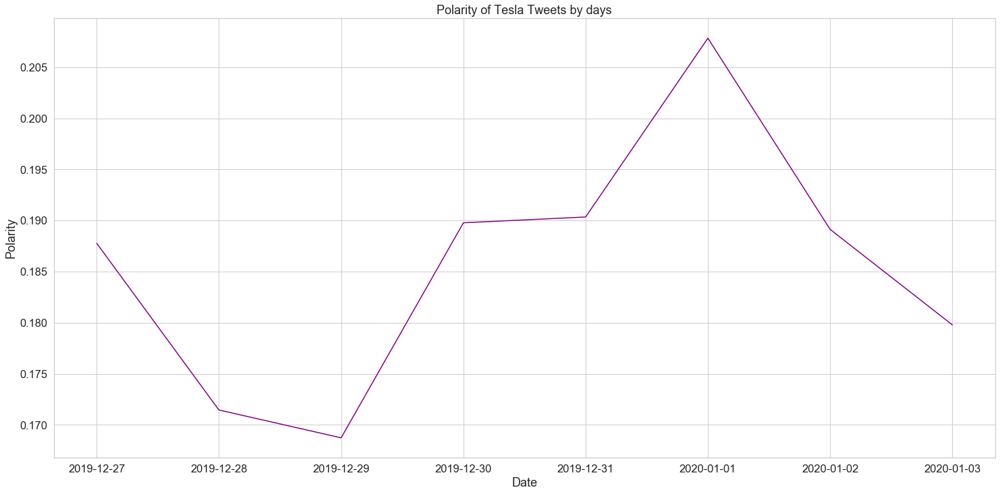

In [165]:
#Create the plot space upon which to plot the data
fig, ax = plt.subplots(figsize=(25, 12))

# Add the x-axis and the y-axis to the plot
ax.plot(sentiment_df['Date'],
        sentiment_df['Polarity'],
        color='purple')

# Set title and labels for axes
ax.set(xlabel="Date",
       ylabel="Polarity",
       title="Polarity of Tesla Tweets by days")

plt.show()

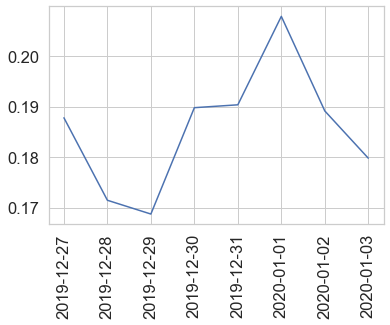

In [166]:
# Another way of visualizing data from twitter

sentiment_df = sentiment_df.sort_values('Date', ascending=True)

plt.plot(sentiment_df['Date'], sentiment_df['Polarity'])
plt.xticks(rotation='vertical')

plt.show()

[*********************100%***********************]  1 of 1 completed


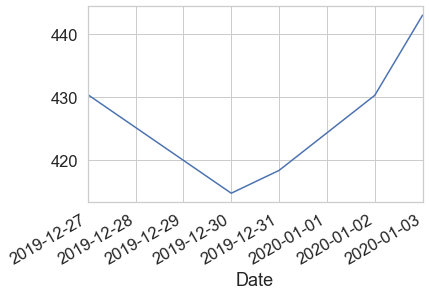

In [167]:
# Get the data for the stock Tesla by specifying the stock ticker, start date, and end date
data_tesla = yf.download('TSLA','2019-12-28','2020-01-04')
 
# Plot the close prices
data_tesla.Close.plot()
plt.show()

In [168]:
financial_data = data_tesla

In [169]:
# Reset the index
financial_data = financial_data.reset_index('Date')

In [170]:
financial_data

,Date,Open,High,Low,Close,Adj Close,Volume
0,2019-12-27,435.000000,435.309998,426.109985,430.380005,430.380005,9945700
1,2019-12-30,428.790009,429.000000,409.260010,414.700012,414.700012,12586400
2,2019-12-31,405.000000,421.290009,402.079987,418.329987,418.329987,10285700
3,2020-01-02,424.500000,430.700012,421.709991,430.260010,430.260010,9532100
4,2020-01-03,440.500000,454.000000,436.920013,443.010010,443.010010,17778500


In [171]:
# Assign Date format to string in order to match with format of sentiment_df['Date']

financial_data['Date'] = (financial_data['Date']).astype('str')

In [172]:
# In the export of data from stocks of Tesla, the 28th, 29th of December and 1st of January were missing,
# si it was impossible to create a graph with two lines on the same date scale.
# In fact, I decided to create a dataframe with added values from real Tesla stock

financial_data_final = pd.DataFrame({"Date":['2019-12-27','2019-12-28', '2019-12-29',
                                             '2019-12-30','2019-12-31', '2020-01-01','2020-01-02', '2020-01-03'], 
                     "Close":[430.380005, 425.280000, 420.180000, 414.700012, 418.329987,
                              424.350000, 430.260010, 443.010010]})

In [173]:
financial_data_final

,Date,Close
0,2019-12-27,430.380005
1,2019-12-28,425.280000
2,2019-12-29,420.180000
3,2019-12-30,414.700012
4,2019-12-31,418.329987
5,2020-01-01,424.350000
6,2020-01-02,430.260010
7,2020-01-03,443.010010


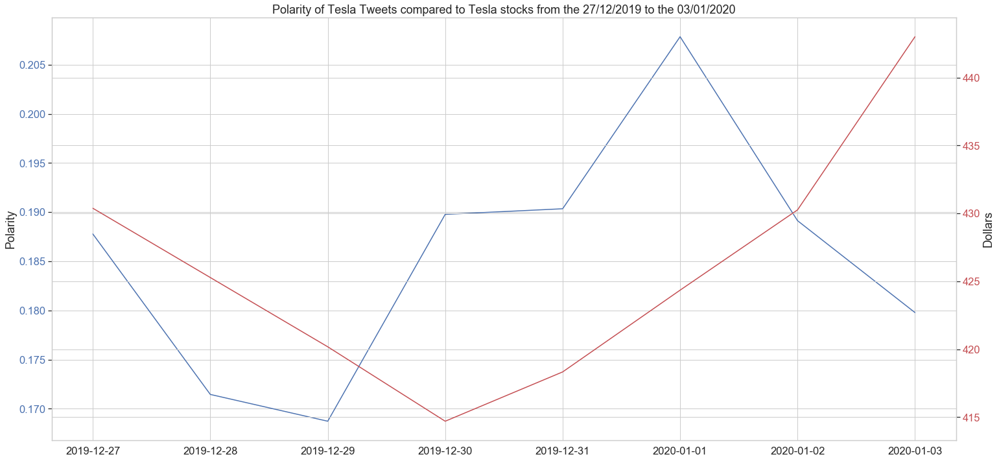

In [174]:
# Create a 2 scales graph with data from twitter analysis and Tesla stocks

fig = plt.figure(figsize=(25, 12))
ax1 = fig.add_subplot()
ax1.plot(sentiment_df['Date'], sentiment_df['Polarity'])
ax1.set_ylabel('Polarity')

ax2 = ax1.twinx()
ax2.plot(financial_data_final['Date'], financial_data_final['Close'], 'r')
ax2.set_ylabel('Dollars')


for tl in ax2.get_yticklabels():
    tl.set_color('r')

for tl in ax1.get_yticklabels():
    tl.set_color('b')

ax1.set(title="Polarity of Tesla Tweets compared to Tesla stocks from the 27/12/2019 to the 03/01/2020")
    
plt.show()